In [1]:
from keras.models import Sequential
from keras import layers
import numpy as np
from six.moves import range

Using TensorFlow backend.


# Parameters Config

In [2]:
class colors:
    ok='\033[92m'
    fail='\033[91m'
    close='\033[0m'

In [3]:
TRAINING_SIZE=80000
DIGITS=3
REVERSE=False
MAXLEN=DIGITS+1+DIGITS
chars='0123456789+ '
RNN=layers.LSTM
HIDDEN_SIZE=128
BATCH_SIZE=128
LAYERS=1

In [4]:
class CharacterTable(object):
    def __init__(self,chars):
        self.chars=sorted(set(chars))
        self.char_indices=dict((c,i) for i,c in enumerate(self.chars))
        self.indices_char=dict((i,c) for i,c in enumerate(self.chars))
    
    def encode(self,C,num_rows): #input C is string
        x=np.zeros((num_rows, len(self.chars)))
        for i,c in enumerate(C):
            x[i,self.char_indices[c]]=1
        return x
    
    def decode(self,x,calc_argmax=True): #if input x is 1-D array then culc_argmax=True； otherwise, if x is string or int then False
        if calc_argmax:
            x=x.argmax(axis=-1)
        return "".join(self.indices_char[i] for i in x)
    

In [5]:
ctable=CharacterTable(chars)

In [6]:
print(ctable.indices_char)
print(ctable.char_indices)

{0: ' ', 1: '+', 2: '0', 3: '1', 4: '2', 5: '3', 6: '4', 7: '5', 8: '6', 9: '7', 10: '8', 11: '9'}
{' ': 0, '+': 1, '0': 2, '1': 3, '2': 4, '3': 5, '4': 6, '5': 7, '6': 8, '7': 9, '8': 10, '9': 11}


# Data Generation

In [7]:
questions=[]
expected=[]
seen=set()
print('Generating data....')
while len(questions)<TRAINING_SIZE:
    f=lambda:int(''.join(np.random.choice(list('0123456789')) for i in range(np.random.randint(1,DIGITS+1))))
    a,b=f(),f()
    key=tuple(sorted((a,b)))
    if key in seen:
        continue
    seen.add(key)
    q='{}+{}'.format(a,b)
    query=q+' '*(MAXLEN-len(q))
    ans=str(a+b)
    ans+=' '*(DIGITS+1-len(ans))
    if REVERSE:
        query=query[::-1]
    questions.append(query)
    expected.append(ans)
print('Total addition questions:',len(questions))

Generating data....
Total addition questions: 80000


In [8]:
print(questions[:5],expected[:5])

['245+60 ', '3+9    ', '7+5    ', '55+2   ', '108+930'] ['305 ', '12  ', '12  ', '57  ', '1038']


# Processing

In [9]:
print('Vectorization....')
x=np.zeros((len(questions),MAXLEN,len(chars)),dtype=np.bool)
y=np.zeros((len(expected),DIGITS+1,len(chars)),dtype=np.bool)
for i,sentence in enumerate(questions):
    x[i]=ctable.encode(sentence,MAXLEN)
for i,sentence in enumerate(expected):
    y[i]=ctable.encode(sentence,DIGITS+1)

Vectorization....


### split data into training data and testing data with diiferent ration: 2/3, 3/4, 4/5

In [10]:
indices=np.arange(len(y))
np.random.shuffle(indices)
x=x[indices]
y=y[indices]

#train_test_split: splitting ratio=2/3, 3/4, 4/5
train_x=[]
train_y=[]
test_x=[]
test_y=[]
x_train=[]
x_val=[]
y_train=[]
y_val=[]
ind=0
for i in [2/3,3/4,4/5]:
    train_x.append(x[:round(TRAINING_SIZE*i)])
    train_y.append(y[:round(TRAINING_SIZE*i)])
    test_x.append(x[round(TRAINING_SIZE*i):])
    test_y.append(y[round(TRAINING_SIZE*i):])
    
    split_at=len(train_x[ind])-len(train_x[ind])//10
    x_train.append(train_x[ind][:split_at])
    x_val.append(train_x[ind][split_at:])
    y_train.append(train_y[ind][:split_at])
    y_val.append(train_y[ind][split_at:])
    
    ind+=1


print('Training Data:')
print([x_train[i].shape for i in range(len(x_train))])
print([y_train[i].shape for i in range(len(y_train))])

print('Validation Data:')
print([x_val[i].shape for i in range(len(x_val))])
print([y_val[i].shape for i in range(len(y_val))])

print('Testing Date:')
print([test_x[i].shape for i in range(len(test_x))])
print([test_y[i].shape for i in range(len(test_y))])

Training Data:
[(48000, 7, 12), (54000, 7, 12), (57600, 7, 12)]
[(48000, 4, 12), (54000, 4, 12), (57600, 4, 12)]
Validation Data:
[(5333, 7, 12), (6000, 7, 12), (6400, 7, 12)]
[(5333, 4, 12), (6000, 4, 12), (6400, 4, 12)]
Testing Date:
[(26667, 7, 12), (20000, 7, 12), (16000, 7, 12)]
[(26667, 4, 12), (20000, 4, 12), (16000, 4, 12)]


# Build Model

In [11]:
print('Build model...')

model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model.summary()

Build model...
Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 128)               72192     
_________________________________________________________________
repeat_vector_1 (RepeatVecto (None, 4, 128)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            131584    
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 12)             1548      
Total params: 205,324
Trainable params: 205,324
Non-trainable params: 0
_________________________________________________________________


# Training and Testing

### on training ratio=2/3 with epoch(iteration)=50

In [13]:
accuracy_1=[]
#traing
for iteration in range(50):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[0], y_train[0],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[0], y_val[0]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[0]))
        rowx, rowy = x_val[0][np.array([ind])], y_val[0][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 210us/step - loss: 1.7792 - acc: 0.3415 - val_loss: 1.7006 - val_acc: 0.3619
Q 229+9   T 238  ☒ 111 
Q 310+193 T 503  ☒ 111 
Q 836+22  T 858  ☒ 499 
Q 868+478 T 1346 ☒ 1561
Q 23+852  T 875  ☒ 498 
Q 19+664  T 683  ☒ 491 
Q 449+5   T 454  ☒ 411 
Q 711+689 T 1400 ☒ 1111
Q 948+428 T 1376 ☒ 1311
Q 495+4   T 499  ☒ 111 

--------------------------------------------------
Iteration 1
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 216us/step - loss: 1.6100 - acc: 0.3951 - val_loss: 1.5256 - val_acc: 0.4258
Q 909+701 T 1610 ☒ 1591
Q 654+81  T 735  ☒ 601 
Q 21+803  T 824  ☒ 801 
Q 12+551  T 563  ☒ 666 
Q 601+831 T 1432 ☒ 1366
Q 28+970  T 998  ☒ 901 
Q 77+428  T 505  ☒ 466 
Q 35+753  T 788  ☒ 601 
Q 424+276 T 700  ☒ 507 
Q 29+23   T 52   ☒ 13  

-----------------

48000/48000 [==============================] - 8s 160us/step - loss: 0.1742 - acc: 0.9603 - val_loss: 0.1686 - val_acc: 0.9577
Q 5+568   T 573  ☑ 573 
Q 205+498 T 703  ☑ 703 
Q 37+841  T 878  ☑ 878 
Q 81+77   T 158  ☑ 158 
Q 73+319  T 392  ☑ 392 
Q 997+920 T 1917 ☒ 1918
Q 16+557  T 573  ☑ 573 
Q 369+82  T 451  ☑ 451 
Q 443+14  T 457  ☑ 457 
Q 17+480  T 497  ☑ 497 

--------------------------------------------------
Iteration 15
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 8s 162us/step - loss: 0.1415 - acc: 0.9682 - val_loss: 0.1341 - val_acc: 0.9688
Q 841+396 T 1237 ☑ 1237
Q 309+181 T 490  ☑ 490 
Q 0+100   T 100  ☑ 100 
Q 82+49   T 131  ☑ 131 
Q 193+3   T 196  ☑ 196 
Q 573+3   T 576  ☑ 576 
Q 32+393  T 425  ☑ 425 
Q 8+430   T 438  ☑ 438 
Q 313+877 T 1190 ☑ 1190
Q 491+14  T 505  ☒ 405 

--------------------------------------------------
Iteration 16
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [=====

48000/48000 [==============================] - 8s 166us/step - loss: 0.0216 - acc: 0.9934 - val_loss: 0.0360 - val_acc: 0.9873
Q 219+72  T 291  ☑ 291 
Q 80+797  T 877  ☑ 877 
Q 924+696 T 1620 ☑ 1620
Q 143+77  T 220  ☑ 220 
Q 909+156 T 1065 ☑ 1065
Q 22+144  T 166  ☑ 166 
Q 589+29  T 618  ☑ 618 
Q 264+672 T 936  ☑ 936 
Q 96+999  T 1095 ☒ 1005
Q 8+112   T 120  ☑ 120 

--------------------------------------------------
Iteration 43
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 8s 165us/step - loss: 0.0107 - acc: 0.9974 - val_loss: 0.0163 - val_acc: 0.9955
Q 228+85  T 313  ☑ 313 
Q 59+468  T 527  ☑ 527 
Q 402+79  T 481  ☑ 481 
Q 14+416  T 430  ☑ 430 
Q 702+80  T 782  ☑ 782 
Q 389+447 T 836  ☑ 836 
Q 496+465 T 961  ☑ 961 
Q 824+512 T 1336 ☑ 1336
Q 84+519  T 603  ☑ 603 
Q 82+49   T 131  ☑ 131 

--------------------------------------------------
Iteration 44
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [=====

In [14]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[0],verbose=0)
right=0
for i in range(len(test_x[0])):
    q=ctable.decode(test_x[0][i])
    correct=ctable.decode(test_y[0][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)

accuracy_1.append(right/len(test_x[0]))*100)
print('accuracy=',(right/len(test_x[0]))*100,'%')

MSG : Prediction
Q 520+28  T 548  ☑ 548 
Q 205+942 T 1147 ☑ 1147
Q 0+731   T 731  ☑ 731 
Q 713+6   T 719  ☑ 719 
Q 740+63  T 803  ☑ 803 
Q 90+412  T 502  ☑ 502 
Q 857+767 T 1624 ☑ 1624
Q 315+512 T 827  ☑ 827 
Q 99+78   T 177  ☑ 177 
Q 624+96  T 720  ☑ 720 
Q 735+69  T 804  ☑ 804 
Q 31+925  T 956  ☑ 956 
Q 429+148 T 577  ☑ 577 
Q 16+167  T 183  ☑ 183 
Q 907+782 T 1689 ☑ 1689
Q 851+416 T 1267 ☑ 1267
Q 483+700 T 1183 ☑ 1183
Q 53+487  T 540  ☑ 540 
Q 18+880  T 898  ☑ 898 
Q 640+111 T 751  ☑ 751 
Q 81+914  T 995  ☑ 995 
Q 285+944 T 1229 ☑ 1229
Q 1+973   T 974  ☑ 974 
Q 821+649 T 1470 ☑ 1470
Q 481+63  T 544  ☑ 544 
Q 127+28  T 155  ☑ 155 
Q 26+302  T 328  ☑ 328 
Q 280+725 T 1005 ☑ 1005
Q 981+61  T 1042 ☑ 1042
Q 610+318 T 928  ☑ 928 
Q 673+447 T 1120 ☑ 1120
Q 13+806  T 819  ☑ 819 
Q 661+779 T 1440 ☑ 1440
Q 964+67  T 1031 ☑ 1031
Q 223+76  T 299  ☑ 299 
Q 982+48  T 1030 ☑ 1030
Q 95+958  T 1053 ☑ 1053
Q 249+74  T 323  ☑ 323 
Q 923+262 T 1185 ☑ 1185
Q 754+989 T 1743 ☑ 1743
Q 929+653 T 1582 ☑ 1582

Q 51+236  T 287  ☑ 287 
Q 974+790 T 1764 ☑ 1764
Q 307+86  T 393  ☑ 393 
Q 1+390   T 391  ☑ 391 
Q 994+248 T 1242 ☑ 1242
Q 343+804 T 1147 ☑ 1147
Q 492+65  T 557  ☑ 557 
Q 355+372 T 727  ☑ 727 
Q 12+48   T 60   ☑ 60  
Q 118+611 T 729  ☒ 739 
Q 875+123 T 998  ☑ 998 
Q 529+9   T 538  ☑ 538 
Q 433+291 T 724  ☑ 724 
Q 868+992 T 1860 ☑ 1860
Q 24+236  T 260  ☑ 260 
Q 27+667  T 694  ☑ 694 
Q 741+9   T 750  ☑ 750 
Q 772+95  T 867  ☑ 867 
Q 452+89  T 541  ☑ 541 
Q 579+9   T 588  ☑ 588 
Q 924+156 T 1080 ☑ 1080
Q 152+49  T 201  ☑ 201 
Q 618+2   T 620  ☑ 620 
Q 31+229  T 260  ☒ 250 
Q 939+66  T 1005 ☑ 1005
Q 960+74  T 1034 ☑ 1034
Q 90+827  T 917  ☑ 917 
Q 530+467 T 997  ☑ 997 
Q 830+814 T 1644 ☑ 1644
Q 929+81  T 1010 ☑ 1010
Q 962+44  T 1006 ☑ 1006
Q 199+38  T 237  ☑ 237 
Q 574+699 T 1273 ☑ 1273
Q 81+957  T 1038 ☑ 1038
Q 75+756  T 831  ☑ 831 
Q 65+186  T 251  ☑ 251 
Q 403+35  T 438  ☑ 438 
Q 385+64  T 449  ☑ 449 
Q 904+89  T 993  ☑ 993 
Q 40+143  T 183  ☑ 183 
Q 296+89  T 385  ☑ 385 
Q 481+274 T 755 

Q 356+851 T 1207 ☑ 1207
Q 94+847  T 941  ☑ 941 
Q 502+29  T 531  ☑ 531 
Q 996+452 T 1448 ☑ 1448
Q 828+893 T 1721 ☑ 1721
Q 176+917 T 1093 ☑ 1093
Q 279+767 T 1046 ☑ 1046
Q 23+659  T 682  ☑ 682 
Q 15+13   T 28   ☑ 28  
Q 44+162  T 206  ☑ 206 
Q 801+878 T 1679 ☑ 1679
Q 4+707   T 711  ☑ 711 
Q 359+69  T 428  ☑ 428 
Q 320+885 T 1205 ☑ 1205
Q 786+97  T 883  ☑ 883 
Q 855+545 T 1400 ☒ 1300
Q 194+72  T 266  ☑ 266 
Q 110+976 T 1086 ☑ 1086
Q 842+889 T 1731 ☑ 1731
Q 496+19  T 515  ☑ 515 
Q 533+133 T 666  ☑ 666 
Q 5+59    T 64   ☑ 64  
Q 40+40   T 80   ☑ 80  
Q 2+707   T 709  ☑ 709 
Q 85+736  T 821  ☑ 821 
Q 75+138  T 213  ☑ 213 
Q 85+951  T 1036 ☑ 1036
Q 46+336  T 382  ☑ 382 
Q 712+528 T 1240 ☑ 1240
Q 214+615 T 829  ☒ 839 
Q 753+23  T 776  ☑ 776 
Q 59+661  T 720  ☑ 720 
Q 78+349  T 427  ☑ 427 
Q 125+873 T 998  ☒ 1098
Q 2+108   T 110  ☑ 110 
Q 743+138 T 881  ☑ 881 
Q 297+98  T 395  ☑ 395 
Q 28+884  T 912  ☑ 912 
Q 994+79  T 1073 ☑ 1073
Q 790+95  T 885  ☑ 885 
Q 738+90  T 828  ☑ 828 
Q 625+458 T 1083

Q 392+201 T 593  ☑ 593 
Q 169+409 T 578  ☑ 578 
Q 721+66  T 787  ☑ 787 
Q 25+306  T 331  ☑ 331 
Q 728+590 T 1318 ☑ 1318
Q 992+83  T 1075 ☑ 1075
Q 70+616  T 686  ☑ 686 
Q 783+321 T 1104 ☑ 1104
Q 49+776  T 825  ☑ 825 
Q 813+51  T 864  ☑ 864 
Q 178+2   T 180  ☑ 180 
Q 2+188   T 190  ☒ 180 
Q 978+860 T 1838 ☑ 1838
Q 436+594 T 1030 ☑ 1030
Q 342+471 T 813  ☑ 813 
Q 6+573   T 579  ☑ 579 
Q 122+438 T 560  ☒ 550 
Q 753+783 T 1536 ☑ 1536
Q 36+707  T 743  ☑ 743 
Q 470+89  T 559  ☑ 559 
Q 84+659  T 743  ☑ 743 
Q 544+40  T 584  ☑ 584 
Q 84+603  T 687  ☑ 687 
Q 341+28  T 369  ☑ 369 
Q 52+192  T 244  ☑ 244 
Q 54+9    T 63   ☑ 63  
Q 16+896  T 912  ☑ 912 
Q 765+59  T 824  ☑ 824 
Q 13+545  T 558  ☑ 558 
Q 575+720 T 1295 ☑ 1295
Q 361+24  T 385  ☑ 385 
Q 978+6   T 984  ☑ 984 
Q 6+434   T 440  ☑ 440 
Q 4+658   T 662  ☑ 662 
Q 735+48  T 783  ☑ 783 
Q 54+366  T 420  ☑ 420 
Q 198+649 T 847  ☑ 847 
Q 528+31  T 559  ☑ 559 
Q 964+64  T 1028 ☑ 1028
Q 76+555  T 631  ☑ 631 
Q 234+92  T 326  ☑ 326 
Q 715+562 T 1277

Q 326+167 T 493  ☑ 493 
Q 15+249  T 264  ☑ 264 
Q 0+209   T 209  ☑ 209 
Q 48+818  T 866  ☑ 866 
Q 621+510 T 1131 ☑ 1131
Q 77+26   T 103  ☑ 103 
Q 374+68  T 442  ☑ 442 
Q 908+65  T 973  ☑ 973 
Q 311+666 T 977  ☑ 977 
Q 222+69  T 291  ☑ 291 
Q 76+159  T 235  ☑ 235 
Q 254+32  T 286  ☑ 286 
Q 89+285  T 374  ☑ 374 
Q 606+693 T 1299 ☒ 1399
Q 222+12  T 234  ☑ 234 
Q 713+897 T 1610 ☑ 1610
Q 83+35   T 118  ☑ 118 
Q 14+278  T 292  ☑ 292 
Q 617+465 T 1082 ☑ 1082
Q 447+49  T 496  ☑ 496 
Q 858+49  T 907  ☑ 907 
Q 50+915  T 965  ☑ 965 
Q 974+51  T 1025 ☑ 1025
Q 724+10  T 734  ☑ 734 
Q 977+71  T 1048 ☑ 1048
Q 154+842 T 996  ☒ 196 
Q 563+34  T 597  ☑ 597 
Q 19+176  T 195  ☑ 195 
Q 137+18  T 155  ☑ 155 
Q 504+5   T 509  ☑ 509 
Q 612+88  T 700  ☑ 700 
Q 35+242  T 277  ☑ 277 
Q 418+92  T 510  ☑ 510 
Q 20+25   T 45   ☑ 45  
Q 750+752 T 1502 ☑ 1502
Q 24+432  T 456  ☑ 456 
Q 856+139 T 995  ☑ 995 
Q 80+445  T 525  ☑ 525 
Q 998+97  T 1095 ☑ 1095
Q 360+806 T 1166 ☑ 1166
Q 396+48  T 444  ☑ 444 
Q 701+124 T 825 

Q 43+0    T 43   ☑ 43  
Q 19+908  T 927  ☑ 927 
Q 834+98  T 932  ☑ 932 
Q 13+187  T 200  ☑ 200 
Q 14+715  T 729  ☑ 729 
Q 59+1    T 60   ☑ 60  
Q 427+7   T 434  ☑ 434 
Q 56+365  T 421  ☑ 421 
Q 367+785 T 1152 ☑ 1152
Q 706+98  T 804  ☑ 804 
Q 454+85  T 539  ☑ 539 
Q 668+25  T 693  ☑ 693 
Q 306+61  T 367  ☑ 367 
Q 455+956 T 1411 ☑ 1411
Q 232+465 T 697  ☑ 697 
Q 81+875  T 956  ☑ 956 
Q 188+26  T 214  ☑ 214 
Q 117+828 T 945  ☑ 945 
Q 611+49  T 660  ☑ 660 
Q 77+49   T 126  ☑ 126 
Q 658+58  T 716  ☑ 716 
Q 361+73  T 434  ☑ 434 
Q 89+911  T 1000 ☑ 1000
Q 89+147  T 236  ☑ 236 
Q 86+804  T 890  ☑ 890 
Q 32+951  T 983  ☑ 983 
Q 99+900  T 999  ☑ 999 
Q 59+71   T 130  ☑ 130 
Q 46+412  T 458  ☑ 458 
Q 515+341 T 856  ☑ 856 
Q 403+23  T 426  ☑ 426 
Q 33+77   T 110  ☑ 110 
Q 70+124  T 194  ☑ 194 
Q 11+4    T 15   ☑ 15  
Q 79+807  T 886  ☑ 886 
Q 14+851  T 865  ☑ 865 
Q 269+83  T 352  ☑ 352 
Q 218+373 T 591  ☑ 591 
Q 4+630   T 634  ☑ 634 
Q 81+328  T 409  ☑ 409 
Q 95+662  T 757  ☑ 757 
Q 199+639 T 838 

Q 0+923   T 923  ☑ 923 
Q 939+699 T 1638 ☑ 1638
Q 657+78  T 735  ☑ 735 
Q 67+353  T 420  ☑ 420 
Q 17+271  T 288  ☑ 288 
Q 705+23  T 728  ☑ 728 
Q 496+985 T 1481 ☑ 1481
Q 96+702  T 798  ☑ 798 
Q 891+244 T 1135 ☑ 1135
Q 95+271  T 366  ☑ 366 
Q 764+4   T 768  ☑ 768 
Q 77+83   T 160  ☑ 160 
Q 176+57  T 233  ☑ 233 
Q 155+476 T 631  ☑ 631 
Q 916+702 T 1618 ☑ 1618
Q 642+225 T 867  ☑ 867 
Q 106+719 T 825  ☑ 825 
Q 536+739 T 1275 ☑ 1275
Q 189+488 T 677  ☑ 677 
Q 114+426 T 540  ☑ 540 
Q 892+876 T 1768 ☑ 1768
Q 452+592 T 1044 ☑ 1044
Q 99+435  T 534  ☑ 534 
Q 391+493 T 884  ☑ 884 
Q 0+973   T 973  ☑ 973 
Q 839+93  T 932  ☑ 932 
Q 746+91  T 837  ☑ 837 
Q 78+92   T 170  ☑ 170 
Q 276+51  T 327  ☒ 337 
Q 202+38  T 240  ☑ 240 
Q 57+387  T 444  ☑ 444 
Q 437+8   T 445  ☑ 445 
Q 39+396  T 435  ☑ 435 
Q 415+1   T 416  ☑ 416 
Q 164+28  T 192  ☑ 192 
Q 862+22  T 884  ☑ 884 
Q 134+84  T 218  ☒ 228 
Q 627+43  T 670  ☑ 670 
Q 65+310  T 375  ☑ 375 
Q 783+718 T 1501 ☑ 1501
Q 726+2   T 728  ☑ 728 
Q 755+660 T 1415

Q 9+396   T 405  ☒ 305 
Q 12+195  T 207  ☑ 207 
Q 865+304 T 1169 ☑ 1169
Q 20+733  T 753  ☑ 753 
Q 729+91  T 820  ☑ 820 
Q 187+89  T 276  ☑ 276 
Q 4+911   T 915  ☑ 915 
Q 649+432 T 1081 ☑ 1081
Q 193+673 T 866  ☑ 866 
Q 52+411  T 463  ☑ 463 
Q 691+173 T 864  ☑ 864 
Q 3+443   T 446  ☑ 446 
Q 236+26  T 262  ☑ 262 
Q 25+353  T 378  ☑ 378 
Q 145+19  T 164  ☑ 164 
Q 81+479  T 560  ☑ 560 
Q 194+732 T 926  ☑ 926 
Q 871+717 T 1588 ☑ 1588
Q 49+355  T 404  ☑ 404 
Q 642+68  T 710  ☒ 700 
Q 78+928  T 1006 ☑ 1006
Q 718+428 T 1146 ☑ 1146
Q 837+282 T 1119 ☑ 1119
Q 849+619 T 1468 ☑ 1468
Q 846+425 T 1271 ☑ 1271
Q 6+646   T 652  ☑ 652 
Q 36+63   T 99   ☑ 99  
Q 90+125  T 215  ☑ 215 
Q 59+29   T 88   ☑ 88  
Q 541+82  T 623  ☑ 623 
Q 485+2   T 487  ☑ 487 
Q 282+74  T 356  ☑ 356 
Q 776+59  T 835  ☑ 835 
Q 30+710  T 740  ☑ 740 
Q 880+293 T 1173 ☑ 1173
Q 1+884   T 885  ☑ 885 
Q 168+37  T 205  ☑ 205 
Q 921+267 T 1188 ☑ 1188
Q 658+7   T 665  ☑ 665 
Q 18+815  T 833  ☑ 833 
Q 367+89  T 456  ☑ 456 
Q 411+11  T 422 

Q 22+979  T 1001 ☑ 1001
Q 815+271 T 1086 ☑ 1086
Q 238+49  T 287  ☑ 287 
Q 83+808  T 891  ☑ 891 
Q 24+481  T 505  ☑ 505 
Q 58+779  T 837  ☑ 837 
Q 871+82  T 953  ☑ 953 
Q 649+478 T 1127 ☑ 1127
Q 68+266  T 334  ☑ 334 
Q 83+58   T 141  ☑ 141 
Q 79+445  T 524  ☑ 524 
Q 907+162 T 1069 ☑ 1069
Q 81+835  T 916  ☑ 916 
Q 5+339   T 344  ☑ 344 
Q 15+537  T 552  ☑ 552 
Q 573+942 T 1515 ☑ 1515
Q 2+246   T 248  ☑ 248 
Q 44+63   T 107  ☑ 107 
Q 89+454  T 543  ☑ 543 
Q 19+291  T 310  ☑ 310 
Q 75+470  T 545  ☑ 545 
Q 502+44  T 546  ☑ 546 
Q 1+139   T 140  ☑ 140 
Q 81+13   T 94   ☑ 94  
Q 11+542  T 553  ☑ 553 
Q 792+506 T 1298 ☑ 1298
Q 87+964  T 1051 ☑ 1051
Q 43+164  T 207  ☑ 207 
Q 14+898  T 912  ☑ 912 
Q 5+531   T 536  ☑ 536 
Q 173+0   T 173  ☑ 173 
Q 89+265  T 354  ☑ 354 
Q 482+26  T 508  ☑ 508 
Q 401+528 T 929  ☑ 929 
Q 746+859 T 1605 ☑ 1605
Q 25+36   T 61   ☑ 61  
Q 566+14  T 580  ☑ 580 
Q 346+12  T 358  ☑ 358 
Q 7+19    T 26   ☑ 26  
Q 337+9   T 346  ☑ 346 
Q 93+904  T 997  ☑ 997 
Q 271+28  T 299 

Q 304+820 T 1124 ☑ 1124
Q 749+409 T 1158 ☑ 1158
Q 884+82  T 966  ☑ 966 
Q 9+860   T 869  ☑ 869 
Q 21+536  T 557  ☑ 557 
Q 40+63   T 103  ☑ 103 
Q 610+5   T 615  ☑ 615 
Q 161+889 T 1050 ☑ 1050
Q 32+326  T 358  ☑ 358 
Q 831+77  T 908  ☑ 908 
Q 58+349  T 407  ☑ 407 
Q 346+399 T 745  ☑ 745 
Q 9+649   T 658  ☑ 658 
Q 76+145  T 221  ☑ 221 
Q 566+822 T 1388 ☑ 1388
Q 21+241  T 262  ☑ 262 
Q 356+5   T 361  ☑ 361 
Q 819+587 T 1406 ☑ 1406
Q 587+16  T 603  ☑ 603 
Q 944+725 T 1669 ☑ 1669
Q 382+50  T 432  ☑ 432 
Q 299+70  T 369  ☑ 369 
Q 98+860  T 958  ☑ 958 
Q 253+26  T 279  ☑ 279 
Q 726+642 T 1368 ☑ 1368
Q 338+842 T 1180 ☑ 1180
Q 520+30  T 550  ☑ 550 
Q 43+413  T 456  ☑ 456 
Q 8+948   T 956  ☑ 956 
Q 657+666 T 1323 ☑ 1323
Q 976+95  T 1071 ☑ 1071
Q 67+259  T 326  ☑ 326 
Q 990+48  T 1038 ☑ 1038
Q 581+958 T 1539 ☑ 1539
Q 37+264  T 301  ☑ 301 
Q 84+214  T 298  ☑ 298 
Q 89+463  T 552  ☑ 552 
Q 96+768  T 864  ☑ 864 
Q 60+199  T 259  ☑ 259 
Q 818+883 T 1701 ☑ 1701
Q 459+26  T 485  ☑ 485 
Q 190+499 T 689 

Q 519+74  T 593  ☑ 593 
Q 149+403 T 552  ☑ 552 
Q 403+143 T 546  ☒ 536 
Q 4+97    T 101  ☑ 101 
Q 114+14  T 128  ☑ 128 
Q 60+957  T 1017 ☑ 1017
Q 3+741   T 744  ☑ 744 
Q 34+572  T 606  ☑ 606 
Q 998+21  T 1019 ☑ 1019
Q 686+94  T 780  ☑ 780 
Q 46+489  T 535  ☑ 535 
Q 794+53  T 847  ☑ 847 
Q 67+63   T 130  ☑ 130 
Q 545+204 T 749  ☑ 749 
Q 980+3   T 983  ☑ 983 
Q 492+301 T 793  ☑ 793 
Q 293+86  T 379  ☑ 379 
Q 36+225  T 261  ☑ 261 
Q 660+653 T 1313 ☑ 1313
Q 43+188  T 231  ☑ 231 
Q 500+814 T 1314 ☑ 1314
Q 88+709  T 797  ☑ 797 
Q 74+49   T 123  ☑ 123 
Q 31+675  T 706  ☑ 706 
Q 939+951 T 1890 ☑ 1890
Q 6+567   T 573  ☑ 573 
Q 960+64  T 1024 ☑ 1024
Q 996+70  T 1066 ☑ 1066
Q 933+494 T 1427 ☑ 1427
Q 809+77  T 886  ☑ 886 
Q 67+121  T 188  ☑ 188 
Q 996+3   T 999  ☑ 999 
Q 83+6    T 89   ☒ 99  
Q 22+840  T 862  ☑ 862 
Q 106+480 T 586  ☑ 586 
Q 128+16  T 144  ☑ 144 
Q 944+570 T 1514 ☑ 1514
Q 409+922 T 1331 ☑ 1331
Q 518+617 T 1135 ☑ 1135
Q 13+617  T 630  ☑ 630 
Q 100+215 T 315  ☑ 315 
Q 79+25   T 104 

Q 882+128 T 1010 ☑ 1010
Q 59+430  T 489  ☑ 489 
Q 63+554  T 617  ☑ 617 
Q 61+53   T 114  ☑ 114 
Q 453+928 T 1381 ☑ 1381
Q 660+726 T 1386 ☑ 1386
Q 201+771 T 972  ☑ 972 
Q 149+447 T 596  ☒ 696 
Q 860+74  T 934  ☑ 934 
Q 5+853   T 858  ☑ 858 
Q 236+735 T 971  ☑ 971 
Q 83+436  T 519  ☑ 519 
Q 67+768  T 835  ☑ 835 
Q 81+408  T 489  ☑ 489 
Q 63+572  T 635  ☑ 635 
Q 39+989  T 1028 ☑ 1028
Q 850+16  T 866  ☑ 866 
Q 577+99  T 676  ☑ 676 
Q 902+411 T 1313 ☑ 1313
Q 772+493 T 1265 ☑ 1265
Q 898+16  T 914  ☑ 914 
Q 92+133  T 225  ☑ 225 
Q 121+876 T 997  ☒ 197 
Q 56+219  T 275  ☑ 275 
Q 637+94  T 731  ☑ 731 
Q 50+528  T 578  ☑ 578 
Q 12+172  T 184  ☑ 184 
Q 58+437  T 495  ☑ 495 
Q 310+71  T 381  ☑ 381 
Q 158+635 T 793  ☒ 893 
Q 19+292  T 311  ☑ 311 
Q 84+558  T 642  ☑ 642 
Q 77+235  T 312  ☑ 312 
Q 999+54  T 1053 ☑ 1053
Q 2+60    T 62   ☑ 62  
Q 57+12   T 69   ☒ 79  
Q 6+118   T 124  ☑ 124 
Q 107+54  T 161  ☑ 161 
Q 44+530  T 574  ☑ 574 
Q 417+16  T 433  ☑ 433 
Q 37+244  T 281  ☑ 281 
Q 18+803  T 821 

Q 243+42  T 285  ☑ 285 
Q 9+429   T 438  ☑ 438 
Q 498+1   T 499  ☒ 599 
Q 505+733 T 1238 ☑ 1238
Q 370+358 T 728  ☑ 728 
Q 313+99  T 412  ☑ 412 
Q 472+53  T 525  ☑ 525 
Q 987+728 T 1715 ☑ 1715
Q 348+41  T 389  ☑ 389 
Q 808+90  T 898  ☑ 898 
Q 48+194  T 242  ☑ 242 
Q 703+27  T 730  ☑ 730 
Q 9+350   T 359  ☑ 359 
Q 685+3   T 688  ☑ 688 
Q 883+656 T 1539 ☑ 1539
Q 28+381  T 409  ☑ 409 
Q 18+67   T 85   ☑ 85  
Q 708+18  T 726  ☑ 726 
Q 282+860 T 1142 ☑ 1142
Q 328+4   T 332  ☑ 332 
Q 715+82  T 797  ☑ 797 
Q 0+198   T 198  ☑ 198 
Q 0+212   T 212  ☑ 212 
Q 19+159  T 178  ☑ 178 
Q 18+591  T 609  ☑ 609 
Q 47+469  T 516  ☑ 516 
Q 57+83   T 140  ☑ 140 
Q 35+730  T 765  ☑ 765 
Q 312+5   T 317  ☑ 317 
Q 447+71  T 518  ☑ 518 
Q 232+958 T 1190 ☑ 1190
Q 896+2   T 898  ☑ 898 
Q 599+208 T 807  ☑ 807 
Q 364+648 T 1012 ☑ 1012
Q 341+826 T 1167 ☑ 1167
Q 82+58   T 140  ☑ 140 
Q 64+576  T 640  ☑ 640 
Q 84+303  T 387  ☑ 387 
Q 273+81  T 354  ☑ 354 
Q 65+281  T 346  ☑ 346 
Q 499+4   T 503  ☑ 503 
Q 59+237  T 296 

Q 399+15  T 414  ☑ 414 
Q 342+88  T 430  ☑ 430 
Q 786+42  T 828  ☑ 828 
Q 53+203  T 256  ☑ 256 
Q 961+624 T 1585 ☑ 1585
Q 146+62  T 208  ☑ 208 
Q 363+882 T 1245 ☑ 1245
Q 61+538  T 599  ☑ 599 
Q 978+11  T 989  ☑ 989 
Q 370+59  T 429  ☒ 439 
Q 231+68  T 299  ☑ 299 
Q 210+61  T 271  ☑ 271 
Q 438+603 T 1041 ☑ 1041
Q 913+996 T 1909 ☑ 1909
Q 43+204  T 247  ☑ 247 
Q 573+950 T 1523 ☑ 1523
Q 30+392  T 422  ☑ 422 
Q 9+532   T 541  ☒ 641 
Q 4+860   T 864  ☑ 864 
Q 448+42  T 490  ☑ 490 
Q 947+301 T 1248 ☑ 1248
Q 431+642 T 1073 ☑ 1073
Q 30+334  T 364  ☑ 364 
Q 829+66  T 895  ☑ 895 
Q 578+14  T 592  ☑ 592 
Q 64+211  T 275  ☑ 275 
Q 192+323 T 515  ☑ 515 
Q 544+364 T 908  ☑ 908 
Q 73+194  T 267  ☑ 267 
Q 455+582 T 1037 ☑ 1037
Q 836+57  T 893  ☑ 893 
Q 933+918 T 1851 ☑ 1851
Q 339+549 T 888  ☑ 888 
Q 772+23  T 795  ☑ 795 
Q 8+715   T 723  ☑ 723 
Q 32+72   T 104  ☑ 104 
Q 18+89   T 107  ☑ 107 
Q 958+7   T 965  ☑ 965 
Q 633+8   T 641  ☑ 641 
Q 409+39  T 448  ☑ 448 
Q 2+9     T 11   ☒ 91  
Q 29+787  T 816 

Q 463+0   T 463  ☑ 463 
Q 52+291  T 343  ☑ 343 
Q 943+751 T 1694 ☑ 1694
Q 806+472 T 1278 ☑ 1278
Q 418+824 T 1242 ☑ 1242
Q 53+158  T 211  ☑ 211 
Q 46+586  T 632  ☑ 632 
Q 55+825  T 880  ☒ 889 
Q 409+218 T 627  ☑ 627 
Q 377+24  T 401  ☒ 301 
Q 748+34  T 782  ☑ 782 
Q 32+591  T 623  ☑ 623 
Q 62+274  T 336  ☑ 336 
Q 16+519  T 535  ☑ 535 
Q 863+51  T 914  ☑ 914 
Q 776+42  T 818  ☑ 818 
Q 30+985  T 1015 ☑ 1015
Q 792+385 T 1177 ☑ 1177
Q 226+15  T 241  ☑ 241 
Q 462+26  T 488  ☑ 488 
Q 48+540  T 588  ☑ 588 
Q 330+226 T 556  ☑ 556 
Q 79+741  T 820  ☑ 820 
Q 63+833  T 896  ☑ 896 
Q 38+466  T 504  ☑ 504 
Q 740+917 T 1657 ☑ 1657
Q 865+869 T 1734 ☑ 1734
Q 67+156  T 223  ☑ 223 
Q 408+727 T 1135 ☑ 1135
Q 622+202 T 824  ☑ 824 
Q 38+762  T 800  ☑ 800 
Q 55+241  T 296  ☑ 296 
Q 665+29  T 694  ☑ 694 
Q 597+613 T 1210 ☑ 1210
Q 71+396  T 467  ☑ 467 
Q 548+38  T 586  ☑ 586 
Q 463+48  T 511  ☑ 511 
Q 996+842 T 1838 ☑ 1838
Q 68+365  T 433  ☑ 433 
Q 609+129 T 738  ☑ 738 
Q 880+280 T 1160 ☑ 1160
Q 6+155   T 161 

Q 82+746  T 828  ☑ 828 
Q 342+13  T 355  ☑ 355 
Q 320+235 T 555  ☒ 545 
Q 343+893 T 1236 ☑ 1236
Q 992+45  T 1037 ☑ 1037
Q 849+66  T 915  ☑ 915 
Q 177+894 T 1071 ☑ 1071
Q 29+320  T 349  ☑ 349 
Q 88+211  T 299  ☑ 299 
Q 90+234  T 324  ☑ 324 
Q 38+349  T 387  ☑ 387 
Q 53+540  T 593  ☑ 593 
Q 20+564  T 584  ☑ 584 
Q 419+0   T 419  ☑ 419 
Q 745+431 T 1176 ☑ 1176
Q 273+951 T 1224 ☑ 1224
Q 47+802  T 849  ☑ 849 
Q 841+993 T 1834 ☑ 1834
Q 309+852 T 1161 ☑ 1161
Q 636+75  T 711  ☑ 711 
Q 650+0   T 650  ☑ 650 
Q 852+14  T 866  ☑ 866 
Q 755+852 T 1607 ☑ 1607
Q 686+97  T 783  ☑ 783 
Q 849+419 T 1268 ☑ 1268
Q 334+20  T 354  ☑ 354 
Q 26+58   T 84   ☑ 84  
Q 11+572  T 583  ☑ 583 
Q 959+702 T 1661 ☑ 1661
Q 44+939  T 983  ☑ 983 
Q 727+86  T 813  ☑ 813 
Q 570+12  T 582  ☑ 582 
Q 86+193  T 279  ☑ 279 
Q 73+531  T 604  ☑ 604 
Q 395+581 T 976  ☑ 976 
Q 498+836 T 1334 ☑ 1334
Q 198+602 T 800  ☒ 700 
Q 86+352  T 438  ☑ 438 
Q 982+99  T 1081 ☑ 1081
Q 996+25  T 1021 ☑ 1021
Q 51+798  T 849  ☑ 849 
Q 175+44  T 219 

Q 511+51  T 562  ☑ 562 
Q 59+174  T 233  ☑ 233 
Q 259+32  T 291  ☑ 291 
Q 48+306  T 354  ☑ 354 
Q 775+808 T 1583 ☑ 1583
Q 33+64   T 97   ☑ 97  
Q 783+691 T 1474 ☑ 1474
Q 203+920 T 1123 ☑ 1123
Q 86+784  T 870  ☒ 860 
Q 413+843 T 1256 ☑ 1256
Q 682+694 T 1376 ☑ 1376
Q 736+48  T 784  ☑ 784 
Q 152+9   T 161  ☑ 161 
Q 257+57  T 314  ☒ 324 
Q 358+25  T 383  ☑ 383 
Q 870+806 T 1676 ☑ 1676
Q 490+377 T 867  ☑ 867 
Q 155+11  T 166  ☒ 176 
Q 234+717 T 951  ☑ 951 
Q 661+52  T 713  ☑ 713 
Q 24+306  T 330  ☑ 330 
Q 302+506 T 808  ☑ 808 
Q 462+703 T 1165 ☑ 1165
Q 68+285  T 353  ☑ 353 
Q 458+304 T 762  ☑ 762 
Q 426+166 T 592  ☒ 692 
Q 807+384 T 1191 ☑ 1191
Q 99+82   T 181  ☑ 181 
Q 35+635  T 670  ☑ 670 
Q 492+16  T 508  ☑ 508 
Q 373+114 T 487  ☑ 487 
Q 94+865  T 959  ☑ 959 
Q 30+371  T 401  ☑ 401 
Q 8+646   T 654  ☑ 654 
Q 149+97  T 246  ☑ 246 
Q 13+649  T 662  ☑ 662 
Q 701+2   T 703  ☑ 703 
Q 704+695 T 1399 ☒ 1499
Q 772+950 T 1722 ☑ 1722
Q 571+5   T 576  ☑ 576 
Q 3+329   T 332  ☑ 332 
Q 71+786  T 857 

Q 475+37  T 512  ☑ 512 
Q 182+23  T 205  ☑ 205 
Q 769+46  T 815  ☑ 815 
Q 682+455 T 1137 ☑ 1137
Q 167+117 T 284  ☑ 284 
Q 213+96  T 309  ☑ 309 
Q 331+2   T 333  ☑ 333 
Q 411+13  T 424  ☑ 424 
Q 266+77  T 343  ☑ 343 
Q 652+628 T 1280 ☑ 1280
Q 57+59   T 116  ☑ 116 
Q 754+48  T 802  ☑ 802 
Q 1+471   T 472  ☑ 472 
Q 867+6   T 873  ☑ 873 
Q 610+85  T 695  ☑ 695 
Q 131+0   T 131  ☑ 131 
Q 600+70  T 670  ☑ 670 
Q 49+643  T 692  ☑ 692 
Q 99+861  T 960  ☑ 960 
Q 568+99  T 667  ☑ 667 
Q 232+92  T 324  ☑ 324 
Q 927+4   T 931  ☑ 931 
Q 51+186  T 237  ☑ 237 
Q 750+803 T 1553 ☑ 1553
Q 18+104  T 122  ☑ 122 
Q 38+288  T 326  ☑ 326 
Q 31+935  T 966  ☑ 966 
Q 17+846  T 863  ☑ 863 
Q 76+10   T 86   ☑ 86  
Q 356+769 T 1125 ☑ 1125
Q 310+86  T 396  ☑ 396 
Q 450+253 T 703  ☑ 703 
Q 5+87    T 92   ☑ 92  
Q 67+971  T 1038 ☑ 1038
Q 50+536  T 586  ☑ 586 
Q 913+861 T 1774 ☑ 1774
Q 85+99   T 184  ☑ 184 
Q 587+530 T 1117 ☑ 1117
Q 446+40  T 486  ☑ 486 
Q 89+565  T 654  ☑ 654 
Q 319+828 T 1147 ☑ 1147
Q 626+638 T 1264

Q 846+839 T 1685 ☑ 1685
Q 811+60  T 871  ☑ 871 
Q 85+808  T 893  ☑ 893 
Q 356+6   T 362  ☑ 362 
Q 403+56  T 459  ☑ 459 
Q 773+55  T 828  ☑ 828 
Q 986+774 T 1760 ☑ 1760
Q 83+93   T 176  ☑ 176 
Q 85+98   T 183  ☑ 183 
Q 11+430  T 441  ☑ 441 
Q 620+351 T 971  ☑ 971 
Q 818+78  T 896  ☑ 896 
Q 19+515  T 534  ☑ 534 
Q 632+194 T 826  ☑ 826 
Q 145+12  T 157  ☑ 157 
Q 894+912 T 1806 ☑ 1806
Q 408+136 T 544  ☑ 544 
Q 823+609 T 1432 ☑ 1432
Q 832+769 T 1601 ☑ 1601
Q 928+916 T 1844 ☑ 1844
Q 277+56  T 333  ☑ 333 
Q 376+886 T 1262 ☑ 1262
Q 454+96  T 550  ☑ 550 
Q 924+204 T 1128 ☒ 1127
Q 16+488  T 504  ☑ 504 
Q 87+21   T 108  ☑ 108 
Q 17+719  T 736  ☑ 736 
Q 12+390  T 402  ☑ 402 
Q 17+652  T 669  ☑ 669 
Q 508+933 T 1441 ☑ 1441
Q 52+142  T 194  ☑ 194 
Q 544+84  T 628  ☑ 628 
Q 872+56  T 928  ☑ 928 
Q 626+3   T 629  ☑ 629 
Q 969+35  T 1004 ☑ 1004
Q 852+18  T 870  ☒ 869 
Q 527+78  T 605  ☑ 605 
Q 64+782  T 846  ☑ 846 
Q 957+99  T 1056 ☑ 1056
Q 331+654 T 985  ☑ 985 
Q 32+631  T 663  ☑ 663 
Q 88+673  T 761 

Q 423+26  T 449  ☑ 449 
Q 16+179  T 195  ☑ 195 
Q 52+950  T 1002 ☑ 1002
Q 274+574 T 848  ☑ 848 
Q 952+635 T 1587 ☑ 1587
Q 462+525 T 987  ☑ 987 
Q 1+126   T 127  ☑ 127 
Q 309+38  T 347  ☑ 347 
Q 12+657  T 669  ☑ 669 
Q 135+481 T 616  ☒ 625 
Q 555+78  T 633  ☑ 633 
Q 669+1   T 670  ☑ 670 
Q 681+865 T 1546 ☑ 1546
Q 779+844 T 1623 ☑ 1623
Q 943+263 T 1206 ☑ 1206
Q 5+361   T 366  ☑ 366 
Q 362+471 T 833  ☑ 833 
Q 618+932 T 1550 ☑ 1550
Q 35+781  T 816  ☑ 816 
Q 52+204  T 256  ☑ 256 
Q 374+4   T 378  ☑ 378 
Q 839+486 T 1325 ☑ 1325
Q 19+80   T 99   ☑ 99  
Q 84+11   T 95   ☑ 95  
Q 188+969 T 1157 ☑ 1157
Q 972+483 T 1455 ☑ 1455
Q 919+444 T 1363 ☑ 1363
Q 558+3   T 561  ☑ 561 
Q 915+64  T 979  ☑ 979 
Q 413+33  T 446  ☑ 446 
Q 871+263 T 1134 ☑ 1134
Q 18+242  T 260  ☑ 260 
Q 184+59  T 243  ☑ 243 
Q 771+36  T 807  ☑ 807 
Q 329+895 T 1224 ☑ 1224
Q 967+461 T 1428 ☑ 1428
Q 822+50  T 872  ☑ 872 
Q 64+66   T 130  ☑ 130 
Q 108+132 T 240  ☑ 240 
Q 479+616 T 1095 ☑ 1095
Q 109+170 T 279  ☑ 279 
Q 824+82  T 906 

Q 14+2    T 16   ☑ 16  
Q 149+967 T 1116 ☑ 1116
Q 238+380 T 618  ☑ 618 
Q 274+91  T 365  ☑ 365 
Q 27+469  T 496  ☑ 496 
Q 89+275  T 364  ☑ 364 
Q 857+35  T 892  ☑ 892 
Q 492+4   T 496  ☑ 496 
Q 491+155 T 646  ☑ 646 
Q 940+63  T 1003 ☑ 1003
Q 9+517   T 526  ☑ 526 
Q 106+16  T 122  ☑ 122 
Q 393+912 T 1305 ☑ 1305
Q 676+157 T 833  ☑ 833 
Q 690+746 T 1436 ☑ 1436
Q 23+356  T 379  ☑ 379 
Q 607+824 T 1431 ☑ 1431
Q 948+853 T 1801 ☒ 1701
Q 807+1   T 808  ☑ 808 
Q 865+31  T 896  ☑ 896 
Q 352+18  T 370  ☑ 370 
Q 578+3   T 581  ☑ 581 
Q 12+90   T 102  ☑ 102 
Q 176+22  T 198  ☑ 198 
Q 235+94  T 329  ☒ 339 
Q 43+256  T 299  ☑ 299 
Q 28+181  T 209  ☑ 209 
Q 918+98  T 1016 ☑ 1016
Q 501+14  T 515  ☑ 515 
Q 857+793 T 1650 ☑ 1650
Q 278+785 T 1063 ☑ 1063
Q 598+907 T 1505 ☑ 1505
Q 95+745  T 840  ☑ 840 
Q 24+639  T 663  ☑ 663 
Q 787+333 T 1120 ☑ 1120
Q 428+31  T 459  ☑ 459 
Q 69+273  T 342  ☑ 342 
Q 58+759  T 817  ☑ 817 
Q 86+908  T 994  ☑ 994 
Q 290+920 T 1210 ☑ 1210
Q 475+176 T 651  ☑ 651 
Q 262+2   T 264 

Q 28+142  T 170  ☑ 170 
Q 429+57  T 486  ☑ 486 
Q 132+251 T 383  ☑ 383 
Q 100+72  T 172  ☑ 172 
Q 385+47  T 432  ☑ 432 
Q 373+23  T 396  ☑ 396 
Q 261+831 T 1092 ☑ 1092
Q 482+20  T 502  ☑ 502 
Q 480+590 T 1070 ☑ 1070
Q 922+186 T 1108 ☑ 1108
Q 94+310  T 404  ☑ 404 
Q 736+533 T 1269 ☑ 1269
Q 635+41  T 676  ☑ 676 
Q 302+959 T 1261 ☑ 1261
Q 61+467  T 528  ☑ 528 
Q 616+58  T 674  ☑ 674 
Q 564+12  T 576  ☑ 576 
Q 111+596 T 707  ☑ 707 
Q 724+35  T 759  ☑ 759 
Q 592+93  T 685  ☑ 685 
Q 860+35  T 895  ☑ 895 
Q 627+751 T 1378 ☑ 1378
Q 14+174  T 188  ☑ 188 
Q 281+803 T 1084 ☑ 1084
Q 493+420 T 913  ☑ 913 
Q 73+436  T 509  ☑ 509 
Q 460+35  T 495  ☑ 495 
Q 472+66  T 538  ☑ 538 
Q 947+10  T 957  ☑ 957 
Q 915+317 T 1232 ☑ 1232
Q 797+58  T 855  ☑ 855 
Q 902+35  T 937  ☑ 937 
Q 18+226  T 244  ☑ 244 
Q 851+936 T 1787 ☑ 1787
Q 54+84   T 138  ☑ 138 
Q 771+58  T 829  ☑ 829 
Q 634+39  T 673  ☑ 673 
Q 173+11  T 184  ☑ 184 
Q 210+116 T 326  ☑ 326 
Q 859+245 T 1104 ☑ 1104
Q 394+935 T 1329 ☑ 1329
Q 997+176 T 1173

Q 322+44  T 366  ☑ 366 
Q 755+696 T 1451 ☑ 1451
Q 62+500  T 562  ☑ 562 
Q 2+933   T 935  ☑ 935 
Q 221+852 T 1073 ☑ 1073
Q 91+763  T 854  ☑ 854 
Q 15+576  T 591  ☑ 591 
Q 997+29  T 1026 ☑ 1026
Q 26+282  T 308  ☑ 308 
Q 937+1   T 938  ☑ 938 
Q 581+58  T 639  ☑ 639 
Q 229+1   T 230  ☑ 230 
Q 6+718   T 724  ☑ 724 
Q 47+681  T 728  ☑ 728 
Q 1+383   T 384  ☑ 384 
Q 200+773 T 973  ☑ 973 
Q 587+742 T 1329 ☑ 1329
Q 825+81  T 906  ☑ 906 
Q 87+72   T 159  ☑ 159 
Q 803+311 T 1114 ☑ 1114
Q 282+80  T 362  ☑ 362 
Q 28+429  T 457  ☑ 457 
Q 490+630 T 1120 ☑ 1120
Q 43+798  T 841  ☑ 841 
Q 650+407 T 1057 ☑ 1057
Q 50+556  T 606  ☑ 606 
Q 663+89  T 752  ☑ 752 
Q 73+763  T 836  ☑ 836 
Q 555+470 T 1025 ☑ 1025
Q 48+273  T 321  ☑ 321 
Q 827+140 T 967  ☑ 967 
Q 1+391   T 392  ☑ 392 
Q 62+602  T 664  ☑ 664 
Q 99+634  T 733  ☑ 733 
Q 78+200  T 278  ☑ 278 
Q 668+49  T 717  ☑ 717 
Q 554+962 T 1516 ☑ 1516
Q 232+30  T 262  ☑ 262 
Q 468+95  T 563  ☑ 563 
Q 922+27  T 949  ☑ 949 
Q 58+661  T 719  ☑ 719 
Q 296+62  T 358 

Q 99+53   T 152  ☑ 152 
Q 73+739  T 812  ☑ 812 
Q 732+765 T 1497 ☑ 1497
Q 349+87  T 436  ☑ 436 
Q 25+413  T 438  ☑ 438 
Q 334+650 T 984  ☑ 984 
Q 199+746 T 945  ☑ 945 
Q 481+229 T 710  ☑ 710 
Q 130+464 T 594  ☑ 594 
Q 99+921  T 1020 ☑ 1020
Q 53+311  T 364  ☑ 364 
Q 941+79  T 1020 ☑ 1020
Q 19+936  T 955  ☑ 955 
Q 290+391 T 681  ☑ 681 
Q 666+639 T 1305 ☑ 1305
Q 139+19  T 158  ☑ 158 
Q 427+74  T 501  ☑ 501 
Q 346+726 T 1072 ☑ 1072
Q 91+86   T 177  ☑ 177 
Q 95+680  T 775  ☑ 775 
Q 413+469 T 882  ☑ 882 
Q 90+81   T 171  ☑ 171 
Q 0+940   T 940  ☑ 940 
Q 94+906  T 1000 ☑ 1000
Q 200+996 T 1196 ☑ 1196
Q 72+806  T 878  ☑ 878 
Q 702+159 T 861  ☑ 861 
Q 668+226 T 894  ☑ 894 
Q 169+3   T 172  ☑ 172 
Q 122+983 T 1105 ☑ 1105
Q 122+29  T 151  ☑ 151 
Q 151+218 T 369  ☑ 369 
Q 640+526 T 1166 ☑ 1166
Q 2+989   T 991  ☑ 991 
Q 187+866 T 1053 ☑ 1053
Q 73+789  T 862  ☑ 862 
Q 301+24  T 325  ☑ 325 
Q 948+39  T 987  ☑ 987 
Q 96+821  T 917  ☑ 917 
Q 771+435 T 1206 ☑ 1206
Q 774+6   T 780  ☑ 780 
Q 271+92  T 363 

Q 519+627 T 1146 ☑ 1146
Q 7+260   T 267  ☑ 267 
Q 860+262 T 1122 ☑ 1122
Q 30+182  T 212  ☑ 212 
Q 710+551 T 1261 ☑ 1261
Q 273+604 T 877  ☑ 877 
Q 477+474 T 951  ☑ 951 
Q 83+200  T 283  ☑ 283 
Q 264+55  T 319  ☑ 319 
Q 822+381 T 1203 ☑ 1203
Q 161+25  T 186  ☑ 186 
Q 891+21  T 912  ☑ 912 
Q 358+66  T 424  ☑ 424 
Q 23+79   T 102  ☑ 102 
Q 27+124  T 151  ☑ 151 
Q 317+24  T 341  ☑ 341 
Q 1+351   T 352  ☑ 352 
Q 659+337 T 996  ☑ 996 
Q 85+78   T 163  ☑ 163 
Q 865+427 T 1292 ☑ 1292
Q 900+655 T 1555 ☑ 1555
Q 378+864 T 1242 ☑ 1242
Q 203+560 T 763  ☑ 763 
Q 54+655  T 709  ☑ 709 
Q 233+953 T 1186 ☑ 1186
Q 292+83  T 375  ☑ 375 
Q 52+998  T 1050 ☒ 1049
Q 512+820 T 1332 ☑ 1332
Q 952+1   T 953  ☑ 953 
Q 541+4   T 545  ☑ 545 
Q 333+8   T 341  ☑ 341 
Q 10+599  T 609  ☑ 609 
Q 159+26  T 185  ☑ 185 
Q 814+724 T 1538 ☑ 1538
Q 490+648 T 1138 ☑ 1138
Q 67+590  T 657  ☑ 657 
Q 62+945  T 1007 ☑ 1007
Q 61+425  T 486  ☑ 486 
Q 240+9   T 249  ☑ 249 
Q 302+2   T 304  ☑ 304 
Q 85+121  T 206  ☑ 206 
Q 197+658 T 855 

Q 226+388 T 614  ☑ 614 
Q 909+434 T 1343 ☑ 1343
Q 84+253  T 337  ☑ 337 
Q 45+122  T 167  ☑ 167 
Q 1+369   T 370  ☑ 370 
Q 271+0   T 271  ☑ 271 
Q 119+454 T 573  ☑ 573 
Q 41+735  T 776  ☑ 776 
Q 279+702 T 981  ☑ 981 
Q 96+308  T 404  ☑ 404 
Q 28+288  T 316  ☑ 316 
Q 61+445  T 506  ☑ 506 
Q 37+881  T 918  ☑ 918 
Q 270+48  T 318  ☑ 318 
Q 495+47  T 542  ☑ 542 
Q 12+626  T 638  ☑ 638 
Q 70+123  T 193  ☑ 193 
Q 497+600 T 1097 ☑ 1097
Q 747+686 T 1433 ☑ 1433
Q 393+361 T 754  ☑ 754 
Q 283+787 T 1070 ☑ 1070
Q 61+780  T 841  ☑ 841 
Q 225+301 T 526  ☑ 526 
Q 198+404 T 602  ☑ 602 
Q 428+524 T 952  ☑ 952 
Q 92+475  T 567  ☑ 567 
Q 523+12  T 535  ☑ 535 
Q 381+3   T 384  ☑ 384 
Q 654+6   T 660  ☑ 660 
Q 18+909  T 927  ☑ 927 
Q 833+538 T 1371 ☑ 1371
Q 80+607  T 687  ☑ 687 
Q 6+417   T 423  ☑ 423 
Q 76+129  T 205  ☑ 205 
Q 417+886 T 1303 ☑ 1303
Q 59+345  T 404  ☑ 404 
Q 144+4   T 148  ☑ 148 
Q 387+527 T 914  ☑ 914 
Q 997+585 T 1582 ☑ 1582
Q 67+177  T 244  ☑ 244 
Q 815+0   T 815  ☑ 815 
Q 30+955  T 985 

Q 48+722  T 770  ☑ 770 
Q 155+67  T 222  ☒ 232 
Q 534+587 T 1121 ☑ 1121
Q 77+932  T 1009 ☑ 1009
Q 297+491 T 788  ☑ 788 
Q 73+764  T 837  ☑ 837 
Q 770+90  T 860  ☑ 860 
Q 482+788 T 1270 ☑ 1270
Q 281+1   T 282  ☑ 282 
Q 98+87   T 185  ☑ 185 
Q 542+68  T 610  ☑ 610 
Q 299+737 T 1036 ☑ 1036
Q 348+446 T 794  ☑ 794 
Q 1+779   T 780  ☑ 780 
Q 24+61   T 85   ☑ 85  
Q 12+392  T 404  ☑ 404 
Q 792+112 T 904  ☑ 904 
Q 530+1   T 531  ☑ 531 
Q 343+51  T 394  ☑ 394 
Q 95+574  T 669  ☑ 669 
Q 980+77  T 1057 ☑ 1057
Q 46+410  T 456  ☑ 456 
Q 695+353 T 1048 ☑ 1048
Q 82+571  T 653  ☑ 653 
Q 974+950 T 1924 ☑ 1924
Q 99+411  T 510  ☑ 510 
Q 52+432  T 484  ☑ 484 
Q 252+662 T 914  ☑ 914 
Q 592+14  T 606  ☑ 606 
Q 182+67  T 249  ☑ 249 
Q 74+823  T 897  ☑ 897 
Q 838+408 T 1246 ☑ 1246
Q 93+732  T 825  ☑ 825 
Q 94+563  T 657  ☑ 657 
Q 732+440 T 1172 ☑ 1172
Q 53+703  T 756  ☑ 756 
Q 677+392 T 1069 ☑ 1069
Q 487+32  T 519  ☑ 519 
Q 24+923  T 947  ☑ 947 
Q 634+59  T 693  ☑ 693 
Q 155+486 T 641  ☑ 641 
Q 519+692 T 1211

Q 596+33  T 629  ☑ 629 
Q 613+278 T 891  ☑ 891 
Q 27+433  T 460  ☑ 460 
Q 35+2    T 37   ☑ 37  
Q 13+749  T 762  ☑ 762 
Q 677+298 T 975  ☑ 975 
Q 677+369 T 1046 ☑ 1046
Q 133+3   T 136  ☑ 136 
Q 152+211 T 363  ☑ 363 
Q 67+23   T 90   ☑ 90  
Q 472+14  T 486  ☑ 486 
Q 493+438 T 931  ☑ 931 
Q 629+4   T 633  ☑ 633 
Q 689+301 T 990  ☑ 990 
Q 23+361  T 384  ☑ 384 
Q 505+723 T 1228 ☑ 1228
Q 31+548  T 579  ☑ 579 
Q 42+742  T 784  ☑ 784 
Q 118+63  T 181  ☑ 181 
Q 620+235 T 855  ☑ 855 
Q 31+438  T 469  ☑ 469 
Q 343+130 T 473  ☑ 473 
Q 56+505  T 561  ☑ 561 
Q 3+669   T 672  ☑ 672 
Q 13+887  T 900  ☑ 900 
Q 22+362  T 384  ☑ 384 
Q 667+433 T 1100 ☑ 1100
Q 932+36  T 968  ☑ 968 
Q 680+923 T 1603 ☑ 1603
Q 129+800 T 929  ☒ 939 
Q 646+13  T 659  ☑ 659 
Q 994+45  T 1039 ☑ 1039
Q 14+41   T 55   ☑ 55  
Q 748+416 T 1164 ☑ 1164
Q 217+268 T 485  ☑ 485 
Q 33+850  T 883  ☑ 883 
Q 347+688 T 1035 ☑ 1035
Q 961+19  T 980  ☑ 980 
Q 701+96  T 797  ☑ 797 
Q 419+80  T 499  ☑ 499 
Q 195+164 T 359  ☑ 359 
Q 256+15  T 271 

Q 340+28  T 368  ☑ 368 
Q 3+411   T 414  ☑ 414 
Q 426+851 T 1277 ☑ 1277
Q 174+651 T 825  ☑ 825 
Q 759+448 T 1207 ☑ 1207
Q 638+338 T 976  ☑ 976 
Q 59+522  T 581  ☑ 581 
Q 532+45  T 577  ☑ 577 
Q 447+44  T 491  ☑ 491 
Q 57+104  T 161  ☑ 161 
Q 5+249   T 254  ☑ 254 
Q 724+87  T 811  ☑ 811 
Q 189+236 T 425  ☑ 425 
Q 699+368 T 1067 ☑ 1067
Q 33+95   T 128  ☑ 128 
Q 666+83  T 749  ☑ 749 
Q 79+808  T 887  ☑ 887 
Q 17+308  T 325  ☑ 325 
Q 604+472 T 1076 ☑ 1076
Q 332+69  T 401  ☑ 401 
Q 827+935 T 1762 ☑ 1762
Q 84+982  T 1066 ☑ 1066
Q 800+285 T 1085 ☑ 1085
Q 256+500 T 756  ☑ 756 
Q 824+233 T 1057 ☑ 1057
Q 562+370 T 932  ☑ 932 
Q 830+61  T 891  ☑ 891 
Q 893+62  T 955  ☑ 955 
Q 233+163 T 396  ☑ 396 
Q 658+3   T 661  ☑ 661 
Q 637+308 T 945  ☑ 945 
Q 18+366  T 384  ☑ 384 
Q 173+688 T 861  ☑ 861 
Q 12+327  T 339  ☑ 339 
Q 840+231 T 1071 ☑ 1071
Q 154+46  T 200  ☑ 200 
Q 486+528 T 1014 ☑ 1014
Q 698+94  T 792  ☑ 792 
Q 89+406  T 495  ☑ 495 
Q 762+42  T 804  ☑ 804 
Q 446+93  T 539  ☑ 539 
Q 158+11  T 169 

Q 651+114 T 765  ☑ 765 
Q 90+46   T 136  ☑ 136 
Q 509+71  T 580  ☑ 580 
Q 422+21  T 443  ☑ 443 
Q 599+597 T 1196 ☑ 1196
Q 83+906  T 989  ☑ 989 
Q 545+42  T 587  ☑ 587 
Q 28+325  T 353  ☑ 353 
Q 72+199  T 271  ☑ 271 
Q 192+415 T 607  ☑ 607 
Q 86+892  T 978  ☑ 978 
Q 54+966  T 1020 ☑ 1020
Q 503+438 T 941  ☑ 941 
Q 141+16  T 157  ☑ 157 
Q 977+348 T 1325 ☑ 1325
Q 722+41  T 763  ☑ 763 
Q 43+20   T 63   ☑ 63  
Q 926+42  T 968  ☑ 968 
Q 161+82  T 243  ☑ 243 
Q 890+755 T 1645 ☑ 1645
Q 44+152  T 196  ☑ 196 
Q 825+591 T 1416 ☑ 1416
Q 64+787  T 851  ☑ 851 
Q 7+978   T 985  ☑ 985 
Q 338+137 T 475  ☑ 475 
Q 474+79  T 553  ☑ 553 
Q 634+69  T 703  ☑ 703 
Q 659+88  T 747  ☑ 747 
Q 214+19  T 233  ☑ 233 
Q 66+606  T 672  ☑ 672 
Q 231+51  T 282  ☑ 282 
Q 547+701 T 1248 ☑ 1248
Q 467+402 T 869  ☑ 869 
Q 124+4   T 128  ☑ 128 
Q 790+770 T 1560 ☑ 1560
Q 97+986  T 1083 ☑ 1083
Q 149+783 T 932  ☑ 932 
Q 80+253  T 333  ☑ 333 
Q 26+677  T 703  ☑ 703 
Q 25+390  T 415  ☑ 415 
Q 245+13  T 258  ☑ 258 
Q 674+6   T 680 

Q 747+466 T 1213 ☑ 1213
Q 917+540 T 1457 ☑ 1457
Q 63+307  T 370  ☑ 370 
Q 4+895   T 899  ☒ 999 
Q 330+128 T 458  ☑ 458 
Q 341+68  T 409  ☑ 409 
Q 4+268   T 272  ☑ 272 
Q 501+122 T 623  ☑ 623 
Q 963+19  T 982  ☑ 982 
Q 866+95  T 961  ☑ 961 
Q 74+735  T 809  ☑ 809 
Q 96+948  T 1044 ☑ 1044
Q 881+227 T 1108 ☑ 1108
Q 95+564  T 659  ☑ 659 
Q 101+34  T 135  ☑ 135 
Q 64+330  T 394  ☑ 394 
Q 37+599  T 636  ☑ 636 
Q 25+707  T 732  ☑ 732 
Q 557+568 T 1125 ☑ 1125
Q 137+319 T 456  ☑ 456 
Q 995+372 T 1367 ☑ 1367
Q 944+966 T 1910 ☑ 1910
Q 976+9   T 985  ☑ 985 
Q 92+191  T 283  ☑ 283 
Q 209+925 T 1134 ☑ 1134
Q 228+109 T 337  ☑ 337 
Q 77+378  T 455  ☑ 455 
Q 610+14  T 624  ☑ 624 
Q 424+24  T 448  ☑ 448 
Q 261+794 T 1055 ☑ 1055
Q 957+95  T 1052 ☑ 1052
Q 723+833 T 1556 ☑ 1556
Q 76+62   T 138  ☑ 138 
Q 855+58  T 913  ☑ 913 
Q 644+289 T 933  ☑ 933 
Q 386+720 T 1106 ☑ 1106
Q 675+7   T 682  ☑ 682 
Q 749+12  T 761  ☑ 761 
Q 572+320 T 892  ☑ 892 
Q 416+20  T 436  ☑ 436 
Q 92+867  T 959  ☑ 959 
Q 551+47  T 598 

Q 998+42  T 1040 ☑ 1040
Q 5+8     T 13   ☑ 13  
Q 626+800 T 1426 ☑ 1426
Q 458+73  T 531  ☑ 531 
Q 622+0   T 622  ☑ 622 
Q 21+63   T 84   ☑ 84  
Q 365+96  T 461  ☑ 461 
Q 97+654  T 751  ☑ 751 
Q 52+417  T 469  ☑ 469 
Q 446+54  T 500  ☑ 500 
Q 713+759 T 1472 ☑ 1472
Q 60+172  T 232  ☑ 232 
Q 465+782 T 1247 ☑ 1247
Q 105+88  T 193  ☑ 193 
Q 74+971  T 1045 ☑ 1045
Q 299+32  T 331  ☑ 331 
Q 68+7    T 75   ☑ 75  
Q 417+799 T 1216 ☑ 1216
Q 520+416 T 936  ☑ 936 
Q 407+941 T 1348 ☑ 1348
Q 131+291 T 422  ☑ 422 
Q 755+78  T 833  ☑ 833 
Q 526+53  T 579  ☑ 579 
Q 372+604 T 976  ☑ 976 
Q 664+40  T 704  ☑ 704 
Q 115+470 T 585  ☑ 585 
Q 50+741  T 791  ☑ 791 
Q 29+883  T 912  ☑ 912 
Q 665+384 T 1049 ☑ 1049
Q 796+13  T 809  ☑ 809 
Q 786+27  T 813  ☑ 813 
Q 913+640 T 1553 ☑ 1553
Q 336+64  T 400  ☒ 300 
Q 189+147 T 336  ☑ 336 
Q 28+321  T 349  ☑ 349 
Q 516+938 T 1454 ☑ 1454
Q 379+608 T 987  ☑ 987 
Q 426+79  T 505  ☑ 505 
Q 954+67  T 1021 ☑ 1021
Q 603+88  T 691  ☑ 691 
Q 286+66  T 352  ☑ 352 
Q 3+339   T 342 

Q 146+349 T 495  ☑ 495 
Q 52+194  T 246  ☑ 246 
Q 103+176 T 279  ☑ 279 
Q 850+651 T 1501 ☑ 1501
Q 425+38  T 463  ☑ 463 
Q 33+910  T 943  ☑ 943 
Q 523+652 T 1175 ☑ 1175
Q 70+295  T 365  ☑ 365 
Q 732+21  T 753  ☑ 753 
Q 401+553 T 954  ☑ 954 
Q 852+392 T 1244 ☑ 1244
Q 828+53  T 881  ☑ 881 
Q 614+84  T 698  ☒ 798 
Q 784+275 T 1059 ☑ 1059
Q 721+47  T 768  ☑ 768 
Q 70+104  T 174  ☑ 174 
Q 165+69  T 234  ☑ 234 
Q 6+113   T 119  ☑ 119 
Q 61+713  T 774  ☑ 774 
Q 90+60   T 150  ☑ 150 
Q 886+343 T 1229 ☑ 1229
Q 8+95    T 103  ☑ 103 
Q 734+816 T 1550 ☑ 1550
Q 658+5   T 663  ☑ 663 
Q 525+11  T 536  ☑ 536 
Q 701+66  T 767  ☑ 767 
Q 318+6   T 324  ☑ 324 
Q 350+92  T 442  ☑ 442 
Q 567+323 T 890  ☑ 890 
Q 888+967 T 1855 ☑ 1855
Q 0+922   T 922  ☑ 922 
Q 426+25  T 451  ☑ 451 
Q 351+658 T 1009 ☑ 1009
Q 395+60  T 455  ☑ 455 
Q 62+231  T 293  ☑ 293 
Q 73+284  T 357  ☑ 357 
Q 6+135   T 141  ☑ 141 
Q 440+85  T 525  ☑ 525 
Q 790+903 T 1693 ☑ 1693
Q 295+410 T 705  ☑ 705 
Q 90+256  T 346  ☑ 346 
Q 86+117  T 203 

Q 3+210   T 213  ☑ 213 
Q 36+236  T 272  ☑ 272 
Q 7+530   T 537  ☑ 537 
Q 21+642  T 663  ☑ 663 
Q 783+343 T 1126 ☑ 1126
Q 767+362 T 1129 ☑ 1129
Q 4+840   T 844  ☑ 844 
Q 895+12  T 907  ☑ 907 
Q 223+33  T 256  ☑ 256 
Q 345+7   T 352  ☑ 352 
Q 759+662 T 1421 ☑ 1421
Q 733+679 T 1412 ☑ 1412
Q 145+15  T 160  ☑ 160 
Q 37+718  T 755  ☑ 755 
Q 744+360 T 1104 ☑ 1104
Q 869+2   T 871  ☑ 871 
Q 743+23  T 766  ☑ 766 
Q 485+32  T 517  ☑ 517 
Q 71+568  T 639  ☑ 639 
Q 626+6   T 632  ☑ 632 
Q 32+51   T 83   ☑ 83  
Q 617+574 T 1191 ☑ 1191
Q 0+809   T 809  ☑ 809 
Q 336+970 T 1306 ☑ 1306
Q 311+1   T 312  ☑ 312 
Q 35+695  T 730  ☑ 730 
Q 19+660  T 679  ☑ 679 
Q 25+504  T 529  ☑ 529 
Q 869+46  T 915  ☑ 915 
Q 716+824 T 1540 ☑ 1540
Q 70+21   T 91   ☑ 91  
Q 114+2   T 116  ☑ 116 
Q 37+926  T 963  ☑ 963 
Q 12+431  T 443  ☑ 443 
Q 804+77  T 881  ☑ 881 
Q 89+845  T 934  ☑ 934 
Q 753+508 T 1261 ☑ 1261
Q 37+746  T 783  ☑ 783 
Q 813+62  T 875  ☑ 875 
Q 77+722  T 799  ☑ 799 
Q 52+238  T 290  ☑ 290 
Q 93+22   T 115 

Q 19+112  T 131  ☑ 131 
Q 564+26  T 590  ☑ 590 
Q 99+932  T 1031 ☑ 1031
Q 827+437 T 1264 ☑ 1264
Q 709+30  T 739  ☑ 739 
Q 73+328  T 401  ☑ 401 
Q 708+153 T 861  ☑ 861 
Q 21+79   T 100  ☑ 100 
Q 9+705   T 714  ☑ 714 
Q 848+1   T 849  ☑ 849 
Q 6+520   T 526  ☑ 526 
Q 180+271 T 451  ☑ 451 
Q 184+78  T 262  ☑ 262 
Q 38+39   T 77   ☑ 77  
Q 70+192  T 262  ☑ 262 
Q 515+93  T 608  ☑ 608 
Q 459+446 T 905  ☑ 905 
Q 291+10  T 301  ☑ 301 
Q 510+601 T 1111 ☑ 1111
Q 16+985  T 1001 ☑ 1001
Q 391+19  T 410  ☑ 410 
Q 70+892  T 962  ☑ 962 
Q 476+507 T 983  ☑ 983 
Q 53+22   T 75   ☑ 75  
Q 369+63  T 432  ☑ 432 
Q 587+82  T 669  ☑ 669 
Q 442+97  T 539  ☑ 539 
Q 260+481 T 741  ☑ 741 
Q 608+65  T 673  ☑ 673 
Q 379+5   T 384  ☑ 384 
Q 305+266 T 571  ☑ 571 
Q 56+825  T 881  ☑ 881 
Q 19+427  T 446  ☑ 446 
Q 62+946  T 1008 ☑ 1008
Q 65+133  T 198  ☑ 198 
Q 1+905   T 906  ☑ 906 
Q 23+787  T 810  ☑ 810 
Q 92+11   T 103  ☑ 103 
Q 0+385   T 385  ☑ 385 
Q 31+564  T 595  ☑ 595 
Q 435+96  T 531  ☑ 531 
Q 297+6   T 303 

Q 510+89  T 599  ☑ 599 
Q 44+703  T 747  ☑ 747 
Q 380+665 T 1045 ☑ 1045
Q 29+522  T 551  ☑ 551 
Q 167+82  T 249  ☒ 259 
Q 385+852 T 1237 ☑ 1237
Q 54+239  T 293  ☑ 293 
Q 915+764 T 1679 ☑ 1679
Q 6+408   T 414  ☑ 414 
Q 46+535  T 581  ☑ 581 
Q 256+20  T 276  ☑ 276 
Q 587+960 T 1547 ☑ 1547
Q 511+753 T 1264 ☑ 1264
Q 880+331 T 1211 ☑ 1211
Q 933+798 T 1731 ☑ 1731
Q 594+42  T 636  ☑ 636 
Q 50+384  T 434  ☑ 434 
Q 680+7   T 687  ☑ 687 
Q 724+59  T 783  ☑ 783 
Q 665+668 T 1333 ☑ 1333
Q 645+500 T 1145 ☑ 1145
Q 217+37  T 254  ☑ 254 
Q 63+585  T 648  ☑ 648 
Q 0+934   T 934  ☑ 934 
Q 76+28   T 104  ☑ 104 
Q 37+896  T 933  ☑ 933 
Q 887+282 T 1169 ☑ 1169
Q 915+36  T 951  ☒ 950 
Q 620+42  T 662  ☑ 662 
Q 705+731 T 1436 ☑ 1436
Q 838+373 T 1211 ☑ 1211
Q 981+60  T 1041 ☑ 1041
Q 955+44  T 999  ☑ 999 
Q 633+400 T 1033 ☑ 1033
Q 624+885 T 1509 ☑ 1509
Q 75+791  T 866  ☑ 866 
Q 131+2   T 133  ☑ 133 
Q 163+313 T 476  ☑ 476 
Q 554+8   T 562  ☑ 562 
Q 6+40    T 46   ☑ 46  
Q 778+937 T 1715 ☑ 1715
Q 63+999  T 1062

Q 558+447 T 1005 ☑ 1005
Q 80+98   T 178  ☑ 178 
Q 73+658  T 731  ☑ 731 
Q 191+93  T 284  ☑ 284 
Q 755+733 T 1488 ☑ 1488
Q 707+265 T 972  ☑ 972 
Q 44+957  T 1001 ☑ 1001
Q 34+814  T 848  ☑ 848 
Q 882+663 T 1545 ☑ 1545
Q 18+195  T 213  ☑ 213 
Q 5+193   T 198  ☑ 198 
Q 46+921  T 967  ☑ 967 
Q 117+929 T 1046 ☑ 1046
Q 76+0    T 76   ☑ 76  
Q 507+61  T 568  ☑ 568 
Q 942+78  T 1020 ☑ 1020
Q 45+607  T 652  ☑ 652 
Q 735+149 T 884  ☑ 884 
Q 229+72  T 301  ☑ 301 
Q 75+398  T 473  ☑ 473 
Q 53+736  T 789  ☑ 789 
Q 432+597 T 1029 ☑ 1029
Q 916+276 T 1192 ☑ 1192
Q 657+179 T 836  ☑ 836 
Q 228+826 T 1054 ☑ 1054
Q 309+66  T 375  ☑ 375 
Q 560+97  T 657  ☑ 657 
Q 820+577 T 1397 ☑ 1397
Q 160+139 T 299  ☒ 209 
Q 0+655   T 655  ☑ 655 
Q 108+16  T 124  ☑ 124 
Q 639+50  T 689  ☑ 689 
Q 9+177   T 186  ☑ 186 
Q 679+465 T 1144 ☑ 1144
Q 924+563 T 1487 ☑ 1487
Q 695+33  T 728  ☑ 728 
Q 96+28   T 124  ☑ 124 
Q 239+18  T 257  ☑ 257 
Q 844+91  T 935  ☑ 935 
Q 264+68  T 332  ☑ 332 
Q 408+437 T 845  ☑ 845 
Q 63+82   T 145 

Q 754+73  T 827  ☑ 827 
Q 45+663  T 708  ☑ 708 
Q 46+991  T 1037 ☑ 1037
Q 334+91  T 425  ☑ 425 
Q 541+65  T 606  ☑ 606 
Q 941+34  T 975  ☑ 975 
Q 579+348 T 927  ☑ 927 
Q 198+474 T 672  ☑ 672 
Q 7+995   T 1002 ☑ 1002
Q 142+925 T 1067 ☑ 1067
Q 236+906 T 1142 ☑ 1142
Q 36+98   T 134  ☑ 134 
Q 661+674 T 1335 ☑ 1335
Q 523+784 T 1307 ☑ 1307
Q 957+87  T 1044 ☑ 1044
Q 1+61    T 62   ☑ 62  
Q 600+43  T 643  ☑ 643 
Q 58+251  T 309  ☑ 309 
Q 777+76  T 853  ☑ 853 
Q 22+449  T 471  ☑ 471 
Q 639+174 T 813  ☑ 813 
Q 375+139 T 514  ☑ 514 
Q 5+524   T 529  ☑ 529 
Q 89+333  T 422  ☑ 422 
Q 934+958 T 1892 ☑ 1892
Q 19+207  T 226  ☑ 226 
Q 72+746  T 818  ☑ 818 
Q 49+401  T 450  ☑ 450 
Q 56+293  T 349  ☑ 349 
Q 262+991 T 1253 ☑ 1253
Q 316+409 T 725  ☑ 725 
Q 847+16  T 863  ☑ 863 
Q 20+397  T 417  ☑ 417 
Q 950+2   T 952  ☑ 952 
Q 477+648 T 1125 ☑ 1125
Q 668+129 T 797  ☑ 797 
Q 198+127 T 325  ☑ 325 
Q 2+955   T 957  ☑ 957 
Q 449+751 T 1200 ☑ 1200
Q 112+210 T 322  ☑ 322 
Q 91+314  T 405  ☑ 405 
Q 115+348 T 463 

Q 824+79  T 903  ☑ 903 
Q 66+68   T 134  ☑ 134 
Q 825+76  T 901  ☑ 901 
Q 10+218  T 228  ☑ 228 
Q 592+345 T 937  ☑ 937 
Q 696+615 T 1311 ☑ 1311
Q 574+211 T 785  ☑ 785 
Q 97+331  T 428  ☑ 428 
Q 545+114 T 659  ☑ 659 
Q 757+773 T 1530 ☑ 1530
Q 66+65   T 131  ☑ 131 
Q 778+64  T 842  ☑ 842 
Q 621+829 T 1450 ☒ 1440
Q 681+749 T 1430 ☑ 1430
Q 61+427  T 488  ☑ 488 
Q 372+271 T 643  ☑ 643 
Q 734+144 T 878  ☑ 878 
Q 387+169 T 556  ☑ 556 
Q 10+57   T 67   ☑ 67  
Q 16+73   T 89   ☑ 89  
Q 302+703 T 1005 ☑ 1005
Q 334+270 T 604  ☑ 604 
Q 8+81    T 89   ☑ 89  
Q 65+711  T 776  ☑ 776 
Q 98+340  T 438  ☑ 438 
Q 775+65  T 840  ☑ 840 
Q 12+773  T 785  ☑ 785 
Q 21+757  T 778  ☑ 778 
Q 892+69  T 961  ☑ 961 
Q 400+572 T 972  ☑ 972 
Q 20+88   T 108  ☑ 108 
Q 814+136 T 950  ☒ 949 
Q 56+309  T 365  ☑ 365 
Q 264+474 T 738  ☑ 738 
Q 67+930  T 997  ☑ 997 
Q 950+529 T 1479 ☑ 1479
Q 25+27   T 52   ☑ 52  
Q 13+870  T 883  ☑ 883 
Q 92+114  T 206  ☑ 206 
Q 719+76  T 795  ☑ 795 
Q 596+710 T 1306 ☑ 1306
Q 676+68  T 744 

Q 869+734 T 1603 ☑ 1603
Q 137+85  T 222  ☒ 232 
Q 187+612 T 799  ☒ 899 
Q 390+4   T 394  ☑ 394 
Q 301+88  T 389  ☑ 389 
Q 884+344 T 1228 ☑ 1228
Q 444+79  T 523  ☑ 523 
Q 452+680 T 1132 ☑ 1132
Q 32+666  T 698  ☑ 698 
Q 600+73  T 673  ☑ 673 
Q 610+92  T 702  ☑ 702 
Q 592+518 T 1110 ☑ 1110
Q 213+80  T 293  ☑ 293 
Q 579+293 T 872  ☑ 872 
Q 588+979 T 1567 ☑ 1567
Q 992+4   T 996  ☑ 996 
Q 661+35  T 696  ☑ 696 
Q 57+274  T 331  ☑ 331 
Q 2+866   T 868  ☑ 868 
Q 28+39   T 67   ☑ 67  
Q 309+860 T 1169 ☑ 1169
Q 320+752 T 1072 ☑ 1072
Q 546+533 T 1079 ☑ 1079
Q 517+207 T 724  ☑ 724 
Q 0+777   T 777  ☑ 777 
Q 40+405  T 445  ☑ 445 
Q 452+90  T 542  ☑ 542 
Q 196+51  T 247  ☑ 247 
Q 20+213  T 233  ☑ 233 
Q 890+626 T 1516 ☑ 1516
Q 381+843 T 1224 ☑ 1224
Q 730+92  T 822  ☑ 822 
Q 355+97  T 452  ☑ 452 
Q 30+833  T 863  ☑ 863 
Q 66+446  T 512  ☑ 512 
Q 976+83  T 1059 ☑ 1059
Q 369+798 T 1167 ☑ 1167
Q 804+962 T 1766 ☑ 1766
Q 532+51  T 583  ☑ 583 
Q 74+451  T 525  ☑ 525 
Q 92+526  T 618  ☑ 618 
Q 145+11  T 156 

Q 3+752   T 755  ☑ 755 
Q 936+74  T 1010 ☑ 1010
Q 1+627   T 628  ☑ 628 
Q 943+98  T 1041 ☑ 1041
Q 94+104  T 198  ☑ 198 
Q 822+44  T 866  ☑ 866 
Q 47+4    T 51   ☑ 51  
Q 883+690 T 1573 ☑ 1573
Q 18+34   T 52   ☑ 52  
Q 815+13  T 828  ☑ 828 
Q 17+91   T 108  ☑ 108 
Q 126+13  T 139  ☑ 139 
Q 245+47  T 292  ☑ 292 
Q 990+887 T 1877 ☑ 1877
Q 924+45  T 969  ☑ 969 
Q 426+37  T 463  ☑ 463 
Q 161+64  T 225  ☑ 225 
Q 324+80  T 404  ☑ 404 
Q 98+953  T 1051 ☑ 1051
Q 962+30  T 992  ☑ 992 
Q 59+73   T 132  ☑ 132 
Q 77+58   T 135  ☑ 135 
Q 540+592 T 1132 ☑ 1132
Q 74+198  T 272  ☑ 272 
Q 832+9   T 841  ☑ 841 
Q 14+923  T 937  ☑ 937 
Q 884+44  T 928  ☑ 928 
Q 97+169  T 266  ☑ 266 
Q 409+33  T 442  ☑ 442 
Q 153+425 T 578  ☑ 578 
Q 32+640  T 672  ☑ 672 
Q 502+799 T 1301 ☑ 1301
Q 39+358  T 397  ☑ 397 
Q 76+911  T 987  ☑ 987 
Q 147+185 T 332  ☑ 332 
Q 631+28  T 659  ☑ 659 
Q 241+855 T 1096 ☑ 1096
Q 991+529 T 1520 ☑ 1520
Q 32+869  T 901  ☑ 901 
Q 624+48  T 672  ☑ 672 
Q 235+653 T 888  ☑ 888 
Q 88+239  T 327 

Q 99+303  T 402  ☑ 402 
Q 89+823  T 912  ☑ 912 
Q 503+55  T 558  ☑ 558 
Q 731+444 T 1175 ☑ 1175
Q 674+805 T 1479 ☑ 1479
Q 141+357 T 498  ☑ 498 
Q 993+429 T 1422 ☑ 1422
Q 34+472  T 506  ☑ 506 
Q 549+59  T 608  ☑ 608 
Q 505+334 T 839  ☑ 839 
Q 483+43  T 526  ☑ 526 
Q 687+313 T 1000 ☑ 1000
Q 305+84  T 389  ☑ 389 
Q 143+3   T 146  ☑ 146 
Q 72+792  T 864  ☑ 864 
Q 0+695   T 695  ☑ 695 
Q 388+7   T 395  ☑ 395 
Q 99+176  T 275  ☑ 275 
Q 961+501 T 1462 ☑ 1462
Q 182+897 T 1079 ☑ 1079
Q 68+576  T 644  ☑ 644 
Q 608+236 T 844  ☑ 844 
Q 31+606  T 637  ☑ 637 
Q 668+52  T 720  ☑ 720 
Q 393+997 T 1390 ☒ 1399
Q 43+928  T 971  ☑ 971 
Q 170+47  T 217  ☑ 217 
Q 681+284 T 965  ☑ 965 
Q 568+4   T 572  ☑ 572 
Q 35+9    T 44   ☑ 44  
Q 637+870 T 1507 ☑ 1507
Q 361+21  T 382  ☑ 382 
Q 98+819  T 917  ☑ 917 
Q 27+539  T 566  ☑ 566 
Q 38+970  T 1008 ☑ 1008
Q 148+490 T 638  ☑ 638 
Q 98+757  T 855  ☑ 855 
Q 245+65  T 310  ☑ 310 
Q 746+156 T 902  ☑ 902 
Q 234+80  T 314  ☑ 314 
Q 67+738  T 805  ☑ 805 
Q 434+35  T 469 

Q 45+3    T 48   ☑ 48  
Q 375+17  T 392  ☑ 392 
Q 0+766   T 766  ☑ 766 
Q 510+285 T 795  ☑ 795 
Q 52+466  T 518  ☑ 518 
Q 491+21  T 512  ☑ 512 
Q 346+11  T 357  ☑ 357 
Q 142+9   T 151  ☑ 151 
Q 187+261 T 448  ☑ 448 
Q 47+346  T 393  ☑ 393 
Q 26+193  T 219  ☑ 219 
Q 76+158  T 234  ☑ 234 
Q 28+442  T 470  ☑ 470 
Q 52+226  T 278  ☑ 278 
Q 893+33  T 926  ☑ 926 
Q 52+20   T 72   ☑ 72  
Q 114+35  T 149  ☑ 149 
Q 8+627   T 635  ☑ 635 
Q 522+6   T 528  ☑ 528 
Q 3+285   T 288  ☑ 288 
Q 73+30   T 103  ☑ 103 
Q 79+859  T 938  ☑ 938 
Q 178+10  T 188  ☑ 188 
Q 690+28  T 718  ☑ 718 
Q 68+502  T 570  ☑ 570 
Q 889+244 T 1133 ☑ 1133
Q 905+171 T 1076 ☑ 1076
Q 84+432  T 516  ☑ 516 
Q 937+49  T 986  ☑ 986 
Q 38+131  T 169  ☑ 169 
Q 778+205 T 983  ☑ 983 
Q 18+260  T 278  ☑ 278 
Q 4+646   T 650  ☑ 650 
Q 53+235  T 288  ☑ 288 
Q 510+946 T 1456 ☑ 1456
Q 392+291 T 683  ☑ 683 
Q 33+966  T 999  ☑ 999 
Q 132+341 T 473  ☑ 473 
Q 41+699  T 740  ☑ 740 
Q 244+130 T 374  ☑ 374 
Q 212+53  T 265  ☑ 265 
Q 281+19  T 300 

Q 97+731  T 828  ☑ 828 
Q 24+582  T 606  ☑ 606 
Q 521+89  T 610  ☑ 610 
Q 107+936 T 1043 ☑ 1043
Q 287+475 T 762  ☑ 762 
Q 389+922 T 1311 ☑ 1311
Q 36+812  T 848  ☑ 848 
Q 895+716 T 1611 ☑ 1611
Q 137+11  T 148  ☑ 148 
Q 746+915 T 1661 ☑ 1661
Q 30+963  T 993  ☑ 993 
Q 98+562  T 660  ☒ 650 
Q 877+45  T 922  ☑ 922 
Q 930+620 T 1550 ☑ 1550
Q 857+89  T 946  ☑ 946 
Q 224+11  T 235  ☑ 235 
Q 564+89  T 653  ☑ 653 
Q 83+155  T 238  ☑ 238 
Q 872+813 T 1685 ☑ 1685
Q 984+25  T 1009 ☑ 1009
Q 46+577  T 623  ☑ 623 
Q 15+283  T 298  ☑ 298 
Q 112+536 T 648  ☑ 648 
Q 87+508  T 595  ☑ 595 
Q 36+583  T 619  ☑ 619 
Q 390+75  T 465  ☑ 465 
Q 424+64  T 488  ☑ 488 
Q 700+673 T 1373 ☑ 1373
Q 837+257 T 1094 ☑ 1094
Q 635+82  T 717  ☑ 717 
Q 577+1   T 578  ☑ 578 
Q 10+563  T 573  ☑ 573 
Q 129+44  T 173  ☑ 173 
Q 534+20  T 554  ☑ 554 
Q 22+555  T 577  ☑ 577 
Q 28+276  T 304  ☑ 304 
Q 87+22   T 109  ☑ 109 
Q 783+589 T 1372 ☑ 1372
Q 19+456  T 475  ☑ 475 
Q 15+960  T 975  ☑ 975 
Q 750+449 T 1199 ☑ 1199
Q 58+173  T 231 

Q 336+395 T 731  ☑ 731 
Q 587+0   T 587  ☑ 587 
Q 990+30  T 1020 ☑ 1020
Q 39+259  T 298  ☑ 298 
Q 230+529 T 759  ☑ 759 
Q 823+705 T 1528 ☑ 1528
Q 96+574  T 670  ☒ 660 
Q 909+40  T 949  ☑ 949 
Q 69+433  T 502  ☑ 502 
Q 311+26  T 337  ☑ 337 
Q 91+28   T 119  ☑ 119 
Q 553+500 T 1053 ☑ 1053
Q 6+729   T 735  ☑ 735 
Q 833+524 T 1357 ☑ 1357
Q 949+27  T 976  ☑ 976 
Q 90+633  T 723  ☑ 723 
Q 322+7   T 329  ☑ 329 
Q 36+220  T 256  ☑ 256 
Q 327+15  T 342  ☑ 342 
Q 64+477  T 541  ☑ 541 
Q 72+508  T 580  ☑ 580 
Q 97+690  T 787  ☑ 787 
Q 72+615  T 687  ☑ 687 
Q 543+225 T 768  ☑ 768 
Q 25+831  T 856  ☑ 856 
Q 514+546 T 1060 ☑ 1060
Q 456+756 T 1212 ☑ 1212
Q 709+339 T 1048 ☑ 1048
Q 91+866  T 957  ☑ 957 
Q 42+15   T 57   ☑ 57  
Q 95+885  T 980  ☒ 970 
Q 332+734 T 1066 ☑ 1066
Q 475+40  T 515  ☑ 515 
Q 37+683  T 720  ☑ 720 
Q 52+819  T 871  ☑ 871 
Q 367+766 T 1133 ☑ 1133
Q 43+49   T 92   ☑ 92  
Q 712+527 T 1239 ☑ 1239
Q 822+35  T 857  ☑ 857 
Q 201+58  T 259  ☑ 259 
Q 187+30  T 217  ☒ 227 
Q 37+561  T 598 

Q 89+105  T 194  ☑ 194 
Q 99+822  T 921  ☑ 921 
Q 59+944  T 1003 ☑ 1003
Q 46+721  T 767  ☑ 767 
Q 591+530 T 1121 ☑ 1121
Q 235+592 T 827  ☑ 827 
Q 85+770  T 855  ☑ 855 
Q 540+41  T 581  ☑ 581 
Q 92+410  T 502  ☑ 502 
Q 487+64  T 551  ☑ 551 
Q 65+483  T 548  ☑ 548 
Q 621+93  T 714  ☑ 714 
Q 797+805 T 1602 ☑ 1602
Q 403+91  T 494  ☑ 494 
Q 460+79  T 539  ☑ 539 
Q 8+6     T 14   ☑ 14  
Q 26+771  T 797  ☑ 797 
Q 3+587   T 590  ☑ 590 
Q 25+424  T 449  ☑ 449 
Q 9+548   T 557  ☑ 557 
Q 690+905 T 1595 ☑ 1595
Q 882+368 T 1250 ☑ 1250
Q 164+848 T 1012 ☑ 1012
Q 170+811 T 981  ☑ 981 
Q 967+63  T 1030 ☑ 1030
Q 810+118 T 928  ☑ 928 
Q 539+375 T 914  ☑ 914 
Q 556+598 T 1154 ☑ 1154
Q 132+431 T 563  ☑ 563 
Q 247+0   T 247  ☑ 247 
Q 73+201  T 274  ☑ 274 
Q 392+7   T 399  ☑ 399 
Q 88+71   T 159  ☑ 159 
Q 18+91   T 109  ☑ 109 
Q 923+336 T 1259 ☑ 1259
Q 43+692  T 735  ☑ 735 
Q 90+748  T 838  ☑ 838 
Q 5+116   T 121  ☑ 121 
Q 403+4   T 407  ☑ 407 
Q 873+65  T 938  ☑ 938 
Q 877+1   T 878  ☑ 878 
Q 364+56  T 420 

Q 47+466  T 513  ☑ 513 
Q 482+343 T 825  ☑ 825 
Q 442+57  T 499  ☑ 499 
Q 638+8   T 646  ☑ 646 
Q 4+357   T 361  ☑ 361 
Q 869+25  T 894  ☑ 894 
Q 857+80  T 937  ☑ 937 
Q 82+239  T 321  ☑ 321 
Q 904+736 T 1640 ☒ 1630
Q 29+50   T 79   ☑ 79  
Q 824+396 T 1220 ☑ 1220
Q 0+338   T 338  ☑ 338 
Q 796+430 T 1226 ☑ 1226
Q 623+52  T 675  ☑ 675 
Q 447+8   T 455  ☑ 455 
Q 223+56  T 279  ☑ 279 
Q 522+593 T 1115 ☑ 1115
Q 749+4   T 753  ☑ 753 
Q 143+146 T 289  ☑ 289 
Q 1+768   T 769  ☑ 769 
Q 989+47  T 1036 ☑ 1036
Q 65+857  T 922  ☑ 922 
Q 946+97  T 1043 ☑ 1043
Q 728+20  T 748  ☑ 748 
Q 917+885 T 1802 ☑ 1802
Q 43+523  T 566  ☑ 566 
Q 896+899 T 1795 ☒ 1796
Q 697+87  T 784  ☑ 784 
Q 511+53  T 564  ☑ 564 
Q 36+276  T 312  ☑ 312 
Q 607+571 T 1178 ☑ 1178
Q 73+61   T 134  ☑ 134 
Q 35+934  T 969  ☑ 969 
Q 383+97  T 480  ☒ 470 
Q 457+302 T 759  ☑ 759 
Q 936+98  T 1034 ☑ 1034
Q 932+533 T 1465 ☑ 1465
Q 756+24  T 780  ☑ 780 
Q 98+307  T 405  ☑ 405 
Q 521+937 T 1458 ☑ 1458
Q 276+804 T 1080 ☑ 1080
Q 872+67  T 939 

Q 365+476 T 841  ☑ 841 
Q 326+83  T 409  ☑ 409 
Q 238+90  T 328  ☑ 328 
Q 909+248 T 1157 ☑ 1157
Q 565+325 T 890  ☑ 890 
Q 517+153 T 670  ☑ 670 
Q 956+7   T 963  ☑ 963 
Q 39+575  T 614  ☑ 614 
Q 65+955  T 1020 ☑ 1020
Q 18+164  T 182  ☑ 182 
Q 666+153 T 819  ☑ 819 
Q 688+28  T 716  ☑ 716 
Q 834+76  T 910  ☒ 900 
Q 47+82   T 129  ☑ 129 
Q 899+8   T 907  ☑ 907 
Q 711+89  T 800  ☑ 800 
Q 812+934 T 1746 ☑ 1746
Q 585+42  T 627  ☑ 627 
Q 89+460  T 549  ☑ 549 
Q 312+673 T 985  ☑ 985 
Q 484+9   T 493  ☑ 493 
Q 326+18  T 344  ☑ 344 
Q 770+824 T 1594 ☑ 1594
Q 42+204  T 246  ☑ 246 
Q 0+181   T 181  ☑ 181 
Q 962+812 T 1774 ☑ 1774
Q 29+579  T 608  ☑ 608 
Q 68+572  T 640  ☑ 640 
Q 957+354 T 1311 ☑ 1311
Q 72+317  T 389  ☑ 389 
Q 580+91  T 671  ☑ 671 
Q 373+499 T 872  ☑ 872 
Q 729+332 T 1061 ☑ 1061
Q 54+299  T 353  ☑ 353 
Q 787+508 T 1295 ☑ 1295
Q 986+81  T 1067 ☑ 1067
Q 941+29  T 970  ☑ 970 
Q 703+52  T 755  ☑ 755 
Q 734+784 T 1518 ☑ 1518
Q 361+55  T 416  ☑ 416 
Q 928+440 T 1368 ☑ 1368
Q 841+12  T 853 

Q 823+388 T 1211 ☑ 1211
Q 891+680 T 1571 ☑ 1571
Q 61+885  T 946  ☑ 946 
Q 44+16   T 60   ☑ 60  
Q 8+914   T 922  ☑ 922 
Q 446+117 T 563  ☑ 563 
Q 674+55  T 729  ☑ 729 
Q 345+676 T 1021 ☑ 1021
Q 753+641 T 1394 ☑ 1394
Q 452+571 T 1023 ☑ 1023
Q 30+984  T 1014 ☑ 1014
Q 9+594   T 603  ☑ 603 
Q 490+320 T 810  ☑ 810 
Q 318+37  T 355  ☑ 355 
Q 765+71  T 836  ☑ 836 
Q 975+50  T 1025 ☑ 1025
Q 56+917  T 973  ☑ 973 
Q 65+265  T 330  ☑ 330 
Q 315+949 T 1264 ☑ 1264
Q 841+166 T 1007 ☒ 1087
Q 545+576 T 1121 ☑ 1121
Q 319+39  T 358  ☑ 358 
Q 749+60  T 809  ☑ 809 
Q 531+47  T 578  ☑ 578 
Q 351+571 T 922  ☑ 922 
Q 79+800  T 879  ☑ 879 
Q 78+603  T 681  ☑ 681 
Q 54+244  T 298  ☑ 298 
Q 41+311  T 352  ☑ 352 
Q 817+498 T 1315 ☑ 1315
Q 616+249 T 865  ☑ 865 
Q 254+71  T 325  ☑ 325 
Q 111+968 T 1079 ☑ 1079
Q 617+1   T 618  ☑ 618 
Q 24+474  T 498  ☑ 498 
Q 83+715  T 798  ☑ 798 
Q 683+4   T 687  ☑ 687 
Q 522+38  T 560  ☑ 560 
Q 33+392  T 425  ☑ 425 
Q 170+166 T 336  ☑ 336 
Q 520+24  T 544  ☑ 544 
Q 52+67   T 119 

Q 751+475 T 1226 ☑ 1226
Q 123+51  T 174  ☑ 174 
Q 41+899  T 940  ☑ 940 
Q 63+943  T 1006 ☑ 1006
Q 258+967 T 1225 ☑ 1225
Q 960+40  T 1000 ☑ 1000
Q 86+158  T 244  ☑ 244 
Q 20+823  T 843  ☑ 843 
Q 14+620  T 634  ☑ 634 
Q 468+999 T 1467 ☑ 1467
Q 161+83  T 244  ☑ 244 
Q 112+74  T 186  ☑ 186 
Q 16+333  T 349  ☑ 349 
Q 67+758  T 825  ☑ 825 
Q 735+422 T 1157 ☑ 1157
Q 35+223  T 258  ☑ 258 
Q 893+602 T 1495 ☑ 1495
Q 36+36   T 72   ☑ 72  
Q 83+965  T 1048 ☑ 1048
Q 330+999 T 1329 ☑ 1329
Q 7+269   T 276  ☑ 276 
Q 272+456 T 728  ☑ 728 
Q 231+49  T 280  ☑ 280 
Q 4+229   T 233  ☑ 233 
Q 470+6   T 476  ☑ 476 
Q 17+381  T 398  ☑ 398 
Q 77+631  T 708  ☑ 708 
Q 801+40  T 841  ☑ 841 
Q 84+339  T 423  ☑ 423 
Q 47+720  T 767  ☑ 767 
Q 127+584 T 711  ☑ 711 
Q 960+65  T 1025 ☑ 1025
Q 993+342 T 1335 ☑ 1335
Q 3+524   T 527  ☑ 527 
Q 93+480  T 573  ☑ 573 
Q 5+76    T 81   ☑ 81  
Q 240+625 T 865  ☑ 865 
Q 365+2   T 367  ☑ 367 
Q 5+546   T 551  ☑ 551 
Q 28+13   T 41   ☑ 41  
Q 312+960 T 1272 ☑ 1272
Q 22+193  T 215 

Q 28+768  T 796  ☑ 796 
Q 0+134   T 134  ☑ 134 
Q 68+888  T 956  ☑ 956 
Q 300+56  T 356  ☑ 356 
Q 693+85  T 778  ☑ 778 
Q 441+571 T 1012 ☑ 1012
Q 791+80  T 871  ☑ 871 
Q 427+25  T 452  ☑ 452 
Q 775+55  T 830  ☑ 830 
Q 95+901  T 996  ☑ 996 
Q 854+224 T 1078 ☑ 1078
Q 640+36  T 676  ☑ 676 
Q 30+908  T 938  ☑ 938 
Q 520+776 T 1296 ☑ 1296
Q 449+4   T 453  ☑ 453 
Q 470+211 T 681  ☑ 681 
Q 55+11   T 66   ☑ 66  
Q 24+30   T 54   ☑ 54  
Q 55+935  T 990  ☒ 999 
Q 465+52  T 517  ☑ 517 
Q 703+894 T 1597 ☑ 1597
Q 61+177  T 238  ☑ 238 
Q 829+381 T 1210 ☑ 1210
Q 192+748 T 940  ☑ 940 
Q 44+4    T 48   ☑ 48  
Q 2+101   T 103  ☑ 103 
Q 499+520 T 1019 ☑ 1019
Q 46+320  T 366  ☑ 366 
Q 48+578  T 626  ☑ 626 
Q 960+416 T 1376 ☑ 1376
Q 86+440  T 526  ☑ 526 
Q 1+662   T 663  ☑ 663 
Q 0+263   T 263  ☑ 263 
Q 541+283 T 824  ☑ 824 
Q 304+727 T 1031 ☑ 1031
Q 835+137 T 972  ☑ 972 
Q 167+13  T 180  ☑ 180 
Q 17+728  T 745  ☑ 745 
Q 71+710  T 781  ☑ 781 
Q 818+9   T 827  ☑ 827 
Q 152+270 T 422  ☑ 422 
Q 715+464 T 1179

Q 958+81  T 1039 ☑ 1039
Q 33+668  T 701  ☑ 701 
Q 311+58  T 369  ☑ 369 
Q 37+639  T 676  ☑ 676 
Q 804+346 T 1150 ☒ 1140
Q 67+246  T 313  ☑ 313 
Q 282+565 T 847  ☑ 847 
Q 22+418  T 440  ☑ 440 
Q 364+307 T 671  ☑ 671 
Q 89+861  T 950  ☑ 950 
Q 53+198  T 251  ☑ 251 
Q 612+338 T 950  ☒ 959 
Q 927+92  T 1019 ☑ 1019
Q 1+419   T 420  ☑ 420 
Q 45+82   T 127  ☑ 127 
Q 71+631  T 702  ☑ 702 
Q 463+65  T 528  ☑ 528 
Q 381+84  T 465  ☑ 465 
Q 907+190 T 1097 ☑ 1097
Q 0+992   T 992  ☑ 992 
Q 51+249  T 300  ☒ 200 
Q 29+988  T 1017 ☑ 1017
Q 38+134  T 172  ☑ 172 
Q 18+648  T 666  ☑ 666 
Q 480+22  T 502  ☑ 502 
Q 68+40   T 108  ☑ 108 
Q 157+541 T 698  ☒ 798 
Q 479+50  T 529  ☑ 529 
Q 795+9   T 804  ☑ 804 
Q 89+514  T 603  ☑ 603 
Q 949+718 T 1667 ☑ 1667
Q 771+324 T 1095 ☑ 1095
Q 668+760 T 1428 ☑ 1428
Q 464+19  T 483  ☑ 483 
Q 10+42   T 52   ☑ 52  
Q 232+143 T 375  ☑ 375 
Q 484+824 T 1308 ☑ 1308
Q 52+866  T 918  ☑ 918 
Q 524+30  T 554  ☑ 554 
Q 162+161 T 323  ☑ 323 
Q 65+112  T 177  ☑ 177 
Q 675+84  T 759 

Q 873+184 T 1057 ☑ 1057
Q 613+466 T 1079 ☑ 1079
Q 580+521 T 1101 ☑ 1101
Q 304+79  T 383  ☑ 383 
Q 32+838  T 870  ☒ 869 
Q 55+45   T 100  ☑ 100 
Q 898+653 T 1551 ☑ 1551
Q 451+56  T 507  ☑ 507 
Q 541+7   T 548  ☑ 548 
Q 534+33  T 567  ☑ 567 
Q 752+0   T 752  ☑ 752 
Q 35+124  T 159  ☑ 159 
Q 987+9   T 996  ☑ 996 
Q 794+93  T 887  ☑ 887 
Q 84+256  T 340  ☑ 340 
Q 92+530  T 622  ☑ 622 
Q 278+445 T 723  ☑ 723 
Q 0+505   T 505  ☑ 505 
Q 990+91  T 1081 ☑ 1081
Q 370+8   T 378  ☑ 378 
Q 530+728 T 1258 ☑ 1258
Q 59+901  T 960  ☑ 960 
Q 72+847  T 919  ☑ 919 
Q 421+102 T 523  ☑ 523 
Q 431+32  T 463  ☑ 463 
Q 460+22  T 482  ☑ 482 
Q 288+53  T 341  ☑ 341 
Q 737+73  T 810  ☑ 810 
Q 71+835  T 906  ☑ 906 
Q 568+721 T 1289 ☑ 1289
Q 4+848   T 852  ☑ 852 
Q 435+817 T 1252 ☑ 1252
Q 462+69  T 531  ☑ 531 
Q 94+784  T 878  ☑ 878 
Q 52+184  T 236  ☑ 236 
Q 81+669  T 750  ☑ 750 
Q 313+7   T 320  ☑ 320 
Q 969+16  T 985  ☑ 985 
Q 324+43  T 367  ☑ 367 
Q 944+148 T 1092 ☑ 1092
Q 383+279 T 662  ☑ 662 
Q 934+1   T 935 

Q 609+85  T 694  ☑ 694 
Q 35+34   T 69   ☒ 79  
Q 301+90  T 391  ☑ 391 
Q 597+9   T 606  ☑ 606 
Q 870+80  T 950  ☑ 950 
Q 343+403 T 746  ☑ 746 
Q 402+549 T 951  ☑ 951 
Q 268+82  T 350  ☑ 350 
Q 54+976  T 1030 ☑ 1030
Q 153+904 T 1057 ☑ 1057
Q 932+758 T 1690 ☑ 1690
Q 234+489 T 723  ☑ 723 
Q 459+54  T 513  ☑ 513 
Q 679+31  T 710  ☑ 710 
Q 252+15  T 267  ☑ 267 
Q 219+4   T 223  ☑ 223 
Q 166+85  T 251  ☑ 251 
Q 256+53  T 309  ☑ 309 
Q 138+859 T 997  ☒ 107 
Q 577+2   T 579  ☑ 579 
Q 970+644 T 1614 ☑ 1614
Q 157+591 T 748  ☒ 747 
Q 5+162   T 167  ☑ 167 
Q 77+259  T 336  ☑ 336 
Q 124+82  T 206  ☑ 206 
Q 941+53  T 994  ☑ 994 
Q 0+437   T 437  ☑ 437 
Q 227+47  T 274  ☑ 274 
Q 35+336  T 371  ☑ 371 
Q 361+71  T 432  ☑ 432 
Q 586+429 T 1015 ☑ 1015
Q 812+310 T 1122 ☑ 1122
Q 42+45   T 87   ☑ 87  
Q 53+65   T 118  ☑ 118 
Q 93+182  T 275  ☑ 275 
Q 1+810   T 811  ☑ 811 
Q 399+78  T 477  ☑ 477 
Q 527+768 T 1295 ☑ 1295
Q 87+547  T 634  ☑ 634 
Q 153+21  T 174  ☑ 174 
Q 389+200 T 589  ☑ 589 
Q 51+18   T 69  

Q 621+118 T 739  ☑ 739 
Q 691+9   T 700  ☑ 700 
Q 859+542 T 1401 ☑ 1401
Q 679+20  T 699  ☑ 699 
Q 107+0   T 107  ☑ 107 
Q 68+70   T 138  ☑ 138 
Q 661+632 T 1293 ☑ 1293
Q 537+51  T 588  ☑ 588 
Q 66+601  T 667  ☑ 667 
Q 508+570 T 1078 ☑ 1078
Q 826+369 T 1195 ☑ 1195
Q 24+965  T 989  ☑ 989 
Q 84+190  T 274  ☑ 274 
Q 801+5   T 806  ☑ 806 
Q 81+187  T 268  ☑ 268 
Q 200+799 T 999  ☑ 999 
Q 926+424 T 1350 ☑ 1350
Q 229+85  T 314  ☑ 314 
Q 280+7   T 287  ☑ 287 
Q 63+348  T 411  ☑ 411 
Q 482+557 T 1039 ☑ 1039
Q 126+679 T 805  ☑ 805 
Q 432+554 T 986  ☑ 986 
Q 86+774  T 860  ☑ 860 
Q 52+762  T 814  ☑ 814 
Q 13+485  T 498  ☑ 498 
Q 217+20  T 237  ☑ 237 
Q 557+36  T 593  ☑ 593 
Q 58+470  T 528  ☑ 528 
Q 413+79  T 492  ☑ 492 
Q 83+421  T 504  ☑ 504 
Q 879+430 T 1309 ☑ 1309
Q 202+365 T 567  ☑ 567 
Q 54+69   T 123  ☑ 123 
Q 365+289 T 654  ☑ 654 
Q 140+25  T 165  ☑ 165 
Q 57+41   T 98   ☑ 98  
Q 34+295  T 329  ☑ 329 
Q 25+362  T 387  ☑ 387 
Q 51+420  T 471  ☑ 471 
Q 48+49   T 97   ☑ 97  
Q 72+863  T 935 

Q 373+324 T 697  ☒ 797 
Q 94+299  T 393  ☑ 393 
Q 15+692  T 707  ☑ 707 
Q 94+228  T 322  ☑ 322 
Q 77+626  T 703  ☑ 703 
Q 136+547 T 683  ☑ 683 
Q 1+356   T 357  ☑ 357 
Q 35+961  T 996  ☑ 996 
Q 350+23  T 373  ☑ 373 
Q 5+920   T 925  ☑ 925 
Q 4+429   T 433  ☑ 433 
Q 784+6   T 790  ☑ 790 
Q 758+95  T 853  ☑ 853 
Q 687+176 T 863  ☑ 863 
Q 17+198  T 215  ☑ 215 
Q 479+85  T 564  ☑ 564 
Q 243+590 T 833  ☑ 833 
Q 90+595  T 685  ☑ 685 
Q 722+5   T 727  ☑ 727 
Q 38+16   T 54   ☑ 54  
Q 951+93  T 1044 ☑ 1044
Q 54+463  T 517  ☑ 517 
Q 383+260 T 643  ☑ 643 
Q 248+73  T 321  ☑ 321 
Q 867+164 T 1031 ☑ 1031
Q 32+40   T 72   ☑ 72  
Q 60+142  T 202  ☑ 202 
Q 272+886 T 1158 ☑ 1158
Q 198+91  T 289  ☑ 289 
Q 255+82  T 337  ☑ 337 
Q 24+95   T 119  ☑ 119 
Q 999+414 T 1413 ☑ 1413
Q 30+22   T 52   ☑ 52  
Q 3+208   T 211  ☑ 211 
Q 823+2   T 825  ☑ 825 
Q 433+871 T 1304 ☑ 1304
Q 350+25  T 375  ☑ 375 
Q 904+994 T 1898 ☒ 1897
Q 349+93  T 442  ☑ 442 
Q 114+82  T 196  ☑ 196 
Q 317+664 T 981  ☑ 981 
Q 172+0   T 172 

Q 719+847 T 1566 ☑ 1566
Q 316+41  T 357  ☑ 357 
Q 126+75  T 201  ☑ 201 
Q 369+55  T 424  ☑ 424 
Q 85+794  T 879  ☑ 879 
Q 1+761   T 762  ☑ 762 
Q 523+62  T 585  ☑ 585 
Q 92+1    T 93   ☑ 93  
Q 343+78  T 421  ☑ 421 
Q 165+8   T 173  ☑ 173 
Q 506+806 T 1312 ☑ 1312
Q 5+348   T 353  ☑ 353 
Q 353+65  T 418  ☑ 418 
Q 574+81  T 655  ☑ 655 
Q 892+531 T 1423 ☑ 1423
Q 238+333 T 571  ☑ 571 
Q 847+62  T 909  ☑ 909 
Q 389+355 T 744  ☑ 744 
Q 167+154 T 321  ☑ 321 
Q 441+33  T 474  ☑ 474 
Q 10+553  T 563  ☑ 563 
Q 5+363   T 368  ☑ 368 
Q 23+726  T 749  ☑ 749 
Q 320+819 T 1139 ☑ 1139
Q 4+975   T 979  ☑ 979 
Q 99+546  T 645  ☑ 645 
Q 315+9   T 324  ☑ 324 
Q 132+465 T 597  ☒ 697 
Q 89+37   T 126  ☑ 126 
Q 62+693  T 755  ☑ 755 
Q 815+86  T 901  ☑ 901 
Q 235+19  T 254  ☑ 254 
Q 958+9   T 967  ☑ 967 
Q 97+19   T 116  ☑ 116 
Q 978+413 T 1391 ☑ 1391
Q 693+48  T 741  ☑ 741 
Q 274+792 T 1066 ☑ 1066
Q 7+742   T 749  ☑ 749 
Q 117+519 T 636  ☑ 636 
Q 786+328 T 1114 ☑ 1114
Q 755+105 T 860  ☑ 860 
Q 679+675 T 1354

Q 261+849 T 1110 ☑ 1110
Q 692+2   T 694  ☑ 694 
Q 16+306  T 322  ☑ 322 
Q 261+780 T 1041 ☑ 1041
Q 239+792 T 1031 ☑ 1031
Q 503+820 T 1323 ☑ 1323
Q 947+916 T 1863 ☑ 1863
Q 756+406 T 1162 ☑ 1162
Q 519+433 T 952  ☑ 952 
Q 855+45  T 900  ☑ 900 
Q 783+445 T 1228 ☑ 1228
Q 110+633 T 743  ☑ 743 
Q 404+574 T 978  ☒ 977 
Q 441+761 T 1202 ☑ 1202
Q 639+431 T 1070 ☑ 1070
Q 168+24  T 192  ☑ 192 
Q 100+181 T 281  ☑ 281 
Q 318+959 T 1277 ☑ 1277
Q 84+61   T 145  ☑ 145 
Q 229+95  T 324  ☑ 324 
Q 114+837 T 951  ☑ 951 
Q 611+915 T 1526 ☒ 1525
Q 92+127  T 219  ☑ 219 
Q 96+81   T 177  ☑ 177 
Q 30+86   T 116  ☑ 116 
Q 144+42  T 186  ☑ 186 
Q 6+508   T 514  ☑ 514 
Q 853+759 T 1612 ☑ 1612
Q 317+263 T 580  ☑ 580 
Q 963+453 T 1416 ☑ 1416
Q 187+79  T 266  ☑ 266 
Q 325+844 T 1169 ☑ 1169
Q 21+148  T 169  ☑ 169 
Q 574+65  T 639  ☑ 639 
Q 286+9   T 295  ☑ 295 
Q 2+529   T 531  ☑ 531 
Q 947+924 T 1871 ☑ 1871
Q 646+80  T 726  ☑ 726 
Q 296+804 T 1100 ☑ 1100
Q 128+46  T 174  ☑ 174 
Q 176+250 T 426  ☑ 426 
Q 77+765  T 842 

### on training ratio=3/4 with epoch(iteration)=50

In [15]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
accuracy_2=[]
#traing
for iteration in range(50):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[1], y_train[1],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[1], y_val[1]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[1]))
        rowx, rowy = x_val[1][np.array([ind])], y_val[1][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 11s 205us/step - loss: 1.8996 - acc: 0.3163 - val_loss: 1.7954 - val_acc: 0.3305
Q 460+134 T 594  ☒ 104 
Q 809+8   T 817  ☒ 104 
Q 451+503 T 954  ☒ 114 
Q 73+156  T 229  ☒ 104 
Q 18+562  T 580  ☒ 104 
Q 314+49  T 363  ☒ 319 
Q 622+480 T 1102 ☒ 111 
Q 47+834  T 881  ☒ 104 
Q 6+434   T 440  ☒ 44  
Q 946+997 T 1943 ☒ 1114

--------------------------------------------------
Iteration 1
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 9s 161us/step - loss: 1.7199 - acc: 0.3601 - val_loss: 1.6123 - val_acc: 0.3934
Q 80+155  T 235  ☒ 222 
Q 108+48  T 156  ☒ 222 
Q 2+817   T 819  ☒ 112 
Q 77+29   T 106  ☒ 122 
Q 881+68  T 949  ☒ 995 
Q 150+39  T 189  ☒ 242 
Q 563+55  T 618  ☒ 600 
Q 818+297 T 1115 ☒ 100 
Q 79+410  T 489  ☒ 241 
Q 97+509  T 606  ☒ 801 

------------------

54000/54000 [==============================] - 9s 163us/step - loss: 0.1402 - acc: 0.9690 - val_loss: 0.1211 - val_acc: 0.9729
Q 69+890  T 959  ☑ 959 
Q 528+31  T 559  ☑ 559 
Q 203+803 T 1006 ☒ 1005
Q 924+89  T 1013 ☑ 1013
Q 889+14  T 903  ☑ 903 
Q 238+49  T 287  ☑ 287 
Q 671+171 T 842  ☑ 842 
Q 693+88  T 781  ☑ 781 
Q 7+379   T 386  ☑ 386 
Q 185+54  T 239  ☑ 239 

--------------------------------------------------
Iteration 15
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 9s 164us/step - loss: 0.1078 - acc: 0.9781 - val_loss: 0.1488 - val_acc: 0.9571
Q 721+66  T 787  ☑ 787 
Q 43+782  T 825  ☑ 825 
Q 119+14  T 133  ☒ 132 
Q 92+300  T 392  ☑ 392 
Q 51+512  T 563  ☑ 563 
Q 22+96   T 118  ☑ 118 
Q 126+672 T 798  ☑ 798 
Q 492+456 T 948  ☑ 948 
Q 38+738  T 776  ☑ 776 
Q 37+790  T 827  ☑ 827 

--------------------------------------------------
Iteration 16
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [=====

54000/54000 [==============================] - 11s 207us/step - loss: 0.0056 - acc: 0.9993 - val_loss: 0.0085 - val_acc: 0.9981
Q 399+745 T 1144 ☑ 1144
Q 499+4   T 503  ☑ 503 
Q 59+417  T 476  ☑ 476 
Q 103+0   T 103  ☑ 103 
Q 246+8   T 254  ☑ 254 
Q 0+474   T 474  ☑ 474 
Q 7+437   T 444  ☑ 444 
Q 18+851  T 869  ☑ 869 
Q 57+59   T 116  ☑ 116 
Q 490+84  T 574  ☑ 574 

--------------------------------------------------
Iteration 43
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 11s 206us/step - loss: 0.0049 - acc: 0.9992 - val_loss: 0.0089 - val_acc: 0.9977
Q 819+587 T 1406 ☑ 1406
Q 3+554   T 557  ☑ 557 
Q 8+508   T 516  ☑ 516 
Q 949+14  T 963  ☑ 963 
Q 525+22  T 547  ☑ 547 
Q 11+894  T 905  ☑ 905 
Q 31+406  T 437  ☑ 437 
Q 161+65  T 226  ☑ 226 
Q 861+915 T 1776 ☑ 1776
Q 11+34   T 45   ☑ 45  

--------------------------------------------------
Iteration 44
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [===

In [16]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[1],verbose=0)
right=0
for i in range(len(test_x[1])):
    q=ctable.decode(test_x[1][i])
    correct=ctable.decode(test_y[1][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[1]))*100,'%')
accuracy_2.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 302+7   T 309  ☑ 309 
Q 49+609  T 658  ☑ 658 
Q 2+140   T 142  ☑ 142 
Q 24+754  T 778  ☑ 778 
Q 381+46  T 427  ☑ 427 
Q 96+867  T 963  ☑ 963 
Q 26+43   T 69   ☑ 69  
Q 365+955 T 1320 ☑ 1320
Q 26+881  T 907  ☑ 907 
Q 94+651  T 745  ☑ 745 
Q 24+620  T 644  ☑ 644 
Q 52+580  T 632  ☑ 632 
Q 33+460  T 493  ☑ 493 
Q 81+147  T 228  ☑ 228 
Q 941+830 T 1771 ☑ 1771
Q 743+91  T 834  ☑ 834 
Q 188+68  T 256  ☑ 256 
Q 537+78  T 615  ☑ 615 
Q 70+75   T 145  ☑ 145 
Q 1+702   T 703  ☑ 703 
Q 876+9   T 885  ☑ 885 
Q 592+613 T 1205 ☑ 1205
Q 58+441  T 499  ☑ 499 
Q 644+606 T 1250 ☑ 1250
Q 322+61  T 383  ☑ 383 
Q 276+71  T 347  ☑ 347 
Q 757+23  T 780  ☑ 780 
Q 32+287  T 319  ☑ 319 
Q 540+911 T 1451 ☑ 1451
Q 76+728  T 804  ☑ 804 
Q 762+108 T 870  ☒ 860 
Q 369+2   T 371  ☑ 371 
Q 50+930  T 980  ☑ 980 
Q 84+556  T 640  ☑ 640 
Q 706+443 T 1149 ☑ 1149
Q 3+358   T 361  ☑ 361 
Q 650+5   T 655  ☑ 655 
Q 290+230 T 520  ☑ 520 
Q 155+84  T 239  ☑ 239 
Q 918+2   T 920  ☑ 920 
Q 73+714  T 787  ☑ 787 

Q 489+920 T 1409 ☑ 1409
Q 126+438 T 564  ☑ 564 
Q 225+415 T 640  ☑ 640 
Q 76+103  T 179  ☑ 179 
Q 82+583  T 665  ☑ 665 
Q 305+60  T 365  ☑ 365 
Q 478+14  T 492  ☑ 492 
Q 514+780 T 1294 ☑ 1294
Q 76+980  T 1056 ☑ 1056
Q 382+79  T 461  ☑ 461 
Q 457+65  T 522  ☑ 522 
Q 522+9   T 531  ☑ 531 
Q 4+277   T 281  ☑ 281 
Q 61+652  T 713  ☑ 713 
Q 50+207  T 257  ☑ 257 
Q 11+820  T 831  ☑ 831 
Q 960+1   T 961  ☑ 961 
Q 44+543  T 587  ☑ 587 
Q 80+9    T 89   ☑ 89  
Q 94+54   T 148  ☑ 148 
Q 25+29   T 54   ☑ 54  
Q 687+5   T 692  ☑ 692 
Q 357+54  T 411  ☑ 411 
Q 57+385  T 442  ☑ 442 
Q 927+930 T 1857 ☑ 1857
Q 40+643  T 683  ☑ 683 
Q 464+5   T 469  ☑ 469 
Q 91+225  T 316  ☑ 316 
Q 52+41   T 93   ☑ 93  
Q 12+241  T 253  ☑ 253 
Q 277+74  T 351  ☑ 351 
Q 48+826  T 874  ☑ 874 
Q 58+316  T 374  ☑ 374 
Q 176+53  T 229  ☑ 229 
Q 70+10   T 80   ☑ 80  
Q 56+633  T 689  ☑ 689 
Q 276+866 T 1142 ☑ 1142
Q 86+92   T 178  ☑ 178 
Q 63+729  T 792  ☑ 792 
Q 876+40  T 916  ☑ 916 
Q 383+81  T 464  ☑ 464 
Q 530+431 T 961 

Q 0+197   T 197  ☑ 197 
Q 483+12  T 495  ☑ 495 
Q 950+48  T 998  ☑ 998 
Q 3+414   T 417  ☑ 417 
Q 664+82  T 746  ☑ 746 
Q 46+138  T 184  ☑ 184 
Q 739+921 T 1660 ☑ 1660
Q 337+43  T 380  ☑ 380 
Q 508+471 T 979  ☑ 979 
Q 307+82  T 389  ☑ 389 
Q 167+37  T 204  ☑ 204 
Q 977+94  T 1071 ☑ 1071
Q 75+564  T 639  ☑ 639 
Q 688+829 T 1517 ☑ 1517
Q 63+440  T 503  ☑ 503 
Q 491+95  T 586  ☑ 586 
Q 118+754 T 872  ☑ 872 
Q 65+251  T 316  ☑ 316 
Q 303+634 T 937  ☑ 937 
Q 637+984 T 1621 ☑ 1621
Q 182+393 T 575  ☑ 575 
Q 336+759 T 1095 ☑ 1095
Q 621+556 T 1177 ☑ 1177
Q 737+49  T 786  ☑ 786 
Q 305+1   T 306  ☑ 306 
Q 760+161 T 921  ☑ 921 
Q 16+316  T 332  ☑ 332 
Q 349+26  T 375  ☑ 375 
Q 98+263  T 361  ☑ 361 
Q 250+398 T 648  ☑ 648 
Q 96+730  T 826  ☑ 826 
Q 597+216 T 813  ☑ 813 
Q 779+502 T 1281 ☑ 1281
Q 33+168  T 201  ☑ 201 
Q 302+42  T 344  ☑ 344 
Q 808+701 T 1509 ☒ 1519
Q 859+336 T 1195 ☑ 1195
Q 453+223 T 676  ☑ 676 
Q 40+714  T 754  ☑ 754 
Q 183+4   T 187  ☑ 187 
Q 89+211  T 300  ☒ 200 
Q 777+359 T 1136

Q 451+773 T 1224 ☑ 1224
Q 464+886 T 1350 ☑ 1350
Q 710+575 T 1285 ☑ 1285
Q 547+76  T 623  ☑ 623 
Q 888+0   T 888  ☑ 888 
Q 124+280 T 404  ☑ 404 
Q 393+67  T 460  ☑ 460 
Q 344+555 T 899  ☑ 899 
Q 94+778  T 872  ☑ 872 
Q 38+834  T 872  ☑ 872 
Q 774+9   T 783  ☑ 783 
Q 940+38  T 978  ☑ 978 
Q 944+829 T 1773 ☑ 1773
Q 627+130 T 757  ☑ 757 
Q 88+128  T 216  ☑ 216 
Q 28+571  T 599  ☑ 599 
Q 662+2   T 664  ☑ 664 
Q 745+192 T 937  ☑ 937 
Q 312+25  T 337  ☑ 337 
Q 157+44  T 201  ☑ 201 
Q 143+62  T 205  ☑ 205 
Q 335+187 T 522  ☑ 522 
Q 172+2   T 174  ☑ 174 
Q 704+683 T 1387 ☑ 1387
Q 474+3   T 477  ☑ 477 
Q 641+828 T 1469 ☑ 1469
Q 27+560  T 587  ☑ 587 
Q 495+99  T 594  ☑ 594 
Q 20+70   T 90   ☑ 90  
Q 434+406 T 840  ☑ 840 
Q 80+765  T 845  ☑ 845 
Q 477+8   T 485  ☑ 485 
Q 411+676 T 1087 ☑ 1087
Q 517+363 T 880  ☑ 880 
Q 65+2    T 67   ☑ 67  
Q 902+759 T 1661 ☑ 1661
Q 69+70   T 139  ☑ 139 
Q 47+64   T 111  ☑ 111 
Q 595+982 T 1577 ☑ 1577
Q 655+202 T 857  ☑ 857 
Q 865+42  T 907  ☑ 907 
Q 146+509 T 655 

Q 283+14  T 297  ☑ 297 
Q 85+612  T 697  ☑ 697 
Q 149+69  T 218  ☑ 218 
Q 693+231 T 924  ☑ 924 
Q 293+83  T 376  ☑ 376 
Q 441+85  T 526  ☑ 526 
Q 433+490 T 923  ☑ 923 
Q 786+4   T 790  ☑ 790 
Q 19+658  T 677  ☑ 677 
Q 610+110 T 720  ☑ 720 
Q 583+956 T 1539 ☑ 1539
Q 83+599  T 682  ☑ 682 
Q 665+1   T 666  ☑ 666 
Q 108+3   T 111  ☑ 111 
Q 690+700 T 1390 ☑ 1390
Q 163+378 T 541  ☑ 541 
Q 197+94  T 291  ☑ 291 
Q 53+97   T 150  ☑ 150 
Q 67+399  T 466  ☑ 466 
Q 94+76   T 170  ☑ 170 
Q 276+933 T 1209 ☑ 1209
Q 801+834 T 1635 ☑ 1635
Q 912+78  T 990  ☑ 990 
Q 412+458 T 870  ☑ 870 
Q 3+313   T 316  ☑ 316 
Q 963+86  T 1049 ☑ 1049
Q 488+201 T 689  ☑ 689 
Q 8+688   T 696  ☑ 696 
Q 722+79  T 801  ☑ 801 
Q 414+26  T 440  ☑ 440 
Q 317+435 T 752  ☑ 752 
Q 37+60   T 97   ☑ 97  
Q 607+78  T 685  ☑ 685 
Q 565+51  T 616  ☑ 616 
Q 17+293  T 310  ☑ 310 
Q 561+7   T 568  ☑ 568 
Q 175+61  T 236  ☑ 236 
Q 0+516   T 516  ☑ 516 
Q 621+745 T 1366 ☑ 1366
Q 967+811 T 1778 ☑ 1778
Q 156+41  T 197  ☑ 197 
Q 667+762 T 1429

Q 525+94  T 619  ☑ 619 
Q 570+98  T 668  ☑ 668 
Q 298+96  T 394  ☑ 394 
Q 206+60  T 266  ☑ 266 
Q 776+686 T 1462 ☑ 1462
Q 0+392   T 392  ☑ 392 
Q 85+292  T 377  ☑ 377 
Q 29+100  T 129  ☑ 129 
Q 35+370  T 405  ☑ 405 
Q 7+653   T 660  ☑ 660 
Q 15+805  T 820  ☑ 820 
Q 354+453 T 807  ☑ 807 
Q 63+962  T 1025 ☑ 1025
Q 537+67  T 604  ☑ 604 
Q 504+64  T 568  ☑ 568 
Q 769+75  T 844  ☑ 844 
Q 849+932 T 1781 ☑ 1781
Q 14+42   T 56   ☑ 56  
Q 65+802  T 867  ☑ 867 
Q 11+954  T 965  ☑ 965 
Q 458+547 T 1005 ☑ 1005
Q 407+25  T 432  ☑ 432 
Q 24+139  T 163  ☑ 163 
Q 354+679 T 1033 ☑ 1033
Q 879+645 T 1524 ☑ 1524
Q 55+295  T 350  ☑ 350 
Q 77+27   T 104  ☑ 104 
Q 342+801 T 1143 ☑ 1143
Q 401+8   T 409  ☑ 409 
Q 4+581   T 585  ☑ 585 
Q 54+707  T 761  ☑ 761 
Q 0+423   T 423  ☑ 423 
Q 614+20  T 634  ☑ 634 
Q 4+835   T 839  ☑ 839 
Q 287+393 T 680  ☑ 680 
Q 20+727  T 747  ☑ 747 
Q 769+798 T 1567 ☑ 1567
Q 242+923 T 1165 ☑ 1165
Q 807+56  T 863  ☑ 863 
Q 71+858  T 929  ☑ 929 
Q 544+395 T 939  ☑ 939 
Q 9+713   T 722 

Q 2+272   T 274  ☑ 274 
Q 377+6   T 383  ☑ 383 
Q 411+961 T 1372 ☑ 1372
Q 34+195  T 229  ☑ 229 
Q 588+79  T 667  ☑ 667 
Q 67+5    T 72   ☑ 72  
Q 87+81   T 168  ☑ 168 
Q 314+70  T 384  ☑ 384 
Q 366+37  T 403  ☑ 403 
Q 8+886   T 894  ☑ 894 
Q 992+977 T 1969 ☑ 1969
Q 80+672  T 752  ☑ 752 
Q 84+35   T 119  ☑ 119 
Q 71+477  T 548  ☑ 548 
Q 509+62  T 571  ☑ 571 
Q 411+887 T 1298 ☑ 1298
Q 332+0   T 332  ☑ 332 
Q 534+627 T 1161 ☑ 1161
Q 466+6   T 472  ☑ 472 
Q 83+134  T 217  ☑ 217 
Q 389+710 T 1099 ☑ 1099
Q 256+32  T 288  ☑ 288 
Q 242+20  T 262  ☑ 262 
Q 9+386   T 395  ☑ 395 
Q 486+30  T 516  ☑ 516 
Q 333+66  T 399  ☑ 399 
Q 369+43  T 412  ☑ 412 
Q 189+520 T 709  ☑ 709 
Q 70+850  T 920  ☑ 920 
Q 351+341 T 692  ☑ 692 
Q 351+20  T 371  ☑ 371 
Q 99+53   T 152  ☑ 152 
Q 73+739  T 812  ☑ 812 
Q 732+765 T 1497 ☑ 1497
Q 349+87  T 436  ☑ 436 
Q 25+413  T 438  ☑ 438 
Q 334+650 T 984  ☑ 984 
Q 199+746 T 945  ☑ 945 
Q 481+229 T 710  ☑ 710 
Q 130+464 T 594  ☑ 594 
Q 99+921  T 1020 ☑ 1020
Q 53+311  T 364 

Q 6+987   T 993  ☑ 993 
Q 18+646  T 664  ☑ 664 
Q 74+783  T 857  ☑ 857 
Q 1+398   T 399  ☒ 499 
Q 89+978  T 1067 ☑ 1067
Q 125+404 T 529  ☑ 529 
Q 97+113  T 210  ☑ 210 
Q 310+919 T 1229 ☑ 1229
Q 641+658 T 1299 ☑ 1299
Q 76+974  T 1050 ☑ 1050
Q 14+253  T 267  ☑ 267 
Q 518+362 T 880  ☑ 880 
Q 915+71  T 986  ☑ 986 
Q 77+821  T 898  ☑ 898 
Q 995+56  T 1051 ☑ 1051
Q 263+345 T 608  ☑ 608 
Q 8+360   T 368  ☑ 368 
Q 6+482   T 488  ☑ 488 
Q 915+90  T 1005 ☑ 1005
Q 733+521 T 1254 ☑ 1254
Q 61+393  T 454  ☑ 454 
Q 828+961 T 1789 ☑ 1789
Q 4+313   T 317  ☑ 317 
Q 58+690  T 748  ☑ 748 
Q 759+5   T 764  ☑ 764 
Q 707+938 T 1645 ☑ 1645
Q 77+815  T 892  ☑ 892 
Q 0+264   T 264  ☑ 264 
Q 88+832  T 920  ☑ 920 
Q 146+994 T 1140 ☑ 1140
Q 519+627 T 1146 ☑ 1146
Q 7+260   T 267  ☑ 267 
Q 860+262 T 1122 ☑ 1122
Q 30+182  T 212  ☑ 212 
Q 710+551 T 1261 ☑ 1261
Q 273+604 T 877  ☑ 877 
Q 477+474 T 951  ☑ 951 
Q 83+200  T 283  ☑ 283 
Q 264+55  T 319  ☑ 319 
Q 822+381 T 1203 ☑ 1203
Q 161+25  T 186  ☑ 186 
Q 891+21  T 912 

Q 939+34  T 973  ☒ 972 
Q 763+17  T 780  ☑ 780 
Q 664+73  T 737  ☑ 737 
Q 68+37   T 105  ☑ 105 
Q 28+409  T 437  ☑ 437 
Q 257+25  T 282  ☑ 282 
Q 529+31  T 560  ☑ 560 
Q 978+311 T 1289 ☑ 1289
Q 131+33  T 164  ☑ 164 
Q 196+579 T 775  ☑ 775 
Q 895+999 T 1894 ☑ 1894
Q 288+629 T 917  ☑ 917 
Q 91+576  T 667  ☑ 667 
Q 78+370  T 448  ☑ 448 
Q 697+888 T 1585 ☑ 1585
Q 33+354  T 387  ☑ 387 
Q 67+396  T 463  ☑ 463 
Q 285+300 T 585  ☑ 585 
Q 32+91   T 123  ☑ 123 
Q 625+17  T 642  ☑ 642 
Q 735+98  T 833  ☑ 833 
Q 536+85  T 621  ☑ 621 
Q 668+677 T 1345 ☑ 1345
Q 111+30  T 141  ☑ 141 
Q 22+808  T 830  ☑ 830 
Q 601+170 T 771  ☑ 771 
Q 325+81  T 406  ☒ 306 
Q 995+583 T 1578 ☑ 1578
Q 78+873  T 951  ☑ 951 
Q 973+179 T 1152 ☑ 1152
Q 226+388 T 614  ☑ 614 
Q 909+434 T 1343 ☑ 1343
Q 84+253  T 337  ☑ 337 
Q 45+122  T 167  ☑ 167 
Q 1+369   T 370  ☑ 370 
Q 271+0   T 271  ☑ 271 
Q 119+454 T 573  ☑ 573 
Q 41+735  T 776  ☑ 776 
Q 279+702 T 981  ☑ 981 
Q 96+308  T 404  ☑ 404 
Q 28+288  T 316  ☑ 316 
Q 61+445  T 506 

Q 237+24  T 261  ☑ 261 
Q 20+57   T 77   ☑ 77  
Q 2+165   T 167  ☑ 167 
Q 964+510 T 1474 ☑ 1474
Q 886+377 T 1263 ☑ 1263
Q 204+687 T 891  ☑ 891 
Q 4+664   T 668  ☑ 668 
Q 776+9   T 785  ☑ 785 
Q 814+22  T 836  ☑ 836 
Q 699+438 T 1137 ☑ 1137
Q 85+511  T 596  ☑ 596 
Q 53+964  T 1017 ☑ 1017
Q 384+21  T 405  ☒ 305 
Q 349+818 T 1167 ☑ 1167
Q 59+105  T 164  ☑ 164 
Q 34+769  T 803  ☑ 803 
Q 915+302 T 1217 ☑ 1217
Q 263+409 T 672  ☑ 672 
Q 200+850 T 1050 ☑ 1050
Q 762+613 T 1375 ☑ 1375
Q 59+219  T 278  ☑ 278 
Q 38+975  T 1013 ☑ 1013
Q 874+322 T 1196 ☑ 1196
Q 75+702  T 777  ☑ 777 
Q 996+267 T 1263 ☒ 1253
Q 29+343  T 372  ☑ 372 
Q 917+88  T 1005 ☑ 1005
Q 320+69  T 389  ☑ 389 
Q 809+23  T 832  ☑ 832 
Q 475+14  T 489  ☑ 489 
Q 37+754  T 791  ☑ 791 
Q 924+2   T 926  ☑ 926 
Q 980+50  T 1030 ☑ 1030
Q 12+215  T 227  ☑ 227 
Q 19+668  T 687  ☑ 687 
Q 167+32  T 199  ☑ 199 
Q 710+739 T 1449 ☑ 1449
Q 566+520 T 1086 ☑ 1086
Q 114+327 T 441  ☑ 441 
Q 1+278   T 279  ☑ 279 
Q 199+726 T 925  ☑ 925 
Q 850+664 T 1514

Q 626+968 T 1594 ☑ 1594
Q 32+323  T 355  ☑ 355 
Q 920+25  T 945  ☑ 945 
Q 30+26   T 56   ☑ 56  
Q 81+947  T 1028 ☑ 1028
Q 900+533 T 1433 ☑ 1433
Q 86+220  T 306  ☑ 306 
Q 651+76  T 727  ☑ 727 
Q 991+34  T 1025 ☑ 1025
Q 560+21  T 581  ☑ 581 
Q 698+564 T 1262 ☑ 1262
Q 67+799  T 866  ☑ 866 
Q 93+161  T 254  ☑ 254 
Q 929+995 T 1924 ☒ 1923
Q 27+93   T 120  ☑ 120 
Q 27+810  T 837  ☑ 837 
Q 14+764  T 778  ☑ 778 
Q 720+25  T 745  ☑ 745 
Q 135+756 T 891  ☑ 891 
Q 5+75    T 80   ☑ 80  
Q 14+483  T 497  ☑ 497 
Q 69+438  T 507  ☑ 507 
Q 895+400 T 1295 ☑ 1295
Q 11+742  T 753  ☑ 753 
Q 117+514 T 631  ☑ 631 
Q 52+717  T 769  ☑ 769 
Q 202+211 T 413  ☑ 413 
Q 467+88  T 555  ☑ 555 
Q 751+90  T 841  ☑ 841 
Q 0+359   T 359  ☑ 359 
Q 211+937 T 1148 ☑ 1148
Q 839+652 T 1491 ☑ 1491
Q 329+40  T 369  ☑ 369 
Q 265+755 T 1020 ☑ 1020
Q 793+155 T 948  ☑ 948 
Q 213+26  T 239  ☑ 239 
Q 282+81  T 363  ☑ 363 
Q 764+565 T 1329 ☑ 1329
Q 275+640 T 915  ☑ 915 
Q 38+151  T 189  ☑ 189 
Q 219+80  T 299  ☑ 299 
Q 69+937  T 1006

Q 12+327  T 339  ☑ 339 
Q 840+231 T 1071 ☑ 1071
Q 154+46  T 200  ☒ 100 
Q 486+528 T 1014 ☑ 1014
Q 698+94  T 792  ☑ 792 
Q 89+406  T 495  ☑ 495 
Q 762+42  T 804  ☑ 804 
Q 446+93  T 539  ☑ 539 
Q 158+11  T 169  ☑ 169 
Q 524+898 T 1422 ☑ 1422
Q 59+384  T 443  ☑ 443 
Q 445+600 T 1045 ☑ 1045
Q 76+891  T 967  ☑ 967 
Q 95+596  T 691  ☑ 691 
Q 52+726  T 778  ☑ 778 
Q 802+90  T 892  ☑ 892 
Q 274+34  T 308  ☑ 308 
Q 596+89  T 685  ☑ 685 
Q 722+977 T 1699 ☑ 1699
Q 210+982 T 1192 ☑ 1192
Q 613+89  T 702  ☑ 702 
Q 630+94  T 724  ☑ 724 
Q 1+591   T 592  ☑ 592 
Q 335+64  T 399  ☑ 399 
Q 33+133  T 166  ☑ 166 
Q 689+45  T 734  ☑ 734 
Q 331+969 T 1300 ☑ 1300
Q 58+44   T 102  ☑ 102 
Q 71+482  T 553  ☑ 553 
Q 6+569   T 575  ☑ 575 
Q 19+1    T 20   ☒ 10  
Q 28+696  T 724  ☑ 724 
Q 87+409  T 496  ☑ 496 
Q 84+554  T 638  ☑ 638 
Q 5+441   T 446  ☑ 446 
Q 389+364 T 753  ☑ 753 
Q 849+56  T 905  ☑ 905 
Q 54+270  T 324  ☑ 324 
Q 494+186 T 680  ☒ 670 
Q 845+549 T 1394 ☑ 1394
Q 66+845  T 911  ☑ 911 
Q 390+240 T 630 

Q 55+26   T 81   ☑ 81  
Q 477+4   T 481  ☑ 481 
Q 170+13  T 183  ☑ 183 
Q 489+7   T 496  ☑ 496 
Q 854+63  T 917  ☑ 917 
Q 17+148  T 165  ☑ 165 
Q 3+369   T 372  ☑ 372 
Q 40+282  T 322  ☑ 322 
Q 669+249 T 918  ☑ 918 
Q 883+245 T 1128 ☑ 1128
Q 912+474 T 1386 ☑ 1386
Q 93+434  T 527  ☑ 527 
Q 35+44   T 79   ☑ 79  
Q 701+567 T 1268 ☑ 1268
Q 859+39  T 898  ☑ 898 
Q 137+426 T 563  ☑ 563 
Q 72+8    T 80   ☑ 80  
Q 252+38  T 290  ☑ 290 
Q 301+1   T 302  ☑ 302 
Q 12+74   T 86   ☑ 86  
Q 25+978  T 1003 ☑ 1003
Q 357+80  T 437  ☑ 437 
Q 957+94  T 1051 ☑ 1051
Q 23+223  T 246  ☑ 246 
Q 599+45  T 644  ☑ 644 
Q 49+999  T 1048 ☑ 1048
Q 26+654  T 680  ☑ 680 
Q 81+565  T 646  ☑ 646 
Q 604+97  T 701  ☑ 701 
Q 7+169   T 176  ☑ 176 
Q 800+52  T 852  ☑ 852 
Q 184+143 T 327  ☑ 327 
Q 379+70  T 449  ☑ 449 
Q 385+157 T 542  ☑ 542 
Q 523+33  T 556  ☑ 556 
Q 943+123 T 1066 ☑ 1066
Q 15+246  T 261  ☑ 261 
Q 28+484  T 512  ☑ 512 
Q 73+899  T 972  ☑ 972 
Q 430+110 T 540  ☑ 540 
Q 935+369 T 1304 ☑ 1304
Q 1+667   T 668 

Q 379+62  T 441  ☑ 441 
Q 315+545 T 860  ☑ 860 
Q 998+48  T 1046 ☑ 1046
Q 650+94  T 744  ☑ 744 
Q 84+83   T 167  ☑ 167 
Q 26+491  T 517  ☑ 517 
Q 29+148  T 177  ☑ 177 
Q 296+14  T 310  ☑ 310 
Q 26+791  T 817  ☑ 817 
Q 347+385 T 732  ☑ 732 
Q 249+567 T 816  ☑ 816 
Q 4+931   T 935  ☑ 935 
Q 51+182  T 233  ☑ 233 
Q 6+429   T 435  ☑ 435 
Q 41+365  T 406  ☑ 406 
Q 29+117  T 146  ☑ 146 
Q 9+523   T 532  ☑ 532 
Q 670+891 T 1561 ☒ 1551
Q 85+906  T 991  ☑ 991 
Q 670+450 T 1120 ☑ 1120
Q 0+183   T 183  ☑ 183 
Q 216+4   T 220  ☑ 220 
Q 768+7   T 775  ☑ 775 
Q 86+585  T 671  ☑ 671 
Q 338+2   T 340  ☑ 340 
Q 251+457 T 708  ☑ 708 
Q 28+490  T 518  ☑ 518 
Q 862+400 T 1262 ☑ 1262
Q 50+851  T 901  ☑ 901 
Q 7+579   T 586  ☑ 586 
Q 132+146 T 278  ☑ 278 
Q 967+286 T 1253 ☑ 1253
Q 20+688  T 708  ☑ 708 
Q 896+755 T 1651 ☑ 1651
Q 46+778  T 824  ☑ 824 
Q 202+60  T 262  ☑ 262 
Q 982+813 T 1795 ☑ 1795
Q 43+453  T 496  ☑ 496 
Q 18+953  T 971  ☑ 971 
Q 809+953 T 1762 ☑ 1762
Q 139+383 T 522  ☑ 522 
Q 3+37    T 40  

Q 181+774 T 955  ☑ 955 
Q 739+68  T 807  ☑ 807 
Q 193+12  T 205  ☑ 205 
Q 138+287 T 425  ☑ 425 
Q 950+99  T 1049 ☑ 1049
Q 934+68  T 1002 ☑ 1002
Q 486+89  T 575  ☑ 575 
Q 303+5   T 308  ☑ 308 
Q 366+393 T 759  ☑ 759 
Q 722+493 T 1215 ☑ 1215
Q 1+386   T 387  ☑ 387 
Q 731+92  T 823  ☑ 823 
Q 91+559  T 650  ☑ 650 
Q 988+278 T 1266 ☑ 1266
Q 375+571 T 946  ☑ 946 
Q 95+380  T 475  ☑ 475 
Q 329+194 T 523  ☑ 523 
Q 141+2   T 143  ☑ 143 
Q 39+843  T 882  ☑ 882 
Q 667+431 T 1098 ☑ 1098
Q 880+253 T 1133 ☑ 1133
Q 695+39  T 734  ☑ 734 
Q 882+908 T 1790 ☑ 1790
Q 45+626  T 671  ☑ 671 
Q 173+935 T 1108 ☑ 1108
Q 773+199 T 972  ☑ 972 
Q 451+4   T 455  ☑ 455 
Q 369+31  T 400  ☒ 300 
Q 329+53  T 382  ☑ 382 
Q 177+242 T 419  ☑ 419 
Q 790+49  T 839  ☑ 839 
Q 40+540  T 580  ☑ 580 
Q 29+912  T 941  ☑ 941 
Q 501+71  T 572  ☑ 572 
Q 633+35  T 668  ☑ 668 
Q 250+866 T 1116 ☑ 1116
Q 913+957 T 1870 ☑ 1870
Q 68+19   T 87   ☑ 87  
Q 734+68  T 802  ☑ 802 
Q 72+887  T 959  ☑ 959 
Q 75+544  T 619  ☑ 619 
Q 874+20  T 894 

Q 322+60  T 382  ☑ 382 
Q 411+1   T 412  ☑ 412 
Q 430+46  T 476  ☑ 476 
Q 423+239 T 662  ☑ 662 
Q 813+951 T 1764 ☑ 1764
Q 19+280  T 299  ☑ 299 
Q 62+266  T 328  ☑ 328 
Q 432+173 T 605  ☑ 605 
Q 12+595  T 607  ☑ 607 
Q 258+3   T 261  ☑ 261 
Q 31+333  T 364  ☑ 364 
Q 8+212   T 220  ☑ 220 
Q 878+802 T 1680 ☑ 1680
Q 99+71   T 170  ☑ 170 
Q 68+119  T 187  ☑ 187 
Q 99+552  T 651  ☒ 650 
Q 580+40  T 620  ☑ 620 
Q 190+635 T 825  ☑ 825 
Q 34+428  T 462  ☑ 462 
Q 886+269 T 1155 ☑ 1155
Q 39+769  T 808  ☑ 808 
Q 657+64  T 721  ☑ 721 
Q 81+918  T 999  ☑ 999 
Q 578+852 T 1430 ☑ 1430
Q 11+6    T 17   ☑ 17  
Q 408+780 T 1188 ☑ 1188
Q 888+995 T 1883 ☑ 1883
Q 24+70   T 94   ☑ 94  
Q 46+171  T 217  ☑ 217 
Q 347+24  T 371  ☑ 371 
Q 141+365 T 506  ☑ 506 
Q 28+471  T 499  ☑ 499 
Q 82+322  T 404  ☑ 404 
Q 837+50  T 887  ☑ 887 
Q 34+881  T 915  ☑ 915 
Q 326+85  T 411  ☑ 411 
Q 25+227  T 252  ☑ 252 
Q 643+393 T 1036 ☑ 1036
Q 745+915 T 1660 ☑ 1660
Q 698+389 T 1087 ☑ 1087
Q 635+68  T 703  ☑ 703 
Q 922+9   T 931 

Q 813+88  T 901  ☑ 901 
Q 438+82  T 520  ☑ 520 
Q 78+289  T 367  ☑ 367 
Q 58+997  T 1055 ☑ 1055
Q 8+78    T 86   ☑ 86  
Q 766+604 T 1370 ☑ 1370
Q 110+67  T 177  ☑ 177 
Q 707+76  T 783  ☑ 783 
Q 908+527 T 1435 ☑ 1435
Q 163+81  T 244  ☑ 244 
Q 5+628   T 633  ☑ 633 
Q 33+339  T 372  ☑ 372 
Q 83+930  T 1013 ☑ 1013
Q 162+39  T 201  ☑ 201 
Q 55+30   T 85   ☑ 85  
Q 361+556 T 917  ☑ 917 
Q 67+619  T 686  ☑ 686 
Q 250+321 T 571  ☑ 571 
Q 106+661 T 767  ☑ 767 
Q 340+7   T 347  ☑ 347 
Q 199+55  T 254  ☑ 254 
Q 302+47  T 349  ☑ 349 
Q 467+983 T 1450 ☑ 1450
Q 58+859  T 917  ☑ 917 
Q 706+63  T 769  ☑ 769 
Q 785+822 T 1607 ☑ 1607
Q 251+798 T 1049 ☑ 1049
Q 656+6   T 662  ☑ 662 
Q 274+1   T 275  ☑ 275 
Q 676+77  T 753  ☑ 753 
Q 76+392  T 468  ☑ 468 
Q 695+101 T 796  ☑ 796 
Q 91+262  T 353  ☑ 353 
Q 60+861  T 921  ☑ 921 
Q 433+362 T 795  ☑ 795 
Q 957+478 T 1435 ☑ 1435
Q 122+40  T 162  ☑ 162 
Q 77+40   T 117  ☑ 117 
Q 77+124  T 201  ☑ 201 
Q 654+12  T 666  ☑ 666 
Q 524+884 T 1408 ☑ 1408
Q 265+342 T 607 

Q 577+4   T 581  ☑ 581 
Q 92+894  T 986  ☑ 986 
Q 743+58  T 801  ☑ 801 
Q 79+94   T 173  ☑ 173 
Q 70+658  T 728  ☑ 728 
Q 943+958 T 1901 ☒ 1900
Q 56+641  T 697  ☑ 697 
Q 20+251  T 271  ☑ 271 
Q 45+442  T 487  ☑ 487 
Q 419+17  T 436  ☑ 436 
Q 284+0   T 284  ☑ 284 
Q 856+68  T 924  ☑ 924 
Q 325+96  T 421  ☑ 421 
Q 309+757 T 1066 ☑ 1066
Q 195+248 T 443  ☑ 443 
Q 887+19  T 906  ☑ 906 
Q 41+117  T 158  ☑ 158 
Q 80+382  T 462  ☑ 462 
Q 94+257  T 351  ☑ 351 
Q 6+584   T 590  ☑ 590 
Q 26+778  T 804  ☑ 804 
Q 79+887  T 966  ☑ 966 
Q 182+45  T 227  ☑ 227 
Q 55+717  T 772  ☑ 772 
Q 452+8   T 460  ☑ 460 
Q 716+81  T 797  ☑ 797 
Q 77+924  T 1001 ☑ 1001
Q 736+803 T 1539 ☑ 1539
Q 794+660 T 1454 ☑ 1454
Q 5+918   T 923  ☑ 923 
Q 26+124  T 150  ☑ 150 
Q 480+19  T 499  ☑ 499 
Q 990+37  T 1027 ☑ 1027
Q 3+343   T 346  ☑ 346 
Q 182+721 T 903  ☑ 903 
Q 593+223 T 816  ☑ 816 
Q 62+582  T 644  ☑ 644 
Q 72+835  T 907  ☑ 907 
Q 813+4   T 817  ☑ 817 
Q 586+26  T 612  ☑ 612 
Q 903+41  T 944  ☑ 944 
Q 281+31  T 312 

Q 13+960  T 973  ☑ 973 
Q 179+992 T 1171 ☑ 1171
Q 593+39  T 632  ☑ 632 
Q 607+41  T 648  ☑ 648 
Q 434+226 T 660  ☑ 660 
Q 319+13  T 332  ☑ 332 
Q 50+394  T 444  ☑ 444 
Q 964+990 T 1954 ☒ 1944
Q 76+640  T 716  ☑ 716 
Q 212+273 T 485  ☑ 485 
Q 96+71   T 167  ☑ 167 
Q 162+714 T 876  ☑ 876 
Q 462+78  T 540  ☑ 540 
Q 780+561 T 1341 ☑ 1341
Q 836+264 T 1100 ☑ 1100
Q 28+662  T 690  ☑ 690 
Q 199+736 T 935  ☑ 935 
Q 471+960 T 1431 ☑ 1431
Q 96+161  T 257  ☑ 257 
Q 3+485   T 488  ☑ 488 
Q 100+35  T 135  ☑ 135 
Q 445+252 T 697  ☑ 697 
Q 766+81  T 847  ☑ 847 
Q 52+13   T 65   ☑ 65  
Q 706+23  T 729  ☑ 729 
Q 16+356  T 372  ☑ 372 
Q 460+392 T 852  ☑ 852 
Q 748+916 T 1664 ☑ 1664
Q 50+810  T 860  ☑ 860 
Q 454+944 T 1398 ☑ 1398
Q 8+856   T 864  ☑ 864 
Q 21+520  T 541  ☑ 541 
Q 49+586  T 635  ☑ 635 
Q 44+465  T 509  ☑ 509 
Q 53+57   T 110  ☑ 110 
Q 260+99  T 359  ☑ 359 
Q 133+19  T 152  ☑ 152 
Q 25+686  T 711  ☑ 711 
Q 589+167 T 756  ☑ 756 
Q 29+909  T 938  ☑ 938 
Q 10+722  T 732  ☑ 732 
Q 412+830 T 1242

Q 745+21  T 766  ☑ 766 
Q 538+829 T 1367 ☑ 1367
Q 285+87  T 372  ☑ 372 
Q 707+49  T 756  ☑ 756 
Q 455+88  T 543  ☑ 543 
Q 710+821 T 1531 ☑ 1531
Q 736+829 T 1565 ☑ 1565
Q 142+603 T 745  ☑ 745 
Q 955+7   T 962  ☑ 962 
Q 763+861 T 1624 ☑ 1624
Q 0+410   T 410  ☑ 410 
Q 672+9   T 681  ☑ 681 
Q 6+514   T 520  ☑ 520 
Q 276+0   T 276  ☑ 276 
Q 871+495 T 1366 ☒ 1356
Q 462+63  T 525  ☑ 525 
Q 577+235 T 812  ☑ 812 
Q 7+573   T 580  ☑ 580 
Q 454+21  T 475  ☑ 475 
Q 399+73  T 472  ☑ 472 
Q 516+32  T 548  ☑ 548 
Q 558+39  T 597  ☑ 597 
Q 297+88  T 385  ☑ 385 
Q 14+719  T 733  ☑ 733 
Q 843+1   T 844  ☑ 844 
Q 525+309 T 834  ☑ 834 
Q 503+66  T 569  ☑ 569 
Q 644+49  T 693  ☑ 693 
Q 588+57  T 645  ☑ 645 
Q 412+296 T 708  ☑ 708 
Q 17+806  T 823  ☑ 823 
Q 297+554 T 851  ☑ 851 
Q 30+672  T 702  ☑ 702 
Q 27+781  T 808  ☑ 808 
Q 8+134   T 142  ☑ 142 
Q 969+5   T 974  ☑ 974 
Q 361+33  T 394  ☑ 394 
Q 343+60  T 403  ☑ 403 
Q 576+506 T 1082 ☑ 1082
Q 74+44   T 118  ☑ 118 
Q 753+59  T 812  ☑ 812 
Q 469+351 T 820 

Q 401+346 T 747  ☑ 747 
Q 372+107 T 479  ☑ 479 
Q 239+234 T 473  ☑ 473 
Q 328+79  T 407  ☒ 307 
Q 42+224  T 266  ☑ 266 
Q 674+398 T 1072 ☑ 1072
Q 323+76  T 399  ☑ 399 
Q 823+58  T 881  ☑ 881 
Q 188+924 T 1112 ☑ 1112
Q 499+2   T 501  ☑ 501 
Q 972+758 T 1730 ☒ 1720
Q 23+728  T 751  ☑ 751 
Q 573+96  T 669  ☑ 669 
Q 30+698  T 728  ☑ 728 
Q 523+78  T 601  ☑ 601 
Q 6+163   T 169  ☑ 169 
Q 356+294 T 650  ☒ 640 
Q 122+497 T 619  ☑ 619 
Q 853+57  T 910  ☑ 910 
Q 643+62  T 705  ☑ 705 
Q 6+981   T 987  ☑ 987 
Q 35+997  T 1032 ☑ 1032
Q 624+31  T 655  ☑ 655 
Q 65+716  T 781  ☑ 781 
Q 111+37  T 148  ☑ 148 
Q 351+961 T 1312 ☑ 1312
Q 79+273  T 352  ☑ 352 
Q 1+469   T 470  ☑ 470 
Q 57+537  T 594  ☑ 594 
Q 896+364 T 1260 ☒ 1250
Q 509+835 T 1344 ☑ 1344
Q 485+652 T 1137 ☑ 1137
Q 78+415  T 493  ☑ 493 
Q 81+972  T 1053 ☑ 1053
Q 200+31  T 231  ☑ 231 
Q 983+87  T 1070 ☑ 1070
Q 376+731 T 1107 ☑ 1107
Q 782+808 T 1590 ☑ 1590
Q 69+168  T 237  ☑ 237 
Q 196+7   T 203  ☑ 203 
Q 508+37  T 545  ☑ 545 
Q 99+581  T 680 

Q 35+31   T 66   ☑ 66  
Q 796+775 T 1571 ☑ 1571
Q 923+122 T 1045 ☑ 1045
Q 13+63   T 76   ☑ 76  
Q 998+68  T 1066 ☑ 1066
Q 6+711   T 717  ☑ 717 
Q 975+46  T 1021 ☑ 1021
Q 187+7   T 194  ☑ 194 
Q 706+36  T 742  ☑ 742 
Q 757+727 T 1484 ☑ 1484
Q 210+328 T 538  ☑ 538 
Q 119+576 T 695  ☑ 695 
Q 903+14  T 917  ☑ 917 
Q 869+471 T 1340 ☑ 1340
Q 147+991 T 1138 ☑ 1138
Q 433+96  T 529  ☑ 529 
Q 518+16  T 534  ☑ 534 
Q 367+13  T 380  ☑ 380 
Q 927+12  T 939  ☑ 939 
Q 340+771 T 1111 ☑ 1111
Q 458+33  T 491  ☑ 491 
Q 490+435 T 925  ☑ 925 
Q 629+647 T 1276 ☑ 1276
Q 307+72  T 379  ☑ 379 
Q 90+236  T 326  ☑ 326 
Q 583+310 T 893  ☑ 893 
Q 984+711 T 1695 ☑ 1695
Q 84+280  T 364  ☑ 364 
Q 92+587  T 679  ☑ 679 
Q 648+86  T 734  ☑ 734 
Q 723+380 T 1103 ☑ 1103
Q 719+59  T 778  ☑ 778 
Q 74+970  T 1044 ☑ 1044
Q 91+571  T 662  ☑ 662 
Q 34+460  T 494  ☑ 494 
Q 961+169 T 1130 ☑ 1130
Q 849+9   T 858  ☑ 858 
Q 41+895  T 936  ☑ 936 
Q 21+590  T 611  ☑ 611 
Q 544+859 T 1403 ☑ 1403
Q 93+86   T 179  ☑ 179 
Q 5+594   T 599 

Q 721+78  T 799  ☑ 799 
Q 318+98  T 416  ☑ 416 
Q 78+963  T 1041 ☑ 1041
Q 497+681 T 1178 ☑ 1178
Q 603+247 T 850  ☑ 850 
Q 11+645  T 656  ☑ 656 
Q 869+734 T 1603 ☑ 1603
Q 137+85  T 222  ☑ 222 
Q 187+612 T 799  ☒ 899 
Q 390+4   T 394  ☑ 394 
Q 301+88  T 389  ☑ 389 
Q 884+344 T 1228 ☑ 1228
Q 444+79  T 523  ☑ 523 
Q 452+680 T 1132 ☑ 1132
Q 32+666  T 698  ☑ 698 
Q 600+73  T 673  ☑ 673 
Q 610+92  T 702  ☑ 702 
Q 592+518 T 1110 ☑ 1110
Q 213+80  T 293  ☑ 293 
Q 579+293 T 872  ☑ 872 
Q 588+979 T 1567 ☑ 1567
Q 992+4   T 996  ☑ 996 
Q 661+35  T 696  ☑ 696 
Q 57+274  T 331  ☑ 331 
Q 2+866   T 868  ☑ 868 
Q 28+39   T 67   ☑ 67  
Q 309+860 T 1169 ☑ 1169
Q 320+752 T 1072 ☑ 1072
Q 546+533 T 1079 ☑ 1079
Q 517+207 T 724  ☑ 724 
Q 0+777   T 777  ☑ 777 
Q 40+405  T 445  ☑ 445 
Q 452+90  T 542  ☑ 542 
Q 196+51  T 247  ☑ 247 
Q 20+213  T 233  ☑ 233 
Q 890+626 T 1516 ☑ 1516
Q 381+843 T 1224 ☑ 1224
Q 730+92  T 822  ☑ 822 
Q 355+97  T 452  ☑ 452 
Q 30+833  T 863  ☑ 863 
Q 66+446  T 512  ☑ 512 
Q 976+83  T 1059

Q 755+13  T 768  ☑ 768 
Q 90+32   T 122  ☑ 122 
Q 524+632 T 1156 ☑ 1156
Q 79+331  T 410  ☑ 410 
Q 62+61   T 123  ☑ 123 
Q 24+98   T 122  ☑ 122 
Q 23+802  T 825  ☑ 825 
Q 933+592 T 1525 ☑ 1525
Q 61+362  T 423  ☑ 423 
Q 393+6   T 399  ☑ 399 
Q 8+289   T 297  ☑ 297 
Q 662+395 T 1057 ☑ 1057
Q 554+92  T 646  ☑ 646 
Q 522+278 T 800  ☑ 800 
Q 777+90  T 867  ☑ 867 
Q 71+649  T 720  ☑ 720 
Q 268+290 T 558  ☑ 558 
Q 187+972 T 1159 ☑ 1159
Q 472+369 T 841  ☑ 841 
Q 11+62   T 73   ☑ 73  
Q 565+69  T 634  ☑ 634 
Q 445+30  T 475  ☑ 475 
Q 714+49  T 763  ☑ 763 
Q 179+976 T 1155 ☑ 1155
Q 471+23  T 494  ☑ 494 
Q 37+69   T 106  ☑ 106 
Q 867+99  T 966  ☑ 966 
Q 6+219   T 225  ☑ 225 
Q 81+248  T 329  ☑ 329 
Q 734+96  T 830  ☑ 830 
Q 339+39  T 378  ☑ 378 
Q 0+886   T 886  ☑ 886 
Q 66+671  T 737  ☑ 737 
Q 881+69  T 950  ☒ 940 
Q 175+754 T 929  ☑ 929 
Q 652+3   T 655  ☑ 655 
Q 33+412  T 445  ☑ 445 
Q 651+670 T 1321 ☑ 1321
Q 686+775 T 1461 ☑ 1461
Q 516+18  T 534  ☑ 534 
Q 4+550   T 554  ☑ 554 
Q 841+95  T 936 

Q 306+59  T 365  ☑ 365 
Q 745+702 T 1447 ☑ 1447
Q 254+65  T 319  ☑ 319 
Q 612+629 T 1241 ☑ 1241
Q 82+959  T 1041 ☑ 1041
Q 53+24   T 77   ☑ 77  
Q 69+545  T 614  ☑ 614 
Q 55+655  T 710  ☑ 710 
Q 664+645 T 1309 ☑ 1309
Q 98+120  T 218  ☑ 218 
Q 299+15  T 314  ☑ 314 
Q 825+99  T 924  ☑ 924 
Q 522+16  T 538  ☑ 538 
Q 9+702   T 711  ☑ 711 
Q 73+987  T 1060 ☑ 1060
Q 26+218  T 244  ☑ 244 
Q 274+93  T 367  ☑ 367 
Q 7+714   T 721  ☑ 721 
Q 486+43  T 529  ☑ 529 
Q 9+802   T 811  ☑ 811 
Q 0+405   T 405  ☑ 405 
Q 475+5   T 480  ☑ 480 
Q 440+90  T 530  ☑ 530 
Q 76+622  T 698  ☑ 698 
Q 443+730 T 1173 ☑ 1173
Q 52+680  T 732  ☑ 732 
Q 852+133 T 985  ☑ 985 
Q 99+3    T 102  ☑ 102 
Q 567+2   T 569  ☑ 569 
Q 212+28  T 240  ☑ 240 
Q 928+44  T 972  ☑ 972 
Q 304+18  T 322  ☑ 322 
Q 69+279  T 348  ☑ 348 
Q 11+806  T 817  ☑ 817 
Q 708+226 T 934  ☑ 934 
Q 336+997 T 1333 ☑ 1333
Q 317+953 T 1270 ☑ 1270
Q 5+603   T 608  ☑ 608 
Q 20+309  T 329  ☒ 339 
Q 29+270  T 299  ☑ 299 
Q 82+893  T 975  ☑ 975 
Q 890+41  T 931 

Q 319+70  T 389  ☑ 389 
Q 91+676  T 767  ☑ 767 
Q 0+156   T 156  ☑ 156 
Q 0+274   T 274  ☑ 274 
Q 935+69  T 1004 ☑ 1004
Q 630+248 T 878  ☑ 878 
Q 984+1   T 985  ☑ 985 
Q 13+590  T 603  ☑ 603 
Q 791+461 T 1252 ☑ 1252
Q 206+686 T 892  ☑ 892 
Q 195+84  T 279  ☑ 279 
Q 58+585  T 643  ☑ 643 
Q 65+895  T 960  ☑ 960 
Q 640+23  T 663  ☑ 663 
Q 454+821 T 1275 ☑ 1275
Q 209+7   T 216  ☑ 216 
Q 418+798 T 1216 ☑ 1216
Q 110+73  T 183  ☑ 183 
Q 66+680  T 746  ☑ 746 
Q 974+316 T 1290 ☑ 1290
Q 17+575  T 592  ☑ 592 
Q 136+63  T 199  ☑ 199 
Q 470+755 T 1225 ☑ 1225
Q 697+77  T 774  ☑ 774 
Q 508+365 T 873  ☑ 873 
Q 486+64  T 550  ☑ 550 
Q 679+719 T 1398 ☑ 1398
Q 83+176  T 259  ☑ 259 
Q 7+763   T 770  ☑ 770 
Q 4+416   T 420  ☑ 420 
Q 22+881  T 903  ☑ 903 
Q 714+576 T 1290 ☑ 1290
Q 315+69  T 384  ☑ 384 
Q 145+856 T 1001 ☑ 1001
Q 755+920 T 1675 ☑ 1675
Q 947+342 T 1289 ☑ 1289
Q 103+171 T 274  ☑ 274 
Q 76+330  T 406  ☑ 406 
Q 701+9   T 710  ☑ 710 
Q 69+810  T 879  ☑ 879 
Q 840+536 T 1376 ☑ 1376
Q 665+99  T 764 

Q 726+937 T 1663 ☑ 1663
Q 787+92  T 879  ☑ 879 
Q 91+416  T 507  ☑ 507 
Q 625+942 T 1567 ☑ 1567
Q 398+62  T 460  ☑ 460 
Q 79+207  T 286  ☑ 286 
Q 843+570 T 1413 ☑ 1413
Q 173+831 T 1004 ☑ 1004
Q 14+525  T 539  ☑ 539 
Q 828+175 T 1003 ☑ 1003
Q 802+63  T 865  ☑ 865 
Q 860+339 T 1199 ☑ 1199
Q 991+241 T 1232 ☑ 1232
Q 627+400 T 1027 ☑ 1027
Q 84+705  T 789  ☑ 789 
Q 90+155  T 245  ☑ 245 
Q 35+507  T 542  ☑ 542 
Q 39+530  T 569  ☑ 569 
Q 532+913 T 1445 ☑ 1445
Q 298+7   T 305  ☑ 305 
Q 781+76  T 857  ☑ 857 
Q 78+838  T 916  ☑ 916 
Q 15+347  T 362  ☑ 362 
Q 843+184 T 1027 ☒ 1017
Q 559+99  T 658  ☑ 658 
Q 247+928 T 1175 ☑ 1175
Q 927+813 T 1740 ☑ 1740
Q 28+412  T 440  ☑ 440 
Q 26+736  T 762  ☑ 762 
Q 966+266 T 1232 ☑ 1232
Q 668+480 T 1148 ☑ 1148
Q 70+449  T 519  ☑ 519 
Q 62+49   T 111  ☑ 111 
Q 8+272   T 280  ☑ 280 
Q 2+341   T 343  ☑ 343 
Q 922+2   T 924  ☑ 924 
Q 344+517 T 861  ☑ 861 
Q 81+984  T 1065 ☑ 1065
Q 809+12  T 821  ☑ 821 
Q 72+907  T 979  ☑ 979 
Q 379+79  T 458  ☑ 458 
Q 230+946 T 1176

Q 9+755   T 764  ☑ 764 
Q 612+568 T 1180 ☑ 1180
Q 821+79  T 900  ☑ 900 
Q 457+390 T 847  ☑ 847 
Q 674+23  T 697  ☑ 697 
Q 26+326  T 352  ☑ 352 
Q 871+277 T 1148 ☑ 1148
Q 814+795 T 1609 ☑ 1609
Q 51+70   T 121  ☑ 121 
Q 581+732 T 1313 ☑ 1313
Q 536+22  T 558  ☑ 558 
Q 451+43  T 494  ☑ 494 
Q 4+174   T 178  ☑ 178 
Q 858+9   T 867  ☑ 867 
Q 62+204  T 266  ☑ 266 
Q 852+3   T 855  ☑ 855 
Q 182+398 T 580  ☒ 570 
Q 2+220   T 222  ☑ 222 
Q 204+29  T 233  ☑ 233 
Q 941+156 T 1097 ☑ 1097
Q 81+56   T 137  ☑ 137 
Q 377+563 T 940  ☑ 940 
Q 931+892 T 1823 ☑ 1823
Q 977+175 T 1152 ☑ 1152
Q 213+364 T 577  ☑ 577 
Q 143+510 T 653  ☑ 653 
Q 956+74  T 1030 ☑ 1030
Q 103+326 T 429  ☒ 439 
Q 691+71  T 762  ☑ 762 
Q 625+25  T 650  ☑ 650 
Q 960+26  T 986  ☑ 986 
Q 481+440 T 921  ☑ 921 
Q 911+409 T 1320 ☑ 1320
Q 363+463 T 826  ☑ 826 
Q 180+656 T 836  ☑ 836 
Q 4+457   T 461  ☑ 461 
Q 13+795  T 808  ☑ 808 
Q 27+222  T 249  ☑ 249 
Q 9+912   T 921  ☑ 921 
Q 288+50  T 338  ☑ 338 
Q 611+4   T 615  ☑ 615 
Q 931+79  T 1010

Q 7+985   T 992  ☑ 992 
Q 57+62   T 119  ☑ 119 
Q 641+683 T 1324 ☑ 1324
Q 75+441  T 516  ☑ 516 
Q 789+366 T 1155 ☑ 1155
Q 377+78  T 455  ☑ 455 
Q 326+3   T 329  ☑ 329 
Q 788+51  T 839  ☑ 839 
Q 466+2   T 468  ☑ 468 
Q 764+97  T 861  ☑ 861 
Q 394+31  T 425  ☑ 425 
Q 776+119 T 895  ☑ 895 
Q 597+60  T 657  ☑ 657 
Q 200+156 T 356  ☑ 356 
Q 61+245  T 306  ☑ 306 
Q 738+622 T 1360 ☑ 1360
Q 6+543   T 549  ☑ 549 
Q 844+38  T 882  ☑ 882 
Q 9+137   T 146  ☑ 146 
Q 2+710   T 712  ☒ 722 
Q 4+670   T 674  ☑ 674 
Q 306+345 T 651  ☑ 651 
Q 796+17  T 813  ☑ 813 
Q 46+570  T 616  ☑ 616 
Q 355+9   T 364  ☑ 364 
Q 273+785 T 1058 ☑ 1058
Q 6+361   T 367  ☑ 367 
Q 179+51  T 230  ☑ 230 
Q 901+509 T 1410 ☑ 1410
Q 52+905  T 957  ☑ 957 
Q 22+581  T 603  ☑ 603 
Q 593+117 T 710  ☑ 710 
Q 2+640   T 642  ☑ 642 
Q 50+145  T 195  ☑ 195 
Q 33+265  T 298  ☑ 298 
Q 791+221 T 1012 ☑ 1012
Q 45+598  T 643  ☑ 643 
Q 575+30  T 605  ☑ 605 
Q 718+38  T 756  ☑ 756 
Q 107+2   T 109  ☑ 109 
Q 957+1   T 958  ☑ 958 
Q 329+271 T 600 

Q 395+35  T 430  ☑ 430 
Q 287+905 T 1192 ☑ 1192
Q 68+362  T 430  ☑ 430 
Q 68+827  T 895  ☑ 895 
Q 402+890 T 1292 ☑ 1292
Q 31+896  T 927  ☑ 927 
Q 806+25  T 831  ☑ 831 
Q 895+369 T 1264 ☒ 1254
Q 343+753 T 1096 ☑ 1096
Q 589+552 T 1141 ☑ 1141
Q 118+734 T 852  ☑ 852 
Q 423+45  T 468  ☑ 468 
Q 57+401  T 458  ☑ 458 
Q 119+642 T 761  ☑ 761 
Q 73+440  T 513  ☑ 513 
Q 85+84   T 169  ☑ 169 
Q 84+315  T 399  ☑ 399 
Q 67+55   T 122  ☑ 122 
Q 746+92  T 838  ☑ 838 
Q 60+445  T 505  ☑ 505 
Q 163+463 T 626  ☑ 626 
Q 943+85  T 1028 ☑ 1028
Q 648+781 T 1429 ☑ 1429
Q 194+28  T 222  ☑ 222 
Q 39+341  T 380  ☑ 380 
Q 872+266 T 1138 ☑ 1138
Q 437+39  T 476  ☑ 476 
Q 722+450 T 1172 ☑ 1172
Q 689+500 T 1189 ☑ 1189
Q 980+22  T 1002 ☑ 1002
Q 464+592 T 1056 ☑ 1056
Q 891+78  T 969  ☑ 969 
Q 368+595 T 963  ☑ 963 
Q 2+581   T 583  ☑ 583 
Q 357+50  T 407  ☑ 407 
Q 703+357 T 1060 ☑ 1060
Q 824+190 T 1014 ☑ 1014
Q 192+457 T 649  ☑ 649 
Q 72+994  T 1066 ☑ 1066
Q 123+54  T 177  ☑ 177 
Q 2+284   T 286  ☑ 286 
Q 79+291  T 370 

Q 123+396 T 519  ☑ 519 
Q 79+33   T 112  ☒ 111 
Q 8+944   T 952  ☑ 952 
Q 326+25  T 351  ☑ 351 
Q 87+963  T 1050 ☑ 1050
Q 865+881 T 1746 ☑ 1746
Q 434+721 T 1155 ☑ 1155
Q 22+160  T 182  ☑ 182 
Q 20+457  T 477  ☑ 477 
Q 660+221 T 881  ☑ 881 
Q 704+48  T 752  ☑ 752 
Q 578+31  T 609  ☑ 609 
Q 5+346   T 351  ☑ 351 
Q 415+209 T 624  ☑ 624 
Q 693+815 T 1508 ☑ 1508
Q 838+26  T 864  ☑ 864 
Q 59+227  T 286  ☑ 286 
Q 377+970 T 1347 ☑ 1347
Q 65+503  T 568  ☑ 568 
Q 457+9   T 466  ☑ 466 
Q 323+43  T 366  ☑ 366 
Q 249+984 T 1233 ☑ 1233
Q 357+90  T 447  ☑ 447 
Q 464+104 T 568  ☑ 568 
Q 75+936  T 1011 ☑ 1011
Q 209+99  T 308  ☑ 308 
Q 48+58   T 106  ☑ 106 
Q 24+536  T 560  ☑ 560 
Q 563+365 T 928  ☑ 928 
Q 486+48  T 534  ☑ 534 
Q 909+22  T 931  ☑ 931 
Q 747+40  T 787  ☑ 787 
Q 231+96  T 327  ☑ 327 
Q 921+990 T 1911 ☑ 1911
Q 323+69  T 392  ☑ 392 
Q 11+78   T 89   ☑ 89  
Q 52+673  T 725  ☑ 725 
Q 7+54    T 61   ☑ 61  
Q 57+23   T 80   ☑ 80  
Q 245+96  T 341  ☑ 341 
Q 273+46  T 319  ☑ 319 
Q 6+50    T 56  

Q 484+9   T 493  ☑ 493 
Q 326+18  T 344  ☑ 344 
Q 770+824 T 1594 ☑ 1594
Q 42+204  T 246  ☑ 246 
Q 0+181   T 181  ☑ 181 
Q 962+812 T 1774 ☑ 1774
Q 29+579  T 608  ☑ 608 
Q 68+572  T 640  ☑ 640 
Q 957+354 T 1311 ☑ 1311
Q 72+317  T 389  ☑ 389 
Q 580+91  T 671  ☑ 671 
Q 373+499 T 872  ☑ 872 
Q 729+332 T 1061 ☑ 1061
Q 54+299  T 353  ☑ 353 
Q 787+508 T 1295 ☑ 1295
Q 986+81  T 1067 ☑ 1067
Q 941+29  T 970  ☑ 970 
Q 703+52  T 755  ☑ 755 
Q 734+784 T 1518 ☑ 1518
Q 361+55  T 416  ☑ 416 
Q 928+440 T 1368 ☑ 1368
Q 841+12  T 853  ☑ 853 
Q 6+737   T 743  ☑ 743 
Q 795+552 T 1347 ☑ 1347
Q 44+404  T 448  ☑ 448 
Q 24+618  T 642  ☑ 642 
Q 813+85  T 898  ☑ 898 
Q 87+573  T 660  ☑ 660 
Q 384+804 T 1188 ☑ 1188
Q 27+603  T 630  ☑ 630 
Q 977+866 T 1843 ☑ 1843
Q 811+603 T 1414 ☑ 1414
Q 695+79  T 774  ☑ 774 
Q 718+47  T 765  ☑ 765 
Q 363+64  T 427  ☑ 427 
Q 67+824  T 891  ☑ 891 
Q 31+395  T 426  ☑ 426 
Q 785+27  T 812  ☑ 812 
Q 497+18  T 515  ☑ 515 
Q 33+822  T 855  ☑ 855 
Q 49+729  T 778  ☑ 778 
Q 572+349 T 921 

Q 682+38  T 720  ☑ 720 
Q 670+77  T 747  ☑ 747 
Q 396+400 T 796  ☑ 796 
Q 449+984 T 1433 ☑ 1433
Q 809+86  T 895  ☑ 895 
Q 667+413 T 1080 ☑ 1080
Q 356+9   T 365  ☑ 365 
Q 318+70  T 388  ☑ 388 
Q 96+691  T 787  ☑ 787 
Q 34+966  T 1000 ☒ 9000
Q 193+106 T 299  ☒ 399 
Q 88+179  T 267  ☑ 267 
Q 185+951 T 1136 ☑ 1136
Q 654+789 T 1443 ☑ 1443
Q 81+260  T 341  ☑ 341 
Q 11+875  T 886  ☑ 886 
Q 849+197 T 1046 ☑ 1046
Q 552+17  T 569  ☑ 569 
Q 76+277  T 353  ☑ 353 
Q 515+867 T 1382 ☑ 1382
Q 416+668 T 1084 ☑ 1084
Q 42+328  T 370  ☑ 370 
Q 476+927 T 1403 ☑ 1403
Q 577+961 T 1538 ☑ 1538
Q 90+437  T 527  ☑ 527 
Q 236+135 T 371  ☑ 371 
Q 59+483  T 542  ☑ 542 
Q 133+197 T 330  ☑ 330 
Q 823+388 T 1211 ☑ 1211
Q 891+680 T 1571 ☑ 1571
Q 61+885  T 946  ☑ 946 
Q 44+16   T 60   ☑ 60  
Q 8+914   T 922  ☑ 922 
Q 446+117 T 563  ☑ 563 
Q 674+55  T 729  ☑ 729 
Q 345+676 T 1021 ☑ 1021
Q 753+641 T 1394 ☑ 1394
Q 452+571 T 1023 ☑ 1023
Q 30+984  T 1014 ☑ 1014
Q 9+594   T 603  ☒ 602 
Q 490+320 T 810  ☑ 810 
Q 318+37  T 355 

Q 212+146 T 358  ☑ 358 
Q 40+732  T 772  ☑ 772 
Q 821+99  T 920  ☑ 920 
Q 60+608  T 668  ☑ 668 
Q 308+61  T 369  ☑ 369 
Q 814+442 T 1256 ☑ 1256
Q 891+460 T 1351 ☑ 1351
Q 565+82  T 647  ☑ 647 
Q 86+18   T 104  ☑ 104 
Q 58+865  T 923  ☑ 923 
Q 834+978 T 1812 ☑ 1812
Q 387+526 T 913  ☑ 913 
Q 94+289  T 383  ☑ 383 
Q 751+475 T 1226 ☑ 1226
Q 123+51  T 174  ☑ 174 
Q 41+899  T 940  ☑ 940 
Q 63+943  T 1006 ☑ 1006
Q 258+967 T 1225 ☑ 1225
Q 960+40  T 1000 ☑ 1000
Q 86+158  T 244  ☑ 244 
Q 20+823  T 843  ☑ 843 
Q 14+620  T 634  ☑ 634 
Q 468+999 T 1467 ☑ 1467
Q 161+83  T 244  ☑ 244 
Q 112+74  T 186  ☑ 186 
Q 16+333  T 349  ☑ 349 
Q 67+758  T 825  ☑ 825 
Q 735+422 T 1157 ☑ 1157
Q 35+223  T 258  ☑ 258 
Q 893+602 T 1495 ☑ 1495
Q 36+36   T 72   ☑ 72  
Q 83+965  T 1048 ☑ 1048
Q 330+999 T 1329 ☑ 1329
Q 7+269   T 276  ☑ 276 
Q 272+456 T 728  ☑ 728 
Q 231+49  T 280  ☑ 280 
Q 4+229   T 233  ☑ 233 
Q 470+6   T 476  ☑ 476 
Q 17+381  T 398  ☑ 398 
Q 77+631  T 708  ☑ 708 
Q 801+40  T 841  ☑ 841 
Q 84+339  T 423 

Q 86+440  T 526  ☑ 526 
Q 1+662   T 663  ☑ 663 
Q 0+263   T 263  ☑ 263 
Q 541+283 T 824  ☑ 824 
Q 304+727 T 1031 ☑ 1031
Q 835+137 T 972  ☑ 972 
Q 167+13  T 180  ☑ 180 
Q 17+728  T 745  ☑ 745 
Q 71+710  T 781  ☑ 781 
Q 818+9   T 827  ☑ 827 
Q 152+270 T 422  ☑ 422 
Q 715+464 T 1179 ☑ 1179
Q 91+200  T 291  ☑ 291 
Q 776+24  T 800  ☑ 800 
Q 12+306  T 318  ☑ 318 
Q 566+2   T 568  ☑ 568 
Q 100+123 T 223  ☑ 223 
Q 96+683  T 779  ☑ 779 
Q 431+44  T 475  ☑ 475 
Q 663+25  T 688  ☑ 688 
Q 60+9    T 69   ☑ 69  
Q 413+47  T 460  ☑ 460 
Q 222+427 T 649  ☑ 649 
Q 771+7   T 778  ☑ 778 
Q 14+127  T 141  ☑ 141 
Q 862+36  T 898  ☑ 898 
Q 7+774   T 781  ☑ 781 
Q 4+116   T 120  ☑ 120 
Q 52+202  T 254  ☑ 254 
Q 388+55  T 443  ☑ 443 
Q 435+79  T 514  ☑ 514 
Q 984+98  T 1082 ☑ 1082
Q 42+852  T 894  ☑ 894 
Q 489+543 T 1032 ☑ 1032
Q 525+511 T 1036 ☑ 1036
Q 472+29  T 501  ☑ 501 
Q 648+58  T 706  ☑ 706 
Q 76+284  T 360  ☑ 360 
Q 2+921   T 923  ☑ 923 
Q 97+739  T 836  ☑ 836 
Q 111+62  T 173  ☑ 173 
Q 555+855 T 1410

Q 202+340 T 542  ☑ 542 
Q 29+252  T 281  ☑ 281 
Q 107+726 T 833  ☑ 833 
Q 22+9    T 31   ☑ 31  
Q 653+97  T 750  ☑ 750 
Q 2+128   T 130  ☑ 130 
Q 924+876 T 1800 ☑ 1800
Q 85+592  T 677  ☑ 677 
Q 971+56  T 1027 ☑ 1027
Q 166+566 T 732  ☑ 732 
Q 49+626  T 675  ☑ 675 
Q 904+387 T 1291 ☑ 1291
Q 839+623 T 1462 ☑ 1462
Q 508+95  T 603  ☑ 603 
Q 249+751 T 1000 ☒ 9000
Q 368+842 T 1210 ☑ 1210
Q 56+770  T 826  ☑ 826 
Q 449+98  T 547  ☑ 547 
Q 958+81  T 1039 ☑ 1039
Q 33+668  T 701  ☑ 701 
Q 311+58  T 369  ☑ 369 
Q 37+639  T 676  ☑ 676 
Q 804+346 T 1150 ☑ 1150
Q 67+246  T 313  ☑ 313 
Q 282+565 T 847  ☑ 847 
Q 22+418  T 440  ☑ 440 
Q 364+307 T 671  ☑ 671 
Q 89+861  T 950  ☑ 950 
Q 53+198  T 251  ☑ 251 
Q 612+338 T 950  ☑ 950 
Q 927+92  T 1019 ☑ 1019
Q 1+419   T 420  ☑ 420 
Q 45+82   T 127  ☑ 127 
Q 71+631  T 702  ☑ 702 
Q 463+65  T 528  ☑ 528 
Q 381+84  T 465  ☑ 465 
Q 907+190 T 1097 ☑ 1097
Q 0+992   T 992  ☑ 992 
Q 51+249  T 300  ☑ 300 
Q 29+988  T 1017 ☑ 1017
Q 38+134  T 172  ☑ 172 
Q 18+648  T 666 

Q 803+586 T 1389 ☑ 1389
Q 831+85  T 916  ☑ 916 
Q 490+9   T 499  ☑ 499 
Q 577+65  T 642  ☑ 642 
Q 148+43  T 191  ☑ 191 
Q 33+330  T 363  ☑ 363 
Q 8+866   T 874  ☑ 874 
Q 58+495  T 553  ☑ 553 
Q 387+12  T 399  ☑ 399 
Q 553+59  T 612  ☑ 612 
Q 298+85  T 383  ☑ 383 
Q 918+84  T 1002 ☑ 1002
Q 22+165  T 187  ☑ 187 
Q 812+579 T 1391 ☑ 1391
Q 123+47  T 170  ☑ 170 
Q 562+0   T 562  ☑ 562 
Q 88+417  T 505  ☑ 505 
Q 82+17   T 99   ☑ 99  
Q 179+401 T 580  ☑ 580 
Q 391+592 T 983  ☑ 983 
Q 66+345  T 411  ☑ 411 
Q 75+718  T 793  ☑ 793 
Q 431+17  T 448  ☑ 448 
Q 49+879  T 928  ☑ 928 
Q 394+5   T 399  ☑ 399 
Q 117+85  T 202  ☑ 202 
Q 299+753 T 1052 ☑ 1052
Q 87+23   T 110  ☑ 110 
Q 798+405 T 1203 ☑ 1203
Q 640+253 T 893  ☑ 893 
Q 17+86   T 103  ☑ 103 
Q 474+833 T 1307 ☑ 1307
Q 857+84  T 941  ☑ 941 
Q 37+328  T 365  ☑ 365 
Q 46+399  T 445  ☑ 445 
Q 49+179  T 228  ☑ 228 
Q 15+684  T 699  ☑ 699 
Q 1+80    T 81   ☑ 81  
Q 790+77  T 867  ☑ 867 
Q 728+10  T 738  ☑ 738 
Q 97+200  T 297  ☑ 297 
Q 774+861 T 1635

Q 202+81  T 283  ☑ 283 
Q 931+387 T 1318 ☑ 1318
Q 853+442 T 1295 ☑ 1295
Q 670+51  T 721  ☑ 721 
Q 69+75   T 144  ☑ 144 
Q 92+46   T 138  ☑ 138 
Q 229+59  T 288  ☑ 288 
Q 50+43   T 93   ☑ 93  
Q 82+141  T 223  ☑ 223 
Q 673+23  T 696  ☑ 696 
Q 6+440   T 446  ☑ 446 
Q 638+119 T 757  ☑ 757 
Q 841+6   T 847  ☑ 847 
Q 387+23  T 410  ☑ 410 
Q 666+56  T 722  ☑ 722 
Q 661+1   T 662  ☑ 662 
Q 46+605  T 651  ☑ 651 
Q 917+78  T 995  ☑ 995 
Q 680+929 T 1609 ☑ 1609
Q 1+23    T 24   ☑ 24  
Q 97+590  T 687  ☑ 687 
Q 420+120 T 540  ☑ 540 
Q 839+11  T 850  ☑ 850 
Q 771+27  T 798  ☑ 798 
Q 75+289  T 364  ☑ 364 
Q 11+312  T 323  ☑ 323 
Q 8+667   T 675  ☑ 675 
Q 89+271  T 360  ☑ 360 
Q 66+644  T 710  ☑ 710 
Q 88+905  T 993  ☑ 993 
Q 150+29  T 179  ☑ 179 
Q 234+16  T 250  ☑ 250 
Q 44+584  T 628  ☑ 628 
Q 127+572 T 699  ☑ 699 
Q 90+38   T 128  ☑ 128 
Q 82+16   T 98   ☑ 98  
Q 88+716  T 804  ☑ 804 
Q 74+315  T 389  ☑ 389 
Q 36+951  T 987  ☑ 987 
Q 447+135 T 582  ☑ 582 
Q 918+100 T 1018 ☑ 1018
Q 936+983 T 1919

Q 18+683  T 701  ☑ 701 
Q 33+488  T 521  ☑ 521 
Q 3+42    T 45   ☑ 45  
Q 809+752 T 1561 ☑ 1561
Q 508+577 T 1085 ☑ 1085
Q 910+284 T 1194 ☑ 1194
Q 672+37  T 709  ☑ 709 
Q 932+25  T 957  ☑ 957 
Q 311+67  T 378  ☑ 378 
Q 35+545  T 580  ☑ 580 
Q 368+66  T 434  ☑ 434 
Q 769+8   T 777  ☑ 777 
Q 510+375 T 885  ☑ 885 
Q 755+724 T 1479 ☑ 1479
Q 608+760 T 1368 ☑ 1368
Q 211+480 T 691  ☑ 691 
Q 35+58   T 93   ☑ 93  
Q 233+1   T 234  ☑ 234 
Q 123+679 T 802  ☑ 802 
Q 627+449 T 1076 ☑ 1076
Q 778+54  T 832  ☑ 832 
Q 368+9   T 377  ☑ 377 
Q 17+68   T 85   ☑ 85  
Q 82+751  T 833  ☑ 833 
Q 627+62  T 689  ☑ 689 
Q 415+770 T 1185 ☑ 1185
Q 81+231  T 312  ☑ 312 
Q 924+60  T 984  ☑ 984 
Q 150+218 T 368  ☑ 368 
Q 74+248  T 322  ☑ 322 
Q 19+926  T 945  ☑ 945 
Q 69+335  T 404  ☑ 404 
Q 305+158 T 463  ☑ 463 
Q 872+68  T 940  ☑ 940 
Q 41+617  T 658  ☑ 658 
Q 25+293  T 318  ☑ 318 
Q 138+27  T 165  ☑ 165 
Q 636+10  T 646  ☑ 646 
Q 74+916  T 990  ☑ 990 
Q 26+49   T 75   ☑ 75  
Q 780+27  T 807  ☑ 807 
Q 35+94   T 129 

Q 185+344 T 529  ☑ 529 
Q 82+697  T 779  ☑ 779 
Q 876+690 T 1566 ☒ 1556
Q 954+707 T 1661 ☑ 1661
Q 371+448 T 819  ☑ 819 
Q 63+973  T 1036 ☑ 1036
Q 987+11  T 998  ☑ 998 
Q 251+390 T 641  ☑ 641 
Q 450+410 T 860  ☑ 860 
Q 95+221  T 316  ☑ 316 
Q 49+533  T 582  ☑ 582 
Q 0+591   T 591  ☑ 591 
Q 242+479 T 721  ☑ 721 
Q 89+883  T 972  ☑ 972 
Q 15+515  T 530  ☑ 530 
Q 44+462  T 506  ☑ 506 
Q 135+61  T 196  ☑ 196 
Q 75+842  T 917  ☑ 917 
Q 186+758 T 944  ☑ 944 
Q 33+542  T 575  ☑ 575 
Q 2+352   T 354  ☑ 354 
Q 39+373  T 412  ☑ 412 
Q 38+505  T 543  ☑ 543 
Q 616+31  T 647  ☑ 647 
Q 434+555 T 989  ☑ 989 
Q 99+480  T 579  ☑ 579 
Q 77+331  T 408  ☑ 408 
Q 299+984 T 1283 ☑ 1283
Q 88+559  T 647  ☑ 647 
Q 328+59  T 387  ☑ 387 
Q 8+710   T 718  ☑ 718 
Q 357+243 T 600  ☑ 600 
Q 12+820  T 832  ☑ 832 
Q 566+479 T 1045 ☑ 1045
Q 449+455 T 904  ☑ 904 
Q 592+829 T 1421 ☑ 1421
Q 828+601 T 1429 ☑ 1429
Q 79+972  T 1051 ☑ 1051
Q 22+832  T 854  ☑ 854 
Q 209+402 T 611  ☑ 611 
Q 14+309  T 323  ☑ 323 
Q 425+46  T 471 

Q 948+85  T 1033 ☑ 1033
Q 76+216  T 292  ☑ 292 
Q 119+101 T 220  ☒ 210 
Q 616+42  T 658  ☑ 658 
Q 171+91  T 262  ☑ 262 
Q 39+698  T 737  ☑ 737 
Q 72+608  T 680  ☑ 680 
Q 510+91  T 601  ☑ 601 
Q 651+914 T 1565 ☑ 1565
Q 127+155 T 282  ☑ 282 
Q 9+662   T 671  ☒ 670 
Q 63+43   T 106  ☑ 106 
Q 362+70  T 432  ☑ 432 
Q 96+500  T 596  ☑ 596 
Q 339+44  T 383  ☑ 383 
Q 863+829 T 1692 ☑ 1692
Q 932+70  T 1002 ☑ 1002
Q 928+84  T 1012 ☑ 1012
Q 170+32  T 202  ☑ 202 
Q 134+66  T 200  ☒ 100 
Q 154+64  T 218  ☑ 218 
Q 419+792 T 1211 ☑ 1211
Q 405+720 T 1125 ☑ 1125
Q 858+6   T 864  ☑ 864 
Q 292+79  T 371  ☑ 371 
Q 872+6   T 878  ☑ 878 
Q 34+68   T 102  ☑ 102 
Q 5+835   T 840  ☑ 840 
Q 511+616 T 1127 ☑ 1127
Q 387+27  T 414  ☑ 414 
Q 478+641 T 1119 ☑ 1119
Q 56+77   T 133  ☑ 133 
Q 85+670  T 755  ☑ 755 
Q 600+804 T 1404 ☑ 1404
Q 60+603  T 663  ☑ 663 
Q 538+44  T 582  ☑ 582 
Q 143+295 T 438  ☑ 438 
Q 353+73  T 426  ☑ 426 
Q 6+955   T 961  ☑ 961 
Q 583+268 T 851  ☑ 851 
Q 42+834  T 876  ☑ 876 
Q 1+838   T 839 

Q 602+1   T 603  ☑ 603 
Q 87+417  T 504  ☑ 504 
Q 397+341 T 738  ☑ 738 
Q 893+621 T 1514 ☑ 1514
Q 937+5   T 942  ☑ 942 
Q 697+94  T 791  ☑ 791 
Q 980+49  T 1029 ☑ 1029
Q 75+339  T 414  ☑ 414 
Q 365+17  T 382  ☑ 382 
Q 939+74  T 1013 ☑ 1013
Q 57+452  T 509  ☑ 509 
Q 701+212 T 913  ☑ 913 
Q 180+901 T 1081 ☑ 1081
Q 55+940  T 995  ☑ 995 
Q 996+867 T 1863 ☑ 1863
Q 338+94  T 432  ☑ 432 
Q 832+5   T 837  ☑ 837 
Q 29+430  T 459  ☑ 459 
Q 41+219  T 260  ☑ 260 
Q 629+933 T 1562 ☑ 1562
Q 648+509 T 1157 ☑ 1157
Q 305+363 T 668  ☑ 668 
Q 134+13  T 147  ☑ 147 
Q 419+86  T 505  ☑ 505 
Q 531+42  T 573  ☑ 573 
Q 12+357  T 369  ☑ 369 
Q 514+96  T 610  ☑ 610 
Q 820+54  T 874  ☑ 874 
Q 48+879  T 927  ☑ 927 
Q 366+56  T 422  ☑ 422 
Q 42+48   T 90   ☒ 80  
Q 766+896 T 1662 ☑ 1662
Q 40+226  T 266  ☑ 266 
Q 310+517 T 827  ☑ 827 
Q 232+154 T 386  ☑ 386 
Q 94+612  T 706  ☑ 706 
Q 7+217   T 224  ☑ 224 
Q 51+746  T 797  ☑ 797 
Q 221+8   T 229  ☑ 229 
Q 97+601  T 698  ☒ 798 
Q 252+47  T 299  ☑ 299 
Q 346+605 T 951 

Q 974+618 T 1592 ☑ 1592
Q 991+52  T 1043 ☑ 1043
Q 95+299  T 394  ☑ 394 
Q 432+179 T 611  ☑ 611 
Q 650+527 T 1177 ☑ 1177
Q 886+643 T 1529 ☑ 1529
Q 94+976  T 1070 ☑ 1070
Q 92+343  T 435  ☑ 435 
Q 28+461  T 489  ☑ 489 
Q 6+309   T 315  ☑ 315 
Q 942+562 T 1504 ☑ 1504
Q 2+769   T 771  ☑ 771 
Q 727+307 T 1034 ☑ 1034
Q 92+262  T 354  ☑ 354 
Q 906+4   T 910  ☑ 910 
Q 843+985 T 1828 ☑ 1828
Q 115+919 T 1034 ☒ 1044
Q 22+60   T 82   ☑ 82  
Q 435+73  T 508  ☑ 508 
Q 69+42   T 111  ☑ 111 
Q 16+917  T 933  ☑ 933 
Q 210+13  T 223  ☑ 223 
Q 802+229 T 1031 ☒ 1041
Q 37+398  T 435  ☑ 435 
Q 812+774 T 1586 ☑ 1586
Q 49+105  T 154  ☑ 154 
Q 483+617 T 1100 ☑ 1100
Q 838+316 T 1154 ☑ 1154
Q 81+993  T 1074 ☑ 1074
Q 172+781 T 953  ☑ 953 
Q 261+849 T 1110 ☑ 1110
Q 692+2   T 694  ☑ 694 
Q 16+306  T 322  ☑ 322 
Q 261+780 T 1041 ☑ 1041
Q 239+792 T 1031 ☑ 1031
Q 503+820 T 1323 ☑ 1323
Q 947+916 T 1863 ☑ 1863
Q 756+406 T 1162 ☑ 1162
Q 519+433 T 952  ☑ 952 
Q 855+45  T 900  ☑ 900 
Q 783+445 T 1228 ☑ 1228
Q 110+633 T 743 

Q 85+918  T 1003 ☑ 1003
Q 591+694 T 1285 ☑ 1285
Q 248+63  T 311  ☑ 311 
Q 10+19   T 29   ☑ 29  
Q 486+476 T 962  ☑ 962 
Q 413+777 T 1190 ☑ 1190
Q 440+41  T 481  ☑ 481 
Q 24+395  T 419  ☑ 419 
Q 268+45  T 313  ☑ 313 
Q 21+600  T 621  ☑ 621 
Q 748+44  T 792  ☑ 792 
Q 861+836 T 1697 ☑ 1697
Q 921+65  T 986  ☑ 986 
Q 60+868  T 928  ☑ 928 
Q 13+359  T 372  ☑ 372 
Q 464+56  T 520  ☑ 520 
Q 229+514 T 743  ☑ 743 
Q 949+72  T 1021 ☑ 1021
Q 107+688 T 795  ☑ 795 
Q 56+116  T 172  ☑ 172 
Q 954+656 T 1610 ☑ 1610
Q 73+24   T 97   ☑ 97  
Q 56+903  T 959  ☑ 959 
Q 747+680 T 1427 ☒ 1417
Q 797+271 T 1068 ☑ 1068
Q 202+19  T 221  ☑ 221 
Q 264+797 T 1061 ☑ 1061
Q 4+818   T 822  ☑ 822 
Q 443+490 T 933  ☑ 933 
Q 29+184  T 213  ☑ 213 
Q 61+259  T 320  ☑ 320 
Q 602+520 T 1122 ☑ 1122
accuracy= 97.89999999999999 %


### on training ratio=4/5 with epoch(iteration)=50

In [17]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
accuracy_3=[]
#traing
for iteration in range(50):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[2], y_train[2],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[2], y_val[2]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[2]))
        rowx, rowy = x_val[2][np.array([ind])], y_val[2][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 15s 255us/step - loss: 1.8926 - acc: 0.3176 - val_loss: 1.8029 - val_acc: 0.3310
Q 343+729 T 1072 ☒ 122 
Q 482+0   T 482  ☒ 322 
Q 563+6   T 569  ☒ 322 
Q 635+41  T 676  ☒ 322 
Q 49+252  T 301  ☒ 102 
Q 8+85    T 93   ☒ 80  
Q 962+352 T 1314 ☒ 1063
Q 67+82   T 149  ☒ 800 
Q 901+54  T 955  ☒ 103 
Q 46+325  T 371  ☒ 322 

--------------------------------------------------
Iteration 1
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 12s 204us/step - loss: 1.7149 - acc: 0.3591 - val_loss: 1.6081 - val_acc: 0.3893
Q 362+168 T 530  ☒ 689 
Q 84+55   T 139  ☒ 652 
Q 614+20  T 634  ☒ 551 
Q 88+33   T 121  ☒ 111 
Q 14+30   T 44   ☒ 33  
Q 562+9   T 571  ☒ 612 
Q 928+66  T 994  ☒ 103 
Q 382+448 T 830  ☒ 802 
Q 299+20  T 319  ☒ 231 
Q 502+35  T 537  ☒ 559 

-----------------

57600/57600 [==============================] - 12s 209us/step - loss: 0.0917 - acc: 0.9807 - val_loss: 0.1040 - val_acc: 0.9733
Q 767+351 T 1118 ☑ 1118
Q 48+93   T 141  ☑ 141 
Q 290+920 T 1210 ☑ 1210
Q 275+150 T 425  ☑ 425 
Q 276+975 T 1251 ☑ 1251
Q 81+758  T 839  ☑ 839 
Q 506+50  T 556  ☑ 556 
Q 579+137 T 716  ☑ 716 
Q 29+264  T 293  ☑ 293 
Q 62+98   T 160  ☑ 160 

--------------------------------------------------
Iteration 15
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 12s 206us/step - loss: 0.0777 - acc: 0.9832 - val_loss: 0.0718 - val_acc: 0.9838
Q 657+767 T 1424 ☑ 1424
Q 412+26  T 438  ☑ 438 
Q 89+580  T 669  ☑ 669 
Q 985+257 T 1242 ☑ 1242
Q 571+270 T 841  ☑ 841 
Q 64+714  T 778  ☑ 778 
Q 161+791 T 952  ☑ 952 
Q 8+62    T 70   ☑ 70  
Q 353+282 T 635  ☑ 635 
Q 94+134  T 228  ☑ 228 

--------------------------------------------------
Iteration 16
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

57600/57600 [==============================] - 11s 185us/step - loss: 0.0368 - acc: 0.9886 - val_loss: 0.0219 - val_acc: 0.9935
Q 824+147 T 971  ☑ 971 
Q 604+618 T 1222 ☑ 1222
Q 665+8   T 673  ☑ 673 
Q 0+801   T 801  ☑ 801 
Q 412+458 T 870  ☑ 870 
Q 0+542   T 542  ☑ 542 
Q 32+86   T 118  ☑ 118 
Q 173+255 T 428  ☑ 428 
Q 232+982 T 1214 ☑ 1214
Q 0+893   T 893  ☑ 893 

--------------------------------------------------
Iteration 43
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 11s 190us/step - loss: 0.0071 - acc: 0.9986 - val_loss: 0.0077 - val_acc: 0.9980
Q 72+806  T 878  ☑ 878 
Q 401+668 T 1069 ☑ 1069
Q 141+319 T 460  ☑ 460 
Q 291+247 T 538  ☑ 538 
Q 6+767   T 773  ☑ 773 
Q 362+168 T 530  ☑ 530 
Q 210+116 T 326  ☑ 326 
Q 61+166  T 227  ☑ 227 
Q 993+21  T 1014 ☑ 1014
Q 183+4   T 187  ☑ 187 

--------------------------------------------------
Iteration 44
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

In [18]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[2],verbose=0)
right=0
for i in range(len(test_x[2])):
    q=ctable.decode(test_x[2][i])
    correct=ctable.decode(test_y[2][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[2]))*100,'%')
accuracy_3.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 365+872 T 1237 ☑ 1237
Q 390+135 T 525  ☑ 525 
Q 532+80  T 612  ☑ 612 
Q 8+17    T 25   ☑ 25  
Q 183+644 T 827  ☑ 827 
Q 147+43  T 190  ☑ 190 
Q 808+142 T 950  ☑ 950 
Q 526+276 T 802  ☑ 802 
Q 900+489 T 1389 ☑ 1389
Q 12+160  T 172  ☑ 172 
Q 84+90   T 174  ☑ 174 
Q 109+565 T 674  ☑ 674 
Q 13+834  T 847  ☑ 847 
Q 110+93  T 203  ☑ 203 
Q 69+294  T 363  ☑ 363 
Q 531+92  T 623  ☑ 623 
Q 7+235   T 242  ☑ 242 
Q 402+4   T 406  ☑ 406 
Q 60+77   T 137  ☑ 137 
Q 328+3   T 331  ☑ 331 
Q 915+535 T 1450 ☑ 1450
Q 530+4   T 534  ☑ 534 
Q 99+421  T 520  ☑ 520 
Q 716+30  T 746  ☑ 746 
Q 403+82  T 485  ☑ 485 
Q 73+144  T 217  ☑ 217 
Q 218+29  T 247  ☑ 247 
Q 379+230 T 609  ☑ 609 
Q 790+43  T 833  ☑ 833 
Q 372+533 T 905  ☑ 905 
Q 65+403  T 468  ☑ 468 
Q 343+197 T 540  ☑ 540 
Q 0+523   T 523  ☑ 523 
Q 295+419 T 714  ☑ 714 
Q 27+993  T 1020 ☑ 1020
Q 460+521 T 981  ☑ 981 
Q 622+393 T 1015 ☑ 1015
Q 13+984  T 997  ☑ 997 
Q 855+259 T 1114 ☑ 1114
Q 310+680 T 990  ☑ 990 
Q 497+434 T 931  ☑ 931 

Q 34+606  T 640  ☑ 640 
Q 13+103  T 116  ☑ 116 
Q 84+885  T 969  ☑ 969 
Q 597+82  T 679  ☑ 679 
Q 171+216 T 387  ☑ 387 
Q 91+843  T 934  ☑ 934 
Q 96+275  T 371  ☑ 371 
Q 965+280 T 1245 ☑ 1245
Q 436+6   T 442  ☑ 442 
Q 325+74  T 399  ☑ 399 
Q 111+556 T 667  ☑ 667 
Q 20+273  T 293  ☑ 293 
Q 62+489  T 551  ☑ 551 
Q 648+926 T 1574 ☑ 1574
Q 417+99  T 516  ☑ 516 
Q 33+811  T 844  ☑ 844 
Q 79+134  T 213  ☑ 213 
Q 455+54  T 509  ☑ 509 
Q 55+85   T 140  ☑ 140 
Q 27+565  T 592  ☑ 592 
Q 557+152 T 709  ☑ 709 
Q 183+242 T 425  ☑ 425 
Q 214+4   T 218  ☑ 218 
Q 670+89  T 759  ☑ 759 
Q 23+679  T 702  ☑ 702 
Q 356+3   T 359  ☑ 359 
Q 912+826 T 1738 ☑ 1738
Q 12+546  T 558  ☑ 558 
Q 8+813   T 821  ☑ 821 
Q 248+535 T 783  ☑ 783 
Q 939+659 T 1598 ☑ 1598
Q 871+52  T 923  ☑ 923 
Q 590+61  T 651  ☑ 651 
Q 694+875 T 1569 ☑ 1569
Q 63+365  T 428  ☑ 428 
Q 105+31  T 136  ☑ 136 
Q 25+576  T 601  ☑ 601 
Q 977+11  T 988  ☑ 988 
Q 498+946 T 1444 ☑ 1444
Q 23+664  T 687  ☑ 687 
Q 728+288 T 1016 ☑ 1016
Q 392+712 T 1104

Q 337+289 T 626  ☑ 626 
Q 807+612 T 1419 ☑ 1419
Q 262+15  T 277  ☑ 277 
Q 598+765 T 1363 ☑ 1363
Q 786+59  T 845  ☑ 845 
Q 154+289 T 443  ☑ 443 
Q 83+814  T 897  ☑ 897 
Q 907+312 T 1219 ☒ 1229
Q 772+75  T 847  ☑ 847 
Q 260+557 T 817  ☑ 817 
Q 598+792 T 1390 ☑ 1390
Q 206+64  T 270  ☑ 270 
Q 149+480 T 629  ☑ 629 
Q 599+376 T 975  ☑ 975 
Q 973+781 T 1754 ☑ 1754
Q 300+783 T 1083 ☑ 1083
Q 315+615 T 930  ☑ 930 
Q 903+28  T 931  ☑ 931 
Q 72+546  T 618  ☑ 618 
Q 9+321   T 330  ☑ 330 
Q 799+911 T 1710 ☑ 1710
Q 42+936  T 978  ☑ 978 
Q 188+449 T 637  ☑ 637 
Q 465+508 T 973  ☑ 973 
Q 46+11   T 57   ☑ 57  
Q 70+678  T 748  ☑ 748 
Q 37+0    T 37   ☑ 37  
Q 326+944 T 1270 ☑ 1270
Q 37+338  T 375  ☑ 375 
Q 58+235  T 293  ☑ 293 
Q 95+15   T 110  ☑ 110 
Q 825+300 T 1125 ☑ 1125
Q 6+994   T 1000 ☑ 1000
Q 52+957  T 1009 ☑ 1009
Q 704+32  T 736  ☑ 736 
Q 978+534 T 1512 ☑ 1512
Q 990+104 T 1094 ☑ 1094
Q 77+875  T 952  ☑ 952 
Q 88+347  T 435  ☑ 435 
Q 737+2   T 739  ☑ 739 
Q 319+985 T 1304 ☑ 1304
Q 30+997  T 1027

Q 484+680 T 1164 ☑ 1164
Q 964+655 T 1619 ☑ 1619
Q 5+227   T 232  ☑ 232 
Q 586+888 T 1474 ☑ 1474
Q 986+17  T 1003 ☑ 1003
Q 143+877 T 1020 ☑ 1020
Q 17+183  T 200  ☒ 100 
Q 2+672   T 674  ☑ 674 
Q 747+0   T 747  ☑ 747 
Q 227+504 T 731  ☑ 731 
Q 255+15  T 270  ☑ 270 
Q 18+559  T 577  ☑ 577 
Q 942+31  T 973  ☑ 973 
Q 14+995  T 1009 ☑ 1009
Q 5+997   T 1002 ☒ 1003
Q 24+908  T 932  ☑ 932 
Q 540+9   T 549  ☑ 549 
Q 216+410 T 626  ☑ 626 
Q 7+45    T 52   ☑ 52  
Q 30+46   T 76   ☑ 76  
Q 1+69    T 70   ☒ 60  
Q 92+450  T 542  ☑ 542 
Q 193+874 T 1067 ☑ 1067
Q 26+375  T 401  ☒ 301 
Q 821+58  T 879  ☑ 879 
Q 76+660  T 736  ☑ 736 
Q 237+34  T 271  ☑ 271 
Q 238+75  T 313  ☑ 313 
Q 47+191  T 238  ☑ 238 
Q 11+214  T 225  ☑ 225 
Q 98+967  T 1065 ☑ 1065
Q 351+90  T 441  ☑ 441 
Q 157+160 T 317  ☑ 317 
Q 51+557  T 608  ☑ 608 
Q 92+806  T 898  ☑ 898 
Q 596+950 T 1546 ☑ 1546
Q 55+50   T 105  ☑ 105 
Q 455+329 T 784  ☑ 784 
Q 32+488  T 520  ☑ 520 
Q 415+85  T 500  ☒ 400 
Q 478+852 T 1330 ☑ 1330
Q 767+27  T 794 

Q 694+31  T 725  ☑ 725 
Q 902+224 T 1126 ☑ 1126
Q 262+975 T 1237 ☑ 1237
Q 774+571 T 1345 ☑ 1345
Q 533+649 T 1182 ☑ 1182
Q 665+12  T 677  ☑ 677 
Q 76+894  T 970  ☑ 970 
Q 88+88   T 176  ☑ 176 
Q 70+86   T 156  ☑ 156 
Q 982+575 T 1557 ☑ 1557
Q 613+78  T 691  ☑ 691 
Q 606+12  T 618  ☑ 618 
Q 494+994 T 1488 ☑ 1488
Q 198+19  T 217  ☑ 217 
Q 438+22  T 460  ☑ 460 
Q 396+98  T 494  ☑ 494 
Q 62+610  T 672  ☑ 672 
Q 771+9   T 780  ☑ 780 
Q 57+272  T 329  ☑ 329 
Q 95+52   T 147  ☑ 147 
Q 185+484 T 669  ☑ 669 
Q 477+479 T 956  ☑ 956 
Q 21+876  T 897  ☑ 897 
Q 5+709   T 714  ☒ 715 
Q 573+392 T 965  ☑ 965 
Q 619+25  T 644  ☑ 644 
Q 318+849 T 1167 ☑ 1167
Q 579+62  T 641  ☑ 641 
Q 382+6   T 388  ☑ 388 
Q 166+91  T 257  ☑ 257 
Q 290+35  T 325  ☑ 325 
Q 373+81  T 454  ☑ 454 
Q 410+53  T 463  ☑ 463 
Q 64+888  T 952  ☑ 952 
Q 477+98  T 575  ☑ 575 
Q 22+175  T 197  ☑ 197 
Q 343+55  T 398  ☑ 398 
Q 59+894  T 953  ☑ 953 
Q 879+293 T 1172 ☑ 1172
Q 95+5    T 100  ☑ 100 
Q 35+515  T 550  ☑ 550 
Q 893+91  T 984 

Q 269+308 T 577  ☑ 577 
Q 308+374 T 682  ☑ 682 
Q 33+20   T 53   ☑ 53  
Q 29+6    T 35   ☑ 35  
Q 60+113  T 173  ☑ 173 
Q 896+976 T 1872 ☑ 1872
Q 34+645  T 679  ☑ 679 
Q 73+36   T 109  ☑ 109 
Q 948+344 T 1292 ☑ 1292
Q 74+811  T 885  ☑ 885 
Q 31+809  T 840  ☑ 840 
Q 869+61  T 930  ☑ 930 
Q 4+903   T 907  ☑ 907 
Q 608+33  T 641  ☑ 641 
Q 553+771 T 1324 ☑ 1324
Q 3+674   T 677  ☑ 677 
Q 372+930 T 1302 ☑ 1302
Q 17+752  T 769  ☑ 769 
Q 472+11  T 483  ☑ 483 
Q 252+559 T 811  ☑ 811 
Q 15+821  T 836  ☑ 836 
Q 830+2   T 832  ☑ 832 
Q 772+774 T 1546 ☑ 1546
Q 88+474  T 562  ☑ 562 
Q 862+884 T 1746 ☑ 1746
Q 31+829  T 860  ☑ 860 
Q 880+6   T 886  ☑ 886 
Q 48+286  T 334  ☑ 334 
Q 366+465 T 831  ☑ 831 
Q 94+13   T 107  ☑ 107 
Q 80+901  T 981  ☑ 981 
Q 10+258  T 268  ☑ 268 
Q 982+327 T 1309 ☑ 1309
Q 423+87  T 510  ☑ 510 
Q 4+865   T 869  ☑ 869 
Q 243+84  T 327  ☑ 327 
Q 87+266  T 353  ☑ 353 
Q 313+313 T 626  ☑ 626 
Q 913+52  T 965  ☑ 965 
Q 437+862 T 1299 ☑ 1299
Q 34+315  T 349  ☑ 349 
Q 486+811 T 1297

Q 86+710  T 796  ☑ 796 
Q 122+13  T 135  ☑ 135 
Q 48+300  T 348  ☑ 348 
Q 997+7   T 1004 ☑ 1004
Q 572+678 T 1250 ☑ 1250
Q 328+193 T 521  ☑ 521 
Q 17+783  T 800  ☑ 800 
Q 64+395  T 459  ☑ 459 
Q 911+3   T 914  ☑ 914 
Q 756+923 T 1679 ☑ 1679
Q 487+33  T 520  ☑ 520 
Q 69+2    T 71   ☑ 71  
Q 645+152 T 797  ☑ 797 
Q 436+75  T 511  ☑ 511 
Q 701+91  T 792  ☑ 792 
Q 44+421  T 465  ☑ 465 
Q 327+5   T 332  ☑ 332 
Q 20+333  T 353  ☑ 353 
Q 858+529 T 1387 ☑ 1387
Q 775+847 T 1622 ☑ 1622
Q 349+660 T 1009 ☑ 1009
Q 14+93   T 107  ☑ 107 
Q 229+763 T 992  ☑ 992 
Q 622+378 T 1000 ☒ 9000
Q 108+5   T 113  ☑ 113 
Q 68+592  T 660  ☑ 660 
Q 101+518 T 619  ☑ 619 
Q 896+85  T 981  ☑ 981 
Q 926+94  T 1020 ☑ 1020
Q 311+515 T 826  ☑ 826 
Q 901+28  T 929  ☑ 929 
Q 749+778 T 1527 ☑ 1527
Q 211+316 T 527  ☑ 527 
Q 71+514  T 585  ☑ 585 
Q 10+0    T 10   ☒ 11  
Q 95+290  T 385  ☑ 385 
Q 900+72  T 972  ☑ 972 
Q 551+192 T 743  ☑ 743 
Q 797+402 T 1199 ☑ 1199
Q 37+97   T 134  ☑ 134 
Q 88+754  T 842  ☑ 842 
Q 771+439 T 1210

Q 49+805  T 854  ☑ 854 
Q 26+988  T 1014 ☑ 1014
Q 87+661  T 748  ☑ 748 
Q 810+91  T 901  ☑ 901 
Q 27+910  T 937  ☑ 937 
Q 239+977 T 1216 ☑ 1216
Q 342+4   T 346  ☑ 346 
Q 472+907 T 1379 ☑ 1379
Q 324+99  T 423  ☑ 423 
Q 840+992 T 1832 ☑ 1832
Q 599+19  T 618  ☑ 618 
Q 2+115   T 117  ☑ 117 
Q 859+73  T 932  ☑ 932 
Q 580+826 T 1406 ☑ 1406
Q 996+78  T 1074 ☑ 1074
Q 7+622   T 629  ☑ 629 
Q 970+89  T 1059 ☑ 1059
Q 1+224   T 225  ☑ 225 
Q 138+932 T 1070 ☑ 1070
Q 520+896 T 1416 ☑ 1416
Q 339+92  T 431  ☑ 431 
Q 6+260   T 266  ☑ 266 
Q 121+372 T 493  ☑ 493 
Q 905+404 T 1309 ☑ 1309
Q 21+664  T 685  ☑ 685 
Q 77+779  T 856  ☑ 856 
Q 695+336 T 1031 ☑ 1031
Q 90+130  T 220  ☑ 220 
Q 918+17  T 935  ☑ 935 
Q 2+168   T 170  ☑ 170 
Q 787+114 T 901  ☑ 901 
Q 672+850 T 1522 ☑ 1522
Q 520+58  T 578  ☑ 578 
Q 3+210   T 213  ☑ 213 
Q 36+236  T 272  ☑ 272 
Q 7+530   T 537  ☑ 537 
Q 21+642  T 663  ☑ 663 
Q 783+343 T 1126 ☑ 1126
Q 767+362 T 1129 ☑ 1129
Q 4+840   T 844  ☑ 844 
Q 895+12  T 907  ☑ 907 
Q 223+33  T 256 

Q 769+362 T 1131 ☑ 1131
Q 85+604  T 689  ☑ 689 
Q 178+253 T 431  ☑ 431 
Q 758+83  T 841  ☑ 841 
Q 312+4   T 316  ☑ 316 
Q 74+983  T 1057 ☑ 1057
Q 98+917  T 1015 ☑ 1015
Q 838+652 T 1490 ☑ 1490
Q 501+32  T 533  ☑ 533 
Q 666+959 T 1625 ☑ 1625
Q 85+182  T 267  ☑ 267 
Q 421+37  T 458  ☑ 458 
Q 995+893 T 1888 ☑ 1888
Q 584+63  T 647  ☑ 647 
Q 72+442  T 514  ☑ 514 
Q 277+786 T 1063 ☑ 1063
Q 69+606  T 675  ☑ 675 
Q 129+899 T 1028 ☑ 1028
Q 29+62   T 91   ☑ 91  
Q 28+632  T 660  ☑ 660 
Q 475+502 T 977  ☑ 977 
Q 381+13  T 394  ☑ 394 
Q 56+967  T 1023 ☑ 1023
Q 263+62  T 325  ☑ 325 
Q 149+947 T 1096 ☑ 1096
Q 22+956  T 978  ☑ 978 
Q 296+21  T 317  ☑ 317 
Q 7+127   T 134  ☑ 134 
Q 402+51  T 453  ☑ 453 
Q 570+888 T 1458 ☑ 1458
Q 961+742 T 1703 ☑ 1703
Q 578+84  T 662  ☑ 662 
Q 653+792 T 1445 ☑ 1445
Q 79+87   T 166  ☑ 166 
Q 763+773 T 1536 ☑ 1536
Q 67+203  T 270  ☑ 270 
Q 577+51  T 628  ☑ 628 
Q 84+147  T 231  ☑ 231 
Q 228+622 T 850  ☑ 850 
Q 662+214 T 876  ☑ 876 
Q 583+11  T 594  ☑ 594 
Q 483+4   T 487 

Q 254+70  T 324  ☑ 324 
Q 223+99  T 322  ☑ 322 
Q 995+591 T 1586 ☑ 1586
Q 16+194  T 210  ☑ 210 
Q 763+19  T 782  ☑ 782 
Q 6+115   T 121  ☑ 121 
Q 588+203 T 791  ☑ 791 
Q 717+196 T 913  ☑ 913 
Q 62+9    T 71   ☑ 71  
Q 7+354   T 361  ☑ 361 
Q 976+58  T 1034 ☑ 1034
Q 3+702   T 705  ☑ 705 
Q 129+518 T 647  ☑ 647 
Q 282+354 T 636  ☑ 636 
Q 17+673  T 690  ☑ 690 
Q 86+327  T 413  ☑ 413 
Q 724+945 T 1669 ☑ 1669
Q 887+43  T 930  ☑ 930 
Q 190+5   T 195  ☑ 195 
Q 75+594  T 669  ☑ 669 
Q 70+52   T 122  ☑ 122 
Q 528+22  T 550  ☑ 550 
Q 678+39  T 717  ☑ 717 
Q 811+77  T 888  ☑ 888 
Q 463+99  T 562  ☑ 562 
Q 8+79    T 87   ☑ 87  
Q 95+547  T 642  ☑ 642 
Q 59+705  T 764  ☑ 764 
Q 43+402  T 445  ☑ 445 
Q 405+603 T 1008 ☑ 1008
Q 43+834  T 877  ☑ 877 
Q 681+19  T 700  ☒ 600 
Q 256+96  T 352  ☑ 352 
Q 382+72  T 454  ☑ 454 
Q 604+8   T 612  ☑ 612 
Q 15+786  T 801  ☑ 801 
Q 271+93  T 364  ☑ 364 
Q 378+83  T 461  ☑ 461 
Q 387+54  T 441  ☑ 441 
Q 8+214   T 222  ☑ 222 
Q 98+875  T 973  ☑ 973 
Q 732+385 T 1117

Q 402+65  T 467  ☒ 367 
Q 44+61   T 105  ☑ 105 
Q 57+367  T 424  ☑ 424 
Q 727+703 T 1430 ☑ 1430
Q 688+659 T 1347 ☑ 1347
Q 985+140 T 1125 ☑ 1125
Q 8+13    T 21   ☑ 21  
Q 761+5   T 766  ☑ 766 
Q 37+550  T 587  ☑ 587 
Q 500+719 T 1219 ☑ 1219
Q 792+75  T 867  ☑ 867 
Q 639+2   T 641  ☑ 641 
Q 997+404 T 1401 ☑ 1401
Q 206+21  T 227  ☑ 227 
Q 960+532 T 1492 ☑ 1492
Q 52+189  T 241  ☑ 241 
Q 555+629 T 1184 ☑ 1184
Q 62+613  T 675  ☑ 675 
Q 87+370  T 457  ☑ 457 
Q 147+590 T 737  ☑ 737 
Q 916+53  T 969  ☑ 969 
Q 7+667   T 674  ☑ 674 
Q 55+15   T 70   ☒ 60  
Q 70+752  T 822  ☑ 822 
Q 666+770 T 1436 ☑ 1436
Q 858+69  T 927  ☑ 927 
Q 158+36  T 194  ☑ 194 
Q 259+233 T 492  ☑ 492 
Q 659+4   T 663  ☑ 663 
Q 60+323  T 383  ☑ 383 
Q 17+20   T 37   ☑ 37  
Q 656+62  T 718  ☑ 718 
Q 18+62   T 80   ☑ 80  
Q 68+703  T 771  ☑ 771 
Q 85+356  T 441  ☑ 441 
Q 512+388 T 900  ☒ 800 
Q 260+39  T 299  ☑ 299 
Q 455+38  T 493  ☑ 493 
Q 89+982  T 1071 ☑ 1071
Q 583+46  T 629  ☑ 629 
Q 486+41  T 527  ☑ 527 
Q 58+543  T 601 

Q 77+245  T 322  ☑ 322 
Q 965+3   T 968  ☑ 968 
Q 100+8   T 108  ☑ 108 
Q 41+392  T 433  ☑ 433 
Q 228+52  T 280  ☑ 280 
Q 75+295  T 370  ☑ 370 
Q 115+119 T 234  ☑ 234 
Q 50+273  T 323  ☑ 323 
Q 707+261 T 968  ☑ 968 
Q 86+512  T 598  ☑ 598 
Q 57+255  T 312  ☑ 312 
Q 25+538  T 563  ☑ 563 
Q 546+58  T 604  ☑ 604 
Q 229+137 T 366  ☑ 366 
Q 942+56  T 998  ☑ 998 
Q 7+135   T 142  ☑ 142 
Q 21+648  T 669  ☑ 669 
Q 115+8   T 123  ☑ 123 
Q 835+335 T 1170 ☑ 1170
Q 84+888  T 972  ☑ 972 
Q 790+917 T 1707 ☑ 1707
Q 608+374 T 982  ☑ 982 
Q 577+717 T 1294 ☑ 1294
Q 31+835  T 866  ☑ 866 
Q 51+299  T 350  ☑ 350 
Q 17+914  T 931  ☑ 931 
Q 409+88  T 497  ☑ 497 
Q 281+27  T 308  ☑ 308 
Q 520+510 T 1030 ☑ 1030
Q 53+895  T 948  ☑ 948 
Q 49+81   T 130  ☑ 130 
Q 304+75  T 379  ☑ 379 
Q 355+528 T 883  ☑ 883 
Q 994+58  T 1052 ☑ 1052
Q 546+42  T 588  ☑ 588 
Q 371+393 T 764  ☑ 764 
Q 0+93    T 93   ☑ 93  
Q 36+651  T 687  ☑ 687 
Q 199+39  T 238  ☑ 238 
Q 950+468 T 1418 ☑ 1418
Q 153+56  T 209  ☑ 209 
Q 123+867 T 990 

Q 810+980 T 1790 ☑ 1790
Q 52+321  T 373  ☑ 373 
Q 483+9   T 492  ☑ 492 
Q 39+728  T 767  ☑ 767 
Q 226+92  T 318  ☑ 318 
Q 954+19  T 973  ☑ 973 
Q 781+89  T 870  ☑ 870 
Q 431+79  T 510  ☑ 510 
Q 26+205  T 231  ☑ 231 
Q 642+695 T 1337 ☑ 1337
Q 705+82  T 787  ☑ 787 
Q 780+64  T 844  ☑ 844 
Q 367+721 T 1088 ☑ 1088
Q 750+112 T 862  ☑ 862 
Q 302+973 T 1275 ☑ 1275
Q 408+85  T 493  ☑ 493 
Q 256+928 T 1184 ☑ 1184
Q 281+520 T 801  ☒ 701 
Q 2+945   T 947  ☑ 947 
Q 851+930 T 1781 ☑ 1781
Q 704+50  T 754  ☑ 754 
Q 384+195 T 579  ☑ 579 
Q 196+29  T 225  ☑ 225 
Q 55+9    T 64   ☑ 64  
Q 227+732 T 959  ☑ 959 
Q 668+64  T 732  ☑ 732 
Q 58+130  T 188  ☑ 188 
Q 2+216   T 218  ☑ 218 
Q 825+751 T 1576 ☑ 1576
Q 755+85  T 840  ☑ 840 
Q 415+619 T 1034 ☑ 1034
Q 145+254 T 399  ☑ 399 
Q 226+31  T 257  ☑ 257 
Q 68+705  T 773  ☑ 773 
Q 89+723  T 812  ☑ 812 
Q 652+52  T 704  ☑ 704 
Q 229+837 T 1066 ☑ 1066
Q 37+122  T 159  ☑ 159 
Q 433+67  T 500  ☑ 500 
Q 854+831 T 1685 ☑ 1685
Q 48+912  T 960  ☑ 960 
Q 12+690  T 702 

Q 402+73  T 475  ☒ 375 
Q 777+572 T 1349 ☑ 1349
Q 377+700 T 1077 ☑ 1077
Q 3+481   T 484  ☑ 484 
Q 507+263 T 770  ☑ 770 
Q 6+345   T 351  ☑ 351 
Q 75+950  T 1025 ☑ 1025
Q 126+55  T 181  ☑ 181 
Q 84+433  T 517  ☑ 517 
Q 211+249 T 460  ☑ 460 
Q 83+469  T 552  ☑ 552 
Q 65+302  T 367  ☑ 367 
Q 175+68  T 243  ☑ 243 
Q 8+303   T 311  ☑ 311 
Q 166+20  T 186  ☑ 186 
Q 84+698  T 782  ☑ 782 
Q 56+10   T 66   ☑ 66  
Q 44+275  T 319  ☑ 319 
Q 7+393   T 400  ☑ 400 
Q 217+12  T 229  ☑ 229 
Q 868+556 T 1424 ☑ 1424
Q 42+907  T 949  ☑ 949 
Q 7+682   T 689  ☑ 689 
Q 182+89  T 271  ☑ 271 
Q 98+453  T 551  ☑ 551 
Q 107+40  T 147  ☑ 147 
Q 905+4   T 909  ☑ 909 
Q 11+701  T 712  ☑ 712 
Q 537+451 T 988  ☑ 988 
Q 62+730  T 792  ☑ 792 
Q 335+912 T 1247 ☑ 1247
Q 688+581 T 1269 ☑ 1269
Q 144+566 T 710  ☑ 710 
Q 180+61  T 241  ☑ 241 
Q 684+820 T 1504 ☑ 1504
Q 999+799 T 1798 ☑ 1798
Q 228+7   T 235  ☑ 235 
Q 88+878  T 966  ☑ 966 
Q 42+757  T 799  ☒ 899 
Q 557+95  T 652  ☑ 652 
Q 800+81  T 881  ☑ 881 
Q 80+564  T 644 

Q 696+35  T 731  ☑ 731 
Q 92+837  T 929  ☑ 929 
Q 548+492 T 1040 ☑ 1040
Q 51+618  T 669  ☑ 669 
Q 350+96  T 446  ☑ 446 
Q 460+391 T 851  ☑ 851 
Q 781+155 T 936  ☑ 936 
Q 6+923   T 929  ☑ 929 
Q 141+69  T 210  ☑ 210 
Q 691+67  T 758  ☑ 758 
Q 569+104 T 673  ☑ 673 
Q 76+207  T 283  ☑ 283 
Q 13+78   T 91   ☑ 91  
Q 204+78  T 282  ☑ 282 
Q 21+101  T 122  ☑ 122 
Q 88+689  T 777  ☑ 777 
Q 151+48  T 199  ☑ 199 
Q 853+49  T 902  ☑ 902 
Q 696+334 T 1030 ☑ 1030
Q 63+658  T 721  ☑ 721 
Q 20+496  T 516  ☑ 516 
Q 4+21    T 25   ☑ 25  
Q 839+455 T 1294 ☑ 1294
Q 98+152  T 250  ☑ 250 
Q 492+57  T 549  ☑ 549 
Q 107+71  T 178  ☑ 178 
Q 755+13  T 768  ☑ 768 
Q 90+32   T 122  ☑ 122 
Q 524+632 T 1156 ☑ 1156
Q 79+331  T 410  ☑ 410 
Q 62+61   T 123  ☑ 123 
Q 24+98   T 122  ☑ 122 
Q 23+802  T 825  ☑ 825 
Q 933+592 T 1525 ☑ 1525
Q 61+362  T 423  ☑ 423 
Q 393+6   T 399  ☑ 399 
Q 8+289   T 297  ☑ 297 
Q 662+395 T 1057 ☑ 1057
Q 554+92  T 646  ☑ 646 
Q 522+278 T 800  ☑ 800 
Q 777+90  T 867  ☑ 867 
Q 71+649  T 720 

Q 26+218  T 244  ☑ 244 
Q 274+93  T 367  ☑ 367 
Q 7+714   T 721  ☑ 721 
Q 486+43  T 529  ☑ 529 
Q 9+802   T 811  ☑ 811 
Q 0+405   T 405  ☑ 405 
Q 475+5   T 480  ☑ 480 
Q 440+90  T 530  ☑ 530 
Q 76+622  T 698  ☑ 698 
Q 443+730 T 1173 ☑ 1173
Q 52+680  T 732  ☑ 732 
Q 852+133 T 985  ☑ 985 
Q 99+3    T 102  ☒ 103 
Q 567+2   T 569  ☑ 569 
Q 212+28  T 240  ☑ 240 
Q 928+44  T 972  ☑ 972 
Q 304+18  T 322  ☑ 322 
Q 69+279  T 348  ☑ 348 
Q 11+806  T 817  ☑ 817 
Q 708+226 T 934  ☑ 934 
Q 336+997 T 1333 ☑ 1333
Q 317+953 T 1270 ☑ 1270
Q 5+603   T 608  ☑ 608 
Q 20+309  T 329  ☑ 329 
Q 29+270  T 299  ☑ 299 
Q 82+893  T 975  ☑ 975 
Q 890+41  T 931  ☑ 931 
Q 13+525  T 538  ☑ 538 
Q 409+943 T 1352 ☑ 1352
Q 29+69   T 98   ☑ 98  
Q 911+312 T 1223 ☑ 1223
Q 273+934 T 1207 ☑ 1207
Q 259+83  T 342  ☑ 342 
Q 196+21  T 217  ☑ 217 
Q 296+31  T 327  ☑ 327 
Q 32+274  T 306  ☑ 306 
Q 657+89  T 746  ☑ 746 
Q 490+966 T 1456 ☑ 1456
Q 255+737 T 992  ☑ 992 
Q 759+656 T 1415 ☑ 1415
Q 74+713  T 787  ☑ 787 
Q 8+654   T 662 

Q 411+364 T 775  ☑ 775 
Q 68+373  T 441  ☑ 441 
Q 200+452 T 652  ☑ 652 
Q 439+343 T 782  ☑ 782 
Q 711+302 T 1013 ☑ 1013
Q 54+330  T 384  ☑ 384 
Q 259+532 T 791  ☑ 791 
Q 32+2    T 34   ☑ 34  
Q 585+649 T 1234 ☑ 1234
Q 686+62  T 748  ☑ 748 
Q 19+393  T 412  ☑ 412 
Q 179+44  T 223  ☑ 223 
Q 6+238   T 244  ☑ 244 
Q 48+971  T 1019 ☑ 1019
Q 523+676 T 1199 ☑ 1199
Q 944+1   T 945  ☑ 945 
Q 883+443 T 1326 ☑ 1326
Q 911+57  T 968  ☑ 968 
Q 238+373 T 611  ☑ 611 
Q 459+8   T 467  ☑ 467 
Q 985+232 T 1217 ☑ 1217
Q 743+682 T 1425 ☑ 1425
Q 245+147 T 392  ☑ 392 
Q 3+659   T 662  ☑ 662 
Q 603+44  T 647  ☑ 647 
Q 791+45  T 836  ☑ 836 
Q 308+40  T 348  ☑ 348 
Q 310+63  T 373  ☑ 373 
Q 237+505 T 742  ☑ 742 
Q 8+989   T 997  ☑ 997 
Q 38+11   T 49   ☑ 49  
Q 907+39  T 946  ☑ 946 
Q 911+851 T 1762 ☑ 1762
Q 40+374  T 414  ☑ 414 
Q 594+8   T 602  ☑ 602 
Q 400+69  T 469  ☒ 369 
Q 93+885  T 978  ☑ 978 
Q 494+205 T 699  ☑ 699 
Q 253+42  T 295  ☑ 295 
Q 564+638 T 1202 ☑ 1202
Q 296+76  T 372  ☑ 372 
Q 556+222 T 778 

Q 335+716 T 1051 ☑ 1051
Q 314+250 T 564  ☑ 564 
Q 3+240   T 243  ☑ 243 
Q 290+13  T 303  ☑ 303 
Q 846+780 T 1626 ☑ 1626
Q 5+788   T 793  ☑ 793 
Q 454+55  T 509  ☑ 509 
Q 337+624 T 961  ☑ 961 
Q 276+871 T 1147 ☑ 1147
Q 850+427 T 1277 ☑ 1277
Q 816+318 T 1134 ☑ 1134
Q 34+77   T 111  ☑ 111 
Q 806+96  T 902  ☑ 902 
Q 526+40  T 566  ☑ 566 
Q 922+875 T 1797 ☑ 1797
Q 365+118 T 483  ☑ 483 
Q 16+583  T 599  ☑ 599 
Q 722+806 T 1528 ☑ 1528
Q 869+993 T 1862 ☑ 1862
Q 250+98  T 348  ☑ 348 
Q 562+4   T 566  ☑ 566 
Q 839+73  T 912  ☑ 912 
Q 891+7   T 898  ☑ 898 
Q 63+794  T 857  ☑ 857 
Q 160+11  T 171  ☑ 171 
Q 915+363 T 1278 ☑ 1278
Q 225+533 T 758  ☑ 758 
Q 236+97  T 333  ☑ 333 
Q 35+526  T 561  ☑ 561 
Q 786+586 T 1372 ☑ 1372
Q 349+42  T 391  ☑ 391 
Q 306+556 T 862  ☑ 862 
Q 38+567  T 605  ☑ 605 
Q 116+242 T 358  ☑ 358 
Q 898+385 T 1283 ☑ 1283
Q 890+804 T 1694 ☑ 1694
Q 609+12  T 621  ☑ 621 
Q 25+843  T 868  ☑ 868 
Q 677+211 T 888  ☑ 888 
Q 118+10  T 128  ☑ 128 
Q 780+79  T 859  ☑ 859 
Q 12+600  T 612 

Q 44+888  T 932  ☑ 932 
Q 534+565 T 1099 ☑ 1099
Q 22+529  T 551  ☑ 551 
Q 63+910  T 973  ☑ 973 
Q 20+678  T 698  ☑ 698 
Q 99+525  T 624  ☑ 624 
Q 174+15  T 189  ☑ 189 
Q 50+113  T 163  ☑ 163 
Q 118+97  T 215  ☑ 215 
Q 982+19  T 1001 ☑ 1001
Q 194+80  T 274  ☑ 274 
Q 14+490  T 504  ☑ 504 
Q 644+941 T 1585 ☑ 1585
Q 111+25  T 136  ☑ 136 
Q 627+613 T 1240 ☑ 1240
Q 412+387 T 799  ☑ 799 
Q 155+41  T 196  ☑ 196 
Q 949+63  T 1012 ☑ 1012
Q 341+31  T 372  ☑ 372 
Q 583+642 T 1225 ☑ 1225
Q 87+325  T 412  ☑ 412 
Q 84+22   T 106  ☑ 106 
Q 156+38  T 194  ☑ 194 
Q 848+945 T 1793 ☑ 1793
Q 36+660  T 696  ☑ 696 
Q 70+402  T 472  ☑ 472 
Q 54+939  T 993  ☑ 993 
Q 580+716 T 1296 ☑ 1296
Q 34+306  T 340  ☑ 340 
Q 706+857 T 1563 ☑ 1563
Q 664+65  T 729  ☑ 729 
Q 469+29  T 498  ☑ 498 
Q 413+136 T 549  ☑ 549 
Q 949+759 T 1708 ☑ 1708
Q 406+4   T 410  ☑ 410 
Q 89+172  T 261  ☑ 261 
Q 185+46  T 231  ☑ 231 
Q 801+8   T 809  ☑ 809 
Q 913+709 T 1622 ☑ 1622
Q 898+7   T 905  ☑ 905 
Q 837+36  T 873  ☑ 873 
Q 993+255 T 1248

Q 128+17  T 145  ☑ 145 
Q 26+48   T 74   ☑ 74  
Q 579+332 T 911  ☑ 911 
Q 547+11  T 558  ☑ 558 
Q 925+22  T 947  ☑ 947 
Q 91+226  T 317  ☑ 317 
Q 577+884 T 1461 ☑ 1461
Q 802+0   T 802  ☑ 802 
Q 85+183  T 268  ☑ 268 
Q 444+444 T 888  ☑ 888 
Q 6+326   T 332  ☑ 332 
Q 62+787  T 849  ☑ 849 
Q 431+690 T 1121 ☑ 1121
Q 147+15  T 162  ☑ 162 
Q 987+93  T 1080 ☑ 1080
Q 71+892  T 963  ☑ 963 
Q 93+4    T 97   ☑ 97  
Q 836+329 T 1165 ☑ 1165
Q 400+464 T 864  ☑ 864 
Q 705+32  T 737  ☑ 737 
Q 799+809 T 1608 ☑ 1608
Q 691+25  T 716  ☑ 716 
Q 55+628  T 683  ☑ 683 
Q 102+73  T 175  ☑ 175 
Q 753+16  T 769  ☑ 769 
Q 530+411 T 941  ☑ 941 
Q 22+448  T 470  ☑ 470 
Q 23+900  T 923  ☑ 923 
Q 307+3   T 310  ☑ 310 
Q 48+207  T 255  ☑ 255 
Q 229+6   T 235  ☑ 235 
Q 18+71   T 89   ☑ 89  
Q 802+5   T 807  ☑ 807 
Q 838+5   T 843  ☑ 843 
Q 641+144 T 785  ☑ 785 
Q 15+94   T 109  ☑ 109 
Q 380+2   T 382  ☑ 382 
Q 952+69  T 1021 ☑ 1021
Q 893+68  T 961  ☑ 961 
Q 43+807  T 850  ☑ 850 
Q 386+607 T 993  ☑ 993 
Q 49+300  T 349 

Q 693+815 T 1508 ☑ 1508
Q 838+26  T 864  ☑ 864 
Q 59+227  T 286  ☑ 286 
Q 377+970 T 1347 ☑ 1347
Q 65+503  T 568  ☑ 568 
Q 457+9   T 466  ☑ 466 
Q 323+43  T 366  ☑ 366 
Q 249+984 T 1233 ☑ 1233
Q 357+90  T 447  ☑ 447 
Q 464+104 T 568  ☑ 568 
Q 75+936  T 1011 ☑ 1011
Q 209+99  T 308  ☑ 308 
Q 48+58   T 106  ☑ 106 
Q 24+536  T 560  ☑ 560 
Q 563+365 T 928  ☑ 928 
Q 486+48  T 534  ☑ 534 
Q 909+22  T 931  ☑ 931 
Q 747+40  T 787  ☑ 787 
Q 231+96  T 327  ☑ 327 
Q 921+990 T 1911 ☑ 1911
Q 323+69  T 392  ☑ 392 
Q 11+78   T 89   ☑ 89  
Q 52+673  T 725  ☑ 725 
Q 7+54    T 61   ☑ 61  
Q 57+23   T 80   ☒ 70  
Q 245+96  T 341  ☑ 341 
Q 273+46  T 319  ☑ 319 
Q 6+50    T 56   ☑ 56  
Q 598+9   T 607  ☑ 607 
Q 144+3   T 147  ☑ 147 
Q 116+3   T 119  ☑ 119 
Q 95+401  T 496  ☑ 496 
Q 974+354 T 1328 ☑ 1328
Q 50+48   T 98   ☑ 98  
Q 71+580  T 651  ☑ 651 
Q 409+96  T 505  ☑ 505 
Q 474+925 T 1399 ☑ 1399
Q 811+68  T 879  ☑ 879 
Q 892+68  T 960  ☑ 960 
Q 723+198 T 921  ☑ 921 
Q 4+698   T 702  ☑ 702 
Q 44+227  T 271 

Q 695+138 T 833  ☑ 833 
Q 143+235 T 378  ☑ 378 
Q 92+328  T 420  ☑ 420 
Q 644+299 T 943  ☑ 943 
Q 602+80  T 682  ☑ 682 
Q 589+50  T 639  ☑ 639 
Q 2+634   T 636  ☑ 636 
Q 16+452  T 468  ☑ 468 
Q 15+192  T 207  ☑ 207 
Q 820+819 T 1639 ☑ 1639
Q 187+487 T 674  ☑ 674 
Q 487+891 T 1378 ☑ 1378
Q 175+71  T 246  ☑ 246 
Q 2+788   T 790  ☑ 790 
Q 3+598   T 601  ☑ 601 
Q 31+577  T 608  ☑ 608 
Q 743+667 T 1410 ☑ 1410
Q 819+392 T 1211 ☑ 1211
Q 44+211  T 255  ☑ 255 
Q 198+37  T 235  ☑ 235 
Q 1+885   T 886  ☑ 886 
Q 86+15   T 101  ☑ 101 
Q 1+286   T 287  ☑ 287 
Q 252+950 T 1202 ☑ 1202
Q 325+40  T 365  ☑ 365 
Q 76+748  T 824  ☑ 824 
Q 140+96  T 236  ☑ 236 
Q 921+611 T 1532 ☑ 1532
Q 431+199 T 630  ☑ 630 
Q 240+71  T 311  ☑ 311 
Q 531+169 T 700  ☒ 600 
Q 12+672  T 684  ☑ 684 
Q 32+61   T 93   ☑ 93  
Q 427+6   T 433  ☑ 433 
Q 236+96  T 332  ☑ 332 
Q 834+958 T 1792 ☑ 1792
Q 773+477 T 1250 ☑ 1250
Q 826+36  T 862  ☑ 862 
Q 42+952  T 994  ☑ 994 
Q 9+218   T 227  ☑ 227 
Q 320+401 T 721  ☒ 720 
Q 24+634  T 658 

Q 83+715  T 798  ☑ 798 
Q 683+4   T 687  ☑ 687 
Q 522+38  T 560  ☑ 560 
Q 33+392  T 425  ☑ 425 
Q 170+166 T 336  ☑ 336 
Q 520+24  T 544  ☑ 544 
Q 52+67   T 119  ☑ 119 
Q 455+94  T 549  ☑ 549 
Q 546+935 T 1481 ☑ 1481
Q 53+482  T 535  ☑ 535 
Q 621+516 T 1137 ☑ 1137
Q 322+76  T 398  ☑ 398 
Q 461+70  T 531  ☑ 531 
Q 712+483 T 1195 ☑ 1195
Q 727+512 T 1239 ☑ 1239
Q 989+109 T 1098 ☑ 1098
Q 335+29  T 364  ☑ 364 
Q 716+723 T 1439 ☑ 1439
Q 719+78  T 797  ☑ 797 
Q 8+780   T 788  ☑ 788 
Q 46+702  T 748  ☑ 748 
Q 85+321  T 406  ☑ 406 
Q 653+8   T 661  ☑ 661 
Q 151+696 T 847  ☑ 847 
Q 603+855 T 1458 ☑ 1458
Q 832+785 T 1617 ☑ 1617
Q 191+943 T 1134 ☑ 1134
Q 812+76  T 888  ☑ 888 
Q 535+144 T 679  ☑ 679 
Q 967+473 T 1440 ☑ 1440
Q 93+70   T 163  ☑ 163 
Q 60+470  T 530  ☑ 530 
Q 708+324 T 1032 ☑ 1032
Q 86+109  T 195  ☑ 195 
Q 76+31   T 107  ☑ 107 
Q 150+42  T 192  ☑ 192 
Q 6+809   T 815  ☑ 815 
Q 673+62  T 735  ☑ 735 
Q 40+259  T 299  ☑ 299 
Q 793+439 T 1232 ☑ 1232
Q 187+310 T 497  ☑ 497 
Q 34+964  T 998 

Q 1+435   T 436  ☑ 436 
Q 304+72  T 376  ☑ 376 
Q 640+48  T 688  ☑ 688 
Q 826+26  T 852  ☑ 852 
Q 555+8   T 563  ☑ 563 
Q 164+56  T 220  ☑ 220 
Q 628+90  T 718  ☑ 718 
Q 212+450 T 662  ☑ 662 
Q 21+100  T 121  ☑ 121 
Q 95+69   T 164  ☑ 164 
Q 559+79  T 638  ☑ 638 
Q 41+357  T 398  ☑ 398 
Q 6+169   T 175  ☑ 175 
Q 615+1   T 616  ☑ 616 
Q 709+223 T 932  ☑ 932 
Q 5+582   T 587  ☑ 587 
Q 309+52  T 361  ☑ 361 
Q 32+928  T 960  ☑ 960 
Q 92+795  T 887  ☑ 887 
Q 796+52  T 848  ☑ 848 
Q 978+2   T 980  ☑ 980 
Q 494+3   T 497  ☑ 497 
Q 606+286 T 892  ☑ 892 
Q 276+4   T 280  ☑ 280 
Q 977+8   T 985  ☑ 985 
Q 121+905 T 1026 ☑ 1026
Q 93+873  T 966  ☑ 966 
Q 907+86  T 993  ☑ 993 
Q 436+976 T 1412 ☑ 1412
Q 954+797 T 1751 ☑ 1751
Q 0+375   T 375  ☑ 375 
Q 250+6   T 256  ☑ 256 
Q 772+32  T 804  ☑ 804 
Q 53+586  T 639  ☑ 639 
Q 356+96  T 452  ☑ 452 
Q 112+51  T 163  ☑ 163 
Q 0+977   T 977  ☑ 977 
Q 196+751 T 947  ☑ 947 
Q 56+85   T 141  ☑ 141 
Q 142+88  T 230  ☑ 230 
Q 732+816 T 1548 ☑ 1548
Q 47+27   T 74  

Q 2+808   T 810  ☑ 810 
Q 259+790 T 1049 ☑ 1049
Q 657+804 T 1461 ☑ 1461
Q 473+783 T 1256 ☑ 1256
Q 831+352 T 1183 ☑ 1183
Q 55+262  T 317  ☑ 317 
Q 604+724 T 1328 ☑ 1328
Q 519+98  T 617  ☑ 617 
Q 502+758 T 1260 ☑ 1260
Q 9+408   T 417  ☑ 417 
Q 557+989 T 1546 ☑ 1546
Q 516+780 T 1296 ☑ 1296
Q 943+358 T 1301 ☑ 1301
Q 61+345  T 406  ☑ 406 
Q 48+113  T 161  ☑ 161 
Q 393+754 T 1147 ☑ 1147
Q 815+723 T 1538 ☑ 1538
Q 811+12  T 823  ☑ 823 
Q 7+480   T 487  ☑ 487 
Q 47+849  T 896  ☑ 896 
Q 607+507 T 1114 ☑ 1114
Q 833+959 T 1792 ☑ 1792
Q 118+973 T 1091 ☑ 1091
Q 676+50  T 726  ☑ 726 
Q 26+432  T 458  ☑ 458 
Q 326+952 T 1278 ☑ 1278
Q 405+870 T 1275 ☑ 1275
Q 341+12  T 353  ☑ 353 
Q 76+973  T 1049 ☑ 1049
Q 624+1   T 625  ☑ 625 
Q 817+237 T 1054 ☑ 1054
Q 551+7   T 558  ☑ 558 
Q 878+106 T 984  ☑ 984 
Q 92+146  T 238  ☑ 238 
Q 71+54   T 125  ☑ 125 
Q 379+410 T 789  ☑ 789 
Q 151+511 T 662  ☑ 662 
Q 2+385   T 387  ☑ 387 
Q 189+22  T 211  ☑ 211 
Q 210+588 T 798  ☑ 798 
Q 974+927 T 1901 ☑ 1901
Q 139+32  T 171 

Q 726+39  T 765  ☑ 765 
Q 398+98  T 496  ☑ 496 
Q 992+18  T 1010 ☑ 1010
Q 23+25   T 48   ☑ 48  
Q 228+3   T 231  ☑ 231 
Q 557+705 T 1262 ☑ 1262
Q 307+52  T 359  ☑ 359 
Q 28+847  T 875  ☑ 875 
Q 805+374 T 1179 ☑ 1179
Q 644+41  T 685  ☑ 685 
Q 24+113  T 137  ☑ 137 
Q 76+930  T 1006 ☑ 1006
Q 467+98  T 565  ☑ 565 
Q 4+487   T 491  ☑ 491 
Q 317+786 T 1103 ☑ 1103
Q 746+8   T 754  ☑ 754 
Q 93+989  T 1082 ☑ 1082
Q 134+28  T 162  ☑ 162 
Q 299+598 T 897  ☑ 897 
Q 668+170 T 838  ☑ 838 
Q 577+34  T 611  ☑ 611 
Q 3+672   T 675  ☑ 675 
Q 619+361 T 980  ☑ 980 
Q 810+962 T 1772 ☑ 1772
Q 194+97  T 291  ☑ 291 
Q 914+865 T 1779 ☑ 1779
Q 537+92  T 629  ☑ 629 
Q 761+37  T 798  ☑ 798 
Q 932+838 T 1770 ☑ 1770
Q 95+546  T 641  ☑ 641 
Q 35+539  T 574  ☑ 574 
Q 15+908  T 923  ☑ 923 
Q 34+910  T 944  ☑ 944 
Q 19+409  T 428  ☑ 428 
Q 6+147   T 153  ☑ 153 
Q 62+717  T 779  ☑ 779 
Q 5+738   T 743  ☑ 743 
Q 631+27  T 658  ☑ 658 
Q 326+520 T 846  ☑ 846 
Q 379+702 T 1081 ☑ 1081
Q 378+640 T 1018 ☑ 1018
Q 963+41  T 1004

Q 425+3   T 428  ☑ 428 
Q 49+871  T 920  ☑ 920 
Q 497+510 T 1007 ☑ 1007
Q 998+786 T 1784 ☑ 1784
Q 993+82  T 1075 ☑ 1075
Q 252+8   T 260  ☑ 260 
Q 724+11  T 735  ☑ 735 
Q 447+307 T 754  ☑ 754 
Q 763+21  T 784  ☑ 784 
Q 944+90  T 1034 ☑ 1034
Q 339+82  T 421  ☑ 421 
Q 452+29  T 481  ☑ 481 
Q 409+347 T 756  ☑ 756 
Q 73+51   T 124  ☑ 124 
Q 911+87  T 998  ☑ 998 
Q 78+539  T 617  ☑ 617 
Q 728+769 T 1497 ☑ 1497
Q 428+55  T 483  ☑ 483 
Q 884+540 T 1424 ☑ 1424
Q 16+71   T 87   ☑ 87  
Q 7+491   T 498  ☑ 498 
Q 375+169 T 544  ☑ 544 
Q 87+463  T 550  ☑ 550 
Q 884+139 T 1023 ☑ 1023
Q 183+229 T 412  ☑ 412 
Q 872+99  T 971  ☑ 971 
Q 841+78  T 919  ☑ 919 
Q 439+529 T 968  ☑ 968 
Q 513+61  T 574  ☑ 574 
Q 45+953  T 998  ☑ 998 
Q 40+414  T 454  ☑ 454 
Q 82+640  T 722  ☑ 722 
Q 399+247 T 646  ☑ 646 
Q 2+795   T 797  ☑ 797 
Q 453+35  T 488  ☑ 488 
Q 781+983 T 1764 ☑ 1764
Q 552+30  T 582  ☑ 582 
Q 209+712 T 921  ☑ 921 
Q 974+738 T 1712 ☑ 1712
Q 527+24  T 551  ☑ 551 
Q 71+184  T 255  ☑ 255 
Q 280+427 T 707 

Q 261+27  T 288  ☑ 288 
Q 39+351  T 390  ☑ 390 
Q 59+707  T 766  ☑ 766 
Q 821+1   T 822  ☑ 822 
Q 262+41  T 303  ☑ 303 
Q 83+841  T 924  ☑ 924 
Q 700+86  T 786  ☑ 786 
Q 20+86   T 106  ☑ 106 
Q 924+928 T 1852 ☑ 1852
Q 670+8   T 678  ☑ 678 
Q 40+502  T 542  ☑ 542 
Q 66+476  T 542  ☑ 542 
Q 40+466  T 506  ☑ 506 
Q 289+41  T 330  ☑ 330 
Q 872+62  T 934  ☑ 934 
Q 453+595 T 1048 ☑ 1048
Q 848+824 T 1672 ☑ 1672
Q 428+52  T 480  ☑ 480 
Q 18+683  T 701  ☑ 701 
Q 33+488  T 521  ☑ 521 
Q 3+42    T 45   ☑ 45  
Q 809+752 T 1561 ☑ 1561
Q 508+577 T 1085 ☑ 1085
Q 910+284 T 1194 ☑ 1194
Q 672+37  T 709  ☑ 709 
Q 932+25  T 957  ☑ 957 
Q 311+67  T 378  ☑ 378 
Q 35+545  T 580  ☑ 580 
Q 368+66  T 434  ☑ 434 
Q 769+8   T 777  ☑ 777 
Q 510+375 T 885  ☑ 885 
Q 755+724 T 1479 ☑ 1479
Q 608+760 T 1368 ☑ 1368
Q 211+480 T 691  ☑ 691 
Q 35+58   T 93   ☑ 93  
Q 233+1   T 234  ☑ 234 
Q 123+679 T 802  ☑ 802 
Q 627+449 T 1076 ☑ 1076
Q 778+54  T 832  ☑ 832 
Q 368+9   T 377  ☑ 377 
Q 17+68   T 85   ☑ 85  
Q 82+751  T 833 

Q 50+998  T 1048 ☑ 1048
Q 888+70  T 958  ☑ 958 
Q 890+915 T 1805 ☑ 1805
Q 736+0   T 736  ☑ 736 
Q 184+676 T 860  ☑ 860 
Q 8+861   T 869  ☑ 869 
Q 508+18  T 526  ☑ 526 
Q 202+787 T 989  ☑ 989 
Q 372+776 T 1148 ☑ 1148
Q 332+29  T 361  ☑ 361 
Q 927+552 T 1479 ☑ 1479
Q 38+170  T 208  ☑ 208 
Q 9+15    T 24   ☑ 24  
Q 709+676 T 1385 ☑ 1385
Q 370+807 T 1177 ☑ 1177
Q 156+218 T 374  ☑ 374 
Q 407+46  T 453  ☑ 453 
Q 319+89  T 408  ☒ 308 
Q 519+8   T 527  ☑ 527 
Q 185+344 T 529  ☑ 529 
Q 82+697  T 779  ☑ 779 
Q 876+690 T 1566 ☑ 1566
Q 954+707 T 1661 ☑ 1661
Q 371+448 T 819  ☑ 819 
Q 63+973  T 1036 ☑ 1036
Q 987+11  T 998  ☑ 998 
Q 251+390 T 641  ☑ 641 
Q 450+410 T 860  ☑ 860 
Q 95+221  T 316  ☑ 316 
Q 49+533  T 582  ☑ 582 
Q 0+591   T 591  ☑ 591 
Q 242+479 T 721  ☑ 721 
Q 89+883  T 972  ☑ 972 
Q 15+515  T 530  ☑ 530 
Q 44+462  T 506  ☑ 506 
Q 135+61  T 196  ☑ 196 
Q 75+842  T 917  ☑ 917 
Q 186+758 T 944  ☑ 944 
Q 33+542  T 575  ☑ 575 
Q 2+352   T 354  ☑ 354 
Q 39+373  T 412  ☑ 412 
Q 38+505  T 543 

Q 19+315  T 334  ☑ 334 
Q 856+65  T 921  ☑ 921 
Q 620+890 T 1510 ☑ 1510
Q 405+913 T 1318 ☑ 1318
Q 41+847  T 888  ☑ 888 
Q 61+137  T 198  ☑ 198 
Q 615+792 T 1407 ☑ 1407
Q 888+62  T 950  ☑ 950 
Q 653+428 T 1081 ☑ 1081
Q 66+92   T 158  ☑ 158 
Q 291+31  T 322  ☑ 322 
Q 113+807 T 920  ☑ 920 
Q 128+679 T 807  ☑ 807 
Q 670+26  T 696  ☑ 696 
Q 184+86  T 270  ☑ 270 
Q 372+714 T 1086 ☑ 1086
Q 471+962 T 1433 ☑ 1433
Q 5+224   T 229  ☑ 229 
Q 799+737 T 1536 ☑ 1536
Q 87+953  T 1040 ☑ 1040
Q 65+78   T 143  ☑ 143 
Q 170+62  T 232  ☑ 232 
Q 730+763 T 1493 ☑ 1493
Q 919+573 T 1492 ☑ 1492
Q 140+506 T 646  ☑ 646 
Q 13+265  T 278  ☑ 278 
Q 93+441  T 534  ☑ 534 
Q 662+44  T 706  ☑ 706 
Q 123+983 T 1106 ☑ 1106
Q 33+292  T 325  ☑ 325 
Q 503+997 T 1500 ☑ 1500
Q 3+968   T 971  ☑ 971 
Q 79+389  T 468  ☑ 468 
Q 38+357  T 395  ☑ 395 
Q 564+304 T 868  ☑ 868 
Q 210+77  T 287  ☑ 287 
Q 814+993 T 1807 ☑ 1807
Q 66+525  T 591  ☑ 591 
Q 675+335 T 1010 ☑ 1010
Q 83+842  T 925  ☑ 925 
Q 269+381 T 650  ☑ 650 
Q 979+674 T 1653

Q 872+162 T 1034 ☑ 1034
Q 90+186  T 276  ☑ 276 
Q 691+97  T 788  ☑ 788 
Q 589+761 T 1350 ☑ 1350
Q 23+625  T 648  ☑ 648 
Q 19+974  T 993  ☑ 993 
Q 709+580 T 1289 ☑ 1289
Q 896+12  T 908  ☑ 908 
Q 243+527 T 770  ☑ 770 
Q 50+322  T 372  ☑ 372 
Q 545+341 T 886  ☑ 886 
Q 931+368 T 1299 ☑ 1299
Q 917+69  T 986  ☑ 986 
Q 430+64  T 494  ☑ 494 
Q 50+13   T 63   ☑ 63  
Q 517+24  T 541  ☑ 541 
Q 181+998 T 1179 ☑ 1179
Q 645+1   T 646  ☑ 646 
Q 967+3   T 970  ☑ 970 
Q 596+56  T 652  ☑ 652 
Q 9+629   T 638  ☑ 638 
Q 448+330 T 778  ☑ 778 
Q 218+998 T 1216 ☑ 1216
Q 631+25  T 656  ☑ 656 
Q 522+223 T 745  ☑ 745 
Q 696+14  T 710  ☑ 710 
Q 566+536 T 1102 ☑ 1102
Q 709+15  T 724  ☑ 724 
Q 71+244  T 315  ☑ 315 
Q 63+600  T 663  ☑ 663 
Q 846+642 T 1488 ☑ 1488
Q 1+483   T 484  ☑ 484 
Q 98+26   T 124  ☑ 124 
Q 642+94  T 736  ☑ 736 
Q 712+982 T 1694 ☑ 1694
Q 298+499 T 797  ☑ 797 
Q 77+957  T 1034 ☑ 1034
Q 1+84    T 85   ☑ 85  
Q 607+26  T 633  ☑ 633 
Q 271+468 T 739  ☑ 739 
Q 442+294 T 736  ☑ 736 
Q 588+1   T 589 

Q 528+66  T 594  ☑ 594 
Q 217+276 T 493  ☑ 493 
Q 442+220 T 662  ☑ 662 
Q 899+668 T 1567 ☑ 1567
Q 526+733 T 1259 ☑ 1259
Q 137+31  T 168  ☑ 168 
Q 54+1    T 55   ☑ 55  
Q 772+846 T 1618 ☑ 1618
Q 415+693 T 1108 ☑ 1108
Q 53+591  T 644  ☑ 644 
Q 50+340  T 390  ☑ 390 
Q 481+676 T 1157 ☑ 1157
Q 752+132 T 884  ☑ 884 
Q 972+372 T 1344 ☑ 1344
Q 523+796 T 1319 ☑ 1319
Q 149+585 T 734  ☑ 734 
Q 16+382  T 398  ☑ 398 
Q 279+475 T 754  ☑ 754 
Q 684+981 T 1665 ☑ 1665
Q 252+6   T 258  ☑ 258 
Q 936+20  T 956  ☑ 956 
Q 743+357 T 1100 ☒ 1000
Q 146+127 T 273  ☑ 273 
Q 33+15   T 48   ☑ 48  
Q 90+74   T 164  ☑ 164 
Q 184+23  T 207  ☑ 207 
Q 565+9   T 574  ☑ 574 
Q 797+581 T 1378 ☑ 1378
Q 928+681 T 1609 ☑ 1609
Q 325+65  T 390  ☑ 390 
Q 22+117  T 139  ☑ 139 
Q 996+90  T 1086 ☑ 1086
Q 360+84  T 444  ☑ 444 
Q 15+84   T 99   ☑ 99  
Q 75+370  T 445  ☑ 445 
Q 958+162 T 1120 ☑ 1120
Q 47+134  T 181  ☑ 181 
Q 874+239 T 1113 ☑ 1113
Q 65+13   T 78   ☑ 78  
Q 528+36  T 564  ☑ 564 
Q 997+0   T 997  ☑ 997 
Q 27+286  T 313 

### on training ratio=2/3 with epoch(iteration)=100

In [19]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#traing
for iteration in range(100):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[0], y_train[0],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[0], y_val[0]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[0]))
        rowx, rowy = x_val[0][np.array([ind])], y_val[0][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 11s 235us/step - loss: 1.9116 - acc: 0.3151 - val_loss: 1.8110 - val_acc: 0.3300
Q 79+128  T 207  ☒ 109 
Q 70+198  T 268  ☒ 106 
Q 111+547 T 658  ☒ 121 
Q 884+6   T 890  ☒ 103 
Q 208+531 T 739  ☒ 101 
Q 1+1     T 2    ☒ 32  
Q 52+589  T 641  ☒ 106 
Q 84+71   T 155  ☒ 123 
Q 9+752   T 761  ☒ 109 
Q 499+111 T 610  ☒ 101 

--------------------------------------------------
Iteration 1
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 207us/step - loss: 1.7595 - acc: 0.3477 - val_loss: 1.6774 - val_acc: 0.3703
Q 70+563  T 633  ☒ 703 
Q 76+649  T 725  ☒ 706 
Q 6+812   T 818  ☒ 22  
Q 513+330 T 843  ☒ 109 
Q 666+794 T 1460 ☒ 1563
Q 30+95   T 125  ☒ 100 
Q 632+84  T 716  ☒ 700 
Q 30+689  T 719  ☒ 600 
Q 875+685 T 1560 ☒ 1566
Q 999+38  T 1037 ☒ 1099

-----------------

48000/48000 [==============================] - 8s 175us/step - loss: 0.1919 - acc: 0.9567 - val_loss: 0.1807 - val_acc: 0.9573
Q 93+762  T 855  ☑ 855 
Q 634+787 T 1421 ☑ 1421
Q 677+458 T 1135 ☑ 1135
Q 325+887 T 1212 ☑ 1212
Q 920+70  T 990  ☑ 990 
Q 99+29   T 128  ☑ 128 
Q 10+82   T 92   ☒ 90  
Q 88+533  T 621  ☑ 621 
Q 95+253  T 348  ☑ 348 
Q 62+659  T 721  ☑ 721 

--------------------------------------------------
Iteration 15
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 8s 177us/step - loss: 0.1558 - acc: 0.9662 - val_loss: 0.1581 - val_acc: 0.9647
Q 843+168 T 1011 ☑ 1011
Q 283+40  T 323  ☑ 323 
Q 21+701  T 722  ☑ 722 
Q 35+29   T 64   ☑ 64  
Q 979+455 T 1434 ☑ 1434
Q 618+462 T 1080 ☑ 1080
Q 270+93  T 363  ☑ 363 
Q 352+567 T 919  ☑ 919 
Q 868+478 T 1346 ☑ 1346
Q 426+29  T 455  ☑ 455 

--------------------------------------------------
Iteration 16
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [=====

48000/48000 [==============================] - 8s 176us/step - loss: 0.0404 - acc: 0.9875 - val_loss: 0.0132 - val_acc: 0.9968
Q 77+428  T 505  ☑ 505 
Q 868+478 T 1346 ☑ 1346
Q 866+68  T 934  ☑ 934 
Q 38+214  T 252  ☑ 252 
Q 406+6   T 412  ☑ 412 
Q 38+625  T 663  ☑ 663 
Q 810+90  T 900  ☑ 900 
Q 579+39  T 618  ☑ 618 
Q 91+387  T 478  ☑ 478 
Q 780+41  T 821  ☑ 821 

--------------------------------------------------
Iteration 43
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 8s 176us/step - loss: 0.0071 - acc: 0.9990 - val_loss: 0.0123 - val_acc: 0.9967
Q 84+179  T 263  ☑ 263 
Q 82+183  T 265  ☑ 265 
Q 49+756  T 805  ☑ 805 
Q 978+5   T 983  ☑ 983 
Q 86+34   T 120  ☑ 120 
Q 95+578  T 673  ☑ 673 
Q 13+77   T 90   ☒ 80  
Q 92+56   T 148  ☑ 148 
Q 44+182  T 226  ☑ 226 
Q 155+3   T 158  ☑ 158 

--------------------------------------------------
Iteration 44
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [=====

48000/48000 [==============================] - 8s 175us/step - loss: 0.0203 - acc: 0.9938 - val_loss: 0.0122 - val_acc: 0.9962
Q 628+690 T 1318 ☑ 1318
Q 421+595 T 1016 ☑ 1016
Q 890+521 T 1411 ☑ 1411
Q 9+252   T 261  ☑ 261 
Q 460+81  T 541  ☑ 541 
Q 719+7   T 726  ☑ 726 
Q 17+751  T 768  ☑ 768 
Q 965+0   T 965  ☑ 965 
Q 73+975  T 1048 ☑ 1048
Q 34+878  T 912  ☑ 912 

--------------------------------------------------
Iteration 71
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 8s 177us/step - loss: 0.0043 - acc: 0.9991 - val_loss: 0.0090 - val_acc: 0.9972
Q 412+169 T 581  ☑ 581 
Q 16+635  T 651  ☑ 651 
Q 411+87  T 498  ☑ 498 
Q 40+981  T 1021 ☑ 1021
Q 6+747   T 753  ☑ 753 
Q 14+54   T 68   ☑ 68  
Q 500+897 T 1397 ☑ 1397
Q 747+31  T 778  ☑ 778 
Q 106+623 T 729  ☑ 729 
Q 272+776 T 1048 ☑ 1048

--------------------------------------------------
Iteration 72
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [=====

48000/48000 [==============================] - 9s 182us/step - loss: 0.0191 - acc: 0.9942 - val_loss: 0.0320 - val_acc: 0.9882
Q 282+119 T 401  ☑ 401 
Q 26+708  T 734  ☑ 734 
Q 411+79  T 490  ☑ 490 
Q 47+381  T 428  ☑ 428 
Q 526+672 T 1198 ☑ 1198
Q 155+809 T 964  ☑ 964 
Q 51+800  T 851  ☑ 851 
Q 344+917 T 1261 ☑ 1261
Q 874+5   T 879  ☑ 879 
Q 131+6   T 137  ☑ 137 

--------------------------------------------------
Iteration 99
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 9s 194us/step - loss: 0.0047 - acc: 0.9989 - val_loss: 0.0062 - val_acc: 0.9983
Q 256+486 T 742  ☑ 742 
Q 117+129 T 246  ☑ 246 
Q 340+95  T 435  ☑ 435 
Q 37+568  T 605  ☑ 605 
Q 743+39  T 782  ☑ 782 
Q 195+1   T 196  ☑ 196 
Q 350+542 T 892  ☑ 892 
Q 223+228 T 451  ☑ 451 
Q 545+989 T 1534 ☑ 1534
Q 49+602  T 651  ☑ 651 


In [20]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[0],verbose=0)
right=0
for i in range(len(test_x[0])):
    q=ctable.decode(test_x[0][i])
    correct=ctable.decode(test_y[0][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[0]))*100,'%')
accuracy_1.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 520+28  T 548  ☑ 548 
Q 205+942 T 1147 ☑ 1147
Q 0+731   T 731  ☑ 731 
Q 713+6   T 719  ☑ 719 
Q 740+63  T 803  ☑ 803 
Q 90+412  T 502  ☑ 502 
Q 857+767 T 1624 ☑ 1624
Q 315+512 T 827  ☑ 827 
Q 99+78   T 177  ☑ 177 
Q 624+96  T 720  ☑ 720 
Q 735+69  T 804  ☑ 804 
Q 31+925  T 956  ☑ 956 
Q 429+148 T 577  ☑ 577 
Q 16+167  T 183  ☑ 183 
Q 907+782 T 1689 ☑ 1689
Q 851+416 T 1267 ☑ 1267
Q 483+700 T 1183 ☑ 1183
Q 53+487  T 540  ☑ 540 
Q 18+880  T 898  ☑ 898 
Q 640+111 T 751  ☑ 751 
Q 81+914  T 995  ☑ 995 
Q 285+944 T 1229 ☑ 1229
Q 1+973   T 974  ☑ 974 
Q 821+649 T 1470 ☑ 1470
Q 481+63  T 544  ☑ 544 
Q 127+28  T 155  ☑ 155 
Q 26+302  T 328  ☑ 328 
Q 280+725 T 1005 ☑ 1005
Q 981+61  T 1042 ☑ 1042
Q 610+318 T 928  ☑ 928 
Q 673+447 T 1120 ☑ 1120
Q 13+806  T 819  ☑ 819 
Q 661+779 T 1440 ☑ 1440
Q 964+67  T 1031 ☑ 1031
Q 223+76  T 299  ☑ 299 
Q 982+48  T 1030 ☑ 1030
Q 95+958  T 1053 ☑ 1053
Q 249+74  T 323  ☑ 323 
Q 923+262 T 1185 ☑ 1185
Q 754+989 T 1743 ☑ 1743
Q 929+653 T 1582 ☑ 1582

Q 21+54   T 75   ☑ 75  
Q 93+309  T 402  ☑ 402 
Q 94+988  T 1082 ☑ 1082
Q 69+131  T 200  ☑ 200 
Q 91+803  T 894  ☑ 894 
Q 68+267  T 335  ☑ 335 
Q 766+67  T 833  ☑ 833 
Q 584+3   T 587  ☑ 587 
Q 237+198 T 435  ☑ 435 
Q 59+39   T 98   ☑ 98  
Q 640+20  T 660  ☑ 660 
Q 419+45  T 464  ☑ 464 
Q 798+191 T 989  ☑ 989 
Q 897+56  T 953  ☑ 953 
Q 58+688  T 746  ☑ 746 
Q 765+227 T 992  ☑ 992 
Q 62+574  T 636  ☑ 636 
Q 423+43  T 466  ☑ 466 
Q 169+9   T 178  ☑ 178 
Q 74+828  T 902  ☑ 902 
Q 732+34  T 766  ☑ 766 
Q 112+34  T 146  ☑ 146 
Q 144+61  T 205  ☑ 205 
Q 61+90   T 151  ☑ 151 
Q 914+156 T 1070 ☑ 1070
Q 825+80  T 905  ☑ 905 
Q 644+647 T 1291 ☑ 1291
Q 356+851 T 1207 ☑ 1207
Q 94+847  T 941  ☑ 941 
Q 502+29  T 531  ☑ 531 
Q 996+452 T 1448 ☑ 1448
Q 828+893 T 1721 ☑ 1721
Q 176+917 T 1093 ☑ 1093
Q 279+767 T 1046 ☑ 1046
Q 23+659  T 682  ☑ 682 
Q 15+13   T 28   ☑ 28  
Q 44+162  T 206  ☑ 206 
Q 801+878 T 1679 ☑ 1679
Q 4+707   T 711  ☑ 711 
Q 359+69  T 428  ☑ 428 
Q 320+885 T 1205 ☑ 1205
Q 786+97  T 883 

Q 560+1   T 561  ☑ 561 
Q 43+311  T 354  ☑ 354 
Q 22+96   T 118  ☑ 118 
Q 88+855  T 943  ☑ 943 
Q 227+977 T 1204 ☑ 1204
Q 955+175 T 1130 ☑ 1130
Q 764+950 T 1714 ☑ 1714
Q 111+38  T 149  ☑ 149 
Q 25+432  T 457  ☑ 457 
Q 839+692 T 1531 ☑ 1531
Q 362+409 T 771  ☑ 771 
Q 505+6   T 511  ☑ 511 
Q 572+117 T 689  ☑ 689 
Q 460+573 T 1033 ☑ 1033
Q 24+832  T 856  ☑ 856 
Q 39+90   T 129  ☑ 129 
Q 77+298  T 375  ☑ 375 
Q 376+75  T 451  ☑ 451 
Q 617+48  T 665  ☑ 665 
Q 90+561  T 651  ☑ 651 
Q 938+817 T 1755 ☑ 1755
Q 95+701  T 796  ☑ 796 
Q 78+189  T 267  ☑ 267 
Q 974+964 T 1938 ☑ 1938
Q 158+99  T 257  ☑ 257 
Q 709+285 T 994  ☑ 994 
Q 72+445  T 517  ☑ 517 
Q 392+201 T 593  ☑ 593 
Q 169+409 T 578  ☑ 578 
Q 721+66  T 787  ☑ 787 
Q 25+306  T 331  ☑ 331 
Q 728+590 T 1318 ☑ 1318
Q 992+83  T 1075 ☑ 1075
Q 70+616  T 686  ☑ 686 
Q 783+321 T 1104 ☑ 1104
Q 49+776  T 825  ☑ 825 
Q 813+51  T 864  ☑ 864 
Q 178+2   T 180  ☑ 180 
Q 2+188   T 190  ☑ 190 
Q 978+860 T 1838 ☑ 1838
Q 436+594 T 1030 ☑ 1030
Q 342+471 T 813 

Q 4+508   T 512  ☑ 512 
Q 883+429 T 1312 ☑ 1312
Q 232+141 T 373  ☑ 373 
Q 277+268 T 545  ☑ 545 
Q 995+661 T 1656 ☑ 1656
Q 50+14   T 64   ☑ 64  
Q 739+429 T 1168 ☑ 1168
Q 6+330   T 336  ☑ 336 
Q 898+870 T 1768 ☑ 1768
Q 59+220  T 279  ☑ 279 
Q 60+518  T 578  ☑ 578 
Q 395+717 T 1112 ☑ 1112
Q 3+826   T 829  ☑ 829 
Q 23+136  T 159  ☑ 159 
Q 336+165 T 501  ☑ 501 
Q 92+300  T 392  ☑ 392 
Q 777+903 T 1680 ☑ 1680
Q 791+13  T 804  ☑ 804 
Q 839+549 T 1388 ☑ 1388
Q 809+427 T 1236 ☑ 1236
Q 538+234 T 772  ☑ 772 
Q 53+2    T 55   ☑ 55  
Q 762+5   T 767  ☑ 767 
Q 514+33  T 547  ☑ 547 
Q 306+125 T 431  ☑ 431 
Q 15+107  T 122  ☑ 122 
Q 166+591 T 757  ☑ 757 
Q 800+0   T 800  ☑ 800 
Q 942+714 T 1656 ☑ 1656
Q 724+713 T 1437 ☑ 1437
Q 8+372   T 380  ☑ 380 
Q 371+84  T 455  ☑ 455 
Q 235+352 T 587  ☑ 587 
Q 242+56  T 298  ☑ 298 
Q 578+894 T 1472 ☑ 1472
Q 112+528 T 640  ☑ 640 
Q 796+30  T 826  ☑ 826 
Q 266+806 T 1072 ☑ 1072
Q 126+672 T 798  ☑ 798 
Q 396+754 T 1150 ☑ 1150
Q 573+762 T 1335 ☑ 1335
Q 867+97  T 964 

Q 19+17   T 36   ☑ 36  
Q 451+661 T 1112 ☑ 1112
Q 961+31  T 992  ☑ 992 
Q 684+9   T 693  ☑ 693 
Q 70+692  T 762  ☑ 762 
Q 460+193 T 653  ☑ 653 
Q 37+418  T 455  ☑ 455 
Q 12+4    T 16   ☑ 16  
Q 95+787  T 882  ☑ 882 
Q 289+449 T 738  ☑ 738 
Q 20+796  T 816  ☑ 816 
Q 68+387  T 455  ☑ 455 
Q 39+566  T 605  ☑ 605 
Q 720+2   T 722  ☑ 722 
Q 639+13  T 652  ☑ 652 
Q 92+71   T 163  ☑ 163 
Q 305+95  T 400  ☒ 300 
Q 401+52  T 453  ☑ 453 
Q 317+86  T 403  ☑ 403 
Q 103+35  T 138  ☑ 138 
Q 736+435 T 1171 ☑ 1171
Q 770+227 T 997  ☑ 997 
Q 218+83  T 301  ☒ 201 
Q 77+226  T 303  ☑ 303 
Q 778+829 T 1607 ☑ 1607
Q 61+996  T 1057 ☑ 1057
Q 21+316  T 337  ☑ 337 
Q 17+679  T 696  ☑ 696 
Q 0+923   T 923  ☑ 923 
Q 939+699 T 1638 ☑ 1638
Q 657+78  T 735  ☑ 735 
Q 67+353  T 420  ☑ 420 
Q 17+271  T 288  ☑ 288 
Q 705+23  T 728  ☑ 728 
Q 496+985 T 1481 ☑ 1481
Q 96+702  T 798  ☑ 798 
Q 891+244 T 1135 ☑ 1135
Q 95+271  T 366  ☑ 366 
Q 764+4   T 768  ☑ 768 
Q 77+83   T 160  ☑ 160 
Q 176+57  T 233  ☑ 233 
Q 155+476 T 631 

Q 453+97  T 550  ☑ 550 
Q 923+68  T 991  ☑ 991 
Q 602+22  T 624  ☑ 624 
Q 33+554  T 587  ☑ 587 
Q 648+905 T 1553 ☑ 1553
Q 77+544  T 621  ☑ 621 
Q 595+17  T 612  ☑ 612 
Q 704+302 T 1006 ☑ 1006
Q 819+275 T 1094 ☑ 1094
Q 556+5   T 561  ☑ 561 
Q 330+59  T 389  ☑ 389 
Q 154+668 T 822  ☑ 822 
Q 323+79  T 402  ☑ 402 
Q 650+447 T 1097 ☑ 1097
Q 47+319  T 366  ☑ 366 
Q 834+904 T 1738 ☑ 1738
Q 579+476 T 1055 ☑ 1055
Q 46+94   T 140  ☑ 140 
Q 897+155 T 1052 ☑ 1052
Q 368+542 T 910  ☑ 910 
Q 472+31  T 503  ☑ 503 
Q 65+313  T 378  ☑ 378 
Q 849+70  T 919  ☑ 919 
Q 55+86   T 141  ☑ 141 
Q 12+42   T 54   ☑ 54  
Q 7+895   T 902  ☑ 902 
Q 50+637  T 687  ☑ 687 
Q 69+709  T 778  ☑ 778 
Q 682+5   T 687  ☑ 687 
Q 339+47  T 386  ☑ 386 
Q 265+75  T 340  ☑ 340 
Q 152+38  T 190  ☑ 190 
Q 8+965   T 973  ☑ 973 
Q 140+113 T 253  ☑ 253 
Q 562+223 T 785  ☑ 785 
Q 340+581 T 921  ☑ 921 
Q 38+305  T 343  ☑ 343 
Q 720+73  T 793  ☑ 793 
Q 901+69  T 970  ☑ 970 
Q 449+259 T 708  ☑ 708 
Q 649+455 T 1104 ☑ 1104
Q 13+346  T 359 

Q 76+789  T 865  ☑ 865 
Q 68+68   T 136  ☑ 136 
Q 915+733 T 1648 ☑ 1648
Q 4+239   T 243  ☑ 243 
Q 499+94  T 593  ☑ 593 
Q 445+6   T 451  ☑ 451 
Q 184+55  T 239  ☑ 239 
Q 33+831  T 864  ☑ 864 
Q 263+521 T 784  ☑ 784 
Q 384+15  T 399  ☑ 399 
Q 6+920   T 926  ☑ 926 
Q 82+768  T 850  ☑ 850 
Q 70+117  T 187  ☑ 187 
Q 6+977   T 983  ☑ 983 
Q 59+761  T 820  ☑ 820 
Q 714+286 T 1000 ☒ 9000
Q 582+677 T 1259 ☑ 1259
Q 66+918  T 984  ☑ 984 
Q 927+64  T 991  ☑ 991 
Q 219+18  T 237  ☑ 237 
Q 3+463   T 466  ☑ 466 
Q 29+383  T 412  ☑ 412 
Q 984+304 T 1288 ☑ 1288
Q 223+647 T 870  ☑ 870 
Q 722+255 T 977  ☑ 977 
Q 337+322 T 659  ☑ 659 
Q 200+296 T 496  ☑ 496 
Q 171+587 T 758  ☑ 758 
Q 462+345 T 807  ☑ 807 
Q 953+787 T 1740 ☑ 1740
Q 304+933 T 1237 ☑ 1237
Q 25+155  T 180  ☑ 180 
Q 521+585 T 1106 ☑ 1106
Q 931+711 T 1642 ☑ 1642
Q 37+80   T 117  ☑ 117 
Q 267+796 T 1063 ☑ 1063
Q 28+155  T 183  ☑ 183 
Q 195+728 T 923  ☑ 923 
Q 244+134 T 378  ☑ 378 
Q 979+273 T 1252 ☑ 1252
Q 27+318  T 345  ☑ 345 
Q 669+14  T 683 

Q 739+81  T 820  ☑ 820 
Q 222+370 T 592  ☑ 592 
Q 634+771 T 1405 ☑ 1405
Q 23+660  T 683  ☑ 683 
Q 297+362 T 659  ☑ 659 
Q 144+633 T 777  ☑ 777 
Q 17+185  T 202  ☑ 202 
Q 690+575 T 1265 ☑ 1265
Q 675+1   T 676  ☑ 676 
Q 39+307  T 346  ☑ 346 
Q 922+476 T 1398 ☑ 1398
Q 318+78  T 396  ☑ 396 
Q 774+66  T 840  ☑ 840 
Q 15+858  T 873  ☑ 873 
Q 622+85  T 707  ☑ 707 
Q 22+746  T 768  ☑ 768 
Q 137+450 T 587  ☑ 587 
Q 90+325  T 415  ☑ 415 
Q 3+869   T 872  ☑ 872 
Q 45+327  T 372  ☑ 372 
Q 714+18  T 732  ☑ 732 
Q 605+51  T 656  ☑ 656 
Q 870+86  T 956  ☑ 956 
Q 546+857 T 1403 ☑ 1403
Q 310+637 T 947  ☑ 947 
Q 743+56  T 799  ☑ 799 
Q 11+34   T 45   ☑ 45  
Q 577+307 T 884  ☑ 884 
Q 906+244 T 1150 ☑ 1150
Q 985+14  T 999  ☑ 999 
Q 665+22  T 687  ☑ 687 
Q 792+16  T 808  ☑ 808 
Q 41+126  T 167  ☑ 167 
Q 2+333   T 335  ☑ 335 
Q 250+36  T 286  ☑ 286 
Q 310+67  T 377  ☑ 377 
Q 301+796 T 1097 ☑ 1097
Q 5+877   T 882  ☑ 882 
Q 174+951 T 1125 ☑ 1125
Q 156+89  T 245  ☑ 245 
Q 97+150  T 247  ☑ 247 
Q 584+935 T 1519

Q 19+44   T 63   ☑ 63  
Q 780+229 T 1009 ☑ 1009
Q 534+6   T 540  ☑ 540 
Q 609+813 T 1422 ☑ 1422
Q 70+176  T 246  ☑ 246 
Q 963+48  T 1011 ☑ 1011
Q 40+478  T 518  ☑ 518 
Q 80+191  T 271  ☑ 271 
Q 62+228  T 290  ☑ 290 
Q 27+700  T 727  ☑ 727 
Q 20+735  T 755  ☑ 755 
Q 350+22  T 372  ☑ 372 
Q 52+911  T 963  ☑ 963 
Q 589+21  T 610  ☑ 610 
Q 573+369 T 942  ☑ 942 
Q 412+668 T 1080 ☑ 1080
Q 34+714  T 748  ☑ 748 
Q 4+857   T 861  ☑ 861 
Q 164+6   T 170  ☑ 170 
Q 963+4   T 967  ☑ 967 
Q 58+391  T 449  ☑ 449 
Q 1+418   T 419  ☑ 419 
Q 805+744 T 1549 ☑ 1549
Q 98+598  T 696  ☑ 696 
Q 682+590 T 1272 ☑ 1272
Q 732+682 T 1414 ☑ 1414
Q 932+83  T 1015 ☑ 1015
Q 572+73  T 645  ☑ 645 
Q 898+48  T 946  ☑ 946 
Q 962+949 T 1911 ☑ 1911
Q 174+55  T 229  ☑ 229 
Q 191+27  T 218  ☑ 218 
Q 4+632   T 636  ☑ 636 
Q 702+48  T 750  ☑ 750 
Q 732+47  T 779  ☑ 779 
Q 24+960  T 984  ☑ 984 
Q 609+710 T 1319 ☑ 1319
Q 837+18  T 855  ☑ 855 
Q 928+783 T 1711 ☑ 1711
Q 510+825 T 1335 ☑ 1335
Q 53+655  T 708  ☑ 708 
Q 729+55  T 784 

Q 887+49  T 936  ☑ 936 
Q 241+77  T 318  ☑ 318 
Q 40+751  T 791  ☑ 791 
Q 973+798 T 1771 ☑ 1771
Q 333+81  T 414  ☑ 414 
Q 828+98  T 926  ☑ 926 
Q 460+221 T 681  ☑ 681 
Q 583+58  T 641  ☑ 641 
Q 462+517 T 979  ☑ 979 
Q 105+175 T 280  ☑ 280 
Q 91+525  T 616  ☑ 616 
Q 54+310  T 364  ☑ 364 
Q 27+118  T 145  ☑ 145 
Q 81+899  T 980  ☑ 980 
Q 448+505 T 953  ☑ 953 
Q 755+178 T 933  ☑ 933 
Q 665+42  T 707  ☑ 707 
Q 17+638  T 655  ☑ 655 
Q 895+23  T 918  ☑ 918 
Q 97+837  T 934  ☑ 934 
Q 261+73  T 334  ☑ 334 
Q 551+72  T 623  ☑ 623 
Q 443+404 T 847  ☑ 847 
Q 374+7   T 381  ☑ 381 
Q 942+24  T 966  ☑ 966 
Q 545+30  T 575  ☑ 575 
Q 687+88  T 775  ☑ 775 
Q 28+865  T 893  ☑ 893 
Q 23+976  T 999  ☑ 999 
Q 30+706  T 736  ☑ 736 
Q 3+782   T 785  ☑ 785 
Q 79+170  T 249  ☑ 249 
Q 268+846 T 1114 ☑ 1114
Q 51+43   T 94   ☑ 94  
Q 52+867  T 919  ☑ 919 
Q 662+87  T 749  ☑ 749 
Q 792+255 T 1047 ☑ 1047
Q 265+393 T 658  ☑ 658 
Q 39+562  T 601  ☑ 601 
Q 223+848 T 1071 ☑ 1071
Q 800+87  T 887  ☑ 887 
Q 602+58  T 660 

Q 737+855 T 1592 ☑ 1592
Q 368+513 T 881  ☑ 881 
Q 748+35  T 783  ☑ 783 
Q 391+510 T 901  ☑ 901 
Q 60+699  T 759  ☑ 759 
Q 389+44  T 433  ☑ 433 
Q 433+36  T 469  ☑ 469 
Q 465+40  T 505  ☑ 505 
Q 762+211 T 973  ☑ 973 
Q 783+91  T 874  ☑ 874 
Q 580+839 T 1419 ☑ 1419
Q 543+724 T 1267 ☑ 1267
Q 22+353  T 375  ☑ 375 
Q 704+410 T 1114 ☑ 1114
Q 954+40  T 994  ☑ 994 
Q 10+387  T 397  ☑ 397 
Q 822+53  T 875  ☑ 875 
Q 44+817  T 861  ☑ 861 
Q 457+664 T 1121 ☑ 1121
Q 62+65   T 127  ☑ 127 
Q 443+57  T 500  ☑ 500 
Q 120+192 T 312  ☑ 312 
Q 1+373   T 374  ☑ 374 
Q 583+934 T 1517 ☑ 1517
Q 362+968 T 1330 ☑ 1330
Q 11+593  T 604  ☑ 604 
Q 986+8   T 994  ☑ 994 
Q 891+40  T 931  ☑ 931 
Q 50+497  T 547  ☑ 547 
Q 712+435 T 1147 ☑ 1147
Q 839+20  T 859  ☑ 859 
Q 81+61   T 142  ☑ 142 
Q 170+37  T 207  ☑ 207 
Q 44+983  T 1027 ☑ 1027
Q 974+970 T 1944 ☑ 1944
Q 394+2   T 396  ☑ 396 
Q 632+48  T 680  ☑ 680 
Q 577+54  T 631  ☑ 631 
Q 28+657  T 685  ☑ 685 
Q 50+341  T 391  ☑ 391 
Q 824+96  T 920  ☑ 920 
Q 70+307  T 377 

Q 877+989 T 1866 ☑ 1866
Q 456+64  T 520  ☑ 520 
Q 575+0   T 575  ☑ 575 
Q 903+63  T 966  ☑ 966 
Q 435+27  T 462  ☑ 462 
Q 597+991 T 1588 ☑ 1588
Q 884+80  T 964  ☑ 964 
Q 23+907  T 930  ☑ 930 
Q 860+24  T 884  ☑ 884 
Q 94+827  T 921  ☑ 921 
Q 560+400 T 960  ☑ 960 
Q 797+88  T 885  ☑ 885 
Q 702+504 T 1206 ☑ 1206
Q 288+682 T 970  ☑ 970 
Q 634+939 T 1573 ☑ 1573
Q 966+86  T 1052 ☑ 1052
Q 38+22   T 60   ☑ 60  
Q 300+958 T 1258 ☑ 1258
Q 567+57  T 624  ☑ 624 
Q 653+535 T 1188 ☑ 1188
Q 618+997 T 1615 ☑ 1615
Q 87+871  T 958  ☑ 958 
Q 79+29   T 108  ☑ 108 
Q 862+354 T 1216 ☑ 1216
Q 169+335 T 504  ☑ 504 
Q 381+11  T 392  ☑ 392 
Q 959+59  T 1018 ☑ 1018
Q 99+441  T 540  ☑ 540 
Q 34+546  T 580  ☑ 580 
Q 721+636 T 1357 ☑ 1357
Q 864+790 T 1654 ☑ 1654
Q 77+992  T 1069 ☑ 1069
Q 571+97  T 668  ☑ 668 
Q 411+713 T 1124 ☑ 1124
Q 581+52  T 633  ☑ 633 
Q 590+650 T 1240 ☑ 1240
Q 196+805 T 1001 ☒ 1011
Q 367+75  T 442  ☑ 442 
Q 55+280  T 335  ☑ 335 
Q 169+31  T 200  ☑ 200 
Q 30+303  T 333  ☑ 333 
Q 860+76  T 936 

Q 6+327   T 333  ☑ 333 
Q 148+28  T 176  ☑ 176 
Q 17+94   T 111  ☑ 111 
Q 137+800 T 937  ☑ 937 
Q 506+607 T 1113 ☑ 1113
Q 473+261 T 734  ☑ 734 
Q 337+499 T 836  ☑ 836 
Q 719+8   T 727  ☑ 727 
Q 74+661  T 735  ☑ 735 
Q 71+832  T 903  ☑ 903 
Q 24+45   T 69   ☑ 69  
Q 934+738 T 1672 ☑ 1672
Q 124+42  T 166  ☑ 166 
Q 571+270 T 841  ☑ 841 
Q 76+32   T 108  ☑ 108 
Q 565+29  T 594  ☑ 594 
Q 946+875 T 1821 ☑ 1821
Q 3+216   T 219  ☑ 219 
Q 702+438 T 1140 ☑ 1140
Q 83+861  T 944  ☑ 944 
Q 303+910 T 1213 ☑ 1213
Q 906+443 T 1349 ☑ 1349
Q 96+602  T 698  ☑ 698 
Q 129+595 T 724  ☑ 724 
Q 675+932 T 1607 ☑ 1607
Q 9+424   T 433  ☑ 433 
Q 50+169  T 219  ☑ 219 
Q 58+828  T 886  ☑ 886 
Q 773+276 T 1049 ☑ 1049
Q 609+826 T 1435 ☑ 1435
Q 982+997 T 1979 ☑ 1979
Q 64+227  T 291  ☑ 291 
Q 928+656 T 1584 ☑ 1584
Q 41+385  T 426  ☑ 426 
Q 608+553 T 1161 ☑ 1161
Q 554+105 T 659  ☑ 659 
Q 814+8   T 822  ☑ 822 
Q 923+731 T 1654 ☑ 1654
Q 23+34   T 57   ☑ 57  
Q 329+451 T 780  ☑ 780 
Q 704+573 T 1277 ☑ 1277
Q 504+486 T 990 

Q 95+515  T 610  ☑ 610 
Q 36+661  T 697  ☑ 697 
Q 9+322   T 331  ☑ 331 
Q 14+245  T 259  ☑ 259 
Q 49+395  T 444  ☑ 444 
Q 67+773  T 840  ☑ 840 
Q 237+299 T 536  ☑ 536 
Q 519+73  T 592  ☑ 592 
Q 173+6   T 179  ☑ 179 
Q 77+893  T 970  ☑ 970 
Q 941+268 T 1209 ☑ 1209
Q 161+791 T 952  ☑ 952 
Q 376+49  T 425  ☑ 425 
Q 1+18    T 19   ☑ 19  
Q 95+334  T 429  ☑ 429 
Q 310+591 T 901  ☒ 801 
Q 246+8   T 254  ☑ 254 
Q 84+294  T 378  ☑ 378 
Q 624+953 T 1577 ☑ 1577
Q 761+435 T 1196 ☑ 1196
Q 326+285 T 611  ☑ 611 
Q 702+423 T 1125 ☑ 1125
Q 978+338 T 1316 ☑ 1316
Q 188+381 T 569  ☑ 569 
Q 76+559  T 635  ☑ 635 
Q 614+343 T 957  ☑ 957 
Q 288+64  T 352  ☑ 352 
Q 560+107 T 667  ☑ 667 
Q 91+681  T 772  ☑ 772 
Q 150+0   T 150  ☑ 150 
Q 18+37   T 55   ☑ 55  
Q 5+553   T 558  ☑ 558 
Q 591+295 T 886  ☑ 886 
Q 306+8   T 314  ☑ 314 
Q 445+907 T 1352 ☑ 1352
Q 13+872  T 885  ☑ 885 
Q 8+543   T 551  ☑ 551 
Q 30+918  T 948  ☑ 948 
Q 466+7   T 473  ☑ 473 
Q 440+62  T 502  ☑ 502 
Q 378+0   T 378  ☑ 378 
Q 407+3   T 410 

Q 565+715 T 1280 ☑ 1280
Q 844+64  T 908  ☑ 908 
Q 225+5   T 230  ☑ 230 
Q 20+369  T 389  ☑ 389 
Q 0+205   T 205  ☑ 205 
Q 69+32   T 101  ☑ 101 
Q 524+89  T 613  ☑ 613 
Q 145+506 T 651  ☑ 651 
Q 318+649 T 967  ☑ 967 
Q 863+412 T 1275 ☑ 1275
Q 4+228   T 232  ☑ 232 
Q 172+82  T 254  ☑ 254 
Q 910+21  T 931  ☑ 931 
Q 74+432  T 506  ☑ 506 
Q 143+79  T 222  ☑ 222 
Q 354+99  T 453  ☑ 453 
Q 573+691 T 1264 ☑ 1264
Q 804+456 T 1260 ☑ 1260
Q 73+156  T 229  ☑ 229 
Q 504+725 T 1229 ☑ 1229
Q 20+494  T 514  ☑ 514 
Q 315+98  T 413  ☑ 413 
Q 327+92  T 419  ☑ 419 
Q 296+538 T 834  ☑ 834 
Q 28+909  T 937  ☑ 937 
Q 569+838 T 1407 ☑ 1407
Q 594+13  T 607  ☑ 607 
Q 625+840 T 1465 ☑ 1465
Q 666+237 T 903  ☑ 903 
Q 938+784 T 1722 ☑ 1722
Q 788+4   T 792  ☑ 792 
Q 27+184  T 211  ☑ 211 
Q 616+540 T 1156 ☑ 1156
Q 644+588 T 1232 ☑ 1232
Q 803+631 T 1434 ☑ 1434
Q 295+85  T 380  ☑ 380 
Q 893+387 T 1280 ☑ 1280
Q 52+901  T 953  ☑ 953 
Q 490+713 T 1203 ☑ 1203
Q 804+71  T 875  ☑ 875 
Q 675+134 T 809  ☑ 809 
Q 889+181 T 1070

Q 626+638 T 1264 ☑ 1264
Q 98+869  T 967  ☑ 967 
Q 910+15  T 925  ☑ 925 
Q 887+299 T 1186 ☑ 1186
Q 360+71  T 431  ☑ 431 
Q 162+796 T 958  ☑ 958 
Q 938+60  T 998  ☑ 998 
Q 875+31  T 906  ☑ 906 
Q 682+18  T 700  ☑ 700 
Q 212+207 T 419  ☑ 419 
Q 544+78  T 622  ☑ 622 
Q 64+474  T 538  ☑ 538 
Q 387+41  T 428  ☑ 428 
Q 634+838 T 1472 ☑ 1472
Q 962+62  T 1024 ☑ 1024
Q 986+40  T 1026 ☑ 1026
Q 1+450   T 451  ☑ 451 
Q 841+525 T 1366 ☑ 1366
Q 92+712  T 804  ☑ 804 
Q 41+18   T 59   ☑ 59  
Q 374+196 T 570  ☒ 560 
Q 895+35  T 930  ☑ 930 
Q 218+18  T 236  ☑ 236 
Q 420+2   T 422  ☑ 422 
Q 9+872   T 881  ☑ 881 
Q 579+137 T 716  ☑ 716 
Q 16+793  T 809  ☑ 809 
Q 51+512  T 563  ☑ 563 
Q 65+7    T 72   ☑ 72  
Q 934+223 T 1157 ☑ 1157
Q 244+78  T 322  ☑ 322 
Q 39+25   T 64   ☑ 64  
Q 85+758  T 843  ☑ 843 
Q 761+519 T 1280 ☑ 1280
Q 376+73  T 449  ☑ 449 
Q 7+990   T 997  ☑ 997 
Q 59+106  T 165  ☑ 165 
Q 763+818 T 1581 ☑ 1581
Q 47+325  T 372  ☑ 372 
Q 32+762  T 794  ☑ 794 
Q 270+37  T 307  ☑ 307 
Q 708+591 T 1299

Q 356+6   T 362  ☑ 362 
Q 403+56  T 459  ☑ 459 
Q 773+55  T 828  ☑ 828 
Q 986+774 T 1760 ☑ 1760
Q 83+93   T 176  ☑ 176 
Q 85+98   T 183  ☑ 183 
Q 11+430  T 441  ☑ 441 
Q 620+351 T 971  ☑ 971 
Q 818+78  T 896  ☑ 896 
Q 19+515  T 534  ☑ 534 
Q 632+194 T 826  ☑ 826 
Q 145+12  T 157  ☑ 157 
Q 894+912 T 1806 ☑ 1806
Q 408+136 T 544  ☑ 544 
Q 823+609 T 1432 ☑ 1432
Q 832+769 T 1601 ☑ 1601
Q 928+916 T 1844 ☑ 1844
Q 277+56  T 333  ☑ 333 
Q 376+886 T 1262 ☑ 1262
Q 454+96  T 550  ☑ 550 
Q 924+204 T 1128 ☑ 1128
Q 16+488  T 504  ☑ 504 
Q 87+21   T 108  ☑ 108 
Q 17+719  T 736  ☑ 736 
Q 12+390  T 402  ☑ 402 
Q 17+652  T 669  ☑ 669 
Q 508+933 T 1441 ☑ 1441
Q 52+142  T 194  ☑ 194 
Q 544+84  T 628  ☑ 628 
Q 872+56  T 928  ☑ 928 
Q 626+3   T 629  ☑ 629 
Q 969+35  T 1004 ☑ 1004
Q 852+18  T 870  ☑ 870 
Q 527+78  T 605  ☑ 605 
Q 64+782  T 846  ☑ 846 
Q 957+99  T 1056 ☑ 1056
Q 331+654 T 985  ☑ 985 
Q 32+631  T 663  ☑ 663 
Q 88+673  T 761  ☑ 761 
Q 872+772 T 1644 ☑ 1644
Q 949+28  T 977  ☑ 977 
Q 665+839 T 1504

Q 413+85  T 498  ☑ 498 
Q 306+26  T 332  ☑ 332 
Q 182+389 T 571  ☑ 571 
Q 498+7   T 505  ☑ 505 
Q 292+317 T 609  ☑ 609 
Q 3+683   T 686  ☑ 686 
Q 8+651   T 659  ☑ 659 
Q 683+896 T 1579 ☑ 1579
Q 260+983 T 1243 ☑ 1243
Q 855+960 T 1815 ☑ 1815
Q 889+75  T 964  ☑ 964 
Q 930+70  T 1000 ☑ 1000
Q 22+89   T 111  ☑ 111 
Q 972+25  T 997  ☑ 997 
Q 600+81  T 681  ☑ 681 
Q 592+981 T 1573 ☑ 1573
Q 518+61  T 579  ☑ 579 
Q 891+85  T 976  ☑ 976 
Q 53+946  T 999  ☑ 999 
Q 959+46  T 1005 ☑ 1005
Q 51+93   T 144  ☑ 144 
Q 460+26  T 486  ☑ 486 
Q 56+574  T 630  ☑ 630 
Q 95+679  T 774  ☑ 774 
Q 862+816 T 1678 ☑ 1678
Q 938+99  T 1037 ☑ 1037
Q 3+580   T 583  ☑ 583 
Q 73+869  T 942  ☑ 942 
Q 399+550 T 949  ☑ 949 
Q 253+33  T 286  ☑ 286 
Q 7+52    T 59   ☑ 59  
Q 155+27  T 182  ☑ 182 
Q 826+98  T 924  ☑ 924 
Q 5+365   T 370  ☑ 370 
Q 891+79  T 970  ☑ 970 
Q 2+847   T 849  ☑ 849 
Q 87+976  T 1063 ☑ 1063
Q 32+284  T 316  ☑ 316 
Q 77+382  T 459  ☑ 459 
Q 57+223  T 280  ☑ 280 
Q 209+62  T 271  ☑ 271 
Q 382+790 T 1172

Q 466+666 T 1132 ☑ 1132
Q 657+767 T 1424 ☑ 1424
Q 731+644 T 1375 ☑ 1375
Q 62+560  T 622  ☑ 622 
Q 482+0   T 482  ☑ 482 
Q 901+54  T 955  ☑ 955 
Q 81+28   T 109  ☑ 109 
Q 15+259  T 274  ☑ 274 
Q 771+343 T 1114 ☑ 1114
Q 98+857  T 955  ☑ 955 
Q 71+491  T 562  ☑ 562 
Q 558+790 T 1348 ☑ 1348
Q 811+260 T 1071 ☑ 1071
Q 592+474 T 1066 ☑ 1066
Q 110+859 T 969  ☑ 969 
Q 822+92  T 914  ☑ 914 
Q 765+363 T 1128 ☑ 1128
Q 0+528   T 528  ☑ 528 
Q 81+758  T 839  ☑ 839 
Q 1+992   T 993  ☑ 993 
Q 316+310 T 626  ☑ 626 
Q 413+88  T 501  ☑ 501 
Q 122+673 T 795  ☑ 795 
Q 232+54  T 286  ☑ 286 
Q 574+36  T 610  ☑ 610 
Q 152+817 T 969  ☑ 969 
Q 124+485 T 609  ☑ 609 
Q 967+92  T 1059 ☑ 1059
Q 15+302  T 317  ☑ 317 
Q 956+914 T 1870 ☑ 1870
Q 49+863  T 912  ☑ 912 
Q 934+99  T 1033 ☑ 1033
Q 987+3   T 990  ☑ 990 
Q 219+188 T 407  ☑ 407 
Q 908+486 T 1394 ☑ 1394
Q 870+602 T 1472 ☑ 1472
Q 74+336  T 410  ☑ 410 
Q 5+288   T 293  ☑ 293 
Q 108+91  T 199  ☑ 199 
Q 683+44  T 727  ☑ 727 
Q 0+525   T 525  ☑ 525 
Q 65+941  T 1006

Q 9+628   T 637  ☑ 637 
Q 92+890  T 982  ☑ 982 
Q 533+201 T 734  ☑ 734 
Q 61+475  T 536  ☑ 536 
Q 12+868  T 880  ☑ 880 
Q 79+224  T 303  ☑ 303 
Q 825+20  T 845  ☑ 845 
Q 299+0   T 299  ☒ 399 
Q 51+738  T 789  ☑ 789 
Q 338+77  T 415  ☑ 415 
Q 965+505 T 1470 ☑ 1470
Q 31+278  T 309  ☑ 309 
Q 21+496  T 517  ☑ 517 
Q 795+536 T 1331 ☑ 1331
Q 689+506 T 1195 ☑ 1195
Q 951+64  T 1015 ☑ 1015
Q 344+70  T 414  ☑ 414 
Q 139+7   T 146  ☑ 146 
Q 20+22   T 42   ☑ 42  
Q 633+805 T 1438 ☑ 1438
Q 72+481  T 553  ☑ 553 
Q 925+184 T 1109 ☑ 1109
Q 442+570 T 1012 ☑ 1012
Q 765+49  T 814  ☑ 814 
Q 52+755  T 807  ☑ 807 
Q 89+580  T 669  ☑ 669 
Q 83+777  T 860  ☑ 860 
Q 295+606 T 901  ☑ 901 
Q 240+622 T 862  ☑ 862 
Q 9+590   T 599  ☑ 599 
Q 37+720  T 757  ☑ 757 
Q 221+943 T 1164 ☑ 1164
Q 45+31   T 76   ☑ 76  
Q 660+614 T 1274 ☑ 1274
Q 256+938 T 1194 ☑ 1194
Q 151+210 T 361  ☑ 361 
Q 464+75  T 539  ☑ 539 
Q 310+88  T 398  ☑ 398 
Q 755+7   T 762  ☑ 762 
Q 383+817 T 1200 ☑ 1200
Q 90+471  T 561  ☑ 561 
Q 810+434 T 1244

Q 93+825  T 918  ☑ 918 
Q 68+873  T 941  ☑ 941 
Q 928+66  T 994  ☑ 994 
Q 747+507 T 1254 ☑ 1254
Q 460+409 T 869  ☑ 869 
Q 968+58  T 1026 ☑ 1026
Q 6+921   T 927  ☑ 927 
Q 701+10  T 711  ☑ 711 
Q 117+961 T 1078 ☑ 1078
Q 89+997  T 1086 ☑ 1086
Q 43+234  T 277  ☑ 277 
Q 100+886 T 986  ☑ 986 
Q 1+542   T 543  ☑ 543 
Q 914+61  T 975  ☑ 975 
Q 28+784  T 812  ☑ 812 
Q 0+686   T 686  ☑ 686 
Q 591+16  T 607  ☑ 607 
Q 628+535 T 1163 ☑ 1163
Q 196+974 T 1170 ☑ 1170
Q 39+641  T 680  ☑ 680 
Q 910+123 T 1033 ☑ 1033
Q 247+8   T 255  ☑ 255 
Q 7+700   T 707  ☑ 707 
Q 195+548 T 743  ☑ 743 
Q 892+72  T 964  ☑ 964 
Q 634+4   T 638  ☑ 638 
Q 362+139 T 501  ☑ 501 
Q 357+860 T 1217 ☑ 1217
Q 677+126 T 803  ☑ 803 
Q 699+10  T 709  ☑ 709 
Q 459+44  T 503  ☑ 503 
Q 598+960 T 1558 ☑ 1558
Q 353+4   T 357  ☑ 357 
Q 513+4   T 517  ☑ 517 
Q 35+346  T 381  ☑ 381 
Q 87+108  T 195  ☑ 195 
Q 92+829  T 921  ☑ 921 
Q 736+65  T 801  ☑ 801 
Q 873+424 T 1297 ☑ 1297
Q 114+72  T 186  ☑ 186 
Q 140+82  T 222  ☑ 222 
Q 95+228  T 323 

Q 5+267   T 272  ☑ 272 
Q 76+540  T 616  ☑ 616 
Q 60+49   T 109  ☑ 109 
Q 29+480  T 509  ☑ 509 
Q 751+261 T 1012 ☑ 1012
Q 975+78  T 1053 ☑ 1053
Q 838+95  T 933  ☑ 933 
Q 829+596 T 1425 ☑ 1425
Q 83+317  T 400  ☑ 400 
Q 462+82  T 544  ☑ 544 
Q 788+544 T 1332 ☑ 1332
Q 97+783  T 880  ☑ 880 
Q 630+98  T 728  ☑ 728 
Q 81+554  T 635  ☑ 635 
Q 65+90   T 155  ☑ 155 
Q 89+574  T 663  ☑ 663 
Q 886+846 T 1732 ☑ 1732
Q 470+8   T 478  ☑ 478 
Q 77+447  T 524  ☑ 524 
Q 217+272 T 489  ☑ 489 
Q 724+122 T 846  ☑ 846 
Q 371+348 T 719  ☑ 719 
Q 67+423  T 490  ☑ 490 
Q 870+950 T 1820 ☑ 1820
Q 730+127 T 857  ☑ 857 
Q 36+465  T 501  ☑ 501 
Q 369+87  T 456  ☑ 456 
Q 715+84  T 799  ☒ 899 
Q 1+252   T 253  ☑ 253 
Q 631+39  T 670  ☑ 670 
Q 236+693 T 929  ☑ 929 
Q 953+90  T 1043 ☑ 1043
Q 52+344  T 396  ☑ 396 
Q 16+667  T 683  ☑ 683 
Q 121+34  T 155  ☑ 155 
Q 482+672 T 1154 ☑ 1154
Q 45+350  T 395  ☑ 395 
Q 645+35  T 680  ☑ 680 
Q 511+912 T 1423 ☑ 1423
Q 313+535 T 848  ☑ 848 
Q 933+886 T 1819 ☑ 1819
Q 97+181  T 278 

Q 89+212  T 301  ☑ 301 
Q 517+699 T 1216 ☑ 1216
Q 214+39  T 253  ☑ 253 
Q 49+438  T 487  ☑ 487 
Q 393+49  T 442  ☑ 442 
Q 974+352 T 1326 ☑ 1326
Q 14+258  T 272  ☑ 272 
Q 46+745  T 791  ☑ 791 
Q 85+85   T 170  ☑ 170 
Q 333+40  T 373  ☑ 373 
Q 915+59  T 974  ☑ 974 
Q 47+97   T 144  ☑ 144 
Q 668+606 T 1274 ☑ 1274
Q 339+522 T 861  ☑ 861 
Q 663+964 T 1627 ☑ 1627
Q 35+260  T 295  ☑ 295 
Q 14+64   T 78   ☑ 78  
Q 56+315  T 371  ☑ 371 
Q 56+959  T 1015 ☑ 1015
Q 56+510  T 566  ☑ 566 
Q 649+65  T 714  ☑ 714 
Q 377+25  T 402  ☑ 402 
Q 825+58  T 883  ☑ 883 
Q 953+373 T 1326 ☑ 1326
Q 56+568  T 624  ☑ 624 
Q 524+639 T 1163 ☑ 1163
Q 91+842  T 933  ☑ 933 
Q 568+158 T 726  ☑ 726 
Q 63+879  T 942  ☑ 942 
Q 939+34  T 973  ☑ 973 
Q 763+17  T 780  ☑ 780 
Q 664+73  T 737  ☑ 737 
Q 68+37   T 105  ☑ 105 
Q 28+409  T 437  ☑ 437 
Q 257+25  T 282  ☑ 282 
Q 529+31  T 560  ☑ 560 
Q 978+311 T 1289 ☑ 1289
Q 131+33  T 164  ☑ 164 
Q 196+579 T 775  ☑ 775 
Q 895+999 T 1894 ☑ 1894
Q 288+629 T 917  ☑ 917 
Q 91+576  T 667 

Q 855+259 T 1114 ☑ 1114
Q 310+680 T 990  ☑ 990 
Q 497+434 T 931  ☑ 931 
Q 165+18  T 183  ☑ 183 
Q 26+873  T 899  ☑ 899 
Q 1+109   T 110  ☑ 110 
Q 4+95    T 99   ☑ 99  
Q 193+681 T 874  ☑ 874 
Q 784+306 T 1090 ☑ 1090
Q 62+87   T 149  ☑ 149 
Q 196+430 T 626  ☑ 626 
Q 57+862  T 919  ☑ 919 
Q 77+946  T 1023 ☑ 1023
Q 612+54  T 666  ☑ 666 
Q 577+921 T 1498 ☑ 1498
Q 325+9   T 334  ☑ 334 
Q 237+24  T 261  ☑ 261 
Q 20+57   T 77   ☑ 77  
Q 2+165   T 167  ☑ 167 
Q 964+510 T 1474 ☑ 1474
Q 886+377 T 1263 ☑ 1263
Q 204+687 T 891  ☑ 891 
Q 4+664   T 668  ☑ 668 
Q 776+9   T 785  ☑ 785 
Q 814+22  T 836  ☑ 836 
Q 699+438 T 1137 ☑ 1137
Q 85+511  T 596  ☑ 596 
Q 53+964  T 1017 ☑ 1017
Q 384+21  T 405  ☑ 405 
Q 349+818 T 1167 ☑ 1167
Q 59+105  T 164  ☑ 164 
Q 34+769  T 803  ☑ 803 
Q 915+302 T 1217 ☑ 1217
Q 263+409 T 672  ☑ 672 
Q 200+850 T 1050 ☑ 1050
Q 762+613 T 1375 ☑ 1375
Q 59+219  T 278  ☑ 278 
Q 38+975  T 1013 ☑ 1013
Q 874+322 T 1196 ☑ 1196
Q 75+702  T 777  ☑ 777 
Q 996+267 T 1263 ☑ 1263
Q 29+343  T 372 

Q 929+16  T 945  ☑ 945 
Q 79+572  T 651  ☑ 651 
Q 10+472  T 482  ☑ 482 
Q 877+763 T 1640 ☑ 1640
Q 63+562  T 625  ☑ 625 
Q 946+15  T 961  ☑ 961 
Q 750+53  T 803  ☑ 803 
Q 734+34  T 768  ☑ 768 
Q 998+59  T 1057 ☑ 1057
Q 116+722 T 838  ☑ 838 
Q 271+63  T 334  ☑ 334 
Q 191+610 T 801  ☒ 701 
Q 93+138  T 231  ☑ 231 
Q 878+48  T 926  ☑ 926 
Q 70+424  T 494  ☑ 494 
Q 41+450  T 491  ☑ 491 
Q 178+17  T 195  ☑ 195 
Q 99+677  T 776  ☑ 776 
Q 622+424 T 1046 ☑ 1046
Q 296+549 T 845  ☑ 845 
Q 626+968 T 1594 ☑ 1594
Q 32+323  T 355  ☑ 355 
Q 920+25  T 945  ☑ 945 
Q 30+26   T 56   ☑ 56  
Q 81+947  T 1028 ☑ 1028
Q 900+533 T 1433 ☑ 1433
Q 86+220  T 306  ☑ 306 
Q 651+76  T 727  ☑ 727 
Q 991+34  T 1025 ☑ 1025
Q 560+21  T 581  ☑ 581 
Q 698+564 T 1262 ☑ 1262
Q 67+799  T 866  ☑ 866 
Q 93+161  T 254  ☑ 254 
Q 929+995 T 1924 ☑ 1924
Q 27+93   T 120  ☑ 120 
Q 27+810  T 837  ☑ 837 
Q 14+764  T 778  ☑ 778 
Q 720+25  T 745  ☑ 745 
Q 135+756 T 891  ☑ 891 
Q 5+75    T 80   ☑ 80  
Q 14+483  T 497  ☑ 497 
Q 69+438  T 507 

Q 486+528 T 1014 ☑ 1014
Q 698+94  T 792  ☑ 792 
Q 89+406  T 495  ☑ 495 
Q 762+42  T 804  ☑ 804 
Q 446+93  T 539  ☑ 539 
Q 158+11  T 169  ☑ 169 
Q 524+898 T 1422 ☑ 1422
Q 59+384  T 443  ☑ 443 
Q 445+600 T 1045 ☑ 1045
Q 76+891  T 967  ☑ 967 
Q 95+596  T 691  ☑ 691 
Q 52+726  T 778  ☑ 778 
Q 802+90  T 892  ☑ 892 
Q 274+34  T 308  ☑ 308 
Q 596+89  T 685  ☑ 685 
Q 722+977 T 1699 ☑ 1699
Q 210+982 T 1192 ☑ 1192
Q 613+89  T 702  ☑ 702 
Q 630+94  T 724  ☑ 724 
Q 1+591   T 592  ☑ 592 
Q 335+64  T 399  ☑ 399 
Q 33+133  T 166  ☑ 166 
Q 689+45  T 734  ☑ 734 
Q 331+969 T 1300 ☒ 1200
Q 58+44   T 102  ☑ 102 
Q 71+482  T 553  ☑ 553 
Q 6+569   T 575  ☑ 575 
Q 19+1    T 20   ☑ 20  
Q 28+696  T 724  ☑ 724 
Q 87+409  T 496  ☑ 496 
Q 84+554  T 638  ☑ 638 
Q 5+441   T 446  ☑ 446 
Q 389+364 T 753  ☑ 753 
Q 849+56  T 905  ☑ 905 
Q 54+270  T 324  ☑ 324 
Q 494+186 T 680  ☑ 680 
Q 845+549 T 1394 ☑ 1394
Q 66+845  T 911  ☑ 911 
Q 390+240 T 630  ☑ 630 
Q 44+300  T 344  ☑ 344 
Q 12+865  T 877  ☑ 877 
Q 39+570  T 609 

Q 943+123 T 1066 ☑ 1066
Q 15+246  T 261  ☑ 261 
Q 28+484  T 512  ☑ 512 
Q 73+899  T 972  ☑ 972 
Q 430+110 T 540  ☑ 540 
Q 935+369 T 1304 ☑ 1304
Q 1+667   T 668  ☑ 668 
Q 287+690 T 977  ☑ 977 
Q 580+961 T 1541 ☑ 1541
Q 28+642  T 670  ☑ 670 
Q 104+23  T 127  ☑ 127 
Q 155+59  T 214  ☑ 214 
Q 36+839  T 875  ☑ 875 
Q 863+36  T 899  ☑ 899 
Q 4+326   T 330  ☑ 330 
Q 668+239 T 907  ☑ 907 
Q 84+567  T 651  ☑ 651 
Q 587+180 T 767  ☑ 767 
Q 841+808 T 1649 ☑ 1649
Q 687+683 T 1370 ☑ 1370
Q 15+648  T 663  ☑ 663 
Q 713+35  T 748  ☑ 748 
Q 349+49  T 398  ☑ 398 
Q 853+297 T 1150 ☑ 1150
Q 65+336  T 401  ☑ 401 
Q 67+736  T 803  ☑ 803 
Q 418+18  T 436  ☑ 436 
Q 980+60  T 1040 ☑ 1040
Q 518+108 T 626  ☑ 626 
Q 196+362 T 558  ☑ 558 
Q 1+202   T 203  ☑ 203 
Q 496+43  T 539  ☑ 539 
Q 415+43  T 458  ☑ 458 
Q 558+48  T 606  ☑ 606 
Q 49+75   T 124  ☑ 124 
Q 109+213 T 322  ☑ 322 
Q 75+173  T 248  ☑ 248 
Q 967+718 T 1685 ☑ 1685
Q 872+57  T 929  ☑ 929 
Q 62+62   T 124  ☑ 124 
Q 766+2   T 768  ☑ 768 
Q 643+86  T 729 

Q 185+209 T 394  ☑ 394 
Q 824+481 T 1305 ☑ 1305
Q 13+224  T 237  ☑ 237 
Q 453+334 T 787  ☑ 787 
Q 39+89   T 128  ☑ 128 
Q 17+916  T 933  ☑ 933 
Q 994+180 T 1174 ☑ 1174
Q 91+174  T 265  ☑ 265 
Q 366+3   T 369  ☑ 369 
Q 852+119 T 971  ☑ 971 
Q 527+57  T 584  ☑ 584 
Q 4+694   T 698  ☑ 698 
Q 54+277  T 331  ☑ 331 
Q 3+177   T 180  ☑ 180 
Q 811+573 T 1384 ☑ 1384
Q 466+950 T 1416 ☑ 1416
Q 455+130 T 585  ☑ 585 
Q 644+271 T 915  ☑ 915 
Q 42+19   T 61   ☑ 61  
Q 6+888   T 894  ☑ 894 
Q 23+455  T 478  ☑ 478 
Q 180+36  T 216  ☑ 216 
Q 756+85  T 841  ☑ 841 
Q 125+483 T 608  ☑ 608 
Q 22+240  T 262  ☑ 262 
Q 320+35  T 355  ☑ 355 
Q 72+755  T 827  ☑ 827 
Q 1+432   T 433  ☑ 433 
Q 508+520 T 1028 ☑ 1028
Q 51+6    T 57   ☑ 57  
Q 27+240  T 267  ☑ 267 
Q 374+647 T 1021 ☑ 1021
Q 329+529 T 858  ☑ 858 
Q 93+152  T 245  ☑ 245 
Q 29+549  T 578  ☑ 578 
Q 74+250  T 324  ☑ 324 
Q 207+28  T 235  ☑ 235 
Q 41+168  T 209  ☑ 209 
Q 194+81  T 275  ☑ 275 
Q 1+7     T 8    ☑ 8   
Q 935+888 T 1823 ☑ 1823
Q 703+342 T 1045

Q 939+766 T 1705 ☑ 1705
Q 28+27   T 55   ☑ 55  
Q 519+20  T 539  ☑ 539 
Q 594+651 T 1245 ☑ 1245
Q 850+38  T 888  ☑ 888 
Q 767+586 T 1353 ☑ 1353
Q 25+536  T 561  ☑ 561 
Q 6+496   T 502  ☑ 502 
Q 74+715  T 789  ☑ 789 
Q 490+87  T 577  ☑ 577 
Q 128+38  T 166  ☑ 166 
Q 439+18  T 457  ☑ 457 
Q 891+562 T 1453 ☑ 1453
Q 64+683  T 747  ☑ 747 
Q 109+825 T 934  ☑ 934 
Q 415+15  T 430  ☑ 430 
Q 89+571  T 660  ☑ 660 
Q 208+89  T 297  ☑ 297 
Q 475+160 T 635  ☑ 635 
Q 685+233 T 918  ☑ 918 
Q 221+949 T 1170 ☑ 1170
Q 696+402 T 1098 ☑ 1098
Q 50+532  T 582  ☑ 582 
Q 5+492   T 497  ☑ 497 
Q 502+74  T 576  ☑ 576 
Q 13+564  T 577  ☑ 577 
Q 33+246  T 279  ☑ 279 
Q 380+231 T 611  ☑ 611 
Q 165+542 T 707  ☑ 707 
Q 113+177 T 290  ☑ 290 
Q 644+0   T 644  ☑ 644 
Q 743+4   T 747  ☑ 747 
Q 276+23  T 299  ☑ 299 
Q 311+954 T 1265 ☑ 1265
Q 48+446  T 494  ☑ 494 
Q 55+587  T 642  ☑ 642 
Q 361+271 T 632  ☑ 632 
Q 86+701  T 787  ☑ 787 
Q 81+220  T 301  ☑ 301 
Q 701+42  T 743  ☑ 743 
Q 19+18   T 37   ☑ 37  
Q 125+34  T 159 

Q 811+94  T 905  ☑ 905 
Q 15+208  T 223  ☑ 223 
Q 646+12  T 658  ☑ 658 
Q 883+701 T 1584 ☑ 1584
Q 580+67  T 647  ☑ 647 
Q 681+38  T 719  ☑ 719 
Q 826+30  T 856  ☑ 856 
Q 654+923 T 1577 ☑ 1577
Q 986+74  T 1060 ☑ 1060
Q 765+933 T 1698 ☑ 1698
Q 336+360 T 696  ☑ 696 
Q 537+824 T 1361 ☑ 1361
Q 463+706 T 1169 ☑ 1169
Q 10+466  T 476  ☑ 476 
Q 11+113  T 124  ☑ 124 
Q 145+75  T 220  ☑ 220 
Q 876+7   T 883  ☑ 883 
Q 173+624 T 797  ☑ 797 
Q 341+167 T 508  ☑ 508 
Q 18+399  T 417  ☑ 417 
Q 630+30  T 660  ☑ 660 
Q 414+46  T 460  ☑ 460 
Q 58+59   T 117  ☑ 117 
Q 23+568  T 591  ☑ 591 
Q 113+67  T 180  ☑ 180 
Q 31+936  T 967  ☑ 967 
Q 48+336  T 384  ☑ 384 
Q 96+381  T 477  ☑ 477 
Q 758+103 T 861  ☑ 861 
Q 487+36  T 523  ☑ 523 
Q 38+181  T 219  ☑ 219 
Q 68+596  T 664  ☑ 664 
Q 663+402 T 1065 ☑ 1065
Q 52+364  T 416  ☑ 416 
Q 10+985  T 995  ☑ 995 
Q 76+726  T 802  ☑ 802 
Q 366+127 T 493  ☑ 493 
Q 94+39   T 133  ☑ 133 
Q 497+91  T 588  ☑ 588 
Q 630+803 T 1433 ☑ 1433
Q 740+344 T 1084 ☑ 1084
Q 37+75   T 112 

Q 277+409 T 686  ☑ 686 
Q 87+749  T 836  ☑ 836 
Q 383+415 T 798  ☑ 798 
Q 0+55    T 55   ☑ 55  
Q 240+69  T 309  ☑ 309 
Q 10+435  T 445  ☑ 445 
Q 7+119   T 126  ☑ 126 
Q 586+170 T 756  ☑ 756 
Q 15+986  T 1001 ☑ 1001
Q 754+46  T 800  ☑ 800 
Q 564+438 T 1002 ☑ 1002
Q 330+813 T 1143 ☑ 1143
Q 76+100  T 176  ☑ 176 
Q 567+821 T 1388 ☑ 1388
Q 715+329 T 1044 ☑ 1044
Q 151+5   T 156  ☑ 156 
Q 1+285   T 286  ☑ 286 
Q 80+47   T 127  ☑ 127 
Q 46+978  T 1024 ☑ 1024
Q 235+22  T 257  ☑ 257 
Q 603+352 T 955  ☑ 955 
Q 4+781   T 785  ☑ 785 
Q 997+47  T 1044 ☑ 1044
Q 403+20  T 423  ☑ 423 
Q 94+127  T 221  ☑ 221 
Q 6+642   T 648  ☑ 648 
Q 44+352  T 396  ☑ 396 
Q 47+396  T 443  ☑ 443 
Q 970+59  T 1029 ☑ 1029
Q 921+64  T 985  ☑ 985 
Q 127+54  T 181  ☑ 181 
Q 31+683  T 714  ☑ 714 
Q 599+420 T 1019 ☑ 1019
Q 24+745  T 769  ☑ 769 
Q 34+160  T 194  ☑ 194 
Q 976+443 T 1419 ☑ 1419
Q 79+266  T 345  ☑ 345 
Q 407+500 T 907  ☑ 907 
Q 70+385  T 455  ☑ 455 
Q 91+751  T 842  ☑ 842 
Q 11+168  T 179  ☑ 179 
Q 930+789 T 1719

Q 443+683 T 1126 ☑ 1126
Q 418+572 T 990  ☑ 990 
Q 678+92  T 770  ☑ 770 
Q 728+537 T 1265 ☑ 1265
Q 508+132 T 640  ☑ 640 
Q 16+399  T 415  ☑ 415 
Q 420+260 T 680  ☑ 680 
Q 53+139  T 192  ☑ 192 
Q 327+36  T 363  ☑ 363 
Q 235+750 T 985  ☑ 985 
Q 893+20  T 913  ☑ 913 
Q 59+124  T 183  ☑ 183 
Q 38+962  T 1000 ☑ 1000
Q 9+313   T 322  ☑ 322 
Q 986+82  T 1068 ☑ 1068
Q 422+65  T 487  ☑ 487 
Q 225+843 T 1068 ☑ 1068
Q 439+37  T 476  ☑ 476 
Q 300+32  T 332  ☑ 332 
Q 704+76  T 780  ☑ 780 
Q 59+500  T 559  ☑ 559 
Q 815+646 T 1461 ☑ 1461
Q 364+696 T 1060 ☑ 1060
Q 8+865   T 873  ☑ 873 
Q 47+272  T 319  ☑ 319 
Q 455+153 T 608  ☑ 608 
Q 203+623 T 826  ☑ 826 
Q 944+185 T 1129 ☑ 1129
Q 265+862 T 1127 ☑ 1127
Q 92+946  T 1038 ☑ 1038
Q 66+936  T 1002 ☑ 1002
Q 70+537  T 607  ☑ 607 
Q 971+519 T 1490 ☑ 1490
Q 17+995  T 1012 ☑ 1012
Q 990+946 T 1936 ☑ 1936
Q 611+86  T 697  ☑ 697 
Q 90+185  T 275  ☑ 275 
Q 8+423   T 431  ☑ 431 
Q 70+746  T 816  ☑ 816 
Q 144+10  T 154  ☑ 154 
Q 618+20  T 638  ☑ 638 
Q 663+31  T 694 

Q 63+104  T 167  ☑ 167 
Q 143+48  T 191  ☑ 191 
Q 713+584 T 1297 ☑ 1297
Q 874+76  T 950  ☑ 950 
Q 245+499 T 744  ☑ 744 
Q 235+201 T 436  ☑ 436 
Q 826+148 T 974  ☑ 974 
Q 62+694  T 756  ☑ 756 
Q 471+827 T 1298 ☑ 1298
Q 529+79  T 608  ☑ 608 
Q 12+906  T 918  ☑ 918 
Q 183+303 T 486  ☑ 486 
Q 60+253  T 313  ☑ 313 
Q 421+21  T 442  ☑ 442 
Q 511+317 T 828  ☑ 828 
Q 30+25   T 55   ☑ 55  
Q 7+976   T 983  ☑ 983 
Q 27+149  T 176  ☑ 176 
Q 47+419  T 466  ☑ 466 
Q 982+352 T 1334 ☑ 1334
Q 70+966  T 1036 ☑ 1036
Q 81+814  T 895  ☑ 895 
Q 958+39  T 997  ☑ 997 
Q 239+196 T 435  ☑ 435 
Q 329+938 T 1267 ☑ 1267
Q 372+50  T 422  ☑ 422 
Q 972+804 T 1776 ☑ 1776
Q 57+507  T 564  ☑ 564 
Q 756+46  T 802  ☑ 802 
Q 81+859  T 940  ☑ 940 
Q 66+21   T 87   ☑ 87  
Q 875+340 T 1215 ☑ 1215
Q 516+1   T 517  ☑ 517 
Q 426+269 T 695  ☑ 695 
Q 16+529  T 545  ☑ 545 
Q 487+1   T 488  ☑ 488 
Q 96+157  T 253  ☑ 253 
Q 180+38  T 218  ☑ 218 
Q 5+362   T 367  ☑ 367 
Q 45+204  T 249  ☑ 249 
Q 35+196  T 231  ☑ 231 
Q 927+69  T 996 

Q 5+888   T 893  ☑ 893 
Q 10+446  T 456  ☑ 456 
Q 13+865  T 878  ☑ 878 
Q 331+132 T 463  ☑ 463 
Q 96+77   T 173  ☑ 173 
Q 23+967  T 990  ☑ 990 
Q 37+63   T 100  ☑ 100 
Q 86+843  T 929  ☑ 929 
Q 26+424  T 450  ☑ 450 
Q 2+153   T 155  ☑ 155 
Q 149+72  T 221  ☑ 221 
Q 753+961 T 1714 ☑ 1714
Q 406+278 T 684  ☑ 684 
Q 758+39  T 797  ☑ 797 
Q 84+74   T 158  ☑ 158 
Q 287+29  T 316  ☑ 316 
Q 34+836  T 870  ☑ 870 
Q 42+709  T 751  ☑ 751 
Q 774+685 T 1459 ☑ 1459
Q 33+496  T 529  ☑ 529 
Q 62+922  T 984  ☑ 984 
Q 886+561 T 1447 ☑ 1447
Q 333+641 T 974  ☑ 974 
Q 37+797  T 834  ☑ 834 
Q 48+655  T 703  ☑ 703 
Q 6+202   T 208  ☑ 208 
Q 774+813 T 1587 ☑ 1587
Q 529+32  T 561  ☑ 561 
Q 3+645   T 648  ☑ 648 
Q 88+68   T 156  ☑ 156 
Q 41+832  T 873  ☑ 873 
Q 925+132 T 1057 ☑ 1057
Q 32+19   T 51   ☑ 51  
Q 624+470 T 1094 ☑ 1094
Q 46+480  T 526  ☑ 526 
Q 431+730 T 1161 ☑ 1161
Q 77+0    T 77   ☑ 77  
Q 594+615 T 1209 ☑ 1209
Q 89+20   T 109  ☑ 109 
Q 89+314  T 403  ☑ 403 
Q 131+191 T 322  ☑ 322 
Q 55+87   T 142 

Q 53+543  T 596  ☑ 596 
Q 815+789 T 1604 ☑ 1604
Q 74+359  T 433  ☑ 433 
Q 99+80   T 179  ☑ 179 
Q 53+161  T 214  ☑ 214 
Q 1+149   T 150  ☑ 150 
Q 156+219 T 375  ☑ 375 
Q 182+96  T 278  ☑ 278 
Q 523+464 T 987  ☑ 987 
Q 488+14  T 502  ☑ 502 
Q 76+54   T 130  ☑ 130 
Q 704+0   T 704  ☑ 704 
Q 196+841 T 1037 ☑ 1037
Q 926+935 T 1861 ☑ 1861
Q 979+772 T 1751 ☑ 1751
Q 674+83  T 757  ☑ 757 
Q 699+98  T 797  ☑ 797 
Q 838+30  T 868  ☑ 868 
Q 62+264  T 326  ☑ 326 
Q 831+372 T 1203 ☑ 1203
Q 959+76  T 1035 ☑ 1035
Q 785+11  T 796  ☑ 796 
Q 0+557   T 557  ☑ 557 
Q 865+302 T 1167 ☑ 1167
Q 991+747 T 1738 ☑ 1738
Q 51+812  T 863  ☑ 863 
Q 252+97  T 349  ☑ 349 
Q 95+727  T 822  ☑ 822 
Q 61+222  T 283  ☑ 283 
Q 116+2   T 118  ☑ 118 
Q 42+898  T 940  ☑ 940 
Q 6+289   T 295  ☑ 295 
Q 291+49  T 340  ☑ 340 
Q 803+19  T 822  ☑ 822 
Q 71+883  T 954  ☑ 954 
Q 468+15  T 483  ☑ 483 
Q 73+527  T 600  ☒ 500 
Q 49+318  T 367  ☑ 367 
Q 217+99  T 316  ☑ 316 
Q 853+667 T 1520 ☑ 1520
Q 614+33  T 647  ☑ 647 
Q 555+232 T 787 

Q 6+14    T 20   ☑ 20  
Q 80+652  T 732  ☑ 732 
Q 758+70  T 828  ☑ 828 
Q 21+249  T 270  ☑ 270 
Q 202+44  T 246  ☑ 246 
Q 592+61  T 653  ☑ 653 
Q 88+880  T 968  ☑ 968 
Q 579+979 T 1558 ☑ 1558
Q 1+251   T 252  ☑ 252 
Q 90+846  T 936  ☑ 936 
Q 394+314 T 708  ☑ 708 
Q 371+557 T 928  ☑ 928 
Q 238+218 T 456  ☑ 456 
Q 901+644 T 1545 ☑ 1545
Q 3+220   T 223  ☑ 223 
Q 415+718 T 1133 ☑ 1133
Q 265+654 T 919  ☑ 919 
Q 31+509  T 540  ☑ 540 
Q 327+0   T 327  ☑ 327 
Q 91+232  T 323  ☑ 323 
Q 648+226 T 874  ☑ 874 
Q 323+16  T 339  ☑ 339 
Q 555+321 T 876  ☑ 876 
Q 743+643 T 1386 ☑ 1386
Q 725+99  T 824  ☑ 824 
Q 21+30   T 51   ☑ 51  
Q 423+250 T 673  ☑ 673 
Q 688+506 T 1194 ☑ 1194
Q 578+943 T 1521 ☑ 1521
Q 867+100 T 967  ☑ 967 
Q 890+8   T 898  ☑ 898 
Q 873+85  T 958  ☑ 958 
Q 542+911 T 1453 ☑ 1453
Q 53+871  T 924  ☑ 924 
Q 9+962   T 971  ☑ 971 
Q 52+729  T 781  ☑ 781 
Q 91+164  T 255  ☑ 255 
Q 695+885 T 1580 ☑ 1580
Q 108+252 T 360  ☑ 360 
Q 614+70  T 684  ☑ 684 
Q 2+119   T 121  ☑ 121 
Q 49+943  T 992 

Q 62+837  T 899  ☑ 899 
Q 317+77  T 394  ☑ 394 
Q 428+8   T 436  ☑ 436 
Q 237+774 T 1011 ☑ 1011
Q 933+25  T 958  ☑ 958 
Q 38+454  T 492  ☑ 492 
Q 519+14  T 533  ☑ 533 
Q 821+475 T 1296 ☑ 1296
Q 87+568  T 655  ☑ 655 
Q 124+86  T 210  ☑ 210 
Q 93+530  T 623  ☑ 623 
Q 510+87  T 597  ☑ 597 
Q 245+53  T 298  ☑ 298 
Q 907+7   T 914  ☑ 914 
Q 734+18  T 752  ☑ 752 
Q 332+639 T 971  ☑ 971 
Q 748+23  T 771  ☑ 771 
Q 823+189 T 1012 ☑ 1012
Q 508+950 T 1458 ☑ 1458
Q 418+424 T 842  ☑ 842 
Q 274+64  T 338  ☑ 338 
Q 45+335  T 380  ☑ 380 
Q 27+48   T 75   ☑ 75  
Q 771+967 T 1738 ☑ 1738
Q 546+46  T 592  ☑ 592 
Q 331+50  T 381  ☑ 381 
Q 521+300 T 821  ☑ 821 
Q 932+801 T 1733 ☑ 1733
Q 78+816  T 894  ☑ 894 
Q 924+405 T 1329 ☑ 1329
Q 799+86  T 885  ☑ 885 
Q 99+72   T 171  ☑ 171 
Q 22+475  T 497  ☑ 497 
Q 685+52  T 737  ☑ 737 
Q 373+990 T 1363 ☑ 1363
Q 210+0   T 210  ☑ 210 
Q 21+125  T 146  ☑ 146 
Q 826+64  T 890  ☑ 890 
Q 3+473   T 476  ☑ 476 
Q 528+195 T 723  ☑ 723 
Q 51+210  T 261  ☑ 261 
Q 506+46  T 552 

Q 2+112   T 114  ☑ 114 
Q 9+417   T 426  ☑ 426 
Q 939+25  T 964  ☑ 964 
Q 850+25  T 875  ☑ 875 
Q 32+505  T 537  ☑ 537 
Q 461+27  T 488  ☑ 488 
Q 365+806 T 1171 ☑ 1171
Q 917+60  T 977  ☑ 977 
Q 822+344 T 1166 ☑ 1166
Q 103+434 T 537  ☑ 537 
Q 885+256 T 1141 ☑ 1141
Q 797+1   T 798  ☑ 798 
Q 166+52  T 218  ☑ 218 
Q 175+78  T 253  ☑ 253 
Q 638+269 T 907  ☑ 907 
Q 10+40   T 50   ☑ 50  
Q 69+6    T 75   ☑ 75  
Q 818+63  T 881  ☑ 881 
Q 65+584  T 649  ☑ 649 
Q 168+903 T 1071 ☑ 1071
Q 458+25  T 483  ☑ 483 
Q 515+97  T 612  ☑ 612 
Q 265+620 T 885  ☑ 885 
Q 930+1   T 931  ☑ 931 
Q 875+63  T 938  ☑ 938 
Q 76+780  T 856  ☑ 856 
Q 162+42  T 204  ☑ 204 
Q 87+762  T 849  ☑ 849 
Q 752+374 T 1126 ☑ 1126
Q 56+8    T 64   ☑ 64  
Q 366+59  T 425  ☑ 425 
Q 47+769  T 816  ☑ 816 
Q 11+450  T 461  ☑ 461 
Q 469+906 T 1375 ☑ 1375
Q 79+532  T 611  ☑ 611 
Q 52+943  T 995  ☑ 995 
Q 39+17   T 56   ☑ 56  
Q 69+982  T 1051 ☑ 1051
Q 13+376  T 389  ☑ 389 
Q 996+384 T 1380 ☑ 1380
Q 275+356 T 631  ☑ 631 
Q 11+904  T 915 

Q 852+133 T 985  ☑ 985 
Q 99+3    T 102  ☑ 102 
Q 567+2   T 569  ☑ 569 
Q 212+28  T 240  ☑ 240 
Q 928+44  T 972  ☑ 972 
Q 304+18  T 322  ☑ 322 
Q 69+279  T 348  ☑ 348 
Q 11+806  T 817  ☑ 817 
Q 708+226 T 934  ☑ 934 
Q 336+997 T 1333 ☑ 1333
Q 317+953 T 1270 ☑ 1270
Q 5+603   T 608  ☑ 608 
Q 20+309  T 329  ☑ 329 
Q 29+270  T 299  ☑ 299 
Q 82+893  T 975  ☑ 975 
Q 890+41  T 931  ☑ 931 
Q 13+525  T 538  ☑ 538 
Q 409+943 T 1352 ☑ 1352
Q 29+69   T 98   ☑ 98  
Q 911+312 T 1223 ☑ 1223
Q 273+934 T 1207 ☑ 1207
Q 259+83  T 342  ☑ 342 
Q 196+21  T 217  ☑ 217 
Q 296+31  T 327  ☑ 327 
Q 32+274  T 306  ☑ 306 
Q 657+89  T 746  ☑ 746 
Q 490+966 T 1456 ☑ 1456
Q 255+737 T 992  ☑ 992 
Q 759+656 T 1415 ☑ 1415
Q 74+713  T 787  ☑ 787 
Q 8+654   T 662  ☑ 662 
Q 96+804  T 900  ☑ 900 
Q 525+383 T 908  ☑ 908 
Q 694+812 T 1506 ☑ 1506
Q 262+27  T 289  ☑ 289 
Q 543+576 T 1119 ☑ 1119
Q 804+11  T 815  ☑ 815 
Q 932+279 T 1211 ☑ 1211
Q 95+533  T 628  ☑ 628 
Q 432+9   T 441  ☑ 441 
Q 725+91  T 816  ☑ 816 
Q 221+567 T 788 

Q 278+98  T 376  ☑ 376 
Q 0+214   T 214  ☑ 214 
Q 42+163  T 205  ☑ 205 
Q 636+718 T 1354 ☑ 1354
Q 19+264  T 283  ☑ 283 
Q 528+163 T 691  ☑ 691 
Q 503+590 T 1093 ☑ 1093
Q 94+802  T 896  ☑ 896 
Q 161+631 T 792  ☑ 792 
Q 33+597  T 630  ☑ 630 
Q 287+1   T 288  ☑ 288 
Q 467+363 T 830  ☑ 830 
Q 785+682 T 1467 ☑ 1467
Q 979+36  T 1015 ☑ 1015
Q 494+471 T 965  ☑ 965 
Q 463+16  T 479  ☑ 479 
Q 537+98  T 635  ☑ 635 
Q 37+643  T 680  ☑ 680 
Q 15+538  T 553  ☑ 553 
Q 352+456 T 808  ☑ 808 
Q 22+973  T 995  ☑ 995 
Q 32+37   T 69   ☑ 69  
Q 71+148  T 219  ☑ 219 
Q 2+435   T 437  ☑ 437 
Q 896+380 T 1276 ☑ 1276
Q 566+4   T 570  ☑ 570 
Q 266+9   T 275  ☑ 275 
Q 537+28  T 565  ☑ 565 
Q 94+239  T 333  ☑ 333 
Q 83+41   T 124  ☑ 124 
Q 522+1   T 523  ☑ 523 
Q 606+0   T 606  ☑ 606 
Q 425+489 T 914  ☑ 914 
Q 225+475 T 700  ☒ 600 
Q 68+981  T 1049 ☑ 1049
Q 16+41   T 57   ☑ 57  
Q 54+267  T 321  ☑ 321 
Q 201+996 T 1197 ☑ 1197
Q 43+560  T 603  ☑ 603 
Q 89+190  T 279  ☑ 279 
Q 660+832 T 1492 ☑ 1492
Q 701+53  T 754 

Q 979+1   T 980  ☑ 980 
Q 74+231  T 305  ☑ 305 
Q 677+970 T 1647 ☑ 1647
Q 4+226   T 230  ☑ 230 
Q 812+48  T 860  ☑ 860 
Q 0+783   T 783  ☑ 783 
Q 291+507 T 798  ☑ 798 
Q 25+92   T 117  ☑ 117 
Q 142+61  T 203  ☑ 203 
Q 26+34   T 60   ☑ 60  
Q 759+155 T 914  ☑ 914 
Q 99+633  T 732  ☑ 732 
Q 17+613  T 630  ☑ 630 
Q 417+951 T 1368 ☑ 1368
Q 536+358 T 894  ☑ 894 
Q 41+886  T 927  ☑ 927 
Q 894+96  T 990  ☑ 990 
Q 272+571 T 843  ☑ 843 
Q 330+481 T 811  ☑ 811 
Q 664+12  T 676  ☑ 676 
Q 31+688  T 719  ☑ 719 
Q 80+135  T 215  ☑ 215 
Q 907+5   T 912  ☑ 912 
Q 747+84  T 831  ☑ 831 
Q 759+871 T 1630 ☑ 1630
Q 757+283 T 1040 ☑ 1040
Q 174+176 T 350  ☑ 350 
Q 941+22  T 963  ☑ 963 
Q 433+806 T 1239 ☑ 1239
Q 538+733 T 1271 ☑ 1271
Q 562+54  T 616  ☑ 616 
Q 237+360 T 597  ☑ 597 
Q 614+147 T 761  ☑ 761 
Q 254+99  T 353  ☑ 353 
Q 69+512  T 581  ☑ 581 
Q 2+909   T 911  ☑ 911 
Q 9+365   T 374  ☑ 374 
Q 82+280  T 362  ☑ 362 
Q 61+440  T 501  ☑ 501 
Q 955+898 T 1853 ☑ 1853
Q 225+493 T 718  ☑ 718 
Q 980+430 T 1410

Q 46+470  T 516  ☑ 516 
Q 17+26   T 43   ☑ 43  
Q 73+997  T 1070 ☑ 1070
Q 80+804  T 884  ☑ 884 
Q 384+436 T 820  ☑ 820 
Q 62+52   T 114  ☑ 114 
Q 111+10  T 121  ☑ 121 
Q 675+757 T 1432 ☑ 1432
Q 957+14  T 971  ☑ 971 
Q 181+55  T 236  ☑ 236 
Q 170+74  T 244  ☑ 244 
Q 346+591 T 937  ☑ 937 
Q 29+635  T 664  ☑ 664 
Q 547+981 T 1528 ☑ 1528
Q 16+677  T 693  ☑ 693 
Q 806+142 T 948  ☑ 948 
Q 825+26  T 851  ☑ 851 
Q 205+135 T 340  ☑ 340 
Q 288+945 T 1233 ☑ 1233
Q 6+909   T 915  ☑ 915 
Q 445+48  T 493  ☑ 493 
Q 106+930 T 1036 ☑ 1036
Q 982+991 T 1973 ☑ 1973
Q 450+88  T 538  ☑ 538 
Q 965+23  T 988  ☑ 988 
Q 384+859 T 1243 ☑ 1243
Q 594+126 T 720  ☑ 720 
Q 85+348  T 433  ☑ 433 
Q 314+15  T 329  ☑ 329 
Q 76+361  T 437  ☑ 437 
Q 961+12  T 973  ☑ 973 
Q 6+42    T 48   ☑ 48  
Q 501+4   T 505  ☑ 505 
Q 829+43  T 872  ☑ 872 
Q 749+819 T 1568 ☑ 1568
Q 227+89  T 316  ☑ 316 
Q 63+498  T 561  ☑ 561 
Q 714+181 T 895  ☑ 895 
Q 410+495 T 905  ☑ 905 
Q 988+8   T 996  ☑ 996 
Q 709+333 T 1042 ☑ 1042
Q 25+376  T 401 

Q 37+736  T 773  ☑ 773 
Q 99+492  T 591  ☑ 591 
Q 985+8   T 993  ☑ 993 
Q 572+192 T 764  ☑ 764 
Q 99+242  T 341  ☑ 341 
Q 807+673 T 1480 ☑ 1480
Q 4+206   T 210  ☑ 210 
Q 54+626  T 680  ☑ 680 
Q 71+601  T 672  ☑ 672 
Q 2+948   T 950  ☑ 950 
Q 0+118   T 118  ☑ 118 
Q 538+43  T 581  ☑ 581 
Q 659+264 T 923  ☑ 923 
Q 67+448  T 515  ☑ 515 
Q 535+519 T 1054 ☑ 1054
Q 312+98  T 410  ☑ 410 
Q 871+8   T 879  ☑ 879 
Q 456+799 T 1255 ☑ 1255
Q 71+87   T 158  ☑ 158 
Q 943+84  T 1027 ☑ 1027
Q 879+951 T 1830 ☑ 1830
Q 80+604  T 684  ☑ 684 
Q 427+380 T 807  ☑ 807 
Q 0+40    T 40   ☑ 40  
Q 776+56  T 832  ☑ 832 
Q 729+14  T 743  ☑ 743 
Q 13+609  T 622  ☑ 622 
Q 89+105  T 194  ☑ 194 
Q 99+822  T 921  ☑ 921 
Q 59+944  T 1003 ☑ 1003
Q 46+721  T 767  ☑ 767 
Q 591+530 T 1121 ☑ 1121
Q 235+592 T 827  ☑ 827 
Q 85+770  T 855  ☑ 855 
Q 540+41  T 581  ☑ 581 
Q 92+410  T 502  ☑ 502 
Q 487+64  T 551  ☑ 551 
Q 65+483  T 548  ☑ 548 
Q 621+93  T 714  ☑ 714 
Q 797+805 T 1602 ☑ 1602
Q 403+91  T 494  ☑ 494 
Q 460+79  T 539 

Q 21+84   T 105  ☑ 105 
Q 448+3   T 451  ☑ 451 
Q 861+80  T 941  ☑ 941 
Q 8+700   T 708  ☑ 708 
Q 569+523 T 1092 ☑ 1092
Q 408+80  T 488  ☑ 488 
Q 608+0   T 608  ☑ 608 
Q 864+79  T 943  ☑ 943 
Q 18+934  T 952  ☑ 952 
Q 881+186 T 1067 ☑ 1067
Q 14+534  T 548  ☑ 548 
Q 774+45  T 819  ☑ 819 
Q 39+277  T 316  ☑ 316 
Q 64+108  T 172  ☑ 172 
Q 918+64  T 982  ☑ 982 
Q 47+900  T 947  ☑ 947 
Q 9+915   T 924  ☑ 924 
Q 79+154  T 233  ☑ 233 
Q 9+456   T 465  ☑ 465 
Q 991+428 T 1419 ☒ 1420
Q 13+280  T 293  ☑ 293 
Q 47+368  T 415  ☑ 415 
Q 220+99  T 319  ☑ 319 
Q 910+527 T 1437 ☑ 1437
Q 6+112   T 118  ☑ 118 
Q 132+94  T 226  ☑ 226 
Q 79+699  T 778  ☑ 778 
Q 4+516   T 520  ☑ 520 
Q 74+814  T 888  ☑ 888 
Q 650+442 T 1092 ☑ 1092
Q 89+236  T 325  ☑ 325 
Q 246+13  T 259  ☑ 259 
Q 962+22  T 984  ☑ 984 
Q 196+894 T 1090 ☑ 1090
Q 4+337   T 341  ☑ 341 
Q 100+891 T 991  ☑ 991 
Q 16+26   T 42   ☑ 42  
Q 236+811 T 1047 ☑ 1047
Q 48+392  T 440  ☑ 440 
Q 17+369  T 386  ☑ 386 
Q 11+392  T 403  ☑ 403 
Q 414+987 T 1401

Q 57+218  T 275  ☑ 275 
Q 50+935  T 985  ☑ 985 
Q 523+402 T 925  ☑ 925 
Q 856+498 T 1354 ☑ 1354
Q 664+208 T 872  ☑ 872 
Q 208+33  T 241  ☑ 241 
Q 504+191 T 695  ☑ 695 
Q 507+6   T 513  ☑ 513 
Q 42+575  T 617  ☑ 617 
Q 260+22  T 282  ☑ 282 
Q 768+85  T 853  ☑ 853 
Q 941+18  T 959  ☑ 959 
Q 11+375  T 386  ☑ 386 
Q 51+26   T 77   ☑ 77  
Q 32+613  T 645  ☑ 645 
Q 99+335  T 434  ☑ 434 
Q 22+70   T 92   ☑ 92  
Q 943+14  T 957  ☑ 957 
Q 715+823 T 1538 ☑ 1538
Q 500+68  T 568  ☑ 568 
Q 332+211 T 543  ☑ 543 
Q 458+23  T 481  ☑ 481 
Q 280+586 T 866  ☑ 866 
Q 145+923 T 1068 ☑ 1068
Q 695+856 T 1551 ☑ 1551
Q 51+309  T 360  ☑ 360 
Q 78+236  T 314  ☑ 314 
Q 324+21  T 345  ☑ 345 
Q 53+421  T 474  ☑ 474 
Q 58+897  T 955  ☑ 955 
Q 66+686  T 752  ☑ 752 
Q 23+586  T 609  ☑ 609 
Q 83+415  T 498  ☑ 498 
Q 626+539 T 1165 ☑ 1165
Q 542+32  T 574  ☑ 574 
Q 6+474   T 480  ☑ 480 
Q 654+65  T 719  ☑ 719 
Q 357+24  T 381  ☑ 381 
Q 869+195 T 1064 ☑ 1064
Q 92+14   T 106  ☑ 106 
Q 736+647 T 1383 ☑ 1383
Q 39+886  T 925 

Q 5+378   T 383  ☑ 383 
Q 420+56  T 476  ☑ 476 
Q 557+96  T 653  ☑ 653 
Q 126+170 T 296  ☑ 296 
Q 837+75  T 912  ☑ 912 
Q 529+38  T 567  ☑ 567 
Q 166+98  T 264  ☑ 264 
Q 501+13  T 514  ☑ 514 
Q 471+43  T 514  ☑ 514 
Q 914+781 T 1695 ☑ 1695
Q 48+44   T 92   ☑ 92  
Q 829+255 T 1084 ☑ 1084
Q 619+20  T 639  ☑ 639 
Q 283+452 T 735  ☑ 735 
Q 422+13  T 435  ☑ 435 
Q 44+723  T 767  ☑ 767 
Q 809+52  T 861  ☑ 861 
Q 49+154  T 203  ☑ 203 
Q 808+31  T 839  ☑ 839 
Q 208+81  T 289  ☑ 289 
Q 70+45   T 115  ☑ 115 
Q 68+702  T 770  ☑ 770 
Q 910+77  T 987  ☑ 987 
Q 419+44  T 463  ☑ 463 
Q 900+13  T 913  ☑ 913 
Q 987+67  T 1054 ☑ 1054
Q 197+85  T 282  ☑ 282 
Q 956+273 T 1229 ☑ 1229
Q 19+6    T 25   ☑ 25  
Q 37+801  T 838  ☑ 838 
Q 96+20   T 116  ☑ 116 
Q 83+765  T 848  ☑ 848 
Q 545+50  T 595  ☑ 595 
Q 24+200  T 224  ☑ 224 
Q 2+487   T 489  ☑ 489 
Q 27+874  T 901  ☑ 901 
Q 6+938   T 944  ☑ 944 
Q 216+174 T 390  ☑ 390 
Q 994+978 T 1972 ☑ 1972
Q 7+431   T 438  ☑ 438 
Q 444+554 T 998  ☑ 998 
Q 785+546 T 1331

Q 54+547  T 601  ☑ 601 
Q 192+418 T 610  ☑ 610 
Q 62+155  T 217  ☑ 217 
Q 64+82   T 146  ☑ 146 
Q 264+34  T 298  ☑ 298 
Q 0+640   T 640  ☑ 640 
Q 97+816  T 913  ☑ 913 
Q 723+81  T 804  ☑ 804 
Q 835+671 T 1506 ☑ 1506
Q 522+634 T 1156 ☑ 1156
Q 578+708 T 1286 ☑ 1286
Q 451+50  T 501  ☑ 501 
Q 829+211 T 1040 ☑ 1040
Q 106+566 T 672  ☑ 672 
Q 268+961 T 1229 ☑ 1229
Q 448+19  T 467  ☑ 467 
Q 454+565 T 1019 ☑ 1019
Q 970+70  T 1040 ☑ 1040
Q 207+958 T 1165 ☑ 1165
Q 43+580  T 623  ☑ 623 
Q 799+917 T 1716 ☑ 1716
Q 139+6   T 145  ☑ 145 
Q 9+482   T 491  ☑ 491 
Q 951+0   T 951  ☑ 951 
Q 2+413   T 415  ☑ 415 
Q 275+802 T 1077 ☑ 1077
Q 352+268 T 620  ☑ 620 
Q 30+604  T 634  ☑ 634 
Q 984+84  T 1068 ☑ 1068
Q 96+536  T 632  ☑ 632 
Q 20+600  T 620  ☑ 620 
Q 7+729   T 736  ☑ 736 
Q 7+699   T 706  ☑ 706 
Q 74+172  T 246  ☑ 246 
Q 61+190  T 251  ☑ 251 
Q 477+2   T 479  ☑ 479 
Q 16+745  T 761  ☑ 761 
Q 39+274  T 313  ☑ 313 
Q 544+30  T 574  ☑ 574 
Q 541+160 T 701  ☑ 701 
Q 811+772 T 1583 ☑ 1583
Q 49+996  T 1045

Q 453+8   T 461  ☑ 461 
Q 710+489 T 1199 ☑ 1199
Q 81+89   T 170  ☑ 170 
Q 539+52  T 591  ☑ 591 
Q 486+318 T 804  ☑ 804 
Q 71+262  T 333  ☑ 333 
Q 90+309  T 399  ☑ 399 
Q 2+808   T 810  ☑ 810 
Q 259+790 T 1049 ☑ 1049
Q 657+804 T 1461 ☑ 1461
Q 473+783 T 1256 ☑ 1256
Q 831+352 T 1183 ☑ 1183
Q 55+262  T 317  ☑ 317 
Q 604+724 T 1328 ☑ 1328
Q 519+98  T 617  ☑ 617 
Q 502+758 T 1260 ☑ 1260
Q 9+408   T 417  ☑ 417 
Q 557+989 T 1546 ☑ 1546
Q 516+780 T 1296 ☑ 1296
Q 943+358 T 1301 ☑ 1301
Q 61+345  T 406  ☑ 406 
Q 48+113  T 161  ☑ 161 
Q 393+754 T 1147 ☑ 1147
Q 815+723 T 1538 ☑ 1538
Q 811+12  T 823  ☑ 823 
Q 7+480   T 487  ☑ 487 
Q 47+849  T 896  ☑ 896 
Q 607+507 T 1114 ☑ 1114
Q 833+959 T 1792 ☑ 1792
Q 118+973 T 1091 ☑ 1091
Q 676+50  T 726  ☑ 726 
Q 26+432  T 458  ☑ 458 
Q 326+952 T 1278 ☑ 1278
Q 405+870 T 1275 ☑ 1275
Q 341+12  T 353  ☑ 353 
Q 76+973  T 1049 ☑ 1049
Q 624+1   T 625  ☑ 625 
Q 817+237 T 1054 ☑ 1054
Q 551+7   T 558  ☑ 558 
Q 878+106 T 984  ☑ 984 
Q 92+146  T 238  ☑ 238 
Q 71+54   T 125 

Q 381+84  T 465  ☑ 465 
Q 907+190 T 1097 ☑ 1097
Q 0+992   T 992  ☑ 992 
Q 51+249  T 300  ☒ 200 
Q 29+988  T 1017 ☑ 1017
Q 38+134  T 172  ☑ 172 
Q 18+648  T 666  ☑ 666 
Q 480+22  T 502  ☑ 502 
Q 68+40   T 108  ☑ 108 
Q 157+541 T 698  ☑ 698 
Q 479+50  T 529  ☑ 529 
Q 795+9   T 804  ☑ 804 
Q 89+514  T 603  ☑ 603 
Q 949+718 T 1667 ☑ 1667
Q 771+324 T 1095 ☑ 1095
Q 668+760 T 1428 ☑ 1428
Q 464+19  T 483  ☑ 483 
Q 10+42   T 52   ☑ 52  
Q 232+143 T 375  ☑ 375 
Q 484+824 T 1308 ☑ 1308
Q 52+866  T 918  ☑ 918 
Q 524+30  T 554  ☑ 554 
Q 162+161 T 323  ☑ 323 
Q 65+112  T 177  ☑ 177 
Q 675+84  T 759  ☑ 759 
Q 155+288 T 443  ☑ 443 
Q 4+170   T 174  ☑ 174 
Q 331+940 T 1271 ☑ 1271
Q 977+467 T 1444 ☑ 1444
Q 289+151 T 440  ☑ 440 
Q 473+754 T 1227 ☑ 1227
Q 672+294 T 966  ☑ 966 
Q 476+458 T 934  ☑ 934 
Q 69+205  T 274  ☑ 274 
Q 317+81  T 398  ☑ 398 
Q 67+797  T 864  ☑ 864 
Q 249+415 T 664  ☑ 664 
Q 990+94  T 1084 ☑ 1084
Q 980+47  T 1027 ☑ 1027
Q 20+426  T 446  ☑ 446 
Q 844+30  T 874  ☑ 874 
Q 211+950 T 1161

Q 56+323  T 379  ☑ 379 
Q 902+84  T 986  ☑ 986 
Q 0+751   T 751  ☑ 751 
Q 387+744 T 1131 ☑ 1131
Q 71+166  T 237  ☑ 237 
Q 224+85  T 309  ☑ 309 
Q 46+468  T 514  ☑ 514 
Q 580+96  T 676  ☑ 676 
Q 722+0   T 722  ☑ 722 
Q 10+810  T 820  ☑ 820 
Q 79+165  T 244  ☑ 244 
Q 532+820 T 1352 ☑ 1352
Q 19+365  T 384  ☑ 384 
Q 241+78  T 319  ☑ 319 
Q 63+327  T 390  ☑ 390 
Q 862+10  T 872  ☑ 872 
Q 387+26  T 413  ☑ 413 
Q 775+17  T 792  ☑ 792 
Q 40+982  T 1022 ☑ 1022
Q 324+665 T 989  ☑ 989 
Q 99+164  T 263  ☑ 263 
Q 5+272   T 277  ☑ 277 
Q 29+222  T 251  ☑ 251 
Q 803+586 T 1389 ☑ 1389
Q 831+85  T 916  ☑ 916 
Q 490+9   T 499  ☑ 499 
Q 577+65  T 642  ☑ 642 
Q 148+43  T 191  ☑ 191 
Q 33+330  T 363  ☑ 363 
Q 8+866   T 874  ☑ 874 
Q 58+495  T 553  ☑ 553 
Q 387+12  T 399  ☑ 399 
Q 553+59  T 612  ☑ 612 
Q 298+85  T 383  ☑ 383 
Q 918+84  T 1002 ☑ 1002
Q 22+165  T 187  ☑ 187 
Q 812+579 T 1391 ☑ 1391
Q 123+47  T 170  ☑ 170 
Q 562+0   T 562  ☑ 562 
Q 88+417  T 505  ☑ 505 
Q 82+17   T 99   ☑ 99  
Q 179+401 T 580 

Q 69+75   T 144  ☑ 144 
Q 92+46   T 138  ☑ 138 
Q 229+59  T 288  ☑ 288 
Q 50+43   T 93   ☑ 93  
Q 82+141  T 223  ☑ 223 
Q 673+23  T 696  ☑ 696 
Q 6+440   T 446  ☑ 446 
Q 638+119 T 757  ☑ 757 
Q 841+6   T 847  ☑ 847 
Q 387+23  T 410  ☑ 410 
Q 666+56  T 722  ☑ 722 
Q 661+1   T 662  ☑ 662 
Q 46+605  T 651  ☑ 651 
Q 917+78  T 995  ☑ 995 
Q 680+929 T 1609 ☑ 1609
Q 1+23    T 24   ☑ 24  
Q 97+590  T 687  ☑ 687 
Q 420+120 T 540  ☑ 540 
Q 839+11  T 850  ☑ 850 
Q 771+27  T 798  ☑ 798 
Q 75+289  T 364  ☑ 364 
Q 11+312  T 323  ☑ 323 
Q 8+667   T 675  ☑ 675 
Q 89+271  T 360  ☑ 360 
Q 66+644  T 710  ☑ 710 
Q 88+905  T 993  ☑ 993 
Q 150+29  T 179  ☑ 179 
Q 234+16  T 250  ☑ 250 
Q 44+584  T 628  ☑ 628 
Q 127+572 T 699  ☑ 699 
Q 90+38   T 128  ☑ 128 
Q 82+16   T 98   ☑ 98  
Q 88+716  T 804  ☑ 804 
Q 74+315  T 389  ☑ 389 
Q 36+951  T 987  ☑ 987 
Q 447+135 T 582  ☑ 582 
Q 918+100 T 1018 ☑ 1018
Q 936+983 T 1919 ☑ 1919
Q 310+443 T 753  ☑ 753 
Q 7+966   T 973  ☑ 973 
Q 196+580 T 776  ☑ 776 
Q 965+753 T 1718

Q 20+196  T 216  ☑ 216 
Q 864+60  T 924  ☑ 924 
Q 989+18  T 1007 ☑ 1007
Q 990+971 T 1961 ☑ 1961
Q 443+9   T 452  ☑ 452 
Q 564+927 T 1491 ☑ 1491
Q 634+29  T 663  ☑ 663 
Q 390+34  T 424  ☑ 424 
Q 231+37  T 268  ☑ 268 
Q 617+621 T 1238 ☑ 1238
Q 14+921  T 935  ☑ 935 
Q 20+666  T 686  ☑ 686 
Q 305+282 T 587  ☑ 587 
Q 532+437 T 969  ☑ 969 
Q 311+14  T 325  ☑ 325 
Q 992+23  T 1015 ☑ 1015
Q 431+66  T 497  ☑ 497 
Q 8+616   T 624  ☑ 624 
Q 767+0   T 767  ☑ 767 
Q 811+780 T 1591 ☑ 1591
Q 933+19  T 952  ☑ 952 
Q 66+370  T 436  ☑ 436 
Q 84+497  T 581  ☑ 581 
Q 92+977  T 1069 ☑ 1069
Q 936+86  T 1022 ☑ 1022
Q 91+860  T 951  ☑ 951 
Q 82+586  T 668  ☑ 668 
Q 441+17  T 458  ☑ 458 
Q 587+21  T 608  ☑ 608 
Q 886+582 T 1468 ☑ 1468
Q 911+58  T 969  ☑ 969 
Q 687+439 T 1126 ☑ 1126
Q 16+543  T 559  ☑ 559 
Q 176+39  T 215  ☑ 215 
Q 893+27  T 920  ☑ 920 
Q 903+48  T 951  ☑ 951 
Q 70+412  T 482  ☑ 482 
Q 847+54  T 901  ☑ 901 
Q 894+62  T 956  ☑ 956 
Q 353+46  T 399  ☑ 399 
Q 894+647 T 1541 ☑ 1541
Q 292+60  T 352 

Q 43+493  T 536  ☑ 536 
Q 2+8     T 10   ☑ 10  
Q 774+266 T 1040 ☑ 1040
Q 730+82  T 812  ☑ 812 
Q 278+248 T 526  ☑ 526 
Q 49+433  T 482  ☑ 482 
Q 9+768   T 777  ☑ 777 
Q 829+501 T 1330 ☑ 1330
Q 246+911 T 1157 ☑ 1157
Q 61+410  T 471  ☑ 471 
Q 940+450 T 1390 ☑ 1390
Q 64+432  T 496  ☑ 496 
Q 926+25  T 951  ☑ 951 
Q 0+406   T 406  ☑ 406 
Q 817+83  T 900  ☑ 900 
Q 720+12  T 732  ☑ 732 
Q 68+58   T 126  ☑ 126 
Q 802+644 T 1446 ☑ 1446
Q 294+269 T 563  ☑ 563 
Q 29+630  T 659  ☑ 659 
Q 838+710 T 1548 ☑ 1548
Q 4+110   T 114  ☑ 114 
Q 62+935  T 997  ☑ 997 
Q 223+7   T 230  ☑ 230 
Q 645+21  T 666  ☑ 666 
Q 92+561  T 653  ☑ 653 
Q 55+49   T 104  ☑ 104 
Q 2+999   T 1001 ☑ 1001
Q 652+13  T 665  ☑ 665 
Q 21+975  T 996  ☑ 996 
Q 788+19  T 807  ☑ 807 
Q 668+75  T 743  ☑ 743 
Q 504+3   T 507  ☑ 507 
Q 395+806 T 1201 ☑ 1201
Q 171+536 T 707  ☑ 707 
Q 677+935 T 1612 ☑ 1612
Q 34+656  T 690  ☑ 690 
Q 788+97  T 885  ☑ 885 
Q 53+616  T 669  ☑ 669 
Q 725+787 T 1512 ☑ 1512
Q 244+4   T 248  ☑ 248 
Q 208+249 T 457 

Q 481+396 T 877  ☑ 877 
Q 152+778 T 930  ☑ 930 
Q 4+475   T 479  ☑ 479 
Q 0+753   T 753  ☑ 753 
Q 979+42  T 1021 ☑ 1021
Q 353+587 T 940  ☑ 940 
Q 880+68  T 948  ☑ 948 
Q 908+36  T 944  ☑ 944 
Q 289+38  T 327  ☑ 327 
Q 98+806  T 904  ☑ 904 
Q 98+75   T 173  ☑ 173 
Q 9+148   T 157  ☑ 157 
Q 327+965 T 1292 ☑ 1292
Q 272+255 T 527  ☑ 527 
Q 387+82  T 469  ☑ 469 
Q 727+6   T 733  ☑ 733 
Q 559+55  T 614  ☑ 614 
Q 57+458  T 515  ☑ 515 
Q 23+795  T 818  ☑ 818 
Q 70+660  T 730  ☑ 730 
Q 661+110 T 771  ☑ 771 
Q 375+47  T 422  ☑ 422 
Q 323+707 T 1030 ☑ 1030
Q 2+552   T 554  ☑ 554 
Q 854+815 T 1669 ☑ 1669
Q 771+70  T 841  ☑ 841 
Q 201+18  T 219  ☑ 219 
Q 478+460 T 938  ☑ 938 
Q 929+751 T 1680 ☑ 1680
Q 880+2   T 882  ☑ 882 
Q 422+734 T 1156 ☑ 1156
Q 474+288 T 762  ☑ 762 
Q 982+2   T 984  ☑ 984 
Q 29+115  T 144  ☑ 144 
Q 924+684 T 1608 ☑ 1608
Q 3+3     T 6    ☑ 6   
Q 96+740  T 836  ☑ 836 
Q 314+51  T 365  ☑ 365 
Q 12+297  T 309  ☑ 309 
Q 593+38  T 631  ☑ 631 
Q 472+741 T 1213 ☑ 1213
Q 530+2   T 532 

Q 79+916  T 995  ☑ 995 
Q 37+8    T 45   ☑ 45  
Q 937+3   T 940  ☑ 940 
Q 45+775  T 820  ☑ 820 
Q 720+193 T 913  ☑ 913 
Q 94+23   T 117  ☑ 117 
Q 91+587  T 678  ☑ 678 
Q 994+96  T 1090 ☑ 1090
Q 2+426   T 428  ☑ 428 
Q 294+149 T 443  ☑ 443 
Q 988+635 T 1623 ☑ 1623
Q 26+69   T 95   ☑ 95  
Q 32+41   T 73   ☑ 73  
Q 15+997  T 1012 ☑ 1012
Q 87+25   T 112  ☑ 112 
Q 91+182  T 273  ☑ 273 
Q 625+847 T 1472 ☑ 1472
Q 592+95  T 687  ☑ 687 
Q 16+210  T 226  ☑ 226 
Q 29+607  T 636  ☑ 636 
Q 43+473  T 516  ☑ 516 
Q 327+562 T 889  ☑ 889 
Q 602+1   T 603  ☑ 603 
Q 87+417  T 504  ☑ 504 
Q 397+341 T 738  ☑ 738 
Q 893+621 T 1514 ☑ 1514
Q 937+5   T 942  ☑ 942 
Q 697+94  T 791  ☑ 791 
Q 980+49  T 1029 ☑ 1029
Q 75+339  T 414  ☑ 414 
Q 365+17  T 382  ☑ 382 
Q 939+74  T 1013 ☑ 1013
Q 57+452  T 509  ☑ 509 
Q 701+212 T 913  ☑ 913 
Q 180+901 T 1081 ☑ 1081
Q 55+940  T 995  ☑ 995 
Q 996+867 T 1863 ☑ 1863
Q 338+94  T 432  ☑ 432 
Q 832+5   T 837  ☑ 837 
Q 29+430  T 459  ☑ 459 
Q 41+219  T 260  ☑ 260 
Q 629+933 T 1562

Q 95+863  T 958  ☑ 958 
Q 132+46  T 178  ☑ 178 
Q 216+13  T 229  ☑ 229 
Q 990+466 T 1456 ☑ 1456
Q 5+294   T 299  ☑ 299 
Q 14+310  T 324  ☑ 324 
Q 127+456 T 583  ☑ 583 
Q 86+22   T 108  ☑ 108 
Q 396+962 T 1358 ☑ 1358
Q 812+125 T 937  ☑ 937 
Q 43+715  T 758  ☑ 758 
Q 31+889  T 920  ☑ 920 
Q 423+383 T 806  ☑ 806 
Q 541+819 T 1360 ☑ 1360
Q 49+494  T 543  ☑ 543 
Q 557+81  T 638  ☑ 638 
Q 87+10   T 97   ☑ 97  
Q 92+420  T 512  ☑ 512 
Q 355+195 T 550  ☑ 550 
Q 84+407  T 491  ☑ 491 
Q 178+52  T 230  ☑ 230 
Q 406+274 T 680  ☑ 680 
Q 300+72  T 372  ☑ 372 
Q 51+454  T 505  ☑ 505 
Q 46+308  T 354  ☑ 354 
Q 31+264  T 295  ☑ 295 
Q 780+50  T 830  ☑ 830 
Q 23+284  T 307  ☑ 307 
Q 738+91  T 829  ☑ 829 
Q 265+795 T 1060 ☑ 1060
Q 291+30  T 321  ☑ 321 
Q 3+744   T 747  ☑ 747 
Q 404+49  T 453  ☑ 453 
Q 23+75   T 98   ☑ 98  
Q 343+24  T 367  ☑ 367 
Q 41+932  T 973  ☑ 973 
Q 79+754  T 833  ☑ 833 
Q 603+81  T 684  ☑ 684 
Q 44+125  T 169  ☑ 169 
Q 720+1   T 721  ☑ 721 
Q 138+543 T 681  ☑ 681 
Q 823+9   T 832 

### on training ratio=3/4 with epoch(iteration)=100

In [23]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#traing
for iteration in range(100):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[1], y_train[1],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[1], y_val[1]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[1]))
        rowx, rowy = x_val[1][np.array([ind])], y_val[1][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 19s 343us/step - loss: 1.8924 - acc: 0.3167 - val_loss: 1.7933 - val_acc: 0.3347
Q 45+886  T 931  ☒ 101 
Q 10+323  T 333  ☒ 211 
Q 571+5   T 576  ☒ 21  
Q 818+72  T 890  ☒ 101 
Q 88+66   T 154  ☒ 101 
Q 303+896 T 1199 ☒ 111 
Q 331+112 T 443  ☒ 111 
Q 186+40  T 226  ☒ 111 
Q 11+752  T 763  ☒ 211 
Q 543+843 T 1386 ☒ 111 

--------------------------------------------------
Iteration 1
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 14s 252us/step - loss: 1.7241 - acc: 0.3563 - val_loss: 1.6258 - val_acc: 0.3895
Q 567+542 T 1109 ☒ 1226
Q 772+631 T 1403 ☒ 1311
Q 29+792  T 821  ☒ 801 
Q 34+585  T 619  ☒ 690 
Q 321+934 T 1255 ☒ 1119
Q 76+145  T 221  ☒ 411 
Q 38+635  T 673  ☒ 491 
Q 4+860   T 864  ☒ 811 
Q 17+185  T 202  ☒ 211 
Q 75+941  T 1016 ☒ 903 

-----------------

54000/54000 [==============================] - 12s 221us/step - loss: 0.1886 - acc: 0.9606 - val_loss: 0.1614 - val_acc: 0.9664
Q 745+58  T 803  ☑ 803 
Q 568+99  T 667  ☑ 667 
Q 833+80  T 913  ☑ 913 
Q 915+799 T 1714 ☑ 1714
Q 842+64  T 906  ☑ 906 
Q 857+19  T 876  ☑ 876 
Q 508+27  T 535  ☑ 535 
Q 95+126  T 221  ☑ 221 
Q 44+63   T 107  ☑ 107 
Q 834+378 T 1212 ☑ 1212

--------------------------------------------------
Iteration 15
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 12s 225us/step - loss: 0.1436 - acc: 0.9722 - val_loss: 0.1323 - val_acc: 0.9707
Q 133+18  T 151  ☑ 151 
Q 624+160 T 784  ☑ 784 
Q 67+686  T 753  ☑ 753 
Q 99+788  T 887  ☑ 887 
Q 85+519  T 604  ☑ 604 
Q 72+494  T 566  ☑ 566 
Q 910+15  T 925  ☑ 925 
Q 28+381  T 409  ☑ 409 
Q 176+225 T 401  ☑ 401 
Q 642+68  T 710  ☑ 710 

--------------------------------------------------
Iteration 16
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [===

54000/54000 [==============================] - 12s 215us/step - loss: 0.0350 - acc: 0.9892 - val_loss: 0.0098 - val_acc: 0.9975
Q 318+478 T 796  ☑ 796 
Q 374+18  T 392  ☑ 392 
Q 89+64   T 153  ☑ 153 
Q 807+294 T 1101 ☑ 1101
Q 792+385 T 1177 ☑ 1177
Q 13+654  T 667  ☑ 667 
Q 609+588 T 1197 ☑ 1197
Q 176+57  T 233  ☑ 233 
Q 390+121 T 511  ☑ 511 
Q 48+782  T 830  ☑ 830 

--------------------------------------------------
Iteration 43
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 11s 197us/step - loss: 0.0050 - acc: 0.9994 - val_loss: 0.0077 - val_acc: 0.9980
Q 837+18  T 855  ☑ 855 
Q 7+795   T 802  ☑ 802 
Q 205+62  T 267  ☑ 267 
Q 523+637 T 1160 ☑ 1160
Q 829+66  T 895  ☑ 895 
Q 447+849 T 1296 ☑ 1296
Q 843+59  T 902  ☑ 902 
Q 57+825  T 882  ☑ 882 
Q 83+722  T 805  ☑ 805 
Q 161+889 T 1050 ☑ 1050

--------------------------------------------------
Iteration 44
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [===

54000/54000 [==============================] - 12s 225us/step - loss: 0.0020 - acc: 0.9998 - val_loss: 0.0066 - val_acc: 0.9981
Q 591+3   T 594  ☑ 594 
Q 68+744  T 812  ☑ 812 
Q 803+58  T 861  ☑ 861 
Q 456+306 T 762  ☑ 762 
Q 62+983  T 1045 ☑ 1045
Q 102+93  T 195  ☑ 195 
Q 957+16  T 973  ☑ 973 
Q 112+76  T 188  ☑ 188 
Q 471+664 T 1135 ☑ 1135
Q 916+93  T 1009 ☑ 1009

--------------------------------------------------
Iteration 71
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 12s 223us/step - loss: 0.0102 - acc: 0.9970 - val_loss: 0.1425 - val_acc: 0.9578
Q 28+909  T 937  ☒ 938 
Q 411+713 T 1124 ☑ 1124
Q 716+87  T 803  ☑ 803 
Q 87+871  T 958  ☑ 958 
Q 13+892  T 905  ☒ 904 
Q 93+742  T 835  ☑ 835 
Q 609+95  T 704  ☑ 704 
Q 966+217 T 1183 ☑ 1183
Q 57+731  T 788  ☑ 788 
Q 149+81  T 230  ☑ 230 

--------------------------------------------------
Iteration 72
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [===

54000/54000 [==============================] - 10s 187us/step - loss: 0.0012 - acc: 0.9999 - val_loss: 0.0025 - val_acc: 0.9994
Q 223+647 T 870  ☑ 870 
Q 711+77  T 788  ☑ 788 
Q 675+804 T 1479 ☑ 1479
Q 0+923   T 923  ☑ 923 
Q 324+428 T 752  ☑ 752 
Q 572+117 T 689  ☑ 689 
Q 945+201 T 1146 ☑ 1146
Q 270+37  T 307  ☑ 307 
Q 921+267 T 1188 ☑ 1188
Q 171+960 T 1131 ☑ 1131

--------------------------------------------------
Iteration 99
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 10s 188us/step - loss: 0.0011 - acc: 0.9998 - val_loss: 0.0027 - val_acc: 0.9993
Q 98+256  T 354  ☑ 354 
Q 60+888  T 948  ☑ 948 
Q 48+540  T 588  ☑ 588 
Q 827+711 T 1538 ☑ 1538
Q 124+946 T 1070 ☑ 1070
Q 739+776 T 1515 ☑ 1515
Q 58+576  T 634  ☑ 634 
Q 679+751 T 1430 ☑ 1430
Q 526+73  T 599  ☑ 599 
Q 745+431 T 1176 ☑ 1176


In [24]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[1],verbose=0)
right=0
for i in range(len(test_x[1])):
    q=ctable.decode(test_x[1][i])
    correct=ctable.decode(test_y[1][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[1]))*100,'%')
accuracy_2.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 302+7   T 309  ☑ 309 
Q 49+609  T 658  ☑ 658 
Q 2+140   T 142  ☑ 142 
Q 24+754  T 778  ☑ 778 
Q 381+46  T 427  ☑ 427 
Q 96+867  T 963  ☑ 963 
Q 26+43   T 69   ☑ 69  
Q 365+955 T 1320 ☑ 1320
Q 26+881  T 907  ☑ 907 
Q 94+651  T 745  ☑ 745 
Q 24+620  T 644  ☑ 644 
Q 52+580  T 632  ☑ 632 
Q 33+460  T 493  ☑ 493 
Q 81+147  T 228  ☑ 228 
Q 941+830 T 1771 ☑ 1771
Q 743+91  T 834  ☑ 834 
Q 188+68  T 256  ☑ 256 
Q 537+78  T 615  ☑ 615 
Q 70+75   T 145  ☑ 145 
Q 1+702   T 703  ☑ 703 
Q 876+9   T 885  ☑ 885 
Q 592+613 T 1205 ☑ 1205
Q 58+441  T 499  ☑ 499 
Q 644+606 T 1250 ☑ 1250
Q 322+61  T 383  ☑ 383 
Q 276+71  T 347  ☑ 347 
Q 757+23  T 780  ☑ 780 
Q 32+287  T 319  ☑ 319 
Q 540+911 T 1451 ☑ 1451
Q 76+728  T 804  ☑ 804 
Q 762+108 T 870  ☑ 870 
Q 369+2   T 371  ☑ 371 
Q 50+930  T 980  ☑ 980 
Q 84+556  T 640  ☑ 640 
Q 706+443 T 1149 ☑ 1149
Q 3+358   T 361  ☑ 361 
Q 650+5   T 655  ☑ 655 
Q 290+230 T 520  ☑ 520 
Q 155+84  T 239  ☑ 239 
Q 918+2   T 920  ☑ 920 
Q 73+714  T 787  ☑ 787 

Q 61+652  T 713  ☑ 713 
Q 50+207  T 257  ☑ 257 
Q 11+820  T 831  ☑ 831 
Q 960+1   T 961  ☑ 961 
Q 44+543  T 587  ☑ 587 
Q 80+9    T 89   ☑ 89  
Q 94+54   T 148  ☑ 148 
Q 25+29   T 54   ☑ 54  
Q 687+5   T 692  ☑ 692 
Q 357+54  T 411  ☑ 411 
Q 57+385  T 442  ☑ 442 
Q 927+930 T 1857 ☑ 1857
Q 40+643  T 683  ☑ 683 
Q 464+5   T 469  ☑ 469 
Q 91+225  T 316  ☑ 316 
Q 52+41   T 93   ☑ 93  
Q 12+241  T 253  ☑ 253 
Q 277+74  T 351  ☑ 351 
Q 48+826  T 874  ☑ 874 
Q 58+316  T 374  ☑ 374 
Q 176+53  T 229  ☑ 229 
Q 70+10   T 80   ☑ 80  
Q 56+633  T 689  ☑ 689 
Q 276+866 T 1142 ☑ 1142
Q 86+92   T 178  ☑ 178 
Q 63+729  T 792  ☑ 792 
Q 876+40  T 916  ☑ 916 
Q 383+81  T 464  ☑ 464 
Q 530+431 T 961  ☑ 961 
Q 304+428 T 732  ☑ 732 
Q 244+11  T 255  ☑ 255 
Q 587+1   T 588  ☑ 588 
Q 2+983   T 985  ☑ 985 
Q 57+627  T 684  ☑ 684 
Q 61+214  T 275  ☑ 275 
Q 114+43  T 157  ☑ 157 
Q 6+826   T 832  ☑ 832 
Q 6+957   T 963  ☑ 963 
Q 995+8   T 1003 ☑ 1003
Q 751+2   T 753  ☑ 753 
Q 821+487 T 1308 ☑ 1308
Q 81+64   T 145 

Q 192+900 T 1092 ☑ 1092
Q 423+26  T 449  ☑ 449 
Q 16+179  T 195  ☑ 195 
Q 52+950  T 1002 ☑ 1002
Q 274+574 T 848  ☑ 848 
Q 952+635 T 1587 ☑ 1587
Q 462+525 T 987  ☑ 987 
Q 1+126   T 127  ☑ 127 
Q 309+38  T 347  ☑ 347 
Q 12+657  T 669  ☑ 669 
Q 135+481 T 616  ☑ 616 
Q 555+78  T 633  ☑ 633 
Q 669+1   T 670  ☑ 670 
Q 681+865 T 1546 ☑ 1546
Q 779+844 T 1623 ☑ 1623
Q 943+263 T 1206 ☑ 1206
Q 5+361   T 366  ☑ 366 
Q 362+471 T 833  ☑ 833 
Q 618+932 T 1550 ☑ 1550
Q 35+781  T 816  ☑ 816 
Q 52+204  T 256  ☑ 256 
Q 374+4   T 378  ☑ 378 
Q 839+486 T 1325 ☑ 1325
Q 19+80   T 99   ☑ 99  
Q 84+11   T 95   ☑ 95  
Q 188+969 T 1157 ☑ 1157
Q 972+483 T 1455 ☑ 1455
Q 919+444 T 1363 ☑ 1363
Q 558+3   T 561  ☑ 561 
Q 915+64  T 979  ☑ 979 
Q 413+33  T 446  ☑ 446 
Q 871+263 T 1134 ☑ 1134
Q 18+242  T 260  ☑ 260 
Q 184+59  T 243  ☑ 243 
Q 771+36  T 807  ☑ 807 
Q 329+895 T 1224 ☑ 1224
Q 967+461 T 1428 ☑ 1428
Q 822+50  T 872  ☑ 872 
Q 64+66   T 130  ☑ 130 
Q 108+132 T 240  ☑ 240 
Q 479+616 T 1095 ☑ 1095
Q 109+170 T 279 

Q 0+190   T 190  ☑ 190 
Q 66+144  T 210  ☑ 210 
Q 638+71  T 709  ☑ 709 
Q 99+708  T 807  ☑ 807 
Q 78+347  T 425  ☑ 425 
Q 55+858  T 913  ☑ 913 
Q 461+12  T 473  ☑ 473 
Q 765+693 T 1458 ☑ 1458
Q 14+2    T 16   ☑ 16  
Q 149+967 T 1116 ☑ 1116
Q 238+380 T 618  ☑ 618 
Q 274+91  T 365  ☑ 365 
Q 27+469  T 496  ☑ 496 
Q 89+275  T 364  ☑ 364 
Q 857+35  T 892  ☑ 892 
Q 492+4   T 496  ☑ 496 
Q 491+155 T 646  ☑ 646 
Q 940+63  T 1003 ☑ 1003
Q 9+517   T 526  ☑ 526 
Q 106+16  T 122  ☑ 122 
Q 393+912 T 1305 ☑ 1305
Q 676+157 T 833  ☑ 833 
Q 690+746 T 1436 ☑ 1436
Q 23+356  T 379  ☑ 379 
Q 607+824 T 1431 ☑ 1431
Q 948+853 T 1801 ☑ 1801
Q 807+1   T 808  ☑ 808 
Q 865+31  T 896  ☑ 896 
Q 352+18  T 370  ☑ 370 
Q 578+3   T 581  ☑ 581 
Q 12+90   T 102  ☑ 102 
Q 176+22  T 198  ☑ 198 
Q 235+94  T 329  ☑ 329 
Q 43+256  T 299  ☑ 299 
Q 28+181  T 209  ☑ 209 
Q 918+98  T 1016 ☑ 1016
Q 501+14  T 515  ☑ 515 
Q 857+793 T 1650 ☑ 1650
Q 278+785 T 1063 ☑ 1063
Q 598+907 T 1505 ☑ 1505
Q 95+745  T 840  ☑ 840 
Q 24+639  T 663 

Q 85+665  T 750  ☑ 750 
Q 54+450  T 504  ☑ 504 
Q 2+412   T 414  ☑ 414 
Q 85+789  T 874  ☑ 874 
Q 236+801 T 1037 ☑ 1037
Q 551+847 T 1398 ☑ 1398
Q 454+667 T 1121 ☑ 1121
Q 30+215  T 245  ☑ 245 
Q 59+667  T 726  ☑ 726 
Q 80+71   T 151  ☑ 151 
Q 63+573  T 636  ☑ 636 
Q 5+585   T 590  ☑ 590 
Q 222+43  T 265  ☑ 265 
Q 88+465  T 553  ☑ 553 
Q 928+80  T 1008 ☑ 1008
Q 886+9   T 895  ☑ 895 
Q 40+392  T 432  ☑ 432 
Q 10+122  T 132  ☑ 132 
Q 204+60  T 264  ☑ 264 
Q 77+76   T 153  ☑ 153 
Q 600+95  T 695  ☑ 695 
Q 76+23   T 99   ☑ 99  
Q 657+51  T 708  ☑ 708 
Q 493+47  T 540  ☑ 540 
Q 46+77   T 123  ☑ 123 
Q 2+735   T 737  ☑ 737 
Q 340+561 T 901  ☑ 901 
Q 17+444  T 461  ☑ 461 
Q 69+851  T 920  ☑ 920 
Q 820+57  T 877  ☑ 877 
Q 186+1   T 187  ☑ 187 
Q 135+47  T 182  ☑ 182 
Q 772+37  T 809  ☑ 809 
Q 34+702  T 736  ☑ 736 
Q 181+58  T 239  ☑ 239 
Q 532+714 T 1246 ☑ 1246
Q 269+521 T 790  ☑ 790 
Q 54+660  T 714  ☑ 714 
Q 464+59  T 523  ☑ 523 
Q 950+919 T 1869 ☑ 1869
Q 265+7   T 272  ☑ 272 
Q 934+880 T 1814

Q 773+461 T 1234 ☑ 1234
Q 569+584 T 1153 ☑ 1153
Q 225+83  T 308  ☑ 308 
Q 747+43  T 790  ☑ 790 
Q 36+99   T 135  ☑ 135 
Q 6+868   T 874  ☑ 874 
Q 70+29   T 99   ☑ 99  
Q 51+775  T 826  ☑ 826 
Q 274+568 T 842  ☑ 842 
Q 776+120 T 896  ☑ 896 
Q 584+56  T 640  ☑ 640 
Q 86+878  T 964  ☑ 964 
Q 28+29   T 57   ☑ 57  
Q 513+67  T 580  ☑ 580 
Q 229+90  T 319  ☑ 319 
Q 9+583   T 592  ☑ 592 
Q 20+406  T 426  ☑ 426 
Q 40+785  T 825  ☑ 825 
Q 991+545 T 1536 ☑ 1536
Q 363+107 T 470  ☑ 470 
Q 515+71  T 586  ☑ 586 
Q 623+386 T 1009 ☑ 1009
Q 595+742 T 1337 ☑ 1337
Q 128+30  T 158  ☑ 158 
Q 32+742  T 774  ☑ 774 
Q 46+457  T 503  ☑ 503 
Q 23+404  T 427  ☑ 427 
Q 685+17  T 702  ☑ 702 
Q 15+883  T 898  ☑ 898 
Q 89+10   T 99   ☑ 99  
Q 711+8   T 719  ☑ 719 
Q 300+868 T 1168 ☑ 1168
Q 321+480 T 801  ☑ 801 
Q 994+199 T 1193 ☑ 1193
Q 266+55  T 321  ☑ 321 
Q 478+942 T 1420 ☑ 1420
Q 29+569  T 598  ☑ 598 
Q 35+78   T 113  ☑ 113 
Q 304+43  T 347  ☑ 347 
Q 308+19  T 327  ☑ 327 
Q 497+801 T 1298 ☑ 1298
Q 66+230  T 296 

Q 71+477  T 548  ☑ 548 
Q 509+62  T 571  ☑ 571 
Q 411+887 T 1298 ☑ 1298
Q 332+0   T 332  ☑ 332 
Q 534+627 T 1161 ☑ 1161
Q 466+6   T 472  ☑ 472 
Q 83+134  T 217  ☑ 217 
Q 389+710 T 1099 ☑ 1099
Q 256+32  T 288  ☑ 288 
Q 242+20  T 262  ☑ 262 
Q 9+386   T 395  ☑ 395 
Q 486+30  T 516  ☑ 516 
Q 333+66  T 399  ☑ 399 
Q 369+43  T 412  ☑ 412 
Q 189+520 T 709  ☑ 709 
Q 70+850  T 920  ☑ 920 
Q 351+341 T 692  ☑ 692 
Q 351+20  T 371  ☑ 371 
Q 99+53   T 152  ☑ 152 
Q 73+739  T 812  ☑ 812 
Q 732+765 T 1497 ☑ 1497
Q 349+87  T 436  ☑ 436 
Q 25+413  T 438  ☑ 438 
Q 334+650 T 984  ☑ 984 
Q 199+746 T 945  ☑ 945 
Q 481+229 T 710  ☑ 710 
Q 130+464 T 594  ☑ 594 
Q 99+921  T 1020 ☑ 1020
Q 53+311  T 364  ☑ 364 
Q 941+79  T 1020 ☑ 1020
Q 19+936  T 955  ☑ 955 
Q 290+391 T 681  ☑ 681 
Q 666+639 T 1305 ☑ 1305
Q 139+19  T 158  ☑ 158 
Q 427+74  T 501  ☑ 501 
Q 346+726 T 1072 ☑ 1072
Q 91+86   T 177  ☑ 177 
Q 95+680  T 775  ☑ 775 
Q 413+469 T 882  ☑ 882 
Q 90+81   T 171  ☑ 171 
Q 0+940   T 940  ☑ 940 
Q 94+906  T 1000

Q 79+700  T 779  ☑ 779 
Q 76+909  T 985  ☑ 985 
Q 661+92  T 753  ☑ 753 
Q 111+385 T 496  ☑ 496 
Q 875+657 T 1532 ☑ 1532
Q 83+939  T 1022 ☑ 1022
Q 334+94  T 428  ☑ 428 
Q 309+718 T 1027 ☑ 1027
Q 379+10  T 389  ☑ 389 
Q 200+12  T 212  ☑ 212 
Q 40+841  T 881  ☑ 881 
Q 24+637  T 661  ☑ 661 
Q 433+828 T 1261 ☑ 1261
Q 595+36  T 631  ☑ 631 
Q 862+304 T 1166 ☑ 1166
Q 2+821   T 823  ☑ 823 
Q 952+20  T 972  ☑ 972 
Q 49+91   T 140  ☑ 140 
Q 68+467  T 535  ☑ 535 
Q 159+79  T 238  ☑ 238 
Q 129+950 T 1079 ☑ 1079
Q 772+4   T 776  ☑ 776 
Q 496+52  T 548  ☑ 548 
Q 414+89  T 503  ☑ 503 
Q 97+65   T 162  ☑ 162 
Q 46+9    T 55   ☑ 55  
Q 786+784 T 1570 ☑ 1570
Q 28+626  T 654  ☑ 654 
Q 972+2   T 974  ☑ 974 
Q 907+6   T 913  ☑ 913 
Q 871+15  T 886  ☑ 886 
Q 231+31  T 262  ☑ 262 
Q 301+907 T 1208 ☑ 1208
Q 346+55  T 401  ☑ 401 
Q 60+534  T 594  ☑ 594 
Q 116+73  T 189  ☑ 189 
Q 965+36  T 1001 ☑ 1001
Q 9+334   T 343  ☑ 343 
Q 442+16  T 458  ☑ 458 
Q 91+495  T 586  ☑ 586 
Q 724+96  T 820  ☑ 820 
Q 369+66  T 435 

Q 15+715  T 730  ☑ 730 
Q 16+246  T 262  ☑ 262 
Q 156+632 T 788  ☑ 788 
Q 352+81  T 433  ☑ 433 
Q 98+100  T 198  ☑ 198 
Q 684+644 T 1328 ☑ 1328
Q 86+60   T 146  ☑ 146 
Q 346+6   T 352  ☑ 352 
Q 349+51  T 400  ☑ 400 
Q 65+324  T 389  ☑ 389 
Q 92+285  T 377  ☑ 377 
Q 79+214  T 293  ☑ 293 
Q 65+605  T 670  ☑ 670 
Q 553+75  T 628  ☑ 628 
Q 489+338 T 827  ☑ 827 
Q 26+454  T 480  ☑ 480 
Q 678+71  T 749  ☑ 749 
Q 529+619 T 1148 ☑ 1148
Q 95+128  T 223  ☑ 223 
Q 628+689 T 1317 ☑ 1317
Q 44+871  T 915  ☑ 915 
Q 582+11  T 593  ☑ 593 
Q 63+856  T 919  ☑ 919 
Q 114+80  T 194  ☑ 194 
Q 17+460  T 477  ☑ 477 
Q 47+529  T 576  ☑ 576 
Q 455+439 T 894  ☑ 894 
Q 0+580   T 580  ☑ 580 
Q 793+297 T 1090 ☑ 1090
Q 898+436 T 1334 ☑ 1334
Q 512+400 T 912  ☑ 912 
Q 466+98  T 564  ☑ 564 
Q 185+86  T 271  ☑ 271 
Q 165+84  T 249  ☑ 249 
Q 249+477 T 726  ☑ 726 
Q 87+974  T 1061 ☑ 1061
Q 616+11  T 627  ☑ 627 
Q 797+70  T 867  ☑ 867 
Q 451+841 T 1292 ☑ 1292
Q 412+26  T 438  ☑ 438 
Q 325+760 T 1085 ☑ 1085
Q 57+334  T 391 

Q 85+931  T 1016 ☑ 1016
Q 291+608 T 899  ☑ 899 
Q 251+990 T 1241 ☑ 1241
Q 369+28  T 397  ☑ 397 
Q 50+47   T 97   ☑ 97  
Q 486+885 T 1371 ☑ 1371
Q 12+79   T 91   ☑ 91  
Q 163+0   T 163  ☑ 163 
Q 525+444 T 969  ☑ 969 
Q 222+929 T 1151 ☑ 1151
Q 35+246  T 281  ☑ 281 
Q 311+37  T 348  ☑ 348 
Q 83+566  T 649  ☑ 649 
Q 439+71  T 510  ☑ 510 
Q 290+6   T 296  ☑ 296 
Q 119+426 T 545  ☑ 545 
Q 873+6   T 879  ☑ 879 
Q 53+459  T 512  ☑ 512 
Q 619+90  T 709  ☑ 709 
Q 36+306  T 342  ☑ 342 
Q 938+14  T 952  ☑ 952 
Q 153+4   T 157  ☑ 157 
Q 581+568 T 1149 ☑ 1149
Q 835+85  T 920  ☑ 920 
Q 372+10  T 382  ☑ 382 
Q 839+57  T 896  ☑ 896 
Q 449+347 T 796  ☑ 796 
Q 903+194 T 1097 ☑ 1097
Q 82+961  T 1043 ☑ 1043
Q 961+11  T 972  ☑ 972 
Q 62+28   T 90   ☑ 90  
Q 884+15  T 899  ☑ 899 
Q 888+364 T 1252 ☑ 1252
Q 653+61  T 714  ☑ 714 
Q 98+201  T 299  ☑ 299 
Q 393+773 T 1166 ☑ 1166
Q 907+862 T 1769 ☑ 1769
Q 773+16  T 789  ☑ 789 
Q 93+170  T 263  ☑ 263 
Q 96+23   T 119  ☑ 119 
Q 604+745 T 1349 ☑ 1349
Q 834+427 T 1261

Q 249+4   T 253  ☑ 253 
Q 925+627 T 1552 ☑ 1552
Q 910+22  T 932  ☑ 932 
Q 52+452  T 504  ☑ 504 
Q 687+41  T 728  ☑ 728 
Q 110+1   T 111  ☑ 111 
Q 62+873  T 935  ☑ 935 
Q 801+172 T 973  ☑ 973 
Q 598+980 T 1578 ☑ 1578
Q 774+76  T 850  ☑ 850 
Q 455+615 T 1070 ☑ 1070
Q 57+403  T 460  ☑ 460 
Q 916+86  T 1002 ☑ 1002
Q 135+160 T 295  ☑ 295 
Q 58+697  T 755  ☑ 755 
Q 246+883 T 1129 ☑ 1129
Q 376+18  T 394  ☑ 394 
Q 2+211   T 213  ☑ 213 
Q 800+30  T 830  ☑ 830 
Q 789+75  T 864  ☑ 864 
Q 839+5   T 844  ☑ 844 
Q 359+340 T 699  ☑ 699 
Q 869+24  T 893  ☑ 893 
Q 139+322 T 461  ☑ 461 
Q 71+65   T 136  ☑ 136 
Q 304+41  T 345  ☑ 345 
Q 509+7   T 516  ☑ 516 
Q 463+95  T 558  ☑ 558 
Q 648+89  T 737  ☑ 737 
Q 15+93   T 108  ☑ 108 
Q 377+77  T 454  ☑ 454 
Q 147+85  T 232  ☑ 232 
Q 225+44  T 269  ☑ 269 
Q 794+187 T 981  ☑ 981 
Q 90+90   T 180  ☑ 180 
Q 151+886 T 1037 ☑ 1037
Q 8+68    T 76   ☑ 76  
Q 55+214  T 269  ☑ 269 
Q 85+646  T 731  ☑ 731 
Q 77+534  T 611  ☑ 611 
Q 241+944 T 1185 ☑ 1185
Q 353+80  T 433 

Q 125+134 T 259  ☑ 259 
Q 90+886  T 976  ☑ 976 
Q 52+24   T 76   ☑ 76  
Q 485+27  T 512  ☑ 512 
Q 60+441  T 501  ☑ 501 
Q 559+69  T 628  ☑ 628 
Q 310+850 T 1160 ☑ 1160
Q 320+600 T 920  ☑ 920 
Q 143+667 T 810  ☑ 810 
Q 71+499  T 570  ☑ 570 
Q 861+49  T 910  ☑ 910 
Q 848+14  T 862  ☑ 862 
Q 668+54  T 722  ☑ 722 
Q 26+537  T 563  ☑ 563 
Q 784+13  T 797  ☑ 797 
Q 18+956  T 974  ☑ 974 
Q 773+212 T 985  ☑ 985 
Q 988+84  T 1072 ☑ 1072
Q 33+149  T 182  ☑ 182 
Q 704+673 T 1377 ☑ 1377
Q 162+27  T 189  ☑ 189 
Q 587+751 T 1338 ☑ 1338
Q 337+333 T 670  ☑ 670 
Q 1+82    T 83   ☑ 83  
Q 112+14  T 126  ☑ 126 
Q 14+674  T 688  ☑ 688 
Q 719+592 T 1311 ☑ 1311
Q 373+65  T 438  ☑ 438 
Q 18+545  T 563  ☑ 563 
Q 984+78  T 1062 ☑ 1062
Q 250+10  T 260  ☑ 260 
Q 371+42  T 413  ☑ 413 
Q 334+83  T 417  ☑ 417 
Q 642+45  T 687  ☑ 687 
Q 849+669 T 1518 ☑ 1518
Q 68+14   T 82   ☑ 82  
Q 62+85   T 147  ☑ 147 
Q 803+933 T 1736 ☑ 1736
Q 340+28  T 368  ☑ 368 
Q 3+411   T 414  ☑ 414 
Q 426+851 T 1277 ☑ 1277
Q 174+651 T 825 

Q 820+7   T 827  ☑ 827 
Q 209+57  T 266  ☑ 266 
Q 625+69  T 694  ☑ 694 
Q 294+782 T 1076 ☑ 1076
Q 934+325 T 1259 ☑ 1259
Q 42+407  T 449  ☑ 449 
Q 783+52  T 835  ☑ 835 
Q 488+7   T 495  ☑ 495 
Q 0+440   T 440  ☑ 440 
Q 222+84  T 306  ☑ 306 
Q 234+49  T 283  ☑ 283 
Q 142+448 T 590  ☑ 590 
Q 25+778  T 803  ☑ 803 
Q 3+88    T 91   ☑ 91  
Q 431+421 T 852  ☑ 852 
Q 92+142  T 234  ☑ 234 
Q 59+293  T 352  ☑ 352 
Q 156+113 T 269  ☑ 269 
Q 75+976  T 1051 ☑ 1051
Q 33+391  T 424  ☑ 424 
Q 5+307   T 312  ☑ 312 
Q 528+717 T 1245 ☑ 1245
Q 989+350 T 1339 ☑ 1339
Q 3+390   T 393  ☑ 393 
Q 691+7   T 698  ☑ 698 
Q 14+806  T 820  ☑ 820 
Q 798+25  T 823  ☑ 823 
Q 73+387  T 460  ☑ 460 
Q 83+173  T 256  ☑ 256 
Q 62+16   T 78   ☑ 78  
Q 213+66  T 279  ☑ 279 
Q 306+75  T 381  ☑ 381 
Q 193+247 T 440  ☑ 440 
Q 123+926 T 1049 ☑ 1049
Q 16+556  T 572  ☑ 572 
Q 435+404 T 839  ☑ 839 
Q 486+171 T 657  ☑ 657 
Q 159+58  T 217  ☑ 217 
Q 449+8   T 457  ☑ 457 
Q 829+48  T 877  ☑ 877 
Q 55+26   T 81   ☑ 81  
Q 477+4   T 481 

Q 6+429   T 435  ☑ 435 
Q 41+365  T 406  ☑ 406 
Q 29+117  T 146  ☑ 146 
Q 9+523   T 532  ☑ 532 
Q 670+891 T 1561 ☑ 1561
Q 85+906  T 991  ☑ 991 
Q 670+450 T 1120 ☑ 1120
Q 0+183   T 183  ☑ 183 
Q 216+4   T 220  ☑ 220 
Q 768+7   T 775  ☑ 775 
Q 86+585  T 671  ☑ 671 
Q 338+2   T 340  ☑ 340 
Q 251+457 T 708  ☑ 708 
Q 28+490  T 518  ☑ 518 
Q 862+400 T 1262 ☑ 1262
Q 50+851  T 901  ☑ 901 
Q 7+579   T 586  ☑ 586 
Q 132+146 T 278  ☑ 278 
Q 967+286 T 1253 ☑ 1253
Q 20+688  T 708  ☑ 708 
Q 896+755 T 1651 ☑ 1651
Q 46+778  T 824  ☑ 824 
Q 202+60  T 262  ☑ 262 
Q 982+813 T 1795 ☑ 1795
Q 43+453  T 496  ☑ 496 
Q 18+953  T 971  ☑ 971 
Q 809+953 T 1762 ☑ 1762
Q 139+383 T 522  ☑ 522 
Q 3+37    T 40   ☑ 40  
Q 74+412  T 486  ☑ 486 
Q 196+596 T 792  ☑ 792 
Q 354+5   T 359  ☑ 359 
Q 973+617 T 1590 ☑ 1590
Q 490+73  T 563  ☑ 563 
Q 63+241  T 304  ☑ 304 
Q 88+335  T 423  ☑ 423 
Q 253+688 T 941  ☑ 941 
Q 14+703  T 717  ☑ 717 
Q 399+81  T 480  ☑ 480 
Q 281+690 T 971  ☑ 971 
Q 879+54  T 933  ☑ 933 
Q 51+850  T 901 

Q 75+544  T 619  ☑ 619 
Q 874+20  T 894  ☑ 894 
Q 637+167 T 804  ☑ 804 
Q 167+464 T 631  ☑ 631 
Q 93+977  T 1070 ☑ 1070
Q 314+502 T 816  ☑ 816 
Q 497+504 T 1001 ☑ 1001
Q 362+82  T 444  ☑ 444 
Q 603+75  T 678  ☑ 678 
Q 361+166 T 527  ☑ 527 
Q 92+34   T 126  ☑ 126 
Q 154+408 T 562  ☑ 562 
Q 754+5   T 759  ☑ 759 
Q 96+790  T 886  ☑ 886 
Q 122+81  T 203  ☑ 203 
Q 47+675  T 722  ☑ 722 
Q 386+89  T 475  ☑ 475 
Q 277+89  T 366  ☑ 366 
Q 260+729 T 989  ☑ 989 
Q 18+78   T 96   ☑ 96  
Q 556+8   T 564  ☑ 564 
Q 2+159   T 161  ☑ 161 
Q 325+51  T 376  ☑ 376 
Q 988+92  T 1080 ☑ 1080
Q 34+138  T 172  ☑ 172 
Q 9+661   T 670  ☑ 670 
Q 222+320 T 542  ☑ 542 
Q 353+98  T 451  ☑ 451 
Q 453+47  T 500  ☑ 500 
Q 82+232  T 314  ☑ 314 
Q 48+786  T 834  ☑ 834 
Q 71+374  T 445  ☑ 445 
Q 118+64  T 182  ☑ 182 
Q 441+53  T 494  ☑ 494 
Q 939+766 T 1705 ☑ 1705
Q 28+27   T 55   ☑ 55  
Q 519+20  T 539  ☑ 539 
Q 594+651 T 1245 ☑ 1245
Q 850+38  T 888  ☑ 888 
Q 767+586 T 1353 ☑ 1353
Q 25+536  T 561  ☑ 561 
Q 6+496   T 502 

Q 641+22  T 663  ☑ 663 
Q 19+185  T 204  ☑ 204 
Q 314+61  T 375  ☑ 375 
Q 56+456  T 512  ☑ 512 
Q 118+83  T 201  ☑ 201 
Q 811+94  T 905  ☑ 905 
Q 15+208  T 223  ☑ 223 
Q 646+12  T 658  ☑ 658 
Q 883+701 T 1584 ☑ 1584
Q 580+67  T 647  ☑ 647 
Q 681+38  T 719  ☑ 719 
Q 826+30  T 856  ☑ 856 
Q 654+923 T 1577 ☑ 1577
Q 986+74  T 1060 ☑ 1060
Q 765+933 T 1698 ☑ 1698
Q 336+360 T 696  ☑ 696 
Q 537+824 T 1361 ☑ 1361
Q 463+706 T 1169 ☑ 1169
Q 10+466  T 476  ☑ 476 
Q 11+113  T 124  ☑ 124 
Q 145+75  T 220  ☑ 220 
Q 876+7   T 883  ☑ 883 
Q 173+624 T 797  ☑ 797 
Q 341+167 T 508  ☑ 508 
Q 18+399  T 417  ☑ 417 
Q 630+30  T 660  ☑ 660 
Q 414+46  T 460  ☑ 460 
Q 58+59   T 117  ☑ 117 
Q 23+568  T 591  ☑ 591 
Q 113+67  T 180  ☑ 180 
Q 31+936  T 967  ☑ 967 
Q 48+336  T 384  ☑ 384 
Q 96+381  T 477  ☑ 477 
Q 758+103 T 861  ☑ 861 
Q 487+36  T 523  ☑ 523 
Q 38+181  T 219  ☑ 219 
Q 68+596  T 664  ☑ 664 
Q 663+402 T 1065 ☑ 1065
Q 52+364  T 416  ☑ 416 
Q 10+985  T 995  ☑ 995 
Q 76+726  T 802  ☑ 802 
Q 366+127 T 493 

Q 603+352 T 955  ☑ 955 
Q 4+781   T 785  ☑ 785 
Q 997+47  T 1044 ☑ 1044
Q 403+20  T 423  ☑ 423 
Q 94+127  T 221  ☑ 221 
Q 6+642   T 648  ☑ 648 
Q 44+352  T 396  ☑ 396 
Q 47+396  T 443  ☑ 443 
Q 970+59  T 1029 ☑ 1029
Q 921+64  T 985  ☑ 985 
Q 127+54  T 181  ☑ 181 
Q 31+683  T 714  ☑ 714 
Q 599+420 T 1019 ☑ 1019
Q 24+745  T 769  ☑ 769 
Q 34+160  T 194  ☑ 194 
Q 976+443 T 1419 ☑ 1419
Q 79+266  T 345  ☑ 345 
Q 407+500 T 907  ☑ 907 
Q 70+385  T 455  ☑ 455 
Q 91+751  T 842  ☑ 842 
Q 11+168  T 179  ☑ 179 
Q 930+789 T 1719 ☑ 1719
Q 563+189 T 752  ☑ 752 
Q 5+232   T 237  ☑ 237 
Q 72+576  T 648  ☑ 648 
Q 503+222 T 725  ☑ 725 
Q 377+20  T 397  ☑ 397 
Q 377+43  T 420  ☑ 420 
Q 724+47  T 771  ☑ 771 
Q 913+560 T 1473 ☑ 1473
Q 1+342   T 343  ☑ 343 
Q 548+47  T 595  ☑ 595 
Q 94+388  T 482  ☑ 482 
Q 104+675 T 779  ☑ 779 
Q 243+927 T 1170 ☑ 1170
Q 964+98  T 1062 ☑ 1062
Q 678+38  T 716  ☑ 716 
Q 358+0   T 358  ☑ 358 
Q 397+465 T 862  ☑ 862 
Q 820+31  T 851  ☑ 851 
Q 886+10  T 896  ☑ 896 
Q 190+30  T 220 

Q 961+337 T 1298 ☑ 1298
Q 660+582 T 1242 ☑ 1242
Q 60+167  T 227  ☑ 227 
Q 751+77  T 828  ☑ 828 
Q 116+16  T 132  ☑ 132 
Q 991+391 T 1382 ☑ 1382
Q 856+561 T 1417 ☑ 1417
Q 605+160 T 765  ☑ 765 
Q 627+28  T 655  ☑ 655 
Q 225+694 T 919  ☑ 919 
Q 921+729 T 1650 ☑ 1650
Q 4+942   T 946  ☑ 946 
Q 462+699 T 1161 ☑ 1161
Q 262+576 T 838  ☑ 838 
Q 366+98  T 464  ☑ 464 
Q 60+96   T 156  ☑ 156 
Q 887+30  T 917  ☑ 917 
Q 220+786 T 1006 ☑ 1006
Q 37+178  T 215  ☑ 215 
Q 522+106 T 628  ☑ 628 
Q 914+70  T 984  ☑ 984 
Q 11+69   T 80   ☑ 80  
Q 17+748  T 765  ☑ 765 
Q 35+636  T 671  ☑ 671 
Q 467+75  T 542  ☑ 542 
Q 66+854  T 920  ☑ 920 
Q 984+546 T 1530 ☑ 1530
Q 106+770 T 876  ☑ 876 
Q 342+95  T 437  ☑ 437 
Q 548+11  T 559  ☑ 559 
Q 94+82   T 176  ☑ 176 
Q 387+221 T 608  ☑ 608 
Q 913+87  T 1000 ☑ 1000
Q 87+887  T 974  ☑ 974 
Q 919+622 T 1541 ☑ 1541
Q 804+0   T 804  ☑ 804 
Q 48+973  T 1021 ☑ 1021
Q 6+782   T 788  ☑ 788 
Q 909+571 T 1480 ☑ 1480
Q 285+861 T 1146 ☑ 1146
Q 37+615  T 652  ☑ 652 
Q 11+333  T 344 

Q 74+551  T 625  ☑ 625 
Q 368+97  T 465  ☑ 465 
Q 708+98  T 806  ☑ 806 
Q 430+97  T 527  ☑ 527 
Q 647+637 T 1284 ☑ 1284
Q 553+74  T 627  ☑ 627 
Q 28+882  T 910  ☑ 910 
Q 356+278 T 634  ☑ 634 
Q 614+142 T 756  ☑ 756 
Q 264+2   T 266  ☑ 266 
Q 318+145 T 463  ☑ 463 
Q 33+689  T 722  ☑ 722 
Q 5+55    T 60   ☑ 60  
Q 99+27   T 126  ☑ 126 
Q 60+318  T 378  ☑ 378 
Q 996+244 T 1240 ☑ 1240
Q 450+97  T 547  ☑ 547 
Q 93+276  T 369  ☑ 369 
Q 800+820 T 1620 ☑ 1620
Q 220+399 T 619  ☑ 619 
Q 734+961 T 1695 ☑ 1695
Q 12+76   T 88   ☑ 88  
Q 93+884  T 977  ☑ 977 
Q 880+7   T 887  ☑ 887 
Q 58+430  T 488  ☑ 488 
Q 41+154  T 195  ☑ 195 
Q 0+261   T 261  ☑ 261 
Q 808+38  T 846  ☑ 846 
Q 362+90  T 452  ☑ 452 
Q 372+48  T 420  ☑ 420 
Q 449+146 T 595  ☑ 595 
Q 78+740  T 818  ☑ 818 
Q 632+623 T 1255 ☑ 1255
Q 822+147 T 969  ☑ 969 
Q 917+17  T 934  ☑ 934 
Q 146+989 T 1135 ☑ 1135
Q 637+65  T 702  ☑ 702 
Q 76+78   T 154  ☑ 154 
Q 266+91  T 357  ☑ 357 
Q 385+770 T 1155 ☑ 1155
Q 2+629   T 631  ☑ 631 
Q 15+376  T 391 

Q 247+959 T 1206 ☑ 1206
Q 969+578 T 1547 ☑ 1547
Q 81+225  T 306  ☑ 306 
Q 21+333  T 354  ☑ 354 
Q 470+72  T 542  ☑ 542 
Q 522+691 T 1213 ☑ 1213
Q 786+428 T 1214 ☑ 1214
Q 474+778 T 1252 ☑ 1252
Q 71+762  T 833  ☑ 833 
Q 79+702  T 781  ☑ 781 
Q 725+33  T 758  ☑ 758 
Q 978+63  T 1041 ☑ 1041
Q 152+94  T 246  ☑ 246 
Q 95+369  T 464  ☑ 464 
Q 42+43   T 85   ☑ 85  
Q 685+657 T 1342 ☑ 1342
Q 12+476  T 488  ☑ 488 
Q 197+685 T 882  ☑ 882 
Q 58+60   T 118  ☑ 118 
Q 507+581 T 1088 ☑ 1088
Q 889+98  T 987  ☑ 987 
Q 387+61  T 448  ☑ 448 
Q 75+951  T 1026 ☑ 1026
Q 661+75  T 736  ☑ 736 
Q 716+215 T 931  ☑ 931 
Q 665+536 T 1201 ☑ 1201
Q 647+260 T 907  ☑ 907 
Q 7+335   T 342  ☑ 342 
Q 774+944 T 1718 ☑ 1718
Q 306+206 T 512  ☑ 512 
Q 20+30   T 50   ☑ 50  
Q 77+245  T 322  ☑ 322 
Q 965+3   T 968  ☑ 968 
Q 100+8   T 108  ☑ 108 
Q 41+392  T 433  ☑ 433 
Q 228+52  T 280  ☑ 280 
Q 75+295  T 370  ☑ 370 
Q 115+119 T 234  ☑ 234 
Q 50+273  T 323  ☑ 323 
Q 707+261 T 968  ☑ 968 
Q 86+512  T 598  ☑ 598 
Q 57+255  T 312 

Q 274+708 T 982  ☑ 982 
Q 3+771   T 774  ☑ 774 
Q 78+15   T 93   ☑ 93  
Q 419+865 T 1284 ☑ 1284
Q 60+179  T 239  ☑ 239 
Q 38+616  T 654  ☑ 654 
Q 36+300  T 336  ☑ 336 
Q 731+67  T 798  ☑ 798 
Q 315+210 T 525  ☑ 525 
Q 78+51   T 129  ☑ 129 
Q 113+342 T 455  ☑ 455 
Q 415+99  T 514  ☑ 514 
Q 108+470 T 578  ☑ 578 
Q 657+40  T 697  ☑ 697 
Q 36+875  T 911  ☑ 911 
Q 315+12  T 327  ☑ 327 
Q 326+503 T 829  ☑ 829 
Q 222+852 T 1074 ☑ 1074
Q 26+612  T 638  ☑ 638 
Q 75+345  T 420  ☑ 420 
Q 831+2   T 833  ☑ 833 
Q 47+422  T 469  ☑ 469 
Q 61+842  T 903  ☑ 903 
Q 929+974 T 1903 ☑ 1903
Q 393+365 T 758  ☑ 758 
Q 824+79  T 903  ☑ 903 
Q 66+68   T 134  ☑ 134 
Q 825+76  T 901  ☑ 901 
Q 10+218  T 228  ☑ 228 
Q 592+345 T 937  ☑ 937 
Q 696+615 T 1311 ☑ 1311
Q 574+211 T 785  ☑ 785 
Q 97+331  T 428  ☑ 428 
Q 545+114 T 659  ☑ 659 
Q 757+773 T 1530 ☑ 1530
Q 66+65   T 131  ☑ 131 
Q 778+64  T 842  ☑ 842 
Q 621+829 T 1450 ☑ 1450
Q 681+749 T 1430 ☑ 1430
Q 61+427  T 488  ☑ 488 
Q 372+271 T 643  ☑ 643 
Q 734+144 T 878 

Q 800+81  T 881  ☑ 881 
Q 80+564  T 644  ☑ 644 
Q 820+24  T 844  ☑ 844 
Q 211+94  T 305  ☑ 305 
Q 908+599 T 1507 ☑ 1507
Q 974+579 T 1553 ☑ 1553
Q 16+25   T 41   ☑ 41  
Q 905+833 T 1738 ☑ 1738
Q 57+750  T 807  ☑ 807 
Q 665+82  T 747  ☑ 747 
Q 140+75  T 215  ☑ 215 
Q 63+880  T 943  ☑ 943 
Q 567+9   T 576  ☑ 576 
Q 684+459 T 1143 ☑ 1143
Q 61+905  T 966  ☑ 966 
Q 914+88  T 1002 ☑ 1002
Q 934+38  T 972  ☑ 972 
Q 346+20  T 366  ☑ 366 
Q 969+390 T 1359 ☑ 1359
Q 54+179  T 233  ☑ 233 
Q 84+245  T 329  ☑ 329 
Q 99+37   T 136  ☑ 136 
Q 271+43  T 314  ☑ 314 
Q 156+25  T 181  ☑ 181 
Q 33+218  T 251  ☑ 251 
Q 115+85  T 200  ☑ 200 
Q 161+839 T 1000 ☑ 1000
Q 680+50  T 730  ☑ 730 
Q 702+15  T 717  ☑ 717 
Q 549+377 T 926  ☑ 926 
Q 611+77  T 688  ☑ 688 
Q 674+352 T 1026 ☑ 1026
Q 898+56  T 954  ☑ 954 
Q 713+71  T 784  ☑ 784 
Q 302+354 T 656  ☑ 656 
Q 28+103  T 131  ☑ 131 
Q 234+5   T 239  ☑ 239 
Q 52+183  T 235  ☑ 235 
Q 53+499  T 552  ☑ 552 
Q 775+956 T 1731 ☑ 1731
Q 298+784 T 1082 ☑ 1082
Q 501+775 T 1276

Q 77+857  T 934  ☑ 934 
Q 269+18  T 287  ☑ 287 
Q 431+67  T 498  ☑ 498 
Q 885+60  T 945  ☑ 945 
Q 92+181  T 273  ☑ 273 
Q 179+283 T 462  ☑ 462 
Q 203+811 T 1014 ☑ 1014
Q 516+41  T 557  ☑ 557 
Q 55+340  T 395  ☑ 395 
Q 839+0   T 839  ☑ 839 
Q 666+98  T 764  ☑ 764 
Q 71+989  T 1060 ☑ 1060
Q 17+446  T 463  ☑ 463 
Q 267+85  T 352  ☑ 352 
Q 709+0   T 709  ☑ 709 
Q 600+859 T 1459 ☑ 1459
Q 396+53  T 449  ☑ 449 
Q 842+97  T 939  ☑ 939 
Q 71+63   T 134  ☑ 134 
Q 32+459  T 491  ☑ 491 
Q 25+6    T 31   ☑ 31  
Q 52+530  T 582  ☑ 582 
Q 888+81  T 969  ☑ 969 
Q 92+321  T 413  ☑ 413 
Q 377+7   T 384  ☑ 384 
Q 161+33  T 194  ☑ 194 
Q 171+151 T 322  ☑ 322 
Q 281+414 T 695  ☑ 695 
Q 22+637  T 659  ☑ 659 
Q 24+543  T 567  ☑ 567 
Q 64+159  T 223  ☑ 223 
Q 12+545  T 557  ☑ 557 
Q 607+957 T 1564 ☑ 1564
Q 27+751  T 778  ☑ 778 
Q 372+554 T 926  ☑ 926 
Q 277+41  T 318  ☑ 318 
Q 86+86   T 172  ☑ 172 
Q 262+124 T 386  ☑ 386 
Q 725+720 T 1445 ☑ 1445
Q 917+942 T 1859 ☑ 1859
Q 632+658 T 1290 ☑ 1290
Q 67+778  T 845 

Q 999+345 T 1344 ☑ 1344
Q 743+17  T 760  ☑ 760 
Q 48+699  T 747  ☑ 747 
Q 53+131  T 184  ☑ 184 
Q 120+526 T 646  ☑ 646 
Q 455+76  T 531  ☑ 531 
Q 74+920  T 994  ☑ 994 
Q 980+138 T 1118 ☑ 1118
Q 244+575 T 819  ☑ 819 
Q 23+966  T 989  ☑ 989 
Q 684+770 T 1454 ☑ 1454
Q 897+36  T 933  ☑ 933 
Q 244+41  T 285  ☑ 285 
Q 95+827  T 922  ☑ 922 
Q 47+39   T 86   ☑ 86  
Q 32+706  T 738  ☑ 738 
Q 42+211  T 253  ☑ 253 
Q 614+999 T 1613 ☑ 1613
Q 803+251 T 1054 ☑ 1054
Q 78+881  T 959  ☑ 959 
Q 764+949 T 1713 ☑ 1713
Q 956+0   T 956  ☑ 956 
Q 495+989 T 1484 ☑ 1484
Q 256+326 T 582  ☑ 582 
Q 860+0   T 860  ☑ 860 
Q 752+89  T 841  ☑ 841 
Q 39+908  T 947  ☑ 947 
Q 990+29  T 1019 ☑ 1019
Q 332+321 T 653  ☑ 653 
Q 49+753  T 802  ☑ 802 
Q 15+849  T 864  ☑ 864 
Q 740+747 T 1487 ☑ 1487
Q 66+376  T 442  ☑ 442 
Q 157+37  T 194  ☑ 194 
Q 528+5   T 533  ☑ 533 
Q 544+880 T 1424 ☑ 1424
Q 2+91    T 93   ☑ 93  
Q 157+39  T 196  ☑ 196 
Q 61+29   T 90   ☑ 90  
Q 560+24  T 584  ☑ 584 
Q 62+617  T 679  ☑ 679 
Q 90+431  T 521 

Q 0+274   T 274  ☑ 274 
Q 935+69  T 1004 ☑ 1004
Q 630+248 T 878  ☑ 878 
Q 984+1   T 985  ☑ 985 
Q 13+590  T 603  ☑ 603 
Q 791+461 T 1252 ☑ 1252
Q 206+686 T 892  ☑ 892 
Q 195+84  T 279  ☑ 279 
Q 58+585  T 643  ☑ 643 
Q 65+895  T 960  ☑ 960 
Q 640+23  T 663  ☑ 663 
Q 454+821 T 1275 ☑ 1275
Q 209+7   T 216  ☑ 216 
Q 418+798 T 1216 ☑ 1216
Q 110+73  T 183  ☑ 183 
Q 66+680  T 746  ☑ 746 
Q 974+316 T 1290 ☑ 1290
Q 17+575  T 592  ☑ 592 
Q 136+63  T 199  ☑ 199 
Q 470+755 T 1225 ☑ 1225
Q 697+77  T 774  ☑ 774 
Q 508+365 T 873  ☑ 873 
Q 486+64  T 550  ☑ 550 
Q 679+719 T 1398 ☑ 1398
Q 83+176  T 259  ☑ 259 
Q 7+763   T 770  ☑ 770 
Q 4+416   T 420  ☑ 420 
Q 22+881  T 903  ☑ 903 
Q 714+576 T 1290 ☑ 1290
Q 315+69  T 384  ☑ 384 
Q 145+856 T 1001 ☑ 1001
Q 755+920 T 1675 ☑ 1675
Q 947+342 T 1289 ☑ 1289
Q 103+171 T 274  ☑ 274 
Q 76+330  T 406  ☑ 406 
Q 701+9   T 710  ☑ 710 
Q 69+810  T 879  ☑ 879 
Q 840+536 T 1376 ☑ 1376
Q 665+99  T 764  ☑ 764 
Q 953+15  T 968  ☑ 968 
Q 66+285  T 351  ☑ 351 
Q 61+787  T 848 

Q 693+554 T 1247 ☑ 1247
Q 597+693 T 1290 ☑ 1290
Q 83+0    T 83   ☑ 83  
Q 73+897  T 970  ☑ 970 
Q 20+566  T 586  ☑ 586 
Q 496+5   T 501  ☑ 501 
Q 247+42  T 289  ☑ 289 
Q 617+790 T 1407 ☑ 1407
Q 126+76  T 202  ☑ 202 
Q 576+252 T 828  ☑ 828 
Q 854+450 T 1304 ☑ 1304
Q 592+5   T 597  ☑ 597 
Q 458+887 T 1345 ☑ 1345
Q 86+906  T 992  ☑ 992 
Q 931+94  T 1025 ☑ 1025
Q 7+290   T 297  ☑ 297 
Q 223+77  T 300  ☑ 300 
Q 1+671   T 672  ☑ 672 
Q 276+295 T 571  ☑ 571 
Q 979+1   T 980  ☑ 980 
Q 74+231  T 305  ☑ 305 
Q 677+970 T 1647 ☑ 1647
Q 4+226   T 230  ☑ 230 
Q 812+48  T 860  ☑ 860 
Q 0+783   T 783  ☑ 783 
Q 291+507 T 798  ☑ 798 
Q 25+92   T 117  ☑ 117 
Q 142+61  T 203  ☑ 203 
Q 26+34   T 60   ☑ 60  
Q 759+155 T 914  ☑ 914 
Q 99+633  T 732  ☑ 732 
Q 17+613  T 630  ☑ 630 
Q 417+951 T 1368 ☑ 1368
Q 536+358 T 894  ☑ 894 
Q 41+886  T 927  ☑ 927 
Q 894+96  T 990  ☑ 990 
Q 272+571 T 843  ☑ 843 
Q 330+481 T 811  ☑ 811 
Q 664+12  T 676  ☑ 676 
Q 31+688  T 719  ☑ 719 
Q 80+135  T 215  ☑ 215 
Q 907+5   T 912 

Q 85+348  T 433  ☑ 433 
Q 314+15  T 329  ☑ 329 
Q 76+361  T 437  ☑ 437 
Q 961+12  T 973  ☑ 973 
Q 6+42    T 48   ☑ 48  
Q 501+4   T 505  ☑ 505 
Q 829+43  T 872  ☑ 872 
Q 749+819 T 1568 ☑ 1568
Q 227+89  T 316  ☑ 316 
Q 63+498  T 561  ☑ 561 
Q 714+181 T 895  ☑ 895 
Q 410+495 T 905  ☑ 905 
Q 988+8   T 996  ☑ 996 
Q 709+333 T 1042 ☑ 1042
Q 25+376  T 401  ☑ 401 
Q 375+41  T 416  ☑ 416 
Q 9+758   T 767  ☑ 767 
Q 715+955 T 1670 ☑ 1670
Q 627+269 T 896  ☑ 896 
Q 710+337 T 1047 ☑ 1047
Q 237+432 T 669  ☑ 669 
Q 605+40  T 645  ☑ 645 
Q 499+666 T 1165 ☑ 1165
Q 983+40  T 1023 ☑ 1023
Q 599+57  T 656  ☑ 656 
Q 539+89  T 628  ☑ 628 
Q 274+861 T 1135 ☑ 1135
Q 210+19  T 229  ☑ 229 
Q 90+25   T 115  ☑ 115 
Q 177+327 T 504  ☑ 504 
Q 978+383 T 1361 ☑ 1361
Q 0+687   T 687  ☑ 687 
Q 614+6   T 620  ☑ 620 
Q 286+8   T 294  ☑ 294 
Q 136+41  T 177  ☑ 177 
Q 824+90  T 914  ☑ 914 
Q 271+245 T 516  ☑ 516 
Q 357+87  T 444  ☑ 444 
Q 702+67  T 769  ☑ 769 
Q 0+745   T 745  ☑ 745 
Q 1+770   T 771  ☑ 771 
Q 217+78  T 295 

Q 204+796 T 1000 ☑ 1000
Q 77+767  T 844  ☑ 844 
Q 285+73  T 358  ☑ 358 
Q 583+4   T 587  ☑ 587 
Q 945+95  T 1040 ☑ 1040
Q 369+327 T 696  ☑ 696 
Q 405+2   T 407  ☑ 407 
Q 39+646  T 685  ☑ 685 
Q 530+0   T 530  ☑ 530 
Q 403+68  T 471  ☑ 471 
Q 97+494  T 591  ☑ 591 
Q 794+59  T 853  ☑ 853 
Q 363+253 T 616  ☑ 616 
Q 347+594 T 941  ☑ 941 
Q 821+4   T 825  ☑ 825 
Q 326+61  T 387  ☑ 387 
Q 451+605 T 1056 ☑ 1056
Q 5+823   T 828  ☑ 828 
Q 54+380  T 434  ☑ 434 
Q 41+183  T 224  ☑ 224 
Q 310+702 T 1012 ☑ 1012
Q 69+3    T 72   ☑ 72  
Q 9+472   T 481  ☑ 481 
Q 951+80  T 1031 ☑ 1031
Q 12+141  T 153  ☑ 153 
Q 737+64  T 801  ☑ 801 
Q 518+83  T 601  ☑ 601 
Q 767+430 T 1197 ☑ 1197
Q 54+67   T 121  ☑ 121 
Q 997+649 T 1646 ☑ 1646
Q 556+533 T 1089 ☑ 1089
Q 51+97   T 148  ☑ 148 
Q 420+45  T 465  ☑ 465 
Q 241+180 T 421  ☑ 421 
Q 879+45  T 924  ☑ 924 
Q 7+346   T 353  ☑ 353 
Q 281+437 T 718  ☑ 718 
Q 724+572 T 1296 ☑ 1296
Q 18+236  T 254  ☑ 254 
Q 55+140  T 195  ☑ 195 
Q 673+41  T 714  ☑ 714 
Q 865+619 T 1484

Q 689+856 T 1545 ☑ 1545
Q 523+122 T 645  ☑ 645 
Q 191+67  T 258  ☑ 258 
Q 881+481 T 1362 ☑ 1362
Q 498+138 T 636  ☑ 636 
Q 389+50  T 439  ☑ 439 
Q 509+0   T 509  ☑ 509 
Q 987+788 T 1775 ☑ 1775
Q 940+97  T 1037 ☑ 1037
Q 80+389  T 469  ☑ 469 
Q 88+359  T 447  ☑ 447 
Q 634+38  T 672  ☑ 672 
Q 2+214   T 216  ☑ 216 
Q 50+356  T 406  ☑ 406 
Q 411+911 T 1322 ☑ 1322
Q 46+940  T 986  ☑ 986 
Q 595+176 T 771  ☑ 771 
Q 523+457 T 980  ☑ 980 
Q 24+37   T 61   ☑ 61  
Q 251+47  T 298  ☑ 298 
Q 21+325  T 346  ☑ 346 
Q 49+269  T 318  ☑ 318 
Q 924+585 T 1509 ☑ 1509
Q 381+260 T 641  ☑ 641 
Q 65+542  T 607  ☑ 607 
Q 49+823  T 872  ☑ 872 
Q 691+15  T 706  ☑ 706 
Q 61+417  T 478  ☑ 478 
Q 457+2   T 459  ☑ 459 
Q 558+434 T 992  ☑ 992 
Q 685+645 T 1330 ☑ 1330
Q 938+5   T 943  ☑ 943 
Q 61+902  T 963  ☑ 963 
Q 57+198  T 255  ☑ 255 
Q 428+9   T 437  ☑ 437 
Q 787+87  T 874  ☑ 874 
Q 911+248 T 1159 ☑ 1159
Q 25+461  T 486  ☑ 486 
Q 396+27  T 423  ☑ 423 
Q 530+96  T 626  ☑ 626 
Q 26+399  T 425  ☑ 425 
Q 62+833  T 895 

Q 595+97  T 692  ☑ 692 
Q 163+436 T 599  ☒ 699 
Q 917+473 T 1390 ☑ 1390
Q 598+690 T 1288 ☑ 1288
Q 426+52  T 478  ☑ 478 
Q 666+188 T 854  ☑ 854 
Q 76+646  T 722  ☑ 722 
Q 984+708 T 1692 ☑ 1692
Q 94+245  T 339  ☑ 339 
Q 20+131  T 151  ☑ 151 
Q 546+811 T 1357 ☑ 1357
Q 854+97  T 951  ☑ 951 
Q 310+295 T 605  ☑ 605 
Q 727+820 T 1547 ☑ 1547
Q 139+64  T 203  ☑ 203 
Q 365+476 T 841  ☑ 841 
Q 326+83  T 409  ☑ 409 
Q 238+90  T 328  ☑ 328 
Q 909+248 T 1157 ☑ 1157
Q 565+325 T 890  ☑ 890 
Q 517+153 T 670  ☑ 670 
Q 956+7   T 963  ☑ 963 
Q 39+575  T 614  ☑ 614 
Q 65+955  T 1020 ☑ 1020
Q 18+164  T 182  ☑ 182 
Q 666+153 T 819  ☑ 819 
Q 688+28  T 716  ☑ 716 
Q 834+76  T 910  ☑ 910 
Q 47+82   T 129  ☑ 129 
Q 899+8   T 907  ☑ 907 
Q 711+89  T 800  ☑ 800 
Q 812+934 T 1746 ☑ 1746
Q 585+42  T 627  ☑ 627 
Q 89+460  T 549  ☑ 549 
Q 312+673 T 985  ☑ 985 
Q 484+9   T 493  ☑ 493 
Q 326+18  T 344  ☑ 344 
Q 770+824 T 1594 ☑ 1594
Q 42+204  T 246  ☑ 246 
Q 0+181   T 181  ☑ 181 
Q 962+812 T 1774 ☑ 1774
Q 29+579  T 608 

Q 515+867 T 1382 ☑ 1382
Q 416+668 T 1084 ☑ 1084
Q 42+328  T 370  ☑ 370 
Q 476+927 T 1403 ☑ 1403
Q 577+961 T 1538 ☑ 1538
Q 90+437  T 527  ☑ 527 
Q 236+135 T 371  ☑ 371 
Q 59+483  T 542  ☑ 542 
Q 133+197 T 330  ☑ 330 
Q 823+388 T 1211 ☑ 1211
Q 891+680 T 1571 ☑ 1571
Q 61+885  T 946  ☑ 946 
Q 44+16   T 60   ☑ 60  
Q 8+914   T 922  ☑ 922 
Q 446+117 T 563  ☑ 563 
Q 674+55  T 729  ☑ 729 
Q 345+676 T 1021 ☑ 1021
Q 753+641 T 1394 ☑ 1394
Q 452+571 T 1023 ☑ 1023
Q 30+984  T 1014 ☑ 1014
Q 9+594   T 603  ☑ 603 
Q 490+320 T 810  ☑ 810 
Q 318+37  T 355  ☑ 355 
Q 765+71  T 836  ☑ 836 
Q 975+50  T 1025 ☑ 1025
Q 56+917  T 973  ☑ 973 
Q 65+265  T 330  ☑ 330 
Q 315+949 T 1264 ☑ 1264
Q 841+166 T 1007 ☑ 1007
Q 545+576 T 1121 ☑ 1121
Q 319+39  T 358  ☑ 358 
Q 749+60  T 809  ☑ 809 
Q 531+47  T 578  ☑ 578 
Q 351+571 T 922  ☑ 922 
Q 79+800  T 879  ☑ 879 
Q 78+603  T 681  ☑ 681 
Q 54+244  T 298  ☑ 298 
Q 41+311  T 352  ☑ 352 
Q 817+498 T 1315 ☑ 1315
Q 616+249 T 865  ☑ 865 
Q 254+71  T 325  ☑ 325 
Q 111+968 T 1079

Q 41+357  T 398  ☑ 398 
Q 6+169   T 175  ☑ 175 
Q 615+1   T 616  ☑ 616 
Q 709+223 T 932  ☑ 932 
Q 5+582   T 587  ☑ 587 
Q 309+52  T 361  ☑ 361 
Q 32+928  T 960  ☑ 960 
Q 92+795  T 887  ☑ 887 
Q 796+52  T 848  ☑ 848 
Q 978+2   T 980  ☑ 980 
Q 494+3   T 497  ☑ 497 
Q 606+286 T 892  ☑ 892 
Q 276+4   T 280  ☑ 280 
Q 977+8   T 985  ☑ 985 
Q 121+905 T 1026 ☑ 1026
Q 93+873  T 966  ☑ 966 
Q 907+86  T 993  ☑ 993 
Q 436+976 T 1412 ☑ 1412
Q 954+797 T 1751 ☑ 1751
Q 0+375   T 375  ☑ 375 
Q 250+6   T 256  ☑ 256 
Q 772+32  T 804  ☑ 804 
Q 53+586  T 639  ☑ 639 
Q 356+96  T 452  ☑ 452 
Q 112+51  T 163  ☑ 163 
Q 0+977   T 977  ☑ 977 
Q 196+751 T 947  ☑ 947 
Q 56+85   T 141  ☑ 141 
Q 142+88  T 230  ☑ 230 
Q 732+816 T 1548 ☑ 1548
Q 47+27   T 74   ☑ 74  
Q 0+723   T 723  ☑ 723 
Q 32+780  T 812  ☑ 812 
Q 52+352  T 404  ☑ 404 
Q 94+173  T 267  ☑ 267 
Q 339+53  T 392  ☑ 392 
Q 877+865 T 1742 ☑ 1742
Q 462+88  T 550  ☑ 550 
Q 92+538  T 630  ☑ 630 
Q 31+387  T 418  ☑ 418 
Q 36+2    T 38   ☑ 38  
Q 825+28  T 853 

Q 815+723 T 1538 ☑ 1538
Q 811+12  T 823  ☑ 823 
Q 7+480   T 487  ☑ 487 
Q 47+849  T 896  ☑ 896 
Q 607+507 T 1114 ☑ 1114
Q 833+959 T 1792 ☑ 1792
Q 118+973 T 1091 ☑ 1091
Q 676+50  T 726  ☑ 726 
Q 26+432  T 458  ☑ 458 
Q 326+952 T 1278 ☑ 1278
Q 405+870 T 1275 ☑ 1275
Q 341+12  T 353  ☑ 353 
Q 76+973  T 1049 ☑ 1049
Q 624+1   T 625  ☑ 625 
Q 817+237 T 1054 ☑ 1054
Q 551+7   T 558  ☑ 558 
Q 878+106 T 984  ☑ 984 
Q 92+146  T 238  ☑ 238 
Q 71+54   T 125  ☑ 125 
Q 379+410 T 789  ☑ 789 
Q 151+511 T 662  ☑ 662 
Q 2+385   T 387  ☑ 387 
Q 189+22  T 211  ☑ 211 
Q 210+588 T 798  ☑ 798 
Q 974+927 T 1901 ☑ 1901
Q 139+32  T 171  ☑ 171 
Q 34+835  T 869  ☑ 869 
Q 685+930 T 1615 ☑ 1615
Q 393+64  T 457  ☑ 457 
Q 801+17  T 818  ☑ 818 
Q 711+747 T 1458 ☑ 1458
Q 42+457  T 499  ☑ 499 
Q 26+186  T 212  ☑ 212 
Q 851+98  T 949  ☑ 949 
Q 732+2   T 734  ☑ 734 
Q 208+266 T 474  ☑ 474 
Q 699+89  T 788  ☑ 788 
Q 823+569 T 1392 ☑ 1392
Q 73+281  T 354  ☑ 354 
Q 69+966  T 1035 ☑ 1035
Q 293+757 T 1050 ☑ 1050
Q 3+642   T 645 

Q 203+392 T 595  ☑ 595 
Q 65+342  T 407  ☑ 407 
Q 68+665  T 733  ☑ 733 
Q 685+182 T 867  ☑ 867 
Q 277+375 T 652  ☑ 652 
Q 457+863 T 1320 ☑ 1320
Q 909+63  T 972  ☑ 972 
Q 76+877  T 953  ☑ 953 
Q 294+27  T 321  ☑ 321 
Q 428+239 T 667  ☑ 667 
Q 104+254 T 358  ☑ 358 
Q 17+90   T 107  ☑ 107 
Q 476+76  T 552  ☑ 552 
Q 545+54  T 599  ☑ 599 
Q 9+263   T 272  ☑ 272 
Q 598+704 T 1302 ☑ 1302
Q 86+349  T 435  ☑ 435 
Q 1+100   T 101  ☑ 101 
Q 489+583 T 1072 ☑ 1072
Q 35+319  T 354  ☑ 354 
Q 0+867   T 867  ☑ 867 
Q 172+10  T 182  ☑ 182 
Q 330+68  T 398  ☑ 398 
Q 66+600  T 666  ☑ 666 
Q 597+165 T 762  ☑ 762 
Q 22+511  T 533  ☑ 533 
Q 624+12  T 636  ☑ 636 
Q 23+24   T 47   ☑ 47  
Q 72+639  T 711  ☑ 711 
Q 82+980  T 1062 ☑ 1062
Q 34+386  T 420  ☑ 420 
Q 962+665 T 1627 ☑ 1627
Q 51+642  T 693  ☑ 693 
Q 641+54  T 695  ☑ 695 
Q 513+12  T 525  ☑ 525 
Q 413+3   T 416  ☑ 416 
Q 313+192 T 505  ☑ 505 
Q 4+233   T 237  ☑ 237 
Q 601+19  T 620  ☑ 620 
Q 726+39  T 765  ☑ 765 
Q 398+98  T 496  ☑ 496 
Q 992+18  T 1010

Q 621+33  T 654  ☑ 654 
Q 938+8   T 946  ☑ 946 
Q 45+216  T 261  ☑ 261 
Q 818+773 T 1591 ☑ 1591
Q 470+347 T 817  ☑ 817 
Q 24+354  T 378  ☑ 378 
Q 31+396  T 427  ☑ 427 
Q 10+156  T 166  ☑ 166 
Q 418+29  T 447  ☑ 447 
Q 38+368  T 406  ☑ 406 
Q 29+87   T 116  ☑ 116 
Q 349+813 T 1162 ☑ 1162
Q 160+524 T 684  ☑ 684 
Q 1+27    T 28   ☑ 28  
Q 694+3   T 697  ☑ 697 
Q 23+495  T 518  ☑ 518 
Q 7+582   T 589  ☑ 589 
Q 720+566 T 1286 ☑ 1286
Q 929+75  T 1004 ☑ 1004
Q 54+75   T 129  ☑ 129 
Q 241+928 T 1169 ☑ 1169
Q 273+116 T 389  ☑ 389 
Q 2+646   T 648  ☑ 648 
Q 72+753  T 825  ☑ 825 
Q 78+809  T 887  ☑ 887 
Q 65+395  T 460  ☑ 460 
Q 243+46  T 289  ☑ 289 
Q 37+844  T 881  ☑ 881 
Q 55+981  T 1036 ☑ 1036
Q 645+308 T 953  ☑ 953 
Q 745+888 T 1633 ☑ 1633
Q 788+614 T 1402 ☑ 1402
Q 833+680 T 1513 ☑ 1513
Q 993+22  T 1015 ☑ 1015
Q 488+285 T 773  ☑ 773 
Q 671+59  T 730  ☑ 730 
Q 950+4   T 954  ☑ 954 
Q 7+854   T 861  ☑ 861 
Q 425+3   T 428  ☑ 428 
Q 49+871  T 920  ☑ 920 
Q 497+510 T 1007 ☑ 1007
Q 998+786 T 1784

Q 98+892  T 990  ☑ 990 
Q 203+897 T 1100 ☑ 1100
Q 106+857 T 963  ☑ 963 
Q 756+92  T 848  ☑ 848 
Q 70+389  T 459  ☑ 459 
Q 5+634   T 639  ☑ 639 
Q 3+348   T 351  ☑ 351 
Q 913+75  T 988  ☑ 988 
Q 551+960 T 1511 ☑ 1511
Q 264+735 T 999  ☑ 999 
Q 617+15  T 632  ☑ 632 
Q 443+219 T 662  ☑ 662 
Q 445+251 T 696  ☑ 696 
Q 270+61  T 331  ☑ 331 
Q 761+906 T 1667 ☑ 1667
Q 307+74  T 381  ☑ 381 
Q 936+30  T 966  ☑ 966 
Q 670+3   T 673  ☑ 673 
Q 930+997 T 1927 ☑ 1927
Q 63+91   T 154  ☑ 154 
Q 591+511 T 1102 ☑ 1102
Q 839+498 T 1337 ☑ 1337
Q 84+892  T 976  ☑ 976 
Q 33+713  T 746  ☑ 746 
Q 191+58  T 249  ☑ 249 
Q 943+528 T 1471 ☑ 1471
Q 752+26  T 778  ☑ 778 
Q 624+9   T 633  ☑ 633 
Q 73+394  T 467  ☑ 467 
Q 231+50  T 281  ☑ 281 
Q 253+63  T 316  ☑ 316 
Q 38+404  T 442  ☑ 442 
Q 695+661 T 1356 ☑ 1356
Q 928+920 T 1848 ☑ 1848
Q 827+65  T 892  ☑ 892 
Q 882+51  T 933  ☑ 933 
Q 737+200 T 937  ☑ 937 
Q 88+94   T 182  ☑ 182 
Q 51+138  T 189  ☑ 189 
Q 975+5   T 980  ☑ 980 
Q 879+572 T 1451 ☑ 1451
Q 849+42  T 891 

Q 13+905  T 918  ☑ 918 
Q 658+94  T 752  ☑ 752 
Q 84+308  T 392  ☑ 392 
Q 83+374  T 457  ☑ 457 
Q 636+64  T 700  ☑ 700 
Q 619+281 T 900  ☒ 800 
Q 284+680 T 964  ☑ 964 
Q 577+177 T 754  ☑ 754 
Q 883+242 T 1125 ☑ 1125
Q 981+413 T 1394 ☑ 1394
Q 285+9   T 294  ☑ 294 
Q 98+704  T 802  ☑ 802 
Q 990+911 T 1901 ☑ 1901
Q 679+69  T 748  ☑ 748 
Q 916+177 T 1093 ☑ 1093
Q 963+276 T 1239 ☑ 1239
Q 80+580  T 660  ☑ 660 
Q 12+198  T 210  ☑ 210 
Q 27+206  T 233  ☑ 233 
Q 969+996 T 1965 ☑ 1965
Q 993+87  T 1080 ☑ 1080
Q 781+8   T 789  ☑ 789 
Q 92+80   T 172  ☑ 172 
Q 92+4    T 96   ☑ 96  
Q 988+6   T 994  ☑ 994 
Q 183+203 T 386  ☑ 386 
Q 45+97   T 142  ☑ 142 
Q 158+7   T 165  ☑ 165 
Q 238+962 T 1200 ☑ 1200
Q 250+24  T 274  ☑ 274 
Q 63+423  T 486  ☑ 486 
Q 98+113  T 211  ☑ 211 
Q 230+128 T 358  ☑ 358 
Q 249+212 T 461  ☑ 461 
Q 93+998  T 1091 ☑ 1091
Q 253+73  T 326  ☑ 326 
Q 297+89  T 386  ☑ 386 
Q 297+59  T 356  ☑ 356 
Q 468+52  T 520  ☑ 520 
Q 923+75  T 998  ☑ 998 
Q 204+939 T 1143 ☑ 1143
Q 848+521 T 1369

Q 946+80  T 1026 ☑ 1026
Q 123+727 T 850  ☑ 850 
Q 52+63   T 115  ☑ 115 
Q 259+686 T 945  ☑ 945 
Q 86+25   T 111  ☑ 111 
Q 8+602   T 610  ☑ 610 
Q 659+76  T 735  ☑ 735 
Q 851+21  T 872  ☑ 872 
Q 121+19  T 140  ☑ 140 
Q 169+98  T 267  ☑ 267 
Q 851+543 T 1394 ☑ 1394
Q 948+85  T 1033 ☑ 1033
Q 76+216  T 292  ☑ 292 
Q 119+101 T 220  ☑ 220 
Q 616+42  T 658  ☑ 658 
Q 171+91  T 262  ☑ 262 
Q 39+698  T 737  ☑ 737 
Q 72+608  T 680  ☑ 680 
Q 510+91  T 601  ☑ 601 
Q 651+914 T 1565 ☑ 1565
Q 127+155 T 282  ☑ 282 
Q 9+662   T 671  ☑ 671 
Q 63+43   T 106  ☑ 106 
Q 362+70  T 432  ☑ 432 
Q 96+500  T 596  ☑ 596 
Q 339+44  T 383  ☑ 383 
Q 863+829 T 1692 ☑ 1692
Q 932+70  T 1002 ☑ 1002
Q 928+84  T 1012 ☑ 1012
Q 170+32  T 202  ☑ 202 
Q 134+66  T 200  ☑ 200 
Q 154+64  T 218  ☑ 218 
Q 419+792 T 1211 ☑ 1211
Q 405+720 T 1125 ☑ 1125
Q 858+6   T 864  ☑ 864 
Q 292+79  T 371  ☑ 371 
Q 872+6   T 878  ☑ 878 
Q 34+68   T 102  ☑ 102 
Q 5+835   T 840  ☑ 840 
Q 511+616 T 1127 ☑ 1127
Q 387+27  T 414  ☑ 414 
Q 478+641 T 1119

Q 26+69   T 95   ☑ 95  
Q 32+41   T 73   ☑ 73  
Q 15+997  T 1012 ☑ 1012
Q 87+25   T 112  ☑ 112 
Q 91+182  T 273  ☑ 273 
Q 625+847 T 1472 ☑ 1472
Q 592+95  T 687  ☑ 687 
Q 16+210  T 226  ☑ 226 
Q 29+607  T 636  ☑ 636 
Q 43+473  T 516  ☑ 516 
Q 327+562 T 889  ☑ 889 
Q 602+1   T 603  ☑ 603 
Q 87+417  T 504  ☑ 504 
Q 397+341 T 738  ☑ 738 
Q 893+621 T 1514 ☑ 1514
Q 937+5   T 942  ☑ 942 
Q 697+94  T 791  ☑ 791 
Q 980+49  T 1029 ☑ 1029
Q 75+339  T 414  ☑ 414 
Q 365+17  T 382  ☑ 382 
Q 939+74  T 1013 ☑ 1013
Q 57+452  T 509  ☑ 509 
Q 701+212 T 913  ☑ 913 
Q 180+901 T 1081 ☑ 1081
Q 55+940  T 995  ☑ 995 
Q 996+867 T 1863 ☑ 1863
Q 338+94  T 432  ☑ 432 
Q 832+5   T 837  ☑ 837 
Q 29+430  T 459  ☑ 459 
Q 41+219  T 260  ☑ 260 
Q 629+933 T 1562 ☑ 1562
Q 648+509 T 1157 ☑ 1157
Q 305+363 T 668  ☑ 668 
Q 134+13  T 147  ☑ 147 
Q 419+86  T 505  ☑ 505 
Q 531+42  T 573  ☑ 573 
Q 12+357  T 369  ☑ 369 
Q 514+96  T 610  ☑ 610 
Q 820+54  T 874  ☑ 874 
Q 48+879  T 927  ☑ 927 
Q 366+56  T 422  ☑ 422 
Q 42+48   T 90  

Q 262+13  T 275  ☑ 275 
Q 43+744  T 787  ☑ 787 
Q 689+921 T 1610 ☑ 1610
Q 167+4   T 171  ☑ 171 
Q 82+30   T 112  ☑ 112 
Q 788+563 T 1351 ☑ 1351
Q 459+422 T 881  ☑ 881 
Q 710+22  T 732  ☑ 732 
Q 720+986 T 1706 ☑ 1706
Q 528+66  T 594  ☑ 594 
Q 217+276 T 493  ☑ 493 
Q 442+220 T 662  ☑ 662 
Q 899+668 T 1567 ☑ 1567
Q 526+733 T 1259 ☑ 1259
Q 137+31  T 168  ☑ 168 
Q 54+1    T 55   ☑ 55  
Q 772+846 T 1618 ☑ 1618
Q 415+693 T 1108 ☑ 1108
Q 53+591  T 644  ☑ 644 
Q 50+340  T 390  ☑ 390 
Q 481+676 T 1157 ☑ 1157
Q 752+132 T 884  ☑ 884 
Q 972+372 T 1344 ☑ 1344
Q 523+796 T 1319 ☑ 1319
Q 149+585 T 734  ☑ 734 
Q 16+382  T 398  ☑ 398 
Q 279+475 T 754  ☑ 754 
Q 684+981 T 1665 ☑ 1665
Q 252+6   T 258  ☑ 258 
Q 936+20  T 956  ☑ 956 
Q 743+357 T 1100 ☑ 1100
Q 146+127 T 273  ☑ 273 
Q 33+15   T 48   ☑ 48  
Q 90+74   T 164  ☑ 164 
Q 184+23  T 207  ☑ 207 
Q 565+9   T 574  ☑ 574 
Q 797+581 T 1378 ☑ 1378
Q 928+681 T 1609 ☑ 1609
Q 325+65  T 390  ☑ 390 
Q 22+117  T 139  ☑ 139 
Q 996+90  T 1086 ☑ 1086
Q 360+84  T 444 

### on training ratio=4/5 with epoch(iteration)=100

In [25]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#traing
for iteration in range(100):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[2], y_train[2],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[2], y_val[2]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[2]))
        rowx, rowy = x_val[2][np.array([ind])], y_val[2][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 17s 291us/step - loss: 1.8952 - acc: 0.3167 - val_loss: 1.7949 - val_acc: 0.3309
Q 496+10  T 506  ☒ 107 
Q 970+962 T 1932 ☒ 1197
Q 16+793  T 809  ☒ 107 
Q 28+784  T 812  ☒ 107 
Q 412+31  T 443  ☒ 441 
Q 765+693 T 1458 ☒ 1097
Q 492+66  T 558  ☒ 107 
Q 326+285 T 611  ☒ 121 
Q 111+385 T 496  ☒ 111 
Q 28+879  T 907  ☒ 107 

--------------------------------------------------
Iteration 1
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 13s 224us/step - loss: 1.7160 - acc: 0.3579 - val_loss: 1.6072 - val_acc: 0.3920
Q 194+802 T 996  ☒ 100 
Q 906+443 T 1349 ☒ 1195
Q 95+143  T 238  ☒ 300 
Q 504+126 T 630  ☒ 677 
Q 65+499  T 564  ☒ 655 
Q 52+360  T 412  ☒ 469 
Q 63+167  T 230  ☒ 460 
Q 54+18   T 72   ☒ 20  
Q 629+10  T 639  ☒ 475 
Q 52+291  T 343  ☒ 400 

-----------------

57600/57600 [==============================] - 13s 226us/step - loss: 0.1426 - acc: 0.9690 - val_loss: 0.1204 - val_acc: 0.9750
Q 181+7   T 188  ☑ 188 
Q 751+43  T 794  ☑ 794 
Q 276+866 T 1142 ☑ 1142
Q 311+599 T 910  ☑ 910 
Q 633+805 T 1438 ☑ 1438
Q 2+661   T 663  ☑ 663 
Q 508+471 T 979  ☑ 979 
Q 137+86  T 223  ☑ 223 
Q 607+768 T 1375 ☑ 1375
Q 244+11  T 255  ☑ 255 

--------------------------------------------------
Iteration 15
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 13s 223us/step - loss: 0.1117 - acc: 0.9765 - val_loss: 0.0953 - val_acc: 0.9812
Q 442+16  T 458  ☑ 458 
Q 197+94  T 291  ☑ 291 
Q 87+317  T 404  ☑ 404 
Q 41+864  T 905  ☑ 905 
Q 384+90  T 474  ☑ 474 
Q 965+36  T 1001 ☒ 9001
Q 175+61  T 236  ☑ 236 
Q 502+934 T 1436 ☒ 1426
Q 395+5   T 400  ☑ 400 
Q 349+18  T 367  ☑ 367 

--------------------------------------------------
Iteration 16
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

57600/57600 [==============================] - 14s 235us/step - loss: 0.0053 - acc: 0.9991 - val_loss: 0.0086 - val_acc: 0.9977
Q 21+43   T 64   ☑ 64  
Q 113+29  T 142  ☑ 142 
Q 286+848 T 1134 ☑ 1134
Q 98+417  T 515  ☑ 515 
Q 818+8   T 826  ☑ 826 
Q 540+859 T 1399 ☑ 1399
Q 732+77  T 809  ☑ 809 
Q 446+40  T 486  ☑ 486 
Q 20+727  T 747  ☑ 747 
Q 806+52  T 858  ☑ 858 

--------------------------------------------------
Iteration 43
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 14s 237us/step - loss: 0.0057 - acc: 0.9989 - val_loss: 0.0106 - val_acc: 0.9968
Q 634+838 T 1472 ☑ 1472
Q 91+465  T 556  ☑ 556 
Q 587+39  T 626  ☑ 626 
Q 737+49  T 786  ☑ 786 
Q 84+611  T 695  ☑ 695 
Q 43+586  T 629  ☑ 629 
Q 723+469 T 1192 ☑ 1192
Q 61+393  T 454  ☑ 454 
Q 160+791 T 951  ☑ 951 
Q 715+82  T 797  ☑ 797 

--------------------------------------------------
Iteration 44
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

57600/57600 [==============================] - 12s 216us/step - loss: 0.0027 - acc: 0.9995 - val_loss: 0.0047 - val_acc: 0.9985
Q 33+303  T 336  ☑ 336 
Q 972+917 T 1889 ☑ 1889
Q 633+892 T 1525 ☑ 1525
Q 224+50  T 274  ☑ 274 
Q 86+322  T 408  ☑ 408 
Q 582+437 T 1019 ☑ 1019
Q 77+674  T 751  ☑ 751 
Q 700+44  T 744  ☑ 744 
Q 462+18  T 480  ☑ 480 
Q 399+69  T 468  ☑ 468 

--------------------------------------------------
Iteration 71
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 13s 217us/step - loss: 0.0253 - acc: 0.9921 - val_loss: 0.0154 - val_acc: 0.9952
Q 299+0   T 299  ☒ 399 
Q 411+676 T 1087 ☑ 1087
Q 393+49  T 442  ☑ 442 
Q 47+818  T 865  ☑ 865 
Q 407+96  T 503  ☑ 503 
Q 600+81  T 681  ☑ 681 
Q 53+130  T 183  ☑ 183 
Q 188+969 T 1157 ☑ 1157
Q 986+40  T 1026 ☑ 1026
Q 272+301 T 573  ☑ 573 

--------------------------------------------------
Iteration 72
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

57600/57600 [==============================] - 13s 230us/step - loss: 9.5322e-04 - acc: 0.9999 - val_loss: 0.0036 - val_acc: 0.9988
Q 583+956 T 1539 ☑ 1539
Q 620+295 T 915  ☑ 915 
Q 622+202 T 824  ☑ 824 
Q 792+832 T 1624 ☑ 1624
Q 590+42  T 632  ☑ 632 
Q 135+65  T 200  ☑ 200 
Q 711+73  T 784  ☑ 784 
Q 892+15  T 907  ☑ 907 
Q 555+78  T 633  ☑ 633 
Q 873+6   T 879  ☑ 879 

--------------------------------------------------
Iteration 99
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 12s 212us/step - loss: 0.0221 - acc: 0.9931 - val_loss: 0.0172 - val_acc: 0.9946
Q 31+967  T 998  ☑ 998 
Q 428+524 T 952  ☑ 952 
Q 20+594  T 614  ☑ 614 
Q 941+268 T 1209 ☑ 1209
Q 353+4   T 357  ☑ 357 
Q 62+500  T 562  ☑ 562 
Q 220+82  T 302  ☑ 302 
Q 77+168  T 245  ☑ 245 
Q 9+517   T 526  ☑ 526 
Q 985+402 T 1387 ☑ 1387


In [26]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[2],verbose=0)
right=0
for i in range(len(test_x[2])):
    q=ctable.decode(test_x[2][i])
    correct=ctable.decode(test_y[2][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[2]))*100,'%')
accuracy_3.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 365+872 T 1237 ☑ 1237
Q 390+135 T 525  ☑ 525 
Q 532+80  T 612  ☑ 612 
Q 8+17    T 25   ☑ 25  
Q 183+644 T 827  ☑ 827 
Q 147+43  T 190  ☑ 190 
Q 808+142 T 950  ☑ 950 
Q 526+276 T 802  ☑ 802 
Q 900+489 T 1389 ☑ 1389
Q 12+160  T 172  ☑ 172 
Q 84+90   T 174  ☑ 174 
Q 109+565 T 674  ☑ 674 
Q 13+834  T 847  ☑ 847 
Q 110+93  T 203  ☑ 203 
Q 69+294  T 363  ☑ 363 
Q 531+92  T 623  ☑ 623 
Q 7+235   T 242  ☑ 242 
Q 402+4   T 406  ☑ 406 
Q 60+77   T 137  ☑ 137 
Q 328+3   T 331  ☑ 331 
Q 915+535 T 1450 ☑ 1450
Q 530+4   T 534  ☑ 534 
Q 99+421  T 520  ☑ 520 
Q 716+30  T 746  ☑ 746 
Q 403+82  T 485  ☑ 485 
Q 73+144  T 217  ☑ 217 
Q 218+29  T 247  ☑ 247 
Q 379+230 T 609  ☑ 609 
Q 790+43  T 833  ☑ 833 
Q 372+533 T 905  ☑ 905 
Q 65+403  T 468  ☑ 468 
Q 343+197 T 540  ☑ 540 
Q 0+523   T 523  ☑ 523 
Q 295+419 T 714  ☑ 714 
Q 27+993  T 1020 ☑ 1020
Q 460+521 T 981  ☑ 981 
Q 622+393 T 1015 ☑ 1015
Q 13+984  T 997  ☑ 997 
Q 855+259 T 1114 ☑ 1114
Q 310+680 T 990  ☑ 990 
Q 497+434 T 931  ☑ 931 

Q 417+99  T 516  ☑ 516 
Q 33+811  T 844  ☑ 844 
Q 79+134  T 213  ☑ 213 
Q 455+54  T 509  ☑ 509 
Q 55+85   T 140  ☑ 140 
Q 27+565  T 592  ☑ 592 
Q 557+152 T 709  ☑ 709 
Q 183+242 T 425  ☑ 425 
Q 214+4   T 218  ☑ 218 
Q 670+89  T 759  ☑ 759 
Q 23+679  T 702  ☑ 702 
Q 356+3   T 359  ☑ 359 
Q 912+826 T 1738 ☑ 1738
Q 12+546  T 558  ☑ 558 
Q 8+813   T 821  ☑ 821 
Q 248+535 T 783  ☑ 783 
Q 939+659 T 1598 ☑ 1598
Q 871+52  T 923  ☑ 923 
Q 590+61  T 651  ☑ 651 
Q 694+875 T 1569 ☑ 1569
Q 63+365  T 428  ☑ 428 
Q 105+31  T 136  ☑ 136 
Q 25+576  T 601  ☑ 601 
Q 977+11  T 988  ☑ 988 
Q 498+946 T 1444 ☑ 1444
Q 23+664  T 687  ☑ 687 
Q 728+288 T 1016 ☑ 1016
Q 392+712 T 1104 ☑ 1104
Q 326+112 T 438  ☑ 438 
Q 405+588 T 993  ☑ 993 
Q 635+63  T 698  ☑ 698 
Q 8+660   T 668  ☑ 668 
Q 107+931 T 1038 ☑ 1038
Q 475+76  T 551  ☑ 551 
Q 494+912 T 1406 ☑ 1406
Q 703+72  T 775  ☑ 775 
Q 77+72   T 149  ☑ 149 
Q 154+225 T 379  ☑ 379 
Q 788+79  T 867  ☑ 867 
Q 54+31   T 85   ☑ 85  
Q 691+600 T 1291 ☑ 1291
Q 479+847 T 1326

Q 424+148 T 572  ☑ 572 
Q 533+525 T 1058 ☑ 1058
Q 337+231 T 568  ☑ 568 
Q 898+43  T 941  ☑ 941 
Q 409+29  T 438  ☑ 438 
Q 239+947 T 1186 ☑ 1186
Q 41+36   T 77   ☑ 77  
Q 958+584 T 1542 ☑ 1542
Q 300+345 T 645  ☑ 645 
Q 866+885 T 1751 ☑ 1751
Q 209+849 T 1058 ☒ 9078
Q 3+394   T 397  ☑ 397 
Q 98+249  T 347  ☑ 347 
Q 31+242  T 273  ☑ 273 
Q 874+706 T 1580 ☑ 1580
Q 897+525 T 1422 ☑ 1422
Q 588+31  T 619  ☑ 619 
Q 184+22  T 206  ☑ 206 
Q 78+55   T 133  ☑ 133 
Q 820+923 T 1743 ☑ 1743
Q 384+77  T 461  ☑ 461 
Q 239+958 T 1197 ☑ 1197
Q 280+193 T 473  ☑ 473 
Q 56+284  T 340  ☑ 340 
Q 34+116  T 150  ☑ 150 
Q 67+189  T 256  ☑ 256 
Q 277+566 T 843  ☑ 843 
Q 561+47  T 608  ☑ 608 
Q 176+355 T 531  ☑ 531 
Q 681+23  T 704  ☑ 704 
Q 519+21  T 540  ☑ 540 
Q 362+945 T 1307 ☑ 1307
Q 78+94   T 172  ☑ 172 
Q 8+676   T 684  ☒ 674 
Q 527+7   T 534  ☑ 534 
Q 744+99  T 843  ☑ 843 
Q 242+491 T 733  ☑ 733 
Q 698+163 T 861  ☑ 861 
Q 677+33  T 710  ☑ 710 
Q 91+78   T 169  ☑ 169 
Q 783+80  T 863  ☑ 863 
Q 839+50  T 889 

Q 465+629 T 1094 ☑ 1094
Q 7+338   T 345  ☑ 345 
Q 470+56  T 526  ☒ 536 
Q 69+690  T 759  ☑ 759 
Q 40+353  T 393  ☑ 393 
Q 65+627  T 692  ☑ 692 
Q 124+81  T 205  ☑ 205 
Q 53+610  T 663  ☑ 663 
Q 44+165  T 209  ☑ 209 
Q 532+81  T 613  ☑ 613 
Q 59+34   T 93   ☑ 93  
Q 11+42   T 53   ☑ 53  
Q 981+0   T 981  ☑ 981 
Q 174+855 T 1029 ☑ 1029
Q 28+782  T 810  ☑ 810 
Q 769+283 T 1052 ☑ 1052
Q 186+32  T 218  ☑ 218 
Q 1+79    T 80   ☑ 80  
Q 389+189 T 578  ☑ 578 
Q 240+792 T 1032 ☑ 1032
Q 702+5   T 707  ☑ 707 
Q 798+16  T 814  ☑ 814 
Q 680+980 T 1660 ☑ 1660
Q 639+716 T 1355 ☑ 1355
Q 363+820 T 1183 ☑ 1183
Q 698+85  T 783  ☑ 783 
Q 85+777  T 862  ☑ 862 
Q 65+131  T 196  ☑ 196 
Q 742+218 T 960  ☑ 960 
Q 34+43   T 77   ☑ 77  
Q 565+98  T 663  ☑ 663 
Q 604+445 T 1049 ☑ 1049
Q 667+364 T 1031 ☑ 1031
Q 10+225  T 235  ☑ 235 
Q 26+65   T 91   ☑ 91  
Q 660+48  T 708  ☑ 708 
Q 560+740 T 1300 ☑ 1300
Q 295+77  T 372  ☑ 372 
Q 34+323  T 357  ☑ 357 
Q 629+11  T 640  ☑ 640 
Q 73+22   T 95   ☑ 95  
Q 883+0   T 883 

Q 72+453  T 525  ☑ 525 
Q 1+829   T 830  ☑ 830 
Q 4+869   T 873  ☑ 873 
Q 409+882 T 1291 ☑ 1291
Q 61+64   T 125  ☑ 125 
Q 51+446  T 497  ☑ 497 
Q 752+651 T 1403 ☑ 1403
Q 32+401  T 433  ☑ 433 
Q 381+10  T 391  ☑ 391 
Q 79+677  T 756  ☑ 756 
Q 21+603  T 624  ☑ 624 
Q 692+535 T 1227 ☑ 1227
Q 915+284 T 1199 ☑ 1199
Q 955+29  T 984  ☑ 984 
Q 269+9   T 278  ☑ 278 
Q 920+716 T 1636 ☑ 1636
Q 931+955 T 1886 ☑ 1886
Q 701+116 T 817  ☑ 817 
Q 5+15    T 20   ☑ 20  
Q 54+386  T 440  ☑ 440 
Q 15+825  T 840  ☑ 840 
Q 76+465  T 541  ☑ 541 
Q 56+823  T 879  ☑ 879 
Q 967+78  T 1045 ☑ 1045
Q 119+452 T 571  ☑ 571 
Q 39+553  T 592  ☑ 592 
Q 408+122 T 530  ☑ 530 
Q 943+765 T 1708 ☑ 1708
Q 349+979 T 1328 ☑ 1328
Q 43+277  T 320  ☑ 320 
Q 272+59  T 331  ☒ 341 
Q 88+623  T 711  ☑ 711 
Q 864+979 T 1843 ☑ 1843
Q 34+539  T 573  ☑ 573 
Q 520+198 T 718  ☑ 718 
Q 177+24  T 201  ☑ 201 
Q 44+388  T 432  ☑ 432 
Q 618+6   T 624  ☑ 624 
Q 35+476  T 511  ☑ 511 
Q 698+86  T 784  ☑ 784 
Q 589+843 T 1432 ☑ 1432
Q 74+99   T 173 

Q 59+894  T 953  ☑ 953 
Q 879+293 T 1172 ☑ 1172
Q 95+5    T 100  ☑ 100 
Q 35+515  T 550  ☑ 550 
Q 893+91  T 984  ☑ 984 
Q 852+2   T 854  ☑ 854 
Q 588+72  T 660  ☑ 660 
Q 786+9   T 795  ☑ 795 
Q 775+6   T 781  ☑ 781 
Q 6+31    T 37   ☑ 37  
Q 146+140 T 286  ☑ 286 
Q 40+3    T 43   ☑ 43  
Q 697+13  T 710  ☑ 710 
Q 110+844 T 954  ☑ 954 
Q 19+473  T 492  ☑ 492 
Q 603+50  T 653  ☑ 653 
Q 285+69  T 354  ☑ 354 
Q 71+116  T 187  ☑ 187 
Q 9+820   T 829  ☑ 829 
Q 5+382   T 387  ☑ 387 
Q 604+37  T 641  ☑ 641 
Q 893+71  T 964  ☑ 964 
Q 84+810  T 894  ☑ 894 
Q 90+947  T 1037 ☑ 1037
Q 759+465 T 1224 ☑ 1224
Q 571+13  T 584  ☑ 584 
Q 69+16   T 85   ☑ 85  
Q 752+866 T 1618 ☑ 1618
Q 250+432 T 682  ☑ 682 
Q 572+8   T 580  ☑ 580 
Q 7+432   T 439  ☑ 439 
Q 29+44   T 73   ☑ 73  
Q 338+23  T 361  ☑ 361 
Q 17+974  T 991  ☑ 991 
Q 714+72  T 786  ☑ 786 
Q 425+468 T 893  ☑ 893 
Q 644+11  T 655  ☑ 655 
Q 823+227 T 1050 ☑ 1050
Q 809+63  T 872  ☑ 872 
Q 892+34  T 926  ☑ 926 
Q 494+12  T 506  ☑ 506 
Q 273+779 T 1052

Q 291+4   T 295  ☑ 295 
Q 375+928 T 1303 ☑ 1303
Q 659+293 T 952  ☑ 952 
Q 3+465   T 468  ☑ 468 
Q 438+361 T 799  ☑ 799 
Q 61+63   T 124  ☑ 124 
Q 31+97   T 128  ☑ 128 
Q 439+602 T 1041 ☑ 1041
Q 516+36  T 552  ☑ 552 
Q 718+8   T 726  ☑ 726 
Q 197+168 T 365  ☑ 365 
Q 512+60  T 572  ☑ 572 
Q 75+784  T 859  ☑ 859 
Q 783+27  T 810  ☑ 810 
Q 269+308 T 577  ☑ 577 
Q 308+374 T 682  ☑ 682 
Q 33+20   T 53   ☑ 53  
Q 29+6    T 35   ☑ 35  
Q 60+113  T 173  ☑ 173 
Q 896+976 T 1872 ☑ 1872
Q 34+645  T 679  ☑ 679 
Q 73+36   T 109  ☑ 109 
Q 948+344 T 1292 ☑ 1292
Q 74+811  T 885  ☑ 885 
Q 31+809  T 840  ☑ 840 
Q 869+61  T 930  ☑ 930 
Q 4+903   T 907  ☑ 907 
Q 608+33  T 641  ☑ 641 
Q 553+771 T 1324 ☑ 1324
Q 3+674   T 677  ☑ 677 
Q 372+930 T 1302 ☑ 1302
Q 17+752  T 769  ☑ 769 
Q 472+11  T 483  ☑ 483 
Q 252+559 T 811  ☑ 811 
Q 15+821  T 836  ☑ 836 
Q 830+2   T 832  ☑ 832 
Q 772+774 T 1546 ☑ 1546
Q 88+474  T 562  ☑ 562 
Q 862+884 T 1746 ☑ 1746
Q 31+829  T 860  ☑ 860 
Q 880+6   T 886  ☑ 886 
Q 48+286  T 334 

Q 680+143 T 823  ☑ 823 
Q 350+278 T 628  ☑ 628 
Q 465+283 T 748  ☑ 748 
Q 334+844 T 1178 ☑ 1178
Q 579+451 T 1030 ☑ 1030
Q 6+329   T 335  ☑ 335 
Q 0+945   T 945  ☑ 945 
Q 57+826  T 883  ☑ 883 
Q 807+22  T 829  ☑ 829 
Q 336+53  T 389  ☑ 389 
Q 28+755  T 783  ☑ 783 
Q 236+901 T 1137 ☑ 1137
Q 35+807  T 842  ☑ 842 
Q 322+143 T 465  ☑ 465 
Q 52+881  T 933  ☑ 933 
Q 69+786  T 855  ☑ 855 
Q 336+59  T 395  ☑ 395 
Q 55+153  T 208  ☑ 208 
Q 13+197  T 210  ☑ 210 
Q 77+839  T 916  ☑ 916 
Q 827+913 T 1740 ☑ 1740
Q 268+84  T 352  ☑ 352 
Q 86+710  T 796  ☑ 796 
Q 122+13  T 135  ☑ 135 
Q 48+300  T 348  ☑ 348 
Q 997+7   T 1004 ☑ 1004
Q 572+678 T 1250 ☑ 1250
Q 328+193 T 521  ☑ 521 
Q 17+783  T 800  ☑ 800 
Q 64+395  T 459  ☑ 459 
Q 911+3   T 914  ☑ 914 
Q 756+923 T 1679 ☑ 1679
Q 487+33  T 520  ☑ 520 
Q 69+2    T 71   ☑ 71  
Q 645+152 T 797  ☑ 797 
Q 436+75  T 511  ☑ 511 
Q 701+91  T 792  ☑ 792 
Q 44+421  T 465  ☑ 465 
Q 327+5   T 332  ☑ 332 
Q 20+333  T 353  ☑ 353 
Q 858+529 T 1387 ☑ 1387
Q 775+847 T 1622

Q 493+38  T 531  ☑ 531 
Q 620+580 T 1200 ☑ 1200
Q 94+616  T 710  ☑ 710 
Q 946+1   T 947  ☑ 947 
Q 427+408 T 835  ☑ 835 
Q 823+418 T 1241 ☑ 1241
Q 402+401 T 803  ☑ 803 
Q 39+261  T 300  ☑ 300 
Q 76+38   T 114  ☑ 114 
Q 557+898 T 1455 ☑ 1455
Q 728+747 T 1475 ☑ 1475
Q 18+664  T 682  ☑ 682 
Q 871+113 T 984  ☑ 984 
Q 37+885  T 922  ☑ 922 
Q 156+76  T 232  ☑ 232 
Q 658+85  T 743  ☑ 743 
Q 63+35   T 98   ☑ 98  
Q 641+23  T 664  ☑ 664 
Q 60+337  T 397  ☑ 397 
Q 932+3   T 935  ☑ 935 
Q 111+821 T 932  ☑ 932 
Q 681+523 T 1204 ☑ 1204
Q 8+538   T 546  ☑ 546 
Q 51+265  T 316  ☑ 316 
Q 50+746  T 796  ☑ 796 
Q 43+765  T 808  ☑ 808 
Q 793+98  T 891  ☑ 891 
Q 608+43  T 651  ☑ 651 
Q 490+25  T 515  ☑ 515 
Q 645+59  T 704  ☑ 704 
Q 45+510  T 555  ☑ 555 
Q 871+410 T 1281 ☑ 1281
Q 7+694   T 701  ☑ 701 
Q 637+542 T 1179 ☑ 1179
Q 817+306 T 1123 ☑ 1123
Q 776+360 T 1136 ☑ 1136
Q 123+74  T 197  ☑ 197 
Q 819+30  T 849  ☑ 849 
Q 89+21   T 110  ☑ 110 
Q 536+315 T 851  ☑ 851 
Q 824+66  T 890  ☑ 890 
Q 629+343 T 972 

Q 992+2   T 994  ☑ 994 
Q 201+957 T 1158 ☑ 1158
Q 513+58  T 571  ☑ 571 
Q 795+142 T 937  ☑ 937 
Q 35+500  T 535  ☑ 535 
Q 294+441 T 735  ☑ 735 
Q 616+538 T 1154 ☑ 1154
Q 9+604   T 613  ☑ 613 
Q 50+90   T 140  ☑ 140 
Q 402+0   T 402  ☑ 402 
Q 689+81  T 770  ☑ 770 
Q 25+230  T 255  ☑ 255 
Q 506+286 T 792  ☑ 792 
Q 85+763  T 848  ☑ 848 
Q 696+70  T 766  ☑ 766 
Q 156+81  T 237  ☑ 237 
Q 417+92  T 509  ☑ 509 
Q 518+72  T 590  ☑ 590 
Q 2+500   T 502  ☑ 502 
Q 15+197  T 212  ☑ 212 
Q 190+85  T 275  ☑ 275 
Q 609+521 T 1130 ☑ 1130
Q 481+35  T 516  ☑ 516 
Q 589+236 T 825  ☑ 825 
Q 492+0   T 492  ☑ 492 
Q 130+903 T 1033 ☑ 1033
Q 549+4   T 553  ☑ 553 
Q 40+439  T 479  ☑ 479 
Q 844+20  T 864  ☑ 864 
Q 917+210 T 1127 ☑ 1127
Q 83+649  T 732  ☑ 732 
Q 504+23  T 527  ☑ 527 
Q 269+791 T 1060 ☑ 1060
Q 666+155 T 821  ☑ 821 
Q 761+388 T 1149 ☑ 1149
Q 10+928  T 938  ☑ 938 
Q 648+70  T 718  ☑ 718 
Q 173+7   T 180  ☑ 180 
Q 25+859  T 884  ☑ 884 
Q 16+642  T 658  ☑ 658 
Q 66+174  T 240  ☑ 240 
Q 838+804 T 1642

Q 511+753 T 1264 ☑ 1264
Q 880+331 T 1211 ☑ 1211
Q 933+798 T 1731 ☑ 1731
Q 594+42  T 636  ☑ 636 
Q 50+384  T 434  ☑ 434 
Q 680+7   T 687  ☑ 687 
Q 724+59  T 783  ☑ 783 
Q 665+668 T 1333 ☑ 1333
Q 645+500 T 1145 ☑ 1145
Q 217+37  T 254  ☑ 254 
Q 63+585  T 648  ☑ 648 
Q 0+934   T 934  ☑ 934 
Q 76+28   T 104  ☑ 104 
Q 37+896  T 933  ☑ 933 
Q 887+282 T 1169 ☑ 1169
Q 915+36  T 951  ☑ 951 
Q 620+42  T 662  ☑ 662 
Q 705+731 T 1436 ☑ 1436
Q 838+373 T 1211 ☑ 1211
Q 981+60  T 1041 ☑ 1041
Q 955+44  T 999  ☑ 999 
Q 633+400 T 1033 ☑ 1033
Q 624+885 T 1509 ☑ 1509
Q 75+791  T 866  ☑ 866 
Q 131+2   T 133  ☑ 133 
Q 163+313 T 476  ☑ 476 
Q 554+8   T 562  ☑ 562 
Q 6+40    T 46   ☑ 46  
Q 778+937 T 1715 ☑ 1715
Q 63+999  T 1062 ☑ 1062
Q 856+28  T 884  ☑ 884 
Q 22+908  T 930  ☑ 930 
Q 34+894  T 928  ☑ 928 
Q 196+328 T 524  ☑ 524 
Q 349+369 T 718  ☑ 718 
Q 84+782  T 866  ☑ 866 
Q 326+252 T 578  ☑ 578 
Q 144+775 T 919  ☑ 919 
Q 12+110  T 122  ☑ 122 
Q 725+94  T 819  ☑ 819 
Q 884+89  T 973  ☑ 973 
Q 948+63  T 1011

Q 91+44   T 135  ☑ 135 
Q 437+261 T 698  ☑ 698 
Q 8+436   T 444  ☑ 444 
Q 38+414  T 452  ☑ 452 
Q 356+874 T 1230 ☑ 1230
Q 971+95  T 1066 ☑ 1066
Q 699+74  T 773  ☑ 773 
Q 37+146  T 183  ☑ 183 
Q 561+60  T 621  ☑ 621 
Q 837+304 T 1141 ☑ 1141
Q 982+481 T 1463 ☑ 1463
Q 98+928  T 1026 ☑ 1026
Q 42+671  T 713  ☑ 713 
Q 7+726   T 733  ☑ 733 
Q 38+527  T 565  ☑ 565 
Q 36+175  T 211  ☑ 211 
Q 32+87   T 119  ☑ 119 
Q 572+99  T 671  ☑ 671 
Q 21+819  T 840  ☑ 840 
Q 233+406 T 639  ☑ 639 
Q 190+904 T 1094 ☑ 1094
Q 25+258  T 283  ☑ 283 
Q 26+750  T 776  ☑ 776 
Q 123+181 T 304  ☑ 304 
Q 65+479  T 544  ☑ 544 
Q 45+939  T 984  ☑ 984 
Q 591+898 T 1489 ☒ 1589
Q 619+885 T 1504 ☑ 1504
Q 486+334 T 820  ☑ 820 
Q 392+54  T 446  ☑ 446 
Q 6+630   T 636  ☑ 636 
Q 99+239  T 338  ☑ 338 
Q 281+9   T 290  ☑ 290 
Q 38+926  T 964  ☑ 964 
Q 846+18  T 864  ☑ 864 
Q 558+447 T 1005 ☑ 1005
Q 80+98   T 178  ☑ 178 
Q 73+658  T 731  ☑ 731 
Q 191+93  T 284  ☑ 284 
Q 755+733 T 1488 ☑ 1488
Q 707+265 T 972  ☑ 972 
Q 44+957  T 1001

Q 197+685 T 882  ☑ 882 
Q 58+60   T 118  ☑ 118 
Q 507+581 T 1088 ☑ 1088
Q 889+98  T 987  ☑ 987 
Q 387+61  T 448  ☑ 448 
Q 75+951  T 1026 ☑ 1026
Q 661+75  T 736  ☑ 736 
Q 716+215 T 931  ☑ 931 
Q 665+536 T 1201 ☑ 1201
Q 647+260 T 907  ☑ 907 
Q 7+335   T 342  ☑ 342 
Q 774+944 T 1718 ☑ 1718
Q 306+206 T 512  ☑ 512 
Q 20+30   T 50   ☑ 50  
Q 77+245  T 322  ☑ 322 
Q 965+3   T 968  ☑ 968 
Q 100+8   T 108  ☑ 108 
Q 41+392  T 433  ☑ 433 
Q 228+52  T 280  ☑ 280 
Q 75+295  T 370  ☑ 370 
Q 115+119 T 234  ☑ 234 
Q 50+273  T 323  ☑ 323 
Q 707+261 T 968  ☒ 868 
Q 86+512  T 598  ☑ 598 
Q 57+255  T 312  ☑ 312 
Q 25+538  T 563  ☑ 563 
Q 546+58  T 604  ☑ 604 
Q 229+137 T 366  ☑ 366 
Q 942+56  T 998  ☑ 998 
Q 7+135   T 142  ☑ 142 
Q 21+648  T 669  ☑ 669 
Q 115+8   T 123  ☑ 123 
Q 835+335 T 1170 ☑ 1170
Q 84+888  T 972  ☑ 972 
Q 790+917 T 1707 ☑ 1707
Q 608+374 T 982  ☑ 982 
Q 577+717 T 1294 ☑ 1294
Q 31+835  T 866  ☑ 866 
Q 51+299  T 350  ☑ 350 
Q 17+914  T 931  ☑ 931 
Q 409+88  T 497  ☑ 497 
Q 281+27  T 308 

Q 37+122  T 159  ☑ 159 
Q 433+67  T 500  ☑ 500 
Q 854+831 T 1685 ☑ 1685
Q 48+912  T 960  ☑ 960 
Q 12+690  T 702  ☑ 702 
Q 40+699  T 739  ☑ 739 
Q 655+72  T 727  ☑ 727 
Q 70+41   T 111  ☑ 111 
Q 45+56   T 101  ☑ 101 
Q 54+2    T 56   ☑ 56  
Q 337+559 T 896  ☑ 896 
Q 354+888 T 1242 ☑ 1242
Q 700+0   T 700  ☑ 700 
Q 249+885 T 1134 ☑ 1134
Q 167+46  T 213  ☑ 213 
Q 51+980  T 1031 ☑ 1031
Q 23+791  T 814  ☑ 814 
Q 65+839  T 904  ☑ 904 
Q 285+8   T 293  ☑ 293 
Q 574+745 T 1319 ☑ 1319
Q 173+990 T 1163 ☑ 1163
Q 2+789   T 791  ☑ 791 
Q 656+31  T 687  ☑ 687 
Q 777+287 T 1064 ☑ 1064
Q 270+40  T 310  ☒ 320 
Q 71+69   T 140  ☑ 140 
Q 846+160 T 1006 ☑ 1006
Q 754+81  T 835  ☑ 835 
Q 20+291  T 311  ☑ 311 
Q 794+650 T 1444 ☑ 1444
Q 666+37  T 703  ☑ 703 
Q 77+73   T 150  ☑ 150 
Q 538+362 T 900  ☒ 800 
Q 448+56  T 504  ☑ 504 
Q 94+51   T 145  ☑ 145 
Q 515+1   T 516  ☑ 516 
Q 3+622   T 625  ☑ 625 
Q 227+6   T 233  ☑ 233 
Q 260+72  T 332  ☑ 332 
Q 84+476  T 560  ☑ 560 
Q 62+553  T 615  ☑ 615 
Q 2+745   T 747 

Q 271+105 T 376  ☑ 376 
Q 40+604  T 644  ☑ 644 
Q 290+37  T 327  ☑ 327 
Q 300+597 T 897  ☑ 897 
Q 99+96   T 195  ☑ 195 
Q 51+118  T 169  ☑ 169 
Q 9+465   T 474  ☑ 474 
Q 994+224 T 1218 ☑ 1218
Q 61+260  T 321  ☑ 321 
Q 72+3    T 75   ☑ 75  
Q 78+126  T 204  ☑ 204 
Q 36+188  T 224  ☑ 224 
Q 1+227   T 228  ☑ 228 
Q 9+102   T 111  ☑ 111 
Q 402+73  T 475  ☑ 475 
Q 777+572 T 1349 ☑ 1349
Q 377+700 T 1077 ☑ 1077
Q 3+481   T 484  ☑ 484 
Q 507+263 T 770  ☑ 770 
Q 6+345   T 351  ☑ 351 
Q 75+950  T 1025 ☑ 1025
Q 126+55  T 181  ☑ 181 
Q 84+433  T 517  ☑ 517 
Q 211+249 T 460  ☑ 460 
Q 83+469  T 552  ☑ 552 
Q 65+302  T 367  ☑ 367 
Q 175+68  T 243  ☑ 243 
Q 8+303   T 311  ☑ 311 
Q 166+20  T 186  ☑ 186 
Q 84+698  T 782  ☑ 782 
Q 56+10   T 66   ☑ 66  
Q 44+275  T 319  ☑ 319 
Q 7+393   T 400  ☑ 400 
Q 217+12  T 229  ☑ 229 
Q 868+556 T 1424 ☑ 1424
Q 42+907  T 949  ☑ 949 
Q 7+682   T 689  ☑ 689 
Q 182+89  T 271  ☑ 271 
Q 98+453  T 551  ☑ 551 
Q 107+40  T 147  ☑ 147 
Q 905+4   T 909  ☑ 909 
Q 11+701  T 712 

Q 30+900  T 930  ☑ 930 
Q 30+697  T 727  ☑ 727 
Q 669+0   T 669  ☑ 669 
Q 50+362  T 412  ☑ 412 
Q 773+817 T 1590 ☑ 1590
Q 26+24   T 50   ☑ 50  
Q 485+976 T 1461 ☑ 1461
Q 3+752   T 755  ☑ 755 
Q 936+74  T 1010 ☑ 1010
Q 1+627   T 628  ☑ 628 
Q 943+98  T 1041 ☑ 1041
Q 94+104  T 198  ☑ 198 
Q 822+44  T 866  ☑ 866 
Q 47+4    T 51   ☑ 51  
Q 883+690 T 1573 ☑ 1573
Q 18+34   T 52   ☑ 52  
Q 815+13  T 828  ☑ 828 
Q 17+91   T 108  ☑ 108 
Q 126+13  T 139  ☑ 139 
Q 245+47  T 292  ☑ 292 
Q 990+887 T 1877 ☒ 1977
Q 924+45  T 969  ☑ 969 
Q 426+37  T 463  ☑ 463 
Q 161+64  T 225  ☑ 225 
Q 324+80  T 404  ☑ 404 
Q 98+953  T 1051 ☑ 1051
Q 962+30  T 992  ☑ 992 
Q 59+73   T 132  ☑ 132 
Q 77+58   T 135  ☑ 135 
Q 540+592 T 1132 ☑ 1132
Q 74+198  T 272  ☑ 272 
Q 832+9   T 841  ☑ 841 
Q 14+923  T 937  ☑ 937 
Q 884+44  T 928  ☑ 928 
Q 97+169  T 266  ☑ 266 
Q 409+33  T 442  ☑ 442 
Q 153+425 T 578  ☑ 578 
Q 32+640  T 672  ☑ 672 
Q 502+799 T 1301 ☑ 1301
Q 39+358  T 397  ☑ 397 
Q 76+911  T 987  ☑ 987 
Q 147+185 T 332 

Q 421+470 T 891  ☑ 891 
Q 14+775  T 789  ☑ 789 
Q 16+298  T 314  ☑ 314 
Q 877+887 T 1764 ☑ 1764
Q 314+7   T 321  ☑ 321 
Q 121+70  T 191  ☑ 191 
Q 264+432 T 696  ☑ 696 
Q 991+49  T 1040 ☑ 1040
Q 815+5   T 820  ☑ 820 
Q 704+63  T 767  ☑ 767 
Q 707+946 T 1653 ☑ 1653
Q 481+36  T 517  ☑ 517 
Q 22+957  T 979  ☑ 979 
Q 569+90  T 659  ☑ 659 
Q 143+842 T 985  ☑ 985 
Q 506+263 T 769  ☑ 769 
Q 76+208  T 284  ☑ 284 
Q 59+446  T 505  ☑ 505 
Q 99+303  T 402  ☑ 402 
Q 89+823  T 912  ☑ 912 
Q 503+55  T 558  ☑ 558 
Q 731+444 T 1175 ☑ 1175
Q 674+805 T 1479 ☑ 1479
Q 141+357 T 498  ☑ 498 
Q 993+429 T 1422 ☑ 1422
Q 34+472  T 506  ☑ 506 
Q 549+59  T 608  ☑ 608 
Q 505+334 T 839  ☑ 839 
Q 483+43  T 526  ☑ 526 
Q 687+313 T 1000 ☑ 1000
Q 305+84  T 389  ☑ 389 
Q 143+3   T 146  ☑ 146 
Q 72+792  T 864  ☑ 864 
Q 0+695   T 695  ☑ 695 
Q 388+7   T 395  ☑ 395 
Q 99+176  T 275  ☑ 275 
Q 961+501 T 1462 ☑ 1462
Q 182+897 T 1079 ☒ 1089
Q 68+576  T 644  ☑ 644 
Q 608+236 T 844  ☑ 844 
Q 31+606  T 637  ☑ 637 
Q 668+52  T 720 

Q 464+359 T 823  ☑ 823 
Q 61+951  T 1012 ☑ 1012
Q 222+921 T 1143 ☑ 1143
Q 612+926 T 1538 ☑ 1538
Q 40+89   T 129  ☑ 129 
Q 287+999 T 1286 ☑ 1286
Q 568+571 T 1139 ☑ 1139
Q 7+540   T 547  ☑ 547 
Q 16+92   T 108  ☑ 108 
Q 93+529  T 622  ☑ 622 
Q 872+599 T 1471 ☑ 1471
Q 68+118  T 186  ☑ 186 
Q 73+836  T 909  ☑ 909 
Q 60+913  T 973  ☑ 973 
Q 29+619  T 648  ☑ 648 
Q 252+321 T 573  ☑ 573 
Q 53+218  T 271  ☑ 271 
Q 6+421   T 427  ☑ 427 
Q 597+765 T 1362 ☒ 1462
Q 38+71   T 109  ☑ 109 
Q 621+430 T 1051 ☑ 1051
Q 578+920 T 1498 ☒ 1598
Q 583+194 T 777  ☑ 777 
Q 68+477  T 545  ☑ 545 
Q 79+881  T 960  ☑ 960 
Q 368+46  T 414  ☑ 414 
Q 530+933 T 1463 ☑ 1463
Q 369+299 T 668  ☑ 668 
Q 61+189  T 250  ☑ 250 
Q 690+59  T 749  ☑ 749 
Q 983+82  T 1065 ☑ 1065
Q 612+198 T 810  ☑ 810 
Q 45+3    T 48   ☑ 48  
Q 375+17  T 392  ☑ 392 
Q 0+766   T 766  ☑ 766 
Q 510+285 T 795  ☑ 795 
Q 52+466  T 518  ☑ 518 
Q 491+21  T 512  ☒ 522 
Q 346+11  T 357  ☑ 357 
Q 142+9   T 151  ☑ 151 
Q 187+261 T 448  ☑ 448 
Q 47+346  T 393 

Q 704+223 T 927  ☑ 927 
Q 80+996  T 1076 ☑ 1076
Q 65+831  T 896  ☑ 896 
Q 352+80  T 432  ☑ 432 
Q 21+252  T 273  ☑ 273 
Q 621+532 T 1153 ☑ 1153
Q 236+98  T 334  ☑ 334 
Q 660+65  T 725  ☑ 725 
Q 532+665 T 1197 ☑ 1197
Q 36+200  T 236  ☑ 236 
Q 460+600 T 1060 ☑ 1060
Q 490+42  T 532  ☒ 542 
Q 212+582 T 794  ☑ 794 
Q 179+259 T 438  ☑ 438 
Q 167+5   T 172  ☑ 172 
Q 334+484 T 818  ☑ 818 
Q 449+88  T 537  ☑ 537 
Q 282+940 T 1222 ☑ 1222
Q 725+0   T 725  ☑ 725 
Q 78+542  T 620  ☑ 620 
Q 232+27  T 259  ☑ 259 
Q 87+220  T 307  ☑ 307 
Q 76+443  T 519  ☑ 519 
Q 2+163   T 165  ☑ 165 
Q 389+85  T 474  ☑ 474 
Q 79+380  T 459  ☑ 459 
Q 789+84  T 873  ☑ 873 
Q 680+54  T 734  ☑ 734 
Q 6+423   T 429  ☑ 429 
Q 216+200 T 416  ☑ 416 
Q 141+37  T 178  ☑ 178 
Q 924+51  T 975  ☑ 975 
Q 726+937 T 1663 ☑ 1663
Q 787+92  T 879  ☑ 879 
Q 91+416  T 507  ☑ 507 
Q 625+942 T 1567 ☑ 1567
Q 398+62  T 460  ☑ 460 
Q 79+207  T 286  ☑ 286 
Q 843+570 T 1413 ☒ 1412
Q 173+831 T 1004 ☑ 1004
Q 14+525  T 539  ☑ 539 
Q 828+175 T 1003

Q 960+26  T 986  ☑ 986 
Q 481+440 T 921  ☑ 921 
Q 911+409 T 1320 ☑ 1320
Q 363+463 T 826  ☑ 826 
Q 180+656 T 836  ☑ 836 
Q 4+457   T 461  ☑ 461 
Q 13+795  T 808  ☑ 808 
Q 27+222  T 249  ☑ 249 
Q 9+912   T 921  ☑ 921 
Q 288+50  T 338  ☑ 338 
Q 611+4   T 615  ☑ 615 
Q 931+79  T 1010 ☑ 1010
Q 194+843 T 1037 ☑ 1037
Q 396+460 T 856  ☑ 856 
Q 532+49  T 581  ☑ 581 
Q 746+12  T 758  ☑ 758 
Q 588+217 T 805  ☑ 805 
Q 896+647 T 1543 ☑ 1543
Q 483+27  T 510  ☑ 510 
Q 2+697   T 699  ☑ 699 
Q 223+285 T 508  ☑ 508 
Q 664+93  T 757  ☑ 757 
Q 23+275  T 298  ☑ 298 
Q 51+275  T 326  ☑ 326 
Q 27+57   T 84   ☑ 84  
Q 165+88  T 253  ☑ 253 
Q 516+95  T 611  ☑ 611 
Q 39+933  T 972  ☑ 972 
Q 220+85  T 305  ☑ 305 
Q 5+41    T 46   ☑ 46  
Q 161+71  T 232  ☑ 232 
Q 908+26  T 934  ☑ 934 
Q 586+769 T 1355 ☑ 1355
Q 25+549  T 574  ☑ 574 
Q 710+200 T 910  ☒ 900 
Q 24+603  T 627  ☑ 627 
Q 10+235  T 245  ☑ 245 
Q 20+229  T 249  ☑ 249 
Q 5+461   T 466  ☑ 466 
Q 988+341 T 1329 ☑ 1329
Q 62+807  T 869  ☑ 869 
Q 155+799 T 954 

Q 51+757  T 808  ☑ 808 
Q 30+556  T 586  ☑ 586 
Q 48+759  T 807  ☑ 807 
Q 18+292  T 310  ☑ 310 
Q 954+33  T 987  ☑ 987 
Q 909+223 T 1132 ☑ 1132
Q 862+799 T 1661 ☑ 1661
Q 437+190 T 627  ☑ 627 
Q 691+80  T 771  ☑ 771 
Q 543+97  T 640  ☑ 640 
Q 842+30  T 872  ☑ 872 
Q 181+19  T 200  ☑ 200 
Q 501+137 T 638  ☑ 638 
Q 978+202 T 1180 ☑ 1180
Q 94+470  T 564  ☑ 564 
Q 6+107   T 113  ☑ 113 
Q 41+265  T 306  ☑ 306 
Q 80+123  T 203  ☑ 203 
Q 469+64  T 533  ☑ 533 
Q 606+9   T 615  ☑ 615 
Q 198+588 T 786  ☑ 786 
Q 498+0   T 498  ☑ 498 
Q 397+467 T 864  ☑ 864 
Q 46+960  T 1006 ☑ 1006
Q 60+336  T 396  ☑ 396 
Q 821+3   T 824  ☑ 824 
Q 169+65  T 234  ☑ 234 
Q 411+94  T 505  ☑ 505 
Q 654+444 T 1098 ☑ 1098
Q 744+959 T 1703 ☑ 1703
Q 16+112  T 128  ☑ 128 
Q 58+504  T 562  ☑ 562 
Q 855+29  T 884  ☑ 884 
Q 40+378  T 418  ☑ 418 
Q 55+740  T 795  ☑ 795 
Q 59+314  T 373  ☑ 373 
Q 395+177 T 572  ☑ 572 
Q 30+563  T 593  ☑ 593 
Q 915+52  T 967  ☑ 967 
Q 83+70   T 153  ☑ 153 
Q 490+11  T 501  ☑ 501 
Q 478+17  T 495 

Q 35+973  T 1008 ☑ 1008
Q 341+554 T 895  ☑ 895 
Q 861+39  T 900  ☑ 900 
Q 72+80   T 152  ☑ 152 
Q 229+934 T 1163 ☑ 1163
Q 916+156 T 1072 ☑ 1072
Q 83+11   T 94   ☑ 94  
Q 11+860  T 871  ☑ 871 
Q 5+295   T 300  ☑ 300 
Q 78+642  T 720  ☑ 720 
Q 10+904  T 914  ☑ 914 
Q 334+80  T 414  ☑ 414 
Q 68+807  T 875  ☑ 875 
Q 931+0   T 931  ☑ 931 
Q 523+3   T 526  ☑ 526 
Q 87+420  T 507  ☑ 507 
Q 562+7   T 569  ☑ 569 
Q 21+962  T 983  ☑ 983 
Q 498+2   T 500  ☑ 500 
Q 1+366   T 367  ☑ 367 
Q 912+18  T 930  ☑ 930 
Q 618+761 T 1379 ☑ 1379
Q 343+637 T 980  ☑ 980 
Q 21+127  T 148  ☑ 148 
Q 199+6   T 205  ☑ 205 
Q 39+282  T 321  ☑ 321 
Q 404+649 T 1053 ☑ 1053
Q 801+206 T 1007 ☑ 1007
Q 905+810 T 1715 ☑ 1715
Q 21+368  T 389  ☒ 388 
Q 794+76  T 870  ☑ 870 
Q 346+446 T 792  ☑ 792 
Q 41+376  T 417  ☑ 417 
Q 605+282 T 887  ☒ 787 
Q 1+524   T 525  ☑ 525 
Q 747+97  T 844  ☑ 844 
Q 786+79  T 865  ☑ 865 
Q 550+234 T 784  ☑ 784 
Q 826+60  T 886  ☑ 886 
Q 45+333  T 378  ☑ 378 
Q 36+575  T 611  ☑ 611 
Q 23+665  T 688 

Q 68+288  T 356  ☑ 356 
Q 251+7   T 258  ☑ 258 
Q 704+620 T 1324 ☑ 1324
Q 444+302 T 746  ☑ 746 
Q 627+922 T 1549 ☑ 1549
Q 69+260  T 329  ☑ 329 
Q 714+97  T 811  ☑ 811 
Q 728+988 T 1716 ☑ 1716
Q 87+103  T 190  ☑ 190 
Q 721+1   T 722  ☑ 722 
Q 468+4   T 472  ☑ 472 
Q 34+79   T 113  ☑ 113 
Q 721+302 T 1023 ☑ 1023
Q 796+190 T 986  ☑ 986 
Q 220+7   T 227  ☑ 227 
Q 502+309 T 811  ☑ 811 
Q 55+22   T 77   ☑ 77  
Q 61+347  T 408  ☑ 408 
Q 431+47  T 478  ☑ 478 
Q 29+654  T 683  ☑ 683 
Q 162+547 T 709  ☑ 709 
Q 44+714  T 758  ☑ 758 
Q 9+514   T 523  ☑ 523 
Q 60+68   T 128  ☑ 128 
Q 11+20   T 31   ☑ 31  
Q 628+235 T 863  ☑ 863 
Q 829+99  T 928  ☑ 928 
Q 993+45  T 1038 ☑ 1038
Q 596+118 T 714  ☑ 714 
Q 113+249 T 362  ☑ 362 
Q 26+185  T 211  ☑ 211 
Q 4+388   T 392  ☑ 392 
Q 142+516 T 658  ☑ 658 
Q 662+54  T 716  ☑ 716 
Q 902+127 T 1029 ☑ 1029
Q 65+394  T 459  ☑ 459 
Q 93+728  T 821  ☒ 921 
Q 57+153  T 210  ☑ 210 
Q 995+464 T 1459 ☑ 1459
Q 8+526   T 534  ☑ 534 
Q 920+547 T 1467 ☑ 1467
Q 227+20  T 247 

Q 167+627 T 794  ☑ 794 
Q 630+84  T 714  ☑ 714 
Q 472+75  T 547  ☑ 547 
Q 22+440  T 462  ☑ 462 
Q 990+113 T 1103 ☑ 1103
Q 915+897 T 1812 ☑ 1812
Q 191+644 T 835  ☑ 835 
Q 75+986  T 1061 ☑ 1061
Q 65+67   T 132  ☑ 132 
Q 535+669 T 1204 ☑ 1204
Q 681+572 T 1253 ☑ 1253
Q 830+323 T 1153 ☑ 1153
Q 169+2   T 171  ☑ 171 
Q 836+56  T 892  ☑ 892 
Q 2+374   T 376  ☑ 376 
Q 156+55  T 211  ☑ 211 
Q 48+530  T 578  ☑ 578 
Q 323+9   T 332  ☑ 332 
Q 458+237 T 695  ☑ 695 
Q 341+807 T 1148 ☑ 1148
Q 565+45  T 610  ☑ 610 
Q 306+383 T 689  ☑ 689 
Q 264+78  T 342  ☑ 342 
Q 130+486 T 616  ☒ 516 
Q 34+97   T 131  ☑ 131 
Q 12+318  T 330  ☑ 330 
Q 113+62  T 175  ☑ 175 
Q 21+874  T 895  ☑ 895 
Q 56+416  T 472  ☑ 472 
Q 92+844  T 936  ☑ 936 
Q 444+52  T 496  ☑ 496 
Q 434+972 T 1406 ☑ 1406
Q 736+382 T 1118 ☑ 1118
Q 58+109  T 167  ☑ 167 
Q 6+912   T 918  ☑ 918 
Q 56+864  T 920  ☑ 920 
Q 10+400  T 410  ☑ 410 
Q 402+585 T 987  ☒ 986 
Q 14+7    T 21   ☑ 21  
Q 562+40  T 602  ☑ 602 
Q 998+854 T 1852 ☒ 1962
Q 709+82  T 791 

Q 399+281 T 680  ☑ 680 
Q 915+987 T 1902 ☑ 1902
Q 183+89  T 272  ☑ 272 
Q 891+20  T 911  ☑ 911 
Q 855+25  T 880  ☑ 880 
Q 47+921  T 968  ☑ 968 
Q 16+285  T 301  ☑ 301 
Q 96+979  T 1075 ☑ 1075
Q 636+81  T 717  ☑ 717 
Q 620+68  T 688  ☑ 688 
Q 873+103 T 976  ☑ 976 
Q 226+12  T 238  ☑ 238 
Q 0+778   T 778  ☑ 778 
Q 93+876  T 969  ☑ 969 
Q 368+98  T 466  ☑ 466 
Q 5+834   T 839  ☑ 839 
Q 2+877   T 879  ☑ 879 
Q 57+742  T 799  ☑ 799 
Q 500+582 T 1082 ☑ 1082
Q 596+5   T 601  ☑ 601 
Q 636+18  T 654  ☑ 654 
Q 163+244 T 407  ☑ 407 
Q 543+78  T 621  ☑ 621 
Q 75+518  T 593  ☑ 593 
Q 638+136 T 774  ☑ 774 
Q 2+463   T 465  ☑ 465 
Q 82+173  T 255  ☑ 255 
Q 457+68  T 525  ☑ 525 
Q 51+218  T 269  ☑ 269 
Q 2+838   T 840  ☑ 840 
Q 131+51  T 182  ☑ 182 
Q 3+774   T 777  ☑ 777 
Q 89+302  T 391  ☑ 391 
Q 876+89  T 965  ☑ 965 
Q 608+5   T 613  ☑ 613 
Q 28+505  T 533  ☑ 533 
Q 338+165 T 503  ☑ 503 
Q 353+875 T 1228 ☑ 1228
Q 854+230 T 1084 ☑ 1084
Q 425+2   T 427  ☑ 427 
Q 317+45  T 362  ☑ 362 
Q 4+31    T 35  

Q 369+9   T 378  ☑ 378 
Q 34+883  T 917  ☑ 917 
Q 96+95   T 191  ☑ 191 
Q 964+886 T 1850 ☑ 1850
Q 278+80  T 358  ☑ 358 
Q 21+901  T 922  ☑ 922 
Q 7+225   T 232  ☑ 232 
Q 383+531 T 914  ☑ 914 
Q 219+87  T 306  ☑ 306 
Q 82+629  T 711  ☑ 711 
Q 836+251 T 1087 ☑ 1087
Q 82+59   T 141  ☑ 141 
Q 690+937 T 1627 ☑ 1627
Q 181+81  T 262  ☑ 262 
Q 94+759  T 853  ☑ 853 
Q 8+817   T 825  ☑ 825 
Q 279+607 T 886  ☑ 886 
Q 272+72  T 344  ☑ 344 
Q 490+53  T 543  ☑ 543 
Q 698+180 T 878  ☑ 878 
Q 76+888  T 964  ☑ 964 
Q 186+743 T 929  ☑ 929 
Q 620+804 T 1424 ☑ 1424
Q 640+58  T 698  ☑ 698 
Q 806+544 T 1350 ☑ 1350
Q 15+211  T 226  ☑ 226 
Q 907+29  T 936  ☑ 936 
Q 71+379  T 450  ☑ 450 
Q 25+861  T 886  ☑ 886 
Q 659+44  T 703  ☑ 703 
Q 73+493  T 566  ☑ 566 
Q 103+42  T 145  ☑ 145 
Q 938+450 T 1388 ☑ 1388
Q 99+135  T 234  ☑ 234 
Q 468+31  T 499  ☑ 499 
Q 556+300 T 856  ☑ 856 
Q 372+524 T 896  ☑ 896 
Q 918+555 T 1473 ☑ 1473
Q 308+47  T 355  ☑ 355 
Q 655+341 T 996  ☑ 996 
Q 45+351  T 396  ☑ 396 
Q 40+42   T 82  

Q 67+309  T 376  ☑ 376 
Q 684+5   T 689  ☑ 689 
Q 385+46  T 431  ☑ 431 
Q 753+179 T 932  ☑ 932 
Q 7+589   T 596  ☑ 596 
Q 765+7   T 772  ☑ 772 
Q 96+87   T 183  ☑ 183 
Q 31+222  T 253  ☑ 253 
Q 469+18  T 487  ☑ 487 
Q 937+687 T 1624 ☑ 1624
Q 648+4   T 652  ☑ 652 
Q 233+326 T 559  ☑ 559 
Q 919+974 T 1893 ☑ 1893
Q 120+8   T 128  ☑ 128 
Q 502+615 T 1117 ☑ 1117
Q 57+331  T 388  ☑ 388 
Q 676+6   T 682  ☑ 682 
Q 38+301  T 339  ☑ 339 
Q 217+94  T 311  ☑ 311 
Q 929+538 T 1467 ☑ 1467
Q 794+0   T 794  ☑ 794 
Q 873+52  T 925  ☑ 925 
Q 6+521   T 527  ☑ 527 
Q 608+609 T 1217 ☑ 1217
Q 38+34   T 72   ☑ 72  
Q 455+50  T 505  ☑ 505 
Q 653+176 T 829  ☑ 829 
Q 82+298  T 380  ☑ 380 
Q 926+54  T 980  ☑ 980 
Q 597+629 T 1226 ☒ 1326
Q 715+507 T 1222 ☑ 1222
Q 6+754   T 760  ☑ 760 
Q 267+56  T 323  ☑ 323 
Q 477+53  T 530  ☑ 530 
Q 440+38  T 478  ☑ 478 
Q 118+7   T 125  ☑ 125 
Q 630+2   T 632  ☑ 632 
Q 475+96  T 571  ☑ 571 
Q 21+547  T 568  ☑ 568 
Q 3+803   T 806  ☑ 806 
Q 968+172 T 1140 ☑ 1140
Q 202+70  T 272 

Q 307+52  T 359  ☑ 359 
Q 28+847  T 875  ☑ 875 
Q 805+374 T 1179 ☑ 1179
Q 644+41  T 685  ☑ 685 
Q 24+113  T 137  ☑ 137 
Q 76+930  T 1006 ☑ 1006
Q 467+98  T 565  ☑ 565 
Q 4+487   T 491  ☑ 491 
Q 317+786 T 1103 ☑ 1103
Q 746+8   T 754  ☑ 754 
Q 93+989  T 1082 ☑ 1082
Q 134+28  T 162  ☑ 162 
Q 299+598 T 897  ☑ 897 
Q 668+170 T 838  ☑ 838 
Q 577+34  T 611  ☑ 611 
Q 3+672   T 675  ☑ 675 
Q 619+361 T 980  ☑ 980 
Q 810+962 T 1772 ☑ 1772
Q 194+97  T 291  ☒ 292 
Q 914+865 T 1779 ☑ 1779
Q 537+92  T 629  ☑ 629 
Q 761+37  T 798  ☑ 798 
Q 932+838 T 1770 ☑ 1770
Q 95+546  T 641  ☑ 641 
Q 35+539  T 574  ☑ 574 
Q 15+908  T 923  ☑ 923 
Q 34+910  T 944  ☑ 944 
Q 19+409  T 428  ☑ 428 
Q 6+147   T 153  ☑ 153 
Q 62+717  T 779  ☑ 779 
Q 5+738   T 743  ☑ 743 
Q 631+27  T 658  ☑ 658 
Q 326+520 T 846  ☑ 846 
Q 379+702 T 1081 ☑ 1081
Q 378+640 T 1018 ☑ 1018
Q 963+41  T 1004 ☑ 1004
Q 22+283  T 305  ☑ 305 
Q 330+65  T 395  ☑ 395 
Q 184+85  T 269  ☑ 269 
Q 28+725  T 753  ☑ 753 
Q 140+60  T 200  ☑ 200 
Q 265+401 T 666 

Q 947+29  T 976  ☑ 976 
Q 7+201   T 208  ☑ 208 
Q 57+645  T 702  ☑ 702 
Q 937+68  T 1005 ☑ 1005
Q 621+33  T 654  ☑ 654 
Q 938+8   T 946  ☑ 946 
Q 45+216  T 261  ☑ 261 
Q 818+773 T 1591 ☑ 1591
Q 470+347 T 817  ☑ 817 
Q 24+354  T 378  ☑ 378 
Q 31+396  T 427  ☑ 427 
Q 10+156  T 166  ☑ 166 
Q 418+29  T 447  ☑ 447 
Q 38+368  T 406  ☑ 406 
Q 29+87   T 116  ☑ 116 
Q 349+813 T 1162 ☑ 1162
Q 160+524 T 684  ☑ 684 
Q 1+27    T 28   ☑ 28  
Q 694+3   T 697  ☑ 697 
Q 23+495  T 518  ☑ 518 
Q 7+582   T 589  ☑ 589 
Q 720+566 T 1286 ☑ 1286
Q 929+75  T 1004 ☑ 1004
Q 54+75   T 129  ☑ 129 
Q 241+928 T 1169 ☑ 1169
Q 273+116 T 389  ☑ 389 
Q 2+646   T 648  ☑ 648 
Q 72+753  T 825  ☑ 825 
Q 78+809  T 887  ☑ 887 
Q 65+395  T 460  ☑ 460 
Q 243+46  T 289  ☑ 289 
Q 37+844  T 881  ☑ 881 
Q 55+981  T 1036 ☑ 1036
Q 645+308 T 953  ☑ 953 
Q 745+888 T 1633 ☑ 1633
Q 788+614 T 1402 ☑ 1402
Q 833+680 T 1513 ☑ 1513
Q 993+22  T 1015 ☑ 1015
Q 488+285 T 773  ☑ 773 
Q 671+59  T 730  ☑ 730 
Q 950+4   T 954  ☑ 954 
Q 7+854   T 861 

Q 177+19  T 196  ☑ 196 
Q 40+25   T 65   ☑ 65  
Q 993+7   T 1000 ☑ 1000
Q 966+98  T 1064 ☑ 1064
Q 498+27  T 525  ☑ 525 
Q 25+149  T 174  ☑ 174 
Q 374+815 T 1189 ☑ 1189
Q 941+67  T 1008 ☑ 1008
Q 312+89  T 401  ☑ 401 
Q 22+317  T 339  ☑ 339 
Q 545+4   T 549  ☑ 549 
Q 373+2   T 375  ☑ 375 
Q 482+15  T 497  ☑ 497 
Q 9+76    T 85   ☑ 85  
Q 150+3   T 153  ☑ 153 
Q 61+242  T 303  ☑ 303 
Q 661+944 T 1605 ☑ 1605
Q 684+93  T 777  ☑ 777 
Q 743+327 T 1070 ☑ 1070
Q 892+261 T 1153 ☑ 1153
Q 25+212  T 237  ☑ 237 
Q 312+87  T 399  ☑ 399 
Q 452+814 T 1266 ☑ 1266
Q 60+909  T 969  ☑ 969 
Q 900+12  T 912  ☑ 912 
Q 771+13  T 784  ☑ 784 
Q 96+2    T 98   ☑ 98  
Q 22+304  T 326  ☑ 326 
Q 257+289 T 546  ☑ 546 
Q 251+532 T 783  ☑ 783 
Q 724+20  T 744  ☑ 744 
Q 604+904 T 1508 ☑ 1508
Q 89+518  T 607  ☑ 607 
Q 141+976 T 1117 ☑ 1117
Q 835+988 T 1823 ☑ 1823
Q 668+155 T 823  ☑ 823 
Q 58+21   T 79   ☑ 79  
Q 274+71  T 345  ☑ 345 
Q 777+31  T 808  ☑ 808 
Q 17+870  T 887  ☑ 887 
Q 99+155  T 254  ☑ 254 
Q 829+21  T 850 

Q 202+365 T 567  ☑ 567 
Q 54+69   T 123  ☑ 123 
Q 365+289 T 654  ☑ 654 
Q 140+25  T 165  ☑ 165 
Q 57+41   T 98   ☑ 98  
Q 34+295  T 329  ☑ 329 
Q 25+362  T 387  ☑ 387 
Q 51+420  T 471  ☑ 471 
Q 48+49   T 97   ☑ 97  
Q 72+863  T 935  ☑ 935 
Q 381+950 T 1331 ☑ 1331
Q 367+86  T 453  ☑ 453 
Q 945+25  T 970  ☑ 970 
Q 253+57  T 310  ☑ 310 
Q 80+679  T 759  ☑ 759 
Q 482+70  T 552  ☑ 552 
Q 401+35  T 436  ☑ 436 
Q 9+339   T 348  ☑ 348 
Q 888+854 T 1742 ☑ 1742
Q 687+434 T 1121 ☑ 1121
Q 395+0   T 395  ☑ 395 
Q 721+7   T 728  ☑ 728 
Q 617+97  T 714  ☑ 714 
Q 394+879 T 1273 ☑ 1273
Q 5+624   T 629  ☑ 629 
Q 60+652  T 712  ☑ 712 
Q 229+675 T 904  ☑ 904 
Q 56+639  T 695  ☑ 695 
Q 70+816  T 886  ☑ 886 
Q 871+33  T 904  ☑ 904 
Q 95+475  T 570  ☑ 570 
Q 973+408 T 1381 ☑ 1381
Q 4+978   T 982  ☑ 982 
Q 391+595 T 986  ☑ 986 
Q 903+52  T 955  ☑ 955 
Q 845+659 T 1504 ☑ 1504
Q 32+580  T 612  ☑ 612 
Q 991+95  T 1086 ☑ 1086
Q 58+641  T 699  ☑ 699 
Q 45+378  T 423  ☑ 423 
Q 2+715   T 717  ☑ 717 
Q 86+438  T 524 

Q 60+142  T 202  ☑ 202 
Q 272+886 T 1158 ☑ 1158
Q 198+91  T 289  ☑ 289 
Q 255+82  T 337  ☑ 337 
Q 24+95   T 119  ☑ 119 
Q 999+414 T 1413 ☒ 1512
Q 30+22   T 52   ☑ 52  
Q 3+208   T 211  ☑ 211 
Q 823+2   T 825  ☑ 825 
Q 433+871 T 1304 ☑ 1304
Q 350+25  T 375  ☑ 375 
Q 904+994 T 1898 ☑ 1898
Q 349+93  T 442  ☑ 442 
Q 114+82  T 196  ☑ 196 
Q 317+664 T 981  ☑ 981 
Q 172+0   T 172  ☑ 172 
Q 74+567  T 641  ☑ 641 
Q 64+0    T 64   ☑ 64  
Q 517+783 T 1300 ☑ 1300
Q 905+45  T 950  ☑ 950 
Q 708+4   T 712  ☑ 712 
Q 916+11  T 927  ☑ 927 
Q 859+72  T 931  ☑ 931 
Q 108+667 T 775  ☑ 775 
Q 7+241   T 248  ☑ 248 
Q 722+829 T 1551 ☑ 1551
Q 17+767  T 784  ☑ 784 
Q 854+14  T 868  ☑ 868 
Q 204+126 T 330  ☒ 320 
Q 847+7   T 854  ☑ 854 
Q 260+25  T 285  ☑ 285 
Q 980+807 T 1787 ☒ 1777
Q 620+37  T 657  ☑ 657 
Q 544+878 T 1422 ☑ 1422
Q 399+31  T 430  ☑ 430 
Q 95+213  T 308  ☑ 308 
Q 356+428 T 784  ☑ 784 
Q 226+26  T 252  ☑ 252 
Q 721+936 T 1657 ☑ 1657
Q 295+449 T 744  ☑ 744 
Q 32+855  T 887  ☑ 887 
Q 735+417 T 1152

Q 13+137  T 150  ☑ 150 
Q 48+641  T 689  ☑ 689 
Q 29+534  T 563  ☑ 563 
Q 51+620  T 671  ☑ 671 
Q 921+164 T 1085 ☑ 1085
Q 553+389 T 942  ☑ 942 
Q 53+748  T 801  ☑ 801 
Q 69+470  T 539  ☑ 539 
Q 771+95  T 866  ☑ 866 
Q 11+691  T 702  ☑ 702 
Q 24+721  T 745  ☑ 745 
Q 129+195 T 324  ☑ 324 
Q 408+903 T 1311 ☑ 1311
Q 54+420  T 474  ☑ 474 
Q 531+49  T 580  ☑ 580 
Q 519+76  T 595  ☑ 595 
Q 32+349  T 381  ☑ 381 
Q 336+990 T 1326 ☑ 1326
Q 763+832 T 1595 ☑ 1595
Q 496+451 T 947  ☑ 947 
Q 1+857   T 858  ☑ 858 
Q 9+844   T 853  ☑ 853 
Q 96+495  T 591  ☑ 591 
Q 966+77  T 1043 ☑ 1043
Q 813+9   T 822  ☑ 822 
Q 17+1    T 18   ☑ 18  
Q 60+405  T 465  ☑ 465 
Q 32+829  T 861  ☑ 861 
Q 997+681 T 1678 ☑ 1678
Q 265+679 T 944  ☑ 944 
Q 615+857 T 1472 ☑ 1472
Q 17+191  T 208  ☑ 208 
Q 681+584 T 1265 ☑ 1265
Q 70+469  T 539  ☑ 539 
Q 719+847 T 1566 ☑ 1566
Q 316+41  T 357  ☑ 357 
Q 126+75  T 201  ☑ 201 
Q 369+55  T 424  ☑ 424 
Q 85+794  T 879  ☑ 879 
Q 1+761   T 762  ☑ 762 
Q 523+62  T 585  ☑ 585 
Q 92+1    T 93  

Q 387+71  T 458  ☑ 458 
Q 97+979  T 1076 ☑ 1076
Q 382+73  T 455  ☑ 455 
Q 206+622 T 828  ☑ 828 
Q 879+83  T 962  ☑ 962 
Q 470+766 T 1236 ☑ 1236
Q 470+133 T 603  ☑ 603 
Q 132+769 T 901  ☑ 901 
Q 858+617 T 1475 ☑ 1475
Q 97+483  T 580  ☑ 580 
Q 56+447  T 503  ☑ 503 
Q 168+48  T 216  ☑ 216 
Q 430+478 T 908  ☑ 908 
Q 722+432 T 1154 ☑ 1154
Q 296+18  T 314  ☑ 314 
Q 405+286 T 691  ☑ 691 
Q 326+8   T 334  ☑ 334 
Q 5+310   T 315  ☑ 315 
Q 8+585   T 593  ☑ 593 
Q 37+850  T 887  ☑ 887 
Q 8+424   T 432  ☑ 432 
Q 688+403 T 1091 ☑ 1091
Q 891+942 T 1833 ☒ 1843
Q 231+330 T 561  ☑ 561 
Q 386+6   T 392  ☑ 392 
Q 380+612 T 992  ☑ 992 
Q 738+319 T 1057 ☑ 1057
Q 1+159   T 160  ☑ 160 
Q 928+59  T 987  ☑ 987 
Q 99+122  T 221  ☑ 221 
Q 817+47  T 864  ☑ 864 
Q 9+600   T 609  ☑ 609 
Q 13+813  T 826  ☑ 826 
Q 246+77  T 323  ☑ 323 
Q 6+310   T 316  ☑ 316 
Q 85+73   T 158  ☑ 158 
Q 456+414 T 870  ☑ 870 
Q 519+995 T 1514 ☑ 1514
Q 739+855 T 1594 ☑ 1594
Q 289+490 T 779  ☑ 779 
Q 104+540 T 644  ☑ 644 
Q 237+50  T 287 

Q 59+945  T 1004 ☑ 1004
Q 21+877  T 898  ☑ 898 
Q 234+61  T 295  ☑ 295 
Q 85+918  T 1003 ☑ 1003
Q 591+694 T 1285 ☑ 1285
Q 248+63  T 311  ☑ 311 
Q 10+19   T 29   ☒ 39  
Q 486+476 T 962  ☑ 962 
Q 413+777 T 1190 ☑ 1190
Q 440+41  T 481  ☑ 481 
Q 24+395  T 419  ☑ 419 
Q 268+45  T 313  ☑ 313 
Q 21+600  T 621  ☑ 621 
Q 748+44  T 792  ☑ 792 
Q 861+836 T 1697 ☑ 1697
Q 921+65  T 986  ☑ 986 
Q 60+868  T 928  ☑ 928 
Q 13+359  T 372  ☑ 372 
Q 464+56  T 520  ☑ 520 
Q 229+514 T 743  ☑ 743 
Q 949+72  T 1021 ☑ 1021
Q 107+688 T 795  ☑ 795 
Q 56+116  T 172  ☑ 172 
Q 954+656 T 1610 ☑ 1610
Q 73+24   T 97   ☑ 97  
Q 56+903  T 959  ☑ 959 
Q 747+680 T 1427 ☑ 1427
Q 797+271 T 1068 ☑ 1068
Q 202+19  T 221  ☑ 221 
Q 264+797 T 1061 ☑ 1061
Q 4+818   T 822  ☑ 822 
Q 443+490 T 933  ☑ 933 
Q 29+184  T 213  ☑ 213 
Q 61+259  T 320  ☑ 320 
Q 602+520 T 1122 ☑ 1122
accuracy= 98.0125 %


### on training ratio=2/3 with epoch(iteration)=150

In [27]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#traing
for iteration in range(150):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[0], y_train[0],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[0], y_val[0]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[0]))
        rowx, rowy = x_val[0][np.array([ind])], y_val[0][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 14s 291us/step - loss: 1.9036 - acc: 0.3155 - val_loss: 1.8052 - val_acc: 0.3313
Q 123+792 T 915  ☒ 104 
Q 749+75  T 824  ☒ 107 
Q 912+899 T 1811 ☒ 104 
Q 573+77  T 650  ☒ 100 
Q 32+655  T 687  ☒ 420 
Q 980+99  T 1079 ☒ 104 
Q 33+434  T 467  ☒ 420 
Q 228+549 T 777  ☒ 104 
Q 583+689 T 1272 ☒ 104 
Q 832+740 T 1572 ☒ 104 

--------------------------------------------------
Iteration 1
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 212us/step - loss: 1.7515 - acc: 0.3492 - val_loss: 1.6582 - val_acc: 0.3709
Q 217+893 T 1110 ☒ 1209
Q 17+23   T 40   ☒ 23  
Q 113+831 T 944  ☒ 100 
Q 13+666  T 679  ☒ 608 
Q 63+65   T 128  ☒ 448 
Q 611+724 T 1335 ☒ 1119
Q 758+48  T 806  ☒ 804 
Q 241+529 T 770  ☒ 108 
Q 60+578  T 638  ☒ 704 
Q 131+716 T 847  ☒ 101 

-----------------

48000/48000 [==============================] - 10s 216us/step - loss: 0.2492 - acc: 0.9417 - val_loss: 0.2258 - val_acc: 0.9496
Q 78+973  T 1051 ☑ 1051
Q 27+868  T 895  ☑ 895 
Q 689+206 T 895  ☑ 895 
Q 673+716 T 1389 ☑ 1389
Q 213+9   T 222  ☑ 222 
Q 197+43  T 240  ☑ 240 
Q 42+666  T 708  ☑ 708 
Q 948+428 T 1376 ☑ 1376
Q 805+3   T 808  ☑ 808 
Q 579+41  T 620  ☒ 610 

--------------------------------------------------
Iteration 15
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 214us/step - loss: 0.1923 - acc: 0.9602 - val_loss: 0.2043 - val_acc: 0.9505
Q 3+539   T 542  ☒ 442 
Q 158+492 T 650  ☒ 640 
Q 378+80  T 458  ☒ 457 
Q 233+678 T 911  ☒ 910 
Q 493+52  T 545  ☑ 545 
Q 177+929 T 1106 ☑ 1106
Q 51+691  T 742  ☑ 742 
Q 782+34  T 816  ☑ 816 
Q 28+401  T 429  ☑ 429 
Q 258+263 T 521  ☒ 421 

--------------------------------------------------
Iteration 16
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [===

48000/48000 [==============================] - 10s 215us/step - loss: 0.0081 - acc: 0.9985 - val_loss: 0.0164 - val_acc: 0.9950
Q 341+45  T 386  ☑ 386 
Q 291+574 T 865  ☑ 865 
Q 909+56  T 965  ☑ 965 
Q 279+10  T 289  ☑ 289 
Q 279+59  T 338  ☑ 338 
Q 790+469 T 1259 ☑ 1259
Q 87+935  T 1022 ☑ 1022
Q 133+53  T 186  ☑ 186 
Q 429+35  T 464  ☑ 464 
Q 42+963  T 1005 ☑ 1005

--------------------------------------------------
Iteration 43
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 214us/step - loss: 0.0436 - acc: 0.9864 - val_loss: 0.0194 - val_acc: 0.9942
Q 731+299 T 1030 ☑ 1030
Q 32+669  T 701  ☑ 701 
Q 53+724  T 777  ☑ 777 
Q 58+764  T 822  ☑ 822 
Q 70+551  T 621  ☑ 621 
Q 861+124 T 985  ☑ 985 
Q 913+70  T 983  ☑ 983 
Q 415+62  T 477  ☑ 477 
Q 834+19  T 853  ☑ 853 
Q 13+215  T 228  ☑ 228 

--------------------------------------------------
Iteration 44
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [===

48000/48000 [==============================] - 10s 202us/step - loss: 0.0027 - acc: 0.9997 - val_loss: 0.0071 - val_acc: 0.9974
Q 95+721  T 816  ☑ 816 
Q 58+570  T 628  ☑ 628 
Q 52+718  T 770  ☑ 770 
Q 832+445 T 1277 ☑ 1277
Q 289+767 T 1056 ☑ 1056
Q 14+863  T 877  ☑ 877 
Q 811+3   T 814  ☑ 814 
Q 671+448 T 1119 ☑ 1119
Q 897+60  T 957  ☑ 957 
Q 5+986   T 991  ☑ 991 

--------------------------------------------------
Iteration 71
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 203us/step - loss: 0.0027 - acc: 0.9996 - val_loss: 0.0088 - val_acc: 0.9968
Q 929+775 T 1704 ☑ 1704
Q 315+75  T 390  ☑ 390 
Q 190+72  T 262  ☑ 262 
Q 573+282 T 855  ☑ 855 
Q 302+201 T 503  ☑ 503 
Q 83+687  T 770  ☑ 770 
Q 3+592   T 595  ☑ 595 
Q 686+2   T 688  ☑ 688 
Q 830+542 T 1372 ☑ 1372
Q 771+231 T 1002 ☑ 1002

--------------------------------------------------
Iteration 72
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [===

48000/48000 [==============================] - 10s 214us/step - loss: 0.0018 - acc: 0.9997 - val_loss: 0.0048 - val_acc: 0.9984
Q 338+204 T 542  ☑ 542 
Q 228+57  T 285  ☑ 285 
Q 1+574   T 575  ☑ 575 
Q 472+61  T 533  ☑ 533 
Q 222+7   T 229  ☑ 229 
Q 41+759  T 800  ☑ 800 
Q 631+3   T 634  ☑ 634 
Q 516+573 T 1089 ☑ 1089
Q 21+803  T 824  ☑ 824 
Q 87+59   T 146  ☑ 146 

--------------------------------------------------
Iteration 99
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 10s 211us/step - loss: 0.0039 - acc: 0.9989 - val_loss: 0.0241 - val_acc: 0.9924
Q 917+545 T 1462 ☑ 1462
Q 804+89  T 893  ☑ 893 
Q 623+62  T 685  ☑ 685 
Q 92+83   T 175  ☑ 175 
Q 214+467 T 681  ☑ 681 
Q 554+468 T 1022 ☑ 1022
Q 652+27  T 679  ☑ 679 
Q 850+321 T 1171 ☑ 1171
Q 79+37   T 116  ☑ 116 
Q 576+845 T 1421 ☑ 1421

--------------------------------------------------
Iteration 100
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==

48000/48000 [==============================] - 9s 183us/step - loss: 6.8233e-04 - acc: 1.0000 - val_loss: 0.0043 - val_acc: 0.9986
Q 1+428   T 429  ☑ 429 
Q 439+45  T 484  ☑ 484 
Q 83+654  T 737  ☑ 737 
Q 502+219 T 721  ☑ 721 
Q 70+64   T 134  ☑ 134 
Q 37+825  T 862  ☑ 862 
Q 72+645  T 717  ☑ 717 
Q 703+624 T 1327 ☑ 1327
Q 406+366 T 772  ☑ 772 
Q 677+83  T 760  ☑ 760 

--------------------------------------------------
Iteration 127
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 11s 233us/step - loss: 6.8904e-04 - acc: 1.0000 - val_loss: 0.0036 - val_acc: 0.9989: 1s - loss: 7
Q 653+965 T 1618 ☑ 1618
Q 262+270 T 532  ☑ 532 
Q 27+197  T 224  ☑ 224 
Q 99+787  T 886  ☑ 886 
Q 355+394 T 749  ☑ 749 
Q 11+66   T 77   ☑ 77  
Q 575+704 T 1279 ☑ 1279
Q 3+203   T 206  ☑ 206 
Q 667+36  T 703  ☑ 703 
Q 17+889  T 906  ☑ 906 

--------------------------------------------------
Iteration 128
Train on 48000 samples, validate on 5333 samples
Epo

48000/48000 [==============================] - 9s 180us/step - loss: 6.4926e-04 - acc: 1.0000 - val_loss: 0.0030 - val_acc: 0.9990
Q 382+444 T 826  ☑ 826 
Q 376+2   T 378  ☑ 378 
Q 59+53   T 112  ☑ 112 
Q 373+74  T 447  ☑ 447 
Q 399+740 T 1139 ☑ 1139
Q 51+380  T 431  ☑ 431 
Q 847+583 T 1430 ☑ 1430
Q 515+67  T 582  ☑ 582 
Q 111+703 T 814  ☑ 814 
Q 716+86  T 802  ☑ 802 

--------------------------------------------------
Iteration 141
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/48000 [==============================] - 11s 232us/step - loss: 4.6631e-04 - acc: 1.0000 - val_loss: 0.0027 - val_acc: 0.9991
Q 768+900 T 1668 ☑ 1668
Q 9+585   T 594  ☑ 594 
Q 99+16   T 115  ☑ 115 
Q 825+709 T 1534 ☑ 1534
Q 665+73  T 738  ☑ 738 
Q 188+697 T 885  ☑ 885 
Q 210+59  T 269  ☑ 269 
Q 17+63   T 80   ☑ 80  
Q 146+24  T 170  ☑ 170 
Q 86+362  T 448  ☑ 448 

--------------------------------------------------
Iteration 142
Train on 48000 samples, validate on 5333 samples
Epoch 1/1
48000/4

In [28]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[0],verbose=0)
right=0
for i in range(len(test_x[0])):
    q=ctable.decode(test_x[0][i])
    correct=ctable.decode(test_y[0][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[0]))*100,'%')
accuracy_1.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 520+28  T 548  ☑ 548 
Q 205+942 T 1147 ☑ 1147
Q 0+731   T 731  ☑ 731 
Q 713+6   T 719  ☑ 719 
Q 740+63  T 803  ☑ 803 
Q 90+412  T 502  ☑ 502 
Q 857+767 T 1624 ☑ 1624
Q 315+512 T 827  ☑ 827 
Q 99+78   T 177  ☑ 177 
Q 624+96  T 720  ☑ 720 
Q 735+69  T 804  ☑ 804 
Q 31+925  T 956  ☑ 956 
Q 429+148 T 577  ☑ 577 
Q 16+167  T 183  ☑ 183 
Q 907+782 T 1689 ☑ 1689
Q 851+416 T 1267 ☑ 1267
Q 483+700 T 1183 ☑ 1183
Q 53+487  T 540  ☑ 540 
Q 18+880  T 898  ☑ 898 
Q 640+111 T 751  ☑ 751 
Q 81+914  T 995  ☑ 995 
Q 285+944 T 1229 ☑ 1229
Q 1+973   T 974  ☑ 974 
Q 821+649 T 1470 ☑ 1470
Q 481+63  T 544  ☑ 544 
Q 127+28  T 155  ☑ 155 
Q 26+302  T 328  ☑ 328 
Q 280+725 T 1005 ☑ 1005
Q 981+61  T 1042 ☑ 1042
Q 610+318 T 928  ☑ 928 
Q 673+447 T 1120 ☑ 1120
Q 13+806  T 819  ☑ 819 
Q 661+779 T 1440 ☑ 1440
Q 964+67  T 1031 ☑ 1031
Q 223+76  T 299  ☑ 299 
Q 982+48  T 1030 ☑ 1030
Q 95+958  T 1053 ☑ 1053
Q 249+74  T 323  ☑ 323 
Q 923+262 T 1185 ☑ 1185
Q 754+989 T 1743 ☑ 1743
Q 929+653 T 1582 ☑ 1582

Q 42+598  T 640  ☑ 640 
Q 418+205 T 623  ☑ 623 
Q 92+346  T 438  ☑ 438 
Q 51+236  T 287  ☑ 287 
Q 974+790 T 1764 ☑ 1764
Q 307+86  T 393  ☑ 393 
Q 1+390   T 391  ☑ 391 
Q 994+248 T 1242 ☑ 1242
Q 343+804 T 1147 ☑ 1147
Q 492+65  T 557  ☑ 557 
Q 355+372 T 727  ☑ 727 
Q 12+48   T 60   ☑ 60  
Q 118+611 T 729  ☑ 729 
Q 875+123 T 998  ☑ 998 
Q 529+9   T 538  ☑ 538 
Q 433+291 T 724  ☑ 724 
Q 868+992 T 1860 ☑ 1860
Q 24+236  T 260  ☑ 260 
Q 27+667  T 694  ☑ 694 
Q 741+9   T 750  ☑ 750 
Q 772+95  T 867  ☑ 867 
Q 452+89  T 541  ☑ 541 
Q 579+9   T 588  ☑ 588 
Q 924+156 T 1080 ☑ 1080
Q 152+49  T 201  ☑ 201 
Q 618+2   T 620  ☑ 620 
Q 31+229  T 260  ☑ 260 
Q 939+66  T 1005 ☑ 1005
Q 960+74  T 1034 ☑ 1034
Q 90+827  T 917  ☑ 917 
Q 530+467 T 997  ☑ 997 
Q 830+814 T 1644 ☑ 1644
Q 929+81  T 1010 ☑ 1010
Q 962+44  T 1006 ☑ 1006
Q 199+38  T 237  ☑ 237 
Q 574+699 T 1273 ☑ 1273
Q 81+957  T 1038 ☑ 1038
Q 75+756  T 831  ☑ 831 
Q 65+186  T 251  ☑ 251 
Q 403+35  T 438  ☑ 438 
Q 385+64  T 449  ☑ 449 
Q 904+89  T 993 

Q 61+90   T 151  ☑ 151 
Q 914+156 T 1070 ☑ 1070
Q 825+80  T 905  ☑ 905 
Q 644+647 T 1291 ☑ 1291
Q 356+851 T 1207 ☑ 1207
Q 94+847  T 941  ☑ 941 
Q 502+29  T 531  ☑ 531 
Q 996+452 T 1448 ☑ 1448
Q 828+893 T 1721 ☑ 1721
Q 176+917 T 1093 ☑ 1093
Q 279+767 T 1046 ☑ 1046
Q 23+659  T 682  ☑ 682 
Q 15+13   T 28   ☑ 28  
Q 44+162  T 206  ☑ 206 
Q 801+878 T 1679 ☑ 1679
Q 4+707   T 711  ☑ 711 
Q 359+69  T 428  ☑ 428 
Q 320+885 T 1205 ☑ 1205
Q 786+97  T 883  ☑ 883 
Q 855+545 T 1400 ☑ 1400
Q 194+72  T 266  ☑ 266 
Q 110+976 T 1086 ☑ 1086
Q 842+889 T 1731 ☑ 1731
Q 496+19  T 515  ☑ 515 
Q 533+133 T 666  ☑ 666 
Q 5+59    T 64   ☑ 64  
Q 40+40   T 80   ☑ 80  
Q 2+707   T 709  ☑ 709 
Q 85+736  T 821  ☑ 821 
Q 75+138  T 213  ☑ 213 
Q 85+951  T 1036 ☑ 1036
Q 46+336  T 382  ☑ 382 
Q 712+528 T 1240 ☑ 1240
Q 214+615 T 829  ☑ 829 
Q 753+23  T 776  ☑ 776 
Q 59+661  T 720  ☑ 720 
Q 78+349  T 427  ☑ 427 
Q 125+873 T 998  ☒ 198 
Q 2+108   T 110  ☑ 110 
Q 743+138 T 881  ☑ 881 
Q 297+98  T 395  ☑ 395 
Q 28+884  T 912 

Q 158+99  T 257  ☑ 257 
Q 709+285 T 994  ☑ 994 
Q 72+445  T 517  ☑ 517 
Q 392+201 T 593  ☒ 693 
Q 169+409 T 578  ☑ 578 
Q 721+66  T 787  ☑ 787 
Q 25+306  T 331  ☑ 331 
Q 728+590 T 1318 ☑ 1318
Q 992+83  T 1075 ☑ 1075
Q 70+616  T 686  ☑ 686 
Q 783+321 T 1104 ☑ 1104
Q 49+776  T 825  ☑ 825 
Q 813+51  T 864  ☑ 864 
Q 178+2   T 180  ☑ 180 
Q 2+188   T 190  ☑ 190 
Q 978+860 T 1838 ☑ 1838
Q 436+594 T 1030 ☑ 1030
Q 342+471 T 813  ☑ 813 
Q 6+573   T 579  ☑ 579 
Q 122+438 T 560  ☑ 560 
Q 753+783 T 1536 ☑ 1536
Q 36+707  T 743  ☑ 743 
Q 470+89  T 559  ☑ 559 
Q 84+659  T 743  ☑ 743 
Q 544+40  T 584  ☑ 584 
Q 84+603  T 687  ☑ 687 
Q 341+28  T 369  ☑ 369 
Q 52+192  T 244  ☑ 244 
Q 54+9    T 63   ☑ 63  
Q 16+896  T 912  ☑ 912 
Q 765+59  T 824  ☑ 824 
Q 13+545  T 558  ☑ 558 
Q 575+720 T 1295 ☑ 1295
Q 361+24  T 385  ☑ 385 
Q 978+6   T 984  ☑ 984 
Q 6+434   T 440  ☑ 440 
Q 4+658   T 662  ☑ 662 
Q 735+48  T 783  ☑ 783 
Q 54+366  T 420  ☑ 420 
Q 198+649 T 847  ☑ 847 
Q 528+31  T 559  ☑ 559 
Q 964+64  T 1028

Q 874+842 T 1716 ☑ 1716
Q 935+207 T 1142 ☑ 1142
Q 20+409  T 429  ☑ 429 
Q 343+117 T 460  ☑ 460 
Q 280+26  T 306  ☑ 306 
Q 278+561 T 839  ☑ 839 
Q 57+733  T 790  ☑ 790 
Q 5+345   T 350  ☑ 350 
Q 53+347  T 400  ☑ 400 
Q 59+417  T 476  ☑ 476 
Q 2+633   T 635  ☑ 635 
Q 61+223  T 284  ☑ 284 
Q 258+5   T 263  ☑ 263 
Q 254+630 T 884  ☑ 884 
Q 59+159  T 218  ☑ 218 
Q 35+887  T 922  ☑ 922 
Q 70+567  T 637  ☑ 637 
Q 379+15  T 394  ☑ 394 
Q 657+632 T 1289 ☑ 1289
Q 99+141  T 240  ☑ 240 
Q 99+854  T 953  ☑ 953 
Q 12+457  T 469  ☑ 469 
Q 69+465  T 534  ☑ 534 
Q 959+87  T 1046 ☑ 1046
Q 909+111 T 1020 ☑ 1020
Q 245+950 T 1195 ☑ 1195
Q 8+179   T 187  ☑ 187 
Q 846+689 T 1535 ☑ 1535
Q 384+581 T 965  ☑ 965 
Q 664+60  T 724  ☑ 724 
Q 101+787 T 888  ☑ 888 
Q 41+61   T 102  ☑ 102 
Q 15+896  T 911  ☑ 911 
Q 409+185 T 594  ☒ 694 
Q 127+180 T 307  ☒ 207 
Q 508+799 T 1307 ☑ 1307
Q 399+745 T 1144 ☑ 1144
Q 469+55  T 524  ☑ 524 
Q 933+1   T 934  ☑ 934 
Q 998+607 T 1605 ☑ 1605
Q 737+694 T 1431 ☑ 1431
Q 662+366 T 1028

Q 846+76  T 922  ☑ 922 
Q 834+378 T 1212 ☑ 1212
Q 233+88  T 321  ☑ 321 
Q 99+91   T 190  ☑ 190 
Q 74+933  T 1007 ☑ 1007
Q 62+545  T 607  ☑ 607 
Q 97+621  T 718  ☑ 718 
Q 12+37   T 49   ☑ 49  
Q 168+78  T 246  ☑ 246 
Q 210+894 T 1104 ☑ 1104
Q 888+895 T 1783 ☑ 1783
Q 477+31  T 508  ☑ 508 
Q 196+72  T 268  ☑ 268 
Q 79+245  T 324  ☑ 324 
Q 43+40   T 83   ☑ 83  
Q 627+0   T 627  ☑ 627 
Q 126+406 T 532  ☑ 532 
Q 62+31   T 93   ☑ 93  
Q 10+787  T 797  ☑ 797 
Q 30+546  T 576  ☑ 576 
Q 35+712  T 747  ☑ 747 
Q 92+911  T 1003 ☑ 1003
Q 72+968  T 1040 ☑ 1040
Q 1+511   T 512  ☑ 512 
Q 196+911 T 1107 ☑ 1107
Q 378+149 T 527  ☑ 527 
Q 77+191  T 268  ☑ 268 
Q 336+24  T 360  ☑ 360 
Q 644+81  T 725  ☑ 725 
Q 682+81  T 763  ☑ 763 
Q 828+62  T 890  ☑ 890 
Q 245+93  T 338  ☑ 338 
Q 936+945 T 1881 ☑ 1881
Q 69+551  T 620  ☑ 620 
Q 795+32  T 827  ☑ 827 
Q 683+484 T 1167 ☑ 1167
Q 244+65  T 309  ☑ 309 
Q 968+52  T 1020 ☑ 1020
Q 259+875 T 1134 ☑ 1134
Q 743+34  T 777  ☑ 777 
Q 712+499 T 1211 ☑ 1211
Q 127+823 T 950 

Q 145+34  T 179  ☑ 179 
Q 28+57   T 85   ☑ 85  
Q 154+96  T 250  ☑ 250 
Q 530+708 T 1238 ☑ 1238
Q 515+920 T 1435 ☑ 1435
Q 685+683 T 1368 ☑ 1368
Q 17+819  T 836  ☑ 836 
Q 4+521   T 525  ☑ 525 
Q 58+47   T 105  ☑ 105 
Q 57+725  T 782  ☑ 782 
Q 46+915  T 961  ☑ 961 
Q 856+230 T 1086 ☑ 1086
Q 3+775   T 778  ☑ 778 
Q 484+25  T 509  ☑ 509 
Q 948+52  T 1000 ☑ 1000
Q 80+27   T 107  ☑ 107 
Q 500+563 T 1063 ☑ 1063
Q 257+908 T 1165 ☑ 1165
Q 30+632  T 662  ☑ 662 
Q 52+65   T 117  ☑ 117 
Q 298+47  T 345  ☑ 345 
Q 81+153  T 234  ☑ 234 
Q 976+939 T 1915 ☑ 1915
Q 77+693  T 770  ☑ 770 
Q 892+958 T 1850 ☑ 1850
Q 280+914 T 1194 ☑ 1194
Q 725+67  T 792  ☑ 792 
Q 93+982  T 1075 ☑ 1075
Q 995+616 T 1611 ☑ 1611
Q 10+323  T 333  ☑ 333 
Q 43+352  T 395  ☑ 395 
Q 839+2   T 841  ☑ 841 
Q 66+893  T 959  ☑ 959 
Q 386+718 T 1104 ☑ 1104
Q 747+128 T 875  ☑ 875 
Q 7+773   T 780  ☑ 780 
Q 1+697   T 698  ☑ 698 
Q 26+94   T 120  ☑ 120 
Q 495+288 T 783  ☑ 783 
Q 172+123 T 295  ☑ 295 
Q 321+35  T 356  ☑ 356 
Q 507+309 T 816 

Q 3+189   T 192  ☑ 192 
Q 4+108   T 112  ☑ 112 
Q 48+856  T 904  ☑ 904 
Q 97+74   T 171  ☑ 171 
Q 373+664 T 1037 ☑ 1037
Q 955+350 T 1305 ☑ 1305
Q 246+80  T 326  ☑ 326 
Q 285+18  T 303  ☑ 303 
Q 313+77  T 390  ☑ 390 
Q 604+842 T 1446 ☑ 1446
Q 520+5   T 525  ☑ 525 
Q 96+29   T 125  ☑ 125 
Q 936+37  T 973  ☑ 973 
Q 286+5   T 291  ☑ 291 
Q 525+3   T 528  ☑ 528 
Q 79+346  T 425  ☑ 425 
Q 820+733 T 1553 ☑ 1553
Q 261+84  T 345  ☑ 345 
Q 94+269  T 363  ☑ 363 
Q 19+980  T 999  ☑ 999 
Q 777+418 T 1195 ☑ 1195
Q 765+970 T 1735 ☑ 1735
Q 766+98  T 864  ☑ 864 
Q 624+160 T 784  ☑ 784 
Q 897+953 T 1850 ☑ 1850
Q 564+444 T 1008 ☑ 1008
Q 810+33  T 843  ☑ 843 
Q 745+58  T 803  ☑ 803 
Q 819+78  T 897  ☑ 897 
Q 71+824  T 895  ☑ 895 
Q 824+261 T 1085 ☑ 1085
Q 531+297 T 828  ☑ 828 
Q 13+748  T 761  ☑ 761 
Q 479+304 T 783  ☑ 783 
Q 291+549 T 840  ☑ 840 
Q 27+56   T 83   ☑ 83  
Q 424+479 T 903  ☑ 903 
Q 96+962  T 1058 ☑ 1058
Q 21+824  T 845  ☑ 845 
Q 629+56  T 685  ☑ 685 
Q 322+905 T 1227 ☑ 1227
Q 30+493  T 523 

Q 52+911  T 963  ☑ 963 
Q 589+21  T 610  ☑ 610 
Q 573+369 T 942  ☑ 942 
Q 412+668 T 1080 ☑ 1080
Q 34+714  T 748  ☑ 748 
Q 4+857   T 861  ☑ 861 
Q 164+6   T 170  ☑ 170 
Q 963+4   T 967  ☑ 967 
Q 58+391  T 449  ☑ 449 
Q 1+418   T 419  ☑ 419 
Q 805+744 T 1549 ☑ 1549
Q 98+598  T 696  ☑ 696 
Q 682+590 T 1272 ☑ 1272
Q 732+682 T 1414 ☑ 1414
Q 932+83  T 1015 ☑ 1015
Q 572+73  T 645  ☑ 645 
Q 898+48  T 946  ☑ 946 
Q 962+949 T 1911 ☑ 1911
Q 174+55  T 229  ☑ 229 
Q 191+27  T 218  ☑ 218 
Q 4+632   T 636  ☑ 636 
Q 702+48  T 750  ☑ 750 
Q 732+47  T 779  ☑ 779 
Q 24+960  T 984  ☑ 984 
Q 609+710 T 1319 ☑ 1319
Q 837+18  T 855  ☑ 855 
Q 928+783 T 1711 ☑ 1711
Q 510+825 T 1335 ☑ 1335
Q 53+655  T 708  ☑ 708 
Q 729+55  T 784  ☑ 784 
Q 298+87  T 385  ☑ 385 
Q 43+810  T 853  ☑ 853 
Q 3+552   T 555  ☑ 555 
Q 809+185 T 994  ☑ 994 
Q 913+783 T 1696 ☑ 1696
Q 657+17  T 674  ☑ 674 
Q 612+84  T 696  ☑ 696 
Q 314+22  T 336  ☑ 336 
Q 226+8   T 234  ☑ 234 
Q 441+2   T 443  ☑ 443 
Q 454+9   T 463  ☑ 463 
Q 610+715 T 1325

Q 41+111  T 152  ☑ 152 
Q 46+329  T 375  ☑ 375 
Q 12+785  T 797  ☑ 797 
Q 167+452 T 619  ☑ 619 
Q 575+75  T 650  ☑ 650 
Q 807+294 T 1101 ☑ 1101
Q 31+71   T 102  ☑ 102 
Q 547+69  T 616  ☑ 616 
Q 93+371  T 464  ☑ 464 
Q 338+420 T 758  ☑ 758 
Q 973+284 T 1257 ☑ 1257
Q 65+717  T 782  ☑ 782 
Q 347+672 T 1019 ☑ 1019
Q 56+819  T 875  ☑ 875 
Q 830+355 T 1185 ☑ 1185
Q 73+21   T 94   ☑ 94  
Q 7+764   T 771  ☑ 771 
Q 27+684  T 711  ☑ 711 
Q 59+379  T 438  ☑ 438 
Q 685+984 T 1669 ☑ 1669
Q 609+95  T 704  ☑ 704 
Q 449+517 T 966  ☑ 966 
Q 86+74   T 160  ☑ 160 
Q 102+251 T 353  ☑ 353 
Q 53+569  T 622  ☑ 622 
Q 36+721  T 757  ☑ 757 
Q 82+431  T 513  ☑ 513 
Q 664+39  T 703  ☑ 703 
Q 142+570 T 712  ☑ 712 
Q 887+49  T 936  ☑ 936 
Q 241+77  T 318  ☑ 318 
Q 40+751  T 791  ☑ 791 
Q 973+798 T 1771 ☑ 1771
Q 333+81  T 414  ☑ 414 
Q 828+98  T 926  ☑ 926 
Q 460+221 T 681  ☑ 681 
Q 583+58  T 641  ☑ 641 
Q 462+517 T 979  ☑ 979 
Q 105+175 T 280  ☑ 280 
Q 91+525  T 616  ☑ 616 
Q 54+310  T 364  ☑ 364 
Q 27+118  T 145 

Q 3+534   T 537  ☑ 537 
Q 688+660 T 1348 ☑ 1348
Q 66+184  T 250  ☑ 250 
Q 808+17  T 825  ☑ 825 
Q 312+18  T 330  ☑ 330 
Q 66+41   T 107  ☑ 107 
Q 166+29  T 195  ☑ 195 
Q 787+11  T 798  ☑ 798 
Q 610+893 T 1503 ☑ 1503
Q 146+521 T 667  ☑ 667 
Q 13+188  T 201  ☑ 201 
Q 363+766 T 1129 ☑ 1129
Q 211+50  T 261  ☑ 261 
Q 660+77  T 737  ☑ 737 
Q 87+379  T 466  ☑ 466 
Q 617+876 T 1493 ☑ 1493
Q 543+843 T 1386 ☑ 1386
Q 659+47  T 706  ☑ 706 
Q 95+148  T 243  ☑ 243 
Q 623+28  T 651  ☑ 651 
Q 615+61  T 676  ☑ 676 
Q 472+46  T 518  ☑ 518 
Q 454+838 T 1292 ☑ 1292
Q 909+882 T 1791 ☑ 1791
Q 299+583 T 882  ☑ 882 
Q 818+297 T 1115 ☑ 1115
Q 81+942  T 1023 ☑ 1023
Q 25+530  T 555  ☑ 555 
Q 162+624 T 786  ☑ 786 
Q 267+66  T 333  ☑ 333 
Q 11+979  T 990  ☑ 990 
Q 444+75  T 519  ☑ 519 
Q 93+330  T 423  ☑ 423 
Q 451+48  T 499  ☑ 499 
Q 24+308  T 332  ☑ 332 
Q 195+617 T 812  ☑ 812 
Q 380+626 T 1006 ☑ 1006
Q 94+595  T 689  ☑ 689 
Q 40+848  T 888  ☑ 888 
Q 748+4   T 752  ☑ 752 
Q 870+2   T 872  ☑ 872 
Q 403+19  T 422 

Q 781+84  T 865  ☑ 865 
Q 348+56  T 404  ☑ 404 
Q 7+44    T 51   ☑ 51  
Q 992+985 T 1977 ☑ 1977
Q 424+5   T 429  ☑ 429 
Q 80+847  T 927  ☑ 927 
Q 970+72  T 1042 ☑ 1042
Q 67+686  T 753  ☑ 753 
Q 312+60  T 372  ☑ 372 
Q 589+346 T 935  ☑ 935 
Q 675+369 T 1044 ☑ 1044
Q 52+76   T 128  ☑ 128 
Q 883+748 T 1631 ☑ 1631
Q 28+31   T 59   ☑ 59  
Q 386+30  T 416  ☑ 416 
Q 364+65  T 429  ☑ 429 
Q 6+56    T 62   ☑ 62  
Q 475+54  T 529  ☑ 529 
Q 19+224  T 243  ☑ 243 
Q 7+159   T 166  ☑ 166 
Q 926+791 T 1717 ☑ 1717
Q 14+512  T 526  ☑ 526 
Q 42+917  T 959  ☑ 959 
Q 220+619 T 839  ☑ 839 
Q 758+801 T 1559 ☑ 1559
Q 5+911   T 916  ☑ 916 
Q 444+270 T 714  ☑ 714 
Q 49+499  T 548  ☑ 548 
Q 619+70  T 689  ☑ 689 
Q 933+339 T 1272 ☑ 1272
Q 146+820 T 966  ☑ 966 
Q 0+819   T 819  ☑ 819 
Q 734+960 T 1694 ☑ 1694
Q 881+116 T 997  ☑ 997 
Q 94+693  T 787  ☑ 787 
Q 488+5   T 493  ☑ 493 
Q 792+304 T 1096 ☑ 1096
Q 27+865  T 892  ☑ 892 
Q 923+77  T 1000 ☑ 1000
Q 0+918   T 918  ☑ 918 
Q 270+99  T 369  ☑ 369 
Q 331+112 T 443 

Q 80+803  T 883  ☑ 883 
Q 6+730   T 736  ☑ 736 
Q 32+164  T 196  ☑ 196 
Q 31+379  T 410  ☑ 410 
Q 85+24   T 109  ☑ 109 
Q 237+339 T 576  ☑ 576 
Q 21+43   T 64   ☑ 64  
Q 77+526  T 603  ☑ 603 
Q 37+481  T 518  ☑ 518 
Q 587+48  T 635  ☑ 635 
Q 516+12  T 528  ☑ 528 
Q 138+41  T 179  ☑ 179 
Q 52+1    T 53   ☑ 53  
Q 980+519 T 1499 ☑ 1499
Q 422+379 T 801  ☑ 801 
Q 953+238 T 1191 ☑ 1191
Q 134+246 T 380  ☑ 380 
Q 590+839 T 1429 ☑ 1429
Q 313+134 T 447  ☑ 447 
Q 28+759  T 787  ☑ 787 
Q 850+7   T 857  ☑ 857 
Q 164+77  T 241  ☑ 241 
Q 421+976 T 1397 ☑ 1397
Q 209+97  T 306  ☑ 306 
Q 145+70  T 215  ☑ 215 
Q 2+800   T 802  ☑ 802 
Q 189+4   T 193  ☑ 193 
Q 177+88  T 265  ☑ 265 
Q 569+362 T 931  ☑ 931 
Q 249+91  T 340  ☑ 340 
Q 55+670  T 725  ☑ 725 
Q 570+53  T 623  ☑ 623 
Q 75+62   T 137  ☑ 137 
Q 57+112  T 169  ☑ 169 
Q 21+898  T 919  ☑ 919 
Q 474+50  T 524  ☑ 524 
Q 328+877 T 1205 ☑ 1205
Q 18+851  T 869  ☑ 869 
Q 808+69  T 877  ☑ 877 
Q 71+492  T 563  ☑ 563 
Q 70+808  T 878  ☑ 878 
Q 292+0   T 292 

Q 302+63  T 365  ☑ 365 
Q 21+723  T 744  ☑ 744 
Q 258+60  T 318  ☑ 318 
Q 540+429 T 969  ☑ 969 
Q 347+580 T 927  ☑ 927 
Q 465+87  T 552  ☑ 552 
Q 15+797  T 812  ☑ 812 
Q 94+199  T 293  ☑ 293 
Q 812+17  T 829  ☑ 829 
Q 517+337 T 854  ☑ 854 
Q 197+370 T 567  ☑ 567 
Q 89+223  T 312  ☑ 312 
Q 439+578 T 1017 ☑ 1017
Q 746+0   T 746  ☑ 746 
Q 19+799  T 818  ☑ 818 
Q 772+631 T 1403 ☑ 1403
Q 1+640   T 641  ☑ 641 
Q 285+30  T 315  ☑ 315 
Q 901+31  T 932  ☑ 932 
Q 960+924 T 1884 ☑ 1884
Q 24+408  T 432  ☑ 432 
Q 750+506 T 1256 ☑ 1256
Q 19+898  T 917  ☑ 917 
Q 438+96  T 534  ☑ 534 
Q 355+59  T 414  ☑ 414 
Q 830+777 T 1607 ☑ 1607
Q 94+362  T 456  ☑ 456 
Q 384+90  T 474  ☑ 474 
Q 527+26  T 553  ☑ 553 
Q 43+873  T 916  ☑ 916 
Q 834+107 T 941  ☑ 941 
Q 736+925 T 1661 ☑ 1661
Q 3+888   T 891  ☑ 891 
Q 43+779  T 822  ☑ 822 
Q 758+832 T 1590 ☑ 1590
Q 992+44  T 1036 ☑ 1036
Q 980+969 T 1949 ☑ 1949
Q 900+10  T 910  ☑ 910 
Q 156+30  T 186  ☑ 186 
Q 950+87  T 1037 ☑ 1037
Q 233+673 T 906  ☑ 906 
Q 232+982 T 1214

Q 689+428 T 1117 ☑ 1117
Q 203+591 T 794  ☑ 794 
Q 504+20  T 524  ☑ 524 
Q 174+3   T 177  ☑ 177 
Q 48+87   T 135  ☑ 135 
Q 676+24  T 700  ☑ 700 
Q 544+55  T 599  ☑ 599 
Q 40+485  T 525  ☑ 525 
Q 79+759  T 838  ☑ 838 
Q 270+43  T 313  ☑ 313 
Q 48+448  T 496  ☑ 496 
Q 625+215 T 840  ☑ 840 
Q 490+442 T 932  ☑ 932 
Q 91+288  T 379  ☑ 379 
Q 57+731  T 788  ☑ 788 
Q 782+136 T 918  ☑ 918 
Q 169+899 T 1068 ☑ 1068
Q 895+0   T 895  ☑ 895 
Q 18+27   T 45   ☑ 45  
Q 773+369 T 1142 ☑ 1142
Q 410+425 T 835  ☑ 835 
Q 431+97  T 528  ☑ 528 
Q 6+159   T 165  ☑ 165 
Q 738+75  T 813  ☑ 813 
Q 690+2   T 692  ☑ 692 
Q 709+53  T 762  ☑ 762 
Q 67+549  T 616  ☑ 616 
Q 3+884   T 887  ☑ 887 
Q 357+890 T 1247 ☑ 1247
Q 6+214   T 220  ☑ 220 
Q 143+993 T 1136 ☑ 1136
Q 63+102  T 165  ☑ 165 
Q 20+66   T 86   ☑ 86  
Q 67+67   T 134  ☑ 134 
Q 372+476 T 848  ☑ 848 
Q 0+542   T 542  ☑ 542 
Q 324+4   T 328  ☑ 328 
Q 684+0   T 684  ☑ 684 
Q 125+488 T 613  ☑ 613 
Q 631+33  T 664  ☑ 664 
Q 672+93  T 765  ☑ 765 
Q 422+31  T 453 

Q 478+437 T 915  ☑ 915 
Q 27+29   T 56   ☑ 56  
Q 571+503 T 1074 ☑ 1074
Q 730+41  T 771  ☑ 771 
Q 772+2   T 774  ☑ 774 
Q 308+7   T 315  ☑ 315 
Q 832+47  T 879  ☑ 879 
Q 738+82  T 820  ☑ 820 
Q 209+48  T 257  ☑ 257 
Q 32+357  T 389  ☑ 389 
Q 63+926  T 989  ☑ 989 
Q 65+592  T 657  ☑ 657 
Q 87+224  T 311  ☑ 311 
Q 336+441 T 777  ☑ 777 
Q 22+357  T 379  ☑ 379 
Q 258+791 T 1049 ☑ 1049
Q 13+762  T 775  ☑ 775 
Q 377+40  T 417  ☑ 417 
Q 370+70  T 440  ☑ 440 
Q 787+13  T 800  ☑ 800 
Q 932+8   T 940  ☑ 940 
Q 15+464  T 479  ☑ 479 
Q 87+466  T 553  ☑ 553 
Q 86+939  T 1025 ☑ 1025
Q 519+929 T 1448 ☑ 1448
Q 139+3   T 142  ☑ 142 
Q 9+695   T 704  ☑ 704 
Q 17+892  T 909  ☑ 909 
Q 6+46    T 52   ☑ 52  
Q 0+526   T 526  ☑ 526 
Q 173+631 T 804  ☑ 804 
Q 1+899   T 900  ☑ 900 
Q 153+949 T 1102 ☑ 1102
Q 270+46  T 316  ☑ 316 
Q 802+598 T 1400 ☑ 1400
Q 442+656 T 1098 ☑ 1098
Q 651+910 T 1561 ☑ 1561
Q 708+32  T 740  ☑ 740 
Q 188+5   T 193  ☑ 193 
Q 220+25  T 245  ☑ 245 
Q 326+794 T 1120 ☑ 1120
Q 743+57  T 800 

Q 315+738 T 1053 ☑ 1053
Q 966+3   T 969  ☑ 969 
Q 394+802 T 1196 ☑ 1196
Q 4+802   T 806  ☑ 806 
Q 414+742 T 1156 ☑ 1156
Q 89+410  T 499  ☑ 499 
Q 2+884   T 886  ☑ 886 
Q 48+914  T 962  ☑ 962 
Q 784+22  T 806  ☑ 806 
Q 713+2   T 715  ☑ 715 
Q 945+926 T 1871 ☑ 1871
Q 665+289 T 954  ☑ 954 
Q 161+158 T 319  ☑ 319 
Q 247+979 T 1226 ☑ 1226
Q 286+663 T 949  ☑ 949 
Q 69+775  T 844  ☑ 844 
Q 57+375  T 432  ☑ 432 
Q 102+37  T 139  ☑ 139 
Q 99+961  T 1060 ☑ 1060
Q 342+39  T 381  ☑ 381 
Q 394+33  T 427  ☑ 427 
Q 76+381  T 457  ☑ 457 
Q 5+896   T 901  ☑ 901 
Q 875+735 T 1610 ☑ 1610
Q 87+406  T 493  ☑ 493 
Q 57+532  T 589  ☑ 589 
Q 773+781 T 1554 ☑ 1554
Q 18+58   T 76   ☑ 76  
Q 54+290  T 344  ☑ 344 
Q 149+57  T 206  ☑ 206 
Q 290+148 T 438  ☑ 438 
Q 77+110  T 187  ☑ 187 
Q 50+316  T 366  ☑ 366 
Q 783+69  T 852  ☑ 852 
Q 5+242   T 247  ☑ 247 
Q 615+75  T 690  ☑ 690 
Q 516+288 T 804  ☑ 804 
Q 905+7   T 912  ☑ 912 
Q 1+775   T 776  ☑ 776 
Q 589+79  T 668  ☑ 668 
Q 972+597 T 1569 ☑ 1569
Q 5+446   T 451 

Q 167+37  T 204  ☑ 204 
Q 977+94  T 1071 ☑ 1071
Q 75+564  T 639  ☑ 639 
Q 688+829 T 1517 ☑ 1517
Q 63+440  T 503  ☑ 503 
Q 491+95  T 586  ☑ 586 
Q 118+754 T 872  ☑ 872 
Q 65+251  T 316  ☑ 316 
Q 303+634 T 937  ☑ 937 
Q 637+984 T 1621 ☑ 1621
Q 182+393 T 575  ☑ 575 
Q 336+759 T 1095 ☑ 1095
Q 621+556 T 1177 ☑ 1177
Q 737+49  T 786  ☑ 786 
Q 305+1   T 306  ☑ 306 
Q 760+161 T 921  ☑ 921 
Q 16+316  T 332  ☑ 332 
Q 349+26  T 375  ☑ 375 
Q 98+263  T 361  ☑ 361 
Q 250+398 T 648  ☑ 648 
Q 96+730  T 826  ☑ 826 
Q 597+216 T 813  ☑ 813 
Q 779+502 T 1281 ☑ 1281
Q 33+168  T 201  ☑ 201 
Q 302+42  T 344  ☑ 344 
Q 808+701 T 1509 ☑ 1509
Q 859+336 T 1195 ☑ 1195
Q 453+223 T 676  ☑ 676 
Q 40+714  T 754  ☑ 754 
Q 183+4   T 187  ☑ 187 
Q 89+211  T 300  ☑ 300 
Q 777+359 T 1136 ☑ 1136
Q 981+224 T 1205 ☑ 1205
Q 20+772  T 792  ☑ 792 
Q 1+507   T 508  ☑ 508 
Q 70+166  T 236  ☑ 236 
Q 25+494  T 519  ☑ 519 
Q 48+995  T 1043 ☑ 1043
Q 11+540  T 551  ☑ 551 
Q 54+537  T 591  ☑ 591 
Q 475+539 T 1014 ☑ 1014
Q 800+42  T 842 

Q 692+778 T 1470 ☑ 1470
Q 956+84  T 1040 ☑ 1040
Q 866+663 T 1529 ☑ 1529
Q 865+79  T 944  ☑ 944 
Q 186+660 T 846  ☑ 846 
Q 752+326 T 1078 ☑ 1078
Q 950+792 T 1742 ☑ 1742
Q 25+667  T 692  ☑ 692 
Q 931+65  T 996  ☑ 996 
Q 88+336  T 424  ☑ 424 
Q 96+964  T 1060 ☑ 1060
Q 232+45  T 277  ☑ 277 
Q 523+8   T 531  ☑ 531 
Q 541+68  T 609  ☑ 609 
Q 533+230 T 763  ☑ 763 
Q 44+107  T 151  ☑ 151 
Q 15+689  T 704  ☑ 704 
Q 522+68  T 590  ☑ 590 
Q 7+47    T 54   ☑ 54  
Q 491+783 T 1274 ☑ 1274
Q 47+701  T 748  ☑ 748 
Q 612+25  T 637  ☑ 637 
Q 2+636   T 638  ☑ 638 
Q 12+863  T 875  ☑ 875 
Q 995+79  T 1074 ☑ 1074
Q 517+63  T 580  ☑ 580 
Q 776+54  T 830  ☑ 830 
Q 457+37  T 494  ☑ 494 
Q 112+91  T 203  ☑ 203 
Q 647+164 T 811  ☑ 811 
Q 0+696   T 696  ☑ 696 
Q 587+988 T 1575 ☑ 1575
Q 30+719  T 749  ☑ 749 
Q 163+707 T 870  ☑ 870 
Q 8+131   T 139  ☑ 139 
Q 465+56  T 521  ☑ 521 
Q 41+864  T 905  ☑ 905 
Q 441+8   T 449  ☑ 449 
Q 48+7    T 55   ☑ 55  
Q 823+6   T 829  ☑ 829 
Q 170+461 T 631  ☑ 631 
Q 119+253 T 372 

Q 555+25  T 580  ☑ 580 
Q 285+46  T 331  ☑ 331 
Q 717+242 T 959  ☑ 959 
Q 776+353 T 1129 ☑ 1129
Q 635+87  T 722  ☑ 722 
Q 853+20  T 873  ☑ 873 
Q 279+877 T 1156 ☑ 1156
Q 899+95  T 994  ☑ 994 
Q 804+91  T 895  ☑ 895 
Q 37+919  T 956  ☑ 956 
Q 3+636   T 639  ☑ 639 
Q 610+773 T 1383 ☑ 1383
Q 902+843 T 1745 ☑ 1745
Q 623+39  T 662  ☑ 662 
Q 51+818  T 869  ☑ 869 
Q 0+418   T 418  ☑ 418 
Q 981+96  T 1077 ☑ 1077
Q 68+494  T 562  ☑ 562 
Q 453+18  T 471  ☑ 471 
Q 1+683   T 684  ☑ 684 
Q 791+78  T 869  ☑ 869 
Q 29+799  T 828  ☑ 828 
Q 85+665  T 750  ☑ 750 
Q 54+450  T 504  ☑ 504 
Q 2+412   T 414  ☑ 414 
Q 85+789  T 874  ☑ 874 
Q 236+801 T 1037 ☑ 1037
Q 551+847 T 1398 ☑ 1398
Q 454+667 T 1121 ☑ 1121
Q 30+215  T 245  ☑ 245 
Q 59+667  T 726  ☑ 726 
Q 80+71   T 151  ☑ 151 
Q 63+573  T 636  ☑ 636 
Q 5+585   T 590  ☑ 590 
Q 222+43  T 265  ☑ 265 
Q 88+465  T 553  ☑ 553 
Q 928+80  T 1008 ☑ 1008
Q 886+9   T 895  ☑ 895 
Q 40+392  T 432  ☑ 432 
Q 10+122  T 132  ☑ 132 
Q 204+60  T 264  ☑ 264 
Q 77+76   T 153 

Q 30+846  T 876  ☑ 876 
Q 897+26  T 923  ☑ 923 
Q 179+727 T 906  ☑ 906 
Q 598+10  T 608  ☑ 608 
Q 433+62  T 495  ☑ 495 
Q 78+883  T 961  ☑ 961 
Q 49+241  T 290  ☑ 290 
Q 2+320   T 322  ☑ 322 
Q 359+287 T 646  ☑ 646 
Q 773+461 T 1234 ☑ 1234
Q 569+584 T 1153 ☑ 1153
Q 225+83  T 308  ☑ 308 
Q 747+43  T 790  ☑ 790 
Q 36+99   T 135  ☑ 135 
Q 6+868   T 874  ☑ 874 
Q 70+29   T 99   ☑ 99  
Q 51+775  T 826  ☑ 826 
Q 274+568 T 842  ☑ 842 
Q 776+120 T 896  ☑ 896 
Q 584+56  T 640  ☑ 640 
Q 86+878  T 964  ☑ 964 
Q 28+29   T 57   ☑ 57  
Q 513+67  T 580  ☑ 580 
Q 229+90  T 319  ☑ 319 
Q 9+583   T 592  ☑ 592 
Q 20+406  T 426  ☑ 426 
Q 40+785  T 825  ☑ 825 
Q 991+545 T 1536 ☑ 1536
Q 363+107 T 470  ☑ 470 
Q 515+71  T 586  ☑ 586 
Q 623+386 T 1009 ☑ 1009
Q 595+742 T 1337 ☑ 1337
Q 128+30  T 158  ☑ 158 
Q 32+742  T 774  ☑ 774 
Q 46+457  T 503  ☑ 503 
Q 23+404  T 427  ☑ 427 
Q 685+17  T 702  ☑ 702 
Q 15+883  T 898  ☑ 898 
Q 89+10   T 99   ☑ 99  
Q 711+8   T 719  ☑ 719 
Q 300+868 T 1168 ☑ 1168
Q 321+480 T 801 

Q 16+740  T 756  ☑ 756 
Q 84+319  T 403  ☑ 403 
Q 90+904  T 994  ☑ 994 
Q 743+355 T 1098 ☑ 1098
Q 229+50  T 279  ☑ 279 
Q 465+68  T 533  ☑ 533 
Q 230+71  T 301  ☑ 301 
Q 25+62   T 87   ☑ 87  
Q 35+153  T 188  ☑ 188 
Q 349+75  T 424  ☑ 424 
Q 39+788  T 827  ☑ 827 
Q 352+60  T 412  ☑ 412 
Q 68+142  T 210  ☑ 210 
Q 873+347 T 1220 ☑ 1220
Q 10+550  T 560  ☑ 560 
Q 191+71  T 262  ☑ 262 
Q 670+246 T 916  ☑ 916 
Q 83+630  T 713  ☑ 713 
Q 772+665 T 1437 ☑ 1437
Q 4+205   T 209  ☑ 209 
Q 848+531 T 1379 ☑ 1379
Q 87+254  T 341  ☑ 341 
Q 830+699 T 1529 ☑ 1529
Q 141+83  T 224  ☑ 224 
Q 297+38  T 335  ☑ 335 
Q 86+66   T 152  ☑ 152 
Q 507+50  T 557  ☑ 557 
Q 43+247  T 290  ☑ 290 
Q 414+8   T 422  ☑ 422 
Q 644+249 T 893  ☑ 893 
Q 515+14  T 529  ☑ 529 
Q 201+83  T 284  ☑ 284 
Q 59+251  T 310  ☑ 310 
Q 259+13  T 272  ☑ 272 
Q 793+35  T 828  ☑ 828 
Q 482+94  T 576  ☑ 576 
Q 381+23  T 404  ☑ 404 
Q 457+85  T 542  ☑ 542 
Q 447+7   T 454  ☑ 454 
Q 70+583  T 653  ☑ 653 
Q 114+76  T 190  ☑ 190 
Q 445+54  T 499 

Q 637+55  T 692  ☑ 692 
Q 49+9    T 58   ☑ 58  
Q 91+25   T 116  ☑ 116 
Q 946+962 T 1908 ☑ 1908
Q 0+949   T 949  ☑ 949 
Q 76+401  T 477  ☑ 477 
Q 11+764  T 775  ☑ 775 
Q 6+911   T 917  ☑ 917 
Q 796+477 T 1273 ☑ 1273
Q 88+95   T 183  ☑ 183 
Q 998+916 T 1914 ☑ 1914
Q 21+471  T 492  ☑ 492 
Q 75+332  T 407  ☑ 407 
Q 397+207 T 604  ☑ 604 
Q 40+784  T 824  ☑ 824 
Q 733+337 T 1070 ☑ 1070
Q 834+887 T 1721 ☑ 1721
Q 985+402 T 1387 ☑ 1387
Q 202+338 T 540  ☑ 540 
Q 50+907  T 957  ☑ 957 
Q 52+483  T 535  ☑ 535 
Q 86+114  T 200  ☑ 200 
Q 4+983   T 987  ☑ 987 
Q 146+58  T 204  ☑ 204 
Q 46+239  T 285  ☑ 285 
Q 74+838  T 912  ☑ 912 
Q 56+719  T 775  ☑ 775 
Q 97+869  T 966  ☑ 966 
Q 60+46   T 106  ☑ 106 
Q 9+748   T 757  ☑ 757 
Q 432+837 T 1269 ☑ 1269
Q 34+248  T 282  ☑ 282 
Q 927+614 T 1541 ☑ 1541
Q 85+54   T 139  ☑ 139 
Q 84+718  T 802  ☑ 802 
Q 926+83  T 1009 ☑ 1009
Q 820+873 T 1693 ☑ 1693
Q 58+246  T 304  ☑ 304 
Q 776+38  T 814  ☑ 814 
Q 39+40   T 79   ☑ 79  
Q 217+68  T 285  ☑ 285 
Q 992+578 T 1570

Q 968+15  T 983  ☑ 983 
Q 596+43  T 639  ☑ 639 
Q 77+194  T 271  ☑ 271 
Q 819+226 T 1045 ☑ 1045
Q 78+221  T 299  ☑ 299 
Q 160+791 T 951  ☑ 951 
Q 1+475   T 476  ☑ 476 
Q 632+844 T 1476 ☑ 1476
Q 25+717  T 742  ☑ 742 
Q 579+403 T 982  ☑ 982 
Q 295+58  T 353  ☑ 353 
Q 469+344 T 813  ☑ 813 
Q 292+263 T 555  ☑ 555 
Q 632+1   T 633  ☑ 633 
Q 224+777 T 1001 ☑ 1001
Q 869+544 T 1413 ☑ 1413
Q 556+186 T 742  ☑ 742 
Q 982+46  T 1028 ☑ 1028
Q 29+54   T 83   ☑ 83  
Q 84+669  T 753  ☑ 753 
Q 129+12  T 141  ☑ 141 
Q 70+71   T 141  ☑ 141 
Q 718+464 T 1182 ☑ 1182
Q 789+20  T 809  ☑ 809 
Q 548+20  T 568  ☑ 568 
Q 969+484 T 1453 ☑ 1453
Q 662+60  T 722  ☑ 722 
Q 861+62  T 923  ☑ 923 
Q 57+985  T 1042 ☑ 1042
Q 561+205 T 766  ☑ 766 
Q 810+86  T 896  ☑ 896 
Q 152+394 T 546  ☑ 546 
Q 598+51  T 649  ☑ 649 
Q 4+953   T 957  ☑ 957 
Q 673+0   T 673  ☑ 673 
Q 6+562   T 568  ☑ 568 
Q 375+78  T 453  ☑ 453 
Q 22+453  T 475  ☑ 475 
Q 152+567 T 719  ☑ 719 
Q 234+315 T 549  ☑ 549 
Q 223+14  T 237  ☑ 237 
Q 37+28   T 65  

Q 176+8   T 184  ☑ 184 
Q 827+16  T 843  ☑ 843 
Q 865+30  T 895  ☑ 895 
Q 88+829  T 917  ☑ 917 
Q 66+762  T 828  ☑ 828 
Q 1+710   T 711  ☑ 711 
Q 7+607   T 614  ☑ 614 
Q 465+478 T 943  ☑ 943 
Q 45+566  T 611  ☑ 611 
Q 773+73  T 846  ☑ 846 
Q 18+968  T 986  ☑ 986 
Q 49+313  T 362  ☑ 362 
Q 431+86  T 517  ☑ 517 
Q 801+99  T 900  ☒ 800 
Q 845+442 T 1287 ☑ 1287
Q 35+833  T 868  ☑ 868 
Q 44+616  T 660  ☑ 660 
Q 79+951  T 1030 ☑ 1030
Q 993+286 T 1279 ☑ 1279
Q 48+722  T 770  ☑ 770 
Q 155+67  T 222  ☑ 222 
Q 534+587 T 1121 ☑ 1121
Q 77+932  T 1009 ☑ 1009
Q 297+491 T 788  ☑ 788 
Q 73+764  T 837  ☑ 837 
Q 770+90  T 860  ☑ 860 
Q 482+788 T 1270 ☑ 1270
Q 281+1   T 282  ☑ 282 
Q 98+87   T 185  ☑ 185 
Q 542+68  T 610  ☑ 610 
Q 299+737 T 1036 ☑ 1036
Q 348+446 T 794  ☑ 794 
Q 1+779   T 780  ☑ 780 
Q 24+61   T 85   ☑ 85  
Q 12+392  T 404  ☑ 404 
Q 792+112 T 904  ☑ 904 
Q 530+1   T 531  ☑ 531 
Q 343+51  T 394  ☑ 394 
Q 95+574  T 669  ☑ 669 
Q 980+77  T 1057 ☑ 1057
Q 46+410  T 456  ☑ 456 
Q 695+353 T 1048

Q 282+11  T 293  ☑ 293 
Q 27+575  T 602  ☑ 602 
Q 78+998  T 1076 ☑ 1076
Q 16+65   T 81   ☑ 81  
Q 919+723 T 1642 ☑ 1642
Q 664+9   T 673  ☑ 673 
Q 392+13  T 405  ☑ 405 
Q 96+864  T 960  ☑ 960 
Q 88+962  T 1050 ☑ 1050
Q 996+42  T 1038 ☑ 1038
Q 515+208 T 723  ☑ 723 
Q 596+33  T 629  ☑ 629 
Q 613+278 T 891  ☑ 891 
Q 27+433  T 460  ☑ 460 
Q 35+2    T 37   ☑ 37  
Q 13+749  T 762  ☑ 762 
Q 677+298 T 975  ☑ 975 
Q 677+369 T 1046 ☑ 1046
Q 133+3   T 136  ☑ 136 
Q 152+211 T 363  ☑ 363 
Q 67+23   T 90   ☑ 90  
Q 472+14  T 486  ☑ 486 
Q 493+438 T 931  ☑ 931 
Q 629+4   T 633  ☑ 633 
Q 689+301 T 990  ☑ 990 
Q 23+361  T 384  ☑ 384 
Q 505+723 T 1228 ☑ 1228
Q 31+548  T 579  ☑ 579 
Q 42+742  T 784  ☑ 784 
Q 118+63  T 181  ☑ 181 
Q 620+235 T 855  ☑ 855 
Q 31+438  T 469  ☑ 469 
Q 343+130 T 473  ☑ 473 
Q 56+505  T 561  ☑ 561 
Q 3+669   T 672  ☑ 672 
Q 13+887  T 900  ☑ 900 
Q 22+362  T 384  ☑ 384 
Q 667+433 T 1100 ☑ 1100
Q 932+36  T 968  ☑ 968 
Q 680+923 T 1603 ☑ 1603
Q 129+800 T 929  ☑ 929 
Q 646+13  T 659 

Q 390+240 T 630  ☒ 730 
Q 44+300  T 344  ☑ 344 
Q 12+865  T 877  ☑ 877 
Q 39+570  T 609  ☑ 609 
Q 592+843 T 1435 ☑ 1435
Q 643+271 T 914  ☑ 914 
Q 203+16  T 219  ☑ 219 
Q 973+13  T 986  ☑ 986 
Q 64+403  T 467  ☑ 467 
Q 986+53  T 1039 ☑ 1039
Q 357+842 T 1199 ☑ 1199
Q 676+90  T 766  ☑ 766 
Q 678+620 T 1298 ☑ 1298
Q 686+699 T 1385 ☑ 1385
Q 718+612 T 1330 ☑ 1330
Q 15+241  T 256  ☑ 256 
Q 1+265   T 266  ☑ 266 
Q 480+424 T 904  ☑ 904 
Q 836+6   T 842  ☑ 842 
Q 10+448  T 458  ☑ 458 
Q 80+937  T 1017 ☑ 1017
Q 5+646   T 651  ☑ 651 
Q 67+716  T 783  ☑ 783 
Q 176+718 T 894  ☑ 894 
Q 961+98  T 1059 ☑ 1059
Q 86+328  T 414  ☑ 414 
Q 139+134 T 273  ☑ 273 
Q 6+175   T 181  ☑ 181 
Q 335+124 T 459  ☑ 459 
Q 454+76  T 530  ☑ 530 
Q 28+543  T 571  ☑ 571 
Q 40+35   T 75   ☑ 75  
Q 5+941   T 946  ☑ 946 
Q 885+14  T 899  ☑ 899 
Q 340+83  T 423  ☑ 423 
Q 60+954  T 1014 ☑ 1014
Q 968+157 T 1125 ☑ 1125
Q 90+451  T 541  ☑ 541 
Q 3+820   T 823  ☑ 823 
Q 572+38  T 610  ☑ 610 
Q 433+857 T 1290 ☑ 1290
Q 590+863 T 1453

Q 81+565  T 646  ☑ 646 
Q 604+97  T 701  ☑ 701 
Q 7+169   T 176  ☑ 176 
Q 800+52  T 852  ☑ 852 
Q 184+143 T 327  ☑ 327 
Q 379+70  T 449  ☑ 449 
Q 385+157 T 542  ☑ 542 
Q 523+33  T 556  ☑ 556 
Q 943+123 T 1066 ☑ 1066
Q 15+246  T 261  ☑ 261 
Q 28+484  T 512  ☑ 512 
Q 73+899  T 972  ☑ 972 
Q 430+110 T 540  ☑ 540 
Q 935+369 T 1304 ☑ 1304
Q 1+667   T 668  ☑ 668 
Q 287+690 T 977  ☑ 977 
Q 580+961 T 1541 ☑ 1541
Q 28+642  T 670  ☑ 670 
Q 104+23  T 127  ☑ 127 
Q 155+59  T 214  ☑ 214 
Q 36+839  T 875  ☑ 875 
Q 863+36  T 899  ☑ 899 
Q 4+326   T 330  ☑ 330 
Q 668+239 T 907  ☑ 907 
Q 84+567  T 651  ☑ 651 
Q 587+180 T 767  ☑ 767 
Q 841+808 T 1649 ☑ 1649
Q 687+683 T 1370 ☑ 1370
Q 15+648  T 663  ☑ 663 
Q 713+35  T 748  ☑ 748 
Q 349+49  T 398  ☑ 398 
Q 853+297 T 1150 ☑ 1150
Q 65+336  T 401  ☑ 401 
Q 67+736  T 803  ☑ 803 
Q 418+18  T 436  ☑ 436 
Q 980+60  T 1040 ☑ 1040
Q 518+108 T 626  ☑ 626 
Q 196+362 T 558  ☑ 558 
Q 1+202   T 203  ☑ 203 
Q 496+43  T 539  ☑ 539 
Q 415+43  T 458  ☑ 458 
Q 558+48  T 606 

Q 50+851  T 901  ☑ 901 
Q 7+579   T 586  ☑ 586 
Q 132+146 T 278  ☑ 278 
Q 967+286 T 1253 ☑ 1253
Q 20+688  T 708  ☑ 708 
Q 896+755 T 1651 ☑ 1651
Q 46+778  T 824  ☑ 824 
Q 202+60  T 262  ☑ 262 
Q 982+813 T 1795 ☑ 1795
Q 43+453  T 496  ☑ 496 
Q 18+953  T 971  ☑ 971 
Q 809+953 T 1762 ☑ 1762
Q 139+383 T 522  ☑ 522 
Q 3+37    T 40   ☑ 40  
Q 74+412  T 486  ☑ 486 
Q 196+596 T 792  ☑ 792 
Q 354+5   T 359  ☑ 359 
Q 973+617 T 1590 ☑ 1590
Q 490+73  T 563  ☑ 563 
Q 63+241  T 304  ☑ 304 
Q 88+335  T 423  ☑ 423 
Q 253+688 T 941  ☑ 941 
Q 14+703  T 717  ☑ 717 
Q 399+81  T 480  ☑ 480 
Q 281+690 T 971  ☑ 971 
Q 879+54  T 933  ☑ 933 
Q 51+850  T 901  ☑ 901 
Q 56+885  T 941  ☑ 941 
Q 68+565  T 633  ☑ 633 
Q 185+209 T 394  ☒ 494 
Q 824+481 T 1305 ☑ 1305
Q 13+224  T 237  ☑ 237 
Q 453+334 T 787  ☑ 787 
Q 39+89   T 128  ☑ 128 
Q 17+916  T 933  ☑ 933 
Q 994+180 T 1174 ☑ 1174
Q 91+174  T 265  ☑ 265 
Q 366+3   T 369  ☑ 369 
Q 852+119 T 971  ☑ 971 
Q 527+57  T 584  ☑ 584 
Q 4+694   T 698  ☑ 698 
Q 54+277  T 331 

Q 329+53  T 382  ☑ 382 
Q 177+242 T 419  ☑ 419 
Q 790+49  T 839  ☑ 839 
Q 40+540  T 580  ☑ 580 
Q 29+912  T 941  ☑ 941 
Q 501+71  T 572  ☑ 572 
Q 633+35  T 668  ☑ 668 
Q 250+866 T 1116 ☑ 1116
Q 913+957 T 1870 ☑ 1870
Q 68+19   T 87   ☑ 87  
Q 734+68  T 802  ☑ 802 
Q 72+887  T 959  ☑ 959 
Q 75+544  T 619  ☑ 619 
Q 874+20  T 894  ☑ 894 
Q 637+167 T 804  ☑ 804 
Q 167+464 T 631  ☑ 631 
Q 93+977  T 1070 ☑ 1070
Q 314+502 T 816  ☑ 816 
Q 497+504 T 1001 ☑ 1001
Q 362+82  T 444  ☑ 444 
Q 603+75  T 678  ☑ 678 
Q 361+166 T 527  ☑ 527 
Q 92+34   T 126  ☑ 126 
Q 154+408 T 562  ☑ 562 
Q 754+5   T 759  ☑ 759 
Q 96+790  T 886  ☑ 886 
Q 122+81  T 203  ☑ 203 
Q 47+675  T 722  ☑ 722 
Q 386+89  T 475  ☑ 475 
Q 277+89  T 366  ☑ 366 
Q 260+729 T 989  ☑ 989 
Q 18+78   T 96   ☑ 96  
Q 556+8   T 564  ☑ 564 
Q 2+159   T 161  ☑ 161 
Q 325+51  T 376  ☑ 376 
Q 988+92  T 1080 ☑ 1080
Q 34+138  T 172  ☑ 172 
Q 9+661   T 670  ☑ 670 
Q 222+320 T 542  ☑ 542 
Q 353+98  T 451  ☑ 451 
Q 453+47  T 500  ☑ 500 
Q 82+232  T 314 

Q 644+24  T 668  ☑ 668 
Q 939+76  T 1015 ☑ 1015
Q 908+55  T 963  ☑ 963 
Q 297+191 T 488  ☑ 488 
Q 59+494  T 553  ☑ 553 
Q 273+32  T 305  ☑ 305 
Q 405+68  T 473  ☑ 473 
Q 759+196 T 955  ☑ 955 
Q 330+56  T 386  ☑ 386 
Q 858+34  T 892  ☑ 892 
Q 955+373 T 1328 ☑ 1328
Q 322+60  T 382  ☑ 382 
Q 411+1   T 412  ☑ 412 
Q 430+46  T 476  ☑ 476 
Q 423+239 T 662  ☑ 662 
Q 813+951 T 1764 ☑ 1764
Q 19+280  T 299  ☑ 299 
Q 62+266  T 328  ☑ 328 
Q 432+173 T 605  ☑ 605 
Q 12+595  T 607  ☑ 607 
Q 258+3   T 261  ☑ 261 
Q 31+333  T 364  ☑ 364 
Q 8+212   T 220  ☑ 220 
Q 878+802 T 1680 ☑ 1680
Q 99+71   T 170  ☑ 170 
Q 68+119  T 187  ☑ 187 
Q 99+552  T 651  ☑ 651 
Q 580+40  T 620  ☑ 620 
Q 190+635 T 825  ☑ 825 
Q 34+428  T 462  ☑ 462 
Q 886+269 T 1155 ☑ 1155
Q 39+769  T 808  ☑ 808 
Q 657+64  T 721  ☑ 721 
Q 81+918  T 999  ☑ 999 
Q 578+852 T 1430 ☑ 1430
Q 11+6    T 17   ☑ 17  
Q 408+780 T 1188 ☑ 1188
Q 888+995 T 1883 ☑ 1883
Q 24+70   T 94   ☑ 94  
Q 46+171  T 217  ☑ 217 
Q 347+24  T 371  ☑ 371 
Q 141+365 T 506 

Q 55+30   T 85   ☑ 85  
Q 361+556 T 917  ☑ 917 
Q 67+619  T 686  ☑ 686 
Q 250+321 T 571  ☑ 571 
Q 106+661 T 767  ☑ 767 
Q 340+7   T 347  ☑ 347 
Q 199+55  T 254  ☑ 254 
Q 302+47  T 349  ☑ 349 
Q 467+983 T 1450 ☑ 1450
Q 58+859  T 917  ☑ 917 
Q 706+63  T 769  ☑ 769 
Q 785+822 T 1607 ☑ 1607
Q 251+798 T 1049 ☑ 1049
Q 656+6   T 662  ☑ 662 
Q 274+1   T 275  ☑ 275 
Q 676+77  T 753  ☑ 753 
Q 76+392  T 468  ☑ 468 
Q 695+101 T 796  ☑ 796 
Q 91+262  T 353  ☑ 353 
Q 60+861  T 921  ☑ 921 
Q 433+362 T 795  ☑ 795 
Q 957+478 T 1435 ☑ 1435
Q 122+40  T 162  ☑ 162 
Q 77+40   T 117  ☑ 117 
Q 77+124  T 201  ☑ 201 
Q 654+12  T 666  ☑ 666 
Q 524+884 T 1408 ☑ 1408
Q 265+342 T 607  ☑ 607 
Q 116+829 T 945  ☑ 945 
Q 903+65  T 968  ☑ 968 
Q 45+64   T 109  ☑ 109 
Q 344+3   T 347  ☑ 347 
Q 513+196 T 709  ☑ 709 
Q 358+8   T 366  ☑ 366 
Q 550+291 T 841  ☑ 841 
Q 799+429 T 1228 ☑ 1228
Q 434+73  T 507  ☑ 507 
Q 38+948  T 986  ☑ 986 
Q 398+677 T 1075 ☑ 1075
Q 2+84    T 86   ☑ 86  
Q 2+346   T 348  ☑ 348 
Q 955+10  T 965 

Q 814+19  T 833  ☑ 833 
Q 577+4   T 581  ☑ 581 
Q 92+894  T 986  ☑ 986 
Q 743+58  T 801  ☑ 801 
Q 79+94   T 173  ☑ 173 
Q 70+658  T 728  ☑ 728 
Q 943+958 T 1901 ☑ 1901
Q 56+641  T 697  ☑ 697 
Q 20+251  T 271  ☑ 271 
Q 45+442  T 487  ☑ 487 
Q 419+17  T 436  ☑ 436 
Q 284+0   T 284  ☑ 284 
Q 856+68  T 924  ☑ 924 
Q 325+96  T 421  ☑ 421 
Q 309+757 T 1066 ☑ 1066
Q 195+248 T 443  ☑ 443 
Q 887+19  T 906  ☑ 906 
Q 41+117  T 158  ☑ 158 
Q 80+382  T 462  ☑ 462 
Q 94+257  T 351  ☑ 351 
Q 6+584   T 590  ☑ 590 
Q 26+778  T 804  ☑ 804 
Q 79+887  T 966  ☑ 966 
Q 182+45  T 227  ☑ 227 
Q 55+717  T 772  ☑ 772 
Q 452+8   T 460  ☑ 460 
Q 716+81  T 797  ☑ 797 
Q 77+924  T 1001 ☑ 1001
Q 736+803 T 1539 ☑ 1539
Q 794+660 T 1454 ☑ 1454
Q 5+918   T 923  ☑ 923 
Q 26+124  T 150  ☑ 150 
Q 480+19  T 499  ☑ 499 
Q 990+37  T 1027 ☑ 1027
Q 3+343   T 346  ☑ 346 
Q 182+721 T 903  ☑ 903 
Q 593+223 T 816  ☑ 816 
Q 62+582  T 644  ☑ 644 
Q 72+835  T 907  ☑ 907 
Q 813+4   T 817  ☑ 817 
Q 586+26  T 612  ☑ 612 
Q 903+41  T 944 

Q 679+86  T 765  ☑ 765 
Q 15+26   T 41   ☑ 41  
Q 709+4   T 713  ☑ 713 
Q 189+636 T 825  ☑ 825 
Q 7+604   T 611  ☑ 611 
Q 78+436  T 514  ☑ 514 
Q 143+65  T 208  ☑ 208 
Q 766+88  T 854  ☑ 854 
Q 566+173 T 739  ☑ 739 
Q 784+76  T 860  ☑ 860 
Q 261+694 T 955  ☑ 955 
Q 70+722  T 792  ☑ 792 
Q 639+191 T 830  ☑ 830 
Q 13+960  T 973  ☑ 973 
Q 179+992 T 1171 ☑ 1171
Q 593+39  T 632  ☑ 632 
Q 607+41  T 648  ☑ 648 
Q 434+226 T 660  ☑ 660 
Q 319+13  T 332  ☑ 332 
Q 50+394  T 444  ☑ 444 
Q 964+990 T 1954 ☑ 1954
Q 76+640  T 716  ☑ 716 
Q 212+273 T 485  ☑ 485 
Q 96+71   T 167  ☑ 167 
Q 162+714 T 876  ☑ 876 
Q 462+78  T 540  ☑ 540 
Q 780+561 T 1341 ☑ 1341
Q 836+264 T 1100 ☑ 1100
Q 28+662  T 690  ☑ 690 
Q 199+736 T 935  ☑ 935 
Q 471+960 T 1431 ☑ 1431
Q 96+161  T 257  ☑ 257 
Q 3+485   T 488  ☑ 488 
Q 100+35  T 135  ☑ 135 
Q 445+252 T 697  ☑ 697 
Q 766+81  T 847  ☑ 847 
Q 52+13   T 65   ☑ 65  
Q 706+23  T 729  ☑ 729 
Q 16+356  T 372  ☑ 372 
Q 460+392 T 852  ☑ 852 
Q 748+916 T 1664 ☑ 1664
Q 50+810  T 860 

Q 82+661  T 743  ☑ 743 
Q 275+9   T 284  ☑ 284 
Q 723+712 T 1435 ☑ 1435
Q 751+694 T 1445 ☑ 1445
Q 24+544  T 568  ☑ 568 
Q 397+199 T 596  ☑ 596 
Q 272+927 T 1199 ☑ 1199
Q 122+359 T 481  ☑ 481 
Q 74+437  T 511  ☑ 511 
Q 859+828 T 1687 ☑ 1687
Q 524+848 T 1372 ☑ 1372
Q 470+30  T 500  ☑ 500 
Q 894+43  T 937  ☑ 937 
Q 420+94  T 514  ☑ 514 
Q 155+38  T 193  ☑ 193 
Q 328+32  T 360  ☑ 360 
Q 638+245 T 883  ☑ 883 
Q 51+376  T 427  ☑ 427 
Q 256+28  T 284  ☑ 284 
Q 111+29  T 140  ☑ 140 
Q 771+68  T 839  ☑ 839 
Q 388+159 T 547  ☑ 547 
Q 80+462  T 542  ☑ 542 
Q 68+852  T 920  ☑ 920 
Q 141+590 T 731  ☑ 731 
Q 553+174 T 727  ☑ 727 
Q 745+21  T 766  ☑ 766 
Q 538+829 T 1367 ☑ 1367
Q 285+87  T 372  ☑ 372 
Q 707+49  T 756  ☑ 756 
Q 455+88  T 543  ☑ 543 
Q 710+821 T 1531 ☑ 1531
Q 736+829 T 1565 ☑ 1565
Q 142+603 T 745  ☑ 745 
Q 955+7   T 962  ☑ 962 
Q 763+861 T 1624 ☑ 1624
Q 0+410   T 410  ☑ 410 
Q 672+9   T 681  ☑ 681 
Q 6+514   T 520  ☑ 520 
Q 276+0   T 276  ☑ 276 
Q 871+495 T 1366 ☑ 1366
Q 462+63  T 525 

Q 573+143 T 716  ☑ 716 
Q 324+92  T 416  ☑ 416 
Q 487+320 T 807  ☑ 807 
Q 435+465 T 900  ☑ 900 
Q 388+62  T 450  ☑ 450 
Q 469+827 T 1296 ☑ 1296
Q 898+677 T 1575 ☑ 1575
Q 76+492  T 568  ☑ 568 
Q 607+51  T 658  ☑ 658 
Q 766+253 T 1019 ☑ 1019
Q 2+307   T 309  ☑ 309 
Q 95+250  T 345  ☑ 345 
Q 534+785 T 1319 ☑ 1319
Q 159+89  T 248  ☑ 248 
Q 116+324 T 440  ☑ 440 
Q 807+32  T 839  ☑ 839 
Q 0+616   T 616  ☑ 616 
Q 639+88  T 727  ☑ 727 
Q 289+98  T 387  ☑ 387 
Q 438+67  T 505  ☑ 505 
Q 106+69  T 175  ☑ 175 
Q 801+921 T 1722 ☑ 1722
Q 704+488 T 1192 ☑ 1192
Q 655+58  T 713  ☑ 713 
Q 823+725 T 1548 ☑ 1548
Q 430+818 T 1248 ☑ 1248
Q 8+599   T 607  ☑ 607 
Q 39+516  T 555  ☑ 555 
Q 81+5    T 86   ☑ 86  
Q 25+752  T 777  ☑ 777 
Q 512+41  T 553  ☑ 553 
Q 581+63  T 644  ☑ 644 
Q 14+530  T 544  ☑ 544 
Q 4+805   T 809  ☑ 809 
Q 84+12   T 96   ☑ 96  
Q 39+78   T 117  ☑ 117 
Q 291+337 T 628  ☑ 628 
Q 83+536  T 619  ☑ 619 
Q 180+655 T 835  ☑ 835 
Q 328+69  T 397  ☑ 397 
Q 631+808 T 1439 ☑ 1439
Q 384+209 T 593 

Q 540+99  T 639  ☑ 639 
Q 121+318 T 439  ☑ 439 
Q 72+72   T 144  ☑ 144 
Q 25+965  T 990  ☑ 990 
Q 615+12  T 627  ☑ 627 
Q 728+564 T 1292 ☑ 1292
Q 400+71  T 471  ☑ 471 
Q 898+880 T 1778 ☑ 1778
Q 28+460  T 488  ☑ 488 
Q 394+363 T 757  ☑ 757 
Q 705+221 T 926  ☑ 926 
Q 45+480  T 525  ☑ 525 
Q 22+749  T 771  ☑ 771 
Q 37+174  T 211  ☑ 211 
Q 584+651 T 1235 ☑ 1235
Q 315+928 T 1243 ☑ 1243
Q 64+579  T 643  ☑ 643 
Q 13+62   T 75   ☑ 75  
Q 297+842 T 1139 ☑ 1139
Q 70+260  T 330  ☑ 330 
Q 45+191  T 236  ☑ 236 
Q 73+941  T 1014 ☑ 1014
Q 261+175 T 436  ☑ 436 
Q 27+809  T 836  ☑ 836 
Q 594+43  T 637  ☑ 637 
Q 799+698 T 1497 ☑ 1497
Q 76+353  T 429  ☑ 429 
Q 665+53  T 718  ☑ 718 
Q 42+564  T 606  ☑ 606 
Q 541+290 T 831  ☑ 831 
Q 506+953 T 1459 ☑ 1459
Q 0+915   T 915  ☑ 915 
Q 363+759 T 1122 ☑ 1122
Q 23+737  T 760  ☑ 760 
Q 510+26  T 536  ☑ 536 
Q 990+4   T 994  ☑ 994 
Q 95+474  T 569  ☑ 569 
Q 961+54  T 1015 ☑ 1015
Q 899+710 T 1609 ☑ 1609
Q 7+114   T 121  ☑ 121 
Q 871+184 T 1055 ☑ 1055
Q 790+66  T 856 

Q 702+15  T 717  ☑ 717 
Q 549+377 T 926  ☑ 926 
Q 611+77  T 688  ☑ 688 
Q 674+352 T 1026 ☑ 1026
Q 898+56  T 954  ☑ 954 
Q 713+71  T 784  ☑ 784 
Q 302+354 T 656  ☑ 656 
Q 28+103  T 131  ☑ 131 
Q 234+5   T 239  ☑ 239 
Q 52+183  T 235  ☑ 235 
Q 53+499  T 552  ☑ 552 
Q 775+956 T 1731 ☑ 1731
Q 298+784 T 1082 ☑ 1082
Q 501+775 T 1276 ☑ 1276
Q 91+167  T 258  ☑ 258 
Q 184+57  T 241  ☑ 241 
Q 877+87  T 964  ☑ 964 
Q 287+96  T 383  ☑ 383 
Q 78+509  T 587  ☑ 587 
Q 97+160  T 257  ☑ 257 
Q 104+8   T 112  ☑ 112 
Q 879+68  T 947  ☑ 947 
Q 62+723  T 785  ☑ 785 
Q 767+691 T 1458 ☑ 1458
Q 83+977  T 1060 ☑ 1060
Q 372+184 T 556  ☑ 556 
Q 564+961 T 1525 ☑ 1525
Q 142+4   T 146  ☑ 146 
Q 77+598  T 675  ☑ 675 
Q 395+569 T 964  ☑ 964 
Q 91+228  T 319  ☑ 319 
Q 72+289  T 361  ☑ 361 
Q 227+534 T 761  ☑ 761 
Q 969+2   T 971  ☑ 971 
Q 986+863 T 1849 ☑ 1849
Q 895+878 T 1773 ☑ 1773
Q 4+166   T 170  ☑ 170 
Q 589+97  T 686  ☑ 686 
Q 916+68  T 984  ☑ 984 
Q 865+923 T 1788 ☑ 1788
Q 577+39  T 616  ☑ 616 
Q 568+9   T 577 

Q 709+0   T 709  ☑ 709 
Q 600+859 T 1459 ☑ 1459
Q 396+53  T 449  ☑ 449 
Q 842+97  T 939  ☑ 939 
Q 71+63   T 134  ☑ 134 
Q 32+459  T 491  ☑ 491 
Q 25+6    T 31   ☑ 31  
Q 52+530  T 582  ☑ 582 
Q 888+81  T 969  ☑ 969 
Q 92+321  T 413  ☑ 413 
Q 377+7   T 384  ☑ 384 
Q 161+33  T 194  ☑ 194 
Q 171+151 T 322  ☑ 322 
Q 281+414 T 695  ☑ 695 
Q 22+637  T 659  ☑ 659 
Q 24+543  T 567  ☑ 567 
Q 64+159  T 223  ☑ 223 
Q 12+545  T 557  ☑ 557 
Q 607+957 T 1564 ☑ 1564
Q 27+751  T 778  ☑ 778 
Q 372+554 T 926  ☑ 926 
Q 277+41  T 318  ☑ 318 
Q 86+86   T 172  ☑ 172 
Q 262+124 T 386  ☑ 386 
Q 725+720 T 1445 ☑ 1445
Q 917+942 T 1859 ☑ 1859
Q 632+658 T 1290 ☑ 1290
Q 67+778  T 845  ☑ 845 
Q 24+732  T 756  ☑ 756 
Q 383+8   T 391  ☑ 391 
Q 696+35  T 731  ☑ 731 
Q 92+837  T 929  ☑ 929 
Q 548+492 T 1040 ☑ 1040
Q 51+618  T 669  ☑ 669 
Q 350+96  T 446  ☑ 446 
Q 460+391 T 851  ☑ 851 
Q 781+155 T 936  ☑ 936 
Q 6+923   T 929  ☑ 929 
Q 141+69  T 210  ☑ 210 
Q 691+67  T 758  ☑ 758 
Q 569+104 T 673  ☑ 673 
Q 76+207  T 283 

Q 322+59  T 381  ☑ 381 
Q 34+412  T 446  ☑ 446 
Q 430+754 T 1184 ☑ 1184
Q 39+739  T 778  ☑ 778 
Q 224+163 T 387  ☑ 387 
Q 20+576  T 596  ☑ 596 
Q 29+811  T 840  ☑ 840 
Q 855+3   T 858  ☑ 858 
Q 169+477 T 646  ☑ 646 
Q 30+724  T 754  ☑ 754 
Q 109+900 T 1009 ☑ 1009
Q 460+16  T 476  ☑ 476 
Q 267+69  T 336  ☑ 336 
Q 86+200  T 286  ☑ 286 
Q 421+470 T 891  ☑ 891 
Q 14+775  T 789  ☑ 789 
Q 16+298  T 314  ☑ 314 
Q 877+887 T 1764 ☑ 1764
Q 314+7   T 321  ☑ 321 
Q 121+70  T 191  ☑ 191 
Q 264+432 T 696  ☑ 696 
Q 991+49  T 1040 ☑ 1040
Q 815+5   T 820  ☑ 820 
Q 704+63  T 767  ☑ 767 
Q 707+946 T 1653 ☑ 1653
Q 481+36  T 517  ☑ 517 
Q 22+957  T 979  ☑ 979 
Q 569+90  T 659  ☑ 659 
Q 143+842 T 985  ☑ 985 
Q 506+263 T 769  ☑ 769 
Q 76+208  T 284  ☑ 284 
Q 59+446  T 505  ☑ 505 
Q 99+303  T 402  ☑ 402 
Q 89+823  T 912  ☑ 912 
Q 503+55  T 558  ☑ 558 
Q 731+444 T 1175 ☑ 1175
Q 674+805 T 1479 ☑ 1479
Q 141+357 T 498  ☑ 498 
Q 993+429 T 1422 ☑ 1422
Q 34+472  T 506  ☑ 506 
Q 549+59  T 608  ☑ 608 
Q 505+334 T 839 

Q 367+27  T 394  ☑ 394 
Q 336+652 T 988  ☑ 988 
Q 669+46  T 715  ☑ 715 
Q 972+30  T 1002 ☑ 1002
Q 898+606 T 1504 ☑ 1504
Q 46+37   T 83   ☑ 83  
Q 84+816  T 900  ☑ 900 
Q 435+969 T 1404 ☑ 1404
Q 16+177  T 193  ☑ 193 
Q 72+913  T 985  ☑ 985 
Q 177+99  T 276  ☑ 276 
Q 212+720 T 932  ☑ 932 
Q 763+162 T 925  ☑ 925 
Q 689+7   T 696  ☑ 696 
Q 449+111 T 560  ☑ 560 
Q 74+337  T 411  ☑ 411 
Q 932+155 T 1087 ☑ 1087
Q 942+999 T 1941 ☑ 1941
Q 405+19  T 424  ☑ 424 
Q 947+637 T 1584 ☑ 1584
Q 750+336 T 1086 ☑ 1086
Q 125+400 T 525  ☑ 525 
Q 89+441  T 530  ☑ 530 
Q 5+540   T 545  ☑ 545 
Q 658+107 T 765  ☑ 765 
Q 98+134  T 232  ☑ 232 
Q 607+84  T 691  ☑ 691 
Q 751+186 T 937  ☑ 937 
Q 38+66   T 104  ☑ 104 
Q 32+841  T 873  ☑ 873 
Q 385+17  T 402  ☑ 402 
Q 66+969  T 1035 ☑ 1035
Q 54+61   T 115  ☑ 115 
Q 512+916 T 1428 ☑ 1428
Q 31+681  T 712  ☑ 712 
Q 29+33   T 62   ☑ 62  
Q 90+397  T 487  ☑ 487 
Q 279+726 T 1005 ☑ 1005
Q 87+543  T 630  ☑ 630 
Q 204+81  T 285  ☑ 285 
Q 27+623  T 650  ☑ 650 
Q 51+98   T 149 

Q 7+609   T 616  ☑ 616 
Q 417+65  T 482  ☑ 482 
Q 574+861 T 1435 ☑ 1435
Q 56+250  T 306  ☑ 306 
Q 551+49  T 600  ☑ 600 
Q 218+8   T 226  ☑ 226 
Q 91+24   T 115  ☑ 115 
Q 903+39  T 942  ☑ 942 
Q 580+44  T 624  ☑ 624 
Q 819+627 T 1446 ☑ 1446
Q 50+684  T 734  ☑ 734 
Q 57+97   T 154  ☑ 154 
Q 48+653  T 701  ☑ 701 
Q 381+97  T 478  ☑ 478 
Q 19+15   T 34   ☑ 34  
Q 978+68  T 1046 ☑ 1046
Q 57+544  T 601  ☑ 601 
Q 390+300 T 690  ☑ 690 
Q 426+19  T 445  ☑ 445 
Q 750+294 T 1044 ☑ 1044
Q 630+13  T 643  ☑ 643 
Q 251+9   T 260  ☑ 260 
Q 457+951 T 1408 ☑ 1408
Q 1+297   T 298  ☑ 298 
Q 294+39  T 333  ☑ 333 
Q 650+85  T 735  ☑ 735 
Q 382+0   T 382  ☑ 382 
Q 83+13   T 96   ☑ 96  
Q 73+938  T 1011 ☑ 1011
Q 756+11  T 767  ☑ 767 
Q 53+774  T 827  ☑ 827 
Q 595+80  T 675  ☑ 675 
Q 896+158 T 1054 ☑ 1054
Q 429+275 T 704  ☑ 704 
Q 993+29  T 1022 ☑ 1022
Q 926+66  T 992  ☑ 992 
Q 448+176 T 624  ☑ 624 
Q 784+41  T 825  ☑ 825 
Q 917+14  T 931  ☑ 931 
Q 973+477 T 1450 ☑ 1450
Q 3+253   T 256  ☑ 256 
Q 88+141  T 229 

Q 7+951   T 958  ☑ 958 
Q 842+0   T 842  ☑ 842 
Q 127+99  T 226  ☑ 226 
Q 44+561  T 605  ☑ 605 
Q 263+95  T 358  ☑ 358 
Q 92+164  T 256  ☑ 256 
Q 949+1   T 950  ☑ 950 
Q 227+29  T 256  ☑ 256 
Q 183+686 T 869  ☑ 869 
Q 63+769  T 832  ☑ 832 
Q 517+118 T 635  ☑ 635 
Q 899+44  T 943  ☑ 943 
Q 676+85  T 761  ☑ 761 
Q 280+50  T 330  ☑ 330 
Q 595+420 T 1015 ☑ 1015
Q 14+513  T 527  ☑ 527 
Q 38+6    T 44   ☑ 44  
Q 106+55  T 161  ☑ 161 
Q 84+944  T 1028 ☑ 1028
Q 384+35  T 419  ☑ 419 
Q 44+73   T 117  ☑ 117 
Q 5+147   T 152  ☑ 152 
Q 29+305  T 334  ☑ 334 
Q 297+74  T 371  ☑ 371 
Q 57+305  T 362  ☑ 362 
Q 25+25   T 50   ☑ 50  
Q 13+498  T 511  ☑ 511 
Q 618+343 T 961  ☑ 961 
Q 716+902 T 1618 ☑ 1618
Q 633+29  T 662  ☑ 662 
Q 190+69  T 259  ☑ 259 
Q 206+927 T 1133 ☑ 1133
Q 100+81  T 181  ☑ 181 
Q 64+111  T 175  ☑ 175 
Q 721+541 T 1262 ☑ 1262
Q 38+904  T 942  ☑ 942 
Q 62+492  T 554  ☑ 554 
Q 570+7   T 577  ☑ 577 
Q 452+206 T 658  ☑ 658 
Q 593+73  T 666  ☑ 666 
Q 73+884  T 957  ☑ 957 
Q 732+641 T 1373

Q 696+74  T 770  ☑ 770 
Q 79+937  T 1016 ☑ 1016
Q 707+339 T 1046 ☑ 1046
Q 820+8   T 828  ☑ 828 
Q 888+641 T 1529 ☑ 1529
Q 730+821 T 1551 ☑ 1551
Q 413+37  T 450  ☑ 450 
Q 39+5    T 44   ☑ 44  
Q 22+108  T 130  ☑ 130 
Q 75+284  T 359  ☑ 359 
Q 582+28  T 610  ☑ 610 
Q 307+29  T 336  ☑ 336 
Q 897+120 T 1017 ☑ 1017
Q 43+27   T 70   ☑ 70  
Q 79+22   T 101  ☑ 101 
Q 939+48  T 987  ☑ 987 
Q 375+119 T 494  ☑ 494 
Q 982+826 T 1808 ☑ 1808
Q 878+248 T 1126 ☑ 1126
Q 22+490  T 512  ☑ 512 
Q 952+855 T 1807 ☑ 1807
Q 4+654   T 658  ☑ 658 
Q 79+347  T 426  ☑ 426 
Q 0+874   T 874  ☑ 874 
Q 21+337  T 358  ☑ 358 
Q 15+25   T 40   ☑ 40  
Q 13+644  T 657  ☑ 657 
Q 55+114  T 169  ☑ 169 
Q 262+387 T 649  ☑ 649 
Q 65+204  T 269  ☑ 269 
Q 658+49  T 707  ☑ 707 
Q 21+663  T 684  ☑ 684 
Q 439+380 T 819  ☑ 819 
Q 323+991 T 1314 ☑ 1314
Q 374+30  T 404  ☑ 404 
Q 777+159 T 936  ☑ 936 
Q 216+501 T 717  ☑ 717 
Q 366+82  T 448  ☑ 448 
Q 61+92   T 153  ☑ 153 
Q 71+629  T 700  ☑ 700 
Q 2+828   T 830  ☑ 830 
Q 20+808  T 828 

Q 821+4   T 825  ☑ 825 
Q 326+61  T 387  ☑ 387 
Q 451+605 T 1056 ☑ 1056
Q 5+823   T 828  ☑ 828 
Q 54+380  T 434  ☑ 434 
Q 41+183  T 224  ☑ 224 
Q 310+702 T 1012 ☑ 1012
Q 69+3    T 72   ☑ 72  
Q 9+472   T 481  ☑ 481 
Q 951+80  T 1031 ☑ 1031
Q 12+141  T 153  ☑ 153 
Q 737+64  T 801  ☑ 801 
Q 518+83  T 601  ☑ 601 
Q 767+430 T 1197 ☑ 1197
Q 54+67   T 121  ☑ 121 
Q 997+649 T 1646 ☑ 1646
Q 556+533 T 1089 ☑ 1089
Q 51+97   T 148  ☑ 148 
Q 420+45  T 465  ☑ 465 
Q 241+180 T 421  ☑ 421 
Q 879+45  T 924  ☑ 924 
Q 7+346   T 353  ☑ 353 
Q 281+437 T 718  ☑ 718 
Q 724+572 T 1296 ☑ 1296
Q 18+236  T 254  ☑ 254 
Q 55+140  T 195  ☑ 195 
Q 673+41  T 714  ☑ 714 
Q 865+619 T 1484 ☑ 1484
Q 711+671 T 1382 ☑ 1382
Q 117+68  T 185  ☑ 185 
Q 128+17  T 145  ☑ 145 
Q 26+48   T 74   ☑ 74  
Q 579+332 T 911  ☑ 911 
Q 547+11  T 558  ☑ 558 
Q 925+22  T 947  ☑ 947 
Q 91+226  T 317  ☑ 317 
Q 577+884 T 1461 ☑ 1461
Q 802+0   T 802  ☑ 802 
Q 85+183  T 268  ☑ 268 
Q 444+444 T 888  ☑ 888 
Q 6+326   T 332  ☑ 332 
Q 62+787  T 849 

Q 689+856 T 1545 ☑ 1545
Q 523+122 T 645  ☑ 645 
Q 191+67  T 258  ☑ 258 
Q 881+481 T 1362 ☑ 1362
Q 498+138 T 636  ☑ 636 
Q 389+50  T 439  ☑ 439 
Q 509+0   T 509  ☑ 509 
Q 987+788 T 1775 ☑ 1775
Q 940+97  T 1037 ☑ 1037
Q 80+389  T 469  ☑ 469 
Q 88+359  T 447  ☑ 447 
Q 634+38  T 672  ☑ 672 
Q 2+214   T 216  ☑ 216 
Q 50+356  T 406  ☑ 406 
Q 411+911 T 1322 ☑ 1322
Q 46+940  T 986  ☑ 986 
Q 595+176 T 771  ☑ 771 
Q 523+457 T 980  ☑ 980 
Q 24+37   T 61   ☑ 61  
Q 251+47  T 298  ☑ 298 
Q 21+325  T 346  ☑ 346 
Q 49+269  T 318  ☑ 318 
Q 924+585 T 1509 ☑ 1509
Q 381+260 T 641  ☑ 641 
Q 65+542  T 607  ☑ 607 
Q 49+823  T 872  ☑ 872 
Q 691+15  T 706  ☑ 706 
Q 61+417  T 478  ☑ 478 
Q 457+2   T 459  ☑ 459 
Q 558+434 T 992  ☑ 992 
Q 685+645 T 1330 ☑ 1330
Q 938+5   T 943  ☑ 943 
Q 61+902  T 963  ☑ 963 
Q 57+198  T 255  ☑ 255 
Q 428+9   T 437  ☑ 437 
Q 787+87  T 874  ☑ 874 
Q 911+248 T 1159 ☑ 1159
Q 25+461  T 486  ☑ 486 
Q 396+27  T 423  ☑ 423 
Q 530+96  T 626  ☑ 626 
Q 26+399  T 425  ☑ 425 
Q 62+833  T 895 

Q 310+295 T 605  ☑ 605 
Q 727+820 T 1547 ☑ 1547
Q 139+64  T 203  ☑ 203 
Q 365+476 T 841  ☑ 841 
Q 326+83  T 409  ☑ 409 
Q 238+90  T 328  ☑ 328 
Q 909+248 T 1157 ☑ 1157
Q 565+325 T 890  ☑ 890 
Q 517+153 T 670  ☑ 670 
Q 956+7   T 963  ☑ 963 
Q 39+575  T 614  ☑ 614 
Q 65+955  T 1020 ☑ 1020
Q 18+164  T 182  ☑ 182 
Q 666+153 T 819  ☑ 819 
Q 688+28  T 716  ☑ 716 
Q 834+76  T 910  ☑ 910 
Q 47+82   T 129  ☑ 129 
Q 899+8   T 907  ☑ 907 
Q 711+89  T 800  ☑ 800 
Q 812+934 T 1746 ☑ 1746
Q 585+42  T 627  ☑ 627 
Q 89+460  T 549  ☑ 549 
Q 312+673 T 985  ☑ 985 
Q 484+9   T 493  ☑ 493 
Q 326+18  T 344  ☑ 344 
Q 770+824 T 1594 ☑ 1594
Q 42+204  T 246  ☑ 246 
Q 0+181   T 181  ☑ 181 
Q 962+812 T 1774 ☑ 1774
Q 29+579  T 608  ☑ 608 
Q 68+572  T 640  ☑ 640 
Q 957+354 T 1311 ☑ 1311
Q 72+317  T 389  ☑ 389 
Q 580+91  T 671  ☑ 671 
Q 373+499 T 872  ☑ 872 
Q 729+332 T 1061 ☑ 1061
Q 54+299  T 353  ☑ 353 
Q 787+508 T 1295 ☑ 1295
Q 986+81  T 1067 ☑ 1067
Q 941+29  T 970  ☑ 970 
Q 703+52  T 755  ☑ 755 
Q 734+784 T 1518

Q 654+789 T 1443 ☑ 1443
Q 81+260  T 341  ☑ 341 
Q 11+875  T 886  ☑ 886 
Q 849+197 T 1046 ☑ 1046
Q 552+17  T 569  ☑ 569 
Q 76+277  T 353  ☑ 353 
Q 515+867 T 1382 ☑ 1382
Q 416+668 T 1084 ☑ 1084
Q 42+328  T 370  ☑ 370 
Q 476+927 T 1403 ☑ 1403
Q 577+961 T 1538 ☑ 1538
Q 90+437  T 527  ☑ 527 
Q 236+135 T 371  ☑ 371 
Q 59+483  T 542  ☑ 542 
Q 133+197 T 330  ☑ 330 
Q 823+388 T 1211 ☑ 1211
Q 891+680 T 1571 ☑ 1571
Q 61+885  T 946  ☑ 946 
Q 44+16   T 60   ☑ 60  
Q 8+914   T 922  ☑ 922 
Q 446+117 T 563  ☑ 563 
Q 674+55  T 729  ☑ 729 
Q 345+676 T 1021 ☑ 1021
Q 753+641 T 1394 ☑ 1394
Q 452+571 T 1023 ☑ 1023
Q 30+984  T 1014 ☑ 1014
Q 9+594   T 603  ☑ 603 
Q 490+320 T 810  ☑ 810 
Q 318+37  T 355  ☑ 355 
Q 765+71  T 836  ☑ 836 
Q 975+50  T 1025 ☑ 1025
Q 56+917  T 973  ☑ 973 
Q 65+265  T 330  ☑ 330 
Q 315+949 T 1264 ☑ 1264
Q 841+166 T 1007 ☑ 1007
Q 545+576 T 1121 ☑ 1121
Q 319+39  T 358  ☑ 358 
Q 749+60  T 809  ☒ 709 
Q 531+47  T 578  ☑ 578 
Q 351+571 T 922  ☑ 922 
Q 79+800  T 879  ☑ 879 
Q 78+603  T 681 

Q 835+671 T 1506 ☑ 1506
Q 522+634 T 1156 ☑ 1156
Q 578+708 T 1286 ☑ 1286
Q 451+50  T 501  ☑ 501 
Q 829+211 T 1040 ☑ 1040
Q 106+566 T 672  ☑ 672 
Q 268+961 T 1229 ☑ 1229
Q 448+19  T 467  ☑ 467 
Q 454+565 T 1019 ☑ 1019
Q 970+70  T 1040 ☑ 1040
Q 207+958 T 1165 ☑ 1165
Q 43+580  T 623  ☑ 623 
Q 799+917 T 1716 ☑ 1716
Q 139+6   T 145  ☑ 145 
Q 9+482   T 491  ☑ 491 
Q 951+0   T 951  ☑ 951 
Q 2+413   T 415  ☑ 415 
Q 275+802 T 1077 ☑ 1077
Q 352+268 T 620  ☑ 620 
Q 30+604  T 634  ☑ 634 
Q 984+84  T 1068 ☑ 1068
Q 96+536  T 632  ☑ 632 
Q 20+600  T 620  ☑ 620 
Q 7+729   T 736  ☑ 736 
Q 7+699   T 706  ☑ 706 
Q 74+172  T 246  ☑ 246 
Q 61+190  T 251  ☑ 251 
Q 477+2   T 479  ☑ 479 
Q 16+745  T 761  ☑ 761 
Q 39+274  T 313  ☑ 313 
Q 544+30  T 574  ☑ 574 
Q 541+160 T 701  ☑ 701 
Q 811+772 T 1583 ☑ 1583
Q 49+996  T 1045 ☑ 1045
Q 32+162  T 194  ☑ 194 
Q 774+13  T 787  ☑ 787 
Q 59+472  T 531  ☑ 531 
Q 88+666  T 754  ☑ 754 
Q 85+862  T 947  ☑ 947 
Q 445+687 T 1132 ☑ 1132
Q 501+627 T 1128 ☑ 1128
Q 876+48  T 924 

Q 54+503  T 557  ☑ 557 
Q 489+798 T 1287 ☑ 1287
Q 329+161 T 490  ☑ 490 
Q 331+34  T 365  ☑ 365 
Q 105+576 T 681  ☑ 681 
Q 404+193 T 597  ☒ 697 
Q 490+70  T 560  ☑ 560 
Q 546+81  T 627  ☑ 627 
Q 137+398 T 535  ☑ 535 
Q 755+827 T 1582 ☑ 1582
Q 571+798 T 1369 ☑ 1369
Q 107+48  T 155  ☑ 155 
Q 795+30  T 825  ☑ 825 
Q 327+684 T 1011 ☑ 1011
Q 807+565 T 1372 ☑ 1372
Q 971+55  T 1026 ☑ 1026
Q 25+194  T 219  ☑ 219 
Q 465+43  T 508  ☑ 508 
Q 893+37  T 930  ☑ 930 
Q 5+493   T 498  ☑ 498 
Q 77+778  T 855  ☑ 855 
Q 16+596  T 612  ☑ 612 
Q 417+1   T 418  ☑ 418 
Q 116+32  T 148  ☑ 148 
Q 11+76   T 87   ☑ 87  
Q 624+507 T 1131 ☑ 1131
Q 957+0   T 957  ☑ 957 
Q 93+986  T 1079 ☑ 1079
Q 909+177 T 1086 ☑ 1086
Q 37+908  T 945  ☑ 945 
Q 53+94   T 147  ☑ 147 
Q 43+986  T 1029 ☑ 1029
Q 126+3   T 129  ☑ 129 
Q 40+71   T 111  ☑ 111 
Q 390+705 T 1095 ☑ 1095
Q 91+793  T 884  ☑ 884 
Q 54+318  T 372  ☑ 372 
Q 961+78  T 1039 ☑ 1039
Q 79+946  T 1025 ☑ 1025
Q 313+63  T 376  ☑ 376 
Q 338+36  T 374  ☑ 374 
Q 119+91  T 210 

Q 949+718 T 1667 ☑ 1667
Q 771+324 T 1095 ☑ 1095
Q 668+760 T 1428 ☑ 1428
Q 464+19  T 483  ☑ 483 
Q 10+42   T 52   ☑ 52  
Q 232+143 T 375  ☑ 375 
Q 484+824 T 1308 ☑ 1308
Q 52+866  T 918  ☑ 918 
Q 524+30  T 554  ☑ 554 
Q 162+161 T 323  ☑ 323 
Q 65+112  T 177  ☑ 177 
Q 675+84  T 759  ☑ 759 
Q 155+288 T 443  ☑ 443 
Q 4+170   T 174  ☑ 174 
Q 331+940 T 1271 ☑ 1271
Q 977+467 T 1444 ☑ 1444
Q 289+151 T 440  ☑ 440 
Q 473+754 T 1227 ☑ 1227
Q 672+294 T 966  ☑ 966 
Q 476+458 T 934  ☑ 934 
Q 69+205  T 274  ☑ 274 
Q 317+81  T 398  ☑ 398 
Q 67+797  T 864  ☑ 864 
Q 249+415 T 664  ☑ 664 
Q 990+94  T 1084 ☑ 1084
Q 980+47  T 1027 ☑ 1027
Q 20+426  T 446  ☑ 446 
Q 844+30  T 874  ☑ 874 
Q 211+950 T 1161 ☑ 1161
Q 561+5   T 566  ☑ 566 
Q 100+336 T 436  ☑ 436 
Q 315+614 T 929  ☑ 929 
Q 270+917 T 1187 ☑ 1187
Q 224+965 T 1189 ☑ 1189
Q 330+60  T 390  ☑ 390 
Q 541+50  T 591  ☑ 591 
Q 83+95   T 178  ☑ 178 
Q 1+315   T 316  ☑ 316 
Q 21+857  T 878  ☑ 878 
Q 47+421  T 468  ☑ 468 
Q 20+161  T 181  ☑ 181 
Q 887+214 T 1101

Q 580+521 T 1101 ☑ 1101
Q 304+79  T 383  ☑ 383 
Q 32+838  T 870  ☑ 870 
Q 55+45   T 100  ☑ 100 
Q 898+653 T 1551 ☑ 1551
Q 451+56  T 507  ☑ 507 
Q 541+7   T 548  ☑ 548 
Q 534+33  T 567  ☑ 567 
Q 752+0   T 752  ☑ 752 
Q 35+124  T 159  ☑ 159 
Q 987+9   T 996  ☑ 996 
Q 794+93  T 887  ☑ 887 
Q 84+256  T 340  ☑ 340 
Q 92+530  T 622  ☑ 622 
Q 278+445 T 723  ☑ 723 
Q 0+505   T 505  ☑ 505 
Q 990+91  T 1081 ☑ 1081
Q 370+8   T 378  ☑ 378 
Q 530+728 T 1258 ☑ 1258
Q 59+901  T 960  ☑ 960 
Q 72+847  T 919  ☑ 919 
Q 421+102 T 523  ☑ 523 
Q 431+32  T 463  ☑ 463 
Q 460+22  T 482  ☑ 482 
Q 288+53  T 341  ☑ 341 
Q 737+73  T 810  ☑ 810 
Q 71+835  T 906  ☑ 906 
Q 568+721 T 1289 ☑ 1289
Q 4+848   T 852  ☑ 852 
Q 435+817 T 1252 ☑ 1252
Q 462+69  T 531  ☑ 531 
Q 94+784  T 878  ☑ 878 
Q 52+184  T 236  ☑ 236 
Q 81+669  T 750  ☑ 750 
Q 313+7   T 320  ☑ 320 
Q 969+16  T 985  ☑ 985 
Q 324+43  T 367  ☑ 367 
Q 944+148 T 1092 ☑ 1092
Q 383+279 T 662  ☑ 662 
Q 934+1   T 935  ☑ 935 
Q 165+40  T 205  ☑ 205 
Q 716+56  T 772 

Q 57+13   T 70   ☑ 70  
Q 194+9   T 203  ☑ 203 
Q 811+685 T 1496 ☑ 1496
Q 789+21  T 810  ☑ 810 
Q 506+838 T 1344 ☑ 1344
Q 7+38    T 45   ☑ 45  
Q 690+67  T 757  ☑ 757 
Q 618+40  T 658  ☑ 658 
Q 755+739 T 1494 ☑ 1494
Q 215+74  T 289  ☑ 289 
Q 619+606 T 1225 ☑ 1225
Q 525+736 T 1261 ☑ 1261
Q 309+575 T 884  ☑ 884 
Q 89+52   T 141  ☑ 141 
Q 0+479   T 479  ☑ 479 
Q 635+59  T 694  ☑ 694 
Q 488+298 T 786  ☑ 786 
Q 904+84  T 988  ☑ 988 
Q 43+170  T 213  ☑ 213 
Q 2+642   T 644  ☑ 644 
Q 982+23  T 1005 ☑ 1005
Q 767+91  T 858  ☑ 858 
Q 970+885 T 1855 ☑ 1855
Q 115+60  T 175  ☑ 175 
Q 316+76  T 392  ☑ 392 
Q 93+1    T 94   ☑ 94  
Q 758+30  T 788  ☑ 788 
Q 39+325  T 364  ☑ 364 
Q 914+53  T 967  ☑ 967 
Q 38+594  T 632  ☑ 632 
Q 41+92   T 133  ☑ 133 
Q 41+97   T 138  ☑ 138 
Q 668+9   T 677  ☑ 677 
Q 6+244   T 250  ☑ 250 
Q 930+34  T 964  ☑ 964 
Q 62+929  T 991  ☑ 991 
Q 88+35   T 123  ☑ 123 
Q 883+75  T 958  ☑ 958 
Q 212+6   T 218  ☑ 218 
Q 410+509 T 919  ☑ 919 
Q 20+759  T 779  ☑ 779 
Q 548+206 T 754 

Q 847+54  T 901  ☑ 901 
Q 894+62  T 956  ☑ 956 
Q 353+46  T 399  ☒ 499 
Q 894+647 T 1541 ☑ 1541
Q 292+60  T 352  ☑ 352 
Q 62+592  T 654  ☑ 654 
Q 99+273  T 372  ☑ 372 
Q 108+658 T 766  ☑ 766 
Q 802+39  T 841  ☑ 841 
Q 663+84  T 747  ☑ 747 
Q 24+24   T 48   ☑ 48  
Q 64+290  T 354  ☑ 354 
Q 67+584  T 651  ☑ 651 
Q 937+22  T 959  ☑ 959 
Q 553+13  T 566  ☑ 566 
Q 328+27  T 355  ☑ 355 
Q 59+0    T 59   ☑ 59  
Q 963+819 T 1782 ☑ 1782
Q 620+40  T 660  ☑ 660 
Q 56+290  T 346  ☑ 346 
Q 502+114 T 616  ☑ 616 
Q 48+751  T 799  ☑ 799 
Q 374+95  T 469  ☑ 469 
Q 96+129  T 225  ☑ 225 
Q 303+7   T 310  ☑ 310 
Q 159+78  T 237  ☑ 237 
Q 983+28  T 1011 ☑ 1011
Q 32+820  T 852  ☑ 852 
Q 73+60   T 133  ☑ 133 
Q 578+280 T 858  ☑ 858 
Q 208+843 T 1051 ☑ 1051
Q 49+482  T 531  ☑ 531 
Q 280+260 T 540  ☑ 540 
Q 77+178  T 255  ☑ 255 
Q 10+567  T 577  ☑ 577 
Q 424+897 T 1321 ☑ 1321
Q 190+53  T 243  ☑ 243 
Q 149+186 T 335  ☑ 335 
Q 0+254   T 254  ☑ 254 
Q 16+999  T 1015 ☑ 1015
Q 63+577  T 640  ☑ 640 
Q 571+46  T 617 

Q 761+44  T 805  ☑ 805 
Q 44+516  T 560  ☑ 560 
Q 981+12  T 993  ☑ 993 
Q 910+788 T 1698 ☑ 1698
Q 857+44  T 901  ☑ 901 
Q 227+620 T 847  ☑ 847 
Q 235+67  T 302  ☑ 302 
Q 254+227 T 481  ☑ 481 
Q 59+249  T 308  ☑ 308 
Q 18+976  T 994  ☑ 994 
Q 878+741 T 1619 ☑ 1619
Q 64+774  T 838  ☑ 838 
Q 647+62  T 709  ☑ 709 
Q 331+0   T 331  ☑ 331 
Q 476+63  T 539  ☑ 539 
Q 34+47   T 81   ☑ 81  
Q 67+219  T 286  ☑ 286 
Q 89+940  T 1029 ☑ 1029
Q 801+24  T 825  ☑ 825 
Q 688+889 T 1577 ☑ 1577
Q 247+97  T 344  ☑ 344 
Q 579+895 T 1474 ☑ 1474
Q 18+744  T 762  ☑ 762 
Q 227+94  T 321  ☑ 321 
Q 545+116 T 661  ☑ 661 
Q 80+170  T 250  ☑ 250 
Q 544+28  T 572  ☑ 572 
Q 92+888  T 980  ☑ 980 
Q 94+119  T 213  ☑ 213 
Q 12+196  T 208  ☑ 208 
Q 813+285 T 1098 ☑ 1098
Q 132+2   T 134  ☑ 134 
Q 530+71  T 601  ☑ 601 
Q 309+134 T 443  ☑ 443 
Q 565+465 T 1030 ☑ 1030
Q 23+524  T 547  ☑ 547 
Q 679+35  T 714  ☑ 714 
Q 914+121 T 1035 ☑ 1035
Q 339+561 T 900  ☑ 900 
Q 81+811  T 892  ☑ 892 
Q 481+44  T 525  ☑ 525 
Q 529+87  T 616 

Q 527+8   T 535  ☑ 535 
Q 4+872   T 876  ☑ 876 
Q 528+769 T 1297 ☑ 1297
Q 928+902 T 1830 ☑ 1830
Q 0+814   T 814  ☑ 814 
Q 352+204 T 556  ☑ 556 
Q 6+403   T 409  ☑ 409 
Q 708+129 T 837  ☑ 837 
Q 90+285  T 375  ☑ 375 
Q 420+69  T 489  ☑ 489 
Q 5+171   T 176  ☑ 176 
Q 401+92  T 493  ☑ 493 
Q 928+25  T 953  ☑ 953 
Q 514+377 T 891  ☑ 891 
Q 368+8   T 376  ☑ 376 
Q 712+371 T 1083 ☑ 1083
Q 428+2   T 430  ☑ 430 
Q 974+67  T 1041 ☑ 1041
Q 335+48  T 383  ☑ 383 
Q 61+565  T 626  ☑ 626 
Q 997+829 T 1826 ☑ 1826
Q 41+29   T 70   ☑ 70  
Q 831+864 T 1695 ☑ 1695
Q 22+772  T 794  ☑ 794 
Q 373+562 T 935  ☑ 935 
Q 90+27   T 117  ☑ 117 
Q 821+717 T 1538 ☑ 1538
Q 77+716  T 793  ☑ 793 
Q 935+29  T 964  ☑ 964 
Q 380+597 T 977  ☑ 977 
Q 40+856  T 896  ☑ 896 
Q 52+917  T 969  ☑ 969 
Q 614+72  T 686  ☑ 686 
Q 24+36   T 60   ☑ 60  
Q 800+92  T 892  ☑ 892 
Q 349+943 T 1292 ☑ 1292
Q 822+48  T 870  ☑ 870 
Q 533+956 T 1489 ☑ 1489
Q 207+39  T 246  ☑ 246 
Q 183+793 T 976  ☑ 976 
Q 72+31   T 103  ☑ 103 
Q 239+227 T 466 

Q 167+49  T 216  ☑ 216 
Q 12+514  T 526  ☑ 526 
Q 47+992  T 1039 ☑ 1039
Q 709+234 T 943  ☑ 943 
Q 77+851  T 928  ☑ 928 
Q 998+575 T 1573 ☑ 1573
Q 776+636 T 1412 ☑ 1412
Q 782+753 T 1535 ☑ 1535
Q 74+768  T 842  ☑ 842 
Q 469+56  T 525  ☑ 525 
Q 44+518  T 562  ☑ 562 
Q 103+74  T 177  ☑ 177 
Q 570+706 T 1276 ☑ 1276
Q 79+523  T 602  ☑ 602 
Q 145+30  T 175  ☑ 175 
Q 638+489 T 1127 ☑ 1127
Q 844+829 T 1673 ☑ 1673
Q 247+40  T 287  ☑ 287 
Q 760+757 T 1517 ☑ 1517
Q 44+44   T 88   ☑ 88  
Q 125+600 T 725  ☑ 725 
Q 75+807  T 882  ☑ 882 
Q 54+674  T 728  ☑ 728 
Q 918+7   T 925  ☑ 925 
Q 189+87  T 276  ☑ 276 
Q 258+2   T 260  ☑ 260 
Q 262+650 T 912  ☑ 912 
Q 409+164 T 573  ☑ 573 
Q 293+29  T 322  ☑ 322 
Q 311+766 T 1077 ☑ 1077
Q 1+20    T 21   ☑ 21  
Q 150+289 T 439  ☑ 439 
Q 40+5    T 45   ☑ 45  
Q 57+511  T 568  ☑ 568 
Q 70+601  T 671  ☑ 671 
Q 502+92  T 594  ☑ 594 
Q 864+829 T 1693 ☑ 1693
Q 966+683 T 1649 ☑ 1649
Q 22+68   T 90   ☑ 90  
Q 756+294 T 1050 ☑ 1050
Q 231+894 T 1125 ☑ 1125
Q 860+78  T 938 

Q 75+918  T 993  ☑ 993 
Q 206+38  T 244  ☑ 244 
Q 869+67  T 936  ☑ 936 
Q 677+7   T 684  ☑ 684 
Q 944+739 T 1683 ☑ 1683
Q 174+10  T 184  ☑ 184 
Q 307+17  T 324  ☑ 324 
Q 259+81  T 340  ☑ 340 
Q 59+2    T 61   ☑ 61  
Q 15+421  T 436  ☑ 436 
Q 417+884 T 1301 ☑ 1301
Q 944+373 T 1317 ☑ 1317
Q 586+13  T 599  ☑ 599 
Q 589+28  T 617  ☑ 617 
Q 44+845  T 889  ☑ 889 
Q 4+472   T 476  ☑ 476 
Q 818+649 T 1467 ☑ 1467
Q 177+45  T 222  ☑ 222 
Q 870+494 T 1364 ☑ 1364
Q 206+129 T 335  ☑ 335 
Q 140+201 T 341  ☑ 341 
Q 92+893  T 985  ☑ 985 
Q 987+809 T 1796 ☑ 1796
Q 740+798 T 1538 ☑ 1538
Q 951+5   T 956  ☑ 956 
Q 99+328  T 427  ☑ 427 
Q 200+45  T 245  ☑ 245 
Q 6+723   T 729  ☑ 729 
Q 13+754  T 767  ☑ 767 
Q 640+778 T 1418 ☑ 1418
Q 147+902 T 1049 ☑ 1049
Q 11+99   T 110  ☑ 110 
Q 83+323  T 406  ☑ 406 
Q 35+107  T 142  ☑ 142 
Q 42+583  T 625  ☑ 625 
Q 100+455 T 555  ☑ 555 
Q 400+231 T 631  ☑ 631 
Q 4+837   T 841  ☑ 841 
Q 94+311  T 405  ☑ 405 
Q 762+978 T 1740 ☑ 1740
Q 787+631 T 1418 ☑ 1418
Q 573+2   T 575 

### on training ratio=3/4 with epoch(iteration)=150

In [29]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#traing
for iteration in range(150):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[1], y_train[1],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[1], y_val[1]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[1]))
        rowx, rowy = x_val[1][np.array([ind])], y_val[1][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 16s 303us/step - loss: 1.8923 - acc: 0.3195 - val_loss: 1.7982 - val_acc: 0.3341
Q 977+434 T 1411 ☒ 1077
Q 281+788 T 1069 ☒ 100 
Q 384+81  T 465  ☒ 907 
Q 86+193  T 279  ☒ 907 
Q 187+89  T 276  ☒ 107 
Q 52+360  T 412  ☒ 227 
Q 478+8   T 486  ☒ 907 
Q 21+824  T 845  ☒ 227 
Q 69+854  T 923  ☒ 107 
Q 28+274  T 302  ☒ 427 

--------------------------------------------------
Iteration 1
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 12s 223us/step - loss: 1.7222 - acc: 0.3591 - val_loss: 1.6110 - val_acc: 0.3902
Q 56+57   T 113  ☒ 150 
Q 84+269  T 353  ☒ 531 
Q 559+184 T 743  ☒ 801 
Q 221+504 T 725  ☒ 100 
Q 992+723 T 1715 ☒ 1700
Q 904+57  T 961  ☒ 900 
Q 289+556 T 845  ☒ 801 
Q 565+29  T 594  ☒ 570 
Q 112+36  T 148  ☒ 223 
Q 174+1   T 175  ☒ 22  

-----------------

54000/54000 [==============================] - 13s 234us/step - loss: 0.1731 - acc: 0.9611 - val_loss: 0.1481 - val_acc: 0.9662
Q 500+563 T 1063 ☒ 1053
Q 650+95  T 745  ☑ 745 
Q 7+914   T 921  ☑ 921 
Q 761+435 T 1196 ☑ 1196
Q 52+192  T 244  ☑ 244 
Q 36+63   T 99   ☑ 99  
Q 219+75  T 294  ☑ 294 
Q 25+8    T 33   ☑ 33  
Q 743+63  T 806  ☑ 806 
Q 818+61  T 879  ☑ 879 

--------------------------------------------------
Iteration 15
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 9s 172us/step - loss: 0.1276 - acc: 0.9734 - val_loss: 0.1205 - val_acc: 0.9725
Q 73+365  T 438  ☑ 438 
Q 680+17  T 697  ☒ 698 
Q 456+64  T 520  ☑ 520 
Q 75+297  T 372  ☑ 372 
Q 47+683  T 730  ☑ 730 
Q 0+340   T 340  ☒ 330 
Q 42+917  T 959  ☑ 959 
Q 330+432 T 762  ☑ 762 
Q 48+60   T 108  ☑ 108 
Q 454+116 T 570  ☑ 570 

--------------------------------------------------
Iteration 16
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [====

54000/54000 [==============================] - 9s 158us/step - loss: 0.0093 - acc: 0.9977 - val_loss: 0.0397 - val_acc: 0.9869
Q 33+98   T 131  ☑ 131 
Q 14+60   T 74   ☑ 74  
Q 540+67  T 607  ☑ 607 
Q 84+110  T 194  ☑ 194 
Q 63+680  T 743  ☑ 743 
Q 219+18  T 237  ☑ 237 
Q 75+62   T 137  ☑ 137 
Q 759+7   T 766  ☑ 766 
Q 14+285  T 299  ☒ 399 
Q 5+407   T 412  ☑ 412 

--------------------------------------------------
Iteration 43
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 8s 157us/step - loss: 0.0347 - acc: 0.9887 - val_loss: 0.0171 - val_acc: 0.9950
Q 1+511   T 512  ☑ 512 
Q 689+68  T 757  ☑ 757 
Q 261+84  T 345  ☑ 345 
Q 998+694 T 1692 ☑ 1692
Q 97+447  T 544  ☑ 544 
Q 611+677 T 1288 ☑ 1288
Q 39+649  T 688  ☑ 688 
Q 301+98  T 399  ☒ 499 
Q 790+4   T 794  ☑ 794 
Q 806+50  T 856  ☑ 856 

--------------------------------------------------
Iteration 44
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [=====

54000/54000 [==============================] - 9s 168us/step - loss: 0.0018 - acc: 0.9997 - val_loss: 0.0050 - val_acc: 0.9987
Q 914+15  T 929  ☑ 929 
Q 81+382  T 463  ☑ 463 
Q 842+84  T 926  ☑ 926 
Q 82+342  T 424  ☑ 424 
Q 43+367  T 410  ☑ 410 
Q 6+696   T 702  ☑ 702 
Q 542+47  T 589  ☑ 589 
Q 856+828 T 1684 ☑ 1684
Q 11+593  T 604  ☑ 604 
Q 386+132 T 518  ☑ 518 

--------------------------------------------------
Iteration 71
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 9s 160us/step - loss: 0.0315 - acc: 0.9903 - val_loss: 0.0172 - val_acc: 0.9948
Q 65+555  T 620  ☑ 620 
Q 842+64  T 906  ☑ 906 
Q 648+501 T 1149 ☑ 1149
Q 571+5   T 576  ☑ 576 
Q 775+91  T 866  ☑ 866 
Q 503+29  T 532  ☑ 532 
Q 623+86  T 709  ☑ 709 
Q 662+87  T 749  ☑ 749 
Q 858+995 T 1853 ☑ 1853
Q 48+448  T 496  ☑ 496 

--------------------------------------------------
Iteration 72
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [=====

54000/54000 [==============================] - 9s 160us/step - loss: 0.0046 - acc: 0.9986 - val_loss: 0.0540 - val_acc: 0.9823
Q 66+184  T 250  ☑ 250 
Q 847+964 T 1811 ☑ 1811
Q 996+25  T 1021 ☑ 1021
Q 112+36  T 148  ☑ 148 
Q 751+43  T 794  ☑ 794 
Q 55+33   T 88   ☑ 88  
Q 80+865  T 945  ☑ 945 
Q 91+766  T 857  ☑ 857 
Q 398+70  T 468  ☑ 468 
Q 459+26  T 485  ☑ 485 

--------------------------------------------------
Iteration 99
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 9s 159us/step - loss: 0.0204 - acc: 0.9939 - val_loss: 0.0211 - val_acc: 0.9932
Q 60+528  T 588  ☑ 588 
Q 115+787 T 902  ☑ 902 
Q 20+494  T 514  ☑ 514 
Q 347+672 T 1019 ☑ 1019
Q 313+77  T 390  ☑ 390 
Q 960+37  T 997  ☑ 997 
Q 89+881  T 970  ☑ 970 
Q 99+797  T 896  ☑ 896 
Q 11+284  T 295  ☑ 295 
Q 107+905 T 1012 ☑ 1012

--------------------------------------------------
Iteration 100
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [====

54000/54000 [==============================] - 10s 186us/step - loss: 0.0045 - acc: 0.9988 - val_loss: 0.0073 - val_acc: 0.9977
Q 33+639  T 672  ☑ 672 
Q 839+93  T 932  ☑ 932 
Q 942+538 T 1480 ☑ 1480
Q 744+225 T 969  ☑ 969 
Q 469+583 T 1052 ☑ 1052
Q 348+78  T 426  ☑ 426 
Q 890+836 T 1726 ☑ 1726
Q 730+78  T 808  ☑ 808 
Q 772+2   T 774  ☑ 774 
Q 59+430  T 489  ☑ 489 

--------------------------------------------------
Iteration 127
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [==============================] - 10s 184us/step - loss: 0.0012 - acc: 0.9998 - val_loss: 0.0030 - val_acc: 0.9990
Q 964+64  T 1028 ☑ 1028
Q 81+83   T 164  ☑ 164 
Q 534+90  T 624  ☑ 624 
Q 52+570  T 622  ☑ 622 
Q 34+34   T 68   ☑ 68  
Q 3+301   T 304  ☑ 304 
Q 150+0   T 150  ☑ 150 
Q 225+6   T 231  ☑ 231 
Q 219+542 T 761  ☑ 761 
Q 42+876  T 918  ☑ 918 

--------------------------------------------------
Iteration 128
Train on 54000 samples, validate on 6000 samples
Epoch 1/1
54000/54000 [=

In [30]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[1],verbose=0)
right=0
for i in range(len(test_x[1])):
    q=ctable.decode(test_x[1][i])
    correct=ctable.decode(test_y[1][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[1]))*100,'%')
accuracy_2.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 302+7   T 309  ☑ 309 
Q 49+609  T 658  ☑ 658 
Q 2+140   T 142  ☑ 142 
Q 24+754  T 778  ☑ 778 
Q 381+46  T 427  ☑ 427 
Q 96+867  T 963  ☑ 963 
Q 26+43   T 69   ☑ 69  
Q 365+955 T 1320 ☑ 1320
Q 26+881  T 907  ☑ 907 
Q 94+651  T 745  ☑ 745 
Q 24+620  T 644  ☑ 644 
Q 52+580  T 632  ☑ 632 
Q 33+460  T 493  ☑ 493 
Q 81+147  T 228  ☑ 228 
Q 941+830 T 1771 ☑ 1771
Q 743+91  T 834  ☑ 834 
Q 188+68  T 256  ☑ 256 
Q 537+78  T 615  ☑ 615 
Q 70+75   T 145  ☑ 145 
Q 1+702   T 703  ☑ 703 
Q 876+9   T 885  ☑ 885 
Q 592+613 T 1205 ☑ 1205
Q 58+441  T 499  ☒ 599 
Q 644+606 T 1250 ☑ 1250
Q 322+61  T 383  ☑ 383 
Q 276+71  T 347  ☑ 347 
Q 757+23  T 780  ☑ 780 
Q 32+287  T 319  ☑ 319 
Q 540+911 T 1451 ☑ 1451
Q 76+728  T 804  ☑ 804 
Q 762+108 T 870  ☑ 870 
Q 369+2   T 371  ☑ 371 
Q 50+930  T 980  ☑ 980 
Q 84+556  T 640  ☑ 640 
Q 706+443 T 1149 ☑ 1149
Q 3+358   T 361  ☑ 361 
Q 650+5   T 655  ☑ 655 
Q 290+230 T 520  ☑ 520 
Q 155+84  T 239  ☑ 239 
Q 918+2   T 920  ☑ 920 
Q 73+714  T 787  ☑ 787 

Q 11+820  T 831  ☑ 831 
Q 960+1   T 961  ☑ 961 
Q 44+543  T 587  ☑ 587 
Q 80+9    T 89   ☑ 89  
Q 94+54   T 148  ☑ 148 
Q 25+29   T 54   ☑ 54  
Q 687+5   T 692  ☑ 692 
Q 357+54  T 411  ☑ 411 
Q 57+385  T 442  ☑ 442 
Q 927+930 T 1857 ☑ 1857
Q 40+643  T 683  ☑ 683 
Q 464+5   T 469  ☑ 469 
Q 91+225  T 316  ☑ 316 
Q 52+41   T 93   ☑ 93  
Q 12+241  T 253  ☑ 253 
Q 277+74  T 351  ☑ 351 
Q 48+826  T 874  ☑ 874 
Q 58+316  T 374  ☑ 374 
Q 176+53  T 229  ☑ 229 
Q 70+10   T 80   ☑ 80  
Q 56+633  T 689  ☑ 689 
Q 276+866 T 1142 ☑ 1142
Q 86+92   T 178  ☑ 178 
Q 63+729  T 792  ☑ 792 
Q 876+40  T 916  ☑ 916 
Q 383+81  T 464  ☑ 464 
Q 530+431 T 961  ☑ 961 
Q 304+428 T 732  ☑ 732 
Q 244+11  T 255  ☑ 255 
Q 587+1   T 588  ☑ 588 
Q 2+983   T 985  ☑ 985 
Q 57+627  T 684  ☑ 684 
Q 61+214  T 275  ☑ 275 
Q 114+43  T 157  ☑ 157 
Q 6+826   T 832  ☑ 832 
Q 6+957   T 963  ☑ 963 
Q 995+8   T 1003 ☑ 1003
Q 751+2   T 753  ☑ 753 
Q 821+487 T 1308 ☑ 1308
Q 81+64   T 145  ☑ 145 
Q 33+845  T 878  ☑ 878 
Q 915+63  T 978 

Q 800+42  T 842  ☑ 842 
Q 771+25  T 796  ☑ 796 
Q 353+5   T 358  ☑ 358 
Q 99+162  T 261  ☑ 261 
Q 79+666  T 745  ☑ 745 
Q 38+234  T 272  ☑ 272 
Q 700+44  T 744  ☑ 744 
Q 799+742 T 1541 ☑ 1541
Q 481+815 T 1296 ☑ 1296
Q 574+888 T 1462 ☑ 1462
Q 26+624  T 650  ☑ 650 
Q 315+922 T 1237 ☑ 1237
Q 65+866  T 931  ☑ 931 
Q 4+127   T 131  ☑ 131 
Q 538+500 T 1038 ☑ 1038
Q 679+34  T 713  ☑ 713 
Q 48+761  T 809  ☑ 809 
Q 55+549  T 604  ☑ 604 
Q 793+176 T 969  ☑ 969 
Q 91+23   T 114  ☑ 114 
Q 1+599   T 600  ☑ 600 
Q 656+711 T 1367 ☑ 1367
Q 140+434 T 574  ☑ 574 
Q 4+650   T 654  ☑ 654 
Q 229+898 T 1127 ☑ 1127
Q 2+388   T 390  ☑ 390 
Q 793+175 T 968  ☑ 968 
Q 2+41    T 43   ☑ 43  
Q 23+460  T 483  ☑ 483 
Q 698+330 T 1028 ☑ 1028
Q 863+465 T 1328 ☑ 1328
Q 923+445 T 1368 ☑ 1368
Q 941+884 T 1825 ☑ 1825
Q 562+9   T 571  ☑ 571 
Q 81+218  T 299  ☑ 299 
Q 922+61  T 983  ☑ 983 
Q 223+81  T 304  ☑ 304 
Q 898+76  T 974  ☑ 974 
Q 402+743 T 1145 ☑ 1145
Q 267+117 T 384  ☑ 384 
Q 358+124 T 482  ☑ 482 
Q 291+163 T 454 

Q 8+261   T 269  ☑ 269 
Q 4+240   T 244  ☑ 244 
Q 6+941   T 947  ☑ 947 
Q 976+808 T 1784 ☑ 1784
Q 129+377 T 506  ☑ 506 
Q 33+72   T 105  ☑ 105 
Q 894+741 T 1635 ☑ 1635
Q 29+660  T 689  ☑ 689 
Q 806+76  T 882  ☑ 882 
Q 11+435  T 446  ☑ 446 
Q 704+82  T 786  ☑ 786 
Q 37+794  T 831  ☑ 831 
Q 814+239 T 1053 ☑ 1053
Q 34+69   T 103  ☑ 103 
Q 32+117  T 149  ☑ 149 
Q 50+12   T 62   ☑ 62  
Q 34+30   T 64   ☑ 64  
Q 50+437  T 487  ☑ 487 
Q 487+21  T 508  ☑ 508 
Q 178+936 T 1114 ☑ 1114
Q 51+754  T 805  ☑ 805 
Q 959+45  T 1004 ☑ 1004
Q 782+405 T 1187 ☑ 1187
Q 46+734  T 780  ☑ 780 
Q 417+852 T 1269 ☑ 1269
Q 389+169 T 558  ☑ 558 
Q 516+127 T 643  ☑ 643 
Q 350+47  T 397  ☑ 397 
Q 244+603 T 847  ☑ 847 
Q 64+382  T 446  ☑ 446 
Q 99+412  T 511  ☑ 511 
Q 638+742 T 1380 ☑ 1380
Q 860+916 T 1776 ☑ 1776
Q 14+89   T 103  ☑ 103 
Q 781+82  T 863  ☑ 863 
Q 294+94  T 388  ☑ 388 
Q 187+281 T 468  ☑ 468 
Q 362+168 T 530  ☑ 530 
Q 66+36   T 102  ☑ 102 
Q 654+959 T 1613 ☑ 1613
Q 622+25  T 647  ☑ 647 
Q 291+204 T 495 

Q 283+14  T 297  ☑ 297 
Q 85+612  T 697  ☑ 697 
Q 149+69  T 218  ☑ 218 
Q 693+231 T 924  ☑ 924 
Q 293+83  T 376  ☑ 376 
Q 441+85  T 526  ☑ 526 
Q 433+490 T 923  ☑ 923 
Q 786+4   T 790  ☑ 790 
Q 19+658  T 677  ☑ 677 
Q 610+110 T 720  ☑ 720 
Q 583+956 T 1539 ☑ 1539
Q 83+599  T 682  ☑ 682 
Q 665+1   T 666  ☑ 666 
Q 108+3   T 111  ☑ 111 
Q 690+700 T 1390 ☑ 1390
Q 163+378 T 541  ☑ 541 
Q 197+94  T 291  ☑ 291 
Q 53+97   T 150  ☑ 150 
Q 67+399  T 466  ☒ 476 
Q 94+76   T 170  ☑ 170 
Q 276+933 T 1209 ☑ 1209
Q 801+834 T 1635 ☑ 1635
Q 912+78  T 990  ☑ 990 
Q 412+458 T 870  ☑ 870 
Q 3+313   T 316  ☑ 316 
Q 963+86  T 1049 ☑ 1049
Q 488+201 T 689  ☑ 689 
Q 8+688   T 696  ☒ 796 
Q 722+79  T 801  ☑ 801 
Q 414+26  T 440  ☑ 440 
Q 317+435 T 752  ☑ 752 
Q 37+60   T 97   ☑ 97  
Q 607+78  T 685  ☑ 685 
Q 565+51  T 616  ☑ 616 
Q 17+293  T 310  ☑ 310 
Q 561+7   T 568  ☑ 568 
Q 175+61  T 236  ☑ 236 
Q 0+516   T 516  ☑ 516 
Q 621+745 T 1366 ☑ 1366
Q 967+811 T 1778 ☑ 1778
Q 156+41  T 197  ☑ 197 
Q 667+762 T 1429

Q 525+94  T 619  ☑ 619 
Q 570+98  T 668  ☑ 668 
Q 298+96  T 394  ☑ 394 
Q 206+60  T 266  ☑ 266 
Q 776+686 T 1462 ☑ 1462
Q 0+392   T 392  ☑ 392 
Q 85+292  T 377  ☑ 377 
Q 29+100  T 129  ☑ 129 
Q 35+370  T 405  ☑ 405 
Q 7+653   T 660  ☑ 660 
Q 15+805  T 820  ☑ 820 
Q 354+453 T 807  ☑ 807 
Q 63+962  T 1025 ☑ 1025
Q 537+67  T 604  ☑ 604 
Q 504+64  T 568  ☑ 568 
Q 769+75  T 844  ☑ 844 
Q 849+932 T 1781 ☑ 1781
Q 14+42   T 56   ☑ 56  
Q 65+802  T 867  ☑ 867 
Q 11+954  T 965  ☑ 965 
Q 458+547 T 1005 ☑ 1005
Q 407+25  T 432  ☑ 432 
Q 24+139  T 163  ☑ 163 
Q 354+679 T 1033 ☑ 1033
Q 879+645 T 1524 ☑ 1524
Q 55+295  T 350  ☑ 350 
Q 77+27   T 104  ☑ 104 
Q 342+801 T 1143 ☑ 1143
Q 401+8   T 409  ☑ 409 
Q 4+581   T 585  ☑ 585 
Q 54+707  T 761  ☑ 761 
Q 0+423   T 423  ☑ 423 
Q 614+20  T 634  ☑ 634 
Q 4+835   T 839  ☑ 839 
Q 287+393 T 680  ☑ 680 
Q 20+727  T 747  ☑ 747 
Q 769+798 T 1567 ☑ 1567
Q 242+923 T 1165 ☑ 1165
Q 807+56  T 863  ☑ 863 
Q 71+858  T 929  ☑ 929 
Q 544+395 T 939  ☑ 939 
Q 9+713   T 722 

Q 509+62  T 571  ☑ 571 
Q 411+887 T 1298 ☑ 1298
Q 332+0   T 332  ☑ 332 
Q 534+627 T 1161 ☑ 1161
Q 466+6   T 472  ☑ 472 
Q 83+134  T 217  ☑ 217 
Q 389+710 T 1099 ☑ 1099
Q 256+32  T 288  ☑ 288 
Q 242+20  T 262  ☑ 262 
Q 9+386   T 395  ☑ 395 
Q 486+30  T 516  ☑ 516 
Q 333+66  T 399  ☑ 399 
Q 369+43  T 412  ☑ 412 
Q 189+520 T 709  ☑ 709 
Q 70+850  T 920  ☑ 920 
Q 351+341 T 692  ☑ 692 
Q 351+20  T 371  ☑ 371 
Q 99+53   T 152  ☑ 152 
Q 73+739  T 812  ☑ 812 
Q 732+765 T 1497 ☑ 1497
Q 349+87  T 436  ☑ 436 
Q 25+413  T 438  ☑ 438 
Q 334+650 T 984  ☑ 984 
Q 199+746 T 945  ☑ 945 
Q 481+229 T 710  ☑ 710 
Q 130+464 T 594  ☑ 594 
Q 99+921  T 1020 ☑ 1020
Q 53+311  T 364  ☑ 364 
Q 941+79  T 1020 ☑ 1020
Q 19+936  T 955  ☑ 955 
Q 290+391 T 681  ☑ 681 
Q 666+639 T 1305 ☑ 1305
Q 139+19  T 158  ☑ 158 
Q 427+74  T 501  ☑ 501 
Q 346+726 T 1072 ☑ 1072
Q 91+86   T 177  ☑ 177 
Q 95+680  T 775  ☑ 775 
Q 413+469 T 882  ☑ 882 
Q 90+81   T 171  ☑ 171 
Q 0+940   T 940  ☑ 940 
Q 94+906  T 1000 ☑ 1000
Q 200+996 T 1196

Q 860+262 T 1122 ☑ 1122
Q 30+182  T 212  ☑ 212 
Q 710+551 T 1261 ☑ 1261
Q 273+604 T 877  ☑ 877 
Q 477+474 T 951  ☑ 951 
Q 83+200  T 283  ☑ 283 
Q 264+55  T 319  ☑ 319 
Q 822+381 T 1203 ☑ 1203
Q 161+25  T 186  ☑ 186 
Q 891+21  T 912  ☑ 912 
Q 358+66  T 424  ☑ 424 
Q 23+79   T 102  ☑ 102 
Q 27+124  T 151  ☑ 151 
Q 317+24  T 341  ☑ 341 
Q 1+351   T 352  ☑ 352 
Q 659+337 T 996  ☑ 996 
Q 85+78   T 163  ☑ 163 
Q 865+427 T 1292 ☑ 1292
Q 900+655 T 1555 ☑ 1555
Q 378+864 T 1242 ☑ 1242
Q 203+560 T 763  ☑ 763 
Q 54+655  T 709  ☑ 709 
Q 233+953 T 1186 ☑ 1186
Q 292+83  T 375  ☑ 375 
Q 52+998  T 1050 ☑ 1050
Q 512+820 T 1332 ☑ 1332
Q 952+1   T 953  ☑ 953 
Q 541+4   T 545  ☑ 545 
Q 333+8   T 341  ☑ 341 
Q 10+599  T 609  ☑ 609 
Q 159+26  T 185  ☑ 185 
Q 814+724 T 1538 ☑ 1538
Q 490+648 T 1138 ☑ 1138
Q 67+590  T 657  ☑ 657 
Q 62+945  T 1007 ☑ 1007
Q 61+425  T 486  ☑ 486 
Q 240+9   T 249  ☑ 249 
Q 302+2   T 304  ☑ 304 
Q 85+121  T 206  ☑ 206 
Q 197+658 T 855  ☑ 855 
Q 44+697  T 741  ☑ 741 
Q 376+136 T 512 

Q 654+6   T 660  ☑ 660 
Q 18+909  T 927  ☑ 927 
Q 833+538 T 1371 ☑ 1371
Q 80+607  T 687  ☑ 687 
Q 6+417   T 423  ☑ 423 
Q 76+129  T 205  ☑ 205 
Q 417+886 T 1303 ☑ 1303
Q 59+345  T 404  ☑ 404 
Q 144+4   T 148  ☑ 148 
Q 387+527 T 914  ☑ 914 
Q 997+585 T 1582 ☑ 1582
Q 67+177  T 244  ☑ 244 
Q 815+0   T 815  ☑ 815 
Q 30+955  T 985  ☑ 985 
Q 179+0   T 179  ☑ 179 
Q 70+650  T 720  ☑ 720 
Q 420+82  T 502  ☑ 502 
Q 4+3     T 7    ☑ 7   
Q 12+67   T 79   ☑ 79  
Q 553+111 T 664  ☑ 664 
Q 46+876  T 922  ☑ 922 
Q 894+758 T 1652 ☑ 1652
Q 639+245 T 884  ☑ 884 
Q 948+970 T 1918 ☑ 1918
Q 54+90   T 144  ☑ 144 
Q 20+46   T 66   ☑ 66  
Q 645+377 T 1022 ☑ 1022
Q 55+760  T 815  ☑ 815 
Q 990+20  T 1010 ☑ 1010
Q 12+51   T 63   ☑ 63  
Q 44+621  T 665  ☑ 665 
Q 7+513   T 520  ☑ 520 
Q 229+76  T 305  ☑ 305 
Q 22+877  T 899  ☑ 899 
Q 441+54  T 495  ☑ 495 
Q 44+57   T 101  ☑ 101 
Q 69+392  T 461  ☒ 471 
Q 699+917 T 1616 ☑ 1616
Q 71+961  T 1032 ☑ 1032
Q 35+631  T 666  ☑ 666 
Q 793+66  T 859  ☑ 859 
Q 790+7   T 797 

Q 24+61   T 85   ☑ 85  
Q 12+392  T 404  ☑ 404 
Q 792+112 T 904  ☑ 904 
Q 530+1   T 531  ☑ 531 
Q 343+51  T 394  ☑ 394 
Q 95+574  T 669  ☑ 669 
Q 980+77  T 1057 ☑ 1057
Q 46+410  T 456  ☑ 456 
Q 695+353 T 1048 ☑ 1048
Q 82+571  T 653  ☑ 653 
Q 974+950 T 1924 ☑ 1924
Q 99+411  T 510  ☑ 510 
Q 52+432  T 484  ☑ 484 
Q 252+662 T 914  ☑ 914 
Q 592+14  T 606  ☑ 606 
Q 182+67  T 249  ☑ 249 
Q 74+823  T 897  ☑ 897 
Q 838+408 T 1246 ☑ 1246
Q 93+732  T 825  ☑ 825 
Q 94+563  T 657  ☑ 657 
Q 732+440 T 1172 ☑ 1172
Q 53+703  T 756  ☑ 756 
Q 677+392 T 1069 ☑ 1069
Q 487+32  T 519  ☑ 519 
Q 24+923  T 947  ☑ 947 
Q 634+59  T 693  ☑ 693 
Q 155+486 T 641  ☑ 641 
Q 519+692 T 1211 ☑ 1211
Q 796+579 T 1375 ☑ 1375
Q 3+234   T 237  ☑ 237 
Q 56+699  T 755  ☑ 755 
Q 222+657 T 879  ☑ 879 
Q 527+813 T 1340 ☑ 1340
Q 398+81  T 479  ☑ 479 
Q 813+20  T 833  ☑ 833 
Q 294+59  T 353  ☑ 353 
Q 96+56   T 152  ☑ 152 
Q 268+83  T 351  ☑ 351 
Q 798+67  T 865  ☑ 865 
Q 91+715  T 806  ☑ 806 
Q 753+58  T 811  ☑ 811 
Q 64+247  T 311 

Q 613+278 T 891  ☑ 891 
Q 27+433  T 460  ☑ 460 
Q 35+2    T 37   ☑ 37  
Q 13+749  T 762  ☑ 762 
Q 677+298 T 975  ☑ 975 
Q 677+369 T 1046 ☑ 1046
Q 133+3   T 136  ☑ 136 
Q 152+211 T 363  ☑ 363 
Q 67+23   T 90   ☑ 90  
Q 472+14  T 486  ☑ 486 
Q 493+438 T 931  ☑ 931 
Q 629+4   T 633  ☑ 633 
Q 689+301 T 990  ☑ 990 
Q 23+361  T 384  ☑ 384 
Q 505+723 T 1228 ☑ 1228
Q 31+548  T 579  ☑ 579 
Q 42+742  T 784  ☑ 784 
Q 118+63  T 181  ☑ 181 
Q 620+235 T 855  ☑ 855 
Q 31+438  T 469  ☑ 469 
Q 343+130 T 473  ☑ 473 
Q 56+505  T 561  ☑ 561 
Q 3+669   T 672  ☑ 672 
Q 13+887  T 900  ☑ 900 
Q 22+362  T 384  ☑ 384 
Q 667+433 T 1100 ☑ 1100
Q 932+36  T 968  ☑ 968 
Q 680+923 T 1603 ☑ 1603
Q 129+800 T 929  ☑ 929 
Q 646+13  T 659  ☑ 659 
Q 994+45  T 1039 ☑ 1039
Q 14+41   T 55   ☑ 55  
Q 748+416 T 1164 ☑ 1164
Q 217+268 T 485  ☑ 485 
Q 33+850  T 883  ☑ 883 
Q 347+688 T 1035 ☑ 1035
Q 961+19  T 980  ☑ 980 
Q 701+96  T 797  ☑ 797 
Q 419+80  T 499  ☑ 499 
Q 195+164 T 359  ☑ 359 
Q 256+15  T 271  ☑ 271 
Q 108+0   T 108 

Q 523+620 T 1143 ☑ 1143
Q 7+164   T 171  ☑ 171 
Q 552+65  T 617  ☑ 617 
Q 31+36   T 67   ☑ 67  
Q 17+435  T 452  ☒ 453 
Q 74+968  T 1042 ☑ 1042
Q 85+959  T 1044 ☑ 1044
Q 6+336   T 342  ☑ 342 
Q 77+185  T 262  ☑ 262 
Q 546+142 T 688  ☑ 688 
Q 81+457  T 538  ☑ 538 
Q 97+555  T 652  ☑ 652 
Q 964+66  T 1030 ☑ 1030
Q 979+215 T 1194 ☑ 1194
Q 695+855 T 1550 ☑ 1550
Q 991+51  T 1042 ☑ 1042
Q 468+402 T 870  ☑ 870 
Q 622+38  T 660  ☑ 660 
Q 8+592   T 600  ☑ 600 
Q 731+27  T 758  ☑ 758 
Q 387+9   T 396  ☑ 396 
Q 147+3   T 150  ☑ 150 
Q 509+919 T 1428 ☑ 1428
Q 633+53  T 686  ☑ 686 
Q 536+36  T 572  ☑ 572 
Q 47+240  T 287  ☑ 287 
Q 992+85  T 1077 ☑ 1077
Q 825+14  T 839  ☑ 839 
Q 212+176 T 388  ☑ 388 
Q 99+9    T 108  ☑ 108 
Q 989+11  T 1000 ☑ 1000
Q 89+971  T 1060 ☑ 1060
Q 350+52  T 402  ☑ 402 
Q 35+883  T 918  ☑ 918 
Q 542+19  T 561  ☑ 561 
Q 855+900 T 1755 ☑ 1755
Q 476+26  T 502  ☑ 502 
Q 583+31  T 614  ☑ 614 
Q 669+11  T 680  ☑ 680 
Q 49+161  T 210  ☑ 210 
Q 540+88  T 628  ☑ 628 
Q 773+19  T 792 

Q 72+71   T 143  ☑ 143 
Q 9+297   T 306  ☑ 306 
Q 323+12  T 335  ☑ 335 
Q 2+930   T 932  ☑ 932 
Q 741+593 T 1334 ☑ 1334
Q 449+81  T 530  ☑ 530 
Q 438+77  T 515  ☑ 515 
Q 763+50  T 813  ☑ 813 
Q 495+34  T 529  ☑ 529 
Q 92+835  T 927  ☑ 927 
Q 228+822 T 1050 ☑ 1050
Q 84+236  T 320  ☑ 320 
Q 419+811 T 1230 ☑ 1230
Q 42+970  T 1012 ☑ 1012
Q 216+60  T 276  ☑ 276 
Q 542+512 T 1054 ☑ 1054
Q 787+37  T 824  ☑ 824 
Q 6+778   T 784  ☑ 784 
Q 859+317 T 1176 ☑ 1176
Q 831+18  T 849  ☑ 849 
Q 467+30  T 497  ☑ 497 
Q 188+677 T 865  ☑ 865 
Q 64+106  T 170  ☑ 170 
Q 35+409  T 444  ☑ 444 
Q 42+698  T 740  ☑ 740 
Q 68+263  T 331  ☑ 331 
Q 64+34   T 98   ☑ 98  
Q 5+857   T 862  ☑ 862 
Q 309+76  T 385  ☑ 385 
Q 3+977   T 980  ☑ 980 
Q 431+410 T 841  ☑ 841 
Q 90+339  T 429  ☑ 429 
Q 896+84  T 980  ☑ 980 
Q 284+74  T 358  ☑ 358 
Q 96+816  T 912  ☑ 912 
Q 31+580  T 611  ☑ 611 
Q 22+539  T 561  ☑ 561 
Q 72+632  T 704  ☑ 704 
Q 656+36  T 692  ☑ 692 
Q 328+836 T 1164 ☑ 1164
Q 230+4   T 234  ☑ 234 
Q 352+965 T 1317

Q 839+260 T 1099 ☑ 1099
Q 270+60  T 330  ☑ 330 
Q 729+58  T 787  ☑ 787 
Q 766+5   T 771  ☑ 771 
Q 6+380   T 386  ☑ 386 
Q 718+77  T 795  ☑ 795 
Q 250+804 T 1054 ☑ 1054
Q 873+69  T 942  ☑ 942 
Q 89+199  T 288  ☑ 288 
Q 408+458 T 866  ☑ 866 
Q 547+19  T 566  ☑ 566 
Q 87+784  T 871  ☑ 871 
Q 317+899 T 1216 ☑ 1216
Q 76+262  T 338  ☑ 338 
Q 80+46   T 126  ☑ 126 
Q 760+3   T 763  ☑ 763 
Q 604+421 T 1025 ☑ 1025
Q 12+144  T 156  ☑ 156 
Q 298+571 T 869  ☑ 869 
Q 907+392 T 1299 ☒ 1309
Q 644+460 T 1104 ☑ 1104
Q 19+99   T 118  ☑ 118 
Q 944+436 T 1380 ☑ 1380
Q 573+609 T 1182 ☑ 1182
Q 96+184  T 280  ☑ 280 
Q 306+27  T 333  ☑ 333 
Q 358+438 T 796  ☑ 796 
Q 21+861  T 882  ☑ 882 
Q 294+57  T 351  ☑ 351 
Q 293+671 T 964  ☑ 964 
Q 338+737 T 1075 ☑ 1075
Q 54+877  T 931  ☑ 931 
Q 79+936  T 1015 ☑ 1015
Q 23+642  T 665  ☑ 665 
Q 82+550  T 632  ☑ 632 
Q 881+153 T 1034 ☑ 1034
Q 17+932  T 949  ☑ 949 
Q 683+582 T 1265 ☑ 1265
Q 45+355  T 400  ☑ 400 
Q 316+161 T 477  ☑ 477 
Q 422+860 T 1282 ☑ 1282
Q 922+8   T 930 

Q 610+59  T 669  ☑ 669 
Q 36+766  T 802  ☑ 802 
Q 441+359 T 800  ☑ 800 
Q 587+620 T 1207 ☑ 1207
Q 65+863  T 928  ☑ 928 
Q 211+27  T 238  ☑ 238 
Q 36+343  T 379  ☑ 379 
Q 71+35   T 106  ☑ 106 
Q 972+5   T 977  ☑ 977 
Q 769+861 T 1630 ☑ 1630
Q 175+2   T 177  ☑ 177 
Q 89+848  T 937  ☑ 937 
Q 122+92  T 214  ☑ 214 
Q 977+161 T 1138 ☑ 1138
Q 429+0   T 429  ☑ 429 
Q 961+45  T 1006 ☑ 1006
Q 589+263 T 852  ☑ 852 
Q 729+95  T 824  ☑ 824 
Q 7+904   T 911  ☑ 911 
Q 39+865  T 904  ☑ 904 
Q 7+601   T 608  ☑ 608 
Q 519+509 T 1028 ☑ 1028
Q 826+54  T 880  ☑ 880 
Q 322+23  T 345  ☑ 345 
Q 515+496 T 1011 ☑ 1011
Q 575+864 T 1439 ☑ 1439
Q 478+84  T 562  ☑ 562 
Q 741+6   T 747  ☑ 747 
Q 371+38  T 409  ☑ 409 
Q 39+829  T 868  ☑ 868 
Q 618+17  T 635  ☑ 635 
Q 594+915 T 1509 ☑ 1509
Q 607+307 T 914  ☑ 914 
Q 300+551 T 851  ☑ 851 
Q 75+948  T 1023 ☑ 1023
Q 422+820 T 1242 ☑ 1242
Q 183+6   T 189  ☑ 189 
Q 5+945   T 950  ☑ 950 
Q 769+202 T 971  ☑ 971 
Q 691+619 T 1310 ☑ 1310
Q 50+200  T 250  ☑ 250 
Q 601+58  T 659 

Q 237+688 T 925  ☑ 925 
Q 447+502 T 949  ☑ 949 
Q 954+793 T 1747 ☑ 1747
Q 206+79  T 285  ☑ 285 
Q 16+39   T 55   ☑ 55  
Q 220+669 T 889  ☑ 889 
Q 86+525  T 611  ☑ 611 
Q 51+539  T 590  ☑ 590 
Q 784+12  T 796  ☑ 796 
Q 21+779  T 800  ☑ 800 
Q 828+44  T 872  ☑ 872 
Q 464+423 T 887  ☑ 887 
Q 133+50  T 183  ☑ 183 
Q 444+49  T 493  ☑ 493 
Q 714+90  T 804  ☑ 804 
Q 849+93  T 942  ☑ 942 
Q 257+1   T 258  ☑ 258 
Q 85+761  T 846  ☑ 846 
Q 131+597 T 728  ☑ 728 
Q 228+71  T 299  ☒ 399 
Q 3+723   T 726  ☑ 726 
Q 457+61  T 518  ☑ 518 
Q 693+75  T 768  ☑ 768 
Q 77+351  T 428  ☑ 428 
Q 858+549 T 1407 ☑ 1407
Q 996+27  T 1023 ☑ 1023
Q 26+12   T 38   ☑ 38  
Q 35+215  T 250  ☑ 250 
Q 89+689  T 778  ☑ 778 
Q 630+804 T 1434 ☑ 1434
Q 452+68  T 520  ☑ 520 
Q 919+621 T 1540 ☑ 1540
Q 17+519  T 536  ☑ 536 
Q 7+27    T 34   ☑ 34  
Q 78+494  T 572  ☑ 572 
Q 672+78  T 750  ☑ 750 
Q 41+751  T 792  ☑ 792 
Q 984+414 T 1398 ☑ 1398
Q 919+82  T 1001 ☑ 1001
Q 360+490 T 850  ☑ 850 
Q 75+546  T 621  ☑ 621 
Q 52+254  T 306 

Q 127+54  T 181  ☑ 181 
Q 31+683  T 714  ☑ 714 
Q 599+420 T 1019 ☑ 1019
Q 24+745  T 769  ☑ 769 
Q 34+160  T 194  ☑ 194 
Q 976+443 T 1419 ☑ 1419
Q 79+266  T 345  ☑ 345 
Q 407+500 T 907  ☑ 907 
Q 70+385  T 455  ☑ 455 
Q 91+751  T 842  ☑ 842 
Q 11+168  T 179  ☑ 179 
Q 930+789 T 1719 ☑ 1719
Q 563+189 T 752  ☑ 752 
Q 5+232   T 237  ☑ 237 
Q 72+576  T 648  ☑ 648 
Q 503+222 T 725  ☑ 725 
Q 377+20  T 397  ☑ 397 
Q 377+43  T 420  ☑ 420 
Q 724+47  T 771  ☑ 771 
Q 913+560 T 1473 ☑ 1473
Q 1+342   T 343  ☑ 343 
Q 548+47  T 595  ☑ 595 
Q 94+388  T 482  ☑ 482 
Q 104+675 T 779  ☑ 779 
Q 243+927 T 1170 ☑ 1170
Q 964+98  T 1062 ☑ 1062
Q 678+38  T 716  ☑ 716 
Q 358+0   T 358  ☑ 358 
Q 397+465 T 862  ☑ 862 
Q 820+31  T 851  ☑ 851 
Q 886+10  T 896  ☑ 896 
Q 190+30  T 220  ☑ 220 
Q 462+30  T 492  ☑ 492 
Q 95+887  T 982  ☑ 982 
Q 980+897 T 1877 ☑ 1877
Q 313+298 T 611  ☑ 611 
Q 75+691  T 766  ☑ 766 
Q 210+783 T 993  ☑ 993 
Q 664+29  T 693  ☒ 793 
Q 841+11  T 852  ☑ 852 
Q 10+592  T 602  ☑ 602 
Q 85+325  T 410 

Q 265+862 T 1127 ☑ 1127
Q 92+946  T 1038 ☑ 1038
Q 66+936  T 1002 ☑ 1002
Q 70+537  T 607  ☑ 607 
Q 971+519 T 1490 ☑ 1490
Q 17+995  T 1012 ☑ 1012
Q 990+946 T 1936 ☑ 1936
Q 611+86  T 697  ☑ 697 
Q 90+185  T 275  ☑ 275 
Q 8+423   T 431  ☒ 432 
Q 70+746  T 816  ☑ 816 
Q 144+10  T 154  ☑ 154 
Q 618+20  T 638  ☑ 638 
Q 663+31  T 694  ☑ 694 
Q 345+323 T 668  ☑ 668 
Q 535+47  T 582  ☑ 582 
Q 502+996 T 1498 ☑ 1498
Q 147+197 T 344  ☑ 344 
Q 618+4   T 622  ☑ 622 
Q 60+745  T 805  ☑ 805 
Q 832+435 T 1267 ☑ 1267
Q 835+936 T 1771 ☑ 1771
Q 29+39   T 68   ☑ 68  
Q 1+648   T 649  ☑ 649 
Q 814+57  T 871  ☑ 871 
Q 834+7   T 841  ☑ 841 
Q 23+68   T 91   ☑ 91  
Q 264+395 T 659  ☑ 659 
Q 855+611 T 1466 ☑ 1466
Q 317+917 T 1234 ☑ 1234
Q 961+337 T 1298 ☑ 1298
Q 660+582 T 1242 ☑ 1242
Q 60+167  T 227  ☑ 227 
Q 751+77  T 828  ☑ 828 
Q 116+16  T 132  ☑ 132 
Q 991+391 T 1382 ☑ 1382
Q 856+561 T 1417 ☑ 1417
Q 605+160 T 765  ☑ 765 
Q 627+28  T 655  ☑ 655 
Q 225+694 T 919  ☑ 919 
Q 921+729 T 1650 ☑ 1650
Q 4+942   T 946 

Q 3+170   T 173  ☑ 173 
Q 480+961 T 1441 ☑ 1441
Q 480+4   T 484  ☑ 484 
Q 263+73  T 336  ☑ 336 
Q 8+655   T 663  ☑ 663 
Q 915+73  T 988  ☑ 988 
Q 5+780   T 785  ☑ 785 
Q 970+439 T 1409 ☑ 1409
Q 961+25  T 986  ☑ 986 
Q 4+258   T 262  ☑ 262 
Q 91+96   T 187  ☑ 187 
Q 737+233 T 970  ☑ 970 
Q 587+745 T 1332 ☑ 1332
Q 74+551  T 625  ☑ 625 
Q 368+97  T 465  ☑ 465 
Q 708+98  T 806  ☑ 806 
Q 430+97  T 527  ☑ 527 
Q 647+637 T 1284 ☑ 1284
Q 553+74  T 627  ☑ 627 
Q 28+882  T 910  ☑ 910 
Q 356+278 T 634  ☑ 634 
Q 614+142 T 756  ☑ 756 
Q 264+2   T 266  ☑ 266 
Q 318+145 T 463  ☑ 463 
Q 33+689  T 722  ☑ 722 
Q 5+55    T 60   ☑ 60  
Q 99+27   T 126  ☑ 126 
Q 60+318  T 378  ☑ 378 
Q 996+244 T 1240 ☑ 1240
Q 450+97  T 547  ☑ 547 
Q 93+276  T 369  ☑ 369 
Q 800+820 T 1620 ☑ 1620
Q 220+399 T 619  ☒ 629 
Q 734+961 T 1695 ☑ 1695
Q 12+76   T 88   ☑ 88  
Q 93+884  T 977  ☑ 977 
Q 880+7   T 887  ☑ 887 
Q 58+430  T 488  ☑ 488 
Q 41+154  T 195  ☑ 195 
Q 0+261   T 261  ☑ 261 
Q 808+38  T 846  ☑ 846 
Q 362+90  T 452 

Q 442+529 T 971  ☑ 971 
Q 28+643  T 671  ☑ 671 
Q 75+902  T 977  ☑ 977 
Q 559+992 T 1551 ☑ 1551
Q 301+12  T 313  ☑ 313 
Q 680+161 T 841  ☑ 841 
Q 87+104  T 191  ☑ 191 
Q 78+795  T 873  ☑ 873 
Q 7+510   T 517  ☑ 517 
Q 52+863  T 915  ☑ 915 
Q 40+397  T 437  ☑ 437 
Q 892+9   T 901  ☑ 901 
Q 577+450 T 1027 ☑ 1027
Q 81+637  T 718  ☑ 718 
Q 650+37  T 687  ☑ 687 
Q 185+354 T 539  ☑ 539 
Q 59+273  T 332  ☑ 332 
Q 75+711  T 786  ☑ 786 
Q 987+545 T 1532 ☑ 1532
Q 247+959 T 1206 ☑ 1206
Q 969+578 T 1547 ☑ 1547
Q 81+225  T 306  ☑ 306 
Q 21+333  T 354  ☑ 354 
Q 470+72  T 542  ☑ 542 
Q 522+691 T 1213 ☑ 1213
Q 786+428 T 1214 ☑ 1214
Q 474+778 T 1252 ☑ 1252
Q 71+762  T 833  ☑ 833 
Q 79+702  T 781  ☑ 781 
Q 725+33  T 758  ☑ 758 
Q 978+63  T 1041 ☑ 1041
Q 152+94  T 246  ☑ 246 
Q 95+369  T 464  ☑ 464 
Q 42+43   T 85   ☑ 85  
Q 685+657 T 1342 ☑ 1342
Q 12+476  T 488  ☑ 488 
Q 197+685 T 882  ☑ 882 
Q 58+60   T 118  ☑ 118 
Q 507+581 T 1088 ☑ 1088
Q 889+98  T 987  ☑ 987 
Q 387+61  T 448  ☑ 448 
Q 75+951  T 1026

Q 196+29  T 225  ☑ 225 
Q 55+9    T 64   ☑ 64  
Q 227+732 T 959  ☑ 959 
Q 668+64  T 732  ☑ 732 
Q 58+130  T 188  ☑ 188 
Q 2+216   T 218  ☑ 218 
Q 825+751 T 1576 ☑ 1576
Q 755+85  T 840  ☑ 840 
Q 415+619 T 1034 ☑ 1034
Q 145+254 T 399  ☑ 399 
Q 226+31  T 257  ☑ 257 
Q 68+705  T 773  ☑ 773 
Q 89+723  T 812  ☑ 812 
Q 652+52  T 704  ☑ 704 
Q 229+837 T 1066 ☑ 1066
Q 37+122  T 159  ☑ 159 
Q 433+67  T 500  ☑ 500 
Q 854+831 T 1685 ☑ 1685
Q 48+912  T 960  ☑ 960 
Q 12+690  T 702  ☑ 702 
Q 40+699  T 739  ☑ 739 
Q 655+72  T 727  ☑ 727 
Q 70+41   T 111  ☑ 111 
Q 45+56   T 101  ☑ 101 
Q 54+2    T 56   ☑ 56  
Q 337+559 T 896  ☑ 896 
Q 354+888 T 1242 ☑ 1242
Q 700+0   T 700  ☑ 700 
Q 249+885 T 1134 ☑ 1134
Q 167+46  T 213  ☑ 213 
Q 51+980  T 1031 ☑ 1031
Q 23+791  T 814  ☑ 814 
Q 65+839  T 904  ☑ 904 
Q 285+8   T 293  ☑ 293 
Q 574+745 T 1319 ☑ 1319
Q 173+990 T 1163 ☑ 1163
Q 2+789   T 791  ☑ 791 
Q 656+31  T 687  ☑ 687 
Q 777+287 T 1064 ☑ 1064
Q 270+40  T 310  ☑ 310 
Q 71+69   T 140  ☑ 140 
Q 846+160 T 1006

Q 6+345   T 351  ☑ 351 
Q 75+950  T 1025 ☑ 1025
Q 126+55  T 181  ☑ 181 
Q 84+433  T 517  ☑ 517 
Q 211+249 T 460  ☑ 460 
Q 83+469  T 552  ☑ 552 
Q 65+302  T 367  ☑ 367 
Q 175+68  T 243  ☑ 243 
Q 8+303   T 311  ☑ 311 
Q 166+20  T 186  ☑ 186 
Q 84+698  T 782  ☑ 782 
Q 56+10   T 66   ☑ 66  
Q 44+275  T 319  ☑ 319 
Q 7+393   T 400  ☑ 400 
Q 217+12  T 229  ☑ 229 
Q 868+556 T 1424 ☑ 1424
Q 42+907  T 949  ☑ 949 
Q 7+682   T 689  ☑ 689 
Q 182+89  T 271  ☑ 271 
Q 98+453  T 551  ☑ 551 
Q 107+40  T 147  ☑ 147 
Q 905+4   T 909  ☑ 909 
Q 11+701  T 712  ☑ 712 
Q 537+451 T 988  ☑ 988 
Q 62+730  T 792  ☑ 792 
Q 335+912 T 1247 ☑ 1247
Q 688+581 T 1269 ☑ 1269
Q 144+566 T 710  ☑ 710 
Q 180+61  T 241  ☑ 241 
Q 684+820 T 1504 ☑ 1504
Q 999+799 T 1798 ☑ 1798
Q 228+7   T 235  ☑ 235 
Q 88+878  T 966  ☑ 966 
Q 42+757  T 799  ☑ 799 
Q 557+95  T 652  ☑ 652 
Q 800+81  T 881  ☑ 881 
Q 80+564  T 644  ☑ 644 
Q 820+24  T 844  ☑ 844 
Q 211+94  T 305  ☑ 305 
Q 908+599 T 1507 ☑ 1507
Q 974+579 T 1553 ☑ 1553
Q 16+25   T 41  

Q 485+976 T 1461 ☑ 1461
Q 3+752   T 755  ☑ 755 
Q 936+74  T 1010 ☑ 1010
Q 1+627   T 628  ☑ 628 
Q 943+98  T 1041 ☑ 1041
Q 94+104  T 198  ☑ 198 
Q 822+44  T 866  ☑ 866 
Q 47+4    T 51   ☑ 51  
Q 883+690 T 1573 ☑ 1573
Q 18+34   T 52   ☑ 52  
Q 815+13  T 828  ☑ 828 
Q 17+91   T 108  ☑ 108 
Q 126+13  T 139  ☑ 139 
Q 245+47  T 292  ☑ 292 
Q 990+887 T 1877 ☑ 1877
Q 924+45  T 969  ☑ 969 
Q 426+37  T 463  ☑ 463 
Q 161+64  T 225  ☑ 225 
Q 324+80  T 404  ☑ 404 
Q 98+953  T 1051 ☑ 1051
Q 962+30  T 992  ☑ 992 
Q 59+73   T 132  ☑ 132 
Q 77+58   T 135  ☑ 135 
Q 540+592 T 1132 ☑ 1132
Q 74+198  T 272  ☒ 273 
Q 832+9   T 841  ☑ 841 
Q 14+923  T 937  ☑ 937 
Q 884+44  T 928  ☑ 928 
Q 97+169  T 266  ☑ 266 
Q 409+33  T 442  ☑ 442 
Q 153+425 T 578  ☑ 578 
Q 32+640  T 672  ☑ 672 
Q 502+799 T 1301 ☑ 1301
Q 39+358  T 397  ☒ 497 
Q 76+911  T 987  ☑ 987 
Q 147+185 T 332  ☑ 332 
Q 631+28  T 659  ☑ 659 
Q 241+855 T 1096 ☑ 1096
Q 991+529 T 1520 ☑ 1520
Q 32+869  T 901  ☑ 901 
Q 624+48  T 672  ☑ 672 
Q 235+653 T 888 

Q 393+997 T 1390 ☑ 1390
Q 43+928  T 971  ☑ 971 
Q 170+47  T 217  ☑ 217 
Q 681+284 T 965  ☑ 965 
Q 568+4   T 572  ☑ 572 
Q 35+9    T 44   ☑ 44  
Q 637+870 T 1507 ☑ 1507
Q 361+21  T 382  ☑ 382 
Q 98+819  T 917  ☑ 917 
Q 27+539  T 566  ☑ 566 
Q 38+970  T 1008 ☑ 1008
Q 148+490 T 638  ☑ 638 
Q 98+757  T 855  ☑ 855 
Q 245+65  T 310  ☑ 310 
Q 746+156 T 902  ☑ 902 
Q 234+80  T 314  ☑ 314 
Q 67+738  T 805  ☑ 805 
Q 434+35  T 469  ☑ 469 
Q 356+11  T 367  ☑ 367 
Q 52+620  T 672  ☑ 672 
Q 295+12  T 307  ☑ 307 
Q 196+161 T 357  ☑ 357 
Q 999+345 T 1344 ☑ 1344
Q 743+17  T 760  ☑ 760 
Q 48+699  T 747  ☒ 757 
Q 53+131  T 184  ☑ 184 
Q 120+526 T 646  ☑ 646 
Q 455+76  T 531  ☑ 531 
Q 74+920  T 994  ☑ 994 
Q 980+138 T 1118 ☑ 1118
Q 244+575 T 819  ☑ 819 
Q 23+966  T 989  ☑ 989 
Q 684+770 T 1454 ☑ 1454
Q 897+36  T 933  ☑ 933 
Q 244+41  T 285  ☑ 285 
Q 95+827  T 922  ☑ 922 
Q 47+39   T 86   ☑ 86  
Q 32+706  T 738  ☑ 738 
Q 42+211  T 253  ☑ 253 
Q 614+999 T 1613 ☑ 1613
Q 803+251 T 1054 ☑ 1054
Q 78+881  T 959 

Q 81+713  T 794  ☑ 794 
Q 85+102  T 187  ☑ 187 
Q 571+197 T 768  ☑ 768 
Q 401+905 T 1306 ☑ 1306
Q 134+57  T 191  ☑ 191 
Q 302+59  T 361  ☑ 361 
Q 507+306 T 813  ☑ 813 
Q 90+983  T 1073 ☑ 1073
Q 47+597  T 644  ☑ 644 
Q 5+245   T 250  ☑ 250 
Q 3+55    T 58   ☑ 58  
Q 374+137 T 511  ☑ 511 
Q 73+732  T 805  ☑ 805 
Q 166+79  T 245  ☑ 245 
Q 765+8   T 773  ☑ 773 
Q 13+282  T 295  ☑ 295 
Q 75+669  T 744  ☑ 744 
Q 756+2   T 758  ☑ 758 
Q 47+698  T 745  ☑ 745 
Q 0+862   T 862  ☑ 862 
Q 737+37  T 774  ☑ 774 
Q 319+70  T 389  ☑ 389 
Q 91+676  T 767  ☑ 767 
Q 0+156   T 156  ☑ 156 
Q 0+274   T 274  ☑ 274 
Q 935+69  T 1004 ☑ 1004
Q 630+248 T 878  ☑ 878 
Q 984+1   T 985  ☑ 985 
Q 13+590  T 603  ☑ 603 
Q 791+461 T 1252 ☑ 1252
Q 206+686 T 892  ☑ 892 
Q 195+84  T 279  ☑ 279 
Q 58+585  T 643  ☑ 643 
Q 65+895  T 960  ☑ 960 
Q 640+23  T 663  ☑ 663 
Q 454+821 T 1275 ☑ 1275
Q 209+7   T 216  ☑ 216 
Q 418+798 T 1216 ☑ 1216
Q 110+73  T 183  ☑ 183 
Q 66+680  T 746  ☑ 746 
Q 974+316 T 1290 ☑ 1290
Q 17+575  T 592 

Q 521+89  T 610  ☑ 610 
Q 107+936 T 1043 ☑ 1043
Q 287+475 T 762  ☑ 762 
Q 389+922 T 1311 ☑ 1311
Q 36+812  T 848  ☑ 848 
Q 895+716 T 1611 ☑ 1611
Q 137+11  T 148  ☑ 148 
Q 746+915 T 1661 ☑ 1661
Q 30+963  T 993  ☑ 993 
Q 98+562  T 660  ☑ 660 
Q 877+45  T 922  ☑ 922 
Q 930+620 T 1550 ☑ 1550
Q 857+89  T 946  ☑ 946 
Q 224+11  T 235  ☑ 235 
Q 564+89  T 653  ☑ 653 
Q 83+155  T 238  ☑ 238 
Q 872+813 T 1685 ☑ 1685
Q 984+25  T 1009 ☑ 1009
Q 46+577  T 623  ☑ 623 
Q 15+283  T 298  ☑ 298 
Q 112+536 T 648  ☑ 648 
Q 87+508  T 595  ☑ 595 
Q 36+583  T 619  ☑ 619 
Q 390+75  T 465  ☑ 465 
Q 424+64  T 488  ☑ 488 
Q 700+673 T 1373 ☑ 1373
Q 837+257 T 1094 ☑ 1094
Q 635+82  T 717  ☑ 717 
Q 577+1   T 578  ☑ 578 
Q 10+563  T 573  ☑ 573 
Q 129+44  T 173  ☑ 173 
Q 534+20  T 554  ☑ 554 
Q 22+555  T 577  ☑ 577 
Q 28+276  T 304  ☑ 304 
Q 87+22   T 109  ☑ 109 
Q 783+589 T 1372 ☑ 1372
Q 19+456  T 475  ☑ 475 
Q 15+960  T 975  ☑ 975 
Q 750+449 T 1199 ☑ 1199
Q 58+173  T 231  ☑ 231 
Q 63+105  T 168  ☑ 168 
Q 442+7   T 449 

Q 37+683  T 720  ☑ 720 
Q 52+819  T 871  ☑ 871 
Q 367+766 T 1133 ☑ 1133
Q 43+49   T 92   ☑ 92  
Q 712+527 T 1239 ☑ 1239
Q 822+35  T 857  ☑ 857 
Q 201+58  T 259  ☑ 259 
Q 187+30  T 217  ☑ 217 
Q 37+561  T 598  ☑ 598 
Q 73+373  T 446  ☑ 446 
Q 67+46   T 113  ☑ 113 
Q 8+58    T 66   ☑ 66  
Q 848+2   T 850  ☑ 850 
Q 5+670   T 675  ☑ 675 
Q 581+285 T 866  ☑ 866 
Q 92+539  T 631  ☑ 631 
Q 921+40  T 961  ☑ 961 
Q 566+48  T 614  ☑ 614 
Q 526+33  T 559  ☑ 559 
Q 412+491 T 903  ☑ 903 
Q 78+997  T 1075 ☑ 1075
Q 800+72  T 872  ☑ 872 
Q 389+5   T 394  ☑ 394 
Q 46+470  T 516  ☑ 516 
Q 17+26   T 43   ☑ 43  
Q 73+997  T 1070 ☑ 1070
Q 80+804  T 884  ☑ 884 
Q 384+436 T 820  ☑ 820 
Q 62+52   T 114  ☑ 114 
Q 111+10  T 121  ☑ 121 
Q 675+757 T 1432 ☑ 1432
Q 957+14  T 971  ☑ 971 
Q 181+55  T 236  ☑ 236 
Q 170+74  T 244  ☑ 244 
Q 346+591 T 937  ☑ 937 
Q 29+635  T 664  ☑ 664 
Q 547+981 T 1528 ☑ 1528
Q 16+677  T 693  ☑ 693 
Q 806+142 T 948  ☑ 948 
Q 825+26  T 851  ☑ 851 
Q 205+135 T 340  ☑ 340 
Q 288+945 T 1233

Q 49+398  T 447  ☑ 447 
Q 2+469   T 471  ☑ 471 
Q 49+956  T 1005 ☑ 1005
Q 703+481 T 1184 ☑ 1184
Q 299+920 T 1219 ☑ 1219
Q 657+5   T 662  ☑ 662 
Q 392+20  T 412  ☑ 412 
Q 730+60  T 790  ☑ 790 
Q 54+6    T 60   ☑ 60  
Q 342+912 T 1254 ☑ 1254
Q 299+48  T 347  ☑ 347 
Q 56+696  T 752  ☑ 752 
Q 37+736  T 773  ☑ 773 
Q 99+492  T 591  ☑ 591 
Q 985+8   T 993  ☑ 993 
Q 572+192 T 764  ☑ 764 
Q 99+242  T 341  ☑ 341 
Q 807+673 T 1480 ☑ 1480
Q 4+206   T 210  ☑ 210 
Q 54+626  T 680  ☑ 680 
Q 71+601  T 672  ☑ 672 
Q 2+948   T 950  ☑ 950 
Q 0+118   T 118  ☑ 118 
Q 538+43  T 581  ☑ 581 
Q 659+264 T 923  ☑ 923 
Q 67+448  T 515  ☑ 515 
Q 535+519 T 1054 ☑ 1054
Q 312+98  T 410  ☑ 410 
Q 871+8   T 879  ☑ 879 
Q 456+799 T 1255 ☑ 1255
Q 71+87   T 158  ☑ 158 
Q 943+84  T 1027 ☑ 1027
Q 879+951 T 1830 ☑ 1830
Q 80+604  T 684  ☑ 684 
Q 427+380 T 807  ☑ 807 
Q 0+40    T 40   ☒ 50  
Q 776+56  T 832  ☑ 832 
Q 729+14  T 743  ☑ 743 
Q 13+609  T 622  ☑ 622 
Q 89+105  T 194  ☑ 194 
Q 99+822  T 921  ☑ 921 
Q 59+944  T 1003

Q 603+287 T 890  ☑ 890 
Q 38+242  T 280  ☑ 280 
Q 568+275 T 843  ☑ 843 
Q 996+71  T 1067 ☑ 1067
Q 912+21  T 933  ☑ 933 
Q 873+181 T 1054 ☑ 1054
Q 780+2   T 782  ☑ 782 
Q 287+617 T 904  ☑ 904 
Q 10+927  T 937  ☑ 937 
Q 504+964 T 1468 ☑ 1468
Q 132+9   T 141  ☑ 141 
Q 10+503  T 513  ☑ 513 
Q 97+27   T 124  ☑ 124 
Q 21+84   T 105  ☑ 105 
Q 448+3   T 451  ☑ 451 
Q 861+80  T 941  ☑ 941 
Q 8+700   T 708  ☑ 708 
Q 569+523 T 1092 ☑ 1092
Q 408+80  T 488  ☑ 488 
Q 608+0   T 608  ☑ 608 
Q 864+79  T 943  ☑ 943 
Q 18+934  T 952  ☑ 952 
Q 881+186 T 1067 ☑ 1067
Q 14+534  T 548  ☑ 548 
Q 774+45  T 819  ☑ 819 
Q 39+277  T 316  ☑ 316 
Q 64+108  T 172  ☑ 172 
Q 918+64  T 982  ☑ 982 
Q 47+900  T 947  ☑ 947 
Q 9+915   T 924  ☑ 924 
Q 79+154  T 233  ☑ 233 
Q 9+456   T 465  ☑ 465 
Q 991+428 T 1419 ☑ 1419
Q 13+280  T 293  ☑ 293 
Q 47+368  T 415  ☑ 415 
Q 220+99  T 319  ☑ 319 
Q 910+527 T 1437 ☑ 1437
Q 6+112   T 118  ☑ 118 
Q 132+94  T 226  ☑ 226 
Q 79+699  T 778  ☑ 778 
Q 4+516   T 520  ☑ 520 
Q 74+814  T 888 

Q 208+33  T 241  ☑ 241 
Q 504+191 T 695  ☑ 695 
Q 507+6   T 513  ☑ 513 
Q 42+575  T 617  ☑ 617 
Q 260+22  T 282  ☑ 282 
Q 768+85  T 853  ☑ 853 
Q 941+18  T 959  ☑ 959 
Q 11+375  T 386  ☑ 386 
Q 51+26   T 77   ☑ 77  
Q 32+613  T 645  ☑ 645 
Q 99+335  T 434  ☑ 434 
Q 22+70   T 92   ☑ 92  
Q 943+14  T 957  ☑ 957 
Q 715+823 T 1538 ☑ 1538
Q 500+68  T 568  ☑ 568 
Q 332+211 T 543  ☑ 543 
Q 458+23  T 481  ☑ 481 
Q 280+586 T 866  ☑ 866 
Q 145+923 T 1068 ☑ 1068
Q 695+856 T 1551 ☑ 1551
Q 51+309  T 360  ☑ 360 
Q 78+236  T 314  ☑ 314 
Q 324+21  T 345  ☑ 345 
Q 53+421  T 474  ☑ 474 
Q 58+897  T 955  ☑ 955 
Q 66+686  T 752  ☑ 752 
Q 23+586  T 609  ☑ 609 
Q 83+415  T 498  ☑ 498 
Q 626+539 T 1165 ☑ 1165
Q 542+32  T 574  ☑ 574 
Q 6+474   T 480  ☑ 480 
Q 654+65  T 719  ☑ 719 
Q 357+24  T 381  ☑ 381 
Q 869+195 T 1064 ☑ 1064
Q 92+14   T 106  ☑ 106 
Q 736+647 T 1383 ☑ 1383
Q 39+886  T 925  ☑ 925 
Q 921+62  T 983  ☑ 983 
Q 33+369  T 402  ☑ 402 
Q 41+339  T 380  ☑ 380 
Q 19+852  T 871  ☑ 871 
Q 759+951 T 1710

Q 760+787 T 1547 ☑ 1547
Q 574+3   T 577  ☑ 577 
Q 199+548 T 747  ☑ 747 
Q 263+907 T 1170 ☑ 1170
Q 581+78  T 659  ☑ 659 
Q 711+7   T 718  ☑ 718 
Q 524+36  T 560  ☑ 560 
Q 5+378   T 383  ☑ 383 
Q 420+56  T 476  ☑ 476 
Q 557+96  T 653  ☑ 653 
Q 126+170 T 296  ☑ 296 
Q 837+75  T 912  ☑ 912 
Q 529+38  T 567  ☑ 567 
Q 166+98  T 264  ☑ 264 
Q 501+13  T 514  ☑ 514 
Q 471+43  T 514  ☑ 514 
Q 914+781 T 1695 ☑ 1695
Q 48+44   T 92   ☑ 92  
Q 829+255 T 1084 ☑ 1084
Q 619+20  T 639  ☑ 639 
Q 283+452 T 735  ☑ 735 
Q 422+13  T 435  ☑ 435 
Q 44+723  T 767  ☑ 767 
Q 809+52  T 861  ☑ 861 
Q 49+154  T 203  ☑ 203 
Q 808+31  T 839  ☑ 839 
Q 208+81  T 289  ☑ 289 
Q 70+45   T 115  ☑ 115 
Q 68+702  T 770  ☑ 770 
Q 910+77  T 987  ☑ 987 
Q 419+44  T 463  ☑ 463 
Q 900+13  T 913  ☑ 913 
Q 987+67  T 1054 ☑ 1054
Q 197+85  T 282  ☑ 282 
Q 956+273 T 1229 ☑ 1229
Q 19+6    T 25   ☑ 25  
Q 37+801  T 838  ☑ 838 
Q 96+20   T 116  ☑ 116 
Q 83+765  T 848  ☑ 848 
Q 545+50  T 595  ☑ 595 
Q 24+200  T 224  ☑ 224 
Q 2+487   T 489 

Q 92+268  T 360  ☑ 360 
Q 671+415 T 1086 ☑ 1086
Q 712+84  T 796  ☑ 796 
Q 165+295 T 460  ☑ 460 
Q 54+547  T 601  ☑ 601 
Q 192+418 T 610  ☑ 610 
Q 62+155  T 217  ☑ 217 
Q 64+82   T 146  ☑ 146 
Q 264+34  T 298  ☑ 298 
Q 0+640   T 640  ☑ 640 
Q 97+816  T 913  ☑ 913 
Q 723+81  T 804  ☑ 804 
Q 835+671 T 1506 ☑ 1506
Q 522+634 T 1156 ☑ 1156
Q 578+708 T 1286 ☑ 1286
Q 451+50  T 501  ☑ 501 
Q 829+211 T 1040 ☑ 1040
Q 106+566 T 672  ☑ 672 
Q 268+961 T 1229 ☑ 1229
Q 448+19  T 467  ☑ 467 
Q 454+565 T 1019 ☑ 1019
Q 970+70  T 1040 ☑ 1040
Q 207+958 T 1165 ☑ 1165
Q 43+580  T 623  ☑ 623 
Q 799+917 T 1716 ☑ 1716
Q 139+6   T 145  ☑ 145 
Q 9+482   T 491  ☑ 491 
Q 951+0   T 951  ☑ 951 
Q 2+413   T 415  ☑ 415 
Q 275+802 T 1077 ☑ 1077
Q 352+268 T 620  ☑ 620 
Q 30+604  T 634  ☑ 634 
Q 984+84  T 1068 ☑ 1068
Q 96+536  T 632  ☑ 632 
Q 20+600  T 620  ☑ 620 
Q 7+729   T 736  ☑ 736 
Q 7+699   T 706  ☑ 706 
Q 74+172  T 246  ☑ 246 
Q 61+190  T 251  ☑ 251 
Q 477+2   T 479  ☑ 479 
Q 16+745  T 761  ☑ 761 
Q 39+274  T 313 

Q 43+986  T 1029 ☒ 1019
Q 126+3   T 129  ☑ 129 
Q 40+71   T 111  ☑ 111 
Q 390+705 T 1095 ☑ 1095
Q 91+793  T 884  ☑ 884 
Q 54+318  T 372  ☑ 372 
Q 961+78  T 1039 ☑ 1039
Q 79+946  T 1025 ☑ 1025
Q 313+63  T 376  ☑ 376 
Q 338+36  T 374  ☑ 374 
Q 119+91  T 210  ☑ 210 
Q 836+75  T 911  ☑ 911 
Q 16+445  T 461  ☑ 461 
Q 330+39  T 369  ☑ 369 
Q 63+742  T 805  ☑ 805 
Q 726+80  T 806  ☑ 806 
Q 761+854 T 1615 ☑ 1615
Q 568+67  T 635  ☑ 635 
Q 295+149 T 444  ☑ 444 
Q 67+103  T 170  ☑ 170 
Q 805+952 T 1757 ☑ 1757
Q 40+162  T 202  ☑ 202 
Q 42+28   T 70   ☑ 70  
Q 163+11  T 174  ☑ 174 
Q 381+50  T 431  ☑ 431 
Q 563+13  T 576  ☑ 576 
Q 292+98  T 390  ☑ 390 
Q 1+242   T 243  ☑ 243 
Q 306+15  T 321  ☑ 321 
Q 314+3   T 317  ☑ 317 
Q 8+331   T 339  ☑ 339 
Q 708+9   T 717  ☑ 717 
Q 12+758  T 770  ☑ 770 
Q 488+17  T 505  ☑ 505 
Q 132+683 T 815  ☑ 815 
Q 255+33  T 288  ☑ 288 
Q 611+10  T 621  ☑ 621 
Q 784+52  T 836  ☑ 836 
Q 203+329 T 532  ☑ 532 
Q 642+29  T 671  ☑ 671 
Q 453+8   T 461  ☑ 461 
Q 710+489 T 1199

Q 947+680 T 1627 ☑ 1627
Q 689+62  T 751  ☑ 751 
Q 385+93  T 478  ☑ 478 
Q 66+295  T 361  ☑ 361 
Q 80+693  T 773  ☑ 773 
Q 519+310 T 829  ☑ 829 
Q 22+496  T 518  ☑ 518 
Q 608+52  T 660  ☑ 660 
Q 135+40  T 175  ☑ 175 
Q 83+63   T 146  ☑ 146 
Q 212+378 T 590  ☑ 590 
Q 482+265 T 747  ☑ 747 
Q 24+316  T 340  ☑ 340 
Q 832+49  T 881  ☑ 881 
Q 511+637 T 1148 ☑ 1148
Q 560+736 T 1296 ☑ 1296
Q 352+369 T 721  ☑ 721 
Q 708+90  T 798  ☑ 798 
Q 864+336 T 1200 ☑ 1200
Q 740+3   T 743  ☑ 743 
Q 203+392 T 595  ☑ 595 
Q 65+342  T 407  ☑ 407 
Q 68+665  T 733  ☑ 733 
Q 685+182 T 867  ☑ 867 
Q 277+375 T 652  ☑ 652 
Q 457+863 T 1320 ☑ 1320
Q 909+63  T 972  ☑ 972 
Q 76+877  T 953  ☑ 953 
Q 294+27  T 321  ☑ 321 
Q 428+239 T 667  ☑ 667 
Q 104+254 T 358  ☑ 358 
Q 17+90   T 107  ☑ 107 
Q 476+76  T 552  ☑ 552 
Q 545+54  T 599  ☒ 699 
Q 9+263   T 272  ☑ 272 
Q 598+704 T 1302 ☑ 1302
Q 86+349  T 435  ☑ 435 
Q 1+100   T 101  ☑ 101 
Q 489+583 T 1072 ☑ 1072
Q 35+319  T 354  ☑ 354 
Q 0+867   T 867  ☑ 867 
Q 172+10  T 182 

Q 632+131 T 763  ☑ 763 
Q 238+16  T 254  ☑ 254 
Q 193+934 T 1127 ☑ 1127
Q 27+131  T 158  ☑ 158 
Q 470+0   T 470  ☑ 470 
Q 965+748 T 1713 ☑ 1713
Q 42+84   T 126  ☑ 126 
Q 87+7    T 94   ☑ 94  
Q 730+2   T 732  ☑ 732 
Q 961+47  T 1008 ☑ 1008
Q 214+94  T 308  ☑ 308 
Q 39+18   T 57   ☑ 57  
Q 494+534 T 1028 ☑ 1028
Q 505+39  T 544  ☑ 544 
Q 203+787 T 990  ☑ 990 
Q 117+353 T 470  ☑ 470 
Q 867+42  T 909  ☑ 909 
Q 750+32  T 782  ☑ 782 
Q 52+241  T 293  ☑ 293 
Q 771+889 T 1660 ☑ 1660
Q 376+741 T 1117 ☑ 1117
Q 43+922  T 965  ☑ 965 
Q 57+178  T 235  ☑ 235 
Q 543+905 T 1448 ☑ 1448
Q 876+158 T 1034 ☑ 1034
Q 357+0   T 357  ☑ 357 
Q 600+2   T 602  ☑ 602 
Q 432+83  T 515  ☑ 515 
Q 274+319 T 593  ☑ 593 
Q 977+723 T 1700 ☑ 1700
Q 136+534 T 670  ☑ 670 
Q 947+29  T 976  ☑ 976 
Q 7+201   T 208  ☑ 208 
Q 57+645  T 702  ☑ 702 
Q 937+68  T 1005 ☑ 1005
Q 621+33  T 654  ☑ 654 
Q 938+8   T 946  ☑ 946 
Q 45+216  T 261  ☑ 261 
Q 818+773 T 1591 ☑ 1591
Q 470+347 T 817  ☑ 817 
Q 24+354  T 378  ☑ 378 
Q 31+396  T 427 

Q 312+89  T 401  ☑ 401 
Q 22+317  T 339  ☑ 339 
Q 545+4   T 549  ☑ 549 
Q 373+2   T 375  ☑ 375 
Q 482+15  T 497  ☑ 497 
Q 9+76    T 85   ☑ 85  
Q 150+3   T 153  ☑ 153 
Q 61+242  T 303  ☑ 303 
Q 661+944 T 1605 ☑ 1605
Q 684+93  T 777  ☑ 777 
Q 743+327 T 1070 ☑ 1070
Q 892+261 T 1153 ☑ 1153
Q 25+212  T 237  ☑ 237 
Q 312+87  T 399  ☑ 399 
Q 452+814 T 1266 ☑ 1266
Q 60+909  T 969  ☑ 969 
Q 900+12  T 912  ☑ 912 
Q 771+13  T 784  ☑ 784 
Q 96+2    T 98   ☑ 98  
Q 22+304  T 326  ☑ 326 
Q 257+289 T 546  ☑ 546 
Q 251+532 T 783  ☑ 783 
Q 724+20  T 744  ☑ 744 
Q 604+904 T 1508 ☑ 1508
Q 89+518  T 607  ☑ 607 
Q 141+976 T 1117 ☑ 1117
Q 835+988 T 1823 ☑ 1823
Q 668+155 T 823  ☑ 823 
Q 58+21   T 79   ☑ 79  
Q 274+71  T 345  ☑ 345 
Q 777+31  T 808  ☑ 808 
Q 17+870  T 887  ☑ 887 
Q 99+155  T 254  ☑ 254 
Q 829+21  T 850  ☑ 850 
Q 36+937  T 973  ☑ 973 
Q 252+450 T 702  ☑ 702 
Q 999+768 T 1767 ☑ 1767
Q 46+193  T 239  ☑ 239 
Q 39+258  T 297  ☑ 297 
Q 98+892  T 990  ☑ 990 
Q 203+897 T 1100 ☑ 1100
Q 106+857 T 963 

Q 94+43   T 137  ☑ 137 
Q 588+9   T 597  ☑ 597 
Q 322+769 T 1091 ☑ 1091
Q 920+573 T 1493 ☑ 1493
Q 298+738 T 1036 ☑ 1036
Q 416+53  T 469  ☑ 469 
Q 81+665  T 746  ☑ 746 
Q 298+544 T 842  ☑ 842 
Q 99+917  T 1016 ☑ 1016
Q 933+317 T 1250 ☑ 1250
Q 56+29   T 85   ☑ 85  
Q 914+97  T 1011 ☑ 1011
Q 797+407 T 1204 ☑ 1204
Q 47+500  T 547  ☑ 547 
Q 604+93  T 697  ☑ 697 
Q 79+935  T 1014 ☑ 1014
Q 13+905  T 918  ☑ 918 
Q 658+94  T 752  ☑ 752 
Q 84+308  T 392  ☑ 392 
Q 83+374  T 457  ☑ 457 
Q 636+64  T 700  ☑ 700 
Q 619+281 T 900  ☑ 900 
Q 284+680 T 964  ☑ 964 
Q 577+177 T 754  ☑ 754 
Q 883+242 T 1125 ☑ 1125
Q 981+413 T 1394 ☑ 1394
Q 285+9   T 294  ☑ 294 
Q 98+704  T 802  ☑ 802 
Q 990+911 T 1901 ☑ 1901
Q 679+69  T 748  ☑ 748 
Q 916+177 T 1093 ☑ 1093
Q 963+276 T 1239 ☑ 1239
Q 80+580  T 660  ☑ 660 
Q 12+198  T 210  ☑ 210 
Q 27+206  T 233  ☑ 233 
Q 969+996 T 1965 ☑ 1965
Q 993+87  T 1080 ☑ 1080
Q 781+8   T 789  ☑ 789 
Q 92+80   T 172  ☑ 172 
Q 92+4    T 96   ☑ 96  
Q 988+6   T 994  ☑ 994 
Q 183+203 T 386 

Q 510+91  T 601  ☑ 601 
Q 651+914 T 1565 ☑ 1565
Q 127+155 T 282  ☑ 282 
Q 9+662   T 671  ☑ 671 
Q 63+43   T 106  ☑ 106 
Q 362+70  T 432  ☑ 432 
Q 96+500  T 596  ☑ 596 
Q 339+44  T 383  ☑ 383 
Q 863+829 T 1692 ☑ 1692
Q 932+70  T 1002 ☑ 1002
Q 928+84  T 1012 ☑ 1012
Q 170+32  T 202  ☑ 202 
Q 134+66  T 200  ☑ 200 
Q 154+64  T 218  ☑ 218 
Q 419+792 T 1211 ☑ 1211
Q 405+720 T 1125 ☑ 1125
Q 858+6   T 864  ☑ 864 
Q 292+79  T 371  ☑ 371 
Q 872+6   T 878  ☑ 878 
Q 34+68   T 102  ☑ 102 
Q 5+835   T 840  ☑ 840 
Q 511+616 T 1127 ☑ 1127
Q 387+27  T 414  ☑ 414 
Q 478+641 T 1119 ☑ 1119
Q 56+77   T 133  ☑ 133 
Q 85+670  T 755  ☑ 755 
Q 600+804 T 1404 ☑ 1404
Q 60+603  T 663  ☑ 663 
Q 538+44  T 582  ☑ 582 
Q 143+295 T 438  ☑ 438 
Q 353+73  T 426  ☑ 426 
Q 6+955   T 961  ☑ 961 
Q 583+268 T 851  ☑ 851 
Q 42+834  T 876  ☑ 876 
Q 1+838   T 839  ☑ 839 
Q 824+1   T 825  ☑ 825 
Q 512+8   T 520  ☑ 520 
Q 425+58  T 483  ☑ 483 
Q 25+330  T 355  ☑ 355 
Q 511+842 T 1353 ☑ 1353
Q 979+803 T 1782 ☑ 1782
Q 96+260  T 356 

Q 94+612  T 706  ☑ 706 
Q 7+217   T 224  ☑ 224 
Q 51+746  T 797  ☑ 797 
Q 221+8   T 229  ☑ 229 
Q 97+601  T 698  ☒ 798 
Q 252+47  T 299  ☒ 399 
Q 346+605 T 951  ☑ 951 
Q 1+713   T 714  ☑ 714 
Q 866+203 T 1069 ☑ 1069
Q 647+893 T 1540 ☑ 1540
Q 726+603 T 1329 ☑ 1329
Q 438+254 T 692  ☑ 692 
Q 800+73  T 873  ☑ 873 
Q 221+386 T 607  ☑ 607 
Q 709+966 T 1675 ☑ 1675
Q 142+196 T 338  ☑ 338 
Q 230+764 T 994  ☑ 994 
Q 32+688  T 720  ☑ 720 
Q 310+16  T 326  ☑ 326 
Q 514+62  T 576  ☑ 576 
Q 6+936   T 942  ☑ 942 
Q 6+235   T 241  ☑ 241 
Q 67+603  T 670  ☑ 670 
Q 449+51  T 500  ☑ 500 
Q 1+422   T 423  ☑ 423 
Q 32+602  T 634  ☑ 634 
Q 269+538 T 807  ☑ 807 
Q 388+988 T 1376 ☑ 1376
Q 382+375 T 757  ☑ 757 
Q 76+441  T 517  ☑ 517 
Q 949+413 T 1362 ☑ 1362
Q 51+956  T 1007 ☑ 1007
Q 633+515 T 1148 ☑ 1148
Q 38+670  T 708  ☑ 708 
Q 948+912 T 1860 ☑ 1860
Q 24+750  T 774  ☑ 774 
Q 400+199 T 599  ☑ 599 
Q 220+653 T 873  ☑ 873 
Q 78+608  T 686  ☑ 686 
Q 756+702 T 1458 ☑ 1458
Q 693+47  T 740  ☑ 740 
Q 451+861 T 1312

Q 752+132 T 884  ☑ 884 
Q 972+372 T 1344 ☑ 1344
Q 523+796 T 1319 ☑ 1319
Q 149+585 T 734  ☑ 734 
Q 16+382  T 398  ☑ 398 
Q 279+475 T 754  ☑ 754 
Q 684+981 T 1665 ☑ 1665
Q 252+6   T 258  ☑ 258 
Q 936+20  T 956  ☑ 956 
Q 743+357 T 1100 ☑ 1100
Q 146+127 T 273  ☑ 273 
Q 33+15   T 48   ☑ 48  
Q 90+74   T 164  ☑ 164 
Q 184+23  T 207  ☑ 207 
Q 565+9   T 574  ☑ 574 
Q 797+581 T 1378 ☑ 1378
Q 928+681 T 1609 ☑ 1609
Q 325+65  T 390  ☑ 390 
Q 22+117  T 139  ☑ 139 
Q 996+90  T 1086 ☑ 1086
Q 360+84  T 444  ☑ 444 
Q 15+84   T 99   ☑ 99  
Q 75+370  T 445  ☑ 445 
Q 958+162 T 1120 ☑ 1120
Q 47+134  T 181  ☑ 181 
Q 874+239 T 1113 ☑ 1113
Q 65+13   T 78   ☑ 78  
Q 528+36  T 564  ☑ 564 
Q 997+0   T 997  ☑ 997 
Q 27+286  T 313  ☑ 313 
Q 6+891   T 897  ☑ 897 
Q 614+21  T 635  ☑ 635 
Q 318+814 T 1132 ☑ 1132
Q 654+79  T 733  ☑ 733 
Q 8+181   T 189  ☑ 189 
Q 46+724  T 770  ☑ 770 
Q 22+916  T 938  ☑ 938 
Q 833+34  T 867  ☑ 867 
Q 346+98  T 444  ☑ 444 
Q 432+371 T 803  ☑ 803 
Q 188+308 T 496  ☒ 596 
Q 46+954  T 1000

### on training ratio=4/5 with epoch(iteartion)=150

In [31]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#traing
for iteration in range(150):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[2], y_train[2],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[2], y_val[2]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[2]))
        rowx, rowy = x_val[2][np.array([ind])], y_val[2][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)


--------------------------------------------------
Iteration 0
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 15s 254us/step - loss: 1.8936 - acc: 0.3170 - val_loss: 1.7880 - val_acc: 0.3402
Q 272+85  T 357  ☒ 200 
Q 108+132 T 240  ☒ 100 
Q 60+351  T 411  ☒ 500 
Q 902+18  T 920  ☒ 109 
Q 84+35   T 119  ☒ 80  
Q 69+680  T 749  ☒ 109 
Q 9+872   T 881  ☒ 109 
Q 291+505 T 796  ☒ 101 
Q 865+79  T 944  ☒ 100 
Q 152+394 T 546  ☒ 101 

--------------------------------------------------
Iteration 1
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 11s 185us/step - loss: 1.7089 - acc: 0.3640 - val_loss: 1.5841 - val_acc: 0.4050
Q 21+787  T 808  ☒ 889 
Q 65+29   T 94   ☒ 66  
Q 83+200  T 283  ☒ 249 
Q 59+609  T 668  ☒ 666 
Q 432+375 T 807  ☒ 106 
Q 96+950  T 1046 ☒ 106 
Q 607+68  T 675  ☒ 766 
Q 640+985 T 1625 ☒ 1514
Q 13+762  T 775  ☒ 799 
Q 714+635 T 1349 ☒ 1324

-----------------

57600/57600 [==============================] - 11s 183us/step - loss: 0.1170 - acc: 0.9760 - val_loss: 0.1100 - val_acc: 0.9763
Q 209+8   T 217  ☑ 217 
Q 99+49   T 148  ☒ 138 
Q 399+15  T 414  ☑ 414 
Q 31+833  T 864  ☑ 864 
Q 88+793  T 881  ☑ 881 
Q 1+992   T 993  ☑ 993 
Q 789+847 T 1636 ☑ 1636
Q 952+88  T 1040 ☑ 1040
Q 80+865  T 945  ☑ 945 
Q 80+680  T 760  ☑ 760 

--------------------------------------------------
Iteration 15
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 11s 189us/step - loss: 0.0942 - acc: 0.9813 - val_loss: 0.0899 - val_acc: 0.9798
Q 562+158 T 720  ☑ 720 
Q 93+531  T 624  ☑ 624 
Q 96+50   T 146  ☑ 146 
Q 916+5   T 921  ☑ 921 
Q 50+47   T 97   ☑ 97  
Q 83+200  T 283  ☑ 283 
Q 236+245 T 481  ☑ 481 
Q 104+656 T 760  ☒ 750 
Q 363+904 T 1267 ☑ 1267
Q 93+628  T 721  ☑ 721 

--------------------------------------------------
Iteration 16
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

57600/57600 [==============================] - 11s 185us/step - loss: 0.0058 - acc: 0.9989 - val_loss: 0.0099 - val_acc: 0.9973
Q 66+214  T 280  ☑ 280 
Q 6+921   T 927  ☑ 927 
Q 962+352 T 1314 ☑ 1314
Q 427+74  T 501  ☑ 501 
Q 318+73  T 391  ☑ 391 
Q 403+611 T 1014 ☑ 1014
Q 89+565  T 654  ☑ 654 
Q 454+241 T 695  ☒ 795 
Q 221+323 T 544  ☑ 544 
Q 9+68    T 77   ☑ 77  

--------------------------------------------------
Iteration 43
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 11s 184us/step - loss: 0.0228 - acc: 0.9932 - val_loss: 0.0105 - val_acc: 0.9975
Q 13+872  T 885  ☑ 885 
Q 691+59  T 750  ☑ 750 
Q 85+612  T 697  ☑ 697 
Q 35+812  T 847  ☑ 847 
Q 790+798 T 1588 ☑ 1588
Q 11+9    T 20   ☒ 10  
Q 389+710 T 1099 ☑ 1099
Q 555+296 T 851  ☑ 851 
Q 202+9   T 211  ☑ 211 
Q 972+479 T 1451 ☑ 1451

--------------------------------------------------
Iteration 44
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

57600/57600 [==============================] - 11s 193us/step - loss: 0.0025 - acc: 0.9994 - val_loss: 0.0084 - val_acc: 0.9975
Q 916+229 T 1145 ☑ 1145
Q 46+840  T 886  ☑ 886 
Q 982+997 T 1979 ☑ 1979
Q 28+942  T 970  ☑ 970 
Q 523+76  T 599  ☑ 599 
Q 334+235 T 569  ☑ 569 
Q 222+43  T 265  ☑ 265 
Q 78+522  T 600  ☒ 500 
Q 953+31  T 984  ☑ 984 
Q 600+228 T 828  ☑ 828 

--------------------------------------------------
Iteration 71
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 11s 193us/step - loss: 0.0217 - acc: 0.9935 - val_loss: 0.0091 - val_acc: 0.9977
Q 45+979  T 1024 ☑ 1024
Q 598+51  T 649  ☑ 649 
Q 63+729  T 792  ☑ 792 
Q 67+238  T 305  ☑ 305 
Q 275+150 T 425  ☑ 425 
Q 78+522  T 600  ☑ 600 
Q 719+8   T 727  ☑ 727 
Q 396+239 T 635  ☑ 635 
Q 969+262 T 1231 ☑ 1231
Q 56+71   T 127  ☑ 127 

--------------------------------------------------
Iteration 72
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [===

57600/57600 [==============================] - 12s 203us/step - loss: 7.4426e-04 - acc: 1.0000 - val_loss: 0.0025 - val_acc: 0.9994
Q 790+57  T 847  ☑ 847 
Q 330+226 T 556  ☑ 556 
Q 677+2   T 679  ☑ 679 
Q 397+207 T 604  ☑ 604 
Q 285+15  T 300  ☒ 200 
Q 489+920 T 1409 ☑ 1409
Q 82+90   T 172  ☑ 172 
Q 779+26  T 805  ☑ 805 
Q 884+80  T 964  ☑ 964 
Q 655+369 T 1024 ☑ 1024

--------------------------------------------------
Iteration 99
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 18s 310us/step - loss: 0.0088 - acc: 0.9972 - val_loss: 0.0650 - val_acc: 0.9786
Q 913+84  T 997  ☑ 997 
Q 433+490 T 923  ☑ 923 
Q 902+454 T 1356 ☒ 1366
Q 232+958 T 1190 ☑ 1190
Q 917+875 T 1792 ☑ 1792
Q 139+7   T 146  ☑ 146 
Q 807+85  T 892  ☑ 892 
Q 169+939 T 1108 ☑ 1108
Q 840+67  T 907  ☑ 907 
Q 878+211 T 1089 ☑ 1089

--------------------------------------------------
Iteration 100
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600

57600/57600 [==============================] - 14s 236us/step - loss: 0.0039 - acc: 0.9989 - val_loss: 0.0700 - val_acc: 0.9787
Q 544+84  T 628  ☑ 628 
Q 177+539 T 716  ☑ 716 
Q 37+192  T 229  ☑ 229 
Q 700+683 T 1383 ☒ 1393
Q 33+682  T 715  ☑ 715 
Q 956+172 T 1128 ☑ 1128
Q 175+61  T 236  ☑ 236 
Q 994+70  T 1064 ☑ 1064
Q 674+195 T 869  ☑ 869 
Q 746+1   T 747  ☑ 747 

--------------------------------------------------
Iteration 127
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 12s 209us/step - loss: 0.0191 - acc: 0.9944 - val_loss: 0.0030 - val_acc: 0.9992
Q 469+160 T 629  ☑ 629 
Q 838+27  T 865  ☑ 865 
Q 489+371 T 860  ☑ 860 
Q 31+80   T 111  ☑ 111 
Q 33+195  T 228  ☑ 228 
Q 918+728 T 1646 ☑ 1646
Q 51+504  T 555  ☑ 555 
Q 8+742   T 750  ☑ 750 
Q 415+852 T 1267 ☑ 1267
Q 892+15  T 907  ☑ 907 

--------------------------------------------------
Iteration 128
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [=

57600/57600 [==============================] - 11s 190us/step - loss: 0.0106 - acc: 0.9967 - val_loss: 0.0422 - val_acc: 0.9864
Q 208+617 T 825  ☑ 825 
Q 71+491  T 562  ☑ 562 
Q 596+645 T 1241 ☑ 1241
Q 15+689  T 704  ☑ 704 
Q 59+910  T 969  ☑ 969 
Q 297+326 T 623  ☑ 623 
Q 856+43  T 899  ☑ 899 
Q 418+824 T 1242 ☑ 1242
Q 533+201 T 734  ☑ 734 
Q 49+395  T 444  ☑ 444 

--------------------------------------------------
Iteration 141
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [==============================] - 10s 182us/step - loss: 0.0068 - acc: 0.9980 - val_loss: 0.0027 - val_acc: 0.9993
Q 620+945 T 1565 ☑ 1565
Q 3+580   T 583  ☑ 583 
Q 796+25  T 821  ☑ 821 
Q 21+787  T 808  ☑ 808 
Q 187+866 T 1053 ☑ 1053
Q 78+79   T 157  ☑ 157 
Q 274+944 T 1218 ☑ 1218
Q 243+481 T 724  ☑ 724 
Q 29+358  T 387  ☑ 387 
Q 359+287 T 646  ☑ 646 

--------------------------------------------------
Iteration 142
Train on 57600 samples, validate on 6400 samples
Epoch 1/1
57600/57600 [=

In [32]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[2],verbose=0)
right=0
for i in range(len(test_x[2])):
    q=ctable.decode(test_x[2][i])
    correct=ctable.decode(test_y[2][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[2]))*100,'%')
accuracy_3.append(right/len(test_x[0]))*100)

MSG : Prediction
Q 365+872 T 1237 ☑ 1237
Q 390+135 T 525  ☑ 525 
Q 532+80  T 612  ☑ 612 
Q 8+17    T 25   ☑ 25  
Q 183+644 T 827  ☑ 827 
Q 147+43  T 190  ☑ 190 
Q 808+142 T 950  ☑ 950 
Q 526+276 T 802  ☑ 802 
Q 900+489 T 1389 ☑ 1389
Q 12+160  T 172  ☑ 172 
Q 84+90   T 174  ☑ 174 
Q 109+565 T 674  ☑ 674 
Q 13+834  T 847  ☑ 847 
Q 110+93  T 203  ☑ 203 
Q 69+294  T 363  ☑ 363 
Q 531+92  T 623  ☑ 623 
Q 7+235   T 242  ☑ 242 
Q 402+4   T 406  ☑ 406 
Q 60+77   T 137  ☑ 137 
Q 328+3   T 331  ☑ 331 
Q 915+535 T 1450 ☑ 1450
Q 530+4   T 534  ☑ 534 
Q 99+421  T 520  ☑ 520 
Q 716+30  T 746  ☑ 746 
Q 403+82  T 485  ☑ 485 
Q 73+144  T 217  ☑ 217 
Q 218+29  T 247  ☑ 247 
Q 379+230 T 609  ☑ 609 
Q 790+43  T 833  ☑ 833 
Q 372+533 T 905  ☑ 905 
Q 65+403  T 468  ☑ 468 
Q 343+197 T 540  ☑ 540 
Q 0+523   T 523  ☑ 523 
Q 295+419 T 714  ☑ 714 
Q 27+993  T 1020 ☑ 1020
Q 460+521 T 981  ☑ 981 
Q 622+393 T 1015 ☑ 1015
Q 13+984  T 997  ☑ 997 
Q 855+259 T 1114 ☑ 1114
Q 310+680 T 990  ☑ 990 
Q 497+434 T 931  ☑ 931 

Q 111+556 T 667  ☑ 667 
Q 20+273  T 293  ☑ 293 
Q 62+489  T 551  ☑ 551 
Q 648+926 T 1574 ☑ 1574
Q 417+99  T 516  ☑ 516 
Q 33+811  T 844  ☑ 844 
Q 79+134  T 213  ☑ 213 
Q 455+54  T 509  ☑ 509 
Q 55+85   T 140  ☑ 140 
Q 27+565  T 592  ☑ 592 
Q 557+152 T 709  ☑ 709 
Q 183+242 T 425  ☑ 425 
Q 214+4   T 218  ☑ 218 
Q 670+89  T 759  ☑ 759 
Q 23+679  T 702  ☑ 702 
Q 356+3   T 359  ☑ 359 
Q 912+826 T 1738 ☑ 1738
Q 12+546  T 558  ☑ 558 
Q 8+813   T 821  ☑ 821 
Q 248+535 T 783  ☑ 783 
Q 939+659 T 1598 ☑ 1598
Q 871+52  T 923  ☑ 923 
Q 590+61  T 651  ☑ 651 
Q 694+875 T 1569 ☑ 1569
Q 63+365  T 428  ☑ 428 
Q 105+31  T 136  ☑ 136 
Q 25+576  T 601  ☑ 601 
Q 977+11  T 988  ☑ 988 
Q 498+946 T 1444 ☑ 1444
Q 23+664  T 687  ☑ 687 
Q 728+288 T 1016 ☑ 1016
Q 392+712 T 1104 ☑ 1104
Q 326+112 T 438  ☑ 438 
Q 405+588 T 993  ☑ 993 
Q 635+63  T 698  ☑ 698 
Q 8+660   T 668  ☑ 668 
Q 107+931 T 1038 ☑ 1038
Q 475+76  T 551  ☑ 551 
Q 494+912 T 1406 ☑ 1406
Q 703+72  T 775  ☑ 775 
Q 77+72   T 149  ☑ 149 
Q 154+225 T 379 

Q 673+224 T 897  ☑ 897 
Q 307+46  T 353  ☑ 353 
Q 216+646 T 862  ☑ 862 
Q 851+62  T 913  ☑ 913 
Q 424+148 T 572  ☑ 572 
Q 533+525 T 1058 ☑ 1058
Q 337+231 T 568  ☑ 568 
Q 898+43  T 941  ☑ 941 
Q 409+29  T 438  ☑ 438 
Q 239+947 T 1186 ☑ 1186
Q 41+36   T 77   ☑ 77  
Q 958+584 T 1542 ☑ 1542
Q 300+345 T 645  ☑ 645 
Q 866+885 T 1751 ☑ 1751
Q 209+849 T 1058 ☑ 1058
Q 3+394   T 397  ☑ 397 
Q 98+249  T 347  ☑ 347 
Q 31+242  T 273  ☑ 273 
Q 874+706 T 1580 ☑ 1580
Q 897+525 T 1422 ☑ 1422
Q 588+31  T 619  ☑ 619 
Q 184+22  T 206  ☑ 206 
Q 78+55   T 133  ☑ 133 
Q 820+923 T 1743 ☑ 1743
Q 384+77  T 461  ☑ 461 
Q 239+958 T 1197 ☑ 1197
Q 280+193 T 473  ☑ 473 
Q 56+284  T 340  ☑ 340 
Q 34+116  T 150  ☑ 150 
Q 67+189  T 256  ☑ 256 
Q 277+566 T 843  ☑ 843 
Q 561+47  T 608  ☑ 608 
Q 176+355 T 531  ☑ 531 
Q 681+23  T 704  ☑ 704 
Q 519+21  T 540  ☑ 540 
Q 362+945 T 1307 ☑ 1307
Q 78+94   T 172  ☑ 172 
Q 8+676   T 684  ☑ 684 
Q 527+7   T 534  ☑ 534 
Q 744+99  T 843  ☑ 843 
Q 242+491 T 733  ☑ 733 
Q 698+163 T 861 

Q 851+44  T 895  ☑ 895 
Q 990+122 T 1112 ☑ 1112
Q 837+51  T 888  ☑ 888 
Q 582+977 T 1559 ☑ 1559
Q 1+490   T 491  ☑ 491 
Q 261+252 T 513  ☑ 513 
Q 317+13  T 330  ☑ 330 
Q 608+936 T 1544 ☑ 1544
Q 88+264  T 352  ☑ 352 
Q 529+59  T 588  ☑ 588 
Q 275+54  T 329  ☑ 329 
Q 792+382 T 1174 ☑ 1174
Q 967+887 T 1854 ☑ 1854
Q 6+890   T 896  ☑ 896 
Q 380+84  T 464  ☑ 464 
Q 11+50   T 61   ☑ 61  
Q 16+347  T 363  ☑ 363 
Q 25+584  T 609  ☑ 609 
Q 29+171  T 200  ☑ 200 
Q 613+234 T 847  ☑ 847 
Q 950+63  T 1013 ☑ 1013
Q 89+178  T 267  ☑ 267 
Q 941+68  T 1009 ☑ 1009
Q 725+25  T 750  ☑ 750 
Q 704+8   T 712  ☑ 712 
Q 946+596 T 1542 ☑ 1542
Q 46+223  T 269  ☑ 269 
Q 660+890 T 1550 ☑ 1550
Q 47+550  T 597  ☑ 597 
Q 11+441  T 452  ☑ 452 
Q 24+695  T 719  ☑ 719 
Q 52+108  T 160  ☑ 160 
Q 403+94  T 497  ☑ 497 
Q 83+45   T 128  ☑ 128 
Q 181+638 T 819  ☑ 819 
Q 408+495 T 903  ☑ 903 
Q 958+13  T 971  ☑ 971 
Q 337+289 T 626  ☑ 626 
Q 807+612 T 1419 ☑ 1419
Q 262+15  T 277  ☑ 277 
Q 598+765 T 1363 ☑ 1363
Q 786+59  T 845 

Q 284+59  T 343  ☑ 343 
Q 1+355   T 356  ☑ 356 
Q 187+130 T 317  ☑ 317 
Q 868+11  T 879  ☑ 879 
Q 106+20  T 126  ☑ 126 
Q 4+598   T 602  ☑ 602 
Q 90+616  T 706  ☑ 706 
Q 280+18  T 298  ☑ 298 
Q 46+161  T 207  ☑ 207 
Q 350+330 T 680  ☑ 680 
Q 846+19  T 865  ☑ 865 
Q 22+643  T 665  ☑ 665 
Q 30+974  T 1004 ☑ 1004
Q 11+840  T 851  ☑ 851 
Q 521+40  T 561  ☑ 561 
Q 806+370 T 1176 ☑ 1176
Q 519+899 T 1418 ☑ 1418
Q 183+5   T 188  ☑ 188 
Q 52+9    T 61   ☑ 61  
Q 428+290 T 718  ☑ 718 
Q 63+201  T 264  ☑ 264 
Q 965+912 T 1877 ☑ 1877
Q 577+87  T 664  ☑ 664 
Q 40+30   T 70   ☑ 70  
Q 805+67  T 872  ☑ 872 
Q 876+647 T 1523 ☑ 1523
Q 58+30   T 88   ☑ 88  
Q 230+9   T 239  ☑ 239 
Q 462+42  T 504  ☑ 504 
Q 608+91  T 699  ☒ 799 
Q 243+88  T 331  ☑ 331 
Q 888+26  T 914  ☑ 914 
Q 157+50  T 207  ☑ 207 
Q 579+40  T 619  ☑ 619 
Q 42+589  T 631  ☑ 631 
Q 923+628 T 1551 ☑ 1551
Q 65+51   T 116  ☑ 116 
Q 234+968 T 1202 ☑ 1202
Q 466+90  T 556  ☑ 556 
Q 208+858 T 1066 ☑ 1066
Q 590+58  T 648  ☑ 648 
Q 97+646  T 743 

Q 656+36  T 692  ☑ 692 
Q 328+836 T 1164 ☑ 1164
Q 230+4   T 234  ☑ 234 
Q 352+965 T 1317 ☑ 1317
Q 643+74  T 717  ☑ 717 
Q 269+82  T 351  ☑ 351 
Q 28+308  T 336  ☑ 336 
Q 59+476  T 535  ☑ 535 
Q 318+220 T 538  ☑ 538 
Q 565+40  T 605  ☑ 605 
Q 185+997 T 1182 ☑ 1182
Q 197+57  T 254  ☑ 254 
Q 7+426   T 433  ☑ 433 
Q 54+798  T 852  ☑ 852 
Q 732+67  T 799  ☑ 799 
Q 293+13  T 306  ☑ 306 
Q 665+205 T 870  ☑ 870 
Q 271+321 T 592  ☑ 592 
Q 979+19  T 998  ☑ 998 
Q 996+29  T 1025 ☑ 1025
Q 85+398  T 483  ☑ 483 
Q 96+938  T 1034 ☑ 1034
Q 328+7   T 335  ☑ 335 
Q 79+882  T 961  ☑ 961 
Q 81+480  T 561  ☑ 561 
Q 41+869  T 910  ☑ 910 
Q 651+259 T 910  ☑ 910 
Q 205+560 T 765  ☑ 765 
Q 43+127  T 170  ☑ 170 
Q 638+575 T 1213 ☑ 1213
Q 376+79  T 455  ☑ 455 
Q 808+617 T 1425 ☑ 1425
Q 164+728 T 892  ☑ 892 
Q 474+22  T 496  ☑ 496 
Q 52+637  T 689  ☑ 689 
Q 43+226  T 269  ☑ 269 
Q 721+483 T 1204 ☑ 1204
Q 57+515  T 572  ☑ 572 
Q 190+17  T 207  ☑ 207 
Q 55+507  T 562  ☑ 562 
Q 917+588 T 1505 ☑ 1505
Q 55+898  T 953 

Q 45+355  T 400  ☑ 400 
Q 316+161 T 477  ☑ 477 
Q 422+860 T 1282 ☑ 1282
Q 922+8   T 930  ☑ 930 
Q 88+102  T 190  ☑ 190 
Q 809+1   T 810  ☑ 810 
Q 288+930 T 1218 ☑ 1218
Q 443+563 T 1006 ☑ 1006
Q 999+411 T 1410 ☑ 1410
Q 82+0    T 82   ☑ 82  
Q 473+692 T 1165 ☑ 1165
Q 543+904 T 1447 ☑ 1447
Q 651+5   T 656  ☑ 656 
Q 496+671 T 1167 ☑ 1167
Q 248+38  T 286  ☑ 286 
Q 277+63  T 340  ☑ 340 
Q 435+61  T 496  ☑ 496 
Q 754+75  T 829  ☑ 829 
Q 77+43   T 120  ☑ 120 
Q 937+403 T 1340 ☑ 1340
Q 85+593  T 678  ☑ 678 
Q 289+2   T 291  ☑ 291 
Q 945+67  T 1012 ☑ 1012
Q 3+39    T 42   ☑ 42  
Q 18+674  T 692  ☑ 692 
Q 93+962  T 1055 ☑ 1055
Q 871+29  T 900  ☑ 900 
Q 54+225  T 279  ☑ 279 
Q 77+276  T 353  ☑ 353 
Q 9+72    T 81   ☑ 81  
Q 655+1   T 656  ☑ 656 
Q 18+820  T 838  ☑ 838 
Q 680+35  T 715  ☑ 715 
Q 9+969   T 978  ☑ 978 
Q 99+939  T 1038 ☑ 1038
Q 161+98  T 259  ☑ 259 
Q 511+240 T 751  ☑ 751 
Q 731+712 T 1443 ☑ 1443
Q 0+54    T 54   ☑ 54  
Q 201+105 T 306  ☑ 306 
Q 316+210 T 526  ☑ 526 
Q 232+145 T 377 

Q 769+202 T 971  ☑ 971 
Q 691+619 T 1310 ☑ 1310
Q 50+200  T 250  ☑ 250 
Q 601+58  T 659  ☑ 659 
Q 330+527 T 857  ☑ 857 
Q 687+14  T 701  ☑ 701 
Q 74+166  T 240  ☑ 240 
Q 560+470 T 1030 ☑ 1030
Q 68+762  T 830  ☑ 830 
Q 65+788  T 853  ☑ 853 
Q 969+215 T 1184 ☑ 1184
Q 28+777  T 805  ☑ 805 
Q 658+67  T 725  ☑ 725 
Q 12+656  T 668  ☑ 668 
Q 20+195  T 215  ☑ 215 
Q 564+11  T 575  ☑ 575 
Q 18+921  T 939  ☑ 939 
Q 38+911  T 949  ☑ 949 
Q 83+66   T 149  ☑ 149 
Q 61+212  T 273  ☑ 273 
Q 31+74   T 105  ☑ 105 
Q 25+845  T 870  ☑ 870 
Q 83+945  T 1028 ☑ 1028
Q 94+771  T 865  ☑ 865 
Q 376+929 T 1305 ☑ 1305
Q 809+264 T 1073 ☑ 1073
Q 797+84  T 881  ☑ 881 
Q 136+1   T 137  ☑ 137 
Q 485+435 T 920  ☑ 920 
Q 686+1   T 687  ☑ 687 
Q 977+833 T 1810 ☑ 1810
Q 872+860 T 1732 ☑ 1732
Q 115+973 T 1088 ☑ 1088
Q 761+0   T 761  ☑ 761 
Q 392+3   T 395  ☑ 395 
Q 336+17  T 353  ☑ 353 
Q 35+21   T 56   ☑ 56  
Q 48+940  T 988  ☑ 988 
Q 355+368 T 723  ☑ 723 
Q 869+16  T 885  ☑ 885 
Q 2+670   T 672  ☑ 672 
Q 84+727  T 811 

Q 919+82  T 1001 ☑ 1001
Q 360+490 T 850  ☑ 850 
Q 75+546  T 621  ☑ 621 
Q 52+254  T 306  ☑ 306 
Q 982+550 T 1532 ☑ 1532
Q 76+669  T 745  ☑ 745 
Q 87+145  T 232  ☑ 232 
Q 936+18  T 954  ☑ 954 
Q 81+586  T 667  ☑ 667 
Q 790+295 T 1085 ☑ 1085
Q 786+32  T 818  ☑ 818 
Q 456+27  T 483  ☑ 483 
Q 509+632 T 1141 ☑ 1141
Q 416+228 T 644  ☑ 644 
Q 205+791 T 996  ☑ 996 
Q 814+4   T 818  ☑ 818 
Q 947+318 T 1265 ☑ 1265
Q 937+45  T 982  ☑ 982 
Q 844+208 T 1052 ☑ 1052
Q 291+2   T 293  ☑ 293 
Q 874+220 T 1094 ☑ 1094
Q 307+0   T 307  ☑ 307 
Q 289+67  T 356  ☑ 356 
Q 654+32  T 686  ☑ 686 
Q 489+621 T 1110 ☑ 1110
Q 12+334  T 346  ☑ 346 
Q 6+302   T 308  ☑ 308 
Q 990+83  T 1073 ☑ 1073
Q 940+219 T 1159 ☑ 1159
Q 21+574  T 595  ☑ 595 
Q 95+264  T 359  ☑ 359 
Q 0+350   T 350  ☑ 350 
Q 1+451   T 452  ☑ 452 
Q 549+698 T 1247 ☑ 1247
Q 489+875 T 1364 ☑ 1364
Q 6+641   T 647  ☑ 647 
Q 206+399 T 605  ☑ 605 
Q 817+7   T 824  ☑ 824 
Q 433+11  T 444  ☑ 444 
Q 713+3   T 716  ☑ 716 
Q 57+502  T 559  ☑ 559 
Q 367+47  T 414 

Q 543+236 T 779  ☑ 779 
Q 3+907   T 910  ☑ 910 
Q 144+86  T 230  ☑ 230 
Q 140+293 T 433  ☑ 433 
Q 904+746 T 1650 ☑ 1650
Q 500+690 T 1190 ☑ 1190
Q 657+157 T 814  ☑ 814 
Q 600+302 T 902  ☑ 902 
Q 28+426  T 454  ☑ 454 
Q 870+154 T 1024 ☑ 1024
Q 42+293  T 335  ☑ 335 
Q 796+880 T 1676 ☑ 1676
Q 340+162 T 502  ☑ 502 
Q 11+15   T 26   ☑ 26  
Q 94+236  T 330  ☑ 330 
Q 3+616   T 619  ☑ 619 
Q 35+933  T 968  ☑ 968 
Q 86+82   T 168  ☑ 168 
Q 1+327   T 328  ☑ 328 
Q 483+488 T 971  ☑ 971 
Q 73+901  T 974  ☑ 974 
Q 2+750   T 752  ☑ 752 
Q 370+795 T 1165 ☑ 1165
Q 356+632 T 988  ☑ 988 
Q 6+844   T 850  ☑ 850 
Q 303+36  T 339  ☑ 339 
Q 895+968 T 1863 ☑ 1863
Q 35+274  T 309  ☑ 309 
Q 84+184  T 268  ☑ 268 
Q 992+2   T 994  ☑ 994 
Q 201+957 T 1158 ☑ 1158
Q 513+58  T 571  ☑ 571 
Q 795+142 T 937  ☑ 937 
Q 35+500  T 535  ☑ 535 
Q 294+441 T 735  ☑ 735 
Q 616+538 T 1154 ☑ 1154
Q 9+604   T 613  ☑ 613 
Q 50+90   T 140  ☑ 140 
Q 402+0   T 402  ☑ 402 
Q 689+81  T 770  ☑ 770 
Q 25+230  T 255  ☑ 255 
Q 506+286 T 792 

Q 6+408   T 414  ☑ 414 
Q 46+535  T 581  ☑ 581 
Q 256+20  T 276  ☑ 276 
Q 587+960 T 1547 ☑ 1547
Q 511+753 T 1264 ☑ 1264
Q 880+331 T 1211 ☑ 1211
Q 933+798 T 1731 ☑ 1731
Q 594+42  T 636  ☑ 636 
Q 50+384  T 434  ☑ 434 
Q 680+7   T 687  ☑ 687 
Q 724+59  T 783  ☑ 783 
Q 665+668 T 1333 ☑ 1333
Q 645+500 T 1145 ☑ 1145
Q 217+37  T 254  ☑ 254 
Q 63+585  T 648  ☑ 648 
Q 0+934   T 934  ☑ 934 
Q 76+28   T 104  ☑ 104 
Q 37+896  T 933  ☑ 933 
Q 887+282 T 1169 ☑ 1169
Q 915+36  T 951  ☑ 951 
Q 620+42  T 662  ☑ 662 
Q 705+731 T 1436 ☑ 1436
Q 838+373 T 1211 ☑ 1211
Q 981+60  T 1041 ☑ 1041
Q 955+44  T 999  ☑ 999 
Q 633+400 T 1033 ☑ 1033
Q 624+885 T 1509 ☑ 1509
Q 75+791  T 866  ☑ 866 
Q 131+2   T 133  ☑ 133 
Q 163+313 T 476  ☑ 476 
Q 554+8   T 562  ☑ 562 
Q 6+40    T 46   ☑ 46  
Q 778+937 T 1715 ☑ 1715
Q 63+999  T 1062 ☑ 1062
Q 856+28  T 884  ☑ 884 
Q 22+908  T 930  ☑ 930 
Q 34+894  T 928  ☑ 928 
Q 196+328 T 524  ☑ 524 
Q 349+369 T 718  ☑ 718 
Q 84+782  T 866  ☑ 866 
Q 326+252 T 578  ☑ 578 
Q 144+775 T 919 

Q 41+154  T 195  ☑ 195 
Q 0+261   T 261  ☑ 261 
Q 808+38  T 846  ☑ 846 
Q 362+90  T 452  ☑ 452 
Q 372+48  T 420  ☑ 420 
Q 449+146 T 595  ☑ 595 
Q 78+740  T 818  ☑ 818 
Q 632+623 T 1255 ☑ 1255
Q 822+147 T 969  ☑ 969 
Q 917+17  T 934  ☑ 934 
Q 146+989 T 1135 ☑ 1135
Q 637+65  T 702  ☑ 702 
Q 76+78   T 154  ☑ 154 
Q 266+91  T 357  ☑ 357 
Q 385+770 T 1155 ☑ 1155
Q 2+629   T 631  ☑ 631 
Q 15+376  T 391  ☑ 391 
Q 187+698 T 885  ☑ 885 
Q 783+86  T 869  ☑ 869 
Q 97+559  T 656  ☑ 656 
Q 694+14  T 708  ☑ 708 
Q 622+318 T 940  ☑ 940 
Q 91+44   T 135  ☑ 135 
Q 437+261 T 698  ☑ 698 
Q 8+436   T 444  ☑ 444 
Q 38+414  T 452  ☑ 452 
Q 356+874 T 1230 ☑ 1230
Q 971+95  T 1066 ☑ 1066
Q 699+74  T 773  ☑ 773 
Q 37+146  T 183  ☑ 183 
Q 561+60  T 621  ☑ 621 
Q 837+304 T 1141 ☑ 1141
Q 982+481 T 1463 ☑ 1463
Q 98+928  T 1026 ☑ 1026
Q 42+671  T 713  ☑ 713 
Q 7+726   T 733  ☑ 733 
Q 38+527  T 565  ☑ 565 
Q 36+175  T 211  ☑ 211 
Q 32+87   T 119  ☑ 119 
Q 572+99  T 671  ☑ 671 
Q 21+819  T 840  ☑ 840 
Q 233+406 T 639 

Q 95+369  T 464  ☑ 464 
Q 42+43   T 85   ☑ 85  
Q 685+657 T 1342 ☑ 1342
Q 12+476  T 488  ☑ 488 
Q 197+685 T 882  ☑ 882 
Q 58+60   T 118  ☑ 118 
Q 507+581 T 1088 ☑ 1088
Q 889+98  T 987  ☑ 987 
Q 387+61  T 448  ☑ 448 
Q 75+951  T 1026 ☑ 1026
Q 661+75  T 736  ☑ 736 
Q 716+215 T 931  ☑ 931 
Q 665+536 T 1201 ☑ 1201
Q 647+260 T 907  ☑ 907 
Q 7+335   T 342  ☑ 342 
Q 774+944 T 1718 ☑ 1718
Q 306+206 T 512  ☑ 512 
Q 20+30   T 50   ☑ 50  
Q 77+245  T 322  ☑ 322 
Q 965+3   T 968  ☑ 968 
Q 100+8   T 108  ☑ 108 
Q 41+392  T 433  ☑ 433 
Q 228+52  T 280  ☑ 280 
Q 75+295  T 370  ☑ 370 
Q 115+119 T 234  ☑ 234 
Q 50+273  T 323  ☑ 323 
Q 707+261 T 968  ☑ 968 
Q 86+512  T 598  ☑ 598 
Q 57+255  T 312  ☑ 312 
Q 25+538  T 563  ☑ 563 
Q 546+58  T 604  ☑ 604 
Q 229+137 T 366  ☑ 366 
Q 942+56  T 998  ☑ 998 
Q 7+135   T 142  ☑ 142 
Q 21+648  T 669  ☑ 669 
Q 115+8   T 123  ☑ 123 
Q 835+335 T 1170 ☑ 1170
Q 84+888  T 972  ☑ 972 
Q 790+917 T 1707 ☑ 1707
Q 608+374 T 982  ☑ 982 
Q 577+717 T 1294 ☑ 1294
Q 31+835  T 866 

Q 777+287 T 1064 ☑ 1064
Q 270+40  T 310  ☑ 310 
Q 71+69   T 140  ☑ 140 
Q 846+160 T 1006 ☑ 1006
Q 754+81  T 835  ☑ 835 
Q 20+291  T 311  ☑ 311 
Q 794+650 T 1444 ☑ 1444
Q 666+37  T 703  ☑ 703 
Q 77+73   T 150  ☑ 150 
Q 538+362 T 900  ☑ 900 
Q 448+56  T 504  ☑ 504 
Q 94+51   T 145  ☑ 145 
Q 515+1   T 516  ☑ 516 
Q 3+622   T 625  ☑ 625 
Q 227+6   T 233  ☑ 233 
Q 260+72  T 332  ☑ 332 
Q 84+476  T 560  ☑ 560 
Q 62+553  T 615  ☑ 615 
Q 2+745   T 747  ☑ 747 
Q 728+99  T 827  ☑ 827 
Q 794+226 T 1020 ☑ 1020
Q 56+65   T 121  ☑ 121 
Q 744+312 T 1056 ☑ 1056
Q 45+577  T 622  ☑ 622 
Q 84+20   T 104  ☑ 104 
Q 884+8   T 892  ☑ 892 
Q 274+708 T 982  ☑ 982 
Q 3+771   T 774  ☑ 774 
Q 78+15   T 93   ☑ 93  
Q 419+865 T 1284 ☑ 1284
Q 60+179  T 239  ☑ 239 
Q 38+616  T 654  ☑ 654 
Q 36+300  T 336  ☑ 336 
Q 731+67  T 798  ☑ 798 
Q 315+210 T 525  ☑ 525 
Q 78+51   T 129  ☑ 129 
Q 113+342 T 455  ☑ 455 
Q 415+99  T 514  ☑ 514 
Q 108+470 T 578  ☑ 578 
Q 657+40  T 697  ☑ 697 
Q 36+875  T 911  ☑ 911 
Q 315+12  T 327 

Q 115+85  T 200  ☒ 100 
Q 161+839 T 1000 ☑ 1000
Q 680+50  T 730  ☑ 730 
Q 702+15  T 717  ☑ 717 
Q 549+377 T 926  ☑ 926 
Q 611+77  T 688  ☑ 688 
Q 674+352 T 1026 ☑ 1026
Q 898+56  T 954  ☑ 954 
Q 713+71  T 784  ☑ 784 
Q 302+354 T 656  ☑ 656 
Q 28+103  T 131  ☑ 131 
Q 234+5   T 239  ☑ 239 
Q 52+183  T 235  ☑ 235 
Q 53+499  T 552  ☑ 552 
Q 775+956 T 1731 ☑ 1731
Q 298+784 T 1082 ☑ 1082
Q 501+775 T 1276 ☑ 1276
Q 91+167  T 258  ☑ 258 
Q 184+57  T 241  ☑ 241 
Q 877+87  T 964  ☑ 964 
Q 287+96  T 383  ☑ 383 
Q 78+509  T 587  ☑ 587 
Q 97+160  T 257  ☑ 257 
Q 104+8   T 112  ☑ 112 
Q 879+68  T 947  ☑ 947 
Q 62+723  T 785  ☑ 785 
Q 767+691 T 1458 ☑ 1458
Q 83+977  T 1060 ☑ 1060
Q 372+184 T 556  ☑ 556 
Q 564+961 T 1525 ☑ 1525
Q 142+4   T 146  ☑ 146 
Q 77+598  T 675  ☑ 675 
Q 395+569 T 964  ☑ 964 
Q 91+228  T 319  ☑ 319 
Q 72+289  T 361  ☑ 361 
Q 227+534 T 761  ☑ 761 
Q 969+2   T 971  ☑ 971 
Q 986+863 T 1849 ☑ 1849
Q 895+878 T 1773 ☑ 1773
Q 4+166   T 170  ☑ 170 
Q 589+97  T 686  ☑ 686 
Q 916+68  T 984 

Q 11+62   T 73   ☑ 73  
Q 565+69  T 634  ☑ 634 
Q 445+30  T 475  ☑ 475 
Q 714+49  T 763  ☑ 763 
Q 179+976 T 1155 ☑ 1155
Q 471+23  T 494  ☑ 494 
Q 37+69   T 106  ☑ 106 
Q 867+99  T 966  ☑ 966 
Q 6+219   T 225  ☑ 225 
Q 81+248  T 329  ☑ 329 
Q 734+96  T 830  ☑ 830 
Q 339+39  T 378  ☑ 378 
Q 0+886   T 886  ☑ 886 
Q 66+671  T 737  ☑ 737 
Q 881+69  T 950  ☑ 950 
Q 175+754 T 929  ☑ 929 
Q 652+3   T 655  ☑ 655 
Q 33+412  T 445  ☑ 445 
Q 651+670 T 1321 ☑ 1321
Q 686+775 T 1461 ☑ 1461
Q 516+18  T 534  ☑ 534 
Q 4+550   T 554  ☑ 554 
Q 841+95  T 936  ☑ 936 
Q 853+15  T 868  ☑ 868 
Q 85+854  T 939  ☑ 939 
Q 10+979  T 989  ☑ 989 
Q 684+474 T 1158 ☑ 1158
Q 617+87  T 704  ☑ 704 
Q 426+196 T 622  ☑ 622 
Q 236+117 T 353  ☑ 353 
Q 59+687  T 746  ☑ 746 
Q 145+551 T 696  ☑ 696 
Q 379+4   T 383  ☑ 383 
Q 757+497 T 1254 ☑ 1254
Q 75+368  T 443  ☑ 443 
Q 51+289  T 340  ☑ 340 
Q 11+123  T 134  ☑ 134 
Q 1+479   T 480  ☑ 480 
Q 97+738  T 835  ☑ 835 
Q 198+29  T 227  ☑ 227 
Q 380+38  T 418  ☑ 418 
Q 91+750  T 841 

Q 409+943 T 1352 ☑ 1352
Q 29+69   T 98   ☑ 98  
Q 911+312 T 1223 ☑ 1223
Q 273+934 T 1207 ☑ 1207
Q 259+83  T 342  ☑ 342 
Q 196+21  T 217  ☑ 217 
Q 296+31  T 327  ☑ 327 
Q 32+274  T 306  ☑ 306 
Q 657+89  T 746  ☑ 746 
Q 490+966 T 1456 ☑ 1456
Q 255+737 T 992  ☑ 992 
Q 759+656 T 1415 ☑ 1415
Q 74+713  T 787  ☑ 787 
Q 8+654   T 662  ☑ 662 
Q 96+804  T 900  ☑ 900 
Q 525+383 T 908  ☑ 908 
Q 694+812 T 1506 ☑ 1506
Q 262+27  T 289  ☑ 289 
Q 543+576 T 1119 ☑ 1119
Q 804+11  T 815  ☑ 815 
Q 932+279 T 1211 ☑ 1211
Q 95+533  T 628  ☑ 628 
Q 432+9   T 441  ☑ 441 
Q 725+91  T 816  ☑ 816 
Q 221+567 T 788  ☑ 788 
Q 456+37  T 493  ☑ 493 
Q 393+812 T 1205 ☑ 1205
Q 734+90  T 824  ☑ 824 
Q 59+226  T 285  ☑ 285 
Q 96+370  T 466  ☑ 466 
Q 29+406  T 435  ☑ 435 
Q 983+116 T 1099 ☑ 1099
Q 353+849 T 1202 ☑ 1202
Q 842+858 T 1700 ☑ 1700
Q 731+340 T 1071 ☑ 1071
Q 595+3   T 598  ☑ 598 
Q 420+861 T 1281 ☑ 1281
Q 216+284 T 500  ☒ 400 
Q 138+691 T 829  ☑ 829 
Q 45+406  T 451  ☑ 451 
Q 81+4    T 85   ☑ 85  
Q 27+919  T 946 

Q 96+164  T 260  ☑ 260 
Q 868+214 T 1082 ☑ 1082
Q 7+32    T 39   ☑ 39  
Q 96+32   T 128  ☑ 128 
Q 937+30  T 967  ☑ 967 
Q 24+974  T 998  ☑ 998 
Q 559+71  T 630  ☑ 630 
Q 740+627 T 1367 ☑ 1367
Q 284+358 T 642  ☑ 642 
Q 278+98  T 376  ☑ 376 
Q 0+214   T 214  ☑ 214 
Q 42+163  T 205  ☑ 205 
Q 636+718 T 1354 ☑ 1354
Q 19+264  T 283  ☑ 283 
Q 528+163 T 691  ☑ 691 
Q 503+590 T 1093 ☑ 1093
Q 94+802  T 896  ☑ 896 
Q 161+631 T 792  ☑ 792 
Q 33+597  T 630  ☑ 630 
Q 287+1   T 288  ☑ 288 
Q 467+363 T 830  ☑ 830 
Q 785+682 T 1467 ☑ 1467
Q 979+36  T 1015 ☑ 1015
Q 494+471 T 965  ☑ 965 
Q 463+16  T 479  ☑ 479 
Q 537+98  T 635  ☑ 635 
Q 37+643  T 680  ☑ 680 
Q 15+538  T 553  ☑ 553 
Q 352+456 T 808  ☑ 808 
Q 22+973  T 995  ☑ 995 
Q 32+37   T 69   ☑ 69  
Q 71+148  T 219  ☑ 219 
Q 2+435   T 437  ☑ 437 
Q 896+380 T 1276 ☑ 1276
Q 566+4   T 570  ☑ 570 
Q 266+9   T 275  ☑ 275 
Q 537+28  T 565  ☑ 565 
Q 94+239  T 333  ☑ 333 
Q 83+41   T 124  ☑ 124 
Q 522+1   T 523  ☑ 523 
Q 606+0   T 606  ☑ 606 
Q 425+489 T 914 

Q 930+620 T 1550 ☑ 1550
Q 857+89  T 946  ☑ 946 
Q 224+11  T 235  ☑ 235 
Q 564+89  T 653  ☑ 653 
Q 83+155  T 238  ☑ 238 
Q 872+813 T 1685 ☑ 1685
Q 984+25  T 1009 ☑ 1009
Q 46+577  T 623  ☑ 623 
Q 15+283  T 298  ☑ 298 
Q 112+536 T 648  ☑ 648 
Q 87+508  T 595  ☑ 595 
Q 36+583  T 619  ☑ 619 
Q 390+75  T 465  ☑ 465 
Q 424+64  T 488  ☑ 488 
Q 700+673 T 1373 ☑ 1373
Q 837+257 T 1094 ☑ 1094
Q 635+82  T 717  ☑ 717 
Q 577+1   T 578  ☑ 578 
Q 10+563  T 573  ☑ 573 
Q 129+44  T 173  ☑ 173 
Q 534+20  T 554  ☑ 554 
Q 22+555  T 577  ☑ 577 
Q 28+276  T 304  ☑ 304 
Q 87+22   T 109  ☑ 109 
Q 783+589 T 1372 ☑ 1372
Q 19+456  T 475  ☑ 475 
Q 15+960  T 975  ☑ 975 
Q 750+449 T 1199 ☑ 1199
Q 58+173  T 231  ☑ 231 
Q 63+105  T 168  ☑ 168 
Q 442+7   T 449  ☑ 449 
Q 21+188  T 209  ☑ 209 
Q 97+735  T 832  ☑ 832 
Q 693+554 T 1247 ☑ 1247
Q 597+693 T 1290 ☑ 1290
Q 83+0    T 83   ☑ 83  
Q 73+897  T 970  ☑ 970 
Q 20+566  T 586  ☑ 586 
Q 496+5   T 501  ☑ 501 
Q 247+42  T 289  ☑ 289 
Q 617+790 T 1407 ☑ 1407
Q 126+76  T 202 

Q 611+4   T 615  ☑ 615 
Q 931+79  T 1010 ☑ 1010
Q 194+843 T 1037 ☑ 1037
Q 396+460 T 856  ☑ 856 
Q 532+49  T 581  ☑ 581 
Q 746+12  T 758  ☑ 758 
Q 588+217 T 805  ☑ 805 
Q 896+647 T 1543 ☑ 1543
Q 483+27  T 510  ☑ 510 
Q 2+697   T 699  ☑ 699 
Q 223+285 T 508  ☑ 508 
Q 664+93  T 757  ☑ 757 
Q 23+275  T 298  ☑ 298 
Q 51+275  T 326  ☑ 326 
Q 27+57   T 84   ☑ 84  
Q 165+88  T 253  ☑ 253 
Q 516+95  T 611  ☑ 611 
Q 39+933  T 972  ☑ 972 
Q 220+85  T 305  ☑ 305 
Q 5+41    T 46   ☑ 46  
Q 161+71  T 232  ☑ 232 
Q 908+26  T 934  ☑ 934 
Q 586+769 T 1355 ☑ 1355
Q 25+549  T 574  ☑ 574 
Q 710+200 T 910  ☑ 910 
Q 24+603  T 627  ☑ 627 
Q 10+235  T 245  ☑ 245 
Q 20+229  T 249  ☑ 249 
Q 5+461   T 466  ☑ 466 
Q 988+341 T 1329 ☑ 1329
Q 62+807  T 869  ☑ 869 
Q 155+799 T 954  ☑ 954 
Q 57+602  T 659  ☑ 659 
Q 106+654 T 760  ☑ 760 
Q 224+822 T 1046 ☑ 1046
Q 161+319 T 480  ☑ 480 
Q 604+99  T 703  ☑ 703 
Q 236+85  T 321  ☑ 321 
Q 385+855 T 1240 ☑ 1240
Q 752+80  T 832  ☑ 832 
Q 242+223 T 465  ☑ 465 
Q 528+601 T 1129

Q 120+189 T 309  ☒ 209 
Q 890+20  T 910  ☑ 910 
Q 71+621  T 692  ☑ 692 
Q 40+425  T 465  ☑ 465 
Q 875+9   T 884  ☑ 884 
Q 179+75  T 254  ☑ 254 
Q 564+175 T 739  ☑ 739 
Q 270+849 T 1119 ☑ 1119
Q 69+885  T 954  ☑ 954 
Q 875+239 T 1114 ☑ 1114
Q 32+962  T 994  ☑ 994 
Q 150+22  T 172  ☑ 172 
Q 37+531  T 568  ☑ 568 
Q 714+850 T 1564 ☑ 1564
Q 428+69  T 497  ☑ 497 
Q 77+602  T 679  ☑ 679 
Q 417+17  T 434  ☑ 434 
Q 609+651 T 1260 ☑ 1260
Q 93+659  T 752  ☑ 752 
Q 39+353  T 392  ☑ 392 
Q 267+817 T 1084 ☑ 1084
Q 963+506 T 1469 ☑ 1469
Q 198+345 T 543  ☑ 543 
Q 857+87  T 944  ☑ 944 
Q 560+781 T 1341 ☑ 1341
Q 783+14  T 797  ☑ 797 
Q 842+79  T 921  ☑ 921 
Q 17+117  T 134  ☑ 134 
Q 231+8   T 239  ☑ 239 
Q 647+716 T 1363 ☑ 1363
Q 542+12  T 554  ☑ 554 
Q 48+251  T 299  ☑ 299 
Q 338+82  T 420  ☑ 420 
Q 778+19  T 797  ☑ 797 
Q 81+982  T 1063 ☑ 1063
Q 59+829  T 888  ☑ 888 
Q 127+73  T 200  ☒ 100 
Q 80+586  T 666  ☑ 666 
Q 10+329  T 339  ☑ 339 
Q 402+92  T 494  ☑ 494 
Q 653+24  T 677  ☑ 677 
Q 911+72  T 983 

Q 65+105  T 170  ☑ 170 
Q 39+499  T 538  ☑ 538 
Q 35+91   T 126  ☑ 126 
Q 295+94  T 389  ☑ 389 
Q 94+507  T 601  ☑ 601 
Q 719+88  T 807  ☑ 807 
Q 73+631  T 704  ☑ 704 
Q 8+836   T 844  ☑ 844 
Q 3+798   T 801  ☑ 801 
Q 73+325  T 398  ☑ 398 
Q 923+223 T 1146 ☑ 1146
Q 5+600   T 605  ☑ 605 
Q 23+429  T 452  ☑ 452 
Q 1+370   T 371  ☑ 371 
Q 206+67  T 273  ☑ 273 
Q 905+626 T 1531 ☑ 1531
Q 444+859 T 1303 ☑ 1303
Q 536+6   T 542  ☑ 542 
Q 443+18  T 461  ☑ 461 
Q 926+50  T 976  ☑ 976 
Q 24+577  T 601  ☑ 601 
Q 818+91  T 909  ☑ 909 
Q 64+653  T 717  ☑ 717 
Q 483+36  T 519  ☑ 519 
Q 205+299 T 504  ☑ 504 
Q 82+600  T 682  ☑ 682 
Q 629+386 T 1015 ☑ 1015
Q 414+803 T 1217 ☑ 1217
Q 79+432  T 511  ☑ 511 
Q 124+613 T 737  ☑ 737 
Q 23+281  T 304  ☑ 304 
Q 67+649  T 716  ☑ 716 
Q 979+35  T 1014 ☑ 1014
Q 327+51  T 378  ☑ 378 
Q 835+931 T 1766 ☑ 1766
Q 821+33  T 854  ☑ 854 
Q 337+76  T 413  ☑ 413 
Q 667+833 T 1500 ☑ 1500
Q 94+920  T 1014 ☑ 1014
Q 194+32  T 226  ☑ 226 
Q 91+692  T 783  ☑ 783 
Q 932+75  T 1007

Q 373+89  T 462  ☑ 462 
Q 371+7   T 378  ☑ 378 
Q 367+62  T 429  ☑ 429 
Q 409+54  T 463  ☑ 463 
Q 74+60   T 134  ☑ 134 
Q 319+68  T 387  ☑ 387 
Q 92+975  T 1067 ☑ 1067
Q 71+725  T 796  ☑ 796 
Q 411+734 T 1145 ☑ 1145
Q 820+972 T 1792 ☑ 1792
Q 506+6   T 512  ☑ 512 
Q 44+965  T 1009 ☑ 1009
Q 2+494   T 496  ☑ 496 
Q 451+63  T 514  ☑ 514 
Q 77+324  T 401  ☑ 401 
Q 541+85  T 626  ☑ 626 
Q 79+576  T 655  ☑ 655 
Q 963+442 T 1405 ☑ 1405
Q 392+628 T 1020 ☑ 1020
Q 887+54  T 941  ☑ 941 
Q 677+301 T 978  ☑ 978 
Q 376+382 T 758  ☑ 758 
Q 3+262   T 265  ☑ 265 
Q 0+712   T 712  ☑ 712 
Q 674+740 T 1414 ☑ 1414
Q 287+703 T 990  ☑ 990 
Q 17+563  T 580  ☑ 580 
Q 64+538  T 602  ☑ 602 
Q 845+70  T 915  ☑ 915 
Q 659+323 T 982  ☑ 982 
Q 732+184 T 916  ☑ 916 
Q 80+866  T 946  ☑ 946 
Q 915+40  T 955  ☑ 955 
Q 876+5   T 881  ☑ 881 
Q 513+556 T 1069 ☑ 1069
Q 888+367 T 1255 ☑ 1255
Q 3+267   T 270  ☑ 270 
Q 39+591  T 630  ☑ 630 
Q 574+294 T 868  ☑ 868 
Q 17+170  T 187  ☑ 187 
Q 282+409 T 691  ☑ 691 
Q 385+759 T 1144

Q 381+372 T 753  ☑ 753 
Q 524+2   T 526  ☑ 526 
Q 87+13   T 100  ☑ 100 
Q 527+502 T 1029 ☑ 1029
Q 692+243 T 935  ☑ 935 
Q 392+686 T 1078 ☑ 1078
Q 495+13  T 508  ☑ 508 
Q 600+45  T 645  ☑ 645 
Q 759+772 T 1531 ☑ 1531
Q 1+834   T 835  ☑ 835 
Q 51+676  T 727  ☑ 727 
Q 652+4   T 656  ☑ 656 
Q 629+942 T 1571 ☑ 1571
Q 8+816   T 824  ☑ 824 
Q 563+44  T 607  ☑ 607 
Q 962+3   T 965  ☑ 965 
Q 730+3   T 733  ☑ 733 
Q 606+102 T 708  ☑ 708 
Q 75+119  T 194  ☑ 194 
Q 372+61  T 433  ☑ 433 
Q 80+464  T 544  ☑ 544 
Q 0+279   T 279  ☑ 279 
Q 567+87  T 654  ☑ 654 
Q 213+44  T 257  ☑ 257 
Q 404+62  T 466  ☑ 466 
Q 380+563 T 943  ☑ 943 
Q 980+57  T 1037 ☑ 1037
Q 27+658  T 685  ☑ 685 
Q 2+88    T 90   ☑ 90  
Q 399+43  T 442  ☑ 442 
Q 91+204  T 295  ☑ 295 
Q 3+963   T 966  ☑ 966 
Q 597+94  T 691  ☑ 691 
Q 197+925 T 1122 ☑ 1122
Q 254+165 T 419  ☑ 419 
Q 155+188 T 343  ☑ 343 
Q 72+129  T 201  ☑ 201 
Q 974+261 T 1235 ☑ 1235
Q 874+594 T 1468 ☑ 1468
Q 513+6   T 519  ☑ 519 
Q 274+327 T 601  ☑ 601 
Q 548+27  T 575 

Q 40+732  T 772  ☑ 772 
Q 821+99  T 920  ☑ 920 
Q 60+608  T 668  ☑ 668 
Q 308+61  T 369  ☑ 369 
Q 814+442 T 1256 ☑ 1256
Q 891+460 T 1351 ☑ 1351
Q 565+82  T 647  ☑ 647 
Q 86+18   T 104  ☑ 104 
Q 58+865  T 923  ☑ 923 
Q 834+978 T 1812 ☑ 1812
Q 387+526 T 913  ☑ 913 
Q 94+289  T 383  ☑ 383 
Q 751+475 T 1226 ☑ 1226
Q 123+51  T 174  ☑ 174 
Q 41+899  T 940  ☑ 940 
Q 63+943  T 1006 ☑ 1006
Q 258+967 T 1225 ☑ 1225
Q 960+40  T 1000 ☑ 1000
Q 86+158  T 244  ☑ 244 
Q 20+823  T 843  ☑ 843 
Q 14+620  T 634  ☑ 634 
Q 468+999 T 1467 ☑ 1467
Q 161+83  T 244  ☑ 244 
Q 112+74  T 186  ☑ 186 
Q 16+333  T 349  ☑ 349 
Q 67+758  T 825  ☑ 825 
Q 735+422 T 1157 ☑ 1157
Q 35+223  T 258  ☑ 258 
Q 893+602 T 1495 ☑ 1495
Q 36+36   T 72   ☑ 72  
Q 83+965  T 1048 ☑ 1048
Q 330+999 T 1329 ☑ 1329
Q 7+269   T 276  ☑ 276 
Q 272+456 T 728  ☑ 728 
Q 231+49  T 280  ☑ 280 
Q 4+229   T 233  ☑ 233 
Q 470+6   T 476  ☑ 476 
Q 17+381  T 398  ☑ 398 
Q 77+631  T 708  ☑ 708 
Q 801+40  T 841  ☑ 841 
Q 84+339  T 423  ☑ 423 
Q 47+720  T 767 

Q 393+91  T 484  ☑ 484 
Q 714+616 T 1330 ☑ 1330
Q 156+31  T 187  ☑ 187 
Q 645+101 T 746  ☑ 746 
Q 254+683 T 937  ☑ 937 
Q 228+291 T 519  ☑ 519 
Q 775+313 T 1088 ☑ 1088
Q 32+936  T 968  ☑ 968 
Q 659+77  T 736  ☑ 736 
Q 802+856 T 1658 ☑ 1658
Q 284+352 T 636  ☑ 636 
Q 56+715  T 771  ☑ 771 
Q 329+617 T 946  ☑ 946 
Q 72+660  T 732  ☑ 732 
Q 893+933 T 1826 ☑ 1826
Q 249+858 T 1107 ☑ 1107
Q 971+647 T 1618 ☑ 1618
Q 359+95  T 454  ☑ 454 
Q 279+385 T 664  ☑ 664 
Q 108+841 T 949  ☑ 949 
Q 84+602  T 686  ☑ 686 
Q 72+880  T 952  ☑ 952 
Q 54+503  T 557  ☑ 557 
Q 489+798 T 1287 ☑ 1287
Q 329+161 T 490  ☑ 490 
Q 331+34  T 365  ☑ 365 
Q 105+576 T 681  ☑ 681 
Q 404+193 T 597  ☑ 597 
Q 490+70  T 560  ☑ 560 
Q 546+81  T 627  ☑ 627 
Q 137+398 T 535  ☑ 535 
Q 755+827 T 1582 ☑ 1582
Q 571+798 T 1369 ☑ 1369
Q 107+48  T 155  ☑ 155 
Q 795+30  T 825  ☑ 825 
Q 327+684 T 1011 ☑ 1011
Q 807+565 T 1372 ☑ 1372
Q 971+55  T 1026 ☑ 1026
Q 25+194  T 219  ☑ 219 
Q 465+43  T 508  ☑ 508 
Q 893+37  T 930  ☑ 930 
Q 5+493   T 498 

Q 128+50  T 178  ☑ 178 
Q 863+528 T 1391 ☑ 1391
Q 82+923  T 1005 ☑ 1005
Q 1+835   T 836  ☑ 836 
Q 462+167 T 629  ☑ 629 
Q 96+756  T 852  ☑ 852 
Q 914+63  T 977  ☑ 977 
Q 954+66  T 1020 ☑ 1020
Q 484+620 T 1104 ☑ 1104
Q 193+146 T 339  ☑ 339 
Q 415+791 T 1206 ☑ 1206
Q 732+521 T 1253 ☑ 1253
Q 61+318  T 379  ☑ 379 
Q 6+304   T 310  ☑ 310 
Q 90+381  T 471  ☑ 471 
Q 34+235  T 269  ☑ 269 
Q 93+411  T 504  ☑ 504 
Q 120+233 T 353  ☑ 353 
Q 60+725  T 785  ☑ 785 
Q 815+68  T 883  ☑ 883 
Q 463+744 T 1207 ☑ 1207
Q 552+434 T 986  ☑ 986 
Q 718+241 T 959  ☑ 959 
Q 274+43  T 317  ☑ 317 
Q 88+90   T 178  ☑ 178 
Q 55+756  T 811  ☑ 811 
Q 142+479 T 621  ☑ 621 
Q 926+419 T 1345 ☑ 1345
Q 454+94  T 548  ☑ 548 
Q 398+26  T 424  ☑ 424 
Q 427+924 T 1351 ☑ 1351
Q 6+835   T 841  ☑ 841 
Q 57+508  T 565  ☑ 565 
Q 57+875  T 932  ☑ 932 
Q 924+62  T 986  ☑ 986 
Q 490+393 T 883  ☑ 883 
Q 776+840 T 1616 ☑ 1616
Q 857+27  T 884  ☑ 884 
Q 947+680 T 1627 ☑ 1627
Q 689+62  T 751  ☑ 751 
Q 385+93  T 478  ☑ 478 
Q 66+295  T 361 

Q 302+3   T 305  ☑ 305 
Q 595+48  T 643  ☑ 643 
Q 97+66   T 163  ☑ 163 
Q 439+83  T 522  ☑ 522 
Q 990+28  T 1018 ☑ 1018
Q 541+32  T 573  ☑ 573 
Q 460+92  T 552  ☑ 552 
Q 48+279  T 327  ☑ 327 
Q 47+517  T 564  ☑ 564 
Q 505+8   T 513  ☑ 513 
Q 645+475 T 1120 ☑ 1120
Q 17+139  T 156  ☑ 156 
Q 35+697  T 732  ☑ 732 
Q 531+585 T 1116 ☑ 1116
Q 795+88  T 883  ☑ 883 
Q 380+12  T 392  ☑ 392 
Q 541+693 T 1234 ☑ 1234
Q 903+83  T 986  ☑ 986 
Q 249+375 T 624  ☑ 624 
Q 537+519 T 1056 ☑ 1056
Q 747+27  T 774  ☑ 774 
Q 915+5   T 920  ☑ 920 
Q 8+403   T 411  ☑ 411 
Q 13+624  T 637  ☑ 637 
Q 663+96  T 759  ☑ 759 
Q 80+68   T 148  ☑ 148 
Q 4+443   T 447  ☑ 447 
Q 627+505 T 1132 ☑ 1132
Q 876+543 T 1419 ☑ 1419
Q 44+337  T 381  ☑ 381 
Q 593+70  T 663  ☑ 663 
Q 27+68   T 95   ☑ 95  
Q 757+68  T 825  ☑ 825 
Q 55+328  T 383  ☑ 383 
Q 61+30   T 91   ☑ 91  
Q 57+812  T 869  ☑ 869 
Q 518+523 T 1041 ☑ 1041
Q 632+131 T 763  ☑ 763 
Q 238+16  T 254  ☑ 254 
Q 193+934 T 1127 ☑ 1127
Q 27+131  T 158  ☑ 158 
Q 470+0   T 470 

Q 93+182  T 275  ☑ 275 
Q 1+810   T 811  ☑ 811 
Q 399+78  T 477  ☑ 477 
Q 527+768 T 1295 ☑ 1295
Q 87+547  T 634  ☑ 634 
Q 153+21  T 174  ☑ 174 
Q 389+200 T 589  ☑ 589 
Q 51+18   T 69   ☑ 69  
Q 363+83  T 446  ☑ 446 
Q 26+647  T 673  ☑ 673 
Q 975+80  T 1055 ☑ 1055
Q 485+51  T 536  ☑ 536 
Q 819+24  T 843  ☑ 843 
Q 287+25  T 312  ☑ 312 
Q 50+58   T 108  ☑ 108 
Q 957+310 T 1267 ☑ 1267
Q 573+227 T 800  ☑ 800 
Q 521+201 T 722  ☑ 722 
Q 895+173 T 1068 ☑ 1068
Q 5+98    T 103  ☑ 103 
Q 46+516  T 562  ☑ 562 
Q 911+670 T 1581 ☑ 1581
Q 575+325 T 900  ☒ 800 
Q 35+64   T 99   ☑ 99  
Q 328+5   T 333  ☑ 333 
Q 675+54  T 729  ☑ 729 
Q 950+147 T 1097 ☑ 1097
Q 359+11  T 370  ☑ 370 
Q 599+52  T 651  ☑ 651 
Q 524+396 T 920  ☑ 920 
Q 816+64  T 880  ☑ 880 
Q 944+890 T 1834 ☑ 1834
Q 364+247 T 611  ☑ 611 
Q 698+87  T 785  ☑ 785 
Q 957+368 T 1325 ☑ 1325
Q 18+417  T 435  ☑ 435 
Q 101+847 T 948  ☑ 948 
Q 58+733  T 791  ☑ 791 
Q 352+20  T 372  ☑ 372 
Q 422+82  T 504  ☑ 504 
Q 109+5   T 114  ☑ 114 
Q 348+196 T 544 

Q 969+73  T 1042 ☑ 1042
Q 621+118 T 739  ☑ 739 
Q 691+9   T 700  ☑ 700 
Q 859+542 T 1401 ☑ 1401
Q 679+20  T 699  ☑ 699 
Q 107+0   T 107  ☑ 107 
Q 68+70   T 138  ☑ 138 
Q 661+632 T 1293 ☑ 1293
Q 537+51  T 588  ☑ 588 
Q 66+601  T 667  ☑ 667 
Q 508+570 T 1078 ☑ 1078
Q 826+369 T 1195 ☑ 1195
Q 24+965  T 989  ☑ 989 
Q 84+190  T 274  ☑ 274 
Q 801+5   T 806  ☑ 806 
Q 81+187  T 268  ☑ 268 
Q 200+799 T 999  ☑ 999 
Q 926+424 T 1350 ☑ 1350
Q 229+85  T 314  ☑ 314 
Q 280+7   T 287  ☑ 287 
Q 63+348  T 411  ☑ 411 
Q 482+557 T 1039 ☑ 1039
Q 126+679 T 805  ☑ 805 
Q 432+554 T 986  ☑ 986 
Q 86+774  T 860  ☑ 860 
Q 52+762  T 814  ☑ 814 
Q 13+485  T 498  ☑ 498 
Q 217+20  T 237  ☑ 237 
Q 557+36  T 593  ☑ 593 
Q 58+470  T 528  ☑ 528 
Q 413+79  T 492  ☑ 492 
Q 83+421  T 504  ☑ 504 
Q 879+430 T 1309 ☑ 1309
Q 202+365 T 567  ☑ 567 
Q 54+69   T 123  ☑ 123 
Q 365+289 T 654  ☑ 654 
Q 140+25  T 165  ☑ 165 
Q 57+41   T 98   ☑ 98  
Q 34+295  T 329  ☑ 329 
Q 25+362  T 387  ☑ 387 
Q 51+420  T 471  ☑ 471 
Q 48+49   T 97  

Q 77+626  T 703  ☑ 703 
Q 136+547 T 683  ☑ 683 
Q 1+356   T 357  ☑ 357 
Q 35+961  T 996  ☑ 996 
Q 350+23  T 373  ☑ 373 
Q 5+920   T 925  ☑ 925 
Q 4+429   T 433  ☑ 433 
Q 784+6   T 790  ☑ 790 
Q 758+95  T 853  ☑ 853 
Q 687+176 T 863  ☑ 863 
Q 17+198  T 215  ☑ 215 
Q 479+85  T 564  ☑ 564 
Q 243+590 T 833  ☑ 833 
Q 90+595  T 685  ☑ 685 
Q 722+5   T 727  ☑ 727 
Q 38+16   T 54   ☑ 54  
Q 951+93  T 1044 ☑ 1044
Q 54+463  T 517  ☑ 517 
Q 383+260 T 643  ☑ 643 
Q 248+73  T 321  ☑ 321 
Q 867+164 T 1031 ☑ 1031
Q 32+40   T 72   ☑ 72  
Q 60+142  T 202  ☑ 202 
Q 272+886 T 1158 ☑ 1158
Q 198+91  T 289  ☑ 289 
Q 255+82  T 337  ☑ 337 
Q 24+95   T 119  ☑ 119 
Q 999+414 T 1413 ☑ 1413
Q 30+22   T 52   ☑ 52  
Q 3+208   T 211  ☑ 211 
Q 823+2   T 825  ☑ 825 
Q 433+871 T 1304 ☑ 1304
Q 350+25  T 375  ☑ 375 
Q 904+994 T 1898 ☑ 1898
Q 349+93  T 442  ☑ 442 
Q 114+82  T 196  ☑ 196 
Q 317+664 T 981  ☑ 981 
Q 172+0   T 172  ☑ 172 
Q 74+567  T 641  ☑ 641 
Q 64+0    T 64   ☑ 64  
Q 517+783 T 1300 ☑ 1300
Q 905+45  T 950 

Q 532+76  T 608  ☑ 608 
Q 297+389 T 686  ☑ 686 
Q 505+522 T 1027 ☑ 1027
Q 954+885 T 1839 ☑ 1839
Q 582+39  T 621  ☑ 621 
Q 985+20  T 1005 ☑ 1005
Q 16+916  T 932  ☑ 932 
Q 67+105  T 172  ☑ 172 
Q 20+783  T 803  ☑ 803 
Q 487+195 T 682  ☑ 682 
Q 425+77  T 502  ☑ 502 
Q 488+67  T 555  ☑ 555 
Q 973+47  T 1020 ☑ 1020
Q 925+89  T 1014 ☑ 1014
Q 892+18  T 910  ☑ 910 
Q 211+96  T 307  ☑ 307 
Q 411+8   T 419  ☑ 419 
Q 13+137  T 150  ☑ 150 
Q 48+641  T 689  ☑ 689 
Q 29+534  T 563  ☑ 563 
Q 51+620  T 671  ☑ 671 
Q 921+164 T 1085 ☑ 1085
Q 553+389 T 942  ☑ 942 
Q 53+748  T 801  ☑ 801 
Q 69+470  T 539  ☑ 539 
Q 771+95  T 866  ☑ 866 
Q 11+691  T 702  ☑ 702 
Q 24+721  T 745  ☑ 745 
Q 129+195 T 324  ☑ 324 
Q 408+903 T 1311 ☑ 1311
Q 54+420  T 474  ☑ 474 
Q 531+49  T 580  ☑ 580 
Q 519+76  T 595  ☑ 595 
Q 32+349  T 381  ☑ 381 
Q 336+990 T 1326 ☑ 1326
Q 763+832 T 1595 ☑ 1595
Q 496+451 T 947  ☑ 947 
Q 1+857   T 858  ☑ 858 
Q 9+844   T 853  ☑ 853 
Q 96+495  T 591  ☑ 591 
Q 966+77  T 1043 ☑ 1043
Q 813+9   T 822 

Q 10+96   T 106  ☑ 106 
Q 272+90  T 362  ☑ 362 
Q 209+478 T 687  ☑ 687 
Q 130+586 T 716  ☑ 716 
Q 870+58  T 928  ☑ 928 
Q 927+42  T 969  ☑ 969 
Q 269+0   T 269  ☑ 269 
Q 826+33  T 859  ☑ 859 
Q 29+794  T 823  ☑ 823 
Q 89+717  T 806  ☑ 806 
Q 366+80  T 446  ☑ 446 
Q 364+615 T 979  ☑ 979 
Q 774+558 T 1332 ☑ 1332
Q 879+71  T 950  ☑ 950 
Q 981+184 T 1165 ☑ 1165
Q 527+59  T 586  ☑ 586 
Q 472+818 T 1290 ☑ 1290
Q 399+55  T 454  ☑ 454 
Q 70+91   T 161  ☑ 161 
Q 994+824 T 1818 ☑ 1818
Q 706+665 T 1371 ☑ 1371
Q 585+28  T 613  ☑ 613 
Q 978+111 T 1089 ☑ 1089
Q 80+524  T 604  ☑ 604 
Q 7+36    T 43   ☑ 43  
Q 995+488 T 1483 ☑ 1483
Q 94+77   T 171  ☑ 171 
Q 612+0   T 612  ☑ 612 
Q 470+161 T 631  ☑ 631 
Q 387+71  T 458  ☑ 458 
Q 97+979  T 1076 ☑ 1076
Q 382+73  T 455  ☑ 455 
Q 206+622 T 828  ☑ 828 
Q 879+83  T 962  ☑ 962 
Q 470+766 T 1236 ☑ 1236
Q 470+133 T 603  ☑ 603 
Q 132+769 T 901  ☑ 901 
Q 858+617 T 1475 ☑ 1475
Q 97+483  T 580  ☑ 580 
Q 56+447  T 503  ☑ 503 
Q 168+48  T 216  ☑ 216 
Q 430+478 T 908 

Q 464+56  T 520  ☑ 520 
Q 229+514 T 743  ☑ 743 
Q 949+72  T 1021 ☑ 1021
Q 107+688 T 795  ☑ 795 
Q 56+116  T 172  ☑ 172 
Q 954+656 T 1610 ☑ 1610
Q 73+24   T 97   ☑ 97  
Q 56+903  T 959  ☑ 959 
Q 747+680 T 1427 ☑ 1427
Q 797+271 T 1068 ☑ 1068
Q 202+19  T 221  ☑ 221 
Q 264+797 T 1061 ☑ 1061
Q 4+818   T 822  ☑ 822 
Q 443+490 T 933  ☑ 933 
Q 29+184  T 213  ☑ 213 
Q 61+259  T 320  ☑ 320 
Q 602+520 T 1122 ☑ 1122
accuracy= 99.78125 %


### training ratio=4/5 with epoch=200

In [ ]:
model = Sequential()
model.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))
model.add(layers.TimeDistributed(layers.Dense(len(chars), activation='softmax')))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#traing
for iteration in range(200):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(x_train[2], y_train[2],
                batch_size=BATCH_SIZE,
                epochs=1,
                validation_data=(x_val[2], y_val[2]))
    for i in range(10):
        ind = np.random.randint(0, len(x_val[2]))
        rowx, rowy = x_val[2][np.array([ind])], y_val[2][np.array([ind])]
        preds = model.predict_classes(rowx, verbose=0)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if REVERSE else q, end=' ')
        print('T', correct, end=' ')
        if correct == guess:
            print(colors.ok + '☑' + colors.close, end=' ')
        else:
            print(colors.fail + '☒' + colors.close, end=' ')
        print(guess)

In [ ]:
#testing
print("MSG : Prediction")

pred_y=model.predict_classes(test_x[2],verbose=0)
right=0
for i in range(len(test_x[2])):
    q=ctable.decode(test_x[2][i])
    correct=ctable.decode(test_y[2][i])
    pred=ctable.decode(pred_y[i], calc_argmax=False)
    print('Q', q[::-1] if REVERSE else q, end=' ')
    print('T', correct, end=' ')
    if correct==pred:
        right+=1
        print(colors.ok+'☑' + colors.close, end=' ')
    else:
        print(colors.fail + '☒' + colors.close, end=' ')
    print(pred)
print('accuracy=',(right/len(test_x[2]))*100,'%')
accuracy_3.append(right/len(test_x[0]))*100)

([<matplotlib.axis.XTick at 0x2c1d16136a0>,
 <a list of 3 Text xticklabel objects>)

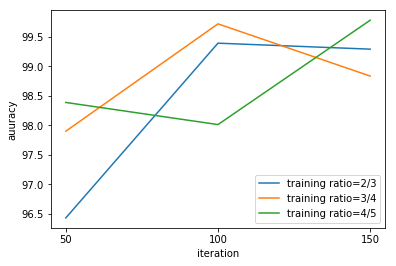

In [44]:
import matplotlib.pyplot as plt
iteration=[50,100,150]
training_ration=['2/3','3/4','4/5']
plt.plot(iteration,accuracy_1,label='training ratio=2/3')
plt.plot(iteration,accuracy_2,label='training ratio=3/4')
plt.plot(iteration,accuracy_3,label='training ratio=4/5')
plt.legend(loc='best')
plt.xlabel('iteration')
plt.ylabel('auuracy')
plt.xticks(iteration)